## A model build using TweetBERT to classify tweet as causal or non-causal 

The cause-effect pair sentence prediction model will be trained on the dataset which got augmented in 5 stepsin several steps using an active learning approach, where in each step the training dataset will be augmented.
In each step the causal sentence classifier is trained and applied on a subsample of unlabeled tweets to identify tweets with causal elements. Those tweets are then manually labeled for the two tasks: causal sentence prediction and cause-effect identification (NER). The newly labeled data will be added to the training dataset and the causal sentence classifier will be retrained with the augmented dataset to increase performance

In [7]:
import pandas as pd
import numpy as np
import spacy 
from sklearn.model_selection import train_test_split
from transformers import BertForSequenceClassification, AutoTokenizer
from transformers import AdamW, get_linear_schedule_with_warmup
from tqdm import tqdm, trange
import random
import os
import torch.nn.functional as F
import torch
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader, SubsetRandomSampler
import transformers
from tqdm import tqdm, trange
import io
from utils import normalizeTweet, split_into_sentences, EarlyStopping
import matplotlib.pyplot as plt

########################### Check if cuda available ############################
# print("Cuda available: ", torch.cuda.is_available())
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



########################### DATA FILE ###################################
# dataPath = "/home/adrian/workspace/causality/Causal-associations-diabetes-twitter/data/Causality_tweets_data.xlsx"
dataPath = "Causality_tweets_data.xlsx"


########################### MODEL PARAMETERS ############################
lr = 1e-3    
adam_eps = 1e-8
epochs = 35
num_warmup_steps = 0
early_patience = 7 # how long to wait after last time validation loss improved

train_batch_size = 16
val_batch_size = 16
test_batch_size = 16
test_to_train_ratio = 0.1 # 10% test and 90% train
val_to_train_ratio = 0.2

metrics_average = "binary" # this will give measure for class_1,i.e., causal class
#
# saveModelName = "./model-causal-model/model_1_finetuned-{}-epochs-lr_{}.pth".format(epochs, lr) # it should be epoch so that the name shows at what epoch teh mdel ws saved

#### Checking if thec cuda is available and then select the `gpu`

In [8]:
########################### Check if cuda available ############################
print("Cuda available: ", torch.cuda.is_available())
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
print("Selected {} for this notebook".format(device))

Cuda available:  True
Selected cuda:1 for this notebook


In [9]:
##### DATA TO LOAD ######

data_sheet1 = pd.read_excel(dataPath, sheet_name="round0")
data_sheet1 = data_sheet1[data_sheet1["Causal association"].notnull()] # some tweets at the end are not labeled yet
data_sheet1 = data_sheet1[["full_text", "Intent", "Cause", "Effect", "Causal association"]]
print("Data sheet 1 (tweets!):")
print(data_sheet1["Causal association"].value_counts())
print()


##### additional data labeled through active learning strategy - round 1 ########
data_sheet2 = pd.read_excel(dataPath, sheet_name="round1")
data_sheet2 = data_sheet2[data_sheet2["Causal association"].notnull()]
data_sheet2 = data_sheet2[["sentence", "Intent", "Cause", "Effect", "Causal association"]]
data_sheet2.rename(columns ={"sentence":"full_text"}, inplace=True) # rename for merge
print("Sentences round 1:")
print(data_sheet2["Causal association"].value_counts())


##### additional data labeled through active learning strategy - round 2 ########
data_sheet3 = pd.read_excel(dataPath, sheet_name="round2")
data_sheet3 = data_sheet3[data_sheet3["Causal association"].notnull()]
data_sheet3 = data_sheet3[["sentence", "Intent", "Cause", "Effect", "Causal association"]]
data_sheet3.rename(columns ={"sentence":"full_text"}, inplace=True) # rename for merge
print("sentences round 2:")
print(data_sheet3["Causal association"].value_counts())

#### merge both datasets ######
data = data_sheet1.append(data_sheet2).append(data_sheet3)
print("\nAfter merge:")
print(data["Causal association"].value_counts())
data.head()

Data sheet 1 (tweets!):
0.0    3710
1.0    1290
Name: Causal association, dtype: int64

Sentences round 1:
0.0    1763
1.0     429
Name: Causal association, dtype: int64
sentences round 2:
0    1658
1     150
Name: Causal association, dtype: int64

After merge:
0.0    7131
1.0    1869
Name: Causal association, dtype: int64


,full_text,Intent,Cause,Effect,Causal association
0,"tonight , I learned my older girl will back he...",NaN,NaN,NaN,0.0
1,USER USER I knew diabetes and fibromyalgia wer...,joke,NaN,NaN,0.0
2,⬇ ️ ⬇ ️ ⬇ ️ THIS ⬇ ️ ⬇ ️ ⬇ ️ My wife has type ...,mS,NaN,NaN,0.0
3,USER Cheers ! Have one for this diabetic too !,mS,NaN,NaN,0.0
4,USER Additionally the medicines are being char...,NaN,medicines are being charged at MRP,costing much higher,1.0


### Preprocessing

In [10]:
def get_start_end_index_of_sentence_in_tweet(tweet, sentence):
    """ 
    The sentence tokens are included in the tweet tokens.
    Return the start end end indices of the sentence tokens in the tweet tokens

    """

    sentence_start_word = sentence[0]
    start_indices = [i for i, x in enumerate(tweet) if x == sentence_start_word] # find all indices of the start word of the sentence 
    try:
        for start_index in start_indices:
            isTrueStartIndex = all([tweet[start_index+i] == sentence[i] for i in range(len(sentence))])
            #print("start_index:", start_index, "isTrueStartIndex:", isTrueStartIndex)
            if isTrueStartIndex:
                return start_index, start_index + len(sentence) 
    except:
        print("ERROR: StartIndex should have been found for sentence:")
        print("tweet:")
        print(tweet)
        print("sentence:")
        print(sentence)
    return -1, -2 # should not be returned


def split_tweets_to_sentences(data):
    """ 
        Splits tweets into sentences and associates the appropriate intent, causes, effects and causal association
        to each sentence.
        
        Parameters:
        - min_words_in_sentences: Minimal number of words in a sentence such that the sentence is kept. 
                                  Assumption: A sentence with too few words does not have enough information
                              
                              
                              
        Ex.:
        full_text                              | Intent | Cause | Effect | Causal association | ...
        --------------------------------------------------------------------------------------------
        what? type 1 causes insulin dependence | q;msS  | type 1|insulin dependence | 1       | ...  
        
        New dataframe returned: 
        full_text                              | Intent | Cause | Effect | Causal association | ...
        --------------------------------------------------------------------------------------------
        what?                                  |   q    |       |        |       0            | ...
        type 1 causes insulin dependence       |        | type 1| insulin dependence | 1       | ...  
    """

    newDF = pd.DataFrame(columns=["sentence", "Intent", "Cause", "Effect", "Causal association", "tokenized"])
    
    for i,row in data.iterrows():
        causes = row["Cause"]
        effects = row["Effect"]
        sentences = split_into_sentences(normalizeTweet(row["full_text"]))
        
        # single sentence in tweet
        if len(sentences) == 1:
            singleSentenceIntent = ""
            if isinstance(row["Intent"], str):
                if len(row["Intent"].split(";")) > 1:
                    singleSentenceIntent = row["Intent"].strip().replace(";msS", "").replace("msS;", "").replace(";mS", "").replace("mS;", "")
                else:
                    if row["Intent"] == "mS" or row["Intent"] == "msS":
                        singleSentenceIntent = ""
                    else:
                        singleSentenceIntent = row["Intent"].strip()
                    
            newDF=newDF.append(pd.Series({"sentence": sentences[0] # only one sentence
                         , "Intent": singleSentenceIntent
                         , "Cause" : row["Cause"]
                         , "Effect": row["Effect"]
                         , "Causal association" : row["Causal association"]
                         , "tokenized": row["tokenized"]}), ignore_index=True)
        
        # tweet has several sentences
        else: 
            intents = str(row["Intent"]).strip().split(";")
            for sentence in sentences:
                sent_tokenized = sentence.split(" ")
                causeInSentence = np.nan if not isinstance(causes, str) or not any([cause in sentence for cause in causes.split(";")]) else ";".join([cause for cause in causes.split(";") if cause in sentence])
                effectInSentence = np.nan if not isinstance(effects, str) or not any([effect in sentence for effect in effects.split(";")]) else ";".join([effect for effect in effects.split(";") if effect in sentence])
                causalAssociationInSentence = 1 if isinstance(causeInSentence, str) and isinstance(effectInSentence, str) else 0
                startIndex, endIndex = get_start_end_index_of_sentence_in_tweet(row["tokenized"], sent_tokenized)
                sentence_tokenized = row["tokenized"][startIndex:endIndex]
                
                if "q" in intents and sentence[-1] == "?": # if current sentence is question
                    newDF=newDF.append(pd.Series({"sentence": sentence, "Intent": "q", "Cause" : causeInSentence
                                                , "Effect": effectInSentence, "Causal association" : causalAssociationInSentence
                                                , "tokenized": sentence_tokenized}), ignore_index=True)                    
                elif "joke" in intents: # all sentences with "joke" in tweet keep the intent "joke"
                    newDF=newDF.append(pd.Series({"sentence": sentence, "Intent": "joke", "Cause" : causeInSentence
                                                , "Effect": effectInSentence, "Causal association" : causalAssociationInSentence
                                                , "tokenized": sentence_tokenized}), ignore_index=True)   
                elif "neg" in intents: # all sentences with "neg" in tweet keep intent "neg"
                    newDF=newDF.append(pd.Series({"sentence": sentence, "Intent": "neg", "Cause" : causeInSentence
                                                , "Effect": effectInSentence, "Causal association" : causalAssociationInSentence
                                                , "tokenized": sentence_tokenized}), ignore_index=True)               
                elif isinstance(causeInSentence, str) and isinstance(effectInSentence, str): # cause effect sentence
                    causalIntent = ""
                    if len(causeInSentence.split(";")) > 1:
                        causalIntent = "mC"
                        if len(effectInSentence.split(";")) > 1:
                            causalIntent = "mC;mE"
                    elif len(effectInSentence.split(";")) > 1:
                        causalIntent = "mE"
                    newDF=newDF.append(pd.Series({"sentence": sentence, "Intent": causalIntent, "Cause" : causeInSentence
                                                , "Effect": effectInSentence, "Causal association" : causalAssociationInSentence
                                                , "tokenized": sentence_tokenized}), ignore_index=True)                                  
                else:
                    nonCausalIntent = ""
                    if isinstance(causeInSentence, str): # only cause is given
                        if len(causeInSentence.split(";")) > 1:
                            nonCausalIntent = "mC"
                    elif isinstance(effectInSentence, str): # only effect is given
                        if len(effectInSentence.split(";")) > 1:
                            nonCausalIntent = "mE"
                    newDF=newDF.append(pd.Series({"sentence": sentence, "Intent": nonCausalIntent, "Cause" : causeInSentence
                                                , "Effect": effectInSentence, "Causal association" : causalAssociationInSentence
                                                , "tokenized": sentence_tokenized}), ignore_index=True)

    return newDF

In [11]:
### Split tweets into sentences (train classifier on sentence level) ####

print("N tweets:", data.shape[0])

data["tokenized"] = data["full_text"].map(lambda tweet: normalizeTweet(tweet).split(" "))
dataSentences = split_tweets_to_sentences(data)
print("N sentences:", dataSentences.shape[0])
dataSentences.head()

N tweets: 9000
N sentences: 15756


,sentence,Intent,Cause,Effect,Causal association,tokenized
0,"tonight , I learned my older girl will back he...",,NaN,NaN,0,"[tonight, ,, I, learned, my, older, girl, will..."
1,Fiercely .,,NaN,NaN,0,"[Fiercely, .]"
2,#impressive #bigsister #type1 #type1times2,,NaN,NaN,0,"[#impressive, #bigsister, #type1, #type1times2]"
3,USER USER I knew diabetes and fibromyalgia wer...,joke,NaN,NaN,0,"[USER, USER, I, knew, diabetes, and, fibromyal..."
4,:face_with_rolling_eyes:,joke,NaN,NaN,0,[:face_with_rolling_eyes:]


In [12]:
########## Remove sentences with joke, question, negation and keep only sentences with more than 3 tokens #####

print("N sentences before filtering: ", dataSentences.shape[0])
dataSentFiltered = dataSentences[~dataSentences["Intent"].str.contains("neg|joke|q")] 
dataSentFiltered = dataSentFiltered[dataSentFiltered["tokenized"].map(len) > 3] 
print("N sentences after filtering: ", dataSentFiltered.shape[0])
print("Distribution:")
print(dataSentFiltered["Causal association"].value_counts())
dataSentFiltered.head()

N sentences before filtering:  15756
N sentences after filtering:  12229
Distribution:
0.0    10627
1.0     1602
Name: Causal association, dtype: int64


,sentence,Intent,Cause,Effect,Causal association,tokenized
0,"tonight , I learned my older girl will back he...",,NaN,NaN,0,"[tonight, ,, I, learned, my, older, girl, will..."
2,#impressive #bigsister #type1 #type1times2,,NaN,NaN,0,"[#impressive, #bigsister, #type1, #type1times2]"
5,:down_arrow: :down_arrow: :down_arrow: THIS :d...,,NaN,NaN,0,"[:down_arrow:, :down_arrow:, :down_arrow:, THI..."
6,I 'm a trans woman .,,NaN,NaN,0,"[I, 'm, a, trans, woman, .]"
7,"Both of us could use a world where "" brave and...",,NaN,NaN,0,"[Both, of, us, could, use, a, world, where, "",..."


### Data split and calculate class weight

In [13]:
####################### Stratified splits ####################


## ONLY FOR TESTING ---------------
#dataSentFiltered = dataSentFiltered[0:500] # for testing

text = dataSentFiltered["sentence"].map(normalizeTweet).values.tolist()
labels = dataSentFiltered["Causal association"].values.tolist()
# first split the data into training and testing label in the ratio of 90:10
train_texts, test_texts, train_labels, test_labels = train_test_split(text, labels, test_size=test_to_train_ratio, stratify=labels, random_state=9)
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=val_to_train_ratio, stratify=train_labels, random_state=9)



data_count_info = pd.Series(labels).value_counts(normalize=True)
train_count_info = pd.Series(train_labels).value_counts(normalize=True)
val_count_info = pd.Series(val_labels).value_counts(normalize=True)
test_count_info = pd.Series(test_labels).value_counts(normalize=True)

# for class-imbalanced dataset, the class weight for a ith class
# to be specified for balancing in the loss function is given by:
# weight[i] = num_samples / (num_classes * num_samples[i])
# since train_count_info obtained above has fraction of samples
# for ith class, hence the corresponding weight calculation is:
class_weight = (1/train_count_info)/len(train_count_info)

print("All: Count = {}, % of 0 = {}, % of 1 = {}".format(
    len(labels), *data_count_info.round(4).to_list()))
print("Train: Count = {}, % of 0 = {}, % of 1 = {}".format(
    len(train_labels), *train_count_info.round(4).to_list()))
print("Val: Count = {}, % of 0 = {}, % of 1 = {}".format(
    len(val_labels), *val_count_info.round(4).to_list()))
print("Test: Count = {}, % of 0 = {}, % of 1 = {}".format(
    len(test_labels), *test_count_info.round(4).to_list()))
print("Balancing class wts: for 0 = {}, for 1 = {}".format(
    *class_weight.round(4).to_list()))

All: Count = 12229, % of 0 = 0.869, % of 1 = 0.131
Train: Count = 8804, % of 0 = 0.869, % of 1 = 0.131
Val: Count = 2202, % of 0 = 0.8688, % of 1 = 0.1312
Test: Count = 1223, % of 0 = 0.8692, % of 1 = 0.1308
Balancing class wts: for 0 = 0.5753, for 1 = 3.8179


#### Defining our DataLoader 

In [14]:
class TweetDataSet(torch.utils.data.Dataset):
    def __init__(self, text, labels, tokenizer):
        self.text = text
        self.labels = labels
        self.tokenizer = tokenizer

    def __getitem__(self, idx):
        inputs = self.tokenizer(self.text, padding=True, truncation=True, return_token_type_ids=True)
        ids = inputs["input_ids"]
        mask = inputs["attention_mask"]
        token_type_ids = inputs["token_type_ids"]
        return {
                "input_ids" : torch.tensor(ids[idx], dtype=torch.long)
              , "attention_mask" : torch.tensor(mask[idx], dtype=torch.long)
              , "token_type_ids" : torch.tensor(token_type_ids[idx], dtype=torch.long)
              , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
        }      

    def __len__(self):
        return len(self.labels)

    
tokenizer = AutoTokenizer.from_pretrained("vinai/bertweet-base")

train_dataset = TweetDataSet(train_texts, train_labels, tokenizer)
val_dataset = TweetDataSet(val_texts, val_labels, tokenizer)
test_dataset = TweetDataSet(test_texts, test_labels, tokenizer)
print(len(train_dataset))
print(len(val_dataset))
print(len(test_dataset))

# During training: In each epoch one part of the training data will be used as validation set
train_loader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)
validation_loader = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size, shuffle=True)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


8804
2202
1223


### Evaluation Metrics

In [15]:
## we are measuring weighted metrics - as our dataset is imbalanced 
# Calculate metrics for each label, and find their average weighted by support
# (the number of true instances for each label). 
# This alters ‘macro’ to account for label imbalance; 
# it can result in an F-score that is not between precision and recall.


from sklearn.metrics import accuracy_score, precision_recall_fscore_support, matthews_corrcoef

def compute_metrics(pred, labels):
#     precision, recall, f1, _ = precision_recall_fscore_support(labels, pred, average='weighted')
    precision, recall, f1, _ = precision_recall_fscore_support(labels,pred, average=metrics_average)
    acc = accuracy_score(labels, pred)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }



### Model defintion

In [18]:


class CausalityBERT(torch.nn.Module):
    """ Model Bert"""
    def __init__(self):
        super(CausalityBERT, self).__init__()
        self.num_labels = 2
        self.bert = transformers.BertModel.from_pretrained("vinai/bertweet-base")
        self.dropout = torch.nn.Dropout(0.3)
        self.linear1 = torch.nn.Linear(768, 256)
        self.linear2 = torch.nn.Linear(256, self.num_labels)
        
    def forward(self, input_ids, attention_mask, token_type_ids):
        _, output_1 = self.bert(input_ids, attention_mask = attention_mask, token_type_ids=token_type_ids, return_dict=False) # if output 1 is our cls token        
        output_2 = self.dropout(output_1)
        output_3 = self.linear1(output_2)  
        output_4 = self.dropout(output_3)
        output_5 = self.linear2(output_4)
        return output_5

### Moving the model to  GPU and defining training parameters: 
    * num_training_steps 
    * optimizers 
    * scheduler 
    * loss funciton (weighted) 

In [19]:
# device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = CausalityBERT() ## just load the model trained in previous round here 
model.to(device)

# fine-tune only the task-specific parameters
for param in model.bert.parameters():
    param.requires_grad = False

num_training_steps = np.ceil(len(train_dataset)/train_batch_size)*epochs
optim = AdamW(model.parameters(), lr=lr, eps=adam_eps)
scheduler = get_linear_schedule_with_warmup(optim, num_warmup_steps=num_warmup_steps, num_training_steps=num_training_steps) # scheduler with a linearly decreasing learning rate from the initial lr set in the optimizer to 0; after a warmup period durnig which it increases linearly from 0 to the initial lr set in the optimizer

## penalising more for class with less number of exaplmes 
loss_fn = CrossEntropyLoss(torch.tensor(class_weight.to_list()).to(device))

You are using a model of type roberta to instantiate a model of type bert. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at vinai/bertweet-base were not used when initializing BertModel: ['roberta.encoder.layer.5.attention.self.value.bias', 'roberta.encoder.layer.10.output.dense.weight', 'roberta.encoder.layer.8.intermediate.dense.bias', 'roberta.encoder.layer.0.attention.self.query.weight', 'roberta.encoder.layer.4.attention.output.LayerNorm.weight', 'roberta.encoder.layer.4.intermediate.dense.weight', 'roberta.encoder.layer.3.output.dense.bias', 'roberta.encoder.layer.10.attention.output.dense.bias', 'roberta.encoder.layer.2.attention.self.value.bias', 'roberta.encoder.layer.10.intermediate.dense.weight', 'roberta.encoder.layer.5.attention.self.key.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.11.attention.self.value.weight', 'roberta.encoder.layer.6.attention.self.query.w

### Training with Validation and early stopping 

In [ ]:
############ TRAINING #############

# initialise the early_stopping object
# early_stopping = EarlyStopping(patience=early_patience, path=saveModelName, verbose=True)
early_stopping = EarlyStopping(patience=early_patience,verbose=True)


train_avg_loss = [] # avg training loss per epoch
val_avg_loss = [] # avg validation loss per epoch
train_avg_acc = [] # avg training accuracy per epoch
val_avg_acc = [] # avg val accuracy per epoch
n_trained_epochs = 0


for epoch in trange(1, epochs+1, desc='Epoch'):
    print("<" + "="*22 + F" Epoch {epoch} "+ "="*22 + ">")
    
    
    ########### training eval metrics #############################
    train_accuracy = []
    train_loss = []
    train_acc = []
    train_prec = []
    train_rec = []
    train_f1 = []
    
    ###################################################
    
    for batch in tqdm(train_loader):
        optim.zero_grad() # gradients get accumulated by default -> clear previous accumulated gradients
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        token_type_ids = batch["token_type_ids"].to(device)
        labels = batch['labels'].to(device)
        ###########################################################################
        model.train()
        logits = model(**{"input_ids":input_ids, "attention_mask":attention_mask, "token_type_ids":token_type_ids}) # forward pass
        #############################################################################
        loss = loss_fn(logits, labels)
        print("loss:", loss)
        loss.backward() # backward pass
        optim.step()    # update parameters and take a step up using the computed gradient
        scheduler.step()# update learning rate scheduler
        train_loss.append(loss.item())
        
    
        ############# Training Accuracy Measure ###################################

        # move logits and labels to CPU
        logits = logits.detach().to('cpu').numpy()
        label_ids = labels.to('cpu').numpy()

        pred_flat = np.argmax(logits, axis=1).flatten()
        labels_flat = label_ids.flatten()

        metrics = compute_metrics(pred_flat, labels_flat)        
        
        train_acc.append(metrics["accuracy"])
        train_prec.append(metrics["precision"])
        train_rec.append(metrics["recall"])
        train_f1.append(metrics["f1"])
        
    train_avg_loss.append(np.mean(train_loss))
    train_avg_acc.append(np.mean(train_acc))
    print(F'\n\tTrain loss: {np.mean(train_loss)}')
    print(F'\n\ttrain acc: {np.mean(train_acc)}')
    print(F'\n\ttraining prec: {np.mean(train_prec)}')
    print(F'\n\ttraining rec: {np.mean(train_rec)}')
    print(F'\n\ttraining f1: {np.mean(train_f1)}')
    
    n_trained_epochs += 1
    
    ###################################################################################

    
    ## ---- Validation ------
    val_accuracy = []
    val_loss = []
    val_acc = []
    val_prec = []
    val_rec = []
    val_f1 = []
    
    
    # Evaluate data for one epoch
    for batch in tqdm(validation_loader):
        batch = tuple(batch[t].to(device) for t in batch)      # batch to GPU
        b_input_ids, b_input_mask, b_token_type_ids, b_labels = batch     # unpack inputs from dataloader
        
        with torch.no_grad(): # tell model not to compute or store gradients -> saves memory + speeds up validation
            ##################################################################################
            model.eval()
            logits = model(**{"input_ids":b_input_ids, "attention_mask":b_input_mask, "token_type_ids":b_token_type_ids}) # forward pass, calculates logit predictions 

                        
        loss = loss_fn(logits, b_labels)
        val_loss.append(loss.item())
        
        # move logits and labels to CPU
        logits = logits.detach().to('cpu').numpy()
        label_ids = b_labels.to('cpu').numpy()
        
        pred_flat = np.argmax(logits, axis=1).flatten()
        labels_flat = label_ids.flatten()
        
        metrics = compute_metrics(pred_flat, labels_flat)
        val_acc.append(metrics["accuracy"])
        val_prec.append(metrics["precision"])
        val_rec.append(metrics["recall"])
        val_f1.append(metrics["f1"])

    val_avg_loss.append(np.mean(val_loss))
    val_avg_acc.append(np.mean(val_acc))
    print(F'\n\tValidation loss: {np.mean(val_loss)}')
    print(F'\n\tValidation acc: {np.mean(val_acc)}')
    print(F'\n\tValidation prec: {np.mean(val_prec)}')
    print(F'\n\tValidation rec: {np.mean(val_rec)}')
    print(F'\n\tValidation f1: {np.mean(val_f1)}')

    # early_stopping needs the validation loss to check if it has decreased,
    # and if it has, it will make a checkpoint of the current model
    saveModelName = "./model-causal-model/model_2_finetuned-{}-epochs-lr_{}.pth".format(n_trained_epochs, lr) 
    early_stopping.path = saveModelName
    early_stopping(np.average(val_loss), model)
    
    if early_stopping.early_stop:
        print("Early stopping")
        break

  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 1 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:42:04, 11.14s/it]

loss: tensor(0.5733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:34, 11.10s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:42, 11.14s/it]

loss: tensor(0.4790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:33, 11.14s/it]

loss: tensor(0.9878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:16, 11.13s/it]

loss: tensor(0.7088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:12, 11.14s/it]

loss: tensor(0.4889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:17<1:40:55, 11.13s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:41:05, 11.17s/it]

loss: tensor(0.5332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:39, 11.14s/it]

loss: tensor(0.7680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:51<1:40:19, 11.13s/it]

loss: tensor(0.9004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:11, 11.13s/it]

loss: tensor(0.7930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:07, 11.15s/it]

loss: tensor(0.7412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:50, 11.13s/it]

loss: tensor(0.4722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:46, 11.15s/it]

loss: tensor(0.6729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:27, 11.13s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:12, 11.13s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:09, 11.14s/it]

loss: tensor(0.7243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 18/551 [03:20<1:38:51, 11.13s/it]

loss: tensor(0.5037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 19/551 [03:31<1:38:37, 11.12s/it]

loss: tensor(0.4686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:37, 11.14s/it]

loss: tensor(0.5581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:21, 11.13s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:16, 11.15s/it]

loss: tensor(0.8083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 23/551 [04:16<1:38:04, 11.14s/it]

loss: tensor(0.5998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:52, 11.14s/it]

loss: tensor(0.4167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:42, 11.15s/it]

loss: tensor(0.8037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:30, 11.14s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 27/551 [05:00<1:37:15, 11.14s/it]

loss: tensor(0.2864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 28/551 [05:11<1:37:16, 11.16s/it]

loss: tensor(0.8034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:36:58, 11.15s/it]

loss: tensor(0.7037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 30/551 [05:34<1:36:35, 11.12s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:31, 11.14s/it]

loss: tensor(0.6439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:16, 11.13s/it]

loss: tensor(0.7286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:00, 11.12s/it]

loss: tensor(0.6496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:56, 11.13s/it]

loss: tensor(0.7484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:29<1:35:54, 11.15s/it]

loss: tensor(0.6860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:40<1:35:37, 11.14s/it]

loss: tensor(0.6221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:36, 11.16s/it]

loss: tensor(0.7295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:18, 11.15s/it]

loss: tensor(0.6875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:35:06, 11.15s/it]

loss: tensor(0.6504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:25<1:35:06, 11.17s/it]

loss: tensor(0.6927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:45, 11.15s/it]

loss: tensor(0.6410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:31, 11.14s/it]

loss: tensor(0.7798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:58<1:34:12, 11.13s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:34:04, 11.13s/it]

loss: tensor(0.6744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:33:58, 11.14s/it]

loss: tensor(0.6432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:37, 11.12s/it]

loss: tensor(0.5156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:13, 11.10s/it]

loss: tensor(0.5717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:14, 11.12s/it]

loss: tensor(0.8174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:33:05, 11.13s/it]

loss: tensor(0.7054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:16<1:32:49, 11.12s/it]

loss: tensor(0.4895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:28<1:32:50, 11.14s/it]

loss: tensor(0.6010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:36, 11.14s/it]

loss: tensor(0.9384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:15, 11.11s/it]

loss: tensor(0.4564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:11, 11.13s/it]

loss: tensor(0.5825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:31:44, 11.10s/it]

loss: tensor(0.8132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:31:40, 11.11s/it]

loss: tensor(0.5827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:31:34, 11.12s/it]

loss: tensor(0.6750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:13, 11.10s/it]

loss: tensor(0.7094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:56<1:31:12, 11.12s/it]

loss: tensor(0.6289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:31:05, 11.13s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:30:53, 11.13s/it]

loss: tensor(0.4145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:45, 11.14s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:26, 11.12s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:14, 11.12s/it]

loss: tensor(0.5947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:17, 11.15s/it]

loss: tensor(0.6407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 66/551 [12:14<1:29:58, 11.13s/it]

loss: tensor(0.7241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:25<1:29:36, 11.11s/it]

loss: tensor(0.7464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:37<1:29:36, 11.13s/it]

loss: tensor(0.6558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:25, 11.13s/it]

loss: tensor(0.7020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:14, 11.13s/it]

loss: tensor(0.5336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 71/551 [13:10<1:29:01, 11.13s/it]

loss: tensor(0.3961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:41, 11.11s/it]

loss: tensor(0.6127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 73/551 [13:32<1:28:37, 11.13s/it]

loss: tensor(0.3264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 74/551 [13:43<1:28:30, 11.13s/it]

loss: tensor(1.0146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▎        | 75/551 [13:54<1:28:15, 11.12s/it]

loss: tensor(0.2414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 76/551 [14:06<1:28:12, 11.14s/it]

loss: tensor(1.1434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:17<1:28:01, 11.14s/it]

loss: tensor(0.9979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 78/551 [14:28<1:27:45, 11.13s/it]

loss: tensor(0.2907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 79/551 [14:39<1:27:43, 11.15s/it]

loss: tensor(0.5956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:50<1:27:23, 11.13s/it]

loss: tensor(0.4540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 81/551 [15:01<1:27:13, 11.14s/it]

loss: tensor(0.7214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:12<1:26:56, 11.12s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 83/551 [15:23<1:26:39, 11.11s/it]

loss: tensor(0.5269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:35<1:26:30, 11.12s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 85/551 [15:46<1:26:17, 11.11s/it]

loss: tensor(0.5407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:26:03, 11.10s/it]

loss: tensor(0.6510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 87/551 [16:08<1:26:01, 11.12s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:19<1:25:43, 11.11s/it]

loss: tensor(0.6480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:30<1:25:32, 11.11s/it]

loss: tensor(0.9127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:41<1:25:29, 11.13s/it]

loss: tensor(0.4751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:52<1:25:18, 11.13s/it]

loss: tensor(0.9270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:04<1:25:03, 11.12s/it]

loss: tensor(0.6558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:15<1:24:55, 11.13s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:26<1:24:45, 11.13s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:36, 11.13s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:48<1:24:25, 11.13s/it]

loss: tensor(0.5656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [17:59<1:24:04, 11.11s/it]

loss: tensor(0.5347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:10<1:24:02, 11.13s/it]

loss: tensor(0.4814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:21<1:23:48, 11.13s/it]

loss: tensor(0.6205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:33<1:23:40, 11.13s/it]

loss: tensor(0.5971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:44<1:23:20, 11.11s/it]

loss: tensor(0.7605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:55<1:23:22, 11.14s/it]

loss: tensor(0.6282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:06<1:23:04, 11.13s/it]

loss: tensor(0.6412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:17<1:22:47, 11.11s/it]

loss: tensor(0.8521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:28<1:22:36, 11.11s/it]

loss: tensor(0.5324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:39<1:22:32, 11.13s/it]

loss: tensor(0.7731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:50<1:22:22, 11.13s/it]

loss: tensor(0.5973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:02<1:22:03, 11.11s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:13<1:21:50, 11.11s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:24<1:21:39, 11.11s/it]

loss: tensor(0.7887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:35<1:21:34, 11.12s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:46<1:21:20, 11.12s/it]

loss: tensor(0.6155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:57<1:21:04, 11.11s/it]

loss: tensor(0.7123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 114/551 [21:08<1:20:55, 11.11s/it]

loss: tensor(0.3828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:19<1:20:44, 11.11s/it]

loss: tensor(0.5601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:30<1:20:38, 11.12s/it]

loss: tensor(0.5747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:42<1:20:31, 11.13s/it]

loss: tensor(0.6472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:53<1:20:11, 11.11s/it]

loss: tensor(0.5867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:04<1:20:13, 11.14s/it]

loss: tensor(0.4017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:15<1:19:53, 11.12s/it]

loss: tensor(0.5554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:26<1:19:36, 11.11s/it]

loss: tensor(0.5152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 122/551 [22:37<1:19:29, 11.12s/it]

loss: tensor(0.6063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:48<1:19:14, 11.11s/it]

loss: tensor(0.6720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [22:59<1:19:04, 11.11s/it]

loss: tensor(0.4900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:11<1:18:51, 11.11s/it]

loss: tensor(0.5689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:22<1:18:41, 11.11s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:33<1:18:41, 11.14s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 128/551 [23:44<1:18:23, 11.12s/it]

loss: tensor(0.4806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:55<1:18:00, 11.09s/it]

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:06<1:17:57, 11.11s/it]

loss: tensor(0.6051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 131/551 [24:17<1:17:45, 11.11s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:28<1:17:26, 11.09s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 133/551 [24:39<1:17:23, 11.11s/it]

loss: tensor(0.3400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:51<1:17:15, 11.12s/it]

loss: tensor(0.3744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:02<1:16:56, 11.10s/it]

loss: tensor(0.7314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 136/551 [25:13<1:16:53, 11.12s/it]

loss: tensor(0.6659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:24<1:16:34, 11.10s/it]

loss: tensor(1.3875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:35<1:16:16, 11.08s/it]

loss: tensor(0.8039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 139/551 [25:46<1:16:16, 11.11s/it]

loss: tensor(0.6533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:57<1:16:01, 11.10s/it]

loss: tensor(0.8112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:08<1:15:52, 11.10s/it]

loss: tensor(0.7439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:19<1:15:37, 11.09s/it]

loss: tensor(0.5286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:30<1:15:25, 11.09s/it]

loss: tensor(0.4798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:41<1:15:17, 11.10s/it]

loss: tensor(0.6191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:53<1:15:11, 11.11s/it]

loss: tensor(0.8612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:04<1:14:58, 11.11s/it]

loss: tensor(0.9151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:15<1:14:50, 11.12s/it]

loss: tensor(0.8073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:26<1:14:37, 11.11s/it]

loss: tensor(0.5072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:37<1:14:24, 11.11s/it]

loss: tensor(0.4424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:48<1:14:18, 11.12s/it]

loss: tensor(0.6212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [27:59<1:14:05, 11.11s/it]

loss: tensor(0.8231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:10<1:13:50, 11.10s/it]

loss: tensor(0.8078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:21<1:13:42, 11.11s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:33<1:13:25, 11.10s/it]

loss: tensor(0.8677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 155/551 [28:44<1:13:18, 11.11s/it]

loss: tensor(0.5781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:55<1:13:10, 11.12s/it]

loss: tensor(0.6587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:06<1:12:52, 11.10s/it]

loss: tensor(0.7950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:17<1:12:39, 11.09s/it]

loss: tensor(0.5625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:28<1:12:39, 11.12s/it]

loss: tensor(0.6324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:39<1:12:28, 11.12s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:50<1:12:20, 11.13s/it]

loss: tensor(0.7522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:02<1:12:09, 11.13s/it]

loss: tensor(0.9788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:13<1:11:55, 11.12s/it]

loss: tensor(0.5724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:24<1:11:46, 11.13s/it]

loss: tensor(0.7469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:35<1:11:28, 11.11s/it]

loss: tensor(0.6106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:46<1:11:14, 11.10s/it]

loss: tensor(0.7815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:57<1:11:12, 11.13s/it]

loss: tensor(0.4659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:08<1:10:59, 11.12s/it]

loss: tensor(1.1399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:19<1:10:43, 11.11s/it]

loss: tensor(0.4519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:30<1:10:36, 11.12s/it]

loss: tensor(0.7283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:42<1:10:31, 11.14s/it]

loss: tensor(0.6371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:53<1:10:11, 11.11s/it]

loss: tensor(0.4988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:04<1:10:04, 11.12s/it]

loss: tensor(0.7030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:15<1:09:47, 11.11s/it]

loss: tensor(0.6358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:26<1:09:43, 11.13s/it]

loss: tensor(0.6874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 176/551 [32:37<1:09:30, 11.12s/it]

loss: tensor(0.7505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:48<1:09:13, 11.10s/it]

loss: tensor(0.5559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [32:59<1:09:09, 11.13s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 179/551 [33:11<1:08:57, 11.12s/it]

loss: tensor(0.6597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:22<1:08:40, 11.11s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 181/551 [33:33<1:08:36, 11.13s/it]

loss: tensor(0.5594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:44<1:08:19, 11.11s/it]

loss: tensor(0.5617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:55<1:08:01, 11.09s/it]

loss: tensor(0.6136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 184/551 [34:06<1:08:02, 11.12s/it]

loss: tensor(0.5873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:17<1:07:43, 11.10s/it]

loss: tensor(0.8566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:28<1:07:33, 11.10s/it]

loss: tensor(1.2241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 187/551 [34:39<1:07:30, 11.13s/it]

loss: tensor(0.8308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:51<1:07:14, 11.11s/it]

loss: tensor(0.6803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 189/551 [35:02<1:07:04, 11.12s/it]

loss: tensor(0.4703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:13<1:06:58, 11.13s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:24<1:06:44, 11.12s/it]

loss: tensor(0.5653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:35<1:06:40, 11.14s/it]

loss: tensor(0.8729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 193/551 [35:46<1:06:24, 11.13s/it]

loss: tensor(0.6483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 194/551 [35:57<1:06:06, 11.11s/it]

loss: tensor(0.4680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:09<1:06:10, 11.15s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:20<1:05:52, 11.13s/it]

loss: tensor(0.7313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:31<1:05:34, 11.11s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:42<1:05:27, 11.13s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:53<1:05:09, 11.11s/it]

loss: tensor(0.4511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:04<1:05:01, 11.12s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:15<1:04:55, 11.13s/it]

loss: tensor(0.6788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:26<1:04:40, 11.12s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:37<1:04:27, 11.11s/it]

loss: tensor(0.5944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:49<1:04:29, 11.15s/it]

loss: tensor(0.6536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:00<1:04:10, 11.13s/it]

loss: tensor(0.6577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 206/551 [38:11<1:03:54, 11.11s/it]

loss: tensor(0.7898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:22<1:03:44, 11.12s/it]

loss: tensor(0.6420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:33<1:03:32, 11.12s/it]

loss: tensor(0.6288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:44<1:03:20, 11.11s/it]

loss: tensor(0.6761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [38:55<1:03:08, 11.11s/it]

loss: tensor(0.5313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:06<1:02:57, 11.11s/it]

loss: tensor(0.6642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:18<1:02:56, 11.14s/it]

loss: tensor(0.6789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:29<1:02:40, 11.13s/it]

loss: tensor(0.6401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [39:40<1:02:30, 11.13s/it]

loss: tensor(0.8280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:51<1:02:21, 11.14s/it]

loss: tensor(0.4802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 216/551 [40:02<1:02:05, 11.12s/it]

loss: tensor(0.5131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:13<1:01:55, 11.12s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:24<1:01:39, 11.11s/it]

loss: tensor(0.5609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:35<1:01:32, 11.12s/it]

loss: tensor(0.6010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:46<1:01:19, 11.12s/it]

loss: tensor(0.7544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [40:58<1:01:10, 11.12s/it]

loss: tensor(0.6266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:09<1:00:56, 11.11s/it]

loss: tensor(0.6916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:20<1:00:39, 11.10s/it]

loss: tensor(0.5239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:31<1:00:36, 11.12s/it]

loss: tensor(0.7341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:42<1:00:20, 11.10s/it]

loss: tensor(0.4298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [41:53<1:00:03, 11.09s/it]

loss: tensor(0.4328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:04<59:53, 11.09s/it]  

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████▏     | 228/551 [42:15<59:45, 11.10s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:26<59:32, 11.09s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:38<59:26, 11.11s/it]

loss: tensor(0.5596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:49<59:09, 11.09s/it]

loss: tensor(0.5748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 232/551 [43:00<59:15, 11.15s/it]

loss: tensor(0.7298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:11<59:01, 11.14s/it]

loss: tensor(0.8025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:22<58:41, 11.11s/it]

loss: tensor(0.6194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:33<58:40, 11.14s/it]

loss: tensor(0.4313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:44<58:31, 11.15s/it]

loss: tensor(0.6837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [43:55<58:15, 11.13s/it]

loss: tensor(0.6236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:07<58:12, 11.16s/it]

loss: tensor(0.6761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:18<57:57, 11.15s/it]

loss: tensor(0.6028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:29<57:44, 11.14s/it]

loss: tensor(0.6919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:40<57:53, 11.20s/it]

loss: tensor(0.5812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:51<57:31, 11.17s/it]

loss: tensor(0.6192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:02<57:11, 11.14s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:14<57:21, 11.21s/it]

loss: tensor(0.7904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:25<56:56, 11.17s/it]

loss: tensor(0.4857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:36<56:34, 11.13s/it]

loss: tensor(0.5841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:47<56:32, 11.16s/it]

loss: tensor(0.5147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [45:58<56:12, 11.13s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:09<56:09, 11.16s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:21<55:55, 11.15s/it]

loss: tensor(0.5919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:32<55:36, 11.12s/it]

loss: tensor(0.3865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:43<55:42, 11.18s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:54<55:25, 11.16s/it]

loss: tensor(0.5416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:05<55:11, 11.15s/it]

loss: tensor(0.4267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:16<55:05, 11.17s/it]

loss: tensor(0.8224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 256/551 [47:27<54:42, 11.13s/it]

loss: tensor(0.3909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:39<54:30, 11.12s/it]

loss: tensor(1.1804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:50<54:29, 11.16s/it]

loss: tensor(0.6069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:01<54:09, 11.13s/it]

loss: tensor(0.5113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:12<53:52, 11.11s/it]

loss: tensor(0.6797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:23<53:55, 11.16s/it]

loss: tensor(0.4761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:34<53:35, 11.13s/it]

loss: tensor(0.6156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:45<53:28, 11.14s/it]

loss: tensor(0.7395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [48:57<53:22, 11.16s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 265/551 [49:08<53:11, 11.16s/it]

loss: tensor(0.6466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:19<53:08, 11.19s/it]

loss: tensor(0.6439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:30<52:46, 11.15s/it]

loss: tensor(0.5744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:41<52:31, 11.14s/it]

loss: tensor(0.3738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 269/551 [49:52<52:30, 11.17s/it]

loss: tensor(0.5156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:04<52:11, 11.14s/it]

loss: tensor(0.5210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:15<51:58, 11.14s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:26<51:52, 11.16s/it]

loss: tensor(0.5976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 273/551 [50:37<51:36, 11.14s/it]

loss: tensor(0.3503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:48<51:23, 11.13s/it]

loss: tensor(0.8266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 275/551 [50:59<51:16, 11.15s/it]

loss: tensor(0.3963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 276/551 [51:10<50:59, 11.13s/it]

loss: tensor(1.2077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:22<50:55, 11.15s/it]

loss: tensor(1.4479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 278/551 [51:33<50:48, 11.17s/it]

loss: tensor(0.8354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 279/551 [51:44<50:29, 11.14s/it]

loss: tensor(0.6765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [51:55<50:19, 11.14s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:06<50:11, 11.16s/it]

loss: tensor(0.7821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:17<49:55, 11.14s/it]

loss: tensor(0.6421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:28<49:49, 11.15s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 284/551 [52:40<49:37, 11.15s/it]

loss: tensor(0.9803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:51<49:28, 11.16s/it]

loss: tensor(0.6064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:02<49:20, 11.17s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:13<49:02, 11.15s/it]

loss: tensor(0.8720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:24<48:46, 11.13s/it]

loss: tensor(0.7218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:35<48:42, 11.16s/it]

loss: tensor(0.5395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:46<48:29, 11.15s/it]

loss: tensor(0.4838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [53:58<48:12, 11.13s/it]

loss: tensor(0.5687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:09<48:08, 11.15s/it]

loss: tensor(0.5044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:20<47:53, 11.14s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:31<47:40, 11.13s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:42<47:35, 11.15s/it]

loss: tensor(0.7034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [54:53<47:18, 11.13s/it]

loss: tensor(0.6969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:04<47:08, 11.14s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 298/551 [55:16<47:01, 11.15s/it]

loss: tensor(0.5311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:27<46:49, 11.15s/it]

loss: tensor(0.4553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 300/551 [55:38<46:43, 11.17s/it]

loss: tensor(0.4241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:49<46:31, 11.17s/it]

loss: tensor(0.5842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:00<46:16, 11.15s/it]

loss: tensor(0.5504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 303/551 [56:11<46:08, 11.16s/it]

loss: tensor(0.4961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:23<45:51, 11.14s/it]

loss: tensor(0.7516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▌    | 305/551 [56:34<45:43, 11.15s/it]

loss: tensor(0.3676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [56:45<45:39, 11.18s/it]

loss: tensor(0.3665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [56:56<45:20, 11.15s/it]

loss: tensor(0.9684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:07<45:06, 11.14s/it]

loss: tensor(0.7181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 309/551 [57:18<45:03, 11.17s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:30<44:49, 11.16s/it]

loss: tensor(0.8625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:41<44:33, 11.14s/it]

loss: tensor(0.9094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:52<44:23, 11.15s/it]

loss: tensor(0.6095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:03<44:06, 11.12s/it]

loss: tensor(0.4385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 314/551 [58:14<44:04, 11.16s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:25<43:52, 11.16s/it]

loss: tensor(0.5949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:36<43:38, 11.14s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:48<43:30, 11.16s/it]

loss: tensor(0.4420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [58:59<43:17, 11.15s/it]

loss: tensor(0.4136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:10<43:01, 11.13s/it]

loss: tensor(0.7482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:21<42:55, 11.15s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:32<42:41, 11.14s/it]

loss: tensor(0.6698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 322/551 [59:43<42:27, 11.13s/it]

loss: tensor(0.6312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [59:54<42:24, 11.16s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:06<42:10, 11.15s/it]

loss: tensor(0.5810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:17<41:59, 11.15s/it]

loss: tensor(0.8592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 326/551 [1:00:28<41:57, 11.19s/it]

loss: tensor(0.6509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:39<41:40, 11.16s/it]

loss: tensor(0.7347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:50<41:28, 11.16s/it]

loss: tensor(0.6754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:01<41:19, 11.17s/it]

loss: tensor(0.6958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 330/551 [1:01:13<41:05, 11.16s/it]

loss: tensor(0.7173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:24<40:58, 11.17s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:35<40:49, 11.18s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:46<40:29, 11.14s/it]

loss: tensor(0.4868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:01:57<40:26, 11.18s/it]

loss: tensor(0.7799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:08<40:12, 11.17s/it]

loss: tensor(0.5721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:19<39:56, 11.15s/it]

loss: tensor(0.7022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:31<39:47, 11.16s/it]

loss: tensor(0.6970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:42<39:35, 11.15s/it]

loss: tensor(0.5956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:02:53<39:24, 11.15s/it]

loss: tensor(0.3708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:04<39:19, 11.18s/it]

loss: tensor(0.6156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:15<39:05, 11.17s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:26<38:49, 11.14s/it]

loss: tensor(0.8584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:38<38:42, 11.16s/it]

loss: tensor(0.9766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:49<38:29, 11.16s/it]

loss: tensor(0.5637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 345/551 [1:04:00<38:16, 11.15s/it]

loss: tensor(0.9505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 346/551 [1:04:11<38:08, 11.17s/it]

loss: tensor(0.7253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:22<37:52, 11.14s/it]

loss: tensor(0.5387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:33<37:37, 11.12s/it]

loss: tensor(0.5948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:44<37:30, 11.14s/it]

loss: tensor(0.6397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:04:56<37:17, 11.13s/it]

loss: tensor(0.7328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:05:07<37:11, 11.16s/it]

loss: tensor(0.4719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 352/551 [1:05:18<36:55, 11.13s/it]

loss: tensor(0.2086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:29<36:37, 11.10s/it]

loss: tensor(0.9042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 354/551 [1:05:40<36:35, 11.14s/it]

loss: tensor(0.3641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 355/551 [1:05:51<36:24, 11.15s/it]

loss: tensor(0.2040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 356/551 [1:06:02<36:08, 11.12s/it]

loss: tensor(0.7841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:06:14<36:03, 11.15s/it]

loss: tensor(1.0011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 358/551 [1:06:25<35:51, 11.15s/it]

loss: tensor(0.6348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 359/551 [1:06:36<35:41, 11.15s/it]

loss: tensor(0.7587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 360/551 [1:06:47<35:35, 11.18s/it]

loss: tensor(1.0826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:06:58<35:18, 11.15s/it]

loss: tensor(0.7154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 362/551 [1:07:09<35:08, 11.16s/it]

loss: tensor(0.4503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:21<34:59, 11.16s/it]

loss: tensor(0.7179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:32<34:44, 11.15s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 365/551 [1:07:43<34:32, 11.14s/it]

loss: tensor(0.7494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▋   | 366/551 [1:07:54<34:19, 11.13s/it]

loss: tensor(0.7768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:05<34:06, 11.12s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:16<34:07, 11.19s/it]

loss: tensor(0.6745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:27<33:47, 11.14s/it]

loss: tensor(0.5977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:38<33:34, 11.13s/it]

loss: tensor(0.4679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:50<33:32, 11.18s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:01<33:15, 11.15s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:12<33:00, 11.13s/it]

loss: tensor(0.5702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:23<32:55, 11.16s/it]

loss: tensor(0.7469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:34<32:42, 11.15s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 376/551 [1:09:46<32:34, 11.17s/it]

loss: tensor(0.4599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:09:57<32:23, 11.17s/it]

loss: tensor(0.7854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:08<32:09, 11.15s/it]

loss: tensor(0.6312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:19<32:02, 11.18s/it]

loss: tensor(0.8244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:30<31:48, 11.16s/it]

loss: tensor(0.6797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:41<31:31, 11.13s/it]

loss: tensor(0.8657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:10:52<31:27, 11.17s/it]

loss: tensor(0.4290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:04<31:14, 11.16s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:15<31:01, 11.15s/it]

loss: tensor(0.6183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:26<30:54, 11.17s/it]

loss: tensor(0.4751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:37<30:40, 11.16s/it]

loss: tensor(0.9144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:48<30:30, 11.16s/it]

loss: tensor(0.7749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:11:59<30:21, 11.18s/it]

loss: tensor(0.5890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:11<30:06, 11.15s/it]

loss: tensor(0.5140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:22<29:55, 11.15s/it]

loss: tensor(0.9226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 391/551 [1:12:33<29:49, 11.19s/it]

loss: tensor(0.6859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:44<29:34, 11.16s/it]

loss: tensor(0.8099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:12:55<29:22, 11.16s/it]

loss: tensor(0.4551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:06<29:10, 11.15s/it]

loss: tensor(0.7004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:17<28:57, 11.14s/it]

loss: tensor(0.5544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 396/551 [1:13:29<28:49, 11.16s/it]

loss: tensor(0.7637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 397/551 [1:13:40<28:38, 11.16s/it]

loss: tensor(0.4730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:51<28:23, 11.13s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:02<28:15, 11.15s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:13<28:00, 11.13s/it]

loss: tensor(0.6106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:24<27:47, 11.12s/it]

loss: tensor(0.4724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:35<27:40, 11.14s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:14:47<27:26, 11.13s/it]

loss: tensor(0.5366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:14:58<27:17, 11.14s/it]

loss: tensor(0.4211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:09<27:07, 11.15s/it]

loss: tensor(0.7903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:15:20<26:56, 11.15s/it]

loss: tensor(0.4185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:31<26:44, 11.14s/it]

loss: tensor(0.5794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:42<26:35, 11.16s/it]

loss: tensor(0.7241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:15:53<26:22, 11.14s/it]

loss: tensor(0.8321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:05<26:11, 11.14s/it]

loss: tensor(0.7631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 411/551 [1:16:16<26:00, 11.15s/it]

loss: tensor(0.9783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:27<25:50, 11.15s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:38<25:42, 11.18s/it]

loss: tensor(0.7118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:49<25:31, 11.18s/it]

loss: tensor(0.4803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:00<25:17, 11.16s/it]

loss: tensor(0.6422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:12<25:10, 11.19s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:23<24:56, 11.17s/it]

loss: tensor(0.5105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:34<24:42, 11.15s/it]

loss: tensor(0.6338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:45<24:37, 11.19s/it]

loss: tensor(0.7391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:17:56<24:24, 11.18s/it]

loss: tensor(0.7997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:07<24:08, 11.15s/it]

loss: tensor(0.6700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 422/551 [1:18:19<23:58, 11.15s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 423/551 [1:18:30<23:46, 11.15s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:41<23:34, 11.14s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:52<23:23, 11.14s/it]

loss: tensor(0.5997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 426/551 [1:19:03<23:10, 11.12s/it]

loss: tensor(0.2825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 427/551 [1:19:14<23:00, 11.13s/it]

loss: tensor(0.6177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 428/551 [1:19:25<22:51, 11.15s/it]

loss: tensor(0.7978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 429/551 [1:19:37<22:37, 11.13s/it]

loss: tensor(1.1593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 430/551 [1:19:48<22:27, 11.14s/it]

loss: tensor(1.3658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 431/551 [1:19:59<22:19, 11.16s/it]

loss: tensor(0.8776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:10<22:05, 11.14s/it]

loss: tensor(0.7484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:21<21:56, 11.16s/it]

loss: tensor(0.8244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:32<21:42, 11.13s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 435/551 [1:20:43<21:31, 11.14s/it]

loss: tensor(0.3757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:20:55<21:23, 11.16s/it]

loss: tensor(0.6418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:06<21:10, 11.15s/it]

loss: tensor(0.9050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:17<20:57, 11.13s/it]

loss: tensor(0.6926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:28<20:50, 11.16s/it]

loss: tensor(0.4839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:39<20:37, 11.15s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:21:50<20:25, 11.14s/it]

loss: tensor(0.5958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 442/551 [1:22:01<20:14, 11.14s/it]

loss: tensor(0.6537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:13<20:01, 11.12s/it]

loss: tensor(0.4745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:24<19:54, 11.16s/it]

loss: tensor(0.6498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:35<19:41, 11.14s/it]

loss: tensor(0.5103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:46<19:28, 11.13s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:22:57<19:19, 11.15s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 448/551 [1:23:08<19:09, 11.16s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 449/551 [1:23:20<18:57, 11.15s/it]

loss: tensor(0.5043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:31<18:48, 11.18s/it]

loss: tensor(0.6933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 451/551 [1:23:42<18:34, 11.14s/it]

loss: tensor(0.7802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 452/551 [1:23:53<18:23, 11.14s/it]

loss: tensor(0.2786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:24:04<18:14, 11.16s/it]

loss: tensor(0.8254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:24:15<18:01, 11.15s/it]

loss: tensor(0.9233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 455/551 [1:24:26<17:50, 11.15s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:38<17:42, 11.18s/it]

loss: tensor(0.8123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:49<17:28, 11.15s/it]

loss: tensor(1.0918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:00<17:17, 11.16s/it]

loss: tensor(0.3948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:11<17:07, 11.17s/it]

loss: tensor(0.6302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:22<16:54, 11.15s/it]

loss: tensor(0.5491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:33<16:43, 11.15s/it]

loss: tensor(0.7152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:45<16:32, 11.15s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:25:56<16:21, 11.16s/it]

loss: tensor(0.6639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:07<16:10, 11.16s/it]

loss: tensor(0.6472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 465/551 [1:26:18<16:00, 11.16s/it]

loss: tensor(1.0272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 466/551 [1:26:29<15:47, 11.15s/it]

loss: tensor(1.0603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:40<15:39, 11.19s/it]

loss: tensor(0.7226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:52<15:26, 11.16s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 469/551 [1:27:03<15:13, 11.14s/it]

loss: tensor(0.6301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:14<15:05, 11.17s/it]

loss: tensor(0.6527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:25<14:52, 11.16s/it]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:36<14:40, 11.15s/it]

loss: tensor(0.6844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:47<14:31, 11.17s/it]

loss: tensor(0.7256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 474/551 [1:27:58<14:18, 11.15s/it]

loss: tensor(0.4225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 475/551 [1:28:10<14:09, 11.18s/it]

loss: tensor(1.0126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▋ | 476/551 [1:28:21<13:57, 11.17s/it]

loss: tensor(0.8732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:28:32<13:44, 11.15s/it]

loss: tensor(1.0951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:43<13:33, 11.14s/it]

loss: tensor(0.6602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:28:54<13:23, 11.16s/it]

loss: tensor(0.6637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:05<13:10, 11.13s/it]

loss: tensor(0.6621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:17<13:00, 11.15s/it]

loss: tensor(0.7125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:28<12:48, 11.14s/it]

loss: tensor(0.5906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:39<12:35, 11.12s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:50<12:27, 11.16s/it]

loss: tensor(0.7172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:01<12:15, 11.14s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:12<12:04, 11.14s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 487/551 [1:30:23<11:53, 11.16s/it]

loss: tensor(1.0659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:35<11:41, 11.14s/it]

loss: tensor(0.7469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:46<11:32, 11.17s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:30:57<11:20, 11.16s/it]

loss: tensor(0.5966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:08<11:07, 11.13s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:19<10:57, 11.15s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:30<10:46, 11.14s/it]

loss: tensor(0.7531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:41<10:35, 11.15s/it]

loss: tensor(0.6447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:53<10:24, 11.14s/it]

loss: tensor(0.4883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:04<10:14, 11.16s/it]

loss: tensor(0.5584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:15<10:02, 11.15s/it]

loss: tensor(0.5427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:26<09:51, 11.16s/it]

loss: tensor(0.7105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:37<09:39, 11.14s/it]

loss: tensor(0.6533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:32:48<09:27, 11.13s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:00<09:18, 11.17s/it]

loss: tensor(0.6564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:11<09:05, 11.13s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:22<08:53, 11.12s/it]

loss: tensor(0.7129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:33<08:44, 11.15s/it]

loss: tensor(0.6667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:44<08:32, 11.14s/it]

loss: tensor(0.5480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:33:55<08:20, 11.13s/it]

loss: tensor(0.6428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:06<08:09, 11.13s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:17<07:58, 11.14s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:29<07:48, 11.15s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:40<07:37, 11.15s/it]

loss: tensor(0.4692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:51<07:25, 11.13s/it]

loss: tensor(0.4767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:02<07:14, 11.14s/it]

loss: tensor(0.5549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:13<07:03, 11.14s/it]

loss: tensor(0.6665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:24<06:52, 11.15s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:35<06:41, 11.15s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:47<06:30, 11.14s/it]

loss: tensor(0.4626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:35:58<06:18, 11.13s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:09<06:07, 11.15s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:20<05:56, 11.14s/it]

loss: tensor(0.6947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:31<05:44, 11.13s/it]

loss: tensor(0.6937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:36:42<05:34, 11.16s/it]

loss: tensor(0.8364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:36:53<05:22, 11.13s/it]

loss: tensor(0.5294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 523/551 [1:37:05<05:11, 11.12s/it]

loss: tensor(0.5482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:16<05:00, 11.13s/it]

loss: tensor(1.1064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:27<04:49, 11.15s/it]

loss: tensor(0.7663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:38<04:39, 11.17s/it]

loss: tensor(1.0817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 527/551 [1:37:49<04:28, 11.20s/it]

loss: tensor(0.4660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:01<04:17, 11.21s/it]

loss: tensor(0.9968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:12<04:07, 11.23s/it]

loss: tensor(0.8128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:23<03:56, 11.24s/it]

loss: tensor(0.8134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:34<03:44, 11.23s/it]

loss: tensor(0.5151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:46<03:33, 11.26s/it]

loss: tensor(0.6051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:38:57<03:22, 11.27s/it]

loss: tensor(0.6331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:08<03:11, 11.25s/it]

loss: tensor(0.6400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:19<02:59, 11.24s/it]

loss: tensor(0.6392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:31<02:48, 11.24s/it]

loss: tensor(0.4578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:42<02:37, 11.25s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:39:53<02:26, 11.27s/it]

loss: tensor(0.7182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:04<02:15, 11.27s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 540/551 [1:40:16<02:04, 11.28s/it]

loss: tensor(0.7844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:27<01:52, 11.29s/it]

loss: tensor(0.7164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:38<01:41, 11.26s/it]

loss: tensor(0.3786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:49<01:29, 11.24s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:01<01:18, 11.27s/it]

loss: tensor(0.7746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:12<01:07, 11.26s/it]

loss: tensor(0.5083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:23<00:56, 11.27s/it]

loss: tensor(0.5467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:35<00:44, 11.25s/it]

loss: tensor(0.5760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:41:46<00:33, 11.24s/it]

loss: tensor(0.5550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:41:57<00:22, 11.29s/it]

loss: tensor(0.6108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:08<00:11, 11.26s/it]

loss: tensor(0.4806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:11<00:00, 11.13s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6408541680950868

	train acc: 0.6842105263157895

	training prec: 0.2138827395633203

	training rec: 0.4901434621035347

	training f1: 0.26185487278939656


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:29,  2.84s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:18,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:08,  2.73s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5758680519850358

	Validation acc: 0.633786231884058

	Validation prec: 0.2363414162327205

	Validation rec: 0.7468599033816424

	Validation f1: 0.3450194023084049
Validation loss decreased (inf --> 0.575868).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 2 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:44:33, 11.41s/it]

loss: tensor(0.6505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:28, 11.31s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:43:00, 11.28s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:48, 11.28s/it]

loss: tensor(0.8640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:43, 11.29s/it]

loss: tensor(0.6182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:24, 11.28s/it]

loss: tensor(0.5277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|▏         | 7/551 [01:18<1:42:12, 11.27s/it]

loss: tensor(0.8754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:41:53, 11.26s/it]

loss: tensor(0.7061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 9/551 [01:41<1:41:53, 11.28s/it]

loss: tensor(0.8431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:49, 11.29s/it]

loss: tensor(0.6618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:31, 11.28s/it]

loss: tensor(0.7013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:18, 11.28s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:12, 11.29s/it]

loss: tensor(0.5579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:37<1:40:59, 11.28s/it]

loss: tensor(0.6975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:44, 11.28s/it]

loss: tensor(0.8361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:39, 11.29s/it]

loss: tensor(0.6897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:40:33, 11.30s/it]

loss: tensor(0.8608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:16, 11.29s/it]

loss: tensor(0.5205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:40:11, 11.30s/it]

loss: tensor(0.4513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:39:52, 11.28s/it]

loss: tensor(0.4982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:42, 11.29s/it]

loss: tensor(0.5792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:42, 11.31s/it]

loss: tensor(0.8012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:13, 11.28s/it]

loss: tensor(0.5300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:30<1:39:13, 11.30s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:42<1:39:03, 11.30s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:46, 11.29s/it]

loss: tensor(0.7275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:40, 11.30s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:16<1:38:18, 11.28s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:27<1:38:01, 11.27s/it]

loss: tensor(0.9410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:37:59, 11.28s/it]

loss: tensor(0.5648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:49<1:37:41, 11.27s/it]

loss: tensor(0.7020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:01<1:37:26, 11.27s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:42, 11.32s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:23<1:37:12, 11.28s/it]

loss: tensor(0.7490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:37:04, 11.29s/it]

loss: tensor(0.4848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:36:54, 11.29s/it]

loss: tensor(0.5386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:42, 11.29s/it]

loss: tensor(0.4968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:08<1:36:35, 11.30s/it]

loss: tensor(0.4510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:20<1:36:17, 11.29s/it]

loss: tensor(0.5873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:31<1:35:55, 11.26s/it]

loss: tensor(0.6422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:42<1:36:00, 11.30s/it]

loss: tensor(0.4617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:53<1:35:38, 11.27s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:05<1:35:34, 11.29s/it]

loss: tensor(0.5105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:16<1:35:33, 11.31s/it]

loss: tensor(0.9464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:27<1:35:06, 11.28s/it]

loss: tensor(0.9885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:39<1:34:59, 11.29s/it]

loss: tensor(0.3886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:50<1:35:00, 11.31s/it]

loss: tensor(0.6695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:01<1:34:30, 11.27s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:13<1:34:29, 11.29s/it]

loss: tensor(0.7033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:24<1:34:24, 11.31s/it]

loss: tensor(0.5244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:35<1:34:07, 11.29s/it]

loss: tensor(0.6725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:46<1:33:55, 11.29s/it]

loss: tensor(0.5894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:58<1:33:32, 11.27s/it]

loss: tensor(0.4662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:09<1:33:22, 11.27s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:20<1:33:12, 11.27s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:31<1:32:43, 11.24s/it]

loss: tensor(0.5313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:43<1:32:43, 11.26s/it]

loss: tensor(0.7985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:54<1:32:28, 11.25s/it]

loss: tensor(0.4004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:05<1:32:17, 11.25s/it]

loss: tensor(0.6715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:16<1:32:00, 11.24s/it]

loss: tensor(0.6323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:28<1:32:08, 11.28s/it]

loss: tensor(0.6981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:39<1:31:45, 11.26s/it]

loss: tensor(0.6166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:50<1:31:35, 11.26s/it]

loss: tensor(0.5973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:01<1:31:18, 11.25s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:13<1:31:10, 11.26s/it]

loss: tensor(0.4983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:24<1:30:58, 11.25s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:35<1:30:40, 11.24s/it]

loss: tensor(0.6771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:46<1:30:22, 11.23s/it]

loss: tensor(0.6111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:58<1:30:18, 11.24s/it]

loss: tensor(0.6714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:09<1:29:58, 11.22s/it]

loss: tensor(0.4884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:20<1:30:00, 11.25s/it]

loss: tensor(0.7801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:31<1:29:53, 11.26s/it]

loss: tensor(0.7204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:43<1:29:34, 11.24s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:54<1:29:24, 11.25s/it]

loss: tensor(0.5488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:05<1:29:15, 11.25s/it]

loss: tensor(0.5435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:16<1:29:02, 11.25s/it]

loss: tensor(0.6125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:28<1:29:02, 11.27s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:39<1:28:53, 11.28s/it]

loss: tensor(0.5453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:50<1:28:30, 11.25s/it]

loss: tensor(0.6141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:01<1:28:14, 11.24s/it]

loss: tensor(0.4710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:13<1:28:08, 11.25s/it]

loss: tensor(0.5169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:24<1:27:56, 11.25s/it]

loss: tensor(0.5634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:35<1:27:42, 11.25s/it]

loss: tensor(0.7429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:46<1:27:29, 11.24s/it]

loss: tensor(0.7800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:58<1:27:22, 11.25s/it]

loss: tensor(0.5875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:09<1:27:13, 11.26s/it]

loss: tensor(0.5276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:20<1:26:50, 11.23s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:31<1:26:34, 11.22s/it]

loss: tensor(0.5046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:43<1:26:40, 11.26s/it]

loss: tensor(0.5336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:54<1:26:17, 11.23s/it]

loss: tensor(0.4436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:05<1:26:15, 11.25s/it]

loss: tensor(0.9066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:16<1:26:14, 11.27s/it]

loss: tensor(0.4372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:28<1:26:19, 11.31s/it]

loss: tensor(0.6805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:39<1:26:05, 11.30s/it]

loss: tensor(0.9295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:50<1:25:39, 11.27s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:02<1:25:29, 11.27s/it]

loss: tensor(0.4254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:13<1:25:40, 11.32s/it]

loss: tensor(0.7247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:24<1:25:12, 11.29s/it]

loss: tensor(0.4349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:36<1:25:05, 11.30s/it]

loss: tensor(0.5556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:47<1:24:55, 11.30s/it]

loss: tensor(0.7742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:58<1:24:33, 11.27s/it]

loss: tensor(0.4685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:09<1:24:21, 11.27s/it]

loss: tensor(0.5525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:21<1:24:11, 11.28s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:32<1:23:58, 11.27s/it]

loss: tensor(0.7737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:43<1:23:47, 11.27s/it]

loss: tensor(0.7201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:54<1:23:31, 11.26s/it]

loss: tensor(0.7336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:06<1:23:24, 11.27s/it]

loss: tensor(0.5241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:17<1:23:18, 11.28s/it]

loss: tensor(0.7727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:28<1:22:55, 11.26s/it]

loss: tensor(0.5408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:40<1:22:51, 11.27s/it]

loss: tensor(0.4549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:51<1:22:40, 11.27s/it]

loss: tensor(0.7273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:02<1:22:21, 11.26s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:13<1:22:18, 11.28s/it]

loss: tensor(0.6917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:25<1:22:09, 11.28s/it]

loss: tensor(0.6946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:36<1:21:53, 11.27s/it]

loss: tensor(0.4537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:47<1:21:39, 11.26s/it]

loss: tensor(0.4472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:58<1:21:31, 11.27s/it]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [22:10<1:21:21, 11.27s/it]

loss: tensor(0.6054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:21<1:21:09, 11.27s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:32<1:20:47, 11.25s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 121/551 [22:44<1:20:50, 11.28s/it]

loss: tensor(0.3574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 122/551 [22:55<1:20:34, 11.27s/it]

loss: tensor(0.2493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:06<1:20:12, 11.24s/it]

loss: tensor(0.3826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:17<1:20:10, 11.27s/it]

loss: tensor(1.1291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:29<1:20:00, 11.27s/it]

loss: tensor(0.4325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:40<1:19:44, 11.26s/it]

loss: tensor(1.0288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:51<1:19:33, 11.26s/it]

loss: tensor(0.7352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:02<1:19:20, 11.25s/it]

loss: tensor(0.7807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:14<1:19:16, 11.27s/it]

loss: tensor(0.9093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:25<1:18:57, 11.25s/it]

loss: tensor(0.7644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 131/551 [24:36<1:18:51, 11.27s/it]

loss: tensor(0.4787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:47<1:18:28, 11.24s/it]

loss: tensor(0.7171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:59<1:18:23, 11.25s/it]

loss: tensor(0.4331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:10<1:18:21, 11.28s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:21<1:18:01, 11.25s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:32<1:17:48, 11.25s/it]

loss: tensor(0.5663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:44<1:17:45, 11.27s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:55<1:17:30, 11.26s/it]

loss: tensor(0.4270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:06<1:17:23, 11.27s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:17<1:17:07, 11.26s/it]

loss: tensor(0.7392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:29<1:17:01, 11.27s/it]

loss: tensor(0.4644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:40<1:17:03, 11.30s/it]

loss: tensor(0.4730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:51<1:16:35, 11.26s/it]

loss: tensor(0.5310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:03<1:16:20, 11.26s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:14<1:16:24, 11.29s/it]

loss: tensor(0.5083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:25<1:16:01, 11.26s/it]

loss: tensor(0.6462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:36<1:15:46, 11.25s/it]

loss: tensor(0.9325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:48<1:15:43, 11.27s/it]

loss: tensor(0.5088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:59<1:15:31, 11.27s/it]

loss: tensor(0.5690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:10<1:15:20, 11.27s/it]

loss: tensor(0.7172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:21<1:15:08, 11.27s/it]

loss: tensor(0.6803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:33<1:14:50, 11.25s/it]

loss: tensor(0.5519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:44<1:14:56, 11.30s/it]

loss: tensor(0.8438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:55<1:14:30, 11.26s/it]

loss: tensor(0.6127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:06<1:14:16, 11.25s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:18<1:14:11, 11.27s/it]

loss: tensor(0.5379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:29<1:13:51, 11.25s/it]

loss: tensor(1.1078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:40<1:13:43, 11.26s/it]

loss: tensor(0.5525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:52<1:13:38, 11.27s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:03<1:13:13, 11.24s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:14<1:13:22, 11.29s/it]

loss: tensor(0.7544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:25<1:13:00, 11.26s/it]

loss: tensor(0.7622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:37<1:12:51, 11.27s/it]

loss: tensor(0.5924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:48<1:12:48, 11.29s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:59<1:12:26, 11.26s/it]

loss: tensor(0.4374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:10<1:12:13, 11.26s/it]

loss: tensor(0.5982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:22<1:12:09, 11.27s/it]

loss: tensor(0.4412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:33<1:11:45, 11.24s/it]

loss: tensor(0.4809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:44<1:11:43, 11.27s/it]

loss: tensor(0.5586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:55<1:11:34, 11.27s/it]

loss: tensor(0.7162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:07<1:11:12, 11.24s/it]

loss: tensor(0.5306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:18<1:11:05, 11.26s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:29<1:11:03, 11.28s/it]

loss: tensor(0.7879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:41<1:10:47, 11.27s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:52<1:10:39, 11.28s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:03<1:10:20, 11.25s/it]

loss: tensor(1.1142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:14<1:10:22, 11.29s/it]

loss: tensor(1.1132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 178/551 [33:26<1:10:11, 11.29s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 179/551 [33:37<1:09:50, 11.27s/it]

loss: tensor(0.9372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:48<1:09:49, 11.29s/it]

loss: tensor(0.6553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:00<1:09:38, 11.29s/it]

loss: tensor(0.7439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:11<1:09:13, 11.26s/it]

loss: tensor(0.5623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:22<1:09:12, 11.28s/it]

loss: tensor(0.4770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:33<1:08:59, 11.28s/it]

loss: tensor(0.6198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▎      | 185/551 [34:45<1:08:48, 11.28s/it]

loss: tensor(0.7618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 186/551 [34:56<1:08:34, 11.27s/it]

loss: tensor(0.5568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:07<1:08:19, 11.26s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:18<1:08:09, 11.27s/it]

loss: tensor(0.9864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 189/551 [35:30<1:08:02, 11.28s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:41<1:07:51, 11.28s/it]

loss: tensor(0.6942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:52<1:07:40, 11.28s/it]

loss: tensor(0.7295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:03<1:07:26, 11.27s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:15<1:07:14, 11.27s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:26<1:07:01, 11.26s/it]

loss: tensor(0.6224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:37<1:06:46, 11.26s/it]

loss: tensor(0.6178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:49<1:06:39, 11.27s/it]

loss: tensor(0.5777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:00<1:06:37, 11.29s/it]

loss: tensor(0.5629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 198/551 [37:11<1:06:24, 11.29s/it]

loss: tensor(0.6223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:22<1:06:07, 11.27s/it]

loss: tensor(0.3858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:34<1:05:51, 11.26s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 201/551 [37:45<1:05:54, 11.30s/it]

loss: tensor(0.7627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [37:56<1:05:44, 11.30s/it]

loss: tensor(0.7476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:08<1:05:22, 11.27s/it]

loss: tensor(0.6403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:19<1:05:18, 11.29s/it]

loss: tensor(0.5211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:30<1:05:05, 11.29s/it]

loss: tensor(0.4451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:41<1:04:56, 11.29s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:53<1:04:35, 11.27s/it]

loss: tensor(0.7377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:04<1:04:25, 11.27s/it]

loss: tensor(0.5840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:15<1:04:22, 11.29s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:26<1:04:00, 11.26s/it]

loss: tensor(0.6916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:38<1:03:46, 11.25s/it]

loss: tensor(0.4728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:49<1:03:39, 11.27s/it]

loss: tensor(0.6055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:00<1:03:32, 11.28s/it]

loss: tensor(0.9248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [40:12<1:03:16, 11.27s/it]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:23<1:03:07, 11.27s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:34<1:02:55, 11.27s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 217/551 [40:45<1:02:47, 11.28s/it]

loss: tensor(0.4421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:57<1:02:25, 11.25s/it]

loss: tensor(0.4114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:08<1:02:16, 11.25s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:19<1:02:09, 11.27s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:30<1:01:55, 11.26s/it]

loss: tensor(0.5601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:42<1:01:42, 11.25s/it]

loss: tensor(0.5153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:53<1:01:37, 11.27s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:04<1:01:19, 11.25s/it]

loss: tensor(0.6306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:15<1:01:13, 11.27s/it]

loss: tensor(0.4524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:27<1:01:01, 11.27s/it]

loss: tensor(0.4987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:38<1:00:50, 11.27s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████▏     | 228/551 [42:49<1:00:40, 11.27s/it]

loss: tensor(0.1404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:01<1:00:40, 11.31s/it]

loss: tensor(0.8167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 230/551 [43:12<1:00:29, 11.31s/it]

loss: tensor(0.2793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:23<1:00:14, 11.30s/it]

loss: tensor(0.8906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 232/551 [43:34<1:00:00, 11.29s/it]

loss: tensor(0.2444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 233/551 [43:46<59:54, 11.30s/it]  

loss: tensor(1.0923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:57<59:41, 11.30s/it]

loss: tensor(0.4260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 235/551 [44:08<59:24, 11.28s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:20<59:19, 11.30s/it]

loss: tensor(1.2846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:31<59:05, 11.29s/it]

loss: tensor(0.7752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:42<58:48, 11.27s/it]

loss: tensor(0.7526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:53<58:23, 11.23s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:04<58:04, 11.20s/it]

loss: tensor(0.4454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:16<57:48, 11.19s/it]

loss: tensor(0.6638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:27<57:27, 11.16s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:38<57:16, 11.16s/it]

loss: tensor(0.5415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:49<57:05, 11.16s/it]

loss: tensor(0.3683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 245/551 [46:00<56:45, 11.13s/it]

loss: tensor(1.1282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:11<56:35, 11.13s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:22<56:22, 11.13s/it]

loss: tensor(0.6030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:33<56:08, 11.12s/it]

loss: tensor(0.6132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:45<55:57, 11.12s/it]

loss: tensor(0.5487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:56<55:48, 11.13s/it]

loss: tensor(0.8262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:07<55:37, 11.12s/it]

loss: tensor(0.4832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:18<55:22, 11.11s/it]

loss: tensor(0.7539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:29<55:10, 11.11s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:40<55:01, 11.12s/it]

loss: tensor(0.7401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 255/551 [47:51<54:48, 11.11s/it]

loss: tensor(0.6591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:02<54:35, 11.10s/it]

loss: tensor(0.5080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:14<54:32, 11.13s/it]

loss: tensor(0.6702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 258/551 [48:25<54:16, 11.12s/it]

loss: tensor(0.5067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:36<54:06, 11.12s/it]

loss: tensor(1.0126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:47<53:59, 11.13s/it]

loss: tensor(0.7479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:58<53:49, 11.14s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [49:09<53:33, 11.12s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:20<53:29, 11.14s/it]

loss: tensor(0.5563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:31<53:13, 11.13s/it]

loss: tensor(0.7103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 265/551 [49:43<53:04, 11.13s/it]

loss: tensor(0.3148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:54<52:54, 11.14s/it]

loss: tensor(0.3963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:05<52:39, 11.13s/it]

loss: tensor(0.8064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:16<52:31, 11.14s/it]

loss: tensor(0.6390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:27<52:16, 11.12s/it]

loss: tensor(0.6456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 270/551 [50:38<52:03, 11.12s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:49<51:58, 11.14s/it]

loss: tensor(0.6552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:00<51:42, 11.12s/it]

loss: tensor(0.7197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 273/551 [51:12<51:34, 11.13s/it]

loss: tensor(0.5052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:23<51:28, 11.15s/it]

loss: tensor(0.6332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:34<51:07, 11.12s/it]

loss: tensor(0.7595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:45<50:57, 11.12s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:56<50:53, 11.14s/it]

loss: tensor(0.4939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:07<50:45, 11.16s/it]

loss: tensor(0.6277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:18<50:29, 11.14s/it]

loss: tensor(0.6927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:30<50:14, 11.12s/it]

loss: tensor(0.6824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 281/551 [52:41<50:00, 11.11s/it]

loss: tensor(0.6295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:52<49:56, 11.14s/it]

loss: tensor(0.4543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:03<49:40, 11.12s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:14<49:33, 11.14s/it]

loss: tensor(0.4998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:25<49:26, 11.15s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:36<49:08, 11.13s/it]

loss: tensor(0.4862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:47<48:58, 11.13s/it]

loss: tensor(0.6431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:59<48:55, 11.16s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:10<48:34, 11.12s/it]

loss: tensor(0.4839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:21<48:29, 11.15s/it]

loss: tensor(0.6403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:32<48:21, 11.16s/it]

loss: tensor(0.4847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:43<48:03, 11.13s/it]

loss: tensor(0.6637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 293/551 [54:54<47:53, 11.14s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:05<47:41, 11.14s/it]

loss: tensor(0.9061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:17<47:32, 11.14s/it]

loss: tensor(0.8565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:28<47:19, 11.13s/it]

loss: tensor(0.7851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:39<47:07, 11.13s/it]

loss: tensor(0.8853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:50<47:00, 11.15s/it]

loss: tensor(0.5230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:01<46:42, 11.12s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:12<46:30, 11.12s/it]

loss: tensor(0.7528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:23<46:25, 11.14s/it]

loss: tensor(0.5664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 302/551 [56:35<46:14, 11.14s/it]

loss: tensor(0.7625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:46<45:58, 11.12s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:57<45:51, 11.14s/it]

loss: tensor(0.7166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:08<45:40, 11.14s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:19<45:25, 11.12s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [57:30<45:21, 11.15s/it]

loss: tensor(0.6178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:41<45:09, 11.15s/it]

loss: tensor(0.6031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:53<44:59, 11.15s/it]

loss: tensor(0.4081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:04<44:40, 11.12s/it]

loss: tensor(0.3777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:15<44:28, 11.12s/it]

loss: tensor(0.9251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:26<44:18, 11.12s/it]

loss: tensor(0.4720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:37<44:01, 11.10s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:48<43:55, 11.12s/it]

loss: tensor(0.5625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:59<43:48, 11.14s/it]

loss: tensor(0.8662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 316/551 [59:10<43:33, 11.12s/it]

loss: tensor(0.3661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:22<43:30, 11.16s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:33<43:17, 11.15s/it]

loss: tensor(0.3524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:44<43:04, 11.14s/it]

loss: tensor(0.5591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:55<42:48, 11.12s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:06<42:36, 11.11s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:17<42:30, 11.14s/it]

loss: tensor(0.6248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:28<42:18, 11.14s/it]

loss: tensor(0.6262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:39<42:05, 11.13s/it]

loss: tensor(0.4079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:51<41:52, 11.12s/it]

loss: tensor(1.0395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:02<41:48, 11.15s/it]

loss: tensor(0.6335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:13<41:34, 11.14s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:24<41:28, 11.16s/it]

loss: tensor(0.7974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:35<41:12, 11.14s/it]

loss: tensor(0.6804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:46<40:55, 11.11s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:57<40:49, 11.14s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:08<40:36, 11.12s/it]

loss: tensor(0.9222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 333/551 [1:02:20<40:22, 11.11s/it]

loss: tensor(0.7718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:31<40:14, 11.13s/it]

loss: tensor(0.6379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:42<40:02, 11.12s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:53<39:51, 11.12s/it]

loss: tensor(0.4600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:04<39:38, 11.11s/it]

loss: tensor(0.4309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:15<39:27, 11.11s/it]

loss: tensor(0.5688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:26<39:23, 11.15s/it]

loss: tensor(0.4676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:37<39:04, 11.11s/it]

loss: tensor(0.6753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 341/551 [1:03:49<38:53, 11.11s/it]

loss: tensor(0.7076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:00<38:50, 11.15s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:11<38:38, 11.15s/it]

loss: tensor(0.7722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:22<38:21, 11.12s/it]

loss: tensor(0.4161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:33<38:14, 11.14s/it]

loss: tensor(0.8560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:44<38:01, 11.13s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:55<37:51, 11.13s/it]

loss: tensor(0.7304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:07<37:41, 11.14s/it]

loss: tensor(0.5744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:18<37:27, 11.13s/it]

loss: tensor(0.9038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:29<37:17, 11.13s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:40<37:09, 11.15s/it]

loss: tensor(0.7635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:51<36:57, 11.14s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 353/551 [1:06:02<36:49, 11.16s/it]

loss: tensor(0.8544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:13<36:32, 11.13s/it]

loss: tensor(0.5200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:25<36:24, 11.14s/it]

loss: tensor(0.5408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:36<36:12, 11.14s/it]

loss: tensor(1.0053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:06:47<35:56, 11.11s/it]

loss: tensor(0.8126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:58<35:47, 11.13s/it]

loss: tensor(0.5917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:09<35:39, 11.14s/it]

loss: tensor(0.7867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:20<35:26, 11.14s/it]

loss: tensor(0.6633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:31<35:10, 11.11s/it]

loss: tensor(0.6322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:42<35:01, 11.12s/it]

loss: tensor(0.6666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 363/551 [1:07:54<34:54, 11.14s/it]

loss: tensor(0.4373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 364/551 [1:08:05<34:42, 11.14s/it]

loss: tensor(0.4656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:16<34:30, 11.13s/it]

loss: tensor(0.6074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:27<34:19, 11.13s/it]

loss: tensor(0.9218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:38<34:08, 11.13s/it]

loss: tensor(0.9411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:49<33:57, 11.14s/it]

loss: tensor(0.7069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:00<33:47, 11.14s/it]

loss: tensor(0.5160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:11<33:34, 11.13s/it]

loss: tensor(0.5318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:23<33:23, 11.13s/it]

loss: tensor(0.5849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 372/551 [1:09:34<33:14, 11.14s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 373/551 [1:09:45<33:03, 11.14s/it]

loss: tensor(0.5353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:56<32:50, 11.13s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:07<32:40, 11.14s/it]

loss: tensor(0.6076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 376/551 [1:10:18<32:27, 11.13s/it]

loss: tensor(1.0013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:29<32:18, 11.14s/it]

loss: tensor(0.5716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:41<32:03, 11.12s/it]

loss: tensor(0.6480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:52<31:51, 11.11s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:03<31:41, 11.12s/it]

loss: tensor(0.6302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:14<31:28, 11.11s/it]

loss: tensor(0.6095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:25<31:20, 11.13s/it]

loss: tensor(0.5495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:36<31:08, 11.12s/it]

loss: tensor(0.6761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:47<30:58, 11.13s/it]

loss: tensor(0.7869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:58<30:48, 11.14s/it]

loss: tensor(0.6635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:10<30:39, 11.15s/it]

loss: tensor(0.6483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:21<30:28, 11.15s/it]

loss: tensor(0.6235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:32<30:15, 11.14s/it]

loss: tensor(0.6635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:43<30:04, 11.14s/it]

loss: tensor(0.6190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:54<29:51, 11.13s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:05<29:40, 11.13s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:16<29:32, 11.15s/it]

loss: tensor(0.5228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:28<29:23, 11.16s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:39<29:08, 11.14s/it]

loss: tensor(0.7923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:50<28:55, 11.13s/it]

loss: tensor(0.5804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:01<28:50, 11.16s/it]

loss: tensor(0.3403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:12<28:39, 11.16s/it]

loss: tensor(0.4857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:23<28:22, 11.12s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:34<28:12, 11.13s/it]

loss: tensor(0.5792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:46<28:03, 11.15s/it]

loss: tensor(0.7503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:57<27:54, 11.16s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:08<27:39, 11.14s/it]

loss: tensor(0.8324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 403/551 [1:15:19<27:27, 11.13s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:30<27:20, 11.16s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:41<27:05, 11.14s/it]

loss: tensor(0.7410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:52<26:54, 11.13s/it]

loss: tensor(0.5602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 407/551 [1:16:04<26:45, 11.15s/it]

loss: tensor(0.6601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:15<26:36, 11.16s/it]

loss: tensor(0.5244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 409/551 [1:16:26<26:21, 11.14s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:37<26:07, 11.12s/it]

loss: tensor(0.4262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:48<25:59, 11.14s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:59<25:46, 11.12s/it]

loss: tensor(0.7066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:10<25:36, 11.14s/it]

loss: tensor(0.6893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 414/551 [1:17:21<25:25, 11.13s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:33<25:10, 11.11s/it]

loss: tensor(0.3957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:44<25:03, 11.14s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:55<24:53, 11.15s/it]

loss: tensor(0.4699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:06<24:41, 11.14s/it]

loss: tensor(0.5833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:17<24:33, 11.16s/it]

loss: tensor(0.7979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 420/551 [1:18:28<24:22, 11.16s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:40<24:13, 11.18s/it]

loss: tensor(0.5621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:51<23:58, 11.15s/it]

loss: tensor(0.4670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:02<23:47, 11.15s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:13<23:35, 11.15s/it]

loss: tensor(0.4530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 425/551 [1:19:24<23:25, 11.16s/it]

loss: tensor(0.4037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 426/551 [1:19:35<23:12, 11.14s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:46<23:02, 11.15s/it]

loss: tensor(0.3517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:58<22:52, 11.16s/it]

loss: tensor(0.8283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:09<22:37, 11.13s/it]

loss: tensor(0.8247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:20<22:28, 11.15s/it]

loss: tensor(0.7990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:31<22:16, 11.14s/it]

loss: tensor(0.7836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:42<22:03, 11.12s/it]

loss: tensor(0.8607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:53<21:55, 11.15s/it]

loss: tensor(0.4975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:04<21:46, 11.16s/it]

loss: tensor(0.8322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:16<21:32, 11.15s/it]

loss: tensor(0.6458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:27<21:21, 11.14s/it]

loss: tensor(0.6610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 437/551 [1:21:38<21:10, 11.15s/it]

loss: tensor(0.9871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:49<20:58, 11.13s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:00<20:47, 11.14s/it]

loss: tensor(0.5037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:11<20:33, 11.12s/it]

loss: tensor(0.8214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:22<20:26, 11.15s/it]

loss: tensor(0.6308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:34<20:15, 11.15s/it]

loss: tensor(0.5809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:45<20:01, 11.12s/it]

loss: tensor(0.4229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:56<19:51, 11.14s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:07<19:41, 11.15s/it]

loss: tensor(0.7251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:18<19:28, 11.13s/it]

loss: tensor(1.0427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:29<19:20, 11.16s/it]

loss: tensor(0.5365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:40<19:08, 11.15s/it]

loss: tensor(0.4791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:52<18:56, 11.14s/it]

loss: tensor(0.6865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:03<18:45, 11.15s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:14<18:33, 11.14s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:25<18:22, 11.14s/it]

loss: tensor(0.9304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:36<18:11, 11.14s/it]

loss: tensor(0.4768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:24:47<17:58, 11.12s/it]

loss: tensor(0.5708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:58<17:50, 11.15s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:09<17:36, 11.12s/it]

loss: tensor(0.4966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:21<17:25, 11.12s/it]

loss: tensor(0.5878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:32<17:17, 11.16s/it]

loss: tensor(0.7331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:43<17:05, 11.14s/it]

loss: tensor(0.4413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:54<16:51, 11.11s/it]

loss: tensor(0.4307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▎ | 461/551 [1:26:05<16:43, 11.15s/it]

loss: tensor(0.7402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:16<16:31, 11.14s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:27<16:18, 11.12s/it]

loss: tensor(0.7331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:39<16:09, 11.14s/it]

loss: tensor(0.7064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:50<15:58, 11.14s/it]

loss: tensor(0.4777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:01<15:47, 11.15s/it]

loss: tensor(0.8226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:12<15:36, 11.14s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:23<15:23, 11.12s/it]

loss: tensor(0.7153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:34<15:14, 11.16s/it]

loss: tensor(0.4756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:45<15:01, 11.12s/it]

loss: tensor(0.6156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:56<14:48, 11.11s/it]

loss: tensor(0.7185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:08<14:40, 11.14s/it]

loss: tensor(0.6113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:19<14:31, 11.17s/it]

loss: tensor(0.5443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:30<14:19, 11.17s/it]

loss: tensor(0.6907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:41<14:07, 11.15s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:52<13:55, 11.14s/it]

loss: tensor(0.6764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:03<13:44, 11.15s/it]

loss: tensor(0.6229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:15<13:34, 11.16s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:26<13:22, 11.14s/it]

loss: tensor(0.6320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:37<13:11, 11.15s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:48<13:01, 11.16s/it]

loss: tensor(0.6593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:59<12:49, 11.15s/it]

loss: tensor(0.6426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:10<12:39, 11.17s/it]

loss: tensor(0.4995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:22<12:26, 11.15s/it]

loss: tensor(0.6459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:33<12:17, 11.17s/it]

loss: tensor(0.4806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:44<12:05, 11.16s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:55<11:53, 11.14s/it]

loss: tensor(0.4325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 488/551 [1:31:06<11:43, 11.16s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:17<11:32, 11.17s/it]

loss: tensor(0.4911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:29<11:21, 11.16s/it]

loss: tensor(0.3212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:40<11:09, 11.15s/it]

loss: tensor(0.5999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 492/551 [1:31:51<10:57, 11.15s/it]

loss: tensor(0.2289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 493/551 [1:32:02<10:46, 11.15s/it]

loss: tensor(0.5258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:13<10:35, 11.14s/it]

loss: tensor(1.1934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 495/551 [1:32:24<10:23, 11.14s/it]

loss: tensor(1.5068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:35<10:13, 11.16s/it]

loss: tensor(0.6346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:47<10:02, 11.15s/it]

loss: tensor(0.3418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 498/551 [1:32:58<09:51, 11.15s/it]

loss: tensor(0.3302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:09<09:41, 11.18s/it]

loss: tensor(0.7969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:20<09:30, 11.18s/it]

loss: tensor(0.4221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:31<09:18, 11.17s/it]

loss: tensor(0.7879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:43<09:07, 11.17s/it]

loss: tensor(0.7254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:54<08:55, 11.16s/it]

loss: tensor(0.8302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:05<08:44, 11.15s/it]

loss: tensor(0.8126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:16<08:33, 11.16s/it]

loss: tensor(0.7065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:27<08:22, 11.17s/it]

loss: tensor(0.5809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 507/551 [1:34:38<08:11, 11.18s/it]

loss: tensor(0.8378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:49<07:59, 11.14s/it]

loss: tensor(0.9756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 509/551 [1:35:01<07:48, 11.15s/it]

loss: tensor(1.1896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:12<07:38, 11.18s/it]

loss: tensor(0.6059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:23<07:25, 11.14s/it]

loss: tensor(0.7075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:34<07:14, 11.14s/it]

loss: tensor(0.7092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 513/551 [1:35:45<07:03, 11.15s/it]

loss: tensor(0.8982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:56<06:52, 11.15s/it]

loss: tensor(0.5763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:07<06:41, 11.15s/it]

loss: tensor(0.5182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:19<06:30, 11.15s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 517/551 [1:36:30<06:18, 11.15s/it]

loss: tensor(0.3818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:41<06:08, 11.17s/it]

loss: tensor(0.4154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:52<05:57, 11.16s/it]

loss: tensor(0.3258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:37:03<05:45, 11.16s/it]

loss: tensor(0.3833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:37:14<05:34, 11.16s/it]

loss: tensor(0.3517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 522/551 [1:37:26<05:23, 11.14s/it]

loss: tensor(0.7732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 523/551 [1:37:37<05:12, 11.15s/it]

loss: tensor(1.1241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 524/551 [1:37:48<05:01, 11.16s/it]

loss: tensor(1.0894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 525/551 [1:37:59<04:49, 11.13s/it]

loss: tensor(0.7598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:10<04:38, 11.15s/it]

loss: tensor(0.8418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:21<04:28, 11.17s/it]

loss: tensor(0.3458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:32<04:16, 11.14s/it]

loss: tensor(0.7639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:44<04:05, 11.17s/it]

loss: tensor(0.7077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 530/551 [1:38:55<03:54, 11.16s/it]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:06<03:43, 11.16s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:17<03:31, 11.16s/it]

loss: tensor(0.6153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:28<03:20, 11.15s/it]

loss: tensor(0.7196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:39<03:10, 11.18s/it]

loss: tensor(0.5732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:51<02:58, 11.17s/it]

loss: tensor(0.6917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:40:02<02:47, 11.16s/it]

loss: tensor(0.8071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:13<02:36, 11.16s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:24<02:25, 11.18s/it]

loss: tensor(0.7926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:35<02:13, 11.16s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:46<02:02, 11.17s/it]

loss: tensor(0.6342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:58<01:51, 11.16s/it]

loss: tensor(0.3915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:09<01:40, 11.14s/it]

loss: tensor(0.4420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:20<01:29, 11.16s/it]

loss: tensor(0.8181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:41:31<01:18, 11.15s/it]

loss: tensor(0.7392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:42<01:06, 11.13s/it]

loss: tensor(0.5113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:53<00:55, 11.17s/it]

loss: tensor(0.6813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:05<00:44, 11.18s/it]

loss: tensor(0.5654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:16<00:33, 11.16s/it]

loss: tensor(0.5071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:27<00:22, 11.16s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:38<00:11, 11.17s/it]

loss: tensor(0.8313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:41<00:00, 11.18s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.8712, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6252640583121408

	train acc: 0.6784255898366606

	training prec: 0.23409183073429898

	training rec: 0.5292498487598306

	training f1: 0.2907541298007829


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 1/138 [00:02<06:10,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:09,  2.71s/it]<ipython-input-14-2d1ecdd7ff


	Validation loss: 0.5618827962788983

	Validation acc: 0.6512681159420289

	Validation prec: 0.24852301482736264

	Validation rec: 0.7227053140096618

	Validation f1: 0.35236313605878816
Validation loss decreased (0.575868 --> 0.561883).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 3 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:41:54, 11.12s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:53, 11.14s/it]

loss: tensor(0.6074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:01, 11.17s/it]

loss: tensor(0.7877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:42:08, 11.20s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:30, 11.16s/it]

loss: tensor(0.5969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 6/551 [01:06<1:41:14, 11.15s/it]

loss: tensor(0.4899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:27, 11.19s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:41:03, 11.17s/it]

loss: tensor(0.8918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 9/551 [01:40<1:40:36, 11.14s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:36, 11.16s/it]

loss: tensor(0.6056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:29, 11.17s/it]

loss: tensor(0.5466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:14, 11.16s/it]

loss: tensor(0.5802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 13/551 [02:25<1:39:57, 11.15s/it]

loss: tensor(0.4274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 14/551 [02:36<1:39:43, 11.14s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:34, 11.15s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:27, 11.15s/it]

loss: tensor(0.4744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:15, 11.15s/it]

loss: tensor(0.7677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:59, 11.14s/it]

loss: tensor(0.7788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:52, 11.15s/it]

loss: tensor(0.8921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:38:40, 11.15s/it]

loss: tensor(0.9863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:36, 11.16s/it]

loss: tensor(0.6973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:16, 11.15s/it]

loss: tensor(0.7206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:07, 11.15s/it]

loss: tensor(0.4411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:38:04, 11.17s/it]

loss: tensor(0.4044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:47, 11.15s/it]

loss: tensor(0.8155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:20, 11.13s/it]

loss: tensor(0.7152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 27/551 [05:01<1:37:23, 11.15s/it]

loss: tensor(0.8119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:16, 11.16s/it]

loss: tensor(0.5591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:36:53, 11.14s/it]

loss: tensor(0.5390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:42, 11.14s/it]

loss: tensor(0.6386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:47, 11.17s/it]

loss: tensor(0.6854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:20, 11.14s/it]

loss: tensor(0.5526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:08<1:36:10, 11.14s/it]

loss: tensor(0.6293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:19<1:36:04, 11.15s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:35:41, 11.13s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:39, 11.14s/it]

loss: tensor(0.8028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:24, 11.14s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:05, 11.12s/it]

loss: tensor(0.6120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:34:56, 11.13s/it]

loss: tensor(0.7157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:25<1:34:31, 11.10s/it]

loss: tensor(0.5386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:21, 11.10s/it]

loss: tensor(0.5368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:48<1:34:12, 11.10s/it]

loss: tensor(0.5994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:33:52, 11.09s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:33:47, 11.10s/it]

loss: tensor(0.6365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:33:49, 11.13s/it]

loss: tensor(0.4568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:24, 11.10s/it]

loss: tensor(0.5527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:28, 11.13s/it]

loss: tensor(0.5918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:18, 11.13s/it]

loss: tensor(0.5056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:32:53, 11.10s/it]

loss: tensor(0.5106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:16<1:32:55, 11.13s/it]

loss: tensor(0.5918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:28<1:32:49, 11.14s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:27, 11.12s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:27, 11.14s/it]

loss: tensor(0.6138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:05, 11.12s/it]

loss: tensor(0.7245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:31:46, 11.10s/it]

loss: tensor(0.5912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 56/551 [10:23<1:31:54, 11.14s/it]

loss: tensor(0.4409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:31:24, 11.10s/it]

loss: tensor(0.5429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:15, 11.11s/it]

loss: tensor(0.6958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:57<1:31:08, 11.12s/it]

loss: tensor(0.6988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:30:48, 11.10s/it]

loss: tensor(0.7050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:30:45, 11.11s/it]

loss: tensor(0.4920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:33, 11.11s/it]

loss: tensor(0.8009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:05, 11.08s/it]

loss: tensor(0.5810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:17, 11.12s/it]

loss: tensor(0.8300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:03, 11.12s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:14<1:29:37, 11.09s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:25<1:29:42, 11.12s/it]

loss: tensor(0.7536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:37<1:29:33, 11.12s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:20, 11.12s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:03, 11.11s/it]

loss: tensor(0.8417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:28:45, 11.09s/it]

loss: tensor(0.5986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:43, 11.11s/it]

loss: tensor(0.5642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:32<1:28:34, 11.12s/it]

loss: tensor(0.8035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:43<1:28:09, 11.09s/it]

loss: tensor(0.7294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:54<1:28:07, 11.11s/it]

loss: tensor(0.6080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:05<1:28:00, 11.12s/it]

loss: tensor(0.7081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:16<1:27:40, 11.10s/it]

loss: tensor(0.6758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:28<1:27:40, 11.12s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:27, 11.12s/it]

loss: tensor(0.4825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:50<1:27:16, 11.12s/it]

loss: tensor(0.7478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:01<1:27:00, 11.11s/it]

loss: tensor(0.5949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:12<1:26:51, 11.11s/it]

loss: tensor(0.6285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:23<1:26:36, 11.10s/it]

loss: tensor(0.7489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:34<1:26:30, 11.12s/it]

loss: tensor(0.6405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:45<1:26:12, 11.10s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 86/551 [15:56<1:26:02, 11.10s/it]

loss: tensor(0.6326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:08<1:25:44, 11.09s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:19<1:25:41, 11.11s/it]

loss: tensor(0.5467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:30<1:25:31, 11.11s/it]

loss: tensor(0.6576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▋        | 90/551 [16:41<1:25:27, 11.12s/it]

loss: tensor(0.4056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:52<1:25:20, 11.13s/it]

loss: tensor(0.7427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 92/551 [17:03<1:25:15, 11.14s/it]

loss: tensor(0.4722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:14<1:24:59, 11.13s/it]

loss: tensor(0.3663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:25<1:24:48, 11.13s/it]

loss: tensor(0.4568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:32, 11.12s/it]

loss: tensor(0.6598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 96/551 [17:48<1:24:26, 11.14s/it]

loss: tensor(0.2663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 97/551 [17:59<1:24:18, 11.14s/it]

loss: tensor(0.2689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 98/551 [18:10<1:24:08, 11.14s/it]

loss: tensor(0.8491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 99/551 [18:21<1:23:50, 11.13s/it]

loss: tensor(0.8689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 100/551 [18:32<1:23:38, 11.13s/it]

loss: tensor(0.2271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:43<1:23:34, 11.14s/it]

loss: tensor(0.9014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:55<1:23:23, 11.14s/it]

loss: tensor(0.4658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 103/551 [19:06<1:23:05, 11.13s/it]

loss: tensor(0.9979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:17<1:22:58, 11.14s/it]

loss: tensor(0.9567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:28<1:23:06, 11.18s/it]

loss: tensor(0.6578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:39<1:22:36, 11.14s/it]

loss: tensor(0.6687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:50<1:22:38, 11.17s/it]

loss: tensor(0.5318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 108/551 [20:01<1:22:16, 11.14s/it]

loss: tensor(0.6858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:13<1:22:07, 11.15s/it]

loss: tensor(0.6797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:24<1:21:54, 11.14s/it]

loss: tensor(0.9724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:35<1:21:37, 11.13s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:46<1:21:27, 11.13s/it]

loss: tensor(0.6170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:57<1:21:21, 11.15s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:08<1:20:58, 11.12s/it]

loss: tensor(0.4505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:19<1:20:52, 11.13s/it]

loss: tensor(0.5925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 116/551 [21:31<1:20:39, 11.13s/it]

loss: tensor(0.8398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:42<1:20:20, 11.11s/it]

loss: tensor(0.5584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:53<1:20:11, 11.11s/it]

loss: tensor(0.5815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:04<1:20:04, 11.12s/it]

loss: tensor(0.5764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:15<1:19:43, 11.10s/it]

loss: tensor(0.7311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:26<1:19:49, 11.14s/it]

loss: tensor(0.5514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:37<1:19:30, 11.12s/it]

loss: tensor(0.5342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:48<1:19:06, 11.09s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [22:59<1:19:07, 11.12s/it]

loss: tensor(0.5416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:11<1:18:56, 11.12s/it]

loss: tensor(0.6794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:22<1:18:48, 11.13s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:33<1:18:32, 11.11s/it]

loss: tensor(0.6394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:44<1:18:07, 11.08s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:55<1:18:05, 11.10s/it]

loss: tensor(0.5827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:06<1:17:55, 11.11s/it]

loss: tensor(0.5308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:17<1:17:36, 11.09s/it]

loss: tensor(0.7822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:28<1:17:35, 11.11s/it]

loss: tensor(0.5446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:39<1:17:32, 11.13s/it]

loss: tensor(0.6811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:50<1:17:12, 11.11s/it]

loss: tensor(0.6818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:02<1:17:03, 11.11s/it]

loss: tensor(0.6484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:13<1:16:51, 11.11s/it]

loss: tensor(0.6406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:24<1:16:41, 11.11s/it]

loss: tensor(0.3860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:35<1:16:39, 11.14s/it]

loss: tensor(0.7140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:46<1:16:18, 11.11s/it]

loss: tensor(0.5826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:57<1:16:04, 11.11s/it]

loss: tensor(0.4954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:08<1:16:15, 11.16s/it]

loss: tensor(0.8479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:19<1:15:49, 11.12s/it]

loss: tensor(0.5516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:31<1:15:34, 11.11s/it]

loss: tensor(0.8529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:42<1:15:30, 11.13s/it]

loss: tensor(0.8617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:53<1:15:14, 11.12s/it]

loss: tensor(0.7335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:04<1:15:01, 11.12s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:15<1:14:47, 11.11s/it]

loss: tensor(0.7420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:26<1:14:27, 11.09s/it]

loss: tensor(0.3685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 149/551 [27:37<1:14:22, 11.10s/it]

loss: tensor(0.5684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:48<1:14:14, 11.11s/it]

loss: tensor(0.5232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [27:59<1:13:59, 11.10s/it]

loss: tensor(0.6592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:11<1:13:56, 11.12s/it]

loss: tensor(0.6854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:22<1:13:44, 11.12s/it]

loss: tensor(0.9378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:33<1:13:24, 11.09s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:44<1:13:16, 11.10s/it]

loss: tensor(0.6593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:55<1:13:05, 11.10s/it]

loss: tensor(0.3904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:06<1:12:46, 11.08s/it]

loss: tensor(0.6374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:17<1:12:52, 11.13s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:28<1:12:36, 11.11s/it]

loss: tensor(0.7817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:39<1:12:19, 11.10s/it]

loss: tensor(0.5306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:50<1:12:10, 11.10s/it]

loss: tensor(0.8620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:02<1:11:53, 11.09s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:13<1:11:44, 11.09s/it]

loss: tensor(0.6835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:24<1:11:33, 11.09s/it]

loss: tensor(0.8147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:35<1:11:18, 11.08s/it]

loss: tensor(0.4058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:46<1:11:21, 11.12s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:57<1:11:08, 11.12s/it]

loss: tensor(0.5210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 168/551 [31:08<1:10:44, 11.08s/it]

loss: tensor(0.7223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 169/551 [31:19<1:10:32, 11.08s/it]

loss: tensor(0.4836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [31:30<1:10:25, 11.09s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:41<1:10:12, 11.09s/it]

loss: tensor(0.7643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:52<1:10:04, 11.09s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███▏      | 173/551 [32:04<1:09:51, 11.09s/it]

loss: tensor(0.7928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:15<1:09:45, 11.10s/it]

loss: tensor(0.5886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 175/551 [32:26<1:09:44, 11.13s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:37<1:09:20, 11.09s/it]

loss: tensor(0.4217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:48<1:09:05, 11.09s/it]

loss: tensor(0.8013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [32:59<1:09:10, 11.13s/it]

loss: tensor(0.8559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:10<1:08:51, 11.11s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:21<1:08:41, 11.11s/it]

loss: tensor(0.7329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:33<1:08:33, 11.12s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:44<1:08:16, 11.10s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:55<1:08:10, 11.12s/it]

loss: tensor(0.4941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:06<1:07:53, 11.10s/it]

loss: tensor(0.4546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:17<1:07:36, 11.08s/it]

loss: tensor(0.3909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:28<1:07:33, 11.11s/it]

loss: tensor(0.4595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:39<1:07:19, 11.10s/it]

loss: tensor(0.6306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:50<1:07:00, 11.08s/it]

loss: tensor(0.3499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 189/551 [35:01<1:06:56, 11.10s/it]

loss: tensor(0.5126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:12<1:06:47, 11.10s/it]

loss: tensor(0.6383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:23<1:06:31, 11.09s/it]

loss: tensor(0.7365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:35<1:06:30, 11.11s/it]

loss: tensor(0.5239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 193/551 [35:46<1:06:08, 11.08s/it]

loss: tensor(0.3699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [35:57<1:06:01, 11.10s/it]

loss: tensor(0.7590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:08<1:05:54, 11.11s/it]

loss: tensor(0.7846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:19<1:05:39, 11.10s/it]

loss: tensor(0.7833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:30<1:05:33, 11.11s/it]

loss: tensor(0.4872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 198/551 [36:41<1:05:21, 11.11s/it]

loss: tensor(0.4969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:52<1:05:08, 11.10s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 200/551 [37:03<1:05:01, 11.11s/it]

loss: tensor(0.2827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:14<1:04:44, 11.10s/it]

loss: tensor(0.6692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:26<1:04:35, 11.10s/it]

loss: tensor(0.3928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:37<1:04:24, 11.11s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:48<1:04:15, 11.11s/it]

loss: tensor(0.4085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [37:59<1:04:06, 11.12s/it]

loss: tensor(0.4461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:10<1:03:57, 11.12s/it]

loss: tensor(0.4883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:21<1:03:44, 11.12s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:32<1:03:24, 11.09s/it]

loss: tensor(1.1057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:43<1:03:14, 11.10s/it]

loss: tensor(0.4181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [38:54<1:03:02, 11.09s/it]

loss: tensor(0.6163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:06<1:02:54, 11.10s/it]

loss: tensor(0.8889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:17<1:02:40, 11.09s/it]

loss: tensor(0.4337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:28<1:02:36, 11.11s/it]

loss: tensor(0.5511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:39<1:02:22, 11.11s/it]

loss: tensor(0.3928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:50<1:02:12, 11.11s/it]

loss: tensor(0.6873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:01<1:01:59, 11.10s/it]

loss: tensor(0.6867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 217/551 [40:12<1:01:45, 11.10s/it]

loss: tensor(0.7026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:23<1:01:32, 11.09s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:34<1:01:20, 11.09s/it]

loss: tensor(0.7962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:45<1:01:01, 11.06s/it]

loss: tensor(0.6066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [40:56<1:00:51, 11.06s/it]

loss: tensor(0.5707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:07<1:00:32, 11.04s/it]

loss: tensor(0.8302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:18<1:00:26, 11.06s/it]

loss: tensor(0.2469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:30<1:00:18, 11.07s/it]

loss: tensor(1.4694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:41<1:00:01, 11.05s/it]

loss: tensor(0.7038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [41:52<59:55, 11.06s/it]  

loss: tensor(0.4675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:03<59:52, 11.09s/it]

loss: tensor(0.7797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:14<59:32, 11.06s/it]

loss: tensor(0.6091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:25<59:23, 11.07s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:36<59:18, 11.09s/it]

loss: tensor(0.8531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 231/551 [42:47<59:04, 11.08s/it]

loss: tensor(0.9189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [42:58<59:02, 11.11s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:09<58:43, 11.08s/it]

loss: tensor(0.8114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:20<58:36, 11.09s/it]

loss: tensor(0.6726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:31<58:27, 11.10s/it]

loss: tensor(0.6719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:43<58:11, 11.08s/it]

loss: tensor(0.7045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [43:54<57:56, 11.07s/it]

loss: tensor(0.5775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:05<57:55, 11.10s/it]

loss: tensor(0.7092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:16<57:40, 11.09s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:27<57:30, 11.09s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:38<57:21, 11.10s/it]

loss: tensor(0.7404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:49<57:02, 11.08s/it]

loss: tensor(0.5755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:00<56:56, 11.09s/it]

loss: tensor(0.5071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:11<56:41, 11.08s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:22<56:23, 11.06s/it]

loss: tensor(0.4978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 246/551 [45:33<56:18, 11.08s/it]

loss: tensor(0.6391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:44<56:02, 11.06s/it]

loss: tensor(0.6364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [45:55<55:48, 11.05s/it]

loss: tensor(0.7207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:07<55:41, 11.06s/it]

loss: tensor(0.4346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:18<55:24, 11.05s/it]

loss: tensor(0.6749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 251/551 [46:29<55:17, 11.06s/it]

loss: tensor(0.3136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:40<55:17, 11.09s/it]

loss: tensor(0.7963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:51<55:00, 11.07s/it]

loss: tensor(0.6553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:02<55:03, 11.12s/it]

loss: tensor(0.4038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:13<54:47, 11.11s/it]

loss: tensor(0.5382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:24<54:33, 11.10s/it]

loss: tensor(0.7083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:35<54:27, 11.11s/it]

loss: tensor(0.7781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:46<54:12, 11.10s/it]

loss: tensor(0.7686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [47:57<53:54, 11.08s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:09<53:56, 11.12s/it]

loss: tensor(0.6513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:20<53:41, 11.11s/it]

loss: tensor(0.4171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:31<53:23, 11.09s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:42<53:14, 11.09s/it]

loss: tensor(0.8575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [48:53<52:59, 11.08s/it]

loss: tensor(0.5047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:04<52:54, 11.10s/it]

loss: tensor(0.5253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:15<52:45, 11.11s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 267/551 [49:26<52:28, 11.09s/it]

loss: tensor(0.4806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:37<52:24, 11.11s/it]

loss: tensor(0.4074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 269/551 [49:48<52:11, 11.11s/it]

loss: tensor(0.3102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:00<51:59, 11.10s/it]

loss: tensor(0.7543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:11<51:53, 11.12s/it]

loss: tensor(0.3221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:22<51:43, 11.12s/it]

loss: tensor(0.4784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:33<51:24, 11.10s/it]

loss: tensor(0.6726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [50:44<51:18, 11.11s/it]

loss: tensor(0.7383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [50:55<51:03, 11.10s/it]

loss: tensor(0.5245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:06<50:56, 11.11s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:17<50:47, 11.12s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:28<50:30, 11.10s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:40<50:18, 11.10s/it]

loss: tensor(1.0054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [51:51<50:15, 11.13s/it]

loss: tensor(0.5100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:02<50:00, 11.11s/it]

loss: tensor(0.9562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:13<49:46, 11.10s/it]

loss: tensor(0.4782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:24<49:32, 11.09s/it]

loss: tensor(0.4701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:35<49:19, 11.08s/it]

loss: tensor(0.5491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:46<49:07, 11.08s/it]

loss: tensor(0.4845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [52:57<48:54, 11.07s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:08<48:41, 11.07s/it]

loss: tensor(0.8632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 288/551 [53:19<48:34, 11.08s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:30<48:27, 11.10s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:42<48:13, 11.09s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [53:53<48:06, 11.10s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:04<47:59, 11.12s/it]

loss: tensor(0.5193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 293/551 [54:15<47:46, 11.11s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:26<47:34, 11.11s/it]

loss: tensor(0.8001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:37<47:26, 11.12s/it]

loss: tensor(0.6512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [54:48<47:12, 11.11s/it]

loss: tensor(0.6668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [54:59<47:09, 11.14s/it]

loss: tensor(0.6529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 298/551 [55:10<46:50, 11.11s/it]

loss: tensor(0.6647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:22<46:35, 11.09s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:33<46:34, 11.13s/it]

loss: tensor(0.7149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:44<46:21, 11.13s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 302/551 [55:55<46:07, 11.11s/it]

loss: tensor(0.4732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 303/551 [56:06<45:56, 11.12s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:17<45:42, 11.10s/it]

loss: tensor(0.6074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:28<45:30, 11.10s/it]

loss: tensor(0.6231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [56:39<45:16, 11.09s/it]

loss: tensor(0.4139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [56:50<45:04, 11.08s/it]

loss: tensor(0.6528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:01<44:52, 11.08s/it]

loss: tensor(0.8406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:13<44:47, 11.11s/it]

loss: tensor(0.6630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:24<44:35, 11.10s/it]

loss: tensor(0.5051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:35<44:23, 11.10s/it]

loss: tensor(0.8609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:46<44:12, 11.10s/it]

loss: tensor(0.5228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [57:57<43:57, 11.08s/it]

loss: tensor(0.5954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:08<43:51, 11.10s/it]

loss: tensor(0.8382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:19<43:37, 11.09s/it]

loss: tensor(0.8564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:30<43:23, 11.08s/it]

loss: tensor(0.6836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:41<43:18, 11.10s/it]

loss: tensor(0.8612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [58:52<43:05, 11.10s/it]

loss: tensor(0.5809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:04<42:55, 11.10s/it]

loss: tensor(0.6070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:15<42:43, 11.10s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:26<42:30, 11.09s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:37<42:24, 11.11s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [59:48<42:10, 11.10s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [59:59<41:54, 11.08s/it]

loss: tensor(0.7408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:10<41:48, 11.10s/it]

loss: tensor(0.6752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:21<41:40, 11.11s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:32<41:24, 11.09s/it]

loss: tensor(0.4556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:43<41:11, 11.08s/it]

loss: tensor(0.7213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:00:54<41:00, 11.08s/it]

loss: tensor(0.6223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:06<40:47, 11.07s/it]

loss: tensor(0.3977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 331/551 [1:01:17<40:35, 11.07s/it]

loss: tensor(0.4494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:28<40:25, 11.07s/it]

loss: tensor(0.7148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:39<40:13, 11.07s/it]

loss: tensor(0.6343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:01:50<40:11, 11.11s/it]

loss: tensor(0.9702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:01<39:53, 11.08s/it]

loss: tensor(0.5667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:12<39:42, 11.08s/it]

loss: tensor(1.0673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:23<39:36, 11.11s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:34<39:23, 11.10s/it]

loss: tensor(0.5973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:02:45<39:13, 11.10s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:02:56<39:02, 11.10s/it]

loss: tensor(0.6966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:08<38:49, 11.10s/it]

loss: tensor(0.4572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:03:19<38:42, 11.11s/it]

loss: tensor(0.5964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:30<38:30, 11.11s/it]

loss: tensor(0.3855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:41<38:16, 11.10s/it]

loss: tensor(0.5777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:03:52<38:03, 11.08s/it]

loss: tensor(0.6046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:03<37:56, 11.10s/it]

loss: tensor(0.4707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:14<37:40, 11.08s/it]

loss: tensor(0.7949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:25<37:33, 11.10s/it]

loss: tensor(0.8194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:36<37:26, 11.12s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:04:48<37:12, 11.11s/it]

loss: tensor(0.5917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:04:59<37:03, 11.12s/it]

loss: tensor(0.4812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:10<36:48, 11.10s/it]

loss: tensor(0.7464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:21<36:34, 11.08s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:32<36:33, 11.14s/it]

loss: tensor(0.7097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:05:43<36:19, 11.12s/it]

loss: tensor(0.5393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:05:54<36:05, 11.10s/it]

loss: tensor(0.5232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:05<35:58, 11.12s/it]

loss: tensor(0.6082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:16<35:44, 11.11s/it]

loss: tensor(0.5608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:28<35:35, 11.12s/it]

loss: tensor(0.6407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:39<35:22, 11.11s/it]

loss: tensor(0.7840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:06:50<35:05, 11.08s/it]

loss: tensor(0.5558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:01<34:58, 11.10s/it]

loss: tensor(0.5544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:12<34:47, 11.10s/it]

loss: tensor(0.5172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:23<34:32, 11.08s/it]

loss: tensor(0.4190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:34<34:25, 11.10s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:07:45<34:13, 11.10s/it]

loss: tensor(0.8389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:07:56<33:59, 11.08s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:07<33:53, 11.11s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:08:18<33:37, 11.08s/it]

loss: tensor(0.8684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:30<33:28, 11.10s/it]

loss: tensor(0.7428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:41<33:18, 11.10s/it]

loss: tensor(0.5954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:08:52<33:03, 11.08s/it]

loss: tensor(0.7257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:03<32:50, 11.07s/it]

loss: tensor(0.6149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:14<32:42, 11.09s/it]

loss: tensor(0.7239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:25<32:27, 11.06s/it]

loss: tensor(0.4440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:36<32:18, 11.08s/it]

loss: tensor(0.4974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:09:47<32:06, 11.07s/it]

loss: tensor(0.5975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:09:58<31:53, 11.06s/it]

loss: tensor(0.4901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:09<31:49, 11.10s/it]

loss: tensor(0.5763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:20<31:37, 11.10s/it]

loss: tensor(0.7363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:31<31:24, 11.09s/it]

loss: tensor(0.6253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:10:43<31:17, 11.11s/it]

loss: tensor(0.4814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:10:54<31:05, 11.11s/it]

loss: tensor(0.4204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:05<30:50, 11.08s/it]

loss: tensor(0.9653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:16<30:45, 11.12s/it]

loss: tensor(0.6331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:27<30:32, 11.11s/it]

loss: tensor(0.4202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:38<30:23, 11.12s/it]

loss: tensor(1.0585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:11:49<30:15, 11.14s/it]

loss: tensor(0.5802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:00<30:00, 11.11s/it]

loss: tensor(0.6281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:12<29:49, 11.12s/it]

loss: tensor(0.4034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:23<29:40, 11.13s/it]

loss: tensor(0.5652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:34<29:28, 11.12s/it]

loss: tensor(0.5455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:12:45<29:17, 11.12s/it]

loss: tensor(0.4264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:12:56<29:07, 11.13s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:07<28:57, 11.14s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:18<28:44, 11.13s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:29<28:30, 11.11s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:40<28:18, 11.10s/it]

loss: tensor(0.7924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:13:52<28:08, 11.11s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:03<27:56, 11.10s/it]

loss: tensor(0.4913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:14<27:43, 11.09s/it]

loss: tensor(0.5880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:25<27:35, 11.11s/it]

loss: tensor(0.5769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 403/551 [1:14:36<27:23, 11.11s/it]

loss: tensor(0.5335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:14:47<27:12, 11.11s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 405/551 [1:14:58<27:04, 11.13s/it]

loss: tensor(0.4412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:15:09<26:52, 11.12s/it]

loss: tensor(0.5049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:21<26:42, 11.13s/it]

loss: tensor(0.8297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:32<26:32, 11.14s/it]

loss: tensor(0.7903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 409/551 [1:15:43<26:22, 11.14s/it]

loss: tensor(1.0160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 410/551 [1:15:54<26:11, 11.14s/it]

loss: tensor(0.4112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:05<26:00, 11.15s/it]

loss: tensor(0.3811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:16<25:47, 11.13s/it]

loss: tensor(0.9745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:27<25:34, 11.12s/it]

loss: tensor(0.6700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:39<25:24, 11.13s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:16:50<25:13, 11.13s/it]

loss: tensor(0.7729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:01<25:02, 11.13s/it]

loss: tensor(0.5888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:12<24:50, 11.13s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:23<24:36, 11.10s/it]

loss: tensor(0.5789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:34<24:29, 11.13s/it]

loss: tensor(0.6486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:17:45<24:17, 11.13s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:17:56<24:03, 11.10s/it]

loss: tensor(0.7819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:08<23:56, 11.14s/it]

loss: tensor(0.4489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:19<23:44, 11.13s/it]

loss: tensor(0.4017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:30<23:31, 11.12s/it]

loss: tensor(0.7780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:41<23:22, 11.13s/it]

loss: tensor(0.8070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:18:52<23:10, 11.13s/it]

loss: tensor(0.4671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 427/551 [1:19:03<23:01, 11.14s/it]

loss: tensor(0.5278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:14<22:50, 11.14s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:25<22:36, 11.12s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:19:37<22:27, 11.13s/it]

loss: tensor(0.4502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:19:48<22:20, 11.17s/it]

loss: tensor(0.5581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:19:59<22:05, 11.14s/it]

loss: tensor(1.2103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:10<21:54, 11.14s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:21<21:43, 11.14s/it]

loss: tensor(0.3329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:32<21:31, 11.13s/it]

loss: tensor(0.4902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:20:43<21:21, 11.14s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 437/551 [1:20:55<21:08, 11.13s/it]

loss: tensor(0.3928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 438/551 [1:21:06<20:55, 11.11s/it]

loss: tensor(0.3480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:17<20:50, 11.17s/it]

loss: tensor(0.6944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:28<20:37, 11.15s/it]

loss: tensor(0.7652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:21:39<20:23, 11.12s/it]

loss: tensor(0.6238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 442/551 [1:21:50<20:13, 11.13s/it]

loss: tensor(0.8124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:01<20:01, 11.13s/it]

loss: tensor(0.7511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:12<19:51, 11.14s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:24<19:41, 11.15s/it]

loss: tensor(0.6327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:35<19:27, 11.12s/it]

loss: tensor(0.5313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:22:46<19:20, 11.16s/it]

loss: tensor(0.4366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:22:57<19:08, 11.15s/it]

loss: tensor(0.6523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:08<18:55, 11.13s/it]

loss: tensor(0.4958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:19<18:48, 11.17s/it]

loss: tensor(0.8699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:31<18:35, 11.16s/it]

loss: tensor(0.5300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:23:42<18:22, 11.14s/it]

loss: tensor(0.5411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:23:53<18:15, 11.18s/it]

loss: tensor(0.6818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:04<18:01, 11.15s/it]

loss: tensor(0.6379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 455/551 [1:24:15<17:50, 11.15s/it]

loss: tensor(0.8715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:26<17:42, 11.18s/it]

loss: tensor(0.5513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:38<17:29, 11.16s/it]

loss: tensor(0.7433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:24:49<17:16, 11.14s/it]

loss: tensor(0.9961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 459/551 [1:25:00<17:07, 11.16s/it]

loss: tensor(0.6224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 460/551 [1:25:11<16:55, 11.16s/it]

loss: tensor(0.4129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:22<16:45, 11.17s/it]

loss: tensor(0.6274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 462/551 [1:25:33<16:32, 11.15s/it]

loss: tensor(0.2962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:25:44<16:20, 11.14s/it]

loss: tensor(0.4344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:25:56<16:10, 11.16s/it]

loss: tensor(0.7148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 465/551 [1:26:07<15:58, 11.15s/it]

loss: tensor(0.5822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 466/551 [1:26:18<15:46, 11.13s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 467/551 [1:26:29<15:38, 11.18s/it]

loss: tensor(0.7367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:40<15:25, 11.15s/it]

loss: tensor(0.7896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:26:51<15:12, 11.13s/it]

loss: tensor(0.9377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 470/551 [1:27:02<15:03, 11.15s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:14<14:50, 11.14s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:25<14:40, 11.14s/it]

loss: tensor(0.5726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:36<14:28, 11.14s/it]

loss: tensor(0.6532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:27:47<14:16, 11.13s/it]

loss: tensor(0.8641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:27:58<14:06, 11.14s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:09<13:55, 11.14s/it]

loss: tensor(0.7296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:20<13:43, 11.13s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:32<13:33, 11.14s/it]

loss: tensor(0.6033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:28:43<13:23, 11.16s/it]

loss: tensor(0.4983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:28:54<13:10, 11.13s/it]

loss: tensor(0.7294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:05<13:00, 11.16s/it]

loss: tensor(0.7584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:16<12:49, 11.15s/it]

loss: tensor(0.7525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:27<12:38, 11.15s/it]

loss: tensor(0.5277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:39<12:29, 11.19s/it]

loss: tensor(0.8527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 485/551 [1:29:50<12:16, 11.15s/it]

loss: tensor(0.8103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:01<12:03, 11.13s/it]

loss: tensor(0.7990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:12<11:53, 11.14s/it]

loss: tensor(0.6307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:23<11:41, 11.14s/it]

loss: tensor(0.6607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:34<11:30, 11.13s/it]

loss: tensor(0.4950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:30:45<11:20, 11.16s/it]

loss: tensor(0.6686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:30:57<11:08, 11.15s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 492/551 [1:31:08<10:58, 11.17s/it]

loss: tensor(0.4430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 493/551 [1:31:19<10:47, 11.17s/it]

loss: tensor(0.3508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:31:30<10:35, 11.15s/it]

loss: tensor(0.4207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:41<10:24, 11.16s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:31:52<10:14, 11.17s/it]

loss: tensor(0.8113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 497/551 [1:32:04<10:02, 11.16s/it]

loss: tensor(0.7710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 498/551 [1:32:15<09:52, 11.17s/it]

loss: tensor(0.5232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 499/551 [1:32:26<09:39, 11.15s/it]

loss: tensor(1.0731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:32:37<09:28, 11.14s/it]

loss: tensor(1.0075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 501/551 [1:32:48<09:17, 11.15s/it]

loss: tensor(0.9030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:32:59<09:04, 11.12s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:10<08:53, 11.11s/it]

loss: tensor(0.6337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:22<08:44, 11.15s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:33<08:32, 11.14s/it]

loss: tensor(0.5586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:33:44<08:20, 11.13s/it]

loss: tensor(0.7404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:33:55<08:09, 11.14s/it]

loss: tensor(0.7570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:06<07:59, 11.14s/it]

loss: tensor(0.6069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:17<07:48, 11.15s/it]

loss: tensor(0.6351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:28<07:36, 11.13s/it]

loss: tensor(0.7950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:39<07:25, 11.14s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 512/551 [1:34:51<07:15, 11.17s/it]

loss: tensor(0.8006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:02<07:03, 11.15s/it]

loss: tensor(0.5185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 514/551 [1:35:13<06:52, 11.15s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:24<06:41, 11.15s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:35<06:30, 11.15s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:35:46<06:18, 11.15s/it]

loss: tensor(0.5965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:35:58<06:08, 11.16s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 519/551 [1:36:09<05:56, 11.14s/it]

loss: tensor(0.4815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:20<05:45, 11.14s/it]

loss: tensor(0.7398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:36:31<05:34, 11.15s/it]

loss: tensor(0.8844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 522/551 [1:36:42<05:22, 11.13s/it]

loss: tensor(0.3345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:36:53<05:11, 11.11s/it]

loss: tensor(0.6472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:04<05:00, 11.13s/it]

loss: tensor(0.7179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:15<04:49, 11.13s/it]

loss: tensor(0.3202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:27<04:38, 11.13s/it]

loss: tensor(0.5958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:37:38<04:26, 11.12s/it]

loss: tensor(0.8095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:37:49<04:15, 11.11s/it]

loss: tensor(0.6017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:00<04:04, 11.11s/it]

loss: tensor(0.8006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:11<03:53, 11.10s/it]

loss: tensor(0.6772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:22<03:41, 11.09s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:33<03:31, 11.11s/it]

loss: tensor(0.6739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:38:44<03:20, 11.14s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:38:55<03:08, 11.12s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:07<02:57, 11.11s/it]

loss: tensor(0.6316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:39:18<02:46, 11.11s/it]

loss: tensor(1.1294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:29<02:35, 11.12s/it]

loss: tensor(0.8111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:39:40<02:25, 11.16s/it]

loss: tensor(0.7766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:39:51<02:13, 11.15s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:02<02:02, 11.12s/it]

loss: tensor(0.5324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:13<01:51, 11.14s/it]

loss: tensor(0.4989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 542/551 [1:40:25<01:40, 11.14s/it]

loss: tensor(0.6040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:36<01:28, 11.12s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:40:47<01:17, 11.13s/it]

loss: tensor(0.6802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:40:58<01:06, 11.11s/it]

loss: tensor(0.6836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:09<00:55, 11.12s/it]

loss: tensor(1.1282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:41:20<00:44, 11.12s/it]

loss: tensor(0.3979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 548/551 [1:41:31<00:33, 11.10s/it]

loss: tensor(0.3024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:41:42<00:22, 11.12s/it]

loss: tensor(0.8784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 550/551 [1:41:53<00:11, 11.12s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:41:56<00:00, 11.10s/it]

  0%|

loss: tensor(0.1762, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6224423727247114

	train acc: 0.6875

	training prec: 0.22579927634374097

	training rec: 0.501106213810388

	training f1: 0.2740509910253354


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 1/138 [00:02<06:10,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-pac


	Validation loss: 0.6818673970258754

	Validation acc: 0.868840579710145

	Validation prec: 0.0

	Validation rec: 0.0

	Validation f1: 0.0
EarlyStopping counter: 1 out of 7
<====================== Epoch 4 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:43:41, 11.31s/it]

loss: tensor(0.4460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:18, 11.29s/it]

loss: tensor(0.7262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 3/551 [00:33<1:42:47, 11.25s/it]

loss: tensor(0.9784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:32, 11.25s/it]

loss: tensor(0.6058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 5/551 [00:56<1:42:27, 11.26s/it]

loss: tensor(0.7057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:15, 11.26s/it]

loss: tensor(0.7195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:42:13, 11.27s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:05, 11.28s/it]

loss: tensor(0.4490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:41:55, 11.28s/it]

loss: tensor(0.6281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:49, 11.29s/it]

loss: tensor(0.6667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:35, 11.29s/it]

loss: tensor(0.6090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:22, 11.28s/it]

loss: tensor(0.7845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:07, 11.28s/it]

loss: tensor(0.5843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 14/551 [02:37<1:41:00, 11.29s/it]

loss: tensor(0.7606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:52, 11.29s/it]

loss: tensor(0.6789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:50, 11.31s/it]

loss: tensor(0.4898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:40:29, 11.29s/it]

loss: tensor(0.5634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:18, 11.29s/it]

loss: tensor(0.7886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:40:16, 11.31s/it]

loss: tensor(0.5250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:40:00, 11.30s/it]

loss: tensor(0.5306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 21/551 [03:56<1:39:43, 11.29s/it]

loss: tensor(0.6435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:50, 11.32s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:30, 11.31s/it]

loss: tensor(0.6300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:30<1:39:09, 11.29s/it]

loss: tensor(0.4006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:42<1:38:55, 11.29s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:45, 11.29s/it]

loss: tensor(0.6480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:50, 11.32s/it]

loss: tensor(0.7360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 28/551 [05:16<1:38:35, 11.31s/it]

loss: tensor(0.2877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:27<1:38:12, 11.29s/it]

loss: tensor(0.6752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:38:13, 11.31s/it]

loss: tensor(1.0882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:55, 11.30s/it]

loss: tensor(0.5804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 32/551 [06:01<1:37:39, 11.29s/it]

loss: tensor(0.3861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:33, 11.30s/it]

loss: tensor(0.7104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:23<1:37:28, 11.31s/it]

loss: tensor(0.7288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:37:06, 11.29s/it]

loss: tensor(0.6249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:36:59, 11.30s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:46, 11.30s/it]

loss: tensor(0.6574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:09<1:36:36, 11.30s/it]

loss: tensor(0.6382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:20<1:36:36, 11.32s/it]

loss: tensor(0.4560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:31<1:36:11, 11.30s/it]

loss: tensor(0.7545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:43<1:36:12, 11.32s/it]

loss: tensor(0.5778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:54<1:36:02, 11.32s/it]

loss: tensor(0.5169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:05<1:35:40, 11.30s/it]

loss: tensor(0.6426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:17<1:35:36, 11.31s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:28<1:35:22, 11.31s/it]

loss: tensor(0.6285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:39<1:35:05, 11.30s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:50<1:35:06, 11.32s/it]

loss: tensor(0.4905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:02<1:34:47, 11.31s/it]

loss: tensor(0.6720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:13<1:34:35, 11.31s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:24<1:34:31, 11.32s/it]

loss: tensor(0.5329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:36<1:34:12, 11.31s/it]

loss: tensor(0.4020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 52/551 [09:47<1:34:03, 11.31s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:58<1:33:46, 11.30s/it]

loss: tensor(0.8715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:10<1:33:36, 11.30s/it]

loss: tensor(0.7214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:21<1:33:33, 11.32s/it]

loss: tensor(0.5763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:32<1:33:15, 11.30s/it]

loss: tensor(0.6692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:43<1:33:00, 11.30s/it]

loss: tensor(0.4368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:55<1:33:07, 11.33s/it]

loss: tensor(0.7124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:06<1:32:46, 11.31s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:17<1:32:32, 11.31s/it]

loss: tensor(0.5468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:29<1:32:36, 11.34s/it]

loss: tensor(0.4436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:40<1:32:23, 11.34s/it]

loss: tensor(0.8141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:52<1:32:08, 11.33s/it]

loss: tensor(0.6572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:03<1:32:05, 11.34s/it]

loss: tensor(0.5650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:14<1:31:48, 11.33s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:26<1:31:38, 11.34s/it]

loss: tensor(0.5221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:37<1:31:32, 11.35s/it]

loss: tensor(0.5744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:48<1:31:16, 11.34s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:00<1:31:01, 11.33s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:11<1:30:46, 11.32s/it]

loss: tensor(0.6839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:22<1:30:42, 11.34s/it]

loss: tensor(0.5886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:34<1:30:25, 11.33s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:45<1:30:13, 11.32s/it]

loss: tensor(0.7316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:56<1:30:00, 11.32s/it]

loss: tensor(0.3537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:08<1:29:55, 11.33s/it]

loss: tensor(0.5936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:19<1:29:35, 11.32s/it]

loss: tensor(0.7323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:30<1:29:19, 11.31s/it]

loss: tensor(0.6441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:42<1:29:22, 11.34s/it]

loss: tensor(0.5753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 79/551 [14:53<1:29:03, 11.32s/it]

loss: tensor(0.6335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:04<1:28:53, 11.32s/it]

loss: tensor(0.4810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:15<1:28:38, 11.32s/it]

loss: tensor(0.9781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:27<1:28:31, 11.33s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:38<1:28:18, 11.32s/it]

loss: tensor(0.4229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:49<1:27:55, 11.30s/it]

loss: tensor(0.3648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:01<1:27:44, 11.30s/it]

loss: tensor(0.4588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:12<1:27:40, 11.31s/it]

loss: tensor(0.4906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:23<1:27:23, 11.30s/it]

loss: tensor(0.4242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:35<1:27:12, 11.30s/it]

loss: tensor(0.7987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:46<1:27:06, 11.31s/it]

loss: tensor(0.5670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:57<1:26:50, 11.30s/it]

loss: tensor(0.3927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:08<1:26:39, 11.30s/it]

loss: tensor(0.9253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:20<1:26:27, 11.30s/it]

loss: tensor(0.7258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:31<1:26:05, 11.28s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:42<1:25:54, 11.28s/it]

loss: tensor(0.6078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:54<1:25:52, 11.30s/it]

loss: tensor(0.6552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:05<1:25:33, 11.28s/it]

loss: tensor(0.3422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 97/551 [18:16<1:25:29, 11.30s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:27<1:25:15, 11.29s/it]

loss: tensor(0.6673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:39<1:24:58, 11.28s/it]

loss: tensor(0.9181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:50<1:24:52, 11.29s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:01<1:24:33, 11.27s/it]

loss: tensor(0.8837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:13<1:24:30, 11.29s/it]

loss: tensor(0.9605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:24<1:24:30, 11.32s/it]

loss: tensor(0.5474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:35<1:24:11, 11.30s/it]

loss: tensor(0.5142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:47<1:23:56, 11.29s/it]

loss: tensor(1.0031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:58<1:24:03, 11.33s/it]

loss: tensor(0.5249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:09<1:23:46, 11.32s/it]

loss: tensor(0.4070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:21<1:23:35, 11.32s/it]

loss: tensor(0.7418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:32<1:23:26, 11.33s/it]

loss: tensor(0.4682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:43<1:23:18, 11.33s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:55<1:23:10, 11.34s/it]

loss: tensor(0.5944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:06<1:22:45, 11.31s/it]

loss: tensor(0.7225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 113/551 [21:17<1:22:34, 11.31s/it]

loss: tensor(1.3803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:29<1:22:41, 11.35s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 115/551 [21:40<1:22:25, 11.34s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 116/551 [21:51<1:22:06, 11.33s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:03<1:22:03, 11.34s/it]

loss: tensor(0.6832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [22:14<1:21:49, 11.34s/it]

loss: tensor(1.0827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:25<1:21:34, 11.33s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:37<1:21:19, 11.32s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:48<1:21:00, 11.30s/it]

loss: tensor(1.3790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:59<1:20:54, 11.32s/it]

loss: tensor(0.6892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:11<1:20:49, 11.33s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:22<1:20:31, 11.32s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:33<1:20:24, 11.33s/it]

loss: tensor(0.8104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:44<1:20:11, 11.32s/it]

loss: tensor(0.3910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:56<1:20:01, 11.32s/it]

loss: tensor(0.6606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:07<1:19:52, 11.33s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:18<1:19:34, 11.31s/it]

loss: tensor(0.6163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▎       | 130/551 [24:30<1:19:21, 11.31s/it]

loss: tensor(0.8016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:41<1:19:14, 11.32s/it]

loss: tensor(0.7056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:52<1:19:05, 11.33s/it]

loss: tensor(0.4299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:04<1:18:48, 11.31s/it]

loss: tensor(0.6303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:15<1:18:52, 11.35s/it]

loss: tensor(0.6839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:26<1:18:32, 11.33s/it]

loss: tensor(0.6887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 136/551 [25:38<1:18:18, 11.32s/it]

loss: tensor(0.7592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:49<1:18:13, 11.34s/it]

loss: tensor(0.7587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [26:00<1:17:56, 11.32s/it]

loss: tensor(0.6550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 139/551 [26:12<1:17:54, 11.35s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:23<1:17:40, 11.34s/it]

loss: tensor(0.5687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:34<1:17:25, 11.33s/it]

loss: tensor(0.5918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:46<1:17:31, 11.37s/it]

loss: tensor(0.4159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:57<1:17:09, 11.35s/it]

loss: tensor(0.5712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:08<1:16:46, 11.32s/it]

loss: tensor(0.6480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:20<1:16:47, 11.35s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:31<1:16:30, 11.34s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:42<1:16:10, 11.31s/it]

loss: tensor(0.7485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:54<1:16:04, 11.33s/it]

loss: tensor(0.6402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:05<1:15:46, 11.31s/it]

loss: tensor(0.7647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:16<1:15:50, 11.35s/it]

loss: tensor(0.5113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:28<1:15:32, 11.33s/it]

loss: tensor(0.7959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:39<1:15:11, 11.31s/it]

loss: tensor(0.7167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 153/551 [28:50<1:15:06, 11.32s/it]

loss: tensor(0.8973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:02<1:14:53, 11.32s/it]

loss: tensor(0.5533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:13<1:14:40, 11.31s/it]

loss: tensor(0.4844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:24<1:14:40, 11.34s/it]

loss: tensor(0.7270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:36<1:14:22, 11.33s/it]

loss: tensor(0.5140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▊       | 158/551 [29:47<1:14:09, 11.32s/it]

loss: tensor(0.7248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:58<1:14:04, 11.34s/it]

loss: tensor(0.8021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:10<1:13:46, 11.32s/it]

loss: tensor(0.6275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:21<1:13:38, 11.33s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:32<1:13:29, 11.33s/it]

loss: tensor(0.8645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:44<1:13:09, 11.31s/it]

loss: tensor(0.5684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:55<1:13:11, 11.35s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:06<1:12:49, 11.32s/it]

loss: tensor(0.7402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:18<1:12:45, 11.34s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:29<1:12:44, 11.37s/it]

loss: tensor(0.5149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:40<1:12:19, 11.33s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:52<1:12:01, 11.31s/it]

loss: tensor(0.6840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [32:03<1:11:58, 11.34s/it]

loss: tensor(0.6727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:14<1:11:41, 11.32s/it]

loss: tensor(0.8105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:26<1:11:37, 11.34s/it]

loss: tensor(0.6210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:37<1:11:29, 11.35s/it]

loss: tensor(0.5660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:48<1:11:14, 11.34s/it]

loss: tensor(0.7146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [33:00<1:11:13, 11.36s/it]

loss: tensor(0.4367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:11<1:10:47, 11.33s/it]

loss: tensor(0.4460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:22<1:10:37, 11.33s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:34<1:10:31, 11.34s/it]

loss: tensor(0.5702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:45<1:10:15, 11.33s/it]

loss: tensor(1.0881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:56<1:10:10, 11.35s/it]

loss: tensor(0.4488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:08<1:09:58, 11.35s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:19<1:09:43, 11.34s/it]

loss: tensor(0.5948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:30<1:09:35, 11.35s/it]

loss: tensor(0.4924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:42<1:09:21, 11.34s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:53<1:09:06, 11.33s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:04<1:09:05, 11.36s/it]

loss: tensor(0.5735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:16<1:08:48, 11.34s/it]

loss: tensor(0.6641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 188/551 [35:27<1:08:32, 11.33s/it]

loss: tensor(0.6932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:38<1:08:18, 11.32s/it]

loss: tensor(0.5380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:50<1:08:08, 11.33s/it]

loss: tensor(0.5823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [36:01<1:07:54, 11.32s/it]

loss: tensor(0.8644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:12<1:07:51, 11.34s/it]

loss: tensor(0.5299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:24<1:07:31, 11.32s/it]

loss: tensor(0.5143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:35<1:07:26, 11.33s/it]

loss: tensor(0.3881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:46<1:07:16, 11.34s/it]

loss: tensor(0.9325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:58<1:07:01, 11.33s/it]

loss: tensor(0.3837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:09<1:06:45, 11.31s/it]

loss: tensor(0.5153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:20<1:06:42, 11.34s/it]

loss: tensor(0.6291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:32<1:06:23, 11.32s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:43<1:06:15, 11.33s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:54<1:06:00, 11.32s/it]

loss: tensor(0.7175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [38:06<1:05:52, 11.33s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:17<1:05:48, 11.35s/it]

loss: tensor(0.3390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:28<1:05:32, 11.33s/it]

loss: tensor(0.7202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:40<1:05:21, 11.33s/it]

loss: tensor(0.6996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:51<1:05:21, 11.37s/it]

loss: tensor(0.6172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [39:02<1:05:02, 11.34s/it]

loss: tensor(1.2654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:14<1:04:37, 11.31s/it]

loss: tensor(0.5457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:25<1:04:33, 11.33s/it]

loss: tensor(0.6628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:36<1:04:21, 11.32s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 211/551 [39:48<1:04:11, 11.33s/it]

loss: tensor(0.7490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:59<1:03:57, 11.32s/it]

loss: tensor(0.5790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:10<1:03:45, 11.32s/it]

loss: tensor(0.5125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:22<1:03:50, 11.37s/it]

loss: tensor(0.4934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:33<1:03:36, 11.36s/it]

loss: tensor(0.5766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:44<1:03:20, 11.34s/it]

loss: tensor(0.5994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:56<1:03:13, 11.36s/it]

loss: tensor(0.6433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:07<1:03:01, 11.36s/it]

loss: tensor(0.7476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:18<1:02:43, 11.34s/it]

loss: tensor(0.7550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:30<1:02:45, 11.38s/it]

loss: tensor(0.5256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:41<1:02:29, 11.36s/it]

loss: tensor(0.4866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:53<1:02:20, 11.37s/it]

loss: tensor(0.5277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:04<1:02:13, 11.38s/it]

loss: tensor(0.7444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:15<1:01:48, 11.34s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:27<1:01:46, 11.37s/it]

loss: tensor(0.4415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:38<1:01:34, 11.37s/it]

loss: tensor(0.3774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:49<1:01:16, 11.35s/it]

loss: tensor(0.5185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [43:01<1:01:07, 11.36s/it]

loss: tensor(0.5049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:12<1:00:54, 11.35s/it]

loss: tensor(0.4544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:23<1:00:39, 11.34s/it]

loss: tensor(0.7594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:35<1:00:30, 11.34s/it]

loss: tensor(0.4982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:46<1:00:10, 11.32s/it]

loss: tensor(0.7030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:57<59:50, 11.29s/it]  

loss: tensor(0.5503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [44:09<59:41, 11.30s/it]

loss: tensor(0.6664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:20<59:24, 11.28s/it]

loss: tensor(0.8534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 236/551 [44:31<59:13, 11.28s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:42<58:57, 11.27s/it]

loss: tensor(0.7449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:53<58:38, 11.24s/it]

loss: tensor(0.5534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:05<58:26, 11.24s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:16<58:09, 11.22s/it]

loss: tensor(0.7173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:27<57:57, 11.22s/it]

loss: tensor(0.4609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 242/551 [45:38<57:51, 11.24s/it]

loss: tensor(0.4471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:50<57:33, 11.21s/it]

loss: tensor(0.4382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [46:01<57:23, 11.22s/it]

loss: tensor(0.7265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:12<57:12, 11.22s/it]

loss: tensor(0.3015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:23<57:02, 11.22s/it]

loss: tensor(1.0677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:34<56:54, 11.23s/it]

loss: tensor(1.0005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:46<56:47, 11.25s/it]

loss: tensor(0.8127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 249/551 [46:57<56:32, 11.23s/it]

loss: tensor(0.4519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:08<56:25, 11.25s/it]

loss: tensor(0.7947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:19<56:14, 11.25s/it]

loss: tensor(0.6138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:31<55:57, 11.23s/it]

loss: tensor(0.7296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:42<55:46, 11.23s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:53<55:37, 11.24s/it]

loss: tensor(0.7378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 255/551 [48:04<55:22, 11.22s/it]

loss: tensor(0.7920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 256/551 [48:16<55:15, 11.24s/it]

loss: tensor(0.7470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:27<54:57, 11.22s/it]

loss: tensor(0.7373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:38<54:43, 11.21s/it]

loss: tensor(0.6139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:49<54:39, 11.23s/it]

loss: tensor(0.6981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [49:01<54:27, 11.23s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:12<54:14, 11.22s/it]

loss: tensor(0.8565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:23<54:12, 11.25s/it]

loss: tensor(0.9062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:34<53:55, 11.23s/it]

loss: tensor(0.6722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 264/551 [49:45<53:42, 11.23s/it]

loss: tensor(0.6217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:57<53:38, 11.25s/it]

loss: tensor(0.6408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:08<53:20, 11.23s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:19<53:15, 11.25s/it]

loss: tensor(0.5558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:30<52:59, 11.24s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:42<52:43, 11.22s/it]

loss: tensor(0.6296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:53<52:40, 11.25s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:04<52:30, 11.25s/it]

loss: tensor(0.6218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:15<52:12, 11.23s/it]

loss: tensor(0.7656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:27<52:11, 11.27s/it]

loss: tensor(0.4406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:38<51:48, 11.22s/it]

loss: tensor(0.6182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:49<51:28, 11.19s/it]

loss: tensor(0.5294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [52:00<51:13, 11.18s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:11<50:52, 11.14s/it]

loss: tensor(0.6276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:22<50:38, 11.13s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:33<50:32, 11.15s/it]

loss: tensor(0.4654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:44<50:12, 11.12s/it]

loss: tensor(0.5716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:56<50:02, 11.12s/it]

loss: tensor(0.7703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:07<49:48, 11.11s/it]

loss: tensor(0.6401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [53:18<49:32, 11.09s/it]

loss: tensor(0.5387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 284/551 [53:29<49:29, 11.12s/it]

loss: tensor(0.6706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:40<49:13, 11.10s/it]

loss: tensor(0.7536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:51<49:00, 11.10s/it]

loss: tensor(0.7060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 287/551 [54:02<48:51, 11.10s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:13<48:32, 11.08s/it]

loss: tensor(0.7021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:24<48:18, 11.06s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:35<48:18, 11.10s/it]

loss: tensor(0.7706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:46<48:01, 11.08s/it]

loss: tensor(0.3285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:58<47:52, 11.09s/it]

loss: tensor(0.6405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:09<47:43, 11.10s/it]

loss: tensor(0.5364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 294/551 [55:20<47:26, 11.08s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 295/551 [55:31<47:19, 11.09s/it]

loss: tensor(0.6888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:42<47:10, 11.10s/it]

loss: tensor(0.5005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:53<46:54, 11.08s/it]

loss: tensor(0.5551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 298/551 [56:04<46:45, 11.09s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:15<46:35, 11.09s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:26<46:22, 11.09s/it]

loss: tensor(0.4804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:37<46:14, 11.10s/it]

loss: tensor(0.4870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:48<45:57, 11.07s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [57:00<45:50, 11.09s/it]

loss: tensor(0.6750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:11<45:39, 11.09s/it]

loss: tensor(0.6571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:22<45:22, 11.07s/it]

loss: tensor(0.4141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [57:33<45:13, 11.08s/it]

loss: tensor(0.9502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:44<45:08, 11.10s/it]

loss: tensor(0.6686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:55<44:53, 11.08s/it]

loss: tensor(0.6831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:06<44:40, 11.08s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:17<44:27, 11.07s/it]

loss: tensor(0.4825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:28<44:21, 11.09s/it]

loss: tensor(0.8683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:39<44:08, 11.08s/it]

loss: tensor(0.3907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:50<43:58, 11.09s/it]

loss: tensor(0.7561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:01<43:47, 11.09s/it]

loss: tensor(0.7154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:13<43:36, 11.08s/it]

loss: tensor(0.5127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 316/551 [59:24<43:25, 11.09s/it]

loss: tensor(0.3178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [59:35<43:15, 11.09s/it]

loss: tensor(0.7613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:46<43:05, 11.10s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:57<42:54, 11.10s/it]

loss: tensor(0.8841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 320/551 [1:00:08<42:41, 11.09s/it]

loss: tensor(0.2973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:19<42:30, 11.09s/it]

loss: tensor(0.4039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:30<42:18, 11.09s/it]

loss: tensor(0.9599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:41<42:05, 11.08s/it]

loss: tensor(0.8685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:52<41:57, 11.09s/it]

loss: tensor(1.0175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:03<41:47, 11.10s/it]

loss: tensor(0.4170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:14<41:31, 11.07s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:26<41:25, 11.10s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 328/551 [1:01:37<41:14, 11.10s/it]

loss: tensor(0.4814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:48<40:59, 11.08s/it]

loss: tensor(0.6789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:59<40:50, 11.09s/it]

loss: tensor(0.5964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:10<40:35, 11.07s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:21<40:24, 11.07s/it]

loss: tensor(0.6629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:32<40:17, 11.09s/it]

loss: tensor(0.6898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:43<40:01, 11.07s/it]

loss: tensor(0.5700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:54<39:52, 11.08s/it]

loss: tensor(0.3886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:05<39:44, 11.09s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:16<39:30, 11.08s/it]

loss: tensor(0.4255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:27<39:19, 11.08s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:38<39:04, 11.06s/it]

loss: tensor(0.8860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:50<38:52, 11.06s/it]

loss: tensor(0.5497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:01<38:45, 11.07s/it]

loss: tensor(0.5155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:12<38:32, 11.07s/it]

loss: tensor(0.8635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:23<38:18, 11.05s/it]

loss: tensor(0.4829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:34<38:12, 11.08s/it]

loss: tensor(0.5180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:45<37:59, 11.06s/it]

loss: tensor(0.3879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 346/551 [1:04:56<37:47, 11.06s/it]

loss: tensor(0.7352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:07<37:40, 11.08s/it]

loss: tensor(0.7009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:18<37:29, 11.08s/it]

loss: tensor(0.8592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:29<37:15, 11.07s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:40<37:09, 11.09s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:51<36:53, 11.07s/it]

loss: tensor(0.3819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:02<36:44, 11.08s/it]

loss: tensor(0.5284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:14<36:35, 11.09s/it]

loss: tensor(1.1812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:25<36:20, 11.07s/it]

loss: tensor(1.2485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:36<36:19, 11.12s/it]

loss: tensor(0.6952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:47<36:06, 11.11s/it]

loss: tensor(0.5195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:58<35:52, 11.10s/it]

loss: tensor(0.3947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:09<35:44, 11.11s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:20<35:27, 11.08s/it]

loss: tensor(0.5147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:31<35:16, 11.08s/it]

loss: tensor(0.4919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:42<35:11, 11.11s/it]

loss: tensor(0.5244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:53<34:55, 11.09s/it]

loss: tensor(0.8065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:04<34:42, 11.08s/it]

loss: tensor(0.4349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:16<34:35, 11.10s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:27<34:21, 11.08s/it]

loss: tensor(0.4336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:38<34:07, 11.07s/it]

loss: tensor(0.7805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:49<34:00, 11.09s/it]

loss: tensor(0.3546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:00<33:50, 11.10s/it]

loss: tensor(0.5533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:11<33:39, 11.10s/it]

loss: tensor(0.5131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:22<33:26, 11.08s/it]

loss: tensor(0.5456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 371/551 [1:09:33<33:15, 11.09s/it]

loss: tensor(0.8191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:44<33:08, 11.11s/it]

loss: tensor(0.5658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:55<32:56, 11.10s/it]

loss: tensor(0.4272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:06<32:40, 11.08s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:18<32:33, 11.10s/it]

loss: tensor(0.5886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:29<32:19, 11.09s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:40<32:10, 11.10s/it]

loss: tensor(0.7301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:51<32:01, 11.11s/it]

loss: tensor(0.4554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:02<31:46, 11.09s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:13<31:35, 11.08s/it]

loss: tensor(0.8256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 381/551 [1:11:24<31:28, 11.11s/it]

loss: tensor(0.3134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:35<31:14, 11.09s/it]

loss: tensor(0.4430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:46<31:00, 11.08s/it]

loss: tensor(0.3346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:57<30:50, 11.08s/it]

loss: tensor(0.4701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:09<30:40, 11.09s/it]

loss: tensor(0.8341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:20<30:29, 11.09s/it]

loss: tensor(0.8848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:31<30:18, 11.09s/it]

loss: tensor(1.0657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:42<30:04, 11.07s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 389/551 [1:12:53<29:59, 11.11s/it]

loss: tensor(0.3892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:04<29:43, 11.08s/it]

loss: tensor(0.4342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:15<29:31, 11.07s/it]

loss: tensor(0.4890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:26<29:19, 11.06s/it]

loss: tensor(0.4623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:37<29:09, 11.07s/it]

loss: tensor(0.5290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:48<28:59, 11.08s/it]

loss: tensor(0.6883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 395/551 [1:13:59<28:49, 11.08s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:10<28:37, 11.08s/it]

loss: tensor(0.4774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:21<28:26, 11.08s/it]

loss: tensor(0.4034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:33<28:18, 11.10s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 399/551 [1:14:44<28:04, 11.08s/it]

loss: tensor(0.6539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:55<27:51, 11.07s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:06<27:40, 11.07s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:17<27:31, 11.08s/it]

loss: tensor(1.0846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:28<27:18, 11.07s/it]

loss: tensor(0.5005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:39<27:08, 11.08s/it]

loss: tensor(0.3067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:50<26:56, 11.07s/it]

loss: tensor(0.7300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:01<26:47, 11.09s/it]

loss: tensor(0.7717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:12<26:34, 11.07s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 408/551 [1:16:23<26:25, 11.09s/it]

loss: tensor(0.6173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 409/551 [1:16:35<26:17, 11.11s/it]

loss: tensor(0.3352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 410/551 [1:16:46<26:05, 11.10s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:57<25:52, 11.09s/it]

loss: tensor(0.7492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:08<25:41, 11.09s/it]

loss: tensor(0.7011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:19<25:28, 11.08s/it]

loss: tensor(0.9208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:30<25:16, 11.07s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:41<25:08, 11.09s/it]

loss: tensor(0.7796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:52<24:56, 11.08s/it]

loss: tensor(0.6601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:03<24:43, 11.07s/it]

loss: tensor(0.4962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:14<24:34, 11.09s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:25<24:22, 11.08s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:36<24:10, 11.07s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:47<23:59, 11.07s/it]

loss: tensor(0.6490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:58<23:48, 11.07s/it]

loss: tensor(0.3932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:10<23:38, 11.08s/it]

loss: tensor(0.5917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:21<23:24, 11.06s/it]

loss: tensor(0.7098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:32<23:14, 11.07s/it]

loss: tensor(0.6935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:43<23:05, 11.08s/it]

loss: tensor(0.5676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:54<22:53, 11.07s/it]

loss: tensor(0.8592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:05<22:40, 11.06s/it]

loss: tensor(0.6719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:16<22:30, 11.07s/it]

loss: tensor(0.7209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:27<22:21, 11.09s/it]

loss: tensor(0.5146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:38<22:11, 11.09s/it]

loss: tensor(0.6754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:49<22:00, 11.10s/it]

loss: tensor(0.6031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:00<21:49, 11.10s/it]

loss: tensor(0.8265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:11<21:37, 11.09s/it]

loss: tensor(0.6709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:23<21:28, 11.11s/it]

loss: tensor(0.5488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:34<21:18, 11.11s/it]

loss: tensor(0.3948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:45<21:03, 11.09s/it]

loss: tensor(0.6018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:56<20:56, 11.12s/it]

loss: tensor(0.5799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:07<20:45, 11.12s/it]

loss: tensor(0.7793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:18<20:31, 11.09s/it]

loss: tensor(0.6239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:29<20:22, 11.12s/it]

loss: tensor(0.8552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:40<20:12, 11.12s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 443/551 [1:22:52<20:00, 11.12s/it]

loss: tensor(0.5554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:03<19:48, 11.11s/it]

loss: tensor(0.5098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:14<19:38, 11.12s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:25<19:30, 11.14s/it]

loss: tensor(0.5982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:36<19:18, 11.14s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:47<19:04, 11.12s/it]

loss: tensor(0.8286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:58<18:53, 11.11s/it]

loss: tensor(0.5455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:09<18:43, 11.12s/it]

loss: tensor(0.6274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:21<18:31, 11.12s/it]

loss: tensor(0.6651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:32<18:22, 11.14s/it]

loss: tensor(0.6753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:43<18:10, 11.13s/it]

loss: tensor(0.4804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:24:54<17:57, 11.11s/it]

loss: tensor(0.4707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:05<17:49, 11.14s/it]

loss: tensor(0.7314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:16<17:36, 11.13s/it]

loss: tensor(0.5505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:27<17:24, 11.11s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:38<17:14, 11.13s/it]

loss: tensor(0.4743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:50<17:03, 11.13s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:01<16:54, 11.15s/it]

loss: tensor(0.4990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:12<16:42, 11.13s/it]

loss: tensor(0.5324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:23<16:28, 11.11s/it]

loss: tensor(0.4962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:34<16:20, 11.14s/it]

loss: tensor(0.7676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:45<16:07, 11.12s/it]

loss: tensor(0.4611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:56<15:55, 11.11s/it]

loss: tensor(0.6368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:07<15:45, 11.12s/it]

loss: tensor(0.6091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 467/551 [1:27:19<15:35, 11.14s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:30<15:22, 11.11s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 469/551 [1:27:41<15:12, 11.13s/it]

loss: tensor(0.4515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 470/551 [1:27:52<15:00, 11.11s/it]

loss: tensor(0.4374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:03<14:49, 11.12s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 472/551 [1:28:14<14:40, 11.14s/it]

loss: tensor(0.2185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 473/551 [1:28:25<14:27, 11.12s/it]

loss: tensor(1.0912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:36<14:15, 11.11s/it]

loss: tensor(0.9845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 475/551 [1:28:48<14:07, 11.15s/it]

loss: tensor(0.8585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:59<13:53, 11.12s/it]

loss: tensor(0.3611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:29:10<13:43, 11.13s/it]

loss: tensor(0.6809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:21<13:32, 11.13s/it]

loss: tensor(0.9609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:32<13:20, 11.12s/it]

loss: tensor(0.6449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:43<13:10, 11.14s/it]

loss: tensor(0.5861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:54<12:58, 11.12s/it]

loss: tensor(0.6331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:05<12:46, 11.11s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 483/551 [1:30:17<12:36, 11.13s/it]

loss: tensor(0.8489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:30:28<12:25, 11.12s/it]

loss: tensor(0.8336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 485/551 [1:30:39<12:14, 11.12s/it]

loss: tensor(0.6184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:50<12:02, 11.12s/it]

loss: tensor(0.7324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:01<11:52, 11.13s/it]

loss: tensor(0.6419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:12<11:41, 11.14s/it]

loss: tensor(0.6134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:23<11:30, 11.14s/it]

loss: tensor(0.7446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:34<11:19, 11.13s/it]

loss: tensor(0.3216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:31:46<11:08, 11.15s/it]

loss: tensor(1.1522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:57<10:58, 11.15s/it]

loss: tensor(0.5616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:08<10:46, 11.15s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:19<10:33, 11.12s/it]

loss: tensor(0.3132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:30<10:24, 11.15s/it]

loss: tensor(0.4058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:41<10:13, 11.15s/it]

loss: tensor(0.5580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:52<10:01, 11.14s/it]

loss: tensor(0.5914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:04<09:49, 11.12s/it]

loss: tensor(0.5020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:15<09:39, 11.14s/it]

loss: tensor(0.4156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:26<09:28, 11.16s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:37<09:17, 11.15s/it]

loss: tensor(0.4523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 502/551 [1:33:48<09:06, 11.15s/it]

loss: tensor(0.5229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:59<08:55, 11.15s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:11<08:43, 11.15s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:22<08:31, 11.12s/it]

loss: tensor(0.4131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:33<08:20, 11.13s/it]

loss: tensor(0.6115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:44<08:10, 11.14s/it]

loss: tensor(0.6967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 508/551 [1:34:55<07:58, 11.12s/it]

loss: tensor(0.4079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:06<07:47, 11.12s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:17<07:36, 11.13s/it]

loss: tensor(1.1511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:28<07:25, 11.14s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 512/551 [1:35:40<07:15, 11.17s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:51<07:03, 11.15s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:02<06:52, 11.14s/it]

loss: tensor(0.6667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:13<06:41, 11.16s/it]

loss: tensor(0.7685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:24<06:30, 11.15s/it]

loss: tensor(0.4799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:35<06:18, 11.15s/it]

loss: tensor(0.5061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:46<06:07, 11.14s/it]

loss: tensor(0.5461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:58<05:56, 11.13s/it]

loss: tensor(0.6422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:37:09<05:45, 11.16s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:20<05:33, 11.13s/it]

loss: tensor(0.4174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:31<05:22, 11.11s/it]

loss: tensor(0.4118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:42<05:11, 11.12s/it]

loss: tensor(0.6077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:53<05:00, 11.14s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:04<04:49, 11.12s/it]

loss: tensor(0.6686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:15<04:38, 11.13s/it]

loss: tensor(1.0181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:27<04:27, 11.14s/it]

loss: tensor(0.3494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:38<04:15, 11.13s/it]

loss: tensor(0.5827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:49<04:05, 11.16s/it]

loss: tensor(0.4202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:00<03:53, 11.14s/it]

loss: tensor(0.4249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:39:11<03:42, 11.14s/it]

loss: tensor(0.4843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 532/551 [1:39:22<03:31, 11.15s/it]

loss: tensor(0.4670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:33<03:20, 11.13s/it]

loss: tensor(0.8311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:45<03:09, 11.16s/it]

loss: tensor(0.7449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 535/551 [1:39:56<02:58, 11.15s/it]

loss: tensor(0.6840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:40:07<02:47, 11.13s/it]

loss: tensor(0.5373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:18<02:35, 11.14s/it]

loss: tensor(0.8486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:29<02:24, 11.12s/it]

loss: tensor(0.4662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:40<02:13, 11.13s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:51<02:02, 11.15s/it]

loss: tensor(0.5790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:03<01:51, 11.13s/it]

loss: tensor(0.2986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:14<01:40, 11.12s/it]

loss: tensor(0.8812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:25<01:29, 11.18s/it]

loss: tensor(0.6908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:36<01:18, 11.17s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:47<01:06, 11.15s/it]

loss: tensor(1.4573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:58<00:55, 11.17s/it]

loss: tensor(0.7170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:09<00:44, 11.13s/it]

loss: tensor(0.6281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:21<00:33, 11.15s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:32<00:22, 11.14s/it]

loss: tensor(0.6950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:43<00:11, 11.13s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:42:46<00:00, 11.19s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4346, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6168286701404031

	train acc: 0.691016333938294

	training prec: 0.23557499669114915

	training rec: 0.508884279664679

	training f1: 0.2867764090647618


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:14,  2.73s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:00,  2.65s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:04,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.6627877047960309

	Validation acc: 0.47119565217391307

	Validation prec: 0.19442417485895747

	Validation rec: 0.8557971014492753

	Validation f1: 0.30594764830698334
EarlyStopping counter: 2 out of 7
<====================== Epoch 5 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:41:48, 11.11s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:57, 11.14s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:29, 11.11s/it]

loss: tensor(0.7677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:04, 11.09s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:14, 11.13s/it]

loss: tensor(0.7223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:01, 11.12s/it]

loss: tensor(0.7807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:17<1:40:52, 11.13s/it]

loss: tensor(0.4209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:28<1:40:42, 11.13s/it]

loss: tensor(0.6498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:41, 11.15s/it]

loss: tensor(0.6827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:51<1:40:24, 11.14s/it]

loss: tensor(0.6364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:05, 11.12s/it]

loss: tensor(0.5924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 12/551 [02:13<1:39:57, 11.13s/it]

loss: tensor(0.5270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:52, 11.14s/it]

loss: tensor(0.4306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:39, 11.13s/it]

loss: tensor(0.4333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 15/551 [02:46<1:39:29, 11.14s/it]

loss: tensor(1.0049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 16/551 [02:58<1:39:12, 11.13s/it]

loss: tensor(1.0292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:38:58, 11.12s/it]

loss: tensor(0.7174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:47, 11.12s/it]

loss: tensor(0.5943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:40, 11.13s/it]

loss: tensor(0.5609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:18, 11.11s/it]

loss: tensor(0.8520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:09, 11.11s/it]

loss: tensor(0.7716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:04<1:38:01, 11.12s/it]

loss: tensor(0.5073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:15<1:37:40, 11.10s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:26<1:37:33, 11.11s/it]

loss: tensor(0.9351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:23, 11.11s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:22, 11.13s/it]

loss: tensor(0.5211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:00, 11.11s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:11<1:36:46, 11.10s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:22<1:36:37, 11.11s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 30/551 [05:33<1:36:35, 11.12s/it]

loss: tensor(0.7625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:44<1:36:23, 11.12s/it]

loss: tensor(0.6379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:55<1:36:10, 11.12s/it]

loss: tensor(0.4851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:06<1:35:59, 11.12s/it]

loss: tensor(0.6674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:51, 11.12s/it]

loss: tensor(0.5403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:29<1:35:31, 11.11s/it]

loss: tensor(0.5862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:40<1:35:37, 11.14s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:51<1:35:28, 11.15s/it]

loss: tensor(0.4565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:02<1:35:16, 11.14s/it]

loss: tensor(0.5728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:13<1:35:18, 11.17s/it]

loss: tensor(0.4950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:25<1:34:55, 11.15s/it]

loss: tensor(0.6102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:38, 11.13s/it]

loss: tensor(0.7726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:46, 11.17s/it]

loss: tensor(0.7608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:58<1:34:32, 11.17s/it]

loss: tensor(0.7207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:09<1:34:26, 11.18s/it]

loss: tensor(0.6731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:20<1:34:10, 11.17s/it]

loss: tensor(0.6009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:58, 11.16s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:49, 11.17s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 48/551 [08:54<1:33:34, 11.16s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:33:14, 11.14s/it]

loss: tensor(0.8311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:16<1:33:24, 11.19s/it]

loss: tensor(0.4671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:27<1:33:00, 11.16s/it]

loss: tensor(0.7121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:38<1:32:33, 11.13s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 53/551 [09:50<1:32:41, 11.17s/it]

loss: tensor(0.8418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:19, 11.15s/it]

loss: tensor(0.7049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:31:57, 11.12s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:32:00, 11.15s/it]

loss: tensor(1.0261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:31:40, 11.13s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:35, 11.15s/it]

loss: tensor(0.4003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:57<1:31:29, 11.16s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:31:04, 11.13s/it]

loss: tensor(0.4125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:31:03, 11.15s/it]

loss: tensor(0.9339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:50, 11.15s/it]

loss: tensor(0.4577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:31, 11.13s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:35, 11.16s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:06, 11.12s/it]

loss: tensor(0.5843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:14<1:29:52, 11.12s/it]

loss: tensor(0.5847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:26<1:30:03, 11.16s/it]

loss: tensor(0.7086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 68/551 [12:37<1:29:49, 11.16s/it]

loss: tensor(0.3991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 69/551 [12:48<1:29:30, 11.14s/it]

loss: tensor(0.4413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:42, 11.19s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:29:23, 11.17s/it]

loss: tensor(0.5042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:22<1:29:21, 11.19s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:33<1:29:09, 11.19s/it]

loss: tensor(1.0285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:44<1:28:55, 11.19s/it]

loss: tensor(0.7375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:55<1:28:56, 11.21s/it]

loss: tensor(0.4832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:06<1:28:35, 11.19s/it]

loss: tensor(0.8810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:17<1:28:09, 11.16s/it]

loss: tensor(0.4521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:29<1:28:22, 11.21s/it]

loss: tensor(0.5109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:40<1:28:00, 11.19s/it]

loss: tensor(0.4045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:51<1:27:32, 11.15s/it]

loss: tensor(0.5830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 81/551 [15:02<1:27:26, 11.16s/it]

loss: tensor(0.3885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 82/551 [15:13<1:27:12, 11.16s/it]

loss: tensor(0.4251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:24<1:27:00, 11.16s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 84/551 [15:36<1:27:00, 11.18s/it]

loss: tensor(0.3277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 85/551 [15:47<1:26:30, 11.14s/it]

loss: tensor(0.6217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 86/551 [15:58<1:26:26, 11.15s/it]

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 87/551 [16:09<1:26:23, 11.17s/it]

loss: tensor(0.8099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 88/551 [16:20<1:26:00, 11.14s/it]

loss: tensor(0.3311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 89/551 [16:31<1:25:59, 11.17s/it]

loss: tensor(1.1425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▋        | 90/551 [16:43<1:25:49, 11.17s/it]

loss: tensor(0.6111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:54<1:25:30, 11.15s/it]

loss: tensor(0.6778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 92/551 [17:05<1:25:28, 11.17s/it]

loss: tensor(0.7463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 93/551 [17:16<1:25:01, 11.14s/it]

loss: tensor(0.8575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:27<1:24:56, 11.15s/it]

loss: tensor(0.5346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:38<1:24:50, 11.16s/it]

loss: tensor(0.6383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:49<1:24:27, 11.14s/it]

loss: tensor(0.6160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:01<1:24:15, 11.13s/it]

loss: tensor(0.4408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:12<1:24:06, 11.14s/it]

loss: tensor(0.4420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:23<1:23:52, 11.13s/it]

loss: tensor(0.6757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:34<1:23:35, 11.12s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 101/551 [18:45<1:23:30, 11.14s/it]

loss: tensor(0.7882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:56<1:23:07, 11.11s/it]

loss: tensor(0.7846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:07<1:22:59, 11.12s/it]

loss: tensor(0.6463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 104/551 [19:18<1:22:57, 11.13s/it]

loss: tensor(0.8248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 105/551 [19:30<1:22:43, 11.13s/it]

loss: tensor(0.6428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:41<1:22:32, 11.13s/it]

loss: tensor(0.6371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:52<1:22:24, 11.14s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 108/551 [20:03<1:22:14, 11.14s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:14<1:22:08, 11.15s/it]

loss: tensor(0.7133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 110/551 [20:25<1:21:49, 11.13s/it]

loss: tensor(0.2775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|██        | 111/551 [20:36<1:21:44, 11.15s/it]

loss: tensor(0.2299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:48<1:21:36, 11.15s/it]

loss: tensor(0.3861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 113/551 [20:59<1:21:16, 11.13s/it]

loss: tensor(0.2571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 114/551 [21:10<1:20:58, 11.12s/it]

loss: tensor(0.7155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:21<1:21:01, 11.15s/it]

loss: tensor(1.2510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 116/551 [21:32<1:20:46, 11.14s/it]

loss: tensor(1.1221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 117/551 [21:43<1:20:24, 11.12s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [21:54<1:20:25, 11.14s/it]

loss: tensor(0.2202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 119/551 [22:06<1:20:10, 11.14s/it]

loss: tensor(0.4649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 120/551 [22:17<1:19:58, 11.13s/it]

loss: tensor(0.7710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:28<1:19:49, 11.14s/it]

loss: tensor(1.0332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:39<1:19:38, 11.14s/it]

loss: tensor(0.7306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:50<1:19:27, 11.14s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:01<1:19:25, 11.16s/it]

loss: tensor(0.4518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 125/551 [23:12<1:19:07, 11.15s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:24<1:19:04, 11.16s/it]

loss: tensor(0.7194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:35<1:18:55, 11.17s/it]

loss: tensor(0.6724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:46<1:18:39, 11.16s/it]

loss: tensor(0.8099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:57<1:18:28, 11.16s/it]

loss: tensor(0.5621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:08<1:18:12, 11.15s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:19<1:17:53, 11.13s/it]

loss: tensor(0.6328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:30<1:17:54, 11.16s/it]

loss: tensor(0.5191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:42<1:17:41, 11.15s/it]

loss: tensor(0.6875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:53<1:17:19, 11.13s/it]

loss: tensor(0.5240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:04<1:17:19, 11.15s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:15<1:17:08, 11.15s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:26<1:16:54, 11.15s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 138/551 [25:37<1:16:45, 11.15s/it]

loss: tensor(0.9931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:48<1:16:27, 11.13s/it]

loss: tensor(0.4978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:00<1:16:21, 11.15s/it]

loss: tensor(0.5548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:11<1:16:11, 11.15s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:22<1:15:56, 11.14s/it]

loss: tensor(0.7240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:33<1:15:54, 11.16s/it]

loss: tensor(0.6815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:44<1:15:40, 11.16s/it]

loss: tensor(0.8189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:55<1:15:18, 11.13s/it]

loss: tensor(0.5228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:07<1:15:13, 11.14s/it]

loss: tensor(0.6921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:18<1:15:07, 11.16s/it]

loss: tensor(0.7842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:29<1:14:57, 11.16s/it]

loss: tensor(0.7001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:40<1:15:01, 11.20s/it]

loss: tensor(0.5284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:51<1:14:31, 11.15s/it]

loss: tensor(0.5196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:02<1:14:20, 11.15s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:14<1:14:19, 11.18s/it]

loss: tensor(0.5081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:25<1:13:56, 11.15s/it]

loss: tensor(0.3491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:36<1:13:42, 11.14s/it]

loss: tensor(0.4980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:47<1:13:36, 11.15s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:58<1:13:25, 11.15s/it]

loss: tensor(0.8730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:09<1:13:08, 11.14s/it]

loss: tensor(0.6368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:20<1:12:56, 11.14s/it]

loss: tensor(0.6679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:32<1:12:49, 11.15s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 160/551 [29:43<1:12:50, 11.18s/it]

loss: tensor(0.7915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:54<1:12:24, 11.14s/it]

loss: tensor(0.4735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:05<1:12:09, 11.13s/it]

loss: tensor(0.7282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:16<1:12:12, 11.17s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:27<1:11:59, 11.16s/it]

loss: tensor(0.8097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:38<1:11:36, 11.13s/it]

loss: tensor(0.6583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:50<1:11:35, 11.16s/it]

loss: tensor(0.7254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:01<1:11:21, 11.15s/it]

loss: tensor(0.5967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 168/551 [31:12<1:11:19, 11.17s/it]

loss: tensor(0.4986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:23<1:11:04, 11.16s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:34<1:10:44, 11.14s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:45<1:10:36, 11.15s/it]

loss: tensor(0.6008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 172/551 [31:57<1:10:34, 11.17s/it]

loss: tensor(0.4218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:08<1:10:16, 11.16s/it]

loss: tensor(0.8055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:19<1:10:00, 11.14s/it]

loss: tensor(0.7764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:30<1:09:53, 11.15s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:41<1:09:46, 11.17s/it]

loss: tensor(0.5013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:52<1:09:48, 11.20s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:04<1:09:30, 11.18s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:15<1:09:11, 11.16s/it]

loss: tensor(0.4927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:26<1:09:07, 11.18s/it]

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:37<1:08:51, 11.17s/it]

loss: tensor(1.1477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:48<1:08:36, 11.16s/it]

loss: tensor(0.4535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:59<1:08:32, 11.18s/it]

loss: tensor(0.4895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:11<1:08:19, 11.17s/it]

loss: tensor(0.6580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:22<1:08:11, 11.18s/it]

loss: tensor(0.8540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:33<1:08:00, 11.18s/it]

loss: tensor(0.5443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:44<1:07:43, 11.16s/it]

loss: tensor(0.4914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:55<1:07:35, 11.17s/it]

loss: tensor(0.8033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:06<1:07:24, 11.17s/it]

loss: tensor(0.8504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 190/551 [35:18<1:07:04, 11.15s/it]

loss: tensor(0.6840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▍      | 191/551 [35:29<1:07:01, 11.17s/it]

loss: tensor(0.7106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:40<1:06:52, 11.18s/it]

loss: tensor(0.4340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:51<1:06:37, 11.17s/it]

loss: tensor(0.4442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:02<1:06:32, 11.18s/it]

loss: tensor(0.7218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:13<1:06:08, 11.15s/it]

loss: tensor(0.7733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 196/551 [36:25<1:05:56, 11.15s/it]

loss: tensor(0.6725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:36<1:05:53, 11.17s/it]

loss: tensor(0.7243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:47<1:05:30, 11.13s/it]

loss: tensor(0.7392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:58<1:05:15, 11.12s/it]

loss: tensor(0.6462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:09<1:05:13, 11.15s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:20<1:05:01, 11.15s/it]

loss: tensor(0.8523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [37:31<1:04:53, 11.16s/it]

loss: tensor(0.4416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:43<1:04:45, 11.17s/it]

loss: tensor(0.6034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:54<1:04:34, 11.16s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:05<1:04:22, 11.16s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:16<1:04:03, 11.14s/it]

loss: tensor(0.3876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:27<1:03:44, 11.12s/it]

loss: tensor(0.6307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:38<1:03:37, 11.13s/it]

loss: tensor(0.4639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:49<1:03:30, 11.14s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:01<1:03:21, 11.15s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:12<1:03:14, 11.16s/it]

loss: tensor(0.7439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:23<1:02:58, 11.15s/it]

loss: tensor(0.5717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▊      | 213/551 [39:34<1:02:46, 11.14s/it]

loss: tensor(0.4559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:45<1:02:39, 11.16s/it]

loss: tensor(0.5514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:56<1:02:23, 11.14s/it]

loss: tensor(0.5131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:08<1:02:19, 11.16s/it]

loss: tensor(0.7506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:19<1:02:03, 11.15s/it]

loss: tensor(0.6549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:30<1:01:53, 11.15s/it]

loss: tensor(0.5503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:41<1:01:34, 11.13s/it]

loss: tensor(0.6618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:52<1:01:23, 11.13s/it]

loss: tensor(0.7080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:03<1:01:13, 11.13s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:14<1:01:03, 11.13s/it]

loss: tensor(0.5482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:25<1:00:48, 11.12s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:37<1:00:41, 11.14s/it]

loss: tensor(0.7855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:48<1:00:37, 11.16s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [41:59<1:00:26, 11.16s/it]

loss: tensor(0.4262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:10<1:00:07, 11.14s/it]

loss: tensor(0.3954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:21<1:00:01, 11.15s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:32<59:56, 11.17s/it]  

loss: tensor(0.8124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:44<59:42, 11.16s/it]

loss: tensor(0.4341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:55<59:31, 11.16s/it]

loss: tensor(0.3967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:06<59:21, 11.16s/it]

loss: tensor(0.5760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:17<59:12, 11.17s/it]

loss: tensor(0.6542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:28<58:58, 11.16s/it]

loss: tensor(0.6096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:39<58:44, 11.15s/it]

loss: tensor(0.7462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:50<58:31, 11.15s/it]

loss: tensor(0.7075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:02<58:28, 11.17s/it]

loss: tensor(0.7676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:13<58:12, 11.16s/it]

loss: tensor(0.4771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:24<58:01, 11.16s/it]

loss: tensor(0.4775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:35<57:52, 11.17s/it]

loss: tensor(0.6300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:46<57:37, 11.15s/it]

loss: tensor(0.4572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 242/551 [44:57<57:23, 11.14s/it]

loss: tensor(0.6099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:09<57:16, 11.16s/it]

loss: tensor(0.4008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 244/551 [45:20<57:00, 11.14s/it]

loss: tensor(0.7831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:31<56:53, 11.15s/it]

loss: tensor(0.7477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:42<56:37, 11.14s/it]

loss: tensor(0.6288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:53<56:23, 11.13s/it]

loss: tensor(0.5588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:04<56:27, 11.18s/it]

loss: tensor(0.7064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:16<56:09, 11.16s/it]

loss: tensor(0.4072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:27<55:55, 11.15s/it]

loss: tensor(0.3979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:38<55:48, 11.16s/it]

loss: tensor(0.7794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:49<55:31, 11.14s/it]

loss: tensor(0.4863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 253/551 [47:00<55:23, 11.15s/it]

loss: tensor(0.6835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:11<55:19, 11.18s/it]

loss: tensor(0.5449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:22<54:58, 11.14s/it]

loss: tensor(0.6850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:34<54:48, 11.15s/it]

loss: tensor(0.3234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:45<54:50, 11.19s/it]

loss: tensor(0.4879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:56<54:36, 11.18s/it]

loss: tensor(0.4380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:07<54:22, 11.17s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:18<54:06, 11.16s/it]

loss: tensor(0.5046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 261/551 [48:29<53:52, 11.14s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:41<53:54, 11.19s/it]

loss: tensor(0.5129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:52<53:38, 11.18s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:03<53:23, 11.16s/it]

loss: tensor(0.6889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:14<53:17, 11.18s/it]

loss: tensor(1.0307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:25<53:02, 11.17s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:37<52:53, 11.17s/it]

loss: tensor(0.5545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:48<52:49, 11.20s/it]

loss: tensor(0.9522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [49:59<52:31, 11.18s/it]

loss: tensor(0.9310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:10<52:22, 11.18s/it]

loss: tensor(0.4215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:21<52:11, 11.19s/it]

loss: tensor(0.3662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:32<51:55, 11.17s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:44<51:51, 11.19s/it]

loss: tensor(0.7127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:55<51:38, 11.19s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:06<51:17, 11.15s/it]

loss: tensor(0.4491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:17<51:12, 11.17s/it]

loss: tensor(0.8479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:28<51:00, 11.17s/it]

loss: tensor(0.6185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:39<50:49, 11.17s/it]

loss: tensor(1.0356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:51<50:44, 11.19s/it]

loss: tensor(0.5561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:02<50:23, 11.16s/it]

loss: tensor(0.5813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:13<50:17, 11.18s/it]

loss: tensor(0.5512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:24<50:06, 11.18s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:35<49:48, 11.15s/it]

loss: tensor(0.3620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:46<49:40, 11.16s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:58<49:25, 11.15s/it]

loss: tensor(0.5878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:09<49:16, 11.16s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:20<49:06, 11.16s/it]

loss: tensor(0.5737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:31<48:48, 11.13s/it]

loss: tensor(0.4990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:42<48:34, 11.12s/it]

loss: tensor(0.4464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:53<48:31, 11.15s/it]

loss: tensor(0.9189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:05<48:26, 11.18s/it]

loss: tensor(0.6466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:16<48:14, 11.18s/it]

loss: tensor(0.6582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:27<48:00, 11.17s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:38<47:54, 11.18s/it]

loss: tensor(0.3609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:49<47:44, 11.19s/it]

loss: tensor(0.5001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:00<47:31, 11.18s/it]

loss: tensor(0.7552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:12<47:16, 11.17s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:23<47:11, 11.19s/it]

loss: tensor(0.4363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:34<47:00, 11.19s/it]

loss: tensor(0.7636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:45<46:43, 11.17s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:56<46:33, 11.17s/it]

loss: tensor(0.6679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:08<46:29, 11.20s/it]

loss: tensor(0.5990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 303/551 [56:19<46:15, 11.19s/it]

loss: tensor(0.5336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:30<46:02, 11.18s/it]

loss: tensor(0.7727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:41<45:52, 11.19s/it]

loss: tensor(0.5914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [56:52<45:42, 11.20s/it]

loss: tensor(0.6552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [57:04<45:32, 11.20s/it]

loss: tensor(0.5246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:15<45:20, 11.20s/it]

loss: tensor(0.6167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:26<45:07, 11.19s/it]

loss: tensor(0.5250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:37<44:59, 11.20s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:48<44:52, 11.22s/it]

loss: tensor(0.4923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:00<44:37, 11.20s/it]

loss: tensor(0.9454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:11<44:27, 11.21s/it]

loss: tensor(0.4844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:22<44:14, 11.20s/it]

loss: tensor(0.7728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:33<43:59, 11.18s/it]

loss: tensor(0.6970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:44<43:49, 11.19s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:56<43:37, 11.19s/it]

loss: tensor(0.8236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:07<43:26, 11.18s/it]

loss: tensor(0.4562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:18<43:14, 11.18s/it]

loss: tensor(0.5545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:29<42:57, 11.16s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [59:40<42:46, 11.16s/it]

loss: tensor(0.7476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:51<42:35, 11.16s/it]

loss: tensor(0.4335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:02<42:23, 11.15s/it]

loss: tensor(0.7221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:14<42:12, 11.16s/it]

loss: tensor(0.4137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:25<42:02, 11.16s/it]

loss: tensor(0.5733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:36<41:50, 11.16s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:47<41:36, 11.15s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:58<41:25, 11.15s/it]

loss: tensor(0.5926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:09<41:14, 11.14s/it]

loss: tensor(0.4227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:20<41:01, 11.14s/it]

loss: tensor(0.5091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:32<40:51, 11.14s/it]

loss: tensor(0.8041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:43<40:39, 11.14s/it]

loss: tensor(0.7325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:54<40:27, 11.14s/it]

loss: tensor(0.5985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:05<40:10, 11.11s/it]

loss: tensor(0.7035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 335/551 [1:02:16<40:02, 11.12s/it]

loss: tensor(0.7067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 336/551 [1:02:27<39:53, 11.13s/it]

loss: tensor(0.4020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:38<39:37, 11.11s/it]

loss: tensor(1.1374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:49<39:31, 11.13s/it]

loss: tensor(0.4381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:01<39:25, 11.16s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:12<39:09, 11.14s/it]

loss: tensor(0.7753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:23<38:56, 11.13s/it]

loss: tensor(0.5407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:34<38:47, 11.14s/it]

loss: tensor(0.4325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:45<38:39, 11.15s/it]

loss: tensor(0.7767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:56<38:28, 11.15s/it]

loss: tensor(0.7606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:07<38:15, 11.14s/it]

loss: tensor(0.8568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:19<38:00, 11.13s/it]

loss: tensor(0.6847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:30<37:55, 11.16s/it]

loss: tensor(0.3622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:41<37:43, 11.15s/it]

loss: tensor(0.7400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:52<37:28, 11.13s/it]

loss: tensor(0.8018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:03<37:16, 11.13s/it]

loss: tensor(0.5746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:14<37:08, 11.14s/it]

loss: tensor(0.7679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:25<36:56, 11.14s/it]

loss: tensor(0.6153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:37<36:46, 11.15s/it]

loss: tensor(0.6792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:48<36:31, 11.12s/it]

loss: tensor(0.7705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:05:59<36:21, 11.13s/it]

loss: tensor(0.5943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:10<36:12, 11.14s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:21<35:56, 11.12s/it]

loss: tensor(0.4510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:32<35:47, 11.13s/it]

loss: tensor(0.7976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:43<35:37, 11.14s/it]

loss: tensor(0.4866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:55<35:29, 11.15s/it]

loss: tensor(0.9283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:06<35:16, 11.14s/it]

loss: tensor(0.4279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:17<35:02, 11.13s/it]

loss: tensor(0.7330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:28<34:51, 11.12s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:39<34:43, 11.14s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:50<34:29, 11.13s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:01<34:21, 11.14s/it]

loss: tensor(0.7529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:12<34:11, 11.15s/it]

loss: tensor(0.6151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:24<33:56, 11.13s/it]

loss: tensor(0.8526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:08:35<33:45, 11.13s/it]

loss: tensor(0.3824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:46<33:34, 11.13s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:57<33:22, 11.13s/it]

loss: tensor(0.5316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:08<33:15, 11.15s/it]

loss: tensor(0.4074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:19<33:04, 11.15s/it]

loss: tensor(0.3780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:30<32:47, 11.12s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:41<32:37, 11.12s/it]

loss: tensor(0.7873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 376/551 [1:09:53<32:27, 11.13s/it]

loss: tensor(0.5191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:04<32:19, 11.15s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:15<32:06, 11.13s/it]

loss: tensor(0.7264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:26<31:53, 11.12s/it]

loss: tensor(0.5534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:37<31:43, 11.13s/it]

loss: tensor(0.7061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:48<31:34, 11.14s/it]

loss: tensor(0.5382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:10:59<31:17, 11.11s/it]

loss: tensor(0.6117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:11<31:08, 11.12s/it]

loss: tensor(0.6468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:22<30:58, 11.13s/it]

loss: tensor(0.7521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:33<30:42, 11.10s/it]

loss: tensor(0.6368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:44<30:35, 11.13s/it]

loss: tensor(0.6870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:55<30:24, 11.13s/it]

loss: tensor(0.5315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:06<30:12, 11.12s/it]

loss: tensor(0.5170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 389/551 [1:12:17<30:01, 11.12s/it]

loss: tensor(0.7230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:28<29:49, 11.12s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:39<29:37, 11.11s/it]

loss: tensor(0.4381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:51<29:30, 11.14s/it]

loss: tensor(0.4237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:02<29:20, 11.14s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:13<29:11, 11.16s/it]

loss: tensor(0.6506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:24<28:58, 11.14s/it]

loss: tensor(0.5510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:35<28:46, 11.14s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:46<28:36, 11.15s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:58<28:24, 11.14s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:09<28:11, 11.13s/it]

loss: tensor(0.4602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:20<28:04, 11.16s/it]

loss: tensor(0.3550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 401/551 [1:14:31<27:51, 11.14s/it]

loss: tensor(0.6816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:42<27:40, 11.14s/it]

loss: tensor(0.5062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:14:53<27:27, 11.13s/it]

loss: tensor(0.6960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:04<27:16, 11.13s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:15<27:06, 11.14s/it]

loss: tensor(0.4508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:27<26:53, 11.13s/it]

loss: tensor(0.5777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:38<26:43, 11.13s/it]

loss: tensor(0.6115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:49<26:39, 11.18s/it]

loss: tensor(0.4858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:00<26:23, 11.15s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:11<26:11, 11.15s/it]

loss: tensor(0.7234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:22<26:00, 11.15s/it]

loss: tensor(0.7388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:34<25:49, 11.14s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:45<25:37, 11.14s/it]

loss: tensor(0.4708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:56<25:25, 11.14s/it]

loss: tensor(0.7556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:07<25:12, 11.12s/it]

loss: tensor(0.6087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:18<25:02, 11.13s/it]

loss: tensor(0.7477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:29<24:50, 11.12s/it]

loss: tensor(0.4099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 418/551 [1:17:40<24:38, 11.11s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:51<24:29, 11.13s/it]

loss: tensor(0.7120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:03<24:18, 11.14s/it]

loss: tensor(0.9824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:14<24:09, 11.15s/it]

loss: tensor(0.7244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:25<23:56, 11.13s/it]

loss: tensor(0.7688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:36<23:43, 11.12s/it]

loss: tensor(0.4987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:47<23:35, 11.15s/it]

loss: tensor(0.4381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:58<23:22, 11.13s/it]

loss: tensor(0.6251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:09<23:07, 11.10s/it]

loss: tensor(1.2165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:20<22:59, 11.12s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:32<22:48, 11.12s/it]

loss: tensor(1.2378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:43<22:36, 11.12s/it]

loss: tensor(0.6924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:19:54<22:23, 11.10s/it]

loss: tensor(0.7411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:05<22:13, 11.12s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:16<22:05, 11.14s/it]

loss: tensor(0.6522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:27<21:54, 11.14s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:38<21:41, 11.12s/it]

loss: tensor(0.6925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:49<21:32, 11.14s/it]

loss: tensor(0.6393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:01<21:18, 11.12s/it]

loss: tensor(0.4461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:12<21:06, 11.11s/it]

loss: tensor(0.6764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:23<20:57, 11.13s/it]

loss: tensor(0.5854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:34<20:44, 11.12s/it]

loss: tensor(0.6736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:45<20:35, 11.13s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:21:56<20:27, 11.16s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:07<20:13, 11.13s/it]

loss: tensor(0.4287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 443/551 [1:22:18<19:59, 11.11s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:30<19:49, 11.12s/it]

loss: tensor(0.5704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:41<19:37, 11.11s/it]

loss: tensor(0.4850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:52<19:30, 11.15s/it]

loss: tensor(0.6155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:03<19:16, 11.12s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:14<19:04, 11.11s/it]

loss: tensor(0.4195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:25<18:55, 11.13s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:36<18:43, 11.12s/it]

loss: tensor(0.6539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:47<18:31, 11.12s/it]

loss: tensor(0.8522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:23:59<18:21, 11.12s/it]

loss: tensor(0.8013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:10<18:09, 11.12s/it]

loss: tensor(0.3635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:21<17:59, 11.13s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:32<17:48, 11.13s/it]

loss: tensor(0.5081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:43<17:35, 11.12s/it]

loss: tensor(0.5879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:54<17:25, 11.13s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:05<17:15, 11.13s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:16<17:05, 11.14s/it]

loss: tensor(0.7228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:28<16:52, 11.12s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:39<16:41, 11.13s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:50<16:31, 11.14s/it]

loss: tensor(0.6132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:01<16:20, 11.14s/it]

loss: tensor(0.7267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:12<16:07, 11.12s/it]

loss: tensor(0.7328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:23<15:56, 11.13s/it]

loss: tensor(0.4432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:34<15:46, 11.14s/it]

loss: tensor(0.5755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:45<15:34, 11.13s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:57<15:23, 11.13s/it]

loss: tensor(0.8317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 469/551 [1:27:08<15:14, 11.15s/it]

loss: tensor(0.8220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:19<15:01, 11.13s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:30<14:50, 11.13s/it]

loss: tensor(0.6117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:41<14:40, 11.14s/it]

loss: tensor(0.5060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:52<14:29, 11.14s/it]

loss: tensor(0.8273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:03<14:17, 11.14s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:15<14:06, 11.13s/it]

loss: tensor(0.3178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:26<13:54, 11.13s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:37<13:43, 11.12s/it]

loss: tensor(0.6960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:48<13:33, 11.15s/it]

loss: tensor(0.4165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:28:59<13:22, 11.14s/it]

loss: tensor(0.5749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:10<13:09, 11.12s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:21<12:58, 11.12s/it]

loss: tensor(0.8552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:33<12:48, 11.14s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:44<12:38, 11.15s/it]

loss: tensor(0.5367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:55<12:25, 11.13s/it]

loss: tensor(0.4193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:06<12:14, 11.13s/it]

loss: tensor(0.6773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:17<12:04, 11.15s/it]

loss: tensor(0.6795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:28<11:51, 11.12s/it]

loss: tensor(0.4082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:39<11:39, 11.11s/it]

loss: tensor(0.6546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:50<11:28, 11.11s/it]

loss: tensor(0.7465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:02<11:18, 11.12s/it]

loss: tensor(0.8251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:13<11:07, 11.12s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:24<10:56, 11.12s/it]

loss: tensor(0.6446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:35<10:45, 11.13s/it]

loss: tensor(0.8030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:46<10:35, 11.14s/it]

loss: tensor(0.6283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:57<10:22, 11.12s/it]

loss: tensor(0.6339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:08<10:11, 11.12s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:19<10:00, 11.13s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:31<09:50, 11.14s/it]

loss: tensor(0.6145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:42<09:39, 11.14s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:32:53<09:28, 11.15s/it]

loss: tensor(0.5642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:04<09:16, 11.14s/it]

loss: tensor(0.4501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:15<09:05, 11.14s/it]

loss: tensor(0.7418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:26<08:55, 11.15s/it]

loss: tensor(0.7418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:37<08:43, 11.14s/it]

loss: tensor(1.1274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:49<08:32, 11.13s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:00<08:20, 11.13s/it]

loss: tensor(0.7256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:11<08:10, 11.14s/it]

loss: tensor(0.5424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:22<07:58, 11.12s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:33<07:46, 11.11s/it]

loss: tensor(0.6061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:44<07:36, 11.13s/it]

loss: tensor(0.6800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:55<07:24, 11.12s/it]

loss: tensor(0.6699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:06<07:13, 11.12s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:18<07:02, 11.12s/it]

loss: tensor(0.5694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:29<06:51, 11.12s/it]

loss: tensor(0.4900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:40<06:40, 11.14s/it]

loss: tensor(0.4440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:51<06:29, 11.13s/it]

loss: tensor(0.5341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:02<06:18, 11.13s/it]

loss: tensor(0.3830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 518/551 [1:36:13<06:07, 11.13s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:24<05:56, 11.14s/it]

loss: tensor(0.9616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:35<05:44, 11.13s/it]

loss: tensor(0.6086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:36:47<05:33, 11.13s/it]

loss: tensor(0.9453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 522/551 [1:36:58<05:23, 11.14s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:09<05:12, 11.15s/it]

loss: tensor(1.0468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:20<05:00, 11.14s/it]

loss: tensor(0.4403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:31<04:48, 11.11s/it]

loss: tensor(0.4767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:42<04:38, 11.15s/it]

loss: tensor(0.5539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:37:54<04:27, 11.16s/it]

loss: tensor(0.6358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:05<04:16, 11.15s/it]

loss: tensor(0.7563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:16<04:04, 11.14s/it]

loss: tensor(0.6621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:27<03:54, 11.15s/it]

loss: tensor(0.5983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:38<03:42, 11.15s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:49<03:31, 11.14s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 533/551 [1:39:00<03:20, 11.13s/it]

loss: tensor(0.4443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 534/551 [1:39:11<03:09, 11.14s/it]

loss: tensor(0.5857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:23<02:58, 11.14s/it]

loss: tensor(0.4716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:34<02:46, 11.13s/it]

loss: tensor(0.3623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:45<02:35, 11.14s/it]

loss: tensor(0.5481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 538/551 [1:39:56<02:24, 11.12s/it]

loss: tensor(0.3505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:07<02:13, 11.12s/it]

loss: tensor(0.5634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:18<02:02, 11.12s/it]

loss: tensor(0.7091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:29<01:51, 11.13s/it]

loss: tensor(1.1819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:40<01:40, 11.12s/it]

loss: tensor(0.7314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:52<01:29, 11.16s/it]

loss: tensor(0.4538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:03<01:17, 11.14s/it]

loss: tensor(0.3643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:14<01:06, 11.14s/it]

loss: tensor(0.5854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:25<00:55, 11.13s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:36<00:44, 11.15s/it]

loss: tensor(0.7209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:41:47<00:33, 11.15s/it]

loss: tensor(0.4652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:41:58<00:22, 11.12s/it]

loss: tensor(0.4287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:09<00:11, 11.11s/it]

loss: tensor(0.5930, device='cuda:1', grad_fn=<NllLossBackward>)


/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:12<00:00, 11.13s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.6579, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.614404809994187

	train acc: 0.6811479128856625

	training prec: 0.2341314060007345

	training rec: 0.5675136116152449

	training f1: 0.2991277103025795


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:13,  2.72s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:16,  2.77s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/met


	Validation loss: 0.556267749140228

	Validation acc: 0.6547101449275362

	Validation prec: 0.24293112282242718

	Validation rec: 0.7008454106280193

	Validation f1: 0.34314586379803774
Validation loss decreased (0.561883 --> 0.556268).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 6 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:42:11, 11.15s/it]

loss: tensor(0.6628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:29, 11.09s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:33, 11.12s/it]

loss: tensor(0.5178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 4/551 [00:44<1:41:35, 11.14s/it]

loss: tensor(0.4065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:14, 11.12s/it]

loss: tensor(0.4102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:09, 11.14s/it]

loss: tensor(0.7374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:17<1:40:51, 11.12s/it]

loss: tensor(0.6407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:46, 11.13s/it]

loss: tensor(0.3067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 9/551 [01:40<1:40:28, 11.12s/it]

loss: tensor(1.2321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:51<1:40:17, 11.12s/it]

loss: tensor(0.8208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:02<1:40:08, 11.13s/it]

loss: tensor(0.7869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 12/551 [02:13<1:39:57, 11.13s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:46, 11.13s/it]

loss: tensor(0.3884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:43, 11.14s/it]

loss: tensor(0.5990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:46<1:39:14, 11.11s/it]

loss: tensor(0.3806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:13, 11.13s/it]

loss: tensor(0.9961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:02, 11.13s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:52, 11.13s/it]

loss: tensor(0.4796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:48, 11.14s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:44, 11.16s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:17, 11.13s/it]

loss: tensor(0.5717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:04<1:38:13, 11.14s/it]

loss: tensor(0.6483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:15<1:37:54, 11.13s/it]

loss: tensor(0.5325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:44, 11.13s/it]

loss: tensor(0.5388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:35, 11.13s/it]

loss: tensor(0.7327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:19, 11.12s/it]

loss: tensor(0.8792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:03, 11.11s/it]

loss: tensor(0.7871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:11<1:36:57, 11.12s/it]

loss: tensor(0.7676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:22<1:36:36, 11.10s/it]

loss: tensor(0.5672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:33<1:36:27, 11.11s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:44<1:36:16, 11.11s/it]

loss: tensor(0.5869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:55<1:36:05, 11.11s/it]

loss: tensor(0.4656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:35:54, 11.11s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:40, 11.10s/it]

loss: tensor(0.6987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▋         | 35/551 [06:29<1:35:31, 11.11s/it]

loss: tensor(0.4666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:40<1:35:37, 11.14s/it]

loss: tensor(0.6890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:51<1:35:20, 11.13s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:02<1:35:08, 11.13s/it]

loss: tensor(0.3929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:13<1:34:53, 11.12s/it]

loss: tensor(0.8933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:24<1:34:45, 11.13s/it]

loss: tensor(1.2806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:34, 11.13s/it]

loss: tensor(0.7433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:16, 11.11s/it]

loss: tensor(1.1386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:58<1:33:56, 11.10s/it]

loss: tensor(0.6024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:09<1:33:52, 11.11s/it]

loss: tensor(0.6258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 45/551 [08:20<1:33:39, 11.10s/it]

loss: tensor(0.5395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:31<1:33:21, 11.09s/it]

loss: tensor(0.5773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:42<1:33:18, 11.11s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:53<1:33:18, 11.13s/it]

loss: tensor(0.5298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:33:11, 11.14s/it]

loss: tensor(0.5867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:16<1:33:01, 11.14s/it]

loss: tensor(0.6418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:27<1:33:03, 11.17s/it]

loss: tensor(0.5309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:38<1:32:42, 11.15s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:49<1:32:28, 11.14s/it]

loss: tensor(0.6148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:00<1:32:21, 11.15s/it]

loss: tensor(0.6019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 55/551 [10:11<1:32:14, 11.16s/it]

loss: tensor(0.6658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:32:07, 11.17s/it]

loss: tensor(0.6987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:32:05, 11.18s/it]

loss: tensor(0.6084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:44, 11.17s/it]

loss: tensor(0.7184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:56<1:31:27, 11.15s/it]

loss: tensor(0.4917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:07<1:31:27, 11.18s/it]

loss: tensor(0.7332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:31:13, 11.17s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:56, 11.16s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:38, 11.14s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:29, 11.15s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:22, 11.16s/it]

loss: tensor(0.6685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:14<1:29:55, 11.12s/it]

loss: tensor(0.5162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:25<1:29:42, 11.12s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:36<1:29:35, 11.13s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:17, 11.12s/it]

loss: tensor(0.5285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:28:54, 11.09s/it]

loss: tensor(0.5882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:28:40, 11.08s/it]

loss: tensor(0.6267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:34, 11.10s/it]

loss: tensor(0.7532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:32<1:28:25, 11.10s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:43<1:28:11, 11.09s/it]

loss: tensor(0.5726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:54<1:28:11, 11.12s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:05<1:27:54, 11.10s/it]

loss: tensor(0.6436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:16<1:27:50, 11.12s/it]

loss: tensor(0.5230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:28<1:27:51, 11.14s/it]

loss: tensor(0.6902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:42, 11.15s/it]

loss: tensor(0.8901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:50<1:27:24, 11.14s/it]

loss: tensor(0.7711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:01<1:27:16, 11.14s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:12<1:27:08, 11.15s/it]

loss: tensor(0.3309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:23<1:26:52, 11.14s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:34<1:26:36, 11.13s/it]

loss: tensor(0.5625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:45<1:26:24, 11.13s/it]

loss: tensor(0.5024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:26:20, 11.14s/it]

loss: tensor(0.7184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:08<1:26:10, 11.14s/it]

loss: tensor(0.4821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:19<1:25:49, 11.12s/it]

loss: tensor(0.7614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:30<1:25:48, 11.14s/it]

loss: tensor(0.5543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:41<1:25:30, 11.13s/it]

loss: tensor(0.6150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:52<1:25:25, 11.14s/it]

loss: tensor(0.8349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:03<1:25:14, 11.14s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:15<1:24:53, 11.12s/it]

loss: tensor(0.4102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:26<1:24:41, 11.12s/it]

loss: tensor(0.4498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:29, 11.12s/it]

loss: tensor(0.4629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 96/551 [17:48<1:24:11, 11.10s/it]

loss: tensor(0.6360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [17:59<1:23:57, 11.10s/it]

loss: tensor(0.7146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:10<1:23:47, 11.10s/it]

loss: tensor(0.5032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 99/551 [18:21<1:23:37, 11.10s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 100/551 [18:32<1:23:25, 11.10s/it]

loss: tensor(0.4234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:43<1:23:21, 11.11s/it]

loss: tensor(0.9412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:54<1:23:06, 11.11s/it]

loss: tensor(0.2847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:06<1:22:58, 11.11s/it]

loss: tensor(0.5570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:17<1:22:40, 11.10s/it]

loss: tensor(0.7421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:28<1:22:42, 11.13s/it]

loss: tensor(1.3238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:39<1:22:29, 11.12s/it]

loss: tensor(0.8385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:50<1:22:08, 11.10s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:01<1:21:52, 11.09s/it]

loss: tensor(0.6303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:12<1:21:48, 11.10s/it]

loss: tensor(0.6376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:23<1:21:38, 11.11s/it]

loss: tensor(0.5067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:34<1:21:25, 11.10s/it]

loss: tensor(0.4000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:46<1:21:16, 11.11s/it]

loss: tensor(0.5644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:57<1:21:07, 11.11s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:08<1:20:57, 11.12s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:19<1:20:46, 11.12s/it]

loss: tensor(0.4528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:30<1:20:32, 11.11s/it]

loss: tensor(0.6714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:41<1:20:23, 11.11s/it]

loss: tensor(0.6872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:52<1:20:17, 11.13s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:03<1:20:04, 11.12s/it]

loss: tensor(0.6592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:15<1:19:55, 11.13s/it]

loss: tensor(0.5629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:26<1:19:35, 11.11s/it]

loss: tensor(0.4246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:37<1:19:35, 11.13s/it]

loss: tensor(0.8545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:48<1:19:19, 11.12s/it]

loss: tensor(0.5612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [22:59<1:19:10, 11.13s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:10<1:18:56, 11.12s/it]

loss: tensor(0.6361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:21<1:18:53, 11.14s/it]

loss: tensor(0.9775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 127/551 [23:32<1:18:42, 11.14s/it]

loss: tensor(0.4662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:44<1:18:25, 11.12s/it]

loss: tensor(0.7434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:55<1:18:14, 11.13s/it]

loss: tensor(0.7618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:06<1:18:14, 11.15s/it]

loss: tensor(0.6373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:17<1:17:53, 11.13s/it]

loss: tensor(0.4632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 132/551 [24:28<1:17:47, 11.14s/it]

loss: tensor(0.3706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:39<1:17:41, 11.15s/it]

loss: tensor(0.7297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:50<1:17:27, 11.14s/it]

loss: tensor(0.6907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:02<1:17:14, 11.14s/it]

loss: tensor(0.8071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:13<1:17:00, 11.13s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:24<1:16:44, 11.12s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 138/551 [25:35<1:16:39, 11.14s/it]

loss: tensor(0.5818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:46<1:16:28, 11.14s/it]

loss: tensor(0.5194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:57<1:16:26, 11.16s/it]

loss: tensor(0.3694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:08<1:16:17, 11.16s/it]

loss: tensor(0.4016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:20<1:16:10, 11.17s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:31<1:15:59, 11.18s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:42<1:15:51, 11.18s/it]

loss: tensor(0.5526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:53<1:15:25, 11.15s/it]

loss: tensor(0.6795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:04<1:15:26, 11.18s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:15<1:15:14, 11.18s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:27<1:14:49, 11.14s/it]

loss: tensor(0.4734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:38<1:14:42, 11.15s/it]

loss: tensor(0.4618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 150/551 [27:49<1:14:33, 11.16s/it]

loss: tensor(0.5568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:00<1:14:18, 11.15s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:11<1:14:04, 11.14s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:22<1:13:52, 11.14s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:33<1:13:44, 11.14s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:45<1:13:33, 11.15s/it]

loss: tensor(0.5242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:56<1:13:19, 11.14s/it]

loss: tensor(0.4639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:07<1:13:10, 11.14s/it]

loss: tensor(0.8002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:18<1:12:54, 11.13s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:29<1:12:49, 11.15s/it]

loss: tensor(0.5006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:40<1:12:34, 11.14s/it]

loss: tensor(0.5159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:51<1:12:22, 11.13s/it]

loss: tensor(0.6066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:02<1:12:04, 11.12s/it]

loss: tensor(0.5265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:14<1:11:59, 11.13s/it]

loss: tensor(0.6431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 164/551 [30:25<1:11:49, 11.14s/it]

loss: tensor(0.8625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 165/551 [30:36<1:11:35, 11.13s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:47<1:11:33, 11.15s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:58<1:11:18, 11.14s/it]

loss: tensor(0.4574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:09<1:11:15, 11.16s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:21<1:11:00, 11.15s/it]

loss: tensor(0.4430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:32<1:10:55, 11.17s/it]

loss: tensor(0.7147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:43<1:10:44, 11.17s/it]

loss: tensor(0.4780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:54<1:10:25, 11.15s/it]

loss: tensor(0.9330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:05<1:10:13, 11.15s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:16<1:10:13, 11.18s/it]

loss: tensor(0.5372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 175/551 [32:28<1:09:58, 11.17s/it]

loss: tensor(0.2151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:39<1:09:45, 11.16s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:50<1:09:36, 11.17s/it]

loss: tensor(0.5088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:01<1:09:24, 11.16s/it]

loss: tensor(0.4834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:12<1:09:13, 11.17s/it]

loss: tensor(0.9127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:23<1:08:57, 11.15s/it]

loss: tensor(0.7683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:34<1:08:45, 11.15s/it]

loss: tensor(0.2686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 182/551 [33:46<1:08:42, 11.17s/it]

loss: tensor(0.9445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:57<1:08:21, 11.15s/it]

loss: tensor(0.5278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:08<1:08:09, 11.14s/it]

loss: tensor(0.9383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:19<1:08:02, 11.15s/it]

loss: tensor(1.1944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:30<1:07:50, 11.15s/it]

loss: tensor(0.8947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:41<1:07:44, 11.17s/it]

loss: tensor(1.0033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:53<1:07:36, 11.17s/it]

loss: tensor(0.4034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:04<1:07:22, 11.17s/it]

loss: tensor(0.6378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:15<1:07:21, 11.19s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:26<1:07:08, 11.19s/it]

loss: tensor(0.5286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:37<1:06:47, 11.16s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:48<1:06:31, 11.15s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:00<1:06:28, 11.17s/it]

loss: tensor(0.4164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:11<1:06:19, 11.18s/it]

loss: tensor(0.3812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:22<1:06:04, 11.17s/it]

loss: tensor(0.6139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:33<1:05:52, 11.16s/it]

loss: tensor(0.6952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:44<1:05:46, 11.18s/it]

loss: tensor(0.7438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 199/551 [36:56<1:05:37, 11.19s/it]

loss: tensor(0.5181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:07<1:05:15, 11.16s/it]

loss: tensor(0.7946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:18<1:05:07, 11.16s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:29<1:04:55, 11.16s/it]

loss: tensor(0.9006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:40<1:04:36, 11.14s/it]

loss: tensor(0.3646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:51<1:04:18, 11.12s/it]

loss: tensor(0.4362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:02<1:04:00, 11.10s/it]

loss: tensor(0.8987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:13<1:03:53, 11.11s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 207/551 [38:24<1:03:45, 11.12s/it]

loss: tensor(0.2985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 208/551 [38:36<1:03:33, 11.12s/it]

loss: tensor(0.3889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:47<1:03:20, 11.11s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 210/551 [38:58<1:03:15, 11.13s/it]

loss: tensor(0.7083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:09<1:03:11, 11.15s/it]

loss: tensor(0.8246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:20<1:03:06, 11.17s/it]

loss: tensor(0.4336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:31<1:02:47, 11.15s/it]

loss: tensor(0.4149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [39:43<1:02:37, 11.15s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:54<1:02:30, 11.16s/it]

loss: tensor(0.7621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 216/551 [40:05<1:02:15, 11.15s/it]

loss: tensor(0.4225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:16<1:01:59, 11.14s/it]

loss: tensor(0.4529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:27<1:01:58, 11.17s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:38<1:01:53, 11.18s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:50<1:01:41, 11.18s/it]

loss: tensor(0.6586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:01<1:01:28, 11.18s/it]

loss: tensor(0.5157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:12<1:01:20, 11.19s/it]

loss: tensor(0.5395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:23<1:01:08, 11.18s/it]

loss: tensor(0.5789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:34<1:00:49, 11.16s/it]

loss: tensor(0.5853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:45<1:00:39, 11.16s/it]

loss: tensor(0.4069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 226/551 [41:57<1:00:33, 11.18s/it]

loss: tensor(0.5044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:08<1:00:17, 11.16s/it]

loss: tensor(0.5841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:19<1:00:05, 11.16s/it]

loss: tensor(0.9723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:30<59:53, 11.16s/it]  

loss: tensor(0.5567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:41<59:45, 11.17s/it]

loss: tensor(0.4689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:52<59:28, 11.15s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:04<59:18, 11.15s/it]

loss: tensor(0.3120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:15<59:04, 11.15s/it]

loss: tensor(0.7180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:26<58:53, 11.15s/it]

loss: tensor(0.4931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:37<58:47, 11.16s/it]

loss: tensor(0.5332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:48<58:36, 11.16s/it]

loss: tensor(1.0369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [43:59<58:23, 11.16s/it]

loss: tensor(0.4814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:10<58:07, 11.14s/it]

loss: tensor(0.3684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:22<58:02, 11.16s/it]

loss: tensor(0.6494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:33<57:57, 11.18s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:44<57:41, 11.17s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:55<57:29, 11.16s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:06<57:22, 11.18s/it]

loss: tensor(0.4405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:17<57:05, 11.16s/it]

loss: tensor(0.4403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:29<56:50, 11.15s/it]

loss: tensor(0.3548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:40<56:35, 11.13s/it]

loss: tensor(0.7042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:51<56:27, 11.14s/it]

loss: tensor(0.4870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:02<56:11, 11.13s/it]

loss: tensor(0.4541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:13<56:01, 11.13s/it]

loss: tensor(0.4044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:24<55:50, 11.13s/it]

loss: tensor(0.4409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 251/551 [46:35<55:42, 11.14s/it]

loss: tensor(0.7202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:47<55:32, 11.14s/it]

loss: tensor(0.4096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:58<55:15, 11.13s/it]

loss: tensor(0.8671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:09<55:00, 11.11s/it]

loss: tensor(0.7072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:20<54:50, 11.12s/it]

loss: tensor(0.4872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:31<54:44, 11.13s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:42<54:29, 11.12s/it]

loss: tensor(0.5684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:53<54:11, 11.10s/it]

loss: tensor(1.1286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:04<54:08, 11.13s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:16<54:03, 11.15s/it]

loss: tensor(0.7333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:27<53:47, 11.13s/it]

loss: tensor(0.5863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:38<53:36, 11.13s/it]

loss: tensor(0.8028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:49<53:28, 11.14s/it]

loss: tensor(0.7217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:00<53:21, 11.15s/it]

loss: tensor(0.7834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:11<53:10, 11.15s/it]

loss: tensor(0.6686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:22<52:59, 11.16s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:34<52:49, 11.16s/it]

loss: tensor(0.7311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:45<52:34, 11.15s/it]

loss: tensor(0.7212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [49:56<52:16, 11.12s/it]

loss: tensor(0.4866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:07<52:07, 11.13s/it]

loss: tensor(0.5423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:18<51:54, 11.12s/it]

loss: tensor(0.6252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:29<51:39, 11.11s/it]

loss: tensor(0.5579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:40<51:34, 11.13s/it]

loss: tensor(0.5510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:51<51:21, 11.12s/it]

loss: tensor(0.6512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:02<51:04, 11.10s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:14<51:02, 11.14s/it]

loss: tensor(0.4770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:25<50:47, 11.12s/it]

loss: tensor(0.4305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:36<50:38, 11.13s/it]

loss: tensor(0.7074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:47<50:23, 11.11s/it]

loss: tensor(0.5584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [51:58<50:11, 11.11s/it]

loss: tensor(0.8808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:09<50:03, 11.12s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:20<49:48, 11.11s/it]

loss: tensor(0.7445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [52:31<49:40, 11.12s/it]

loss: tensor(0.2721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:43<49:37, 11.15s/it]

loss: tensor(0.6322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:54<49:25, 11.15s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:05<49:12, 11.14s/it]

loss: tensor(0.6621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:16<49:06, 11.16s/it]

loss: tensor(0.4871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:27<48:58, 11.17s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 289/551 [53:39<48:44, 11.16s/it]

loss: tensor(0.3846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:50<48:48, 11.22s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:01<48:46, 11.25s/it]

loss: tensor(0.8185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:13<48:43, 11.29s/it]

loss: tensor(0.7836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:24<48:39, 11.31s/it]

loss: tensor(0.6330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:35<48:31, 11.33s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 295/551 [54:47<48:24, 11.35s/it]

loss: tensor(0.3427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [54:58<48:09, 11.33s/it]

loss: tensor(0.4208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:09<47:58, 11.33s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:21<47:47, 11.33s/it]

loss: tensor(0.6139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 299/551 [55:32<47:31, 11.32s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:43<47:26, 11.34s/it]

loss: tensor(0.6791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:55<47:16, 11.34s/it]

loss: tensor(0.6356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:06<47:00, 11.33s/it]

loss: tensor(0.5690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:17<46:46, 11.32s/it]

loss: tensor(0.7654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:29<46:38, 11.33s/it]

loss: tensor(0.5192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:40<46:26, 11.33s/it]

loss: tensor(0.6589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [56:51<46:20, 11.35s/it]

loss: tensor(0.4182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:03<46:03, 11.32s/it]

loss: tensor(0.7122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:14<45:56, 11.34s/it]

loss: tensor(0.6686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:25<45:49, 11.36s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:37<45:34, 11.35s/it]

loss: tensor(0.7341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:48<45:26, 11.36s/it]

loss: tensor(0.6066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:59<45:16, 11.37s/it]

loss: tensor(0.5721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:11<44:59, 11.34s/it]

loss: tensor(0.7490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:22<44:50, 11.35s/it]

loss: tensor(0.6395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 315/551 [58:33<44:35, 11.34s/it]

loss: tensor(0.4531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:45<44:29, 11.36s/it]

loss: tensor(0.6757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [58:56<44:16, 11.35s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:08<44:03, 11.35s/it]

loss: tensor(0.7659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:19<43:53, 11.35s/it]

loss: tensor(0.5458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:30<43:43, 11.36s/it]

loss: tensor(0.7206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [59:42<43:27, 11.34s/it]

loss: tensor(0.3359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:53<43:15, 11.33s/it]

loss: tensor(0.4349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▊    | 323/551 [1:00:04<43:05, 11.34s/it]

loss: tensor(1.1359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 324/551 [1:00:16<42:50, 11.33s/it]

loss: tensor(0.8239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:27<42:42, 11.34s/it]

loss: tensor(0.8419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:38<42:28, 11.33s/it]

loss: tensor(0.7946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:50<42:22, 11.35s/it]

loss: tensor(0.9979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:01<42:06, 11.33s/it]

loss: tensor(0.7445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:12<41:56, 11.33s/it]

loss: tensor(0.3816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:24<41:44, 11.33s/it]

loss: tensor(0.4049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:35<41:30, 11.32s/it]

loss: tensor(0.5230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:46<41:17, 11.31s/it]

loss: tensor(0.7741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:58<41:12, 11.34s/it]

loss: tensor(1.0546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:09<41:01, 11.35s/it]

loss: tensor(0.9272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:20<40:47, 11.33s/it]

loss: tensor(1.0168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 336/551 [1:02:32<40:37, 11.34s/it]

loss: tensor(1.0773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:43<40:21, 11.32s/it]

loss: tensor(0.4456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:02:54<40:11, 11.32s/it]

loss: tensor(0.6297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:05<39:55, 11.30s/it]

loss: tensor(0.7698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:17<39:46, 11.31s/it]

loss: tensor(0.6938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:28<39:41, 11.34s/it]

loss: tensor(0.6338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:39<39:23, 11.31s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:03:51<39:12, 11.31s/it]

loss: tensor(0.3840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:02<39:01, 11.31s/it]

loss: tensor(0.6930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:13<38:51, 11.32s/it]

loss: tensor(0.7534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:25<38:42, 11.33s/it]

loss: tensor(0.6850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:04:36<38:30, 11.32s/it]

loss: tensor(0.6057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:47<38:22, 11.34s/it]

loss: tensor(0.5134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:59<38:09, 11.34s/it]

loss: tensor(0.3736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:10<37:55, 11.32s/it]

loss: tensor(0.7738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:21<37:45, 11.33s/it]

loss: tensor(0.4876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:33<37:38, 11.35s/it]

loss: tensor(0.6626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:44<37:20, 11.32s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:55<37:13, 11.34s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:07<36:59, 11.32s/it]

loss: tensor(0.6009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:18<36:47, 11.32s/it]

loss: tensor(0.4507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:29<36:38, 11.33s/it]

loss: tensor(0.3994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:41<36:25, 11.33s/it]

loss: tensor(0.9601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:52<36:18, 11.35s/it]

loss: tensor(0.6233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:03<36:05, 11.34s/it]

loss: tensor(0.5168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:15<35:50, 11.32s/it]

loss: tensor(0.6385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:26<35:39, 11.32s/it]

loss: tensor(0.4822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:37<35:24, 11.30s/it]

loss: tensor(0.5012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:49<35:16, 11.32s/it]

loss: tensor(0.6467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:00<35:05, 11.32s/it]

loss: tensor(0.5805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:11<34:51, 11.31s/it]

loss: tensor(0.6591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:22<34:37, 11.29s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:34<34:29, 11.31s/it]

loss: tensor(0.5101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:45<34:15, 11.30s/it]

loss: tensor(0.4540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:56<34:06, 11.30s/it]

loss: tensor(0.6437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:08<33:55, 11.31s/it]

loss: tensor(0.4562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:19<33:46, 11.32s/it]

loss: tensor(0.4777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 373/551 [1:09:30<33:37, 11.33s/it]

loss: tensor(0.5431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:42<33:21, 11.31s/it]

loss: tensor(0.6275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:53<33:09, 11.31s/it]

loss: tensor(1.0034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:04<32:59, 11.31s/it]

loss: tensor(0.3317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 377/551 [1:10:16<32:46, 11.30s/it]

loss: tensor(0.4270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:27<32:30, 11.28s/it]

loss: tensor(0.5627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:38<32:20, 11.28s/it]

loss: tensor(0.3320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:49<32:12, 11.30s/it]

loss: tensor(0.3686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:01<32:00, 11.30s/it]

loss: tensor(0.6741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:12<31:51, 11.31s/it]

loss: tensor(0.5315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:23<31:39, 11.31s/it]

loss: tensor(0.3793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:35<31:31, 11.32s/it]

loss: tensor(0.8723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:46<31:16, 11.31s/it]

loss: tensor(0.3623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 386/551 [1:11:57<31:07, 11.32s/it]

loss: tensor(0.4663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:09<30:55, 11.32s/it]

loss: tensor(0.7548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:20<30:44, 11.31s/it]

loss: tensor(0.4705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:31<30:30, 11.30s/it]

loss: tensor(0.7318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:43<30:19, 11.30s/it]

loss: tensor(0.6237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:54<30:08, 11.30s/it]

loss: tensor(0.8709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:05<29:56, 11.30s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:16<29:47, 11.31s/it]

loss: tensor(1.0813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:28<29:37, 11.32s/it]

loss: tensor(0.6243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:39<29:26, 11.32s/it]

loss: tensor(0.7427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:50<29:15, 11.33s/it]

loss: tensor(0.4884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:02<29:02, 11.31s/it]

loss: tensor(0.4666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:13<28:51, 11.31s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:24<28:38, 11.30s/it]

loss: tensor(0.9179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:36<28:33, 11.35s/it]

loss: tensor(0.4581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:47<28:21, 11.34s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:58<28:07, 11.32s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:10<27:52, 11.30s/it]

loss: tensor(0.7430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:21<27:46, 11.34s/it]

loss: tensor(0.6698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:32<27:34, 11.33s/it]

loss: tensor(0.3885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:44<27:21, 11.32s/it]

loss: tensor(0.3246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:55<27:11, 11.33s/it]

loss: tensor(0.6988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:06<27:00, 11.33s/it]

loss: tensor(0.8882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:18<26:47, 11.32s/it]

loss: tensor(0.4564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:29<26:35, 11.32s/it]

loss: tensor(0.7885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:40<26:27, 11.34s/it]

loss: tensor(0.5714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:52<26:20, 11.37s/it]

loss: tensor(0.2928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:03<26:06, 11.35s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:14<25:54, 11.35s/it]

loss: tensor(0.7969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:26<25:43, 11.35s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:37<25:32, 11.35s/it]

loss: tensor(0.4091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:49<25:20, 11.35s/it]

loss: tensor(0.3550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:00<25:07, 11.34s/it]

loss: tensor(0.5674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:11<24:59, 11.36s/it]

loss: tensor(0.6395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:23<24:46, 11.35s/it]

loss: tensor(0.7503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:34<24:31, 11.32s/it]

loss: tensor(0.7923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:45<24:22, 11.34s/it]

loss: tensor(0.6385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:57<24:13, 11.36s/it]

loss: tensor(0.8300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:08<24:02, 11.36s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:19<23:51, 11.36s/it]

loss: tensor(0.3770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:31<23:38, 11.35s/it]

loss: tensor(0.5090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:42<23:26, 11.34s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:53<23:14, 11.34s/it]

loss: tensor(0.4320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 429/551 [1:20:05<23:04, 11.35s/it]

loss: tensor(0.9073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:16<22:52, 11.34s/it]

loss: tensor(0.4835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:27<22:42, 11.36s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:39<22:31, 11.35s/it]

loss: tensor(0.6638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:50<22:19, 11.36s/it]

loss: tensor(0.7459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:01<22:08, 11.35s/it]

loss: tensor(0.5095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:13<21:57, 11.36s/it]

loss: tensor(0.6100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 436/551 [1:21:24<21:49, 11.38s/it]

loss: tensor(0.2988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 437/551 [1:21:36<21:34, 11.36s/it]

loss: tensor(0.3162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:47<21:21, 11.34s/it]

loss: tensor(0.8770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:58<21:09, 11.33s/it]

loss: tensor(0.8101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:10<20:59, 11.35s/it]

loss: tensor(0.8148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 441/551 [1:22:21<20:50, 11.37s/it]

loss: tensor(0.8698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:32<20:36, 11.34s/it]

loss: tensor(0.7052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:44<20:22, 11.32s/it]

loss: tensor(0.7819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:55<20:14, 11.35s/it]

loss: tensor(0.8116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:06<20:01, 11.34s/it]

loss: tensor(0.8139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 446/551 [1:23:18<19:51, 11.35s/it]

loss: tensor(0.7054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:29<19:42, 11.37s/it]

loss: tensor(0.4599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:40<19:29, 11.36s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:52<19:18, 11.36s/it]

loss: tensor(0.6956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:03<19:05, 11.34s/it]

loss: tensor(0.7502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:14<18:54, 11.34s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:26<18:46, 11.38s/it]

loss: tensor(0.7169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:37<18:32, 11.35s/it]

loss: tensor(0.8384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:48<18:21, 11.36s/it]

loss: tensor(0.7386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:00<18:10, 11.36s/it]

loss: tensor(0.6059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:11<17:58, 11.35s/it]

loss: tensor(0.8141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:23<17:46, 11.34s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 458/551 [1:25:34<17:35, 11.35s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:45<17:21, 11.32s/it]

loss: tensor(0.5168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:57<17:13, 11.36s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:08<17:02, 11.36s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:19<16:51, 11.36s/it]

loss: tensor(0.8414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:31<16:39, 11.36s/it]

loss: tensor(0.5458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:42<16:28, 11.36s/it]

loss: tensor(0.6928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:53<16:17, 11.37s/it]

loss: tensor(0.4358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:05<16:07, 11.38s/it]

loss: tensor(0.5349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:16<15:53, 11.35s/it]

loss: tensor(0.5516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 468/551 [1:27:28<15:45, 11.39s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:39<15:31, 11.36s/it]

loss: tensor(0.5993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:50<15:16, 11.32s/it]

loss: tensor(0.9253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:01<15:06, 11.34s/it]

loss: tensor(0.6190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:13<14:55, 11.34s/it]

loss: tensor(0.4932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:24<14:44, 11.34s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:36<14:34, 11.36s/it]

loss: tensor(0.7899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:47<14:22, 11.35s/it]

loss: tensor(0.4848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:58<14:12, 11.37s/it]

loss: tensor(0.5596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:10<14:00, 11.36s/it]

loss: tensor(0.7563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:21<13:46, 11.33s/it]

loss: tensor(0.6281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:32<13:37, 11.36s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:44<13:27, 11.38s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:55<13:14, 11.35s/it]

loss: tensor(0.3843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:06<13:03, 11.35s/it]

loss: tensor(0.3932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 483/551 [1:30:17<12:46, 11.27s/it]

loss: tensor(0.8910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:29<12:33, 11.24s/it]

loss: tensor(0.4687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:40<12:18, 11.20s/it]

loss: tensor(0.5666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:51<12:05, 11.16s/it]

loss: tensor(0.4887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:02<11:54, 11.16s/it]

loss: tensor(0.8791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:13<11:41, 11.14s/it]

loss: tensor(0.6607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:24<11:30, 11.14s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:35<11:20, 11.15s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:46<11:07, 11.13s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:58<10:57, 11.14s/it]

loss: tensor(0.4743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 493/551 [1:32:09<10:46, 11.14s/it]

loss: tensor(0.5704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:20<10:34, 11.13s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:31<10:23, 11.13s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:42<10:12, 11.13s/it]

loss: tensor(0.6580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:53<10:00, 11.12s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 498/551 [1:33:04<09:48, 11.11s/it]

loss: tensor(0.6148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:15<09:37, 11.11s/it]

loss: tensor(0.4529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:33:27<09:26, 11.12s/it]

loss: tensor(0.5406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:38<09:15, 11.12s/it]

loss: tensor(0.3707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:49<09:04, 11.12s/it]

loss: tensor(0.9502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:00<08:53, 11.12s/it]

loss: tensor(0.6110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:11<08:42, 11.12s/it]

loss: tensor(1.1626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:22<08:30, 11.10s/it]

loss: tensor(0.5673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 506/551 [1:34:33<08:21, 11.14s/it]

loss: tensor(0.4124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:44<08:09, 11.13s/it]

loss: tensor(0.9886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:56<07:57, 11.11s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:07<07:46, 11.12s/it]

loss: tensor(0.8114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:18<07:35, 11.11s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:29<07:24, 11.12s/it]

loss: tensor(0.6510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:40<07:12, 11.09s/it]

loss: tensor(0.6649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:51<07:02, 11.12s/it]

loss: tensor(0.7215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:02<06:51, 11.12s/it]

loss: tensor(0.6685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:13<06:39, 11.10s/it]

loss: tensor(0.7659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:24<06:28, 11.10s/it]

loss: tensor(0.5620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:36<06:18, 11.12s/it]

loss: tensor(0.6410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:47<06:06, 11.10s/it]

loss: tensor(0.7688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:58<05:55, 11.12s/it]

loss: tensor(0.7185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:09<05:45, 11.13s/it]

loss: tensor(0.6083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:20<05:33, 11.13s/it]

loss: tensor(0.6180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:31<05:22, 11.13s/it]

loss: tensor(0.5222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:42<05:12, 11.15s/it]

loss: tensor(0.4690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:54<05:01, 11.18s/it]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:05<04:52, 11.23s/it]

loss: tensor(0.4742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:16<04:41, 11.24s/it]

loss: tensor(0.5795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:27<04:30, 11.25s/it]

loss: tensor(0.5379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:39<04:18, 11.26s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:50<04:07, 11.25s/it]

loss: tensor(0.7559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 530/551 [1:39:01<03:56, 11.26s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:13<03:45, 11.26s/it]

loss: tensor(0.4767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:24<03:33, 11.25s/it]

loss: tensor(0.6498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 533/551 [1:39:35<03:22, 11.28s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:46<03:11, 11.27s/it]

loss: tensor(0.6315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:58<03:00, 11.26s/it]

loss: tensor(0.3610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:09<02:48, 11.27s/it]

loss: tensor(1.0421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:20<02:37, 11.27s/it]

loss: tensor(0.6980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:31<02:26, 11.27s/it]

loss: tensor(0.4605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:43<02:15, 11.28s/it]

loss: tensor(0.4127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:54<02:03, 11.26s/it]

loss: tensor(0.6756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:05<01:52, 11.28s/it]

loss: tensor(0.6734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:17<01:41, 11.29s/it]

loss: tensor(0.3973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:28<01:30, 11.27s/it]

loss: tensor(0.6841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:39<01:18, 11.28s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:50<01:07, 11.28s/it]

loss: tensor(0.4046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:02<00:56, 11.27s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:13<00:45, 11.27s/it]

loss: tensor(0.8571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:24<00:33, 11.26s/it]

loss: tensor(0.5399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:35<00:22, 11.27s/it]

loss: tensor(1.0020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:47<00:11, 11.27s/it]

loss: tensor(0.8342, device='cuda:1', grad_fn=<NllLossBackward>)


/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:50<00:00, 11.20s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.8473, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.614144156935427

	train acc: 0.6868194192377496

	training prec: 0.23295549983390273

	training rec: 0.5376083887880622

	training f1: 0.2931286280117283


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:18,  2.76s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:13,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:02,  2.68s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5697602094083593

	Validation acc: 0.6225543478260869

	Validation prec: 0.2355765209026078

	Validation rec: 0.7493271221532091

	Validation f1: 0.33864470402194186
EarlyStopping counter: 1 out of 7
<====================== Epoch 7 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:43:02, 11.24s/it]

loss: tensor(0.8175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 2/551 [00:22<1:43:25, 11.30s/it]

loss: tensor(0.5183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:43:02, 11.28s/it]

loss: tensor(0.5230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:43, 11.27s/it]

loss: tensor(0.7221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 5/551 [00:56<1:42:37, 11.28s/it]

loss: tensor(0.4812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 6/551 [01:07<1:42:28, 11.28s/it]

loss: tensor(0.4525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:42:10, 11.27s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:02, 11.28s/it]

loss: tensor(0.7856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:41:42, 11.26s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:34, 11.27s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:03<1:41:25, 11.27s/it]

loss: tensor(0.6902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 12/551 [02:15<1:41:04, 11.25s/it]

loss: tensor(0.5670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 13/551 [02:26<1:41:01, 11.27s/it]

loss: tensor(0.8204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:37<1:41:09, 11.30s/it]

loss: tensor(0.3758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:53, 11.29s/it]

loss: tensor(0.6817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:41, 11.29s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 17/551 [03:11<1:40:12, 11.26s/it]

loss: tensor(0.6903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:22<1:39:59, 11.26s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:39:49, 11.26s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:39:32, 11.25s/it]

loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:56<1:39:15, 11.24s/it]

loss: tensor(0.6259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 22/551 [04:07<1:39:24, 11.27s/it]

loss: tensor(0.4137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:09, 11.27s/it]

loss: tensor(0.8056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:30<1:38:57, 11.27s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:41<1:38:45, 11.26s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:44, 11.29s/it]

loss: tensor(0.8253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:32, 11.28s/it]

loss: tensor(0.5934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:15<1:38:10, 11.26s/it]

loss: tensor(0.5455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:26<1:38:06, 11.28s/it]

loss: tensor(0.5807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:38:04, 11.30s/it]

loss: tensor(0.7782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:49<1:37:45, 11.28s/it]

loss: tensor(0.5660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:00<1:37:31, 11.27s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:11<1:37:10, 11.26s/it]

loss: tensor(0.6153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:23<1:37:13, 11.28s/it]

loss: tensor(0.5261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:34<1:36:45, 11.25s/it]

loss: tensor(0.5316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:45<1:36:37, 11.26s/it]

loss: tensor(0.6690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 37/551 [06:56<1:36:26, 11.26s/it]

loss: tensor(1.1985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:08<1:36:32, 11.29s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:19<1:36:03, 11.26s/it]

loss: tensor(0.4776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:30<1:35:54, 11.26s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:42<1:35:44, 11.26s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:53<1:35:36, 11.27s/it]

loss: tensor(0.5989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:04<1:35:17, 11.25s/it]

loss: tensor(0.4306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:15<1:35:11, 11.27s/it]

loss: tensor(0.4063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:27<1:35:00, 11.27s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:38<1:34:57, 11.28s/it]

loss: tensor(0.9460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:49<1:34:37, 11.26s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:00<1:34:27, 11.27s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:12<1:34:01, 11.24s/it]

loss: tensor(0.8016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:23<1:34:03, 11.26s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 51/551 [09:34<1:33:57, 11.28s/it]

loss: tensor(0.7144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:45<1:33:45, 11.27s/it]

loss: tensor(0.5052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:57<1:33:33, 11.27s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:08<1:33:18, 11.26s/it]

loss: tensor(0.7283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:19<1:33:06, 11.26s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:31<1:33:03, 11.28s/it]

loss: tensor(0.4092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:42<1:32:35, 11.25s/it]

loss: tensor(0.6441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:53<1:32:34, 11.27s/it]

loss: tensor(0.7344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:04<1:32:26, 11.27s/it]

loss: tensor(0.7050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 60/551 [11:16<1:32:05, 11.25s/it]

loss: tensor(0.3615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 61/551 [11:27<1:31:52, 11.25s/it]

loss: tensor(0.3911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:38<1:32:04, 11.30s/it]

loss: tensor(0.6149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:49<1:31:37, 11.27s/it]

loss: tensor(0.7464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:01<1:31:41, 11.30s/it]

loss: tensor(0.6063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:12<1:31:11, 11.26s/it]

loss: tensor(0.5699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:23<1:31:01, 11.26s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:34<1:30:49, 11.26s/it]

loss: tensor(0.5743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:46<1:30:26, 11.23s/it]

loss: tensor(0.6291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:57<1:30:18, 11.24s/it]

loss: tensor(1.0539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:08<1:30:17, 11.26s/it]

loss: tensor(0.7160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:19<1:29:58, 11.25s/it]

loss: tensor(0.7984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:31<1:29:53, 11.26s/it]

loss: tensor(0.7149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:42<1:29:38, 11.25s/it]

loss: tensor(0.5894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:53<1:29:22, 11.24s/it]

loss: tensor(0.8131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:05<1:29:25, 11.27s/it]

loss: tensor(0.4491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:16<1:29:06, 11.26s/it]

loss: tensor(0.6527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:27<1:28:48, 11.24s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:38<1:28:49, 11.27s/it]

loss: tensor(0.6872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:49<1:28:30, 11.25s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:01<1:28:24, 11.26s/it]

loss: tensor(0.8996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:12<1:28:12, 11.26s/it]

loss: tensor(0.6620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:23<1:28:00, 11.26s/it]

loss: tensor(0.6658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:35<1:27:53, 11.27s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:46<1:27:39, 11.26s/it]

loss: tensor(0.5916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:57<1:27:22, 11.25s/it]

loss: tensor(0.4217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:08<1:27:10, 11.25s/it]

loss: tensor(0.7040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:19<1:26:47, 11.22s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:31<1:26:26, 11.20s/it]

loss: tensor(0.6980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:42<1:26:10, 11.19s/it]

loss: tensor(0.4567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:53<1:26:03, 11.20s/it]

loss: tensor(0.5849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:04<1:25:49, 11.20s/it]

loss: tensor(0.5226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:15<1:25:40, 11.20s/it]

loss: tensor(0.8338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:27<1:25:29, 11.20s/it]

loss: tensor(0.7190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:38<1:25:28, 11.22s/it]

loss: tensor(0.5705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:49<1:25:15, 11.22s/it]

loss: tensor(0.4266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:00<1:24:58, 11.21s/it]

loss: tensor(0.4634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:12<1:24:54, 11.22s/it]

loss: tensor(0.7154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:23<1:24:42, 11.22s/it]

loss: tensor(0.3753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:34<1:24:29, 11.22s/it]

loss: tensor(0.6084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:45<1:24:24, 11.23s/it]

loss: tensor(0.5492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:56<1:24:06, 11.21s/it]

loss: tensor(0.5278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:08<1:23:55, 11.21s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:19<1:23:45, 11.22s/it]

loss: tensor(0.3829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:30<1:23:30, 11.21s/it]

loss: tensor(0.5099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:41<1:23:20, 11.21s/it]

loss: tensor(0.7175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:52<1:23:10, 11.21s/it]

loss: tensor(0.7308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:04<1:22:59, 11.21s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:15<1:22:52, 11.23s/it]

loss: tensor(0.8186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:26<1:22:37, 11.21s/it]

loss: tensor(0.5710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:37<1:22:35, 11.24s/it]

loss: tensor(0.5580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:49<1:22:28, 11.25s/it]

loss: tensor(0.7416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:00<1:22:11, 11.23s/it]

loss: tensor(0.4208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:11<1:21:57, 11.23s/it]

loss: tensor(0.6541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:22<1:21:45, 11.23s/it]

loss: tensor(0.7617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:34<1:21:39, 11.24s/it]

loss: tensor(0.3309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:45<1:21:24, 11.23s/it]

loss: tensor(0.9110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:56<1:21:12, 11.23s/it]

loss: tensor(0.5973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:07<1:20:58, 11.22s/it]

loss: tensor(0.5898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 119/551 [22:18<1:20:47, 11.22s/it]

loss: tensor(1.0053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:30<1:20:35, 11.22s/it]

loss: tensor(0.7050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:41<1:20:19, 11.21s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:52<1:20:19, 11.23s/it]

loss: tensor(0.3113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:03<1:20:07, 11.23s/it]

loss: tensor(0.8133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:15<1:19:51, 11.22s/it]

loss: tensor(0.3566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:26<1:19:39, 11.22s/it]

loss: tensor(1.3188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 126/551 [23:37<1:19:31, 11.23s/it]

loss: tensor(0.4804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:48<1:19:14, 11.21s/it]

loss: tensor(0.6884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:59<1:19:05, 11.22s/it]

loss: tensor(0.7358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:11<1:18:51, 11.21s/it]

loss: tensor(0.7090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▎       | 130/551 [24:22<1:18:37, 11.21s/it]

loss: tensor(0.3341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:33<1:18:25, 11.20s/it]

loss: tensor(0.4677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:44<1:18:15, 11.21s/it]

loss: tensor(0.6396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:55<1:18:00, 11.20s/it]

loss: tensor(1.0100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:07<1:18:01, 11.23s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 135/551 [25:18<1:17:56, 11.24s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:29<1:17:47, 11.25s/it]

loss: tensor(0.4898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:40<1:17:33, 11.24s/it]

loss: tensor(0.6680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:52<1:17:24, 11.25s/it]

loss: tensor(0.7578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:03<1:17:12, 11.24s/it]

loss: tensor(0.5269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 140/551 [26:14<1:16:57, 11.24s/it]

loss: tensor(0.4883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:25<1:16:42, 11.23s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:37<1:16:37, 11.24s/it]

loss: tensor(0.6205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:48<1:16:25, 11.24s/it]

loss: tensor(0.5327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:59<1:15:58, 11.20s/it]

loss: tensor(0.6600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:10<1:15:51, 11.21s/it]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 146/551 [27:21<1:15:40, 11.21s/it]

loss: tensor(0.6261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:33<1:15:27, 11.21s/it]

loss: tensor(0.4596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:44<1:15:22, 11.22s/it]

loss: tensor(0.7946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:55<1:15:11, 11.22s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:06<1:14:56, 11.21s/it]

loss: tensor(0.7048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:18<1:14:53, 11.23s/it]

loss: tensor(0.4313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:29<1:14:41, 11.23s/it]

loss: tensor(0.5227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:40<1:14:29, 11.23s/it]

loss: tensor(0.8381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:51<1:14:18, 11.23s/it]

loss: tensor(0.3873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:02<1:14:07, 11.23s/it]

loss: tensor(0.6432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:14<1:13:59, 11.24s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 157/551 [29:25<1:13:50, 11.24s/it]

loss: tensor(0.4366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:36<1:13:29, 11.22s/it]

loss: tensor(0.4644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:47<1:13:18, 11.22s/it]

loss: tensor(0.4126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:59<1:13:10, 11.23s/it]

loss: tensor(0.6895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:10<1:12:57, 11.22s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:21<1:12:44, 11.22s/it]

loss: tensor(0.8891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:32<1:12:45, 11.25s/it]

loss: tensor(0.4054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:44<1:12:29, 11.24s/it]

loss: tensor(0.8473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:55<1:12:20, 11.25s/it]

loss: tensor(0.7742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:06<1:12:06, 11.24s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:17<1:11:59, 11.25s/it]

loss: tensor(0.4267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 168/551 [31:29<1:11:47, 11.25s/it]

loss: tensor(0.3529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:40<1:11:29, 11.23s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:51<1:11:15, 11.22s/it]

loss: tensor(0.5207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:02<1:11:09, 11.24s/it]

loss: tensor(0.8609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:13<1:10:53, 11.22s/it]

loss: tensor(0.7260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:25<1:10:49, 11.24s/it]

loss: tensor(0.7918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:36<1:10:37, 11.24s/it]

loss: tensor(0.5797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:47<1:10:24, 11.24s/it]

loss: tensor(0.6254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:58<1:10:18, 11.25s/it]

loss: tensor(0.7748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 177/551 [33:10<1:10:05, 11.25s/it]

loss: tensor(0.7062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:21<1:09:44, 11.22s/it]

loss: tensor(0.5384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:32<1:09:40, 11.24s/it]

loss: tensor(0.6147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:43<1:09:28, 11.24s/it]

loss: tensor(0.4848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:55<1:09:14, 11.23s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:06<1:09:03, 11.23s/it]

loss: tensor(0.6240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:17<1:08:51, 11.23s/it]

loss: tensor(0.5617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:28<1:08:41, 11.23s/it]

loss: tensor(0.8067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:40<1:08:32, 11.24s/it]

loss: tensor(0.4887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:51<1:08:08, 11.20s/it]

loss: tensor(0.6236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:02<1:08:07, 11.23s/it]

loss: tensor(0.4232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:13<1:08:00, 11.24s/it]

loss: tensor(0.3804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:24<1:07:42, 11.22s/it]

loss: tensor(0.6716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:36<1:07:39, 11.24s/it]

loss: tensor(0.5612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:47<1:07:34, 11.26s/it]

loss: tensor(0.4037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:58<1:07:17, 11.25s/it]

loss: tensor(0.4847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:10<1:07:13, 11.27s/it]

loss: tensor(0.4245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:21<1:06:57, 11.25s/it]

loss: tensor(0.8369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:32<1:06:52, 11.27s/it]

loss: tensor(0.5055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:43<1:06:42, 11.27s/it]

loss: tensor(0.7597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:55<1:06:20, 11.24s/it]

loss: tensor(1.1234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:06<1:06:14, 11.26s/it]

loss: tensor(0.7319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:17<1:06:05, 11.27s/it]

loss: tensor(0.4657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:28<1:05:52, 11.26s/it]

loss: tensor(0.6557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:40<1:05:44, 11.27s/it]

loss: tensor(0.7141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [37:51<1:05:29, 11.26s/it]

loss: tensor(0.5392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:02<1:05:16, 11.25s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:13<1:05:12, 11.27s/it]

loss: tensor(0.5362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:25<1:04:52, 11.25s/it]

loss: tensor(0.6656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:36<1:04:38, 11.24s/it]

loss: tensor(0.7540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:47<1:04:31, 11.26s/it]

loss: tensor(0.4797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 208/551 [38:58<1:04:18, 11.25s/it]

loss: tensor(0.3589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:10<1:04:12, 11.26s/it]

loss: tensor(0.3515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 210/551 [39:21<1:03:59, 11.26s/it]

loss: tensor(0.6187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:32<1:03:40, 11.24s/it]

loss: tensor(0.5755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 212/551 [39:43<1:03:34, 11.25s/it]

loss: tensor(0.3573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:55<1:03:17, 11.24s/it]

loss: tensor(0.7528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:06<1:02:59, 11.22s/it]

loss: tensor(0.4857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:17<1:02:52, 11.23s/it]

loss: tensor(0.9267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 216/551 [40:28<1:02:43, 11.24s/it]

loss: tensor(0.3991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:40<1:02:35, 11.24s/it]

loss: tensor(0.7053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 218/551 [40:51<1:02:19, 11.23s/it]

loss: tensor(0.2929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:02<1:02:08, 11.23s/it]

loss: tensor(0.6215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:13<1:01:59, 11.24s/it]

loss: tensor(0.7900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:24<1:01:42, 11.22s/it]

loss: tensor(0.6585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 222/551 [41:36<1:01:32, 11.22s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:47<1:01:29, 11.25s/it]

loss: tensor(0.6980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:58<1:01:14, 11.24s/it]

loss: tensor(0.7210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:09<1:01:05, 11.24s/it]

loss: tensor(0.4172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:21<1:00:48, 11.22s/it]

loss: tensor(0.6835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:32<1:00:39, 11.23s/it]

loss: tensor(0.5012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:43<1:00:32, 11.24s/it]

loss: tensor(0.7763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:54<1:00:18, 11.24s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:06<1:00:04, 11.23s/it]

loss: tensor(0.5611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:17<59:56, 11.24s/it]  

loss: tensor(0.8408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:28<59:45, 11.24s/it]

loss: tensor(0.5583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:39<59:32, 11.23s/it]

loss: tensor(1.0335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:50<59:16, 11.22s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:02<59:07, 11.23s/it]

loss: tensor(0.6760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:13<59:01, 11.24s/it]

loss: tensor(0.5589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:24<58:48, 11.24s/it]

loss: tensor(0.4983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:35<58:38, 11.24s/it]

loss: tensor(0.4921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:47<58:25, 11.23s/it]

loss: tensor(0.7930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:58<58:17, 11.25s/it]

loss: tensor(0.7073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:09<58:03, 11.24s/it]

loss: tensor(0.9215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:20<57:47, 11.22s/it]

loss: tensor(0.5868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:32<57:35, 11.22s/it]

loss: tensor(0.6034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:43<57:35, 11.26s/it]

loss: tensor(0.6149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:54<57:14, 11.22s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:05<57:02, 11.22s/it]

loss: tensor(0.5838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 247/551 [46:17<56:56, 11.24s/it]

loss: tensor(0.7930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:28<56:39, 11.22s/it]

loss: tensor(0.5031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:39<56:27, 11.22s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:50<56:22, 11.24s/it]

loss: tensor(0.5185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:01<56:05, 11.22s/it]

loss: tensor(0.7161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:13<56:03, 11.25s/it]

loss: tensor(0.6628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:24<55:47, 11.23s/it]

loss: tensor(0.8666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:35<55:36, 11.23s/it]

loss: tensor(0.8868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:46<55:30, 11.25s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:58<55:12, 11.23s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:09<55:01, 11.23s/it]

loss: tensor(0.6156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 258/551 [48:20<54:56, 11.25s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:31<54:36, 11.22s/it]

loss: tensor(0.5130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:43<54:32, 11.24s/it]

loss: tensor(0.5311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:54<54:20, 11.24s/it]

loss: tensor(0.5294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [49:05<54:01, 11.22s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:16<53:57, 11.24s/it]

loss: tensor(0.8554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:28<53:46, 11.24s/it]

loss: tensor(0.6947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:39<53:29, 11.22s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 266/551 [49:50<53:28, 11.26s/it]

loss: tensor(0.4259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:01<53:10, 11.23s/it]

loss: tensor(0.4755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:12<53:03, 11.25s/it]

loss: tensor(0.9576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 269/551 [50:24<52:51, 11.25s/it]

loss: tensor(0.3095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:35<52:37, 11.24s/it]

loss: tensor(0.7409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:46<52:31, 11.25s/it]

loss: tensor(0.8791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:58<52:22, 11.26s/it]

loss: tensor(0.7359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:09<52:03, 11.23s/it]

loss: tensor(0.3246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:20<51:55, 11.25s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:31<51:41, 11.24s/it]

loss: tensor(0.5987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:42<51:30, 11.24s/it]

loss: tensor(0.6832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:54<51:21, 11.24s/it]

loss: tensor(0.5436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:05<51:05, 11.23s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:16<50:52, 11.22s/it]

loss: tensor(0.3958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:27<50:47, 11.24s/it]

loss: tensor(0.3779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:39<50:30, 11.23s/it]

loss: tensor(0.7176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:50<50:22, 11.24s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:01<50:14, 11.25s/it]

loss: tensor(0.5629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:12<49:59, 11.23s/it]

loss: tensor(0.5567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:24<49:55, 11.26s/it]

loss: tensor(0.4585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:35<49:40, 11.25s/it]

loss: tensor(0.4212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:46<49:26, 11.24s/it]

loss: tensor(0.2610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:57<49:19, 11.25s/it]

loss: tensor(0.4603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:09<49:09, 11.26s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:20<48:54, 11.24s/it]

loss: tensor(0.6087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:31<48:44, 11.25s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:42<48:32, 11.25s/it]

loss: tensor(0.4212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:54<48:22, 11.25s/it]

loss: tensor(0.8153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:05<48:13, 11.26s/it]

loss: tensor(0.4236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:16<47:57, 11.24s/it]

loss: tensor(0.7583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 296/551 [55:27<47:55, 11.27s/it]

loss: tensor(0.8378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:39<47:39, 11.26s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:50<47:22, 11.23s/it]

loss: tensor(0.5657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:01<47:10, 11.23s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:12<46:58, 11.23s/it]

loss: tensor(0.6343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:23<46:45, 11.22s/it]

loss: tensor(0.8856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:35<46:34, 11.22s/it]

loss: tensor(1.0786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:46<46:21, 11.22s/it]

loss: tensor(0.3942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:57<46:11, 11.22s/it]

loss: tensor(0.6640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▌    | 305/551 [57:08<45:59, 11.22s/it]

loss: tensor(0.4099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:20<45:49, 11.22s/it]

loss: tensor(0.6576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:31<45:34, 11.21s/it]

loss: tensor(0.5602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:42<45:29, 11.23s/it]

loss: tensor(0.7538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:53<45:16, 11.23s/it]

loss: tensor(0.6991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 310/551 [58:04<45:05, 11.23s/it]

loss: tensor(0.6146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:16<44:54, 11.23s/it]

loss: tensor(0.5901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 312/551 [58:27<44:42, 11.22s/it]

loss: tensor(0.6958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:38<44:33, 11.23s/it]

loss: tensor(0.5002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:49<44:18, 11.22s/it]

loss: tensor(0.5073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:01<44:04, 11.20s/it]

loss: tensor(0.7523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:12<43:57, 11.22s/it]

loss: tensor(0.6604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:23<43:48, 11.23s/it]

loss: tensor(0.6338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:34<43:34, 11.22s/it]

loss: tensor(0.4741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:45<43:23, 11.22s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:57<43:12, 11.22s/it]

loss: tensor(0.3795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:08<42:58, 11.21s/it]

loss: tensor(0.6822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:19<42:49, 11.22s/it]

loss: tensor(1.0482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:30<42:39, 11.23s/it]

loss: tensor(0.4403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:42<42:30, 11.24s/it]

loss: tensor(0.4074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:53<42:19, 11.24s/it]

loss: tensor(0.6957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:04<42:03, 11.22s/it]

loss: tensor(0.8923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:15<41:53, 11.22s/it]

loss: tensor(0.8426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:27<41:45, 11.24s/it]

loss: tensor(0.7622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 329/551 [1:01:38<41:33, 11.23s/it]

loss: tensor(0.7063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:49<41:22, 11.23s/it]

loss: tensor(0.4101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:00<41:07, 11.22s/it]

loss: tensor(0.6632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:11<40:56, 11.22s/it]

loss: tensor(0.5306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:23<40:48, 11.23s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:34<40:35, 11.22s/it]

loss: tensor(0.4154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:45<40:20, 11.21s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:56<40:16, 11.24s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:08<40:05, 11.24s/it]

loss: tensor(0.4312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:19<39:54, 11.24s/it]

loss: tensor(0.7487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:30<39:42, 11.24s/it]

loss: tensor(0.8603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:41<39:29, 11.23s/it]

loss: tensor(0.4989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:53<39:21, 11.24s/it]

loss: tensor(0.6291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:04<39:08, 11.24s/it]

loss: tensor(0.5924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:04:15<38:54, 11.23s/it]

loss: tensor(0.6646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:26<38:47, 11.24s/it]

loss: tensor(0.6770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:37<38:35, 11.24s/it]

loss: tensor(0.6772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:49<38:22, 11.23s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:00<38:09, 11.23s/it]

loss: tensor(0.8084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:11<38:03, 11.25s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:22<37:47, 11.23s/it]

loss: tensor(0.5507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:34<37:39, 11.24s/it]

loss: tensor(0.5418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:05:45<37:25, 11.23s/it]

loss: tensor(0.5461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:56<37:15, 11.23s/it]

loss: tensor(0.7457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:07<37:03, 11.23s/it]

loss: tensor(0.6100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:19<36:52, 11.23s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:30<36:40, 11.23s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:41<36:32, 11.24s/it]

loss: tensor(0.7591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:52<36:21, 11.24s/it]

loss: tensor(0.5315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:04<36:08, 11.24s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:15<35:57, 11.24s/it]

loss: tensor(0.7642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:26<35:46, 11.24s/it]

loss: tensor(0.6274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:37<35:35, 11.24s/it]

loss: tensor(0.5225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:49<35:27, 11.26s/it]

loss: tensor(0.4665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:00<35:10, 11.23s/it]

loss: tensor(0.6393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:11<35:01, 11.24s/it]

loss: tensor(0.7966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:22<34:49, 11.23s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:33<34:37, 11.23s/it]

loss: tensor(0.6796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:45<34:27, 11.24s/it]

loss: tensor(0.7246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:56<34:15, 11.23s/it]

loss: tensor(0.5416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:07<34:03, 11.23s/it]

loss: tensor(0.9149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:18<33:55, 11.24s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:29<33:37, 11.21s/it]

loss: tensor(0.9370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:41<33:28, 11.22s/it]

loss: tensor(0.9645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:52<33:19, 11.24s/it]

loss: tensor(0.6703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:03<33:05, 11.22s/it]

loss: tensor(0.6445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:14<32:55, 11.23s/it]

loss: tensor(0.5125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:26<32:49, 11.25s/it]

loss: tensor(0.6906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:37<32:36, 11.24s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:48<32:26, 11.25s/it]

loss: tensor(0.5090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:59<32:12, 11.24s/it]

loss: tensor(0.4617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:11<32:00, 11.23s/it]

loss: tensor(0.4326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:22<31:55, 11.27s/it]

loss: tensor(0.6285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:33<31:38, 11.23s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:44<31:26, 11.23s/it]

loss: tensor(0.6944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:56<31:19, 11.26s/it]

loss: tensor(0.6132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:07<31:05, 11.24s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:18<30:54, 11.24s/it]

loss: tensor(0.6521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:29<30:42, 11.24s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 388/551 [1:12:41<30:29, 11.22s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:52<30:20, 11.24s/it]

loss: tensor(0.4220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:03<30:08, 11.23s/it]

loss: tensor(0.6505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:14<29:54, 11.22s/it]

loss: tensor(0.3704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:26<29:48, 11.25s/it]

loss: tensor(0.7687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:37<29:35, 11.24s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:48<29:22, 11.22s/it]

loss: tensor(0.6293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:59<29:12, 11.24s/it]

loss: tensor(0.7084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:10<28:59, 11.22s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:22<28:50, 11.24s/it]

loss: tensor(0.4499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:33<28:36, 11.22s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 399/551 [1:14:44<28:20, 11.19s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:55<28:15, 11.23s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:07<28:03, 11.23s/it]

loss: tensor(0.7182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:18<27:50, 11.21s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:29<27:42, 11.23s/it]

loss: tensor(0.5781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:40<27:30, 11.23s/it]

loss: tensor(0.8695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:51<27:18, 11.22s/it]

loss: tensor(0.7328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:03<27:05, 11.21s/it]

loss: tensor(0.6584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:14<26:52, 11.20s/it]

loss: tensor(0.7721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:25<26:44, 11.22s/it]

loss: tensor(0.6822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:36<26:34, 11.23s/it]

loss: tensor(0.4326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 410/551 [1:16:47<26:21, 11.22s/it]

loss: tensor(1.0216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:59<26:10, 11.22s/it]

loss: tensor(0.5755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:10<26:00, 11.23s/it]

loss: tensor(0.7247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:21<25:48, 11.22s/it]

loss: tensor(0.4838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 414/551 [1:17:32<25:37, 11.23s/it]

loss: tensor(0.6632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:44<25:25, 11.22s/it]

loss: tensor(0.4125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:55<25:17, 11.24s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:06<25:06, 11.24s/it]

loss: tensor(0.6570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:17<24:52, 11.22s/it]

loss: tensor(0.7175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:28<24:40, 11.22s/it]

loss: tensor(0.4846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:40<24:31, 11.23s/it]

loss: tensor(0.6939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:51<24:20, 11.23s/it]

loss: tensor(0.7695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:02<24:07, 11.22s/it]

loss: tensor(0.3744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:13<23:55, 11.22s/it]

loss: tensor(0.5515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:25<23:44, 11.22s/it]

loss: tensor(0.6774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:36<23:33, 11.22s/it]

loss: tensor(0.4145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:47<23:21, 11.22s/it]

loss: tensor(0.8513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:58<23:13, 11.24s/it]

loss: tensor(0.4318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:10<23:03, 11.25s/it]

loss: tensor(0.7842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:21<22:52, 11.25s/it]

loss: tensor(0.6002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:32<22:41, 11.25s/it]

loss: tensor(0.4515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:43<22:29, 11.24s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:55<22:18, 11.25s/it]

loss: tensor(0.5036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:06<22:07, 11.25s/it]

loss: tensor(0.8286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:17<21:54, 11.23s/it]

loss: tensor(0.4796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 435/551 [1:21:28<21:42, 11.23s/it]

loss: tensor(0.3925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:39<21:29, 11.21s/it]

loss: tensor(0.5901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:51<21:21, 11.24s/it]

loss: tensor(0.7328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:02<21:08, 11.23s/it]

loss: tensor(0.7476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:13<20:56, 11.22s/it]

loss: tensor(0.3940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:24<20:47, 11.24s/it]

loss: tensor(0.6577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:36<20:37, 11.25s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:47<20:24, 11.24s/it]

loss: tensor(0.6095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:58<20:15, 11.26s/it]

loss: tensor(0.9181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:09<20:03, 11.25s/it]

loss: tensor(0.4886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:21<19:54, 11.27s/it]

loss: tensor(0.5847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:32<19:44, 11.28s/it]

loss: tensor(0.6244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:43<19:28, 11.24s/it]

loss: tensor(0.6946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:54<19:18, 11.25s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:06<19:08, 11.26s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:17<18:55, 11.24s/it]

loss: tensor(0.6596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 451/551 [1:24:28<18:43, 11.24s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:39<18:31, 11.23s/it]

loss: tensor(0.4419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:51<18:20, 11.23s/it]

loss: tensor(0.4913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:25:02<18:10, 11.24s/it]

loss: tensor(0.4012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:13<17:58, 11.24s/it]

loss: tensor(0.7647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:24<17:47, 11.24s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:36<17:38, 11.26s/it]

loss: tensor(0.6628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:47<17:24, 11.23s/it]

loss: tensor(0.7739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 459/551 [1:25:58<17:14, 11.25s/it]

loss: tensor(0.6960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:09<17:03, 11.25s/it]

loss: tensor(0.6541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:21<16:51, 11.24s/it]

loss: tensor(0.6609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:32<16:40, 11.24s/it]

loss: tensor(0.6267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:43<16:27, 11.22s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:54<16:14, 11.20s/it]

loss: tensor(0.5169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:06<16:08, 11.26s/it]

loss: tensor(0.5968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:17<15:54, 11.23s/it]

loss: tensor(0.8412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:28<15:42, 11.22s/it]

loss: tensor(0.6770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:39<15:32, 11.23s/it]

loss: tensor(0.7233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:50<15:22, 11.25s/it]

loss: tensor(0.7581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:02<15:10, 11.24s/it]

loss: tensor(0.6563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:13<14:59, 11.24s/it]

loss: tensor(0.7770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:24<14:46, 11.22s/it]

loss: tensor(0.6881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:35<14:34, 11.21s/it]

loss: tensor(0.7070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:47<14:24, 11.23s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:58<14:13, 11.23s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:09<14:03, 11.25s/it]

loss: tensor(0.7433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:20<13:51, 11.24s/it]

loss: tensor(0.5587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:32<13:39, 11.23s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:43<13:29, 11.25s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:54<13:17, 11.23s/it]

loss: tensor(0.5717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:05<13:05, 11.21s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:16<12:55, 11.23s/it]

loss: tensor(0.4289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:28<12:43, 11.22s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:30:39<12:31, 11.22s/it]

loss: tensor(0.3463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:50<12:23, 11.26s/it]

loss: tensor(0.4549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:01<12:10, 11.24s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:13<11:59, 11.25s/it]

loss: tensor(0.4214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:24<11:48, 11.24s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 489/551 [1:31:35<11:37, 11.24s/it]

loss: tensor(0.3285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:46<11:26, 11.26s/it]

loss: tensor(0.4657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:58<11:14, 11.24s/it]

loss: tensor(0.5920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:09<11:01, 11.22s/it]

loss: tensor(0.5561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:20<10:52, 11.24s/it]

loss: tensor(0.7686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:31<10:40, 11.24s/it]

loss: tensor(0.8407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:43<10:28, 11.23s/it]

loss: tensor(0.7041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:54<10:19, 11.27s/it]

loss: tensor(0.6125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:05<10:08, 11.26s/it]

loss: tensor(0.5585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:16<09:56, 11.26s/it]

loss: tensor(0.5107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 499/551 [1:33:28<09:44, 11.25s/it]

loss: tensor(0.8024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:39<09:32, 11.22s/it]

loss: tensor(0.5587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:50<09:21, 11.23s/it]

loss: tensor(0.7392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:01<09:10, 11.23s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:12<08:58, 11.22s/it]

loss: tensor(0.9453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:24<08:47, 11.23s/it]

loss: tensor(0.6520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:35<08:37, 11.24s/it]

loss: tensor(0.8578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:46<08:26, 11.25s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:58<08:14, 11.25s/it]

loss: tensor(0.4036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:09<08:02, 11.23s/it]

loss: tensor(0.5814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 509/551 [1:35:20<07:51, 11.23s/it]

loss: tensor(0.7669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 510/551 [1:35:31<07:41, 11.26s/it]

loss: tensor(0.6396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:42<07:29, 11.23s/it]

loss: tensor(0.5180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:54<07:18, 11.23s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:05<07:08, 11.27s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:16<06:55, 11.24s/it]

loss: tensor(0.5046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:27<06:45, 11.25s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:39<06:33, 11.25s/it]

loss: tensor(0.5797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:50<06:22, 11.25s/it]

loss: tensor(0.7695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:01<06:11, 11.24s/it]

loss: tensor(0.6375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:12<05:59, 11.22s/it]

loss: tensor(0.5908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:24<05:47, 11.21s/it]

loss: tensor(0.8134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:35<05:37, 11.24s/it]

loss: tensor(0.6246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:46<05:25, 11.23s/it]

loss: tensor(0.4494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:57<05:14, 11.23s/it]

loss: tensor(0.8492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:08<05:02, 11.22s/it]

loss: tensor(0.9842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:20<04:51, 11.23s/it]

loss: tensor(0.6300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 526/551 [1:38:31<04:40, 11.23s/it]

loss: tensor(0.9324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:42<04:29, 11.25s/it]

loss: tensor(0.5192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:53<04:18, 11.22s/it]

loss: tensor(0.7731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:05<04:07, 11.26s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:16<03:56, 11.24s/it]

loss: tensor(0.4155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:27<03:44, 11.24s/it]

loss: tensor(0.6692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:38<03:33, 11.23s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:50<03:22, 11.25s/it]

loss: tensor(0.6534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:01<03:11, 11.24s/it]

loss: tensor(0.7035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:12<02:59, 11.24s/it]

loss: tensor(0.5717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:40:23<02:48, 11.23s/it]

loss: tensor(0.6305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 537/551 [1:40:35<02:37, 11.24s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:46<02:26, 11.23s/it]

loss: tensor(0.8128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:57<02:14, 11.24s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:08<02:03, 11.23s/it]

loss: tensor(0.8102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:20<01:52, 11.25s/it]

loss: tensor(0.4215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:31<01:41, 11.27s/it]

loss: tensor(0.6932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:42<01:30, 11.26s/it]

loss: tensor(0.8754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:41:53<01:18, 11.24s/it]

loss: tensor(0.9204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:05<01:07, 11.27s/it]

loss: tensor(0.6126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:16<00:56, 11.26s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:27<00:45, 11.27s/it]

loss: tensor(0.7404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:38<00:33, 11.24s/it]

loss: tensor(0.4716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:50<00:22, 11.26s/it]

loss: tensor(0.5914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:01<00:11, 11.26s/it]

loss: tensor(0.7598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:43:04<00:00, 11.22s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.617564865281491

	train acc: 0.6977087114337568

	training prec: 0.24537947432684273

	training rec: 0.5294486215538847

	training f1: 0.3004836823615515


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:15,  2.74s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:02,  2.66s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:02,  2.69s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5932868043149727

	Validation acc: 0.6006340579710145

	Validation prec: 0.23135294657033786

	Validation rec: 0.7948067632850242

	Validation f1: 0.3423719692261891
EarlyStopping counter: 2 out of 7
<====================== Epoch 8 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:42:38, 11.20s/it]

loss: tensor(0.7202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:32, 11.32s/it]

loss: tensor(0.7171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:46, 11.25s/it]

loss: tensor(0.5611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:30, 11.24s/it]

loss: tensor(0.6227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:23, 11.25s/it]

loss: tensor(0.7147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:08, 11.25s/it]

loss: tensor(0.6236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:42:10, 11.27s/it]

loss: tensor(0.7340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:41:57, 11.27s/it]

loss: tensor(0.6116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:41:34, 11.24s/it]

loss: tensor(0.5459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:39, 11.27s/it]

loss: tensor(0.6716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:03<1:41:21, 11.26s/it]

loss: tensor(0.6948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:05, 11.25s/it]

loss: tensor(0.5450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:40:51, 11.25s/it]

loss: tensor(0.6367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:37<1:40:43, 11.25s/it]

loss: tensor(0.4689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:48<1:40:19, 11.23s/it]

loss: tensor(0.5778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:16, 11.25s/it]

loss: tensor(0.8448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:39:59, 11.23s/it]

loss: tensor(0.5900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:22<1:39:54, 11.25s/it]

loss: tensor(0.4707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:33<1:39:45, 11.25s/it]

loss: tensor(0.3746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:44<1:39:26, 11.24s/it]

loss: tensor(0.3583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:56<1:39:07, 11.22s/it]

loss: tensor(0.7014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 22/551 [04:07<1:39:03, 11.24s/it]

loss: tensor(0.5311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:18<1:38:48, 11.23s/it]

loss: tensor(0.7582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:29<1:38:35, 11.22s/it]

loss: tensor(0.9976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:41<1:38:19, 11.22s/it]

loss: tensor(0.5251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:52<1:38:14, 11.23s/it]

loss: tensor(0.7193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:03<1:38:00, 11.22s/it]

loss: tensor(0.4223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:14<1:37:50, 11.23s/it]

loss: tensor(0.5322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:25<1:37:38, 11.22s/it]

loss: tensor(0.7866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:37<1:37:41, 11.25s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:48<1:37:32, 11.25s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:59<1:37:18, 11.25s/it]

loss: tensor(0.5508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:11<1:37:08, 11.25s/it]

loss: tensor(0.5287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:22<1:37:04, 11.27s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:33<1:36:54, 11.27s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 36/551 [06:44<1:36:48, 11.28s/it]

loss: tensor(0.7618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:56<1:36:28, 11.26s/it]

loss: tensor(0.5518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:07<1:36:30, 11.29s/it]

loss: tensor(0.6726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:18<1:36:19, 11.29s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:30<1:35:59, 11.27s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:41<1:35:45, 11.27s/it]

loss: tensor(0.6116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:52<1:35:39, 11.28s/it]

loss: tensor(0.9328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:03<1:35:25, 11.27s/it]

loss: tensor(0.7588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:15<1:35:25, 11.29s/it]

loss: tensor(0.7039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:26<1:34:58, 11.26s/it]

loss: tensor(0.6260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:37<1:34:48, 11.27s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 47/551 [08:49<1:34:50, 11.29s/it]

loss: tensor(0.4703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:00<1:34:36, 11.29s/it]

loss: tensor(0.5194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:11<1:34:13, 11.26s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:22<1:34:01, 11.26s/it]

loss: tensor(0.3915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:34<1:33:51, 11.26s/it]

loss: tensor(0.7019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:45<1:33:45, 11.27s/it]

loss: tensor(0.4564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:56<1:33:30, 11.27s/it]

loss: tensor(0.4521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:07<1:33:19, 11.27s/it]

loss: tensor(0.8573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:19<1:33:18, 11.29s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:30<1:32:51, 11.26s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:41<1:32:33, 11.24s/it]

loss: tensor(0.6846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:52<1:32:40, 11.28s/it]

loss: tensor(0.5174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:04<1:32:24, 11.27s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:15<1:32:07, 11.26s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:26<1:32:01, 11.27s/it]

loss: tensor(0.5346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:37<1:31:48, 11.27s/it]

loss: tensor(0.4811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█▏        | 63/551 [11:49<1:31:40, 11.27s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:00<1:31:22, 11.26s/it]

loss: tensor(0.6769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:11<1:31:01, 11.24s/it]

loss: tensor(0.8675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:22<1:31:03, 11.26s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:34<1:30:54, 11.27s/it]

loss: tensor(0.7279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:45<1:30:35, 11.25s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:56<1:30:28, 11.26s/it]

loss: tensor(0.4178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:08<1:30:18, 11.27s/it]

loss: tensor(0.3131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:19<1:30:11, 11.27s/it]

loss: tensor(0.4776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:30<1:29:55, 11.26s/it]

loss: tensor(0.7781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:41<1:29:36, 11.25s/it]

loss: tensor(0.5655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:53<1:29:26, 11.25s/it]

loss: tensor(0.3911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:04<1:29:20, 11.26s/it]

loss: tensor(0.5439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:15<1:29:02, 11.25s/it]

loss: tensor(0.7211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:26<1:28:51, 11.25s/it]

loss: tensor(0.8373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:38<1:28:39, 11.25s/it]

loss: tensor(0.6970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:49<1:28:25, 11.24s/it]

loss: tensor(0.4180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:00<1:28:13, 11.24s/it]

loss: tensor(0.8003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:11<1:28:01, 11.24s/it]

loss: tensor(0.4285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:22<1:27:50, 11.24s/it]

loss: tensor(0.5024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:34<1:27:47, 11.26s/it]

loss: tensor(0.5607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:45<1:27:39, 11.26s/it]

loss: tensor(0.5432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 85/551 [15:56<1:27:22, 11.25s/it]

loss: tensor(0.4433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:08<1:27:14, 11.26s/it]

loss: tensor(0.7639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:19<1:27:06, 11.26s/it]

loss: tensor(0.7798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 88/551 [16:30<1:26:45, 11.24s/it]

loss: tensor(0.7182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:41<1:26:35, 11.25s/it]

loss: tensor(0.5076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:53<1:26:28, 11.26s/it]

loss: tensor(0.8771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:04<1:26:21, 11.26s/it]

loss: tensor(0.6158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:15<1:26:10, 11.27s/it]

loss: tensor(0.4720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:26<1:25:48, 11.24s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:38<1:25:40, 11.25s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 95/551 [17:49<1:25:35, 11.26s/it]

loss: tensor(0.5372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:00<1:25:20, 11.25s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:11<1:25:00, 11.23s/it]

loss: tensor(0.5266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:22<1:24:50, 11.24s/it]

loss: tensor(0.3830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 99/551 [18:34<1:24:39, 11.24s/it]

loss: tensor(0.3913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:45<1:24:30, 11.24s/it]

loss: tensor(1.0914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 101/551 [18:56<1:24:17, 11.24s/it]

loss: tensor(0.2885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:07<1:24:02, 11.23s/it]

loss: tensor(0.7803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:19<1:23:54, 11.24s/it]

loss: tensor(0.4159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 104/551 [19:30<1:23:19, 11.18s/it]

loss: tensor(0.5670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 105/551 [19:41<1:22:52, 11.15s/it]

loss: tensor(1.1107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:52<1:22:42, 11.15s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:03<1:22:29, 11.15s/it]

loss: tensor(0.6670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:14<1:22:10, 11.13s/it]

loss: tensor(0.7117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:25<1:21:49, 11.11s/it]

loss: tensor(0.6670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:36<1:21:34, 11.10s/it]

loss: tensor(0.3580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:47<1:21:26, 11.11s/it]

loss: tensor(0.4055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:59<1:21:12, 11.10s/it]

loss: tensor(0.9459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:10<1:20:54, 11.08s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:21<1:21:00, 11.12s/it]

loss: tensor(0.5748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:32<1:20:37, 11.09s/it]

loss: tensor(0.7619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 116/551 [21:43<1:20:24, 11.09s/it]

loss: tensor(0.6403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:54<1:20:33, 11.14s/it]

loss: tensor(0.5575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:05<1:20:27, 11.15s/it]

loss: tensor(0.6614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:17<1:20:25, 11.17s/it]

loss: tensor(0.6828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:28<1:20:25, 11.20s/it]

loss: tensor(0.4291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:39<1:20:08, 11.18s/it]

loss: tensor(0.4285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:50<1:20:06, 11.20s/it]

loss: tensor(0.3871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:01<1:19:59, 11.21s/it]

loss: tensor(0.5334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:13<1:19:40, 11.20s/it]

loss: tensor(0.5917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:24<1:19:36, 11.21s/it]

loss: tensor(0.6273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:35<1:19:20, 11.20s/it]

loss: tensor(0.5585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:46<1:19:10, 11.20s/it]

loss: tensor(0.7212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:57<1:19:01, 11.21s/it]

loss: tensor(0.8371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:09<1:18:46, 11.20s/it]

loss: tensor(0.6750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:20<1:18:36, 11.20s/it]

loss: tensor(0.5272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:31<1:18:38, 11.23s/it]

loss: tensor(0.6421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:42<1:18:20, 11.22s/it]

loss: tensor(0.5753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:54<1:18:13, 11.23s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:05<1:18:04, 11.23s/it]

loss: tensor(0.4533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:16<1:17:48, 11.22s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:27<1:17:40, 11.23s/it]

loss: tensor(0.5153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:39<1:17:30, 11.23s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 138/551 [25:50<1:17:17, 11.23s/it]

loss: tensor(0.8009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:01<1:17:12, 11.24s/it]

loss: tensor(0.6543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:12<1:17:03, 11.25s/it]

loss: tensor(0.5255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:24<1:16:54, 11.25s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:35<1:16:37, 11.24s/it]

loss: tensor(0.6229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:46<1:16:23, 11.23s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:57<1:16:12, 11.24s/it]

loss: tensor(0.6025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:08<1:15:53, 11.22s/it]

loss: tensor(0.5246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:20<1:15:37, 11.20s/it]

loss: tensor(0.6739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:31<1:15:33, 11.22s/it]

loss: tensor(0.4350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:42<1:15:21, 11.22s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:53<1:15:06, 11.21s/it]

loss: tensor(0.6609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:04<1:14:49, 11.19s/it]

loss: tensor(0.6530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:16<1:14:41, 11.20s/it]

loss: tensor(0.3560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:27<1:14:33, 11.21s/it]

loss: tensor(1.1451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:38<1:14:17, 11.20s/it]

loss: tensor(0.5008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:49<1:14:11, 11.21s/it]

loss: tensor(0.7195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:00<1:13:58, 11.21s/it]

loss: tensor(0.7101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:12<1:13:50, 11.22s/it]

loss: tensor(0.7603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:23<1:13:36, 11.21s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:34<1:13:24, 11.21s/it]

loss: tensor(0.7156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:45<1:13:20, 11.23s/it]

loss: tensor(0.6684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 160/551 [29:57<1:13:08, 11.22s/it]

loss: tensor(0.5529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:08<1:12:51, 11.21s/it]

loss: tensor(0.5732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:19<1:12:39, 11.21s/it]

loss: tensor(0.5898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:30<1:12:30, 11.21s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:41<1:12:15, 11.20s/it]

loss: tensor(0.5708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:53<1:12:03, 11.20s/it]

loss: tensor(0.6007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:04<1:11:56, 11.21s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 167/551 [31:15<1:11:48, 11.22s/it]

loss: tensor(0.6628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:26<1:11:42, 11.23s/it]

loss: tensor(0.6612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:37<1:11:21, 11.21s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [31:49<1:11:09, 11.21s/it]

loss: tensor(0.6740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:00<1:11:08, 11.23s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:11<1:10:48, 11.21s/it]

loss: tensor(0.4447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:22<1:10:42, 11.22s/it]

loss: tensor(0.6447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:34<1:10:30, 11.22s/it]

loss: tensor(0.3787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:45<1:10:17, 11.22s/it]

loss: tensor(0.7888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:56<1:10:15, 11.24s/it]

loss: tensor(0.8268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:07<1:09:57, 11.22s/it]

loss: tensor(0.7219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:18<1:09:40, 11.21s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:30<1:09:46, 11.25s/it]

loss: tensor(0.8940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:41<1:09:25, 11.23s/it]

loss: tensor(0.5926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:52<1:09:17, 11.24s/it]

loss: tensor(0.8936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:03<1:09:09, 11.25s/it]

loss: tensor(0.5780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:15<1:08:55, 11.24s/it]

loss: tensor(0.8596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:26<1:08:44, 11.24s/it]

loss: tensor(0.5361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:37<1:08:38, 11.25s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:48<1:08:18, 11.23s/it]

loss: tensor(0.6792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:00<1:08:23, 11.27s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:11<1:08:09, 11.27s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:22<1:07:52, 11.25s/it]

loss: tensor(0.5999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:34<1:07:50, 11.28s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:45<1:07:35, 11.26s/it]

loss: tensor(0.9390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:56<1:07:26, 11.27s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:07<1:07:15, 11.27s/it]

loss: tensor(0.6347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:19<1:06:57, 11.25s/it]

loss: tensor(0.6896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:30<1:06:54, 11.28s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:41<1:06:44, 11.28s/it]

loss: tensor(0.7795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:52<1:06:25, 11.26s/it]

loss: tensor(0.5954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:04<1:06:11, 11.25s/it]

loss: tensor(0.5353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 199/551 [37:15<1:05:59, 11.25s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 200/551 [37:26<1:05:44, 11.24s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:37<1:05:42, 11.26s/it]

loss: tensor(0.4968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:49<1:05:24, 11.24s/it]

loss: tensor(0.5810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 203/551 [38:00<1:05:14, 11.25s/it]

loss: tensor(0.4200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:11<1:05:15, 11.28s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:22<1:04:55, 11.26s/it]

loss: tensor(1.0186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 206/551 [38:34<1:04:47, 11.27s/it]

loss: tensor(1.1959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:45<1:04:39, 11.28s/it]

loss: tensor(1.0586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 208/551 [38:56<1:04:23, 11.26s/it]

loss: tensor(0.8059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 209/551 [39:08<1:04:18, 11.28s/it]

loss: tensor(0.3215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 210/551 [39:19<1:04:06, 11.28s/it]

loss: tensor(0.2986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:30<1:03:52, 11.27s/it]

loss: tensor(0.7491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:41<1:03:45, 11.28s/it]

loss: tensor(0.6973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:53<1:03:28, 11.27s/it]

loss: tensor(0.4512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [40:04<1:03:16, 11.26s/it]

loss: tensor(0.3394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 215/551 [40:15<1:03:16, 11.30s/it]

loss: tensor(0.5046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:27<1:02:57, 11.28s/it]

loss: tensor(0.9762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:38<1:02:39, 11.26s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:49<1:02:37, 11.28s/it]

loss: tensor(0.8394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 219/551 [41:00<1:02:28, 11.29s/it]

loss: tensor(0.4532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 220/551 [41:12<1:02:22, 11.31s/it]

loss: tensor(0.5515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:23<1:02:08, 11.30s/it]

loss: tensor(0.5878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:34<1:01:44, 11.26s/it]

loss: tensor(0.7354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:46<1:01:40, 11.28s/it]

loss: tensor(0.7387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:57<1:01:32, 11.29s/it]

loss: tensor(0.7235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:08<1:01:13, 11.27s/it]

loss: tensor(0.6639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:19<1:01:08, 11.29s/it]

loss: tensor(0.7031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:31<1:00:58, 11.29s/it]

loss: tensor(0.5552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:42<1:00:44, 11.28s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:53<1:00:36, 11.29s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:04<1:00:17, 11.27s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:16<1:00:02, 11.26s/it]

loss: tensor(0.5161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 232/551 [43:27<1:00:03, 11.30s/it]

loss: tensor(0.6392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:38<59:39, 11.26s/it]  

loss: tensor(0.6167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:50<59:33, 11.27s/it]

loss: tensor(0.6519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:01<59:23, 11.28s/it]

loss: tensor(0.5733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:12<59:08, 11.26s/it]

loss: tensor(0.4865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:23<58:56, 11.26s/it]

loss: tensor(0.4953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:35<58:43, 11.26s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:46<58:33, 11.26s/it]

loss: tensor(0.4835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:57<58:33, 11.30s/it]

loss: tensor(0.7612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:08<58:13, 11.27s/it]

loss: tensor(0.4364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:20<58:00, 11.26s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:31<58:05, 11.32s/it]

loss: tensor(0.7056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:42<57:44, 11.29s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:54<57:29, 11.27s/it]

loss: tensor(0.9516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:05<57:25, 11.30s/it]

loss: tensor(0.5833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:16<57:15, 11.30s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:28<57:06, 11.31s/it]

loss: tensor(0.4876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 249/551 [46:39<56:47, 11.28s/it]

loss: tensor(0.5164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 250/551 [46:50<56:29, 11.26s/it]

loss: tensor(0.3365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:01<56:28, 11.30s/it]

loss: tensor(0.6433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:13<56:14, 11.29s/it]

loss: tensor(0.7226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:24<56:00, 11.28s/it]

loss: tensor(0.6203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:35<55:57, 11.30s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:46<55:36, 11.27s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:58<55:24, 11.27s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:09<55:16, 11.28s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:20<54:59, 11.26s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:32<54:49, 11.27s/it]

loss: tensor(0.5498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 260/551 [48:43<54:45, 11.29s/it]

loss: tensor(0.4579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:54<54:27, 11.27s/it]

loss: tensor(0.5056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:05<54:18, 11.27s/it]

loss: tensor(0.6337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:17<54:09, 11.28s/it]

loss: tensor(0.5637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:28<53:57, 11.28s/it]

loss: tensor(0.7080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:39<53:43, 11.27s/it]

loss: tensor(0.7294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 266/551 [49:50<53:29, 11.26s/it]

loss: tensor(0.4231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:02<53:18, 11.26s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:13<53:13, 11.28s/it]

loss: tensor(0.6523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:24<52:56, 11.27s/it]

loss: tensor(0.9195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:36<52:45, 11.26s/it]

loss: tensor(0.4665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:47<52:40, 11.29s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:58<52:29, 11.29s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:09<52:09, 11.26s/it]

loss: tensor(0.4025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:21<52:05, 11.28s/it]

loss: tensor(0.4817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:32<51:57, 11.29s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 276/551 [51:43<51:46, 11.30s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:55<51:30, 11.28s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:06<51:17, 11.27s/it]

loss: tensor(0.3152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:17<51:07, 11.28s/it]

loss: tensor(0.4333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:28<50:59, 11.29s/it]

loss: tensor(0.7918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:40<50:43, 11.27s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:51<50:38, 11.30s/it]

loss: tensor(0.5414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:02<50:26, 11.29s/it]

loss: tensor(0.7124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:14<50:11, 11.28s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:25<50:05, 11.30s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:36<49:51, 11.29s/it]

loss: tensor(0.6109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 287/551 [53:47<49:36, 11.28s/it]

loss: tensor(0.4667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:59<49:36, 11.32s/it]

loss: tensor(0.6649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 289/551 [54:10<49:15, 11.28s/it]

loss: tensor(0.9864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:21<49:03, 11.28s/it]

loss: tensor(0.5024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:33<49:00, 11.31s/it]

loss: tensor(0.7611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 292/551 [54:44<48:44, 11.29s/it]

loss: tensor(0.6303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:55<48:32, 11.29s/it]

loss: tensor(0.5103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 294/551 [55:06<48:18, 11.28s/it]

loss: tensor(0.3391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:18<48:04, 11.27s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:29<48:01, 11.30s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:40<47:43, 11.27s/it]

loss: tensor(0.7177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 298/551 [55:51<47:27, 11.26s/it]

loss: tensor(0.3464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:03<47:28, 11.30s/it]

loss: tensor(0.8217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:14<47:11, 11.28s/it]

loss: tensor(0.6164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:25<46:54, 11.26s/it]

loss: tensor(0.8697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:37<46:55, 11.31s/it]

loss: tensor(0.7524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:48<46:40, 11.29s/it]

loss: tensor(0.5140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:59<46:35, 11.32s/it]

loss: tensor(0.7347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:11<46:14, 11.28s/it]

loss: tensor(0.6413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:22<45:57, 11.25s/it]

loss: tensor(0.5177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:33<45:58, 11.30s/it]

loss: tensor(0.7939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:44<45:40, 11.28s/it]

loss: tensor(0.4234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:56<45:21, 11.25s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:07<45:20, 11.29s/it]

loss: tensor(0.6286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:18<45:02, 11.26s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:29<44:48, 11.25s/it]

loss: tensor(0.5871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:41<44:43, 11.27s/it]

loss: tensor(0.7969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:52<44:27, 11.25s/it]

loss: tensor(0.4492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:03<44:16, 11.26s/it]

loss: tensor(0.4145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:15<44:09, 11.28s/it]

loss: tensor(0.6276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [59:26<43:52, 11.25s/it]

loss: tensor(0.9455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:37<43:47, 11.28s/it]

loss: tensor(0.8320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:48<43:34, 11.27s/it]

loss: tensor(0.5100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:00<43:22, 11.26s/it]

loss: tensor(0.6618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:11<43:20, 11.31s/it]

loss: tensor(0.6857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:22<43:00, 11.27s/it]

loss: tensor(0.3961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:33<42:49, 11.27s/it]

loss: tensor(0.6954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:45<42:43, 11.29s/it]

loss: tensor(0.4246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:56<42:22, 11.25s/it]

loss: tensor(0.5222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:07<42:12, 11.26s/it]

loss: tensor(0.7199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:19<42:10, 11.30s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:30<41:56, 11.28s/it]

loss: tensor(1.0889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:41<41:44, 11.28s/it]

loss: tensor(0.6930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:52<41:31, 11.27s/it]

loss: tensor(0.3472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 331/551 [1:02:04<41:19, 11.27s/it]

loss: tensor(0.4906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:15<41:13, 11.29s/it]

loss: tensor(0.3776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:26<40:55, 11.26s/it]

loss: tensor(0.4450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:37<40:45, 11.27s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:49<40:37, 11.29s/it]

loss: tensor(0.7760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:00<40:24, 11.28s/it]

loss: tensor(0.5221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:11<40:11, 11.27s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:03:23<40:04, 11.29s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:34<39:51, 11.28s/it]

loss: tensor(0.7451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:45<39:38, 11.27s/it]

loss: tensor(0.5367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:56<39:28, 11.28s/it]

loss: tensor(0.4447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:08<39:16, 11.27s/it]

loss: tensor(0.4471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:19<39:07, 11.29s/it]

loss: tensor(0.4190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:30<38:55, 11.28s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:42<38:42, 11.27s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:53<38:30, 11.27s/it]

loss: tensor(0.7055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:05:04<38:21, 11.28s/it]

loss: tensor(0.6632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:15<38:07, 11.27s/it]

loss: tensor(0.7631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:27<37:57, 11.27s/it]

loss: tensor(0.7203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 350/551 [1:05:38<37:41, 11.25s/it]

loss: tensor(0.6100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:49<37:31, 11.26s/it]

loss: tensor(0.5207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:00<37:25, 11.28s/it]

loss: tensor(0.4093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:12<37:12, 11.27s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:23<36:58, 11.26s/it]

loss: tensor(0.3469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:34<36:50, 11.28s/it]

loss: tensor(0.5755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:45<36:38, 11.27s/it]

loss: tensor(0.4390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:57<36:20, 11.24s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:08<36:16, 11.28s/it]

loss: tensor(0.8550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:19<36:05, 11.28s/it]

loss: tensor(0.5376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:31<35:49, 11.26s/it]

loss: tensor(0.4844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 361/551 [1:07:42<35:42, 11.27s/it]

loss: tensor(0.3585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:53<35:27, 11.26s/it]

loss: tensor(0.9570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 363/551 [1:08:04<35:23, 11.29s/it]

loss: tensor(0.3056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:16<35:09, 11.28s/it]

loss: tensor(0.4982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:27<34:53, 11.26s/it]

loss: tensor(0.5427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:38<34:45, 11.27s/it]

loss: tensor(0.6239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 367/551 [1:08:49<34:34, 11.28s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:01<34:19, 11.25s/it]

loss: tensor(0.8789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:12<34:14, 11.29s/it]

loss: tensor(0.4492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:23<33:58, 11.26s/it]

loss: tensor(0.3972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:35<33:47, 11.26s/it]

loss: tensor(0.7716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:46<33:41, 11.29s/it]

loss: tensor(0.7101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:57<33:23, 11.25s/it]

loss: tensor(0.4113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:08<33:11, 11.25s/it]

loss: tensor(0.7812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 375/551 [1:10:20<33:05, 11.28s/it]

loss: tensor(0.3534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:31<32:52, 11.27s/it]

loss: tensor(0.8840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:42<32:41, 11.27s/it]

loss: tensor(0.6976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:53<32:28, 11.27s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:05<32:15, 11.25s/it]

loss: tensor(0.2936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:16<32:07, 11.27s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:27<31:50, 11.24s/it]

loss: tensor(0.6163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:38<31:31, 11.19s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:49<31:23, 11.21s/it]

loss: tensor(0.5842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:01<31:04, 11.17s/it]

loss: tensor(0.6109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:12<30:51, 11.16s/it]

loss: tensor(0.6787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:23<30:45, 11.19s/it]

loss: tensor(0.7995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:34<30:31, 11.17s/it]

loss: tensor(0.4130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:45<30:16, 11.14s/it]

loss: tensor(0.6346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:56<30:08, 11.16s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 390/551 [1:13:07<29:54, 11.14s/it]

loss: tensor(1.0163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:19<29:44, 11.15s/it]

loss: tensor(0.5369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:30<29:33, 11.15s/it]

loss: tensor(0.6967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:41<29:20, 11.14s/it]

loss: tensor(0.6866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:52<29:13, 11.17s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:03<28:59, 11.15s/it]

loss: tensor(0.6078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:14<28:47, 11.15s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:26<28:40, 11.17s/it]

loss: tensor(0.7634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:37<28:27, 11.16s/it]

loss: tensor(0.8450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:48<28:13, 11.14s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:59<28:09, 11.19s/it]

loss: tensor(0.6499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:10<27:53, 11.15s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 402/551 [1:15:21<27:39, 11.13s/it]

loss: tensor(0.5365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:32<27:32, 11.17s/it]

loss: tensor(0.7424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:44<27:23, 11.18s/it]

loss: tensor(0.6701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:55<27:11, 11.18s/it]

loss: tensor(0.4339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:06<27:02, 11.19s/it]

loss: tensor(0.6903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:17<26:50, 11.18s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:29<26:42, 11.21s/it]

loss: tensor(0.5664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:40<26:29, 11.20s/it]

loss: tensor(0.6254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:51<26:15, 11.17s/it]

loss: tensor(0.6124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 411/551 [1:17:02<26:06, 11.19s/it]

loss: tensor(0.5199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:13<25:53, 11.18s/it]

loss: tensor(0.6073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:24<25:40, 11.16s/it]

loss: tensor(0.5835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:36<25:32, 11.19s/it]

loss: tensor(0.5726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:47<25:17, 11.16s/it]

loss: tensor(0.8368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:58<25:09, 11.18s/it]

loss: tensor(0.7128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:09<24:59, 11.19s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:20<24:47, 11.18s/it]

loss: tensor(0.4266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 419/551 [1:18:31<24:33, 11.16s/it]

loss: tensor(0.7344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:43<24:26, 11.20s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:54<24:12, 11.17s/it]

loss: tensor(0.5794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:05<24:01, 11.18s/it]

loss: tensor(0.3944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:16<23:50, 11.18s/it]

loss: tensor(0.5863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:27<23:36, 11.16s/it]

loss: tensor(0.6275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:38<23:28, 11.18s/it]

loss: tensor(0.4383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:50<23:15, 11.16s/it]

loss: tensor(0.6215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:01<23:01, 11.14s/it]

loss: tensor(0.6033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:12<22:54, 11.18s/it]

loss: tensor(0.4758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:23<22:40, 11.15s/it]

loss: tensor(0.7524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:34<22:26, 11.13s/it]

loss: tensor(0.7680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:45<22:18, 11.15s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:56<22:05, 11.14s/it]

loss: tensor(0.6306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:08<21:54, 11.14s/it]

loss: tensor(0.5756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:19<21:47, 11.18s/it]

loss: tensor(0.5294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:30<21:32, 11.14s/it]

loss: tensor(0.4836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:41<21:23, 11.16s/it]

loss: tensor(0.8501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:52<21:14, 11.18s/it]

loss: tensor(0.6073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:03<21:01, 11.17s/it]

loss: tensor(0.4638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|███████▉  | 439/551 [1:22:15<20:50, 11.16s/it]

loss: tensor(0.3977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:26<20:38, 11.16s/it]

loss: tensor(0.4201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:37<20:26, 11.15s/it]

loss: tensor(0.9009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:48<20:16, 11.16s/it]

loss: tensor(0.3256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 443/551 [1:22:59<20:01, 11.13s/it]

loss: tensor(0.3012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:10<19:52, 11.14s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 445/551 [1:23:21<19:42, 11.16s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:33<19:29, 11.14s/it]

loss: tensor(0.7570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:44<19:17, 11.13s/it]

loss: tensor(0.5872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:55<19:10, 11.17s/it]

loss: tensor(0.6858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:06<18:57, 11.15s/it]

loss: tensor(0.5244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:17<18:45, 11.14s/it]

loss: tensor(0.8437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:28<18:34, 11.15s/it]

loss: tensor(0.5192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:40<18:24, 11.15s/it]

loss: tensor(0.7793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:51<18:12, 11.15s/it]

loss: tensor(0.5731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:02<18:01, 11.15s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:13<17:50, 11.15s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:24<17:39, 11.15s/it]

loss: tensor(0.5426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:35<17:28, 11.15s/it]

loss: tensor(0.7790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:46<17:16, 11.15s/it]

loss: tensor(0.7606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:58<17:06, 11.15s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:09<16:56, 11.17s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:20<16:44, 11.16s/it]

loss: tensor(0.7207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:31<16:33, 11.16s/it]

loss: tensor(0.9006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:42<16:21, 11.15s/it]

loss: tensor(0.8384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:53<16:09, 11.14s/it]

loss: tensor(0.8331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:05<15:59, 11.15s/it]

loss: tensor(0.5490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:16<15:47, 11.15s/it]

loss: tensor(0.8035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:27<15:34, 11.12s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:38<15:26, 11.16s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:49<15:14, 11.15s/it]

loss: tensor(0.4931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:00<15:02, 11.14s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:11<14:52, 11.16s/it]

loss: tensor(0.5654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:23<14:40, 11.14s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:34<14:29, 11.14s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:45<14:19, 11.16s/it]

loss: tensor(0.5897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:56<14:05, 11.12s/it]

loss: tensor(0.3821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▋ | 476/551 [1:29:07<13:55, 11.14s/it]

loss: tensor(0.4825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:18<13:46, 11.17s/it]

loss: tensor(0.5923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 478/551 [1:29:29<13:33, 11.14s/it]

loss: tensor(0.6211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:41<13:23, 11.16s/it]

loss: tensor(0.5708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:52<13:10, 11.14s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:03<12:58, 11.12s/it]

loss: tensor(0.5603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:14<12:50, 11.17s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:25<12:37, 11.14s/it]

loss: tensor(0.4491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:36<12:24, 11.11s/it]

loss: tensor(0.4223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 485/551 [1:30:47<12:16, 11.16s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:58<12:03, 11.13s/it]

loss: tensor(0.3724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:10<11:52, 11.13s/it]

loss: tensor(0.5936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:21<11:42, 11.16s/it]

loss: tensor(0.8385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 489/551 [1:31:32<11:30, 11.14s/it]

loss: tensor(0.4161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:43<11:20, 11.15s/it]

loss: tensor(0.7899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:54<11:09, 11.16s/it]

loss: tensor(0.4228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:05<10:56, 11.13s/it]

loss: tensor(0.7679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 493/551 [1:32:17<10:47, 11.17s/it]

loss: tensor(0.3746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:28<10:36, 11.17s/it]

loss: tensor(0.9331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:39<10:23, 11.14s/it]

loss: tensor(0.7252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:50<10:14, 11.16s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:01<10:01, 11.14s/it]

loss: tensor(0.4862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:12<09:50, 11.14s/it]

loss: tensor(0.3629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:24<09:40, 11.17s/it]

loss: tensor(0.5599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:35<09:27, 11.14s/it]

loss: tensor(0.5554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:46<09:16, 11.13s/it]

loss: tensor(0.6906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:57<09:07, 11.17s/it]

loss: tensor(0.5695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 503/551 [1:34:08<08:54, 11.14s/it]

loss: tensor(1.0044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:19<08:44, 11.16s/it]

loss: tensor(0.4568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:30<08:32, 11.14s/it]

loss: tensor(0.9244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:41<08:21, 11.15s/it]

loss: tensor(0.3981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:53<08:10, 11.15s/it]

loss: tensor(0.4649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:04<07:59, 11.15s/it]

loss: tensor(0.5349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:15<07:47, 11.13s/it]

loss: tensor(0.8938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:26<07:37, 11.16s/it]

loss: tensor(0.5490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:37<07:25, 11.13s/it]

loss: tensor(0.4099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:48<07:14, 11.13s/it]

loss: tensor(0.7316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:00<07:03, 11.15s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:11<06:52, 11.14s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:22<06:41, 11.16s/it]

loss: tensor(0.4648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:33<06:30, 11.17s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:44<06:19, 11.16s/it]

loss: tensor(0.3431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 518/551 [1:36:55<06:08, 11.17s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:07<05:57, 11.17s/it]

loss: tensor(0.4421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:18<05:46, 11.17s/it]

loss: tensor(0.3221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:29<05:35, 11.18s/it]

loss: tensor(0.7011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:40<05:24, 11.19s/it]

loss: tensor(0.6503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:51<05:13, 11.19s/it]

loss: tensor(0.9740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:02<05:02, 11.19s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:14<04:50, 11.19s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 526/551 [1:38:25<04:39, 11.19s/it]

loss: tensor(0.5985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:36<04:28, 11.18s/it]

loss: tensor(0.5513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:47<04:16, 11.17s/it]

loss: tensor(0.6924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:58<04:05, 11.16s/it]

loss: tensor(0.4534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:10<03:54, 11.18s/it]

loss: tensor(0.7589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:21<03:43, 11.17s/it]

loss: tensor(0.8716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:32<03:31, 11.14s/it]

loss: tensor(0.7425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:43<03:20, 11.16s/it]

loss: tensor(0.6453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:54<03:09, 11.16s/it]

loss: tensor(0.8992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:05<02:58, 11.15s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:16<02:47, 11.15s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 537/551 [1:40:27<02:35, 11.13s/it]

loss: tensor(0.6421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:39<02:24, 11.14s/it]

loss: tensor(0.6845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:50<02:13, 11.15s/it]

loss: tensor(0.4861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:01<02:02, 11.15s/it]

loss: tensor(0.5095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:12<01:51, 11.13s/it]

loss: tensor(0.4904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:23<01:40, 11.16s/it]

loss: tensor(0.8690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:34<01:29, 11.16s/it]

loss: tensor(0.6377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:46<01:18, 11.18s/it]

loss: tensor(0.5822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:57<01:06, 11.16s/it]

loss: tensor(0.3814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:08<00:55, 11.16s/it]

loss: tensor(0.5085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:19<00:44, 11.18s/it]

loss: tensor(0.7391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 548/551 [1:42:30<00:33, 11.17s/it]

loss: tensor(1.0894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:41<00:22, 11.14s/it]

loss: tensor(0.6684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:53<00:11, 11.17s/it]

loss: tensor(0.7010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:55<00:00, 11.21s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.7835, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6063723964937802

	train acc: 0.6974818511796733

	training prec: 0.23721981285502156

	training rec: 0.5354895860340506

	training f1: 0.2970970152938766


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 1/138 [00:02<06:15,  2.74s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:13,  2.74s/it]<ipython-input-14-2d1ecdd7ff


	Validation loss: 0.5745249505060307

	Validation acc: 0.6141304347826086

	Validation prec: 0.23540342507733814

	Validation rec: 0.7420289855072464

	Validation f1: 0.34083965128015475
EarlyStopping counter: 3 out of 7
<====================== Epoch 9 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:41:40, 11.09s/it]

loss: tensor(0.6597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:31, 11.10s/it]

loss: tensor(0.4593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:49, 11.15s/it]

loss: tensor(0.7037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:31, 11.14s/it]

loss: tensor(0.7064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:33, 11.16s/it]

loss: tensor(0.5687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:23, 11.16s/it]

loss: tensor(0.3698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:08, 11.16s/it]

loss: tensor(0.5902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:53, 11.15s/it]

loss: tensor(0.9882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:49, 11.16s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:20, 11.13s/it]

loss: tensor(0.3653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:25, 11.16s/it]

loss: tensor(0.5209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:24, 11.18s/it]

loss: tensor(0.5875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 13/551 [02:24<1:39:56, 11.15s/it]

loss: tensor(0.3677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:39:41, 11.14s/it]

loss: tensor(0.4639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:38, 11.15s/it]

loss: tensor(0.7778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 16/551 [02:58<1:39:15, 11.13s/it]

loss: tensor(0.3053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:10, 11.14s/it]

loss: tensor(0.4192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:49, 11.13s/it]

loss: tensor(0.6385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:35, 11.12s/it]

loss: tensor(0.5666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:53, 11.17s/it]

loss: tensor(0.9218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:26, 11.14s/it]

loss: tensor(0.4349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 22/551 [04:05<1:38:12, 11.14s/it]

loss: tensor(0.4393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:06, 11.15s/it]

loss: tensor(0.3981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:42, 11.12s/it]

loss: tensor(1.4390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:33, 11.13s/it]

loss: tensor(0.6122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:21, 11.13s/it]

loss: tensor(0.9776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:00, 11.11s/it]

loss: tensor(0.5728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:20, 11.17s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:06, 11.16s/it]

loss: tensor(0.5707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:39, 11.13s/it]

loss: tensor(0.4218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:32, 11.14s/it]

loss: tensor(0.5658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 32/551 [05:56<1:36:30, 11.16s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:12, 11.14s/it]

loss: tensor(0.5834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:36:06, 11.15s/it]

loss: tensor(0.5714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:35:45, 11.14s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:41, 11.15s/it]

loss: tensor(0.4564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:35, 11.16s/it]

loss: tensor(0.7151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 38/551 [07:03<1:35:06, 11.12s/it]

loss: tensor(0.8537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:35:04, 11.14s/it]

loss: tensor(0.5764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:25<1:35:01, 11.16s/it]

loss: tensor(0.5089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:41, 11.14s/it]

loss: tensor(0.7537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:48<1:34:49, 11.18s/it]

loss: tensor(0.6925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:34:27, 11.16s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:34:16, 11.16s/it]

loss: tensor(0.3762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:34:11, 11.17s/it]

loss: tensor(0.6367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:57, 11.16s/it]

loss: tensor(0.8303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:42, 11.16s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:55<1:33:36, 11.17s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:06<1:33:21, 11.16s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:17<1:33:08, 11.15s/it]

loss: tensor(0.6901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:28<1:33:03, 11.17s/it]

loss: tensor(0.6208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:41, 11.14s/it]

loss: tensor(0.4213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:32, 11.15s/it]

loss: tensor(0.7902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:23, 11.15s/it]

loss: tensor(0.5197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:13<1:32:13, 11.16s/it]

loss: tensor(0.3958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:24<1:32:08, 11.17s/it]

loss: tensor(0.6616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:35<1:31:46, 11.15s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:46<1:31:35, 11.15s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:57<1:31:23, 11.15s/it]

loss: tensor(0.9280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:31:15, 11.15s/it]

loss: tensor(0.7536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:20<1:31:02, 11.15s/it]

loss: tensor(0.4935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:31<1:30:49, 11.14s/it]

loss: tensor(0.5352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:42<1:30:40, 11.15s/it]

loss: tensor(0.6818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:53<1:30:32, 11.16s/it]

loss: tensor(0.6426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 65/551 [12:04<1:30:23, 11.16s/it]

loss: tensor(0.6197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:15<1:30:23, 11.18s/it]

loss: tensor(0.4295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:26<1:29:57, 11.15s/it]

loss: tensor(0.4886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:38<1:29:55, 11.17s/it]

loss: tensor(0.4519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:49<1:29:46, 11.18s/it]

loss: tensor(0.6854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:00<1:29:33, 11.17s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:11<1:29:14, 11.16s/it]

loss: tensor(0.6550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:22<1:29:11, 11.17s/it]

loss: tensor(0.8467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:34<1:29:04, 11.18s/it]

loss: tensor(0.8719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:45<1:29:01, 11.20s/it]

loss: tensor(0.6062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:56<1:28:43, 11.18s/it]

loss: tensor(0.4554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:07<1:28:31, 11.18s/it]

loss: tensor(0.6462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:18<1:28:33, 11.21s/it]

loss: tensor(0.4281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:30<1:28:09, 11.18s/it]

loss: tensor(0.4936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:41<1:27:50, 11.17s/it]

loss: tensor(0.8652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:52<1:27:48, 11.19s/it]

loss: tensor(0.3211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:03<1:27:22, 11.16s/it]

loss: tensor(0.8456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:14<1:27:19, 11.17s/it]

loss: tensor(0.8340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:25<1:27:06, 11.17s/it]

loss: tensor(0.5713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:36<1:26:45, 11.15s/it]

loss: tensor(0.4981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 85/551 [15:48<1:26:47, 11.17s/it]

loss: tensor(0.6340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:59<1:26:23, 11.15s/it]

loss: tensor(0.7107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:10<1:26:08, 11.14s/it]

loss: tensor(0.8124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:21<1:26:15, 11.18s/it]

loss: tensor(0.5199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:32<1:25:53, 11.16s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:43<1:25:41, 11.15s/it]

loss: tensor(0.4270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:55<1:25:38, 11.17s/it]

loss: tensor(0.7198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 92/551 [17:06<1:25:15, 11.14s/it]

loss: tensor(0.7696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:17<1:25:16, 11.17s/it]

loss: tensor(0.4063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:28<1:25:08, 11.18s/it]

loss: tensor(0.5251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:39<1:24:40, 11.14s/it]

loss: tensor(0.5779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:50<1:24:38, 11.16s/it]

loss: tensor(0.4822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:02<1:24:36, 11.18s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:13<1:24:11, 11.15s/it]

loss: tensor(0.6450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:24<1:24:18, 11.19s/it]

loss: tensor(0.5318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:35<1:23:47, 11.15s/it]

loss: tensor(0.7465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:46<1:23:44, 11.17s/it]

loss: tensor(0.5489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:57<1:23:34, 11.17s/it]

loss: tensor(0.7716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:08<1:23:06, 11.13s/it]

loss: tensor(0.6058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:20<1:23:00, 11.14s/it]

loss: tensor(0.6758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:31<1:22:59, 11.17s/it]

loss: tensor(0.5938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:42<1:22:38, 11.14s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:53<1:22:27, 11.14s/it]

loss: tensor(0.6067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:04<1:22:23, 11.16s/it]

loss: tensor(0.4013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:15<1:22:16, 11.17s/it]

loss: tensor(0.7262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:27<1:22:03, 11.16s/it]

loss: tensor(0.4601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:38<1:21:51, 11.16s/it]

loss: tensor(0.7740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:49<1:21:33, 11.15s/it]

loss: tensor(0.4252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:00<1:21:36, 11.18s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:11<1:21:13, 11.15s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:22<1:21:01, 11.15s/it]

loss: tensor(0.5548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:34<1:20:58, 11.17s/it]

loss: tensor(0.3647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:45<1:20:40, 11.15s/it]

loss: tensor(0.5243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:56<1:20:28, 11.15s/it]

loss: tensor(0.7214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 119/551 [22:07<1:20:20, 11.16s/it]

loss: tensor(0.7376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:18<1:20:11, 11.16s/it]

loss: tensor(0.7043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:29<1:20:06, 11.18s/it]

loss: tensor(0.4307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:41<1:19:52, 11.17s/it]

loss: tensor(0.7037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:52<1:19:31, 11.15s/it]

loss: tensor(0.8917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:03<1:19:22, 11.15s/it]

loss: tensor(0.6562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:14<1:19:14, 11.16s/it]

loss: tensor(0.7176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:25<1:19:00, 11.15s/it]

loss: tensor(0.7001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:36<1:18:49, 11.15s/it]

loss: tensor(0.4274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:47<1:18:39, 11.16s/it]

loss: tensor(0.5868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:59<1:18:22, 11.14s/it]

loss: tensor(0.5579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:10<1:18:22, 11.17s/it]

loss: tensor(0.3822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:21<1:17:58, 11.14s/it]

loss: tensor(0.7199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:32<1:17:45, 11.13s/it]

loss: tensor(0.6893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:43<1:17:40, 11.15s/it]

loss: tensor(0.7537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:54<1:17:25, 11.14s/it]

loss: tensor(0.6608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:05<1:17:13, 11.14s/it]

loss: tensor(0.5669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:17<1:17:05, 11.15s/it]

loss: tensor(0.5712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:28<1:16:53, 11.14s/it]

loss: tensor(0.7935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 138/551 [25:39<1:16:45, 11.15s/it]

loss: tensor(0.6340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:50<1:16:41, 11.17s/it]

loss: tensor(0.5172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:01<1:16:16, 11.14s/it]

loss: tensor(0.5226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:12<1:16:13, 11.16s/it]

loss: tensor(1.0662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:24<1:16:05, 11.16s/it]

loss: tensor(0.8995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:35<1:15:49, 11.15s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:46<1:15:32, 11.14s/it]

loss: tensor(0.5009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:57<1:15:25, 11.15s/it]

loss: tensor(0.4755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 146/551 [27:08<1:15:15, 11.15s/it]

loss: tensor(0.4102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:19<1:15:17, 11.18s/it]

loss: tensor(0.7365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:31<1:14:59, 11.16s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:42<1:14:45, 11.16s/it]

loss: tensor(0.5671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:53<1:14:37, 11.16s/it]

loss: tensor(0.8934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:04<1:14:16, 11.14s/it]

loss: tensor(0.8738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:15<1:14:08, 11.15s/it]

loss: tensor(0.4729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:26<1:13:57, 11.15s/it]

loss: tensor(0.6476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:37<1:13:46, 11.15s/it]

loss: tensor(0.6809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:49<1:13:40, 11.16s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:00<1:13:24, 11.15s/it]

loss: tensor(0.7944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:11<1:13:04, 11.13s/it]

loss: tensor(0.5987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:22<1:13:00, 11.15s/it]

loss: tensor(0.3996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 159/551 [29:33<1:12:53, 11.16s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:44<1:12:34, 11.14s/it]

loss: tensor(0.7419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:55<1:12:21, 11.13s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:07<1:12:14, 11.14s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:18<1:12:03, 11.14s/it]

loss: tensor(0.8778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:29<1:11:47, 11.13s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:40<1:11:35, 11.13s/it]

loss: tensor(0.5508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:51<1:11:29, 11.14s/it]

loss: tensor(0.4945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:02<1:11:13, 11.13s/it]

loss: tensor(0.4567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:13<1:11:00, 11.12s/it]

loss: tensor(0.5347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 169/551 [31:24<1:10:50, 11.13s/it]

loss: tensor(0.3309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:36<1:10:47, 11.15s/it]

loss: tensor(0.4621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:47<1:10:32, 11.14s/it]

loss: tensor(0.6914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:58<1:10:22, 11.14s/it]

loss: tensor(0.7043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:09<1:10:12, 11.14s/it]

loss: tensor(0.3897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 174/551 [32:20<1:10:06, 11.16s/it]

loss: tensor(0.3429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:31<1:09:54, 11.16s/it]

loss: tensor(0.2723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:43<1:09:48, 11.17s/it]

loss: tensor(0.4057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:54<1:09:30, 11.15s/it]

loss: tensor(0.5269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:05<1:09:22, 11.16s/it]

loss: tensor(0.4457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:16<1:09:19, 11.18s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:27<1:08:55, 11.15s/it]

loss: tensor(0.3596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:38<1:08:42, 11.14s/it]

loss: tensor(0.7181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 182/551 [33:49<1:08:31, 11.14s/it]

loss: tensor(0.5789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:01<1:08:23, 11.15s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:12<1:08:08, 11.14s/it]

loss: tensor(0.6713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▎      | 185/551 [34:23<1:07:56, 11.14s/it]

loss: tensor(0.3938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:34<1:07:44, 11.14s/it]

loss: tensor(1.0084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:45<1:07:42, 11.16s/it]

loss: tensor(0.5799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:56<1:07:22, 11.14s/it]

loss: tensor(0.6652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:07<1:07:12, 11.14s/it]

loss: tensor(0.6308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:19<1:07:04, 11.15s/it]

loss: tensor(0.6518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:30<1:06:54, 11.15s/it]

loss: tensor(0.8661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:41<1:06:40, 11.14s/it]

loss: tensor(0.7430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 193/551 [35:52<1:06:34, 11.16s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:03<1:06:15, 11.13s/it]

loss: tensor(0.6951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:14<1:06:08, 11.15s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:26<1:06:04, 11.17s/it]

loss: tensor(0.4967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:37<1:05:45, 11.15s/it]

loss: tensor(0.5236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:48<1:05:39, 11.16s/it]

loss: tensor(0.3666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:59<1:05:28, 11.16s/it]

loss: tensor(0.4120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:10<1:05:12, 11.15s/it]

loss: tensor(0.5764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 201/551 [37:21<1:05:15, 11.19s/it]

loss: tensor(0.4229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:32<1:04:49, 11.14s/it]

loss: tensor(0.3651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:44<1:04:42, 11.16s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:55<1:04:37, 11.18s/it]

loss: tensor(0.9243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:06<1:04:18, 11.15s/it]

loss: tensor(0.9667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 206/551 [38:17<1:04:06, 11.15s/it]

loss: tensor(0.3654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 207/551 [38:28<1:04:06, 11.18s/it]

loss: tensor(0.5983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:39<1:03:48, 11.16s/it]

loss: tensor(1.0804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:51<1:03:41, 11.17s/it]

loss: tensor(0.7666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:02<1:03:30, 11.18s/it]

loss: tensor(0.9975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:13<1:03:12, 11.15s/it]

loss: tensor(0.3993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:24<1:03:04, 11.16s/it]

loss: tensor(0.4058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:35<1:02:50, 11.16s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:46<1:02:36, 11.15s/it]

loss: tensor(0.5286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:58<1:02:34, 11.17s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:09<1:02:20, 11.16s/it]

loss: tensor(0.5499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:20<1:02:04, 11.15s/it]

loss: tensor(0.6315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:31<1:02:01, 11.18s/it]

loss: tensor(0.4778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:42<1:01:43, 11.15s/it]

loss: tensor(0.7353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:53<1:01:34, 11.16s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 221/551 [41:05<1:01:23, 11.16s/it]

loss: tensor(1.1234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:16<1:01:03, 11.13s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:27<1:01:02, 11.17s/it]

loss: tensor(0.4807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 224/551 [41:38<1:00:54, 11.18s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:49<1:00:32, 11.14s/it]

loss: tensor(0.5595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:00<1:00:22, 11.14s/it]

loss: tensor(0.7605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:11<1:00:14, 11.16s/it]

loss: tensor(0.6030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:23<1:00:11, 11.18s/it]

loss: tensor(0.7554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:34<59:56, 11.17s/it]  

loss: tensor(0.4530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:45<59:39, 11.15s/it]

loss: tensor(0.8517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:56<59:35, 11.17s/it]

loss: tensor(0.6595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:07<59:24, 11.17s/it]

loss: tensor(0.9086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:18<59:05, 11.15s/it]

loss: tensor(0.5275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:30<58:58, 11.16s/it]

loss: tensor(0.8120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:41<58:48, 11.17s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:52<58:33, 11.15s/it]

loss: tensor(0.6511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:03<58:21, 11.15s/it]

loss: tensor(0.5257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:14<58:09, 11.15s/it]

loss: tensor(0.5907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:25<57:56, 11.14s/it]

loss: tensor(0.3371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:37<57:51, 11.16s/it]

loss: tensor(0.7023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:48<57:38, 11.16s/it]

loss: tensor(0.7696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:59<57:26, 11.15s/it]

loss: tensor(0.5505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:10<57:15, 11.15s/it]

loss: tensor(0.6901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:21<57:05, 11.16s/it]

loss: tensor(0.4631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 245/551 [45:32<56:58, 11.17s/it]

loss: tensor(0.7848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:43<56:42, 11.15s/it]

loss: tensor(0.8327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:55<56:29, 11.15s/it]

loss: tensor(0.5460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:06<56:26, 11.18s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:17<56:12, 11.17s/it]

loss: tensor(0.6999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:28<55:59, 11.16s/it]

loss: tensor(0.5703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:39<55:46, 11.15s/it]

loss: tensor(0.8429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:50<55:37, 11.16s/it]

loss: tensor(0.4685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 253/551 [47:02<55:24, 11.15s/it]

loss: tensor(0.5543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:13<55:10, 11.15s/it]

loss: tensor(0.4180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:24<55:03, 11.16s/it]

loss: tensor(0.8074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:35<54:53, 11.16s/it]

loss: tensor(0.6642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:46<54:39, 11.15s/it]

loss: tensor(0.9454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:57<54:30, 11.16s/it]

loss: tensor(0.7522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 259/551 [48:09<54:17, 11.16s/it]

loss: tensor(0.4489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:20<54:08, 11.16s/it]

loss: tensor(0.7851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:31<54:01, 11.18s/it]

loss: tensor(0.5735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:42<53:47, 11.17s/it]

loss: tensor(0.7240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:53<53:31, 11.15s/it]

loss: tensor(0.8772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:04<53:24, 11.17s/it]

loss: tensor(0.7845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:16<53:09, 11.15s/it]

loss: tensor(0.5257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:27<52:58, 11.15s/it]

loss: tensor(0.5436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:38<52:45, 11.15s/it]

loss: tensor(0.7511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:49<52:38, 11.16s/it]

loss: tensor(0.6574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:00<52:26, 11.16s/it]

loss: tensor(0.5516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:11<52:11, 11.14s/it]

loss: tensor(0.5988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:22<51:59, 11.14s/it]

loss: tensor(0.5278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:34<51:57, 11.18s/it]

loss: tensor(0.6954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:45<51:41, 11.16s/it]

loss: tensor(0.4879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:56<51:28, 11.15s/it]

loss: tensor(0.7525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 275/551 [51:07<51:25, 11.18s/it]

loss: tensor(1.0189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:18<51:13, 11.18s/it]

loss: tensor(0.4882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:29<50:56, 11.16s/it]

loss: tensor(0.7373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 278/551 [51:41<50:50, 11.18s/it]

loss: tensor(0.9555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:52<50:36, 11.16s/it]

loss: tensor(0.8194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:03<50:29, 11.18s/it]

loss: tensor(0.6087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 281/551 [52:14<50:14, 11.17s/it]

loss: tensor(0.6594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:25<50:06, 11.18s/it]

loss: tensor(0.4845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:37<49:55, 11.18s/it]

loss: tensor(0.7433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:48<49:40, 11.16s/it]

loss: tensor(0.6654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:59<49:29, 11.16s/it]

loss: tensor(0.6161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 286/551 [53:10<49:20, 11.17s/it]

loss: tensor(0.4442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:21<49:01, 11.14s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:32<48:54, 11.16s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:43<48:44, 11.16s/it]

loss: tensor(0.6856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:54<48:25, 11.13s/it]

loss: tensor(0.6759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:06<48:18, 11.15s/it]

loss: tensor(0.7827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:17<48:10, 11.16s/it]

loss: tensor(0.8246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:28<48:00, 11.17s/it]

loss: tensor(0.6442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:39<47:46, 11.15s/it]

loss: tensor(0.7052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:50<47:34, 11.15s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:01<47:22, 11.15s/it]

loss: tensor(0.7361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:13<47:16, 11.17s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:24<47:00, 11.15s/it]

loss: tensor(0.5305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:35<46:49, 11.15s/it]

loss: tensor(0.5393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:46<46:44, 11.17s/it]

loss: tensor(0.5048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:57<46:29, 11.16s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:08<46:16, 11.15s/it]

loss: tensor(0.5744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:20<46:11, 11.17s/it]

loss: tensor(0.6831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:31<45:58, 11.17s/it]

loss: tensor(0.4529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:42<45:47, 11.17s/it]

loss: tensor(0.5040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [56:53<45:36, 11.17s/it]

loss: tensor(0.6646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:04<45:25, 11.17s/it]

loss: tensor(0.5397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:16<45:17, 11.18s/it]

loss: tensor(0.4238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:27<45:10, 11.20s/it]

loss: tensor(0.4596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:38<44:51, 11.17s/it]

loss: tensor(0.4834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 311/551 [57:49<44:40, 11.17s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:00<44:31, 11.18s/it]

loss: tensor(0.4260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:11<44:22, 11.19s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:23<44:11, 11.19s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:34<43:56, 11.17s/it]

loss: tensor(0.6024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:45<43:45, 11.17s/it]

loss: tensor(0.7396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:56<43:38, 11.19s/it]

loss: tensor(0.4937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:07<43:21, 11.17s/it]

loss: tensor(0.8179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:18<43:10, 11.17s/it]

loss: tensor(0.4512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:30<43:00, 11.17s/it]

loss: tensor(0.5279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:41<42:49, 11.17s/it]

loss: tensor(0.4250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:52<42:35, 11.16s/it]

loss: tensor(0.4960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▊    | 323/551 [1:00:03<42:23, 11.15s/it]

loss: tensor(0.6686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:14<42:11, 11.15s/it]

loss: tensor(0.3884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:25<42:00, 11.15s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:37<41:48, 11.15s/it]

loss: tensor(0.6684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:48<41:41, 11.17s/it]

loss: tensor(0.7382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:59<41:29, 11.17s/it]

loss: tensor(0.6714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:10<41:20, 11.18s/it]

loss: tensor(0.3490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:21<41:08, 11.17s/it]

loss: tensor(0.4761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:32<40:56, 11.17s/it]

loss: tensor(1.0618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:43<40:39, 11.14s/it]

loss: tensor(0.4343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:55<40:31, 11.15s/it]

loss: tensor(0.4524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:06<40:20, 11.16s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:17<40:06, 11.14s/it]

loss: tensor(0.6643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:28<40:00, 11.16s/it]

loss: tensor(0.9701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:39<39:47, 11.16s/it]

loss: tensor(0.4934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:50<39:35, 11.15s/it]

loss: tensor(0.7007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:02<39:24, 11.15s/it]

loss: tensor(0.6373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:13<39:15, 11.16s/it]

loss: tensor(0.9983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:24<39:06, 11.17s/it]

loss: tensor(0.6244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:35<38:49, 11.15s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:46<38:35, 11.13s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:57<38:25, 11.14s/it]

loss: tensor(0.7111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:08<38:17, 11.15s/it]

loss: tensor(0.5202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:20<38:06, 11.15s/it]

loss: tensor(0.6918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:31<37:53, 11.14s/it]

loss: tensor(0.4401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:42<37:44, 11.15s/it]

loss: tensor(0.7112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:53<37:32, 11.15s/it]

loss: tensor(0.4945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 350/551 [1:05:04<37:23, 11.16s/it]

loss: tensor(0.6347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:15<37:13, 11.17s/it]

loss: tensor(0.7364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:27<36:56, 11.14s/it]

loss: tensor(0.7196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 353/551 [1:05:38<36:48, 11.15s/it]

loss: tensor(0.6510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:49<36:40, 11.17s/it]

loss: tensor(0.7698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:00<36:30, 11.18s/it]

loss: tensor(0.6202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:11<36:13, 11.15s/it]

loss: tensor(0.6799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:22<36:07, 11.17s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:34<35:57, 11.18s/it]

loss: tensor(0.5257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:45<35:40, 11.15s/it]

loss: tensor(0.7022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:56<35:30, 11.16s/it]

loss: tensor(0.5819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:07<35:22, 11.17s/it]

loss: tensor(0.4177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:18<35:12, 11.18s/it]

loss: tensor(0.4160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:29<34:58, 11.16s/it]

loss: tensor(0.6526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:41<34:47, 11.16s/it]

loss: tensor(0.4223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:52<34:38, 11.17s/it]

loss: tensor(0.5660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:03<34:26, 11.17s/it]

loss: tensor(0.9276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:14<34:12, 11.16s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:25<34:00, 11.15s/it]

loss: tensor(0.3622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:36<33:47, 11.14s/it]

loss: tensor(0.6980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:47<33:40, 11.16s/it]

loss: tensor(0.6673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 371/551 [1:08:59<33:28, 11.16s/it]

loss: tensor(0.5732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:10<33:17, 11.16s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:21<33:03, 11.14s/it]

loss: tensor(0.4422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:32<32:59, 11.19s/it]

loss: tensor(0.7721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:43<32:47, 11.18s/it]

loss: tensor(0.7812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:54<32:31, 11.15s/it]

loss: tensor(0.6471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:06<32:22, 11.16s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▊   | 378/551 [1:10:17<32:14, 11.18s/it]

loss: tensor(0.4290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:28<32:03, 11.18s/it]

loss: tensor(0.7425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:39<31:51, 11.18s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:50<31:36, 11.16s/it]

loss: tensor(0.5321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:02<31:28, 11.18s/it]

loss: tensor(0.5205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:13<31:12, 11.15s/it]

loss: tensor(0.3926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:24<31:01, 11.15s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:35<30:50, 11.15s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:46<30:39, 11.15s/it]

loss: tensor(0.4647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:57<30:26, 11.14s/it]

loss: tensor(0.5172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:08<30:18, 11.16s/it]

loss: tensor(0.6860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:20<30:06, 11.15s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:31<29:53, 11.14s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:42<29:45, 11.16s/it]

loss: tensor(0.4354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:53<29:33, 11.15s/it]

loss: tensor(0.6555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:04<29:22, 11.16s/it]

loss: tensor(0.7099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:15<29:10, 11.15s/it]

loss: tensor(0.4231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 395/551 [1:13:26<28:58, 11.14s/it]

loss: tensor(0.7622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:38<28:49, 11.16s/it]

loss: tensor(0.7735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:49<28:35, 11.14s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:00<28:27, 11.16s/it]

loss: tensor(0.4910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:11<28:17, 11.17s/it]

loss: tensor(1.0833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:22<28:03, 11.15s/it]

loss: tensor(0.4676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:33<27:51, 11.14s/it]

loss: tensor(0.5757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:45<27:42, 11.16s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:14:56<27:31, 11.16s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 404/551 [1:15:07<27:20, 11.16s/it]

loss: tensor(0.4088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:18<27:08, 11.15s/it]

loss: tensor(0.5796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:15:29<26:57, 11.16s/it]

loss: tensor(0.3201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:40<26:45, 11.15s/it]

loss: tensor(0.7479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:51<26:33, 11.14s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:03<26:24, 11.16s/it]

loss: tensor(0.5579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:14<26:13, 11.16s/it]

loss: tensor(0.4038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:25<26:00, 11.15s/it]

loss: tensor(0.5936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:36<25:49, 11.15s/it]

loss: tensor(0.4647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:47<25:39, 11.16s/it]

loss: tensor(0.7313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:58<25:27, 11.15s/it]

loss: tensor(0.5880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:10<25:18, 11.17s/it]

loss: tensor(0.5401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:21<25:09, 11.18s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:32<24:54, 11.15s/it]

loss: tensor(0.7592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:43<24:43, 11.15s/it]

loss: tensor(0.9799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:54<24:32, 11.16s/it]

loss: tensor(0.6408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 420/551 [1:18:05<24:22, 11.16s/it]

loss: tensor(1.0599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▋  | 421/551 [1:18:16<24:10, 11.16s/it]

loss: tensor(0.8354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:28<24:01, 11.18s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:39<23:49, 11.17s/it]

loss: tensor(0.4447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:50<23:36, 11.15s/it]

loss: tensor(0.8003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:01<23:24, 11.15s/it]

loss: tensor(0.5876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:12<23:17, 11.18s/it]

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 427/551 [1:19:24<23:06, 11.18s/it]

loss: tensor(0.3349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:35<22:53, 11.16s/it]

loss: tensor(0.2489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 429/551 [1:19:46<22:42, 11.17s/it]

loss: tensor(0.8512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:19:57<22:32, 11.18s/it]

loss: tensor(0.7162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:08<22:21, 11.18s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:19<22:09, 11.17s/it]

loss: tensor(0.9392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▊  | 433/551 [1:20:31<21:57, 11.17s/it]

loss: tensor(0.3391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:42<21:46, 11.16s/it]

loss: tensor(0.8593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:53<21:37, 11.18s/it]

loss: tensor(0.6236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 436/551 [1:21:04<21:25, 11.18s/it]

loss: tensor(0.3722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:15<21:12, 11.16s/it]

loss: tensor(0.5242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:26<21:00, 11.15s/it]

loss: tensor(1.0520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:38<20:51, 11.17s/it]

loss: tensor(0.8016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:49<20:40, 11.17s/it]

loss: tensor(0.4946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:00<20:25, 11.14s/it]

loss: tensor(0.5967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:11<20:15, 11.15s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:22<20:05, 11.17s/it]

loss: tensor(0.7109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:33<19:54, 11.16s/it]

loss: tensor(0.4127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:44<19:42, 11.15s/it]

loss: tensor(0.4491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:56<19:32, 11.16s/it]

loss: tensor(0.5849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:07<19:21, 11.17s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:18<19:08, 11.15s/it]

loss: tensor(0.4598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:29<18:56, 11.14s/it]

loss: tensor(0.5397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:40<18:46, 11.15s/it]

loss: tensor(0.4550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:52<18:38, 11.18s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:03<18:23, 11.14s/it]

loss: tensor(0.5544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:14<18:11, 11.14s/it]

loss: tensor(0.5652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:24:25<18:01, 11.15s/it]

loss: tensor(0.6123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:36<17:50, 11.15s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:47<17:38, 11.14s/it]

loss: tensor(0.6726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:58<17:27, 11.14s/it]

loss: tensor(0.5588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:09<17:15, 11.13s/it]

loss: tensor(0.7125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:21<17:07, 11.17s/it]

loss: tensor(0.7040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:32<16:55, 11.16s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:43<16:43, 11.15s/it]

loss: tensor(0.3546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:54<16:31, 11.14s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:05<16:20, 11.14s/it]

loss: tensor(0.4602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:16<16:09, 11.14s/it]

loss: tensor(0.9016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:27<15:58, 11.14s/it]

loss: tensor(0.4303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:39<15:46, 11.13s/it]

loss: tensor(0.6567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 467/551 [1:26:50<15:36, 11.15s/it]

loss: tensor(0.4309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 468/551 [1:27:01<15:25, 11.15s/it]

loss: tensor(0.4136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:12<15:13, 11.14s/it]

loss: tensor(0.3399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:23<15:03, 11.16s/it]

loss: tensor(0.5339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:34<14:54, 11.18s/it]

loss: tensor(0.2874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:46<14:41, 11.16s/it]

loss: tensor(0.5618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:57<14:32, 11.18s/it]

loss: tensor(0.8760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:08<14:20, 11.17s/it]

loss: tensor(0.6124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:19<14:09, 11.17s/it]

loss: tensor(0.6052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:30<13:57, 11.17s/it]

loss: tensor(0.4745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:41<13:45, 11.16s/it]

loss: tensor(0.2361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:53<13:35, 11.17s/it]

loss: tensor(0.3805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:04<13:23, 11.16s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:15<13:12, 11.17s/it]

loss: tensor(0.8790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:26<13:02, 11.18s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:37<12:51, 11.18s/it]

loss: tensor(0.4551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 483/551 [1:29:48<12:39, 11.16s/it]

loss: tensor(0.2983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:00<12:29, 11.19s/it]

loss: tensor(0.7373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:11<12:18, 11.19s/it]

loss: tensor(0.6606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:22<12:06, 11.18s/it]

loss: tensor(0.3796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:33<11:57, 11.21s/it]

loss: tensor(0.8669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:45<11:47, 11.23s/it]

loss: tensor(1.0948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:56<11:36, 11.23s/it]

loss: tensor(0.6223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:07<11:25, 11.24s/it]

loss: tensor(0.6421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:18<11:15, 11.26s/it]

loss: tensor(0.7929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:30<11:05, 11.28s/it]

loss: tensor(0.4962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:41<10:52, 11.26s/it]

loss: tensor(0.5737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:52<10:41, 11.26s/it]

loss: tensor(0.4215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:03<10:31, 11.27s/it]

loss: tensor(0.7284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:15<10:20, 11.27s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:26<10:08, 11.27s/it]

loss: tensor(0.5308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:37<09:57, 11.28s/it]

loss: tensor(0.9962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:49<09:46, 11.28s/it]

loss: tensor(0.7985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:00<09:35, 11.28s/it]

loss: tensor(0.5227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:11<09:23, 11.27s/it]

loss: tensor(0.6115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:22<09:11, 11.25s/it]

loss: tensor(0.6159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:34<08:59, 11.25s/it]

loss: tensor(0.5368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:45<08:49, 11.27s/it]

loss: tensor(0.7073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:56<08:38, 11.27s/it]

loss: tensor(0.5575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:07<08:27, 11.27s/it]

loss: tensor(1.1434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:19<08:16, 11.28s/it]

loss: tensor(0.6282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:30<08:04, 11.27s/it]

loss: tensor(0.5993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:41<07:53, 11.28s/it]

loss: tensor(0.8403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:53<07:42, 11.27s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:04<07:30, 11.26s/it]

loss: tensor(0.6961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:15<07:19, 11.28s/it]

loss: tensor(0.7504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:26<07:07, 11.26s/it]

loss: tensor(0.9867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:38<06:56, 11.25s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:49<06:45, 11.28s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:00<06:34, 11.27s/it]

loss: tensor(0.7699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:11<06:23, 11.27s/it]

loss: tensor(0.5920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:23<06:11, 11.26s/it]

loss: tensor(0.7437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 519/551 [1:36:34<06:00, 11.28s/it]

loss: tensor(0.5493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:45<05:50, 11.29s/it]

loss: tensor(0.6019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:36:56<05:37, 11.27s/it]

loss: tensor(0.5890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:08<05:26, 11.26s/it]

loss: tensor(0.5581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:19<05:15, 11.28s/it]

loss: tensor(0.5647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:30<05:05, 11.30s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:42<04:53, 11.28s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:53<04:41, 11.27s/it]

loss: tensor(0.5062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:04<04:30, 11.26s/it]

loss: tensor(1.0873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 528/551 [1:38:15<04:19, 11.28s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:27<04:08, 11.29s/it]

loss: tensor(0.5782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:38<03:56, 11.28s/it]

loss: tensor(0.6259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:49<03:45, 11.27s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:01<03:34, 11.28s/it]

loss: tensor(0.7173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:12<03:23, 11.30s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:23<03:11, 11.28s/it]

loss: tensor(0.5696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:34<03:00, 11.28s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:46<02:49, 11.28s/it]

loss: tensor(0.3767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:57<02:37, 11.28s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:08<02:26, 11.27s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:19<02:15, 11.26s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:31<02:03, 11.27s/it]

loss: tensor(0.5810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:42<01:52, 11.28s/it]

loss: tensor(0.6098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:53<01:41, 11.25s/it]

loss: tensor(0.5764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:05<01:30, 11.26s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:16<01:18, 11.28s/it]

loss: tensor(0.6817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:27<01:07, 11.26s/it]

loss: tensor(0.7294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:38<00:56, 11.25s/it]

loss: tensor(0.5993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:50<00:45, 11.27s/it]

loss: tensor(0.6930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:01<00:33, 11.28s/it]

loss: tensor(0.8361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:12<00:22, 11.29s/it]

loss: tensor(0.6295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:23<00:11, 11.26s/it]

loss: tensor(0.5244, device='cuda:1', grad_fn=<NllLossBackward>)


/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:26<00:00, 11.16s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.3167, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6085667891424494

	train acc: 0.6939655172413793

	training prec: 0.24228541170464948

	training rec: 0.5521692161438078

	training f1: 0.30749221479444605


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:17,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:20,  2.80s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:08,  2.73s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5459519318048505

	Validation acc: 0.7103260869565218

	Validation prec: 0.27015757994018863

	Validation rec: 0.6392339544513458

	Validation f1: 0.3539750909316127
Validation loss decreased (0.556268 --> 0.545952).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 10 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:44:09, 11.36s/it]

loss: tensor(0.5708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:20, 11.30s/it]

loss: tensor(0.9152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:54, 11.27s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:02, 11.30s/it]

loss: tensor(1.0248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:42, 11.29s/it]

loss: tensor(0.4703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:21, 11.27s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:42:15, 11.28s/it]

loss: tensor(0.7138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:12, 11.29s/it]

loss: tensor(1.0893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:41:58, 11.29s/it]

loss: tensor(0.4135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:32, 11.26s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:14, 11.25s/it]

loss: tensor(0.7235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:14, 11.27s/it]

loss: tensor(0.4898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:00, 11.27s/it]

loss: tensor(0.6208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:37<1:40:35, 11.24s/it]

loss: tensor(1.0212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:32, 11.26s/it]

loss: tensor(0.7830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:26, 11.26s/it]

loss: tensor(0.6299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:40:17, 11.27s/it]

loss: tensor(0.6288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:22<1:40:07, 11.27s/it]

loss: tensor(0.7916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:39:48, 11.26s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:39:48, 11.28s/it]

loss: tensor(0.3779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:56<1:39:17, 11.24s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:07<1:38:48, 11.21s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:18<1:38:29, 11.19s/it]

loss: tensor(0.6126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:30<1:38:10, 11.18s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:41<1:37:56, 11.17s/it]

loss: tensor(0.8619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:52<1:37:48, 11.18s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:03<1:37:33, 11.17s/it]

loss: tensor(0.4852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:14<1:37:21, 11.17s/it]

loss: tensor(0.6424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:25<1:37:05, 11.16s/it]

loss: tensor(0.5323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:36<1:36:49, 11.15s/it]

loss: tensor(0.4092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:48<1:36:30, 11.14s/it]

loss: tensor(0.4145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:59<1:36:19, 11.14s/it]

loss: tensor(0.8930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:10<1:36:10, 11.14s/it]

loss: tensor(1.0226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:21<1:35:54, 11.13s/it]

loss: tensor(0.8367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:32<1:35:47, 11.14s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:43<1:35:37, 11.14s/it]

loss: tensor(0.7143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:54<1:35:28, 11.15s/it]

loss: tensor(0.5395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:06<1:35:24, 11.16s/it]

loss: tensor(0.6752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:17<1:35:04, 11.14s/it]

loss: tensor(0.6463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:28<1:34:55, 11.15s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:39<1:34:46, 11.15s/it]

loss: tensor(0.8624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:50<1:34:36, 11.15s/it]

loss: tensor(0.5647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:01<1:34:23, 11.15s/it]

loss: tensor(0.5112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:13<1:34:16, 11.16s/it]

loss: tensor(0.6309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:24<1:34:06, 11.16s/it]

loss: tensor(0.5497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:35<1:33:59, 11.17s/it]

loss: tensor(0.6642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:46<1:33:49, 11.17s/it]

loss: tensor(0.4838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 48/551 [08:57<1:33:33, 11.16s/it]

loss: tensor(0.6551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:08<1:33:25, 11.17s/it]

loss: tensor(0.4026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:19<1:33:11, 11.16s/it]

loss: tensor(0.5779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:31<1:32:47, 11.13s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:42<1:32:44, 11.15s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:53<1:32:38, 11.16s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 54/551 [10:04<1:32:13, 11.13s/it]

loss: tensor(0.7013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 55/551 [10:15<1:31:59, 11.13s/it]

loss: tensor(0.3092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:26<1:31:49, 11.13s/it]

loss: tensor(0.3480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 57/551 [10:37<1:31:46, 11.15s/it]

loss: tensor(0.2850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 58/551 [10:49<1:31:23, 11.12s/it]

loss: tensor(0.7166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 59/551 [11:00<1:31:01, 11.10s/it]

loss: tensor(0.9137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 60/551 [11:11<1:30:53, 11.11s/it]

loss: tensor(0.6915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:22<1:30:46, 11.12s/it]

loss: tensor(1.2795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:33<1:30:28, 11.10s/it]

loss: tensor(0.7317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:44<1:30:22, 11.11s/it]

loss: tensor(0.3614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 64/551 [11:55<1:30:11, 11.11s/it]

loss: tensor(0.4316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:06<1:30:00, 11.11s/it]

loss: tensor(0.6829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:17<1:29:47, 11.11s/it]

loss: tensor(0.6678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:28<1:29:38, 11.11s/it]

loss: tensor(0.4800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:40<1:29:18, 11.09s/it]

loss: tensor(0.7210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:51<1:29:15, 11.11s/it]

loss: tensor(0.8254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:02<1:29:04, 11.11s/it]

loss: tensor(0.4861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:13<1:28:50, 11.10s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:24<1:28:48, 11.12s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:35<1:28:44, 11.14s/it]

loss: tensor(0.6298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:46<1:28:40, 11.15s/it]

loss: tensor(0.4730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:58<1:28:31, 11.16s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:09<1:28:16, 11.15s/it]

loss: tensor(0.5507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:20<1:28:07, 11.16s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:31<1:27:55, 11.15s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:42<1:27:40, 11.14s/it]

loss: tensor(0.4016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:53<1:27:28, 11.14s/it]

loss: tensor(0.6264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 81/551 [15:04<1:27:17, 11.14s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:16<1:27:03, 11.14s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:27<1:26:54, 11.14s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:38<1:26:40, 11.14s/it]

loss: tensor(0.6649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:49<1:26:28, 11.13s/it]

loss: tensor(0.5740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 86/551 [16:00<1:26:24, 11.15s/it]

loss: tensor(0.4502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:11<1:26:12, 11.15s/it]

loss: tensor(0.8144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:22<1:25:59, 11.14s/it]

loss: tensor(1.0150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:34<1:25:59, 11.17s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:45<1:25:48, 11.17s/it]

loss: tensor(0.6096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:56<1:25:29, 11.15s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:07<1:25:19, 11.15s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:18<1:25:04, 11.14s/it]

loss: tensor(0.7455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:29<1:24:58, 11.16s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:41<1:24:47, 11.16s/it]

loss: tensor(0.4029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:52<1:24:25, 11.13s/it]

loss: tensor(0.7278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:03<1:24:25, 11.16s/it]

loss: tensor(0.7957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:14<1:24:18, 11.17s/it]

loss: tensor(0.7528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:25<1:23:53, 11.14s/it]

loss: tensor(0.6031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:36<1:23:50, 11.15s/it]

loss: tensor(0.6294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:48<1:23:47, 11.17s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:59<1:23:23, 11.14s/it]

loss: tensor(0.9120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:10<1:23:14, 11.15s/it]

loss: tensor(0.7025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:21<1:22:52, 11.13s/it]

loss: tensor(0.7422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:32<1:22:43, 11.13s/it]

loss: tensor(0.4912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:43<1:22:31, 11.13s/it]

loss: tensor(0.4405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:54<1:22:12, 11.11s/it]

loss: tensor(0.6055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:05<1:21:58, 11.10s/it]

loss: tensor(0.4370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:16<1:21:49, 11.11s/it]

loss: tensor(0.5402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:27<1:21:40, 11.11s/it]

loss: tensor(0.6426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:39<1:21:40, 11.14s/it]

loss: tensor(0.8365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:50<1:21:21, 11.12s/it]

loss: tensor(0.6942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:01<1:21:03, 11.10s/it]

loss: tensor(0.5310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:12<1:21:04, 11.13s/it]

loss: tensor(0.5069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:23<1:20:47, 11.12s/it]

loss: tensor(0.6932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:34<1:20:36, 11.12s/it]

loss: tensor(0.5446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:45<1:20:35, 11.14s/it]

loss: tensor(0.7588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:57<1:20:27, 11.15s/it]

loss: tensor(0.4551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:08<1:20:10, 11.14s/it]

loss: tensor(0.5031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:19<1:19:55, 11.13s/it]

loss: tensor(0.4523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:30<1:19:40, 11.12s/it]

loss: tensor(0.6125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:41<1:19:38, 11.14s/it]

loss: tensor(0.4009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:52<1:19:25, 11.13s/it]

loss: tensor(0.5664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:03<1:19:07, 11.12s/it]

loss: tensor(0.7781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:14<1:19:04, 11.14s/it]

loss: tensor(0.7878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:26<1:18:55, 11.14s/it]

loss: tensor(0.4135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:37<1:18:39, 11.13s/it]

loss: tensor(0.5903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:48<1:18:32, 11.14s/it]

loss: tensor(0.3387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:59<1:18:16, 11.13s/it]

loss: tensor(0.6347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:10<1:18:12, 11.15s/it]

loss: tensor(0.8084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:21<1:18:03, 11.15s/it]

loss: tensor(0.5190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:32<1:17:44, 11.13s/it]

loss: tensor(0.9378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:44<1:17:30, 11.13s/it]

loss: tensor(0.8837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:55<1:17:29, 11.15s/it]

loss: tensor(0.7100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:06<1:17:15, 11.14s/it]

loss: tensor(0.4858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:17<1:17:05, 11.14s/it]

loss: tensor(0.5794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 137/551 [25:28<1:16:55, 11.15s/it]

loss: tensor(0.7315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:39<1:16:54, 11.17s/it]

loss: tensor(0.6857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:51<1:16:35, 11.15s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:02<1:16:27, 11.16s/it]

loss: tensor(0.6382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:13<1:16:15, 11.16s/it]

loss: tensor(0.4059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:24<1:16:01, 11.15s/it]

loss: tensor(0.6404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:35<1:15:50, 11.15s/it]

loss: tensor(0.4826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:46<1:15:36, 11.15s/it]

loss: tensor(0.6860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:57<1:15:20, 11.13s/it]

loss: tensor(0.7341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:09<1:15:12, 11.14s/it]

loss: tensor(0.5279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:20<1:15:08, 11.16s/it]

loss: tensor(0.8398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:31<1:14:56, 11.16s/it]

loss: tensor(0.5316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:42<1:14:49, 11.17s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:53<1:14:30, 11.15s/it]

loss: tensor(0.4822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:04<1:14:20, 11.15s/it]

loss: tensor(0.5513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:16<1:14:13, 11.16s/it]

loss: tensor(0.6049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:27<1:13:55, 11.14s/it]

loss: tensor(0.3860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:38<1:13:46, 11.15s/it]

loss: tensor(0.5321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:49<1:13:46, 11.18s/it]

loss: tensor(0.4370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:00<1:13:32, 11.17s/it]

loss: tensor(0.6962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 157/551 [29:11<1:13:20, 11.17s/it]

loss: tensor(0.6759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:23<1:13:07, 11.16s/it]

loss: tensor(0.5437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:34<1:12:58, 11.17s/it]

loss: tensor(0.5255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:45<1:12:47, 11.17s/it]

loss: tensor(0.5768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:56<1:12:24, 11.14s/it]

loss: tensor(0.7980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:07<1:12:14, 11.14s/it]

loss: tensor(0.6502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:18<1:12:12, 11.17s/it]

loss: tensor(0.7387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:29<1:11:52, 11.14s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:41<1:11:43, 11.15s/it]

loss: tensor(0.5555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:52<1:11:39, 11.17s/it]

loss: tensor(0.7023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:03<1:11:17, 11.14s/it]

loss: tensor(0.5815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:14<1:11:10, 11.15s/it]

loss: tensor(0.4287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:25<1:11:14, 11.19s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:37<1:11:07, 11.20s/it]

loss: tensor(0.5498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:48<1:11:24, 11.27s/it]

loss: tensor(0.3678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:59<1:11:04, 11.25s/it]

loss: tensor(0.4300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:10<1:10:54, 11.26s/it]

loss: tensor(0.6105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:22<1:10:53, 11.28s/it]

loss: tensor(0.4583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:33<1:10:42, 11.28s/it]

loss: tensor(0.5885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:44<1:10:32, 11.29s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:56<1:10:23, 11.29s/it]

loss: tensor(0.6626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:07<1:10:06, 11.28s/it]

loss: tensor(0.9261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:18<1:10:13, 11.33s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:30<1:09:58, 11.32s/it]

loss: tensor(0.6736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:41<1:09:48, 11.32s/it]

loss: tensor(0.8265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:52<1:09:45, 11.34s/it]

loss: tensor(0.3902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:04<1:09:31, 11.33s/it]

loss: tensor(0.8101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:15<1:09:19, 11.33s/it]

loss: tensor(0.3285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:26<1:09:13, 11.35s/it]

loss: tensor(0.6192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:38<1:08:54, 11.33s/it]

loss: tensor(0.6376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:49<1:08:52, 11.35s/it]

loss: tensor(0.6535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 188/551 [35:00<1:08:40, 11.35s/it]

loss: tensor(0.7719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:12<1:08:17, 11.32s/it]

loss: tensor(0.8410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:23<1:08:12, 11.34s/it]

loss: tensor(0.5603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:34<1:07:59, 11.33s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:46<1:07:48, 11.33s/it]

loss: tensor(0.6748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:57<1:07:37, 11.33s/it]

loss: tensor(0.7685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:08<1:07:22, 11.32s/it]

loss: tensor(0.3684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:20<1:07:13, 11.33s/it]

loss: tensor(0.7775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:31<1:07:12, 11.36s/it]

loss: tensor(0.3556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:42<1:06:51, 11.33s/it]

loss: tensor(0.6019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:54<1:06:49, 11.36s/it]

loss: tensor(0.8543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:05<1:06:42, 11.37s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:16<1:06:21, 11.34s/it]

loss: tensor(1.0076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:28<1:06:12, 11.35s/it]

loss: tensor(0.7308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:39<1:06:00, 11.35s/it]

loss: tensor(0.8535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:51<1:05:50, 11.35s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:02<1:05:39, 11.35s/it]

loss: tensor(0.6173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:13<1:05:23, 11.34s/it]

loss: tensor(0.6806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:24<1:05:05, 11.32s/it]

loss: tensor(0.5319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:36<1:05:01, 11.34s/it]

loss: tensor(0.6103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:47<1:04:53, 11.35s/it]

loss: tensor(0.4599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:59<1:04:38, 11.34s/it]

loss: tensor(0.5664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 210/551 [39:10<1:04:30, 11.35s/it]

loss: tensor(0.6354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:21<1:04:14, 11.34s/it]

loss: tensor(0.7608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:33<1:04:04, 11.34s/it]

loss: tensor(0.6784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:44<1:03:51, 11.34s/it]

loss: tensor(0.4953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:55<1:03:37, 11.33s/it]

loss: tensor(0.5875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:07<1:03:33, 11.35s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:18<1:03:23, 11.35s/it]

loss: tensor(0.4890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:29<1:03:08, 11.34s/it]

loss: tensor(0.5990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:41<1:02:54, 11.34s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:52<1:02:43, 11.34s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:03<1:02:33, 11.34s/it]

loss: tensor(0.6723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:15<1:02:23, 11.34s/it]

loss: tensor(0.6511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 222/551 [41:26<1:02:08, 11.33s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:37<1:02:03, 11.35s/it]

loss: tensor(0.6655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:49<1:01:45, 11.33s/it]

loss: tensor(0.5417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:00<1:01:27, 11.31s/it]

loss: tensor(0.5256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:11<1:01:19, 11.32s/it]

loss: tensor(0.4547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:23<1:01:11, 11.33s/it]

loss: tensor(0.8303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:34<1:00:54, 11.31s/it]

loss: tensor(0.8322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:45<1:00:48, 11.33s/it]

loss: tensor(0.6550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 230/551 [42:57<1:00:39, 11.34s/it]

loss: tensor(0.5253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:08<1:00:27, 11.33s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:19<1:00:17, 11.34s/it]

loss: tensor(0.5256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:31<1:00:02, 11.33s/it]

loss: tensor(0.4998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:42<59:58, 11.35s/it]  

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:53<59:48, 11.36s/it]

loss: tensor(0.4105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:05<59:33, 11.34s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 237/551 [44:16<59:21, 11.34s/it]

loss: tensor(0.2562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:27<59:11, 11.35s/it]

loss: tensor(0.4792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:39<58:56, 11.33s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:50<58:45, 11.34s/it]

loss: tensor(0.7111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:01<58:35, 11.34s/it]

loss: tensor(0.5386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:13<58:24, 11.34s/it]

loss: tensor(0.4450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:24<58:16, 11.35s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:35<58:02, 11.34s/it]

loss: tensor(0.9356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:47<57:46, 11.33s/it]

loss: tensor(0.7301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:58<57:44, 11.36s/it]

loss: tensor(0.5193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:09<57:28, 11.34s/it]

loss: tensor(0.7481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 248/551 [46:21<57:14, 11.33s/it]

loss: tensor(0.4938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:32<56:58, 11.32s/it]

loss: tensor(0.5755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:43<56:48, 11.32s/it]

loss: tensor(0.7310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:55<56:41, 11.34s/it]

loss: tensor(0.4417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:06<56:31, 11.34s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:17<56:14, 11.32s/it]

loss: tensor(0.6197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:29<56:02, 11.32s/it]

loss: tensor(0.6744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:40<55:50, 11.32s/it]

loss: tensor(0.4303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:51<55:35, 11.31s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:03<55:22, 11.30s/it]

loss: tensor(0.4618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:14<55:15, 11.31s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:25<55:04, 11.32s/it]

loss: tensor(0.9384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:37<54:52, 11.32s/it]

loss: tensor(0.8580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:48<54:47, 11.34s/it]

loss: tensor(0.4308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:59<54:38, 11.34s/it]

loss: tensor(0.9259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:11<54:28, 11.35s/it]

loss: tensor(0.3803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:22<54:10, 11.33s/it]

loss: tensor(0.8652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:33<53:57, 11.32s/it]

loss: tensor(0.3169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:45<53:48, 11.33s/it]

loss: tensor(0.3730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:56<53:36, 11.32s/it]

loss: tensor(0.6052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:07<53:23, 11.32s/it]

loss: tensor(0.8428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 269/551 [50:19<53:16, 11.34s/it]

loss: tensor(0.3461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:30<53:06, 11.34s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:41<52:55, 11.34s/it]

loss: tensor(0.3949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:53<52:38, 11.32s/it]

loss: tensor(0.7811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 273/551 [51:04<52:26, 11.32s/it]

loss: tensor(0.5198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [51:15<52:20, 11.34s/it]

loss: tensor(0.4186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:27<52:07, 11.33s/it]

loss: tensor(0.8141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:38<51:54, 11.33s/it]

loss: tensor(0.6668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:49<51:50, 11.35s/it]

loss: tensor(0.4939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:01<51:33, 11.33s/it]

loss: tensor(0.7370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:12<51:20, 11.32s/it]

loss: tensor(0.9009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:23<51:11, 11.33s/it]

loss: tensor(0.4783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:35<50:54, 11.31s/it]

loss: tensor(0.3390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:46<50:45, 11.32s/it]

loss: tensor(0.7686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:57<50:32, 11.32s/it]

loss: tensor(0.5503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:08<50:21, 11.32s/it]

loss: tensor(0.6884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:20<50:14, 11.33s/it]

loss: tensor(0.6216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 286/551 [53:31<50:02, 11.33s/it]

loss: tensor(0.9748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:43<50:00, 11.36s/it]

loss: tensor(0.5483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:54<49:49, 11.37s/it]

loss: tensor(0.6563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:05<49:29, 11.34s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:17<49:19, 11.34s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:28<49:05, 11.33s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:39<48:48, 11.31s/it]

loss: tensor(0.5128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:51<48:44, 11.34s/it]

loss: tensor(0.9505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:02<48:32, 11.33s/it]

loss: tensor(0.5860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:13<48:22, 11.34s/it]

loss: tensor(0.5112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:25<48:12, 11.34s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:36<47:49, 11.30s/it]

loss: tensor(0.6763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:47<47:33, 11.28s/it]

loss: tensor(0.4855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:58<47:16, 11.26s/it]

loss: tensor(0.5480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:09<46:56, 11.22s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:21<46:44, 11.22s/it]

loss: tensor(1.0724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:32<46:35, 11.23s/it]

loss: tensor(0.4900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 303/551 [56:43<46:18, 11.20s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:54<46:11, 11.22s/it]

loss: tensor(0.4631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:05<45:55, 11.20s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:17<45:44, 11.20s/it]

loss: tensor(0.5537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:28<45:38, 11.23s/it]

loss: tensor(0.6196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:39<45:22, 11.20s/it]

loss: tensor(0.5035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:50<45:10, 11.20s/it]

loss: tensor(0.6066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:01<45:04, 11.22s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:13<44:48, 11.20s/it]

loss: tensor(0.7847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:24<44:40, 11.22s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:35<44:26, 11.20s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:46<44:17, 11.21s/it]

loss: tensor(0.7466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:58<44:08, 11.22s/it]

loss: tensor(0.5732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:09<43:59, 11.23s/it]

loss: tensor(0.6764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:20<43:43, 11.21s/it]

loss: tensor(0.7499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:31<43:35, 11.23s/it]

loss: tensor(0.4245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:42<43:20, 11.21s/it]

loss: tensor(0.5206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:54<43:13, 11.23s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [1:00:05<43:02, 11.23s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:16<42:51, 11.23s/it]

loss: tensor(0.6518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:27<42:42, 11.24s/it]

loss: tensor(0.5599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 324/551 [1:00:39<42:27, 11.22s/it]

loss: tensor(0.4400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:50<42:13, 11.21s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:01<42:07, 11.24s/it]

loss: tensor(0.5103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:12<41:54, 11.23s/it]

loss: tensor(0.6650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:23<41:40, 11.21s/it]

loss: tensor(1.0262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:35<41:32, 11.23s/it]

loss: tensor(0.3459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:46<41:23, 11.24s/it]

loss: tensor(0.3934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:57<41:12, 11.24s/it]

loss: tensor(0.4505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:08<40:57, 11.22s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:20<40:45, 11.22s/it]

loss: tensor(0.8511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:31<40:34, 11.22s/it]

loss: tensor(0.5216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 335/551 [1:02:42<40:22, 11.22s/it]

loss: tensor(0.5522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 336/551 [1:02:53<40:10, 11.21s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:04<39:56, 11.20s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:16<39:51, 11.23s/it]

loss: tensor(0.3198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 339/551 [1:03:27<39:37, 11.21s/it]

loss: tensor(0.2948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:38<39:26, 11.21s/it]

loss: tensor(0.4425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:49<39:21, 11.24s/it]

loss: tensor(0.6865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:01<39:11, 11.25s/it]

loss: tensor(0.6011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:12<38:57, 11.24s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:23<38:44, 11.23s/it]

loss: tensor(0.7227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:34<38:29, 11.21s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 346/551 [1:04:46<38:23, 11.24s/it]

loss: tensor(0.4723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:57<38:11, 11.23s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:08<37:55, 11.21s/it]

loss: tensor(0.5109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:19<37:44, 11.21s/it]

loss: tensor(0.3994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:30<37:39, 11.24s/it]

loss: tensor(0.7050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:42<37:24, 11.22s/it]

loss: tensor(0.3091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:53<37:15, 11.23s/it]

loss: tensor(0.4557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:04<37:01, 11.22s/it]

loss: tensor(0.4116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:15<36:52, 11.23s/it]

loss: tensor(0.4855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:27<36:42, 11.24s/it]

loss: tensor(0.8455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:38<36:29, 11.23s/it]

loss: tensor(0.4037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:49<36:19, 11.23s/it]

loss: tensor(0.4099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:00<36:09, 11.24s/it]

loss: tensor(0.5217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:12<35:56, 11.23s/it]

loss: tensor(0.5073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:23<35:45, 11.23s/it]

loss: tensor(0.7876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:34<35:35, 11.24s/it]

loss: tensor(0.7546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 362/551 [1:07:45<35:23, 11.23s/it]

loss: tensor(0.4206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:56<35:11, 11.23s/it]

loss: tensor(0.3390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 364/551 [1:08:08<34:59, 11.23s/it]

loss: tensor(0.3922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:19<34:43, 11.20s/it]

loss: tensor(0.8015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▋   | 366/551 [1:08:30<34:34, 11.21s/it]

loss: tensor(0.4691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:41<34:25, 11.23s/it]

loss: tensor(0.7533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:53<34:18, 11.25s/it]

loss: tensor(0.4141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:09:04<34:05, 11.24s/it]

loss: tensor(0.3011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 370/551 [1:09:15<33:52, 11.23s/it]

loss: tensor(0.9485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:26<33:40, 11.22s/it]

loss: tensor(0.3006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 372/551 [1:09:37<33:29, 11.22s/it]

loss: tensor(0.2272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 373/551 [1:09:49<33:12, 11.20s/it]

loss: tensor(0.3262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:00<33:04, 11.21s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:11<32:54, 11.22s/it]

loss: tensor(0.8921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:22<32:41, 11.21s/it]

loss: tensor(0.6461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:33<32:30, 11.21s/it]

loss: tensor(0.7061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:45<32:21, 11.22s/it]

loss: tensor(0.4474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:56<32:09, 11.22s/it]

loss: tensor(0.6156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 380/551 [1:11:07<31:57, 11.21s/it]

loss: tensor(0.3068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:18<31:47, 11.22s/it]

loss: tensor(0.4775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:30<31:40, 11.25s/it]

loss: tensor(0.4439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:41<31:29, 11.24s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:52<31:14, 11.22s/it]

loss: tensor(0.9492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:03<31:03, 11.23s/it]

loss: tensor(0.7301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:15<30:57, 11.25s/it]

loss: tensor(0.4590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:26<30:45, 11.25s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:37<30:30, 11.23s/it]

loss: tensor(0.9844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:48<30:18, 11.23s/it]

loss: tensor(0.8247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:00<30:07, 11.22s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:11<29:58, 11.24s/it]

loss: tensor(0.5971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:22<29:45, 11.23s/it]

loss: tensor(0.7674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████▏  | 393/551 [1:13:33<29:30, 11.21s/it]

loss: tensor(0.4712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:44<29:24, 11.24s/it]

loss: tensor(0.8382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:56<29:14, 11.25s/it]

loss: tensor(0.4198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:07<29:02, 11.24s/it]

loss: tensor(0.5366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:18<28:51, 11.24s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:29<28:38, 11.23s/it]

loss: tensor(0.8309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:41<28:27, 11.23s/it]

loss: tensor(0.7123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:52<28:18, 11.25s/it]

loss: tensor(0.5090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:03<28:03, 11.23s/it]

loss: tensor(0.4361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:14<27:56, 11.25s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:26<27:45, 11.26s/it]

loss: tensor(0.8649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:37<27:29, 11.22s/it]

loss: tensor(0.8408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 405/551 [1:15:48<27:21, 11.25s/it]

loss: tensor(0.5089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:59<27:10, 11.24s/it]

loss: tensor(0.6618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 407/551 [1:16:11<26:56, 11.23s/it]

loss: tensor(0.4731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:22<26:47, 11.24s/it]

loss: tensor(0.5474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:33<26:35, 11.23s/it]

loss: tensor(0.6139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:44<26:24, 11.24s/it]

loss: tensor(0.8693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:56<26:15, 11.25s/it]

loss: tensor(0.5229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:07<26:00, 11.23s/it]

loss: tensor(0.6601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:18<25:50, 11.23s/it]

loss: tensor(0.4786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 414/551 [1:17:29<25:37, 11.23s/it]

loss: tensor(0.5903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:40<25:24, 11.21s/it]

loss: tensor(0.7470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:52<25:17, 11.24s/it]

loss: tensor(0.8426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:03<25:04, 11.23s/it]

loss: tensor(0.4752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 418/551 [1:18:14<24:50, 11.21s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:25<24:42, 11.23s/it]

loss: tensor(0.4859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 420/551 [1:18:37<24:30, 11.23s/it]

loss: tensor(0.8042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▋  | 421/551 [1:18:48<24:20, 11.23s/it]

loss: tensor(0.4194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:59<24:10, 11.24s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:10<23:59, 11.25s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:22<23:49, 11.26s/it]

loss: tensor(0.8105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:33<23:39, 11.27s/it]

loss: tensor(0.9853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:44<23:25, 11.24s/it]

loss: tensor(0.6419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:55<23:17, 11.27s/it]

loss: tensor(0.6851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 428/551 [1:20:07<23:05, 11.26s/it]

loss: tensor(0.5628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:18<22:50, 11.24s/it]

loss: tensor(0.5267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 430/551 [1:20:29<22:43, 11.27s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 431/551 [1:20:40<22:32, 11.27s/it]

loss: tensor(0.7006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:52<22:19, 11.26s/it]

loss: tensor(0.3747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:03<22:08, 11.25s/it]

loss: tensor(0.3826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:14<21:56, 11.25s/it]

loss: tensor(0.7253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:25<21:46, 11.26s/it]

loss: tensor(0.8077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:37<21:37, 11.28s/it]

loss: tensor(0.7945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:48<21:25, 11.27s/it]

loss: tensor(0.6051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:59<21:14, 11.28s/it]

loss: tensor(0.6185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|███████▉  | 439/551 [1:22:11<21:03, 11.28s/it]

loss: tensor(0.7137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:22<20:50, 11.27s/it]

loss: tensor(0.6357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:33<20:41, 11.28s/it]

loss: tensor(0.5513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:44<20:28, 11.27s/it]

loss: tensor(0.7353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:56<20:18, 11.28s/it]

loss: tensor(0.5550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 444/551 [1:23:07<20:07, 11.29s/it]

loss: tensor(0.7131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:18<19:56, 11.29s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:30<19:44, 11.28s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:41<19:32, 11.28s/it]

loss: tensor(0.5197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:52<19:22, 11.29s/it]

loss: tensor(0.7079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:03<19:11, 11.29s/it]

loss: tensor(0.7287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:15<18:59, 11.28s/it]

loss: tensor(0.8179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 451/551 [1:24:26<18:49, 11.30s/it]

loss: tensor(0.4962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:37<18:38, 11.30s/it]

loss: tensor(0.4053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:49<18:25, 11.28s/it]

loss: tensor(0.5541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:00<18:14, 11.28s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:11<18:03, 11.29s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:22<17:52, 11.29s/it]

loss: tensor(0.4853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:34<17:40, 11.28s/it]

loss: tensor(0.4162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:45<17:29, 11.28s/it]

loss: tensor(1.0767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:56<17:18, 11.29s/it]

loss: tensor(0.5501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 460/551 [1:26:08<17:05, 11.27s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:19<16:53, 11.26s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:30<16:43, 11.27s/it]

loss: tensor(0.2919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 463/551 [1:26:41<16:32, 11.27s/it]

loss: tensor(0.6017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:53<16:19, 11.25s/it]

loss: tensor(0.4206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:04<16:08, 11.27s/it]

loss: tensor(0.6424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:15<15:58, 11.27s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 467/551 [1:27:26<15:47, 11.28s/it]

loss: tensor(0.4206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:38<15:35, 11.27s/it]

loss: tensor(0.3982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:49<15:24, 11.27s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 470/551 [1:28:00<15:12, 11.27s/it]

loss: tensor(0.6350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:11<15:00, 11.26s/it]

loss: tensor(0.6318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:23<14:49, 11.26s/it]

loss: tensor(0.8022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:34<14:39, 11.27s/it]

loss: tensor(0.6563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:45<14:26, 11.25s/it]

loss: tensor(0.5475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:57<14:17, 11.28s/it]

loss: tensor(0.6148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▋ | 476/551 [1:29:08<14:06, 11.28s/it]

loss: tensor(0.5588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:19<13:54, 11.27s/it]

loss: tensor(0.9111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 478/551 [1:29:30<13:42, 11.26s/it]

loss: tensor(0.4871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:42<13:30, 11.26s/it]

loss: tensor(0.7816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:53<13:19, 11.26s/it]

loss: tensor(0.4295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:04<13:08, 11.27s/it]

loss: tensor(0.6400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:15<12:55, 11.24s/it]

loss: tensor(0.8246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:27<12:46, 11.27s/it]

loss: tensor(0.6047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:30:38<12:36, 11.29s/it]

loss: tensor(0.7187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:49<12:23, 11.27s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 486/551 [1:31:01<12:13, 11.28s/it]

loss: tensor(0.6892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:12<12:03, 11.30s/it]

loss: tensor(0.8169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:23<11:50, 11.28s/it]

loss: tensor(0.8979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 489/551 [1:31:34<11:40, 11.30s/it]

loss: tensor(0.5099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:46<11:28, 11.28s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:57<11:18, 11.31s/it]

loss: tensor(0.9512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:08<11:07, 11.32s/it]

loss: tensor(0.3845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:20<10:54, 11.28s/it]

loss: tensor(0.8860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:31<10:43, 11.29s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 495/551 [1:32:42<10:32, 11.30s/it]

loss: tensor(0.3784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:53<10:20, 11.28s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:05<10:09, 11.29s/it]

loss: tensor(0.8625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 498/551 [1:33:16<09:58, 11.29s/it]

loss: tensor(0.8754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:27<09:46, 11.28s/it]

loss: tensor(0.8262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:33:39<09:37, 11.32s/it]

loss: tensor(0.4030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:50<09:26, 11.33s/it]

loss: tensor(0.4773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:01<09:15, 11.34s/it]

loss: tensor(0.6079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:13<09:04, 11.34s/it]

loss: tensor(0.6991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:24<08:52, 11.34s/it]

loss: tensor(0.4576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:35<08:41, 11.34s/it]

loss: tensor(0.5420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:47<08:30, 11.35s/it]

loss: tensor(0.5737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:58<08:18, 11.34s/it]

loss: tensor(0.5545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:10<08:08, 11.37s/it]

loss: tensor(0.6944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:21<07:57, 11.37s/it]

loss: tensor(0.6891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:32<07:45, 11.34s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:44<07:34, 11.37s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:55<07:23, 11.37s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:06<07:10, 11.33s/it]

loss: tensor(0.6786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:18<06:59, 11.34s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:29<06:48, 11.34s/it]

loss: tensor(0.4902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:40<06:37, 11.36s/it]

loss: tensor(0.6150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:52<06:25, 11.34s/it]

loss: tensor(0.5464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:03<06:13, 11.33s/it]

loss: tensor(0.6019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:14<06:03, 11.35s/it]

loss: tensor(0.7007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:26<05:51, 11.34s/it]

loss: tensor(0.6654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:37<05:39, 11.33s/it]

loss: tensor(0.5623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:48<05:28, 11.33s/it]

loss: tensor(0.5478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:00<05:17, 11.32s/it]

loss: tensor(0.3850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:11<05:05, 11.31s/it]

loss: tensor(0.5340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 525/551 [1:38:22<04:54, 11.32s/it]

loss: tensor(0.8556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:34<04:43, 11.34s/it]

loss: tensor(0.9638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:45<04:32, 11.36s/it]

loss: tensor(0.5826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:56<04:20, 11.34s/it]

loss: tensor(0.5826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:08<04:09, 11.33s/it]

loss: tensor(0.9744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:19<03:58, 11.33s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:30<03:46, 11.35s/it]

loss: tensor(0.8250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 532/551 [1:39:42<03:35, 11.33s/it]

loss: tensor(0.3642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:53<03:24, 11.34s/it]

loss: tensor(0.6879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:04<03:12, 11.34s/it]

loss: tensor(0.6132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 535/551 [1:40:16<03:01, 11.33s/it]

loss: tensor(0.9771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:27<02:50, 11.34s/it]

loss: tensor(1.0349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:38<02:38, 11.34s/it]

loss: tensor(0.6545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:50<02:27, 11.33s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:01<02:15, 11.32s/it]

loss: tensor(0.6816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:12<02:04, 11.31s/it]

loss: tensor(0.5386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:24<01:53, 11.33s/it]

loss: tensor(0.5207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:35<01:41, 11.33s/it]

loss: tensor(0.5775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:46<01:30, 11.31s/it]

loss: tensor(0.7406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:58<01:19, 11.32s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:09<01:08, 11.35s/it]

loss: tensor(0.6182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:20<00:56, 11.33s/it]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:42:32<00:45, 11.35s/it]

loss: tensor(0.9806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:43<00:34, 11.35s/it]

loss: tensor(0.5808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:54<00:22, 11.34s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 550/551 [1:43:06<00:11, 11.34s/it]

loss: tensor(0.4672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:43:09<00:00, 11.23s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.3662, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6096166332274296

	train acc: 0.6965744101633394

	training prec: 0.22949674342596302

	training rec: 0.5262682568490191

	training f1: 0.2913364866631655


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:20,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:06,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:08,  2.73s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5617421185192855

	Validation acc: 0.7096014492753623

	Validation prec: 0.27084771106510236

	Validation rec: 0.6367149758454106

	Validation f1: 0.35683343368765363
EarlyStopping counter: 1 out of 7
<====================== Epoch 11 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:41:55, 11.12s/it]

loss: tensor(0.5756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:42, 11.12s/it]

loss: tensor(0.5360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:34, 11.12s/it]

loss: tensor(0.5645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:35, 11.14s/it]

loss: tensor(0.6537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:27, 11.15s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:40:57, 11.12s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:17<1:40:59, 11.14s/it]

loss: tensor(0.4406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:56, 11.15s/it]

loss: tensor(0.4340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:37, 11.14s/it]

loss: tensor(0.7529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:51<1:40:19, 11.13s/it]

loss: tensor(0.4300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:05, 11.12s/it]

loss: tensor(0.9687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:05, 11.14s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:50, 11.14s/it]

loss: tensor(0.5670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:31, 11.12s/it]

loss: tensor(0.5748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:28, 11.14s/it]

loss: tensor(0.2800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:11, 11.12s/it]

loss: tensor(0.8734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 17/551 [03:09<1:39:01, 11.13s/it]

loss: tensor(0.8942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:51, 11.13s/it]

loss: tensor(0.3945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:28, 11.11s/it]

loss: tensor(0.8173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:26, 11.12s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:17, 11.13s/it]

loss: tensor(0.4763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:04<1:38:05, 11.13s/it]

loss: tensor(0.7235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:15<1:37:54, 11.13s/it]

loss: tensor(0.8422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:49, 11.14s/it]

loss: tensor(0.7058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:38, 11.14s/it]

loss: tensor(0.7125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 26/551 [04:49<1:37:33, 11.15s/it]

loss: tensor(0.8607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:07, 11.12s/it]

loss: tensor(0.4565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:11<1:37:10, 11.15s/it]

loss: tensor(0.5895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:25, 11.20s/it]

loss: tensor(0.4415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:37:10, 11.19s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:37:15, 11.22s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:37:19, 11.25s/it]

loss: tensor(0.4781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:08<1:37:05, 11.25s/it]

loss: tensor(0.5713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 34/551 [06:19<1:37:09, 11.28s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:36:54, 11.27s/it]

loss: tensor(0.7760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:36:46, 11.27s/it]

loss: tensor(0.6908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:53<1:36:47, 11.30s/it]

loss: tensor(0.3814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 38/551 [07:04<1:36:30, 11.29s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:15<1:36:19, 11.29s/it]

loss: tensor(0.5227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:27<1:36:07, 11.29s/it]

loss: tensor(0.4659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:38<1:35:49, 11.27s/it]

loss: tensor(0.7156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 42/551 [07:49<1:35:40, 11.28s/it]

loss: tensor(0.4103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:00<1:35:24, 11.27s/it]

loss: tensor(0.9184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:12<1:35:09, 11.26s/it]

loss: tensor(0.9201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 45/551 [08:23<1:35:06, 11.28s/it]

loss: tensor(0.6070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:34<1:34:54, 11.28s/it]

loss: tensor(0.9082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:46<1:34:41, 11.27s/it]

loss: tensor(0.7792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:57<1:34:42, 11.30s/it]

loss: tensor(0.6996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:08<1:34:35, 11.31s/it]

loss: tensor(0.8950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:19<1:34:25, 11.31s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 51/551 [09:31<1:34:14, 11.31s/it]

loss: tensor(0.3291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:42<1:34:05, 11.31s/it]

loss: tensor(0.5746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:53<1:34:00, 11.33s/it]

loss: tensor(0.5871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 54/551 [10:05<1:33:36, 11.30s/it]

loss: tensor(0.7446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 55/551 [10:16<1:33:12, 11.28s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:27<1:33:07, 11.29s/it]

loss: tensor(0.7106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:39<1:32:53, 11.28s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:50<1:32:37, 11.27s/it]

loss: tensor(0.6187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:01<1:32:27, 11.27s/it]

loss: tensor(0.7348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 60/551 [11:12<1:32:24, 11.29s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:24<1:32:18, 11.30s/it]

loss: tensor(0.6369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:35<1:31:54, 11.28s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:46<1:31:37, 11.27s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:57<1:31:32, 11.28s/it]

loss: tensor(0.7428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:09<1:31:14, 11.26s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:20<1:30:57, 11.25s/it]

loss: tensor(0.6190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:31<1:30:44, 11.25s/it]

loss: tensor(0.9187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 68/551 [12:42<1:30:40, 11.26s/it]

loss: tensor(0.4310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:54<1:30:32, 11.27s/it]

loss: tensor(0.4425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:05<1:30:15, 11.26s/it]

loss: tensor(0.4931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 71/551 [13:16<1:30:07, 11.27s/it]

loss: tensor(0.3514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:28<1:30:02, 11.28s/it]

loss: tensor(0.7057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:39<1:29:45, 11.27s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 74/551 [13:50<1:29:28, 11.25s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:01<1:29:16, 11.25s/it]

loss: tensor(0.6480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:13<1:29:11, 11.27s/it]

loss: tensor(0.7880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:24<1:29:10, 11.29s/it]

loss: tensor(1.0279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:35<1:28:55, 11.28s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:46<1:28:36, 11.26s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:58<1:28:32, 11.28s/it]

loss: tensor(0.6595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:09<1:28:24, 11.29s/it]

loss: tensor(0.8260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:20<1:28:15, 11.29s/it]

loss: tensor(0.4886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:32<1:28:06, 11.29s/it]

loss: tensor(0.6150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:43<1:27:52, 11.29s/it]

loss: tensor(0.5550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:54<1:27:41, 11.29s/it]

loss: tensor(0.5919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:05<1:27:19, 11.27s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:17<1:27:09, 11.27s/it]

loss: tensor(0.6810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:28<1:27:13, 11.30s/it]

loss: tensor(0.9859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:39<1:26:57, 11.29s/it]

loss: tensor(0.4559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:51<1:26:39, 11.28s/it]

loss: tensor(0.5845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:02<1:26:21, 11.26s/it]

loss: tensor(0.7192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 92/551 [17:13<1:26:12, 11.27s/it]

loss: tensor(0.9600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:24<1:26:08, 11.29s/it]

loss: tensor(0.7230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:36<1:25:59, 11.29s/it]

loss: tensor(0.7883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:47<1:25:41, 11.28s/it]

loss: tensor(0.4842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:58<1:25:53, 11.33s/it]

loss: tensor(0.5838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:10<1:26:36, 11.45s/it]

loss: tensor(0.6420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:21<1:26:01, 11.39s/it]

loss: tensor(0.7292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:33<1:25:29, 11.35s/it]

loss: tensor(0.7218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 100/551 [18:44<1:25:04, 11.32s/it]

loss: tensor(0.5270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:55<1:24:43, 11.30s/it]

loss: tensor(0.5829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:06<1:24:26, 11.28s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 103/551 [19:18<1:24:05, 11.26s/it]

loss: tensor(0.3965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:29<1:24:05, 11.29s/it]

loss: tensor(0.8857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 105/551 [19:40<1:23:54, 11.29s/it]

loss: tensor(0.8868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:52<1:23:45, 11.29s/it]

loss: tensor(0.6984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:03<1:23:31, 11.29s/it]

loss: tensor(0.6771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:14<1:23:11, 11.27s/it]

loss: tensor(0.6730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:25<1:23:08, 11.29s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:37<1:22:51, 11.27s/it]

loss: tensor(0.8581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:48<1:22:34, 11.26s/it]

loss: tensor(0.5098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:59<1:22:27, 11.27s/it]

loss: tensor(0.8726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:10<1:22:22, 11.28s/it]

loss: tensor(0.4979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:22<1:22:08, 11.28s/it]

loss: tensor(0.6930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:33<1:21:57, 11.28s/it]

loss: tensor(0.4476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:44<1:21:45, 11.28s/it]

loss: tensor(0.7281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:56<1:21:40, 11.29s/it]

loss: tensor(0.8473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:07<1:21:20, 11.27s/it]

loss: tensor(0.8355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:18<1:21:06, 11.27s/it]

loss: tensor(0.7151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:29<1:20:58, 11.27s/it]

loss: tensor(0.6844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:41<1:20:59, 11.30s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:52<1:20:37, 11.28s/it]

loss: tensor(0.6919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:03<1:20:20, 11.26s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:15<1:20:17, 11.28s/it]

loss: tensor(0.9260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:26<1:19:59, 11.27s/it]

loss: tensor(0.5739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:37<1:19:53, 11.28s/it]

loss: tensor(0.4136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:48<1:19:41, 11.28s/it]

loss: tensor(0.8930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:00<1:19:37, 11.30s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:11<1:19:18, 11.28s/it]

loss: tensor(0.9115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:22<1:19:08, 11.28s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:34<1:19:03, 11.29s/it]

loss: tensor(0.6874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:45<1:18:54, 11.30s/it]

loss: tensor(0.5458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:56<1:18:41, 11.30s/it]

loss: tensor(0.6677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:07<1:18:27, 11.29s/it]

loss: tensor(0.5086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 135/551 [25:19<1:18:11, 11.28s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:30<1:17:58, 11.27s/it]

loss: tensor(0.4255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:41<1:17:50, 11.28s/it]

loss: tensor(0.6234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:53<1:17:44, 11.29s/it]

loss: tensor(0.6530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:04<1:17:18, 11.26s/it]

loss: tensor(0.6762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:15<1:17:17, 11.28s/it]

loss: tensor(0.5199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:26<1:17:07, 11.29s/it]

loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 142/551 [26:38<1:16:51, 11.27s/it]

loss: tensor(0.5776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 143/551 [26:49<1:16:36, 11.27s/it]

loss: tensor(0.3590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:00<1:16:26, 11.27s/it]

loss: tensor(0.6614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:11<1:16:14, 11.27s/it]

loss: tensor(0.4863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:23<1:16:05, 11.27s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:34<1:15:50, 11.26s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:45<1:15:51, 11.29s/it]

loss: tensor(0.6080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:57<1:15:37, 11.29s/it]

loss: tensor(0.8079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:08<1:15:20, 11.27s/it]

loss: tensor(0.8037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:19<1:15:10, 11.28s/it]

loss: tensor(0.5095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:30<1:15:06, 11.29s/it]

loss: tensor(0.6673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:42<1:14:51, 11.29s/it]

loss: tensor(0.5205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:53<1:14:44, 11.29s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:04<1:14:32, 11.29s/it]

loss: tensor(0.4245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:16<1:14:25, 11.31s/it]

loss: tensor(0.8308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:27<1:14:13, 11.30s/it]

loss: tensor(0.7503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:38<1:14:03, 11.31s/it]

loss: tensor(0.3470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:50<1:13:50, 11.30s/it]

loss: tensor(0.4606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:01<1:13:44, 11.32s/it]

loss: tensor(0.7055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:12<1:13:20, 11.28s/it]

loss: tensor(0.8085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:23<1:13:07, 11.28s/it]

loss: tensor(0.6461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:35<1:12:56, 11.28s/it]

loss: tensor(0.7041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 164/551 [30:46<1:12:48, 11.29s/it]

loss: tensor(0.7802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:57<1:12:46, 11.31s/it]

loss: tensor(0.7352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:09<1:12:32, 11.31s/it]

loss: tensor(1.1286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:20<1:12:27, 11.32s/it]

loss: tensor(0.6563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 168/551 [31:31<1:12:10, 11.31s/it]

loss: tensor(0.8432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:42<1:11:55, 11.30s/it]

loss: tensor(0.7239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [31:54<1:11:41, 11.29s/it]

loss: tensor(0.7339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:05<1:11:32, 11.30s/it]

loss: tensor(0.7260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:16<1:11:18, 11.29s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:28<1:11:23, 11.33s/it]

loss: tensor(0.5737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:39<1:11:00, 11.30s/it]

loss: tensor(0.5947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:50<1:10:42, 11.28s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:02<1:10:36, 11.30s/it]

loss: tensor(0.3584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:13<1:10:25, 11.30s/it]

loss: tensor(0.6761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:24<1:10:06, 11.28s/it]

loss: tensor(0.7112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 179/551 [33:35<1:09:57, 11.28s/it]

loss: tensor(0.3602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:47<1:09:44, 11.28s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:58<1:09:40, 11.30s/it]

loss: tensor(0.8586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 182/551 [34:09<1:09:17, 11.27s/it]

loss: tensor(1.1542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:21<1:09:12, 11.28s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 184/551 [34:32<1:09:11, 11.31s/it]

loss: tensor(0.5155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▎      | 185/551 [34:43<1:08:52, 11.29s/it]

loss: tensor(0.8266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:54<1:08:42, 11.30s/it]

loss: tensor(1.0344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:06<1:08:27, 11.28s/it]

loss: tensor(0.7482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:17<1:08:20, 11.30s/it]

loss: tensor(0.6542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:28<1:08:10, 11.30s/it]

loss: tensor(0.7262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:40<1:07:55, 11.29s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▍      | 191/551 [35:51<1:07:39, 11.28s/it]

loss: tensor(0.6022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:02<1:07:35, 11.30s/it]

loss: tensor(0.5427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:13<1:07:19, 11.28s/it]

loss: tensor(0.5895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 194/551 [36:25<1:07:13, 11.30s/it]

loss: tensor(0.8599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:36<1:07:05, 11.31s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:47<1:06:58, 11.32s/it]

loss: tensor(0.5222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:59<1:06:49, 11.33s/it]

loss: tensor(0.5468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:10<1:06:35, 11.32s/it]

loss: tensor(0.5561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:21<1:06:21, 11.31s/it]

loss: tensor(0.5072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:33<1:06:11, 11.32s/it]

loss: tensor(0.5972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:44<1:06:00, 11.31s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:55<1:05:52, 11.32s/it]

loss: tensor(0.6481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:07<1:05:36, 11.31s/it]

loss: tensor(0.4260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:18<1:05:29, 11.32s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:29<1:05:24, 11.34s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:41<1:05:06, 11.32s/it]

loss: tensor(0.6397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:52<1:04:58, 11.33s/it]

loss: tensor(0.5948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:03<1:04:55, 11.36s/it]

loss: tensor(1.1703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:15<1:04:38, 11.34s/it]

loss: tensor(0.5181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:26<1:04:17, 11.31s/it]

loss: tensor(0.4807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:37<1:04:08, 11.32s/it]

loss: tensor(0.6735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:49<1:04:02, 11.34s/it]

loss: tensor(0.5664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:00<1:03:50, 11.33s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:11<1:03:27, 11.30s/it]

loss: tensor(0.5303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:23<1:03:18, 11.31s/it]

loss: tensor(0.6793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:34<1:03:16, 11.33s/it]

loss: tensor(0.6591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:45<1:02:59, 11.32s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:57<1:02:47, 11.31s/it]

loss: tensor(0.4026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:08<1:02:40, 11.33s/it]

loss: tensor(0.6994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:19<1:02:27, 11.32s/it]

loss: tensor(0.3631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:31<1:02:17, 11.33s/it]

loss: tensor(0.5201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:42<1:01:58, 11.30s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:53<1:01:44, 11.29s/it]

loss: tensor(0.4294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:04<1:01:35, 11.30s/it]

loss: tensor(0.8169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:16<1:01:16, 11.28s/it]

loss: tensor(0.6008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:27<1:01:06, 11.28s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:38<1:00:57, 11.29s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:49<1:00:43, 11.28s/it]

loss: tensor(0.4012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:01<1:00:29, 11.27s/it]

loss: tensor(0.5947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:12<1:00:18, 11.27s/it]

loss: tensor(0.5663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:23<1:00:09, 11.28s/it]

loss: tensor(0.4002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:35<1:00:03, 11.30s/it]

loss: tensor(0.2920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:46<59:49, 11.29s/it]  

loss: tensor(0.3756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 234/551 [43:57<59:33, 11.27s/it]

loss: tensor(0.5093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:08<59:26, 11.28s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:20<59:16, 11.29s/it]

loss: tensor(0.7062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:31<59:09, 11.30s/it]

loss: tensor(0.7714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:42<58:53, 11.29s/it]

loss: tensor(0.6279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:54<58:37, 11.28s/it]

loss: tensor(0.8349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▎     | 240/551 [45:05<58:37, 11.31s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:16<58:23, 11.30s/it]

loss: tensor(0.4729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 242/551 [45:27<58:05, 11.28s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:39<57:57, 11.29s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:50<57:46, 11.29s/it]

loss: tensor(0.4958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:01<57:40, 11.31s/it]

loss: tensor(0.6369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:13<57:21, 11.28s/it]

loss: tensor(0.9795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:24<57:07, 11.27s/it]

loss: tensor(0.8304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:35<57:07, 11.31s/it]

loss: tensor(0.9042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 249/551 [46:47<56:51, 11.30s/it]

loss: tensor(0.2782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:58<56:36, 11.28s/it]

loss: tensor(0.9944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:09<56:27, 11.29s/it]

loss: tensor(0.6827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:20<56:14, 11.29s/it]

loss: tensor(0.6574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:32<56:02, 11.28s/it]

loss: tensor(0.6666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:43<55:49, 11.28s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:54<55:35, 11.27s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:06<55:28, 11.28s/it]

loss: tensor(0.5275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:17<55:15, 11.28s/it]

loss: tensor(0.9153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:28<55:01, 11.27s/it]

loss: tensor(0.8248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:39<54:52, 11.28s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:51<54:39, 11.27s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:02<54:30, 11.28s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:13<54:20, 11.28s/it]

loss: tensor(0.8042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:24<54:05, 11.27s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:36<53:55, 11.27s/it]

loss: tensor(0.5906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:47<53:43, 11.27s/it]

loss: tensor(0.4659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:58<53:31, 11.27s/it]

loss: tensor(0.4726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:09<53:17, 11.26s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:21<53:11, 11.28s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:32<53:01, 11.28s/it]

loss: tensor(0.5903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:43<52:49, 11.28s/it]

loss: tensor(0.4888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:55<52:35, 11.27s/it]

loss: tensor(0.7942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:06<52:27, 11.28s/it]

loss: tensor(0.5285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:17<52:19, 11.29s/it]

loss: tensor(0.7985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:28<52:03, 11.28s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 275/551 [51:40<51:50, 11.27s/it]

loss: tensor(0.4857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:51<51:44, 11.29s/it]

loss: tensor(0.5016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:02<51:34, 11.29s/it]

loss: tensor(0.4870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:14<51:16, 11.27s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:25<51:04, 11.27s/it]

loss: tensor(0.6437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:36<50:58, 11.28s/it]

loss: tensor(0.7261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:47<50:44, 11.28s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:59<50:31, 11.27s/it]

loss: tensor(0.6760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:10<50:21, 11.28s/it]

loss: tensor(0.4244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:21<50:15, 11.29s/it]

loss: tensor(0.6550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:33<50:03, 11.29s/it]

loss: tensor(0.5294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 286/551 [53:44<49:49, 11.28s/it]

loss: tensor(0.4121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:55<49:39, 11.29s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 288/551 [54:06<49:29, 11.29s/it]

loss: tensor(0.4332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:18<49:16, 11.29s/it]

loss: tensor(0.6451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:29<49:05, 11.29s/it]

loss: tensor(0.8267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:40<48:53, 11.28s/it]

loss: tensor(0.7152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:52<48:43, 11.29s/it]

loss: tensor(0.6532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:03<48:34, 11.30s/it]

loss: tensor(0.8273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:14<48:21, 11.29s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:25<48:06, 11.27s/it]

loss: tensor(0.6801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:37<47:57, 11.28s/it]

loss: tensor(0.4499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:48<47:47, 11.29s/it]

loss: tensor(0.3796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:59<47:34, 11.28s/it]

loss: tensor(0.7223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:11<47:20, 11.27s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:22<47:15, 11.30s/it]

loss: tensor(0.3536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:33<47:05, 11.30s/it]

loss: tensor(0.4362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:44<46:49, 11.28s/it]

loss: tensor(0.7039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:56<46:36, 11.28s/it]

loss: tensor(0.4697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:07<46:33, 11.31s/it]

loss: tensor(0.5534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:18<46:19, 11.30s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [57:30<46:04, 11.28s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:41<45:55, 11.29s/it]

loss: tensor(0.6933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:52<45:46, 11.30s/it]

loss: tensor(0.9142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:04<45:33, 11.29s/it]

loss: tensor(0.7963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:15<45:17, 11.27s/it]

loss: tensor(0.5548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:26<45:08, 11.29s/it]

loss: tensor(0.4885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:37<45:03, 11.31s/it]

loss: tensor(0.5420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:49<44:48, 11.29s/it]

loss: tensor(0.6840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:00<44:38, 11.30s/it]

loss: tensor(0.5429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:11<44:26, 11.30s/it]

loss: tensor(0.7767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:23<44:17, 11.31s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [59:34<44:06, 11.31s/it]

loss: tensor(0.4225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 318/551 [59:45<43:55, 11.31s/it]

loss: tensor(0.3342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:57<43:41, 11.30s/it]

loss: tensor(0.7081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:08<43:31, 11.30s/it]

loss: tensor(0.2982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:19<43:17, 11.30s/it]

loss: tensor(0.5466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:30<43:08, 11.30s/it]

loss: tensor(0.4375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:42<42:56, 11.30s/it]

loss: tensor(0.8011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:53<42:44, 11.30s/it]

loss: tensor(0.8966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:04<42:33, 11.30s/it]

loss: tensor(0.7612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:16<42:20, 11.29s/it]

loss: tensor(0.4917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:27<42:07, 11.28s/it]

loss: tensor(1.0923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:38<41:59, 11.30s/it]

loss: tensor(0.5005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:49<41:44, 11.28s/it]

loss: tensor(0.7284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:02:01<41:30, 11.27s/it]

loss: tensor(0.4285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:12<41:18, 11.27s/it]

loss: tensor(0.4929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:23<41:10, 11.28s/it]

loss: tensor(0.7620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:35<40:58, 11.28s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:46<40:42, 11.26s/it]

loss: tensor(0.6062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:57<40:32, 11.26s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:08<40:24, 11.28s/it]

loss: tensor(0.4923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:20<40:12, 11.27s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:31<39:59, 11.27s/it]

loss: tensor(0.4216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 339/551 [1:03:42<39:46, 11.26s/it]

loss: tensor(0.7482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:53<39:37, 11.27s/it]

loss: tensor(0.9072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:05<39:27, 11.27s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:16<39:11, 11.25s/it]

loss: tensor(0.6615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:04:27<39:01, 11.26s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:38<38:56, 11.29s/it]

loss: tensor(0.4659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:50<38:41, 11.27s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 346/551 [1:05:01<38:31, 11.28s/it]

loss: tensor(0.3050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:05:12<38:20, 11.27s/it]

loss: tensor(0.9155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 348/551 [1:05:24<38:09, 11.28s/it]

loss: tensor(0.9076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:35<38:01, 11.29s/it]

loss: tensor(0.5291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:46<37:48, 11.29s/it]

loss: tensor(0.7929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:05:57<37:37, 11.29s/it]

loss: tensor(0.3935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:09<37:29, 11.30s/it]

loss: tensor(0.2938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 353/551 [1:06:20<37:17, 11.30s/it]

loss: tensor(0.7534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 354/551 [1:06:31<37:04, 11.29s/it]

loss: tensor(0.4701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 355/551 [1:06:43<36:51, 11.28s/it]

loss: tensor(0.5676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:54<36:40, 11.29s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:07:05<36:29, 11.29s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 358/551 [1:07:16<36:17, 11.28s/it]

loss: tensor(0.6956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:28<36:04, 11.28s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:39<35:56, 11.29s/it]

loss: tensor(0.7541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:50<35:44, 11.29s/it]

loss: tensor(0.5412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:02<35:30, 11.27s/it]

loss: tensor(0.7752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:13<35:20, 11.28s/it]

loss: tensor(0.7342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:24<35:09, 11.28s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:35<35:01, 11.30s/it]

loss: tensor(0.4881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:47<34:46, 11.28s/it]

loss: tensor(0.8281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:58<34:33, 11.27s/it]

loss: tensor(0.4411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 368/551 [1:09:09<34:23, 11.28s/it]

loss: tensor(0.6818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:09:21<34:11, 11.27s/it]

loss: tensor(0.6660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:32<34:00, 11.27s/it]

loss: tensor(0.5853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:43<33:52, 11.29s/it]

loss: tensor(0.7746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:54<33:42, 11.30s/it]

loss: tensor(0.3927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:06<33:30, 11.30s/it]

loss: tensor(0.7244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:17<33:20, 11.30s/it]

loss: tensor(0.5141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:28<33:06, 11.29s/it]

loss: tensor(0.4370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:40<32:57, 11.30s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:51<32:44, 11.29s/it]

loss: tensor(0.3948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▊   | 378/551 [1:11:02<32:32, 11.29s/it]

loss: tensor(0.6343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:13<32:23, 11.30s/it]

loss: tensor(0.6115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:25<32:09, 11.29s/it]

loss: tensor(0.6538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:36<32:00, 11.30s/it]

loss: tensor(0.6034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:47<31:48, 11.29s/it]

loss: tensor(0.6134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:59<31:35, 11.28s/it]

loss: tensor(0.9618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:10<31:24, 11.29s/it]

loss: tensor(0.4458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 385/551 [1:12:21<31:15, 11.30s/it]

loss: tensor(0.5071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:32<31:01, 11.28s/it]

loss: tensor(0.7959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:44<30:48, 11.27s/it]

loss: tensor(0.8247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:55<30:39, 11.28s/it]

loss: tensor(0.7133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 389/551 [1:13:06<30:28, 11.29s/it]

loss: tensor(0.3398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:18<30:18, 11.30s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:29<30:06, 11.29s/it]

loss: tensor(0.6434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:40<30:02, 11.33s/it]

loss: tensor(0.8426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:52<29:50, 11.33s/it]

loss: tensor(0.5253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 394/551 [1:14:03<29:33, 11.30s/it]

loss: tensor(0.3898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:14<29:20, 11.28s/it]

loss: tensor(0.4765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:26<29:11, 11.30s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:37<29:04, 11.33s/it]

loss: tensor(0.4371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:48<28:47, 11.29s/it]

loss: tensor(0.5877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:59<28:27, 11.23s/it]

loss: tensor(0.7348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:10<28:15, 11.23s/it]

loss: tensor(0.6843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:22<28:00, 11.20s/it]

loss: tensor(0.3325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:33<27:45, 11.18s/it]

loss: tensor(0.5128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:44<27:33, 11.17s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:55<27:19, 11.15s/it]

loss: tensor(0.7772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:06<27:06, 11.14s/it]

loss: tensor(0.5877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:17<26:56, 11.15s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:28<26:43, 11.14s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:40<26:34, 11.15s/it]

loss: tensor(0.5206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:51<26:26, 11.17s/it]

loss: tensor(0.7924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:17:02<26:12, 11.15s/it]

loss: tensor(0.5544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:13<26:01, 11.15s/it]

loss: tensor(0.5439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:24<25:49, 11.15s/it]

loss: tensor(0.5305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 413/551 [1:17:35<25:40, 11.16s/it]

loss: tensor(0.8401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:46<25:28, 11.16s/it]

loss: tensor(0.4398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:58<25:14, 11.13s/it]

loss: tensor(0.7347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:09<25:02, 11.13s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:20<24:56, 11.17s/it]

loss: tensor(0.6302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:31<24:40, 11.13s/it]

loss: tensor(0.3769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 419/551 [1:18:42<24:31, 11.15s/it]

loss: tensor(0.6903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:53<24:18, 11.14s/it]

loss: tensor(0.7171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:04<24:07, 11.13s/it]

loss: tensor(0.6163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:16<23:57, 11.14s/it]

loss: tensor(0.7847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:27<23:46, 11.14s/it]

loss: tensor(0.8828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:38<23:36, 11.15s/it]

loss: tensor(0.6363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:49<23:25, 11.15s/it]

loss: tensor(0.6362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:00<23:12, 11.14s/it]

loss: tensor(0.5381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:11<23:01, 11.14s/it]

loss: tensor(0.3600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:22<22:50, 11.14s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 429/551 [1:20:34<22:37, 11.13s/it]

loss: tensor(0.5512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:45<22:27, 11.14s/it]

loss: tensor(0.6773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:56<22:15, 11.13s/it]

loss: tensor(0.5155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:07<22:02, 11.11s/it]

loss: tensor(0.5955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:18<21:53, 11.13s/it]

loss: tensor(0.6721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:29<21:42, 11.14s/it]

loss: tensor(0.4848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:40<21:30, 11.13s/it]

loss: tensor(0.5808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:51<21:20, 11.14s/it]

loss: tensor(0.5710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:03<21:10, 11.15s/it]

loss: tensor(0.4339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:14<20:58, 11.14s/it]

loss: tensor(0.6392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:25<20:46, 11.13s/it]

loss: tensor(0.8394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:36<20:33, 11.12s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:47<20:24, 11.13s/it]

loss: tensor(0.7222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 442/551 [1:22:58<20:13, 11.13s/it]

loss: tensor(0.6716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:09<20:00, 11.12s/it]

loss: tensor(0.7774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:20<19:51, 11.13s/it]

loss: tensor(0.7883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 445/551 [1:23:32<19:42, 11.16s/it]

loss: tensor(0.4851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:43<19:28, 11.13s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:54<19:17, 11.13s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:05<19:04, 11.11s/it]

loss: tensor(0.7316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:16<18:54, 11.12s/it]

loss: tensor(0.6580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:27<18:43, 11.12s/it]

loss: tensor(0.6247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:38<18:33, 11.13s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:50<18:22, 11.13s/it]

loss: tensor(0.7478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:01<18:13, 11.15s/it]

loss: tensor(0.5749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:12<18:01, 11.15s/it]

loss: tensor(0.6299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:23<17:47, 11.12s/it]

loss: tensor(0.5619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:34<17:34, 11.10s/it]

loss: tensor(0.4950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:45<17:24, 11.11s/it]

loss: tensor(0.5089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:56<17:14, 11.12s/it]

loss: tensor(0.7746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:07<17:00, 11.10s/it]

loss: tensor(0.6214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:18<16:51, 11.11s/it]

loss: tensor(0.5075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:30<16:41, 11.13s/it]

loss: tensor(0.5284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:41<16:31, 11.14s/it]

loss: tensor(0.4377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:52<16:18, 11.12s/it]

loss: tensor(0.4413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:03<16:07, 11.12s/it]

loss: tensor(0.7674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:14<15:58, 11.14s/it]

loss: tensor(0.5168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:25<15:45, 11.12s/it]

loss: tensor(0.6255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:36<15:35, 11.14s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:48<15:24, 11.14s/it]

loss: tensor(0.4864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:59<15:12, 11.13s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:10<15:01, 11.13s/it]

loss: tensor(0.7246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:21<14:51, 11.14s/it]

loss: tensor(0.9493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:32<14:39, 11.14s/it]

loss: tensor(0.5670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:43<14:28, 11.14s/it]

loss: tensor(0.5838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:54<14:17, 11.14s/it]

loss: tensor(0.6885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:06<14:06, 11.14s/it]

loss: tensor(0.4772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:17<13:56, 11.15s/it]

loss: tensor(0.5964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:29:28<13:43, 11.13s/it]

loss: tensor(0.5156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:39<13:34, 11.16s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:50<13:24, 11.17s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:01<13:11, 11.14s/it]

loss: tensor(0.6786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:12<13:00, 11.15s/it]

loss: tensor(0.7693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:24<12:50, 11.17s/it]

loss: tensor(0.5643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:35<12:37, 11.15s/it]

loss: tensor(0.6885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:46<12:27, 11.16s/it]

loss: tensor(0.7169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:57<12:15, 11.14s/it]

loss: tensor(0.5687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:08<12:04, 11.15s/it]

loss: tensor(0.5000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:19<11:53, 11.15s/it]

loss: tensor(0.5878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:31<11:41, 11.14s/it]

loss: tensor(0.6456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:42<11:30, 11.14s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:53<11:19, 11.15s/it]

loss: tensor(1.0917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:32:04<11:08, 11.14s/it]

loss: tensor(0.6717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:15<10:57, 11.15s/it]

loss: tensor(0.6900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:26<10:46, 11.14s/it]

loss: tensor(0.7918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:37<10:34, 11.14s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:48<10:23, 11.14s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 496/551 [1:33:00<10:11, 11.12s/it]

loss: tensor(0.7606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:11<10:00, 11.11s/it]

loss: tensor(0.5316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:22<09:50, 11.13s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:33<09:38, 11.12s/it]

loss: tensor(0.4755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:44<09:26, 11.11s/it]

loss: tensor(0.6025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:55<09:15, 11.12s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:06<09:05, 11.14s/it]

loss: tensor(0.9804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:17<08:53, 11.12s/it]

loss: tensor(0.9139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:29<08:42, 11.12s/it]

loss: tensor(0.9385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:40<08:33, 11.15s/it]

loss: tensor(0.4609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:51<08:22, 11.17s/it]

loss: tensor(0.4761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:02<08:10, 11.15s/it]

loss: tensor(0.7608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:13<07:59, 11.15s/it]

loss: tensor(0.5487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:24<07:48, 11.15s/it]

loss: tensor(1.0558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:36<07:36, 11.14s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:47<07:25, 11.14s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:58<07:14, 11.13s/it]

loss: tensor(0.6127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:09<07:03, 11.14s/it]

loss: tensor(0.7339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 514/551 [1:36:20<06:52, 11.14s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:31<06:40, 11.14s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:42<06:30, 11.14s/it]

loss: tensor(0.9790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:53<06:18, 11.12s/it]

loss: tensor(0.6046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:05<06:07, 11.14s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 519/551 [1:37:16<05:56, 11.15s/it]

loss: tensor(0.6095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:27<05:44, 11.13s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:38<05:33, 11.12s/it]

loss: tensor(0.7464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:49<05:23, 11.15s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:00<05:11, 11.14s/it]

loss: tensor(0.6178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:11<05:00, 11.14s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:23<04:49, 11.13s/it]

loss: tensor(0.6046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:34<04:38, 11.15s/it]

loss: tensor(0.5034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:45<04:27, 11.16s/it]

loss: tensor(0.5819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:56<04:16, 11.13s/it]

loss: tensor(0.9631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:07<04:04, 11.12s/it]

loss: tensor(0.4495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 530/551 [1:39:18<03:53, 11.14s/it]

loss: tensor(0.4864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:39:29<03:42, 11.13s/it]

loss: tensor(0.6353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:41<03:31, 11.14s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:52<03:20, 11.16s/it]

loss: tensor(0.4806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:03<03:09, 11.14s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:14<02:58, 11.14s/it]

loss: tensor(0.4229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:25<02:47, 11.14s/it]

loss: tensor(0.4280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:36<02:35, 11.12s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:47<02:24, 11.15s/it]

loss: tensor(0.6028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:59<02:13, 11.15s/it]

loss: tensor(0.4855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:10<02:02, 11.13s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:21<01:51, 11.15s/it]

loss: tensor(0.4605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:32<01:40, 11.12s/it]

loss: tensor(0.4936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:43<01:29, 11.13s/it]

loss: tensor(0.5008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:54<01:18, 11.15s/it]

loss: tensor(0.6197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:05<01:06, 11.13s/it]

loss: tensor(0.4096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:16<00:55, 11.14s/it]

loss: tensor(0.6600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:28<00:44, 11.19s/it]

loss: tensor(0.7493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:39<00:33, 11.19s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 549/551 [1:42:50<00:22, 11.22s/it]

loss: tensor(0.3593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:01<00:11, 11.22s/it]

loss: tensor(0.4198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:43:04<00:00, 11.22s/it]

  0%|          | 0/138 [00:00<?, ?it/s]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)


loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6174544227426152

	train acc: 0.6887477313974592

	training prec: 0.2341381697552296

	training rec: 0.5296733212341198

	training f1: 0.29663418026287675



  1%|          | 1/138 [00:02<06:17,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:13,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:03,  2.69s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 4/138 [00:10<06:04,


	Validation loss: 0.5552141882371211

	Validation acc: 0.7549818840579711

	Validation prec: 0.290766620657925

	Validation rec: 0.571256038647343

	Validation f1: 0.3625225016529365
EarlyStopping counter: 2 out of 7
<====================== Epoch 12 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:41:59, 11.13s/it]

loss: tensor(0.4015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:46, 11.12s/it]

loss: tensor(0.6952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:45, 11.14s/it]

loss: tensor(0.3637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:43, 11.16s/it]

loss: tensor(0.8009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 5/551 [00:55<1:41:25, 11.15s/it]

loss: tensor(0.8314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:16, 11.15s/it]

loss: tensor(0.7621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:17<1:40:56, 11.13s/it]

loss: tensor(1.0198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:49, 11.14s/it]

loss: tensor(0.4808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:44, 11.15s/it]

loss: tensor(0.3921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:51<1:40:20, 11.13s/it]

loss: tensor(0.7253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:19, 11.15s/it]

loss: tensor(0.5511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:08, 11.15s/it]

loss: tensor(0.6515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:51, 11.14s/it]

loss: tensor(0.4810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:44, 11.14s/it]

loss: tensor(0.3263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:22, 11.12s/it]

loss: tensor(0.4621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:17, 11.14s/it]

loss: tensor(0.5985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:10, 11.14s/it]

loss: tensor(0.7802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:51, 11.13s/it]

loss: tensor(0.4126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:39, 11.13s/it]

loss: tensor(0.4322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:37, 11.14s/it]

loss: tensor(0.7734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:11, 11.12s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:04<1:38:03, 11.12s/it]

loss: tensor(0.5708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:00, 11.14s/it]

loss: tensor(0.3346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:44, 11.13s/it]

loss: tensor(0.6840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:40, 11.14s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:26, 11.14s/it]

loss: tensor(0.4740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 27/551 [05:00<1:37:03, 11.11s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:11<1:37:18, 11.16s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:11, 11.17s/it]

loss: tensor(1.0304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:56, 11.16s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 31/551 [05:45<1:36:38, 11.15s/it]

loss: tensor(0.3711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:22, 11.14s/it]

loss: tensor(0.5309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:23, 11.16s/it]

loss: tensor(0.2799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 34/551 [06:18<1:36:07, 11.16s/it]

loss: tensor(0.4316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:29<1:35:38, 11.12s/it]

loss: tensor(0.4835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:40, 11.15s/it]

loss: tensor(0.4408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:26, 11.14s/it]

loss: tensor(0.4282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:10, 11.13s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:35:02, 11.14s/it]

loss: tensor(0.8681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:25<1:34:57, 11.15s/it]

loss: tensor(0.3225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 41/551 [07:36<1:34:46, 11.15s/it]

loss: tensor(0.2654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:27, 11.13s/it]

loss: tensor(0.6813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:34:12, 11.13s/it]

loss: tensor(0.4238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:33:58, 11.12s/it]

loss: tensor(0.9003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:34:02, 11.15s/it]

loss: tensor(0.4461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:39, 11.13s/it]

loss: tensor(0.8093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:34, 11.14s/it]

loss: tensor(0.9467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:27, 11.15s/it]

loss: tensor(0.6112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:33:10, 11.14s/it]

loss: tensor(0.5110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:16<1:32:59, 11.14s/it]

loss: tensor(0.3871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:28<1:32:44, 11.13s/it]

loss: tensor(0.4864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:31, 11.13s/it]

loss: tensor(0.6515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:26, 11.14s/it]

loss: tensor(0.5426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:20, 11.15s/it]

loss: tensor(0.6429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:32:01, 11.13s/it]

loss: tensor(0.3654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 56/551 [10:23<1:31:55, 11.14s/it]

loss: tensor(0.6559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:35<1:31:51, 11.16s/it]

loss: tensor(0.6662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:46<1:31:25, 11.13s/it]

loss: tensor(0.3973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:57<1:31:20, 11.14s/it]

loss: tensor(0.5183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:31:14, 11.15s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:30:54, 11.13s/it]

loss: tensor(0.6222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:56, 11.16s/it]

loss: tensor(0.6558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:33, 11.13s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:24, 11.14s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:04<1:30:17, 11.15s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:15<1:29:53, 11.12s/it]

loss: tensor(0.3462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:26<1:29:41, 11.12s/it]

loss: tensor(0.5538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:37<1:29:34, 11.13s/it]

loss: tensor(0.4929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:13, 11.11s/it]

loss: tensor(0.7531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:12, 11.13s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:29:06, 11.14s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:40, 11.11s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:33<1:28:41, 11.13s/it]

loss: tensor(0.5537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:44<1:28:29, 11.13s/it]

loss: tensor(0.6865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:55<1:28:08, 11.11s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:06<1:28:02, 11.12s/it]

loss: tensor(1.1554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:17<1:27:59, 11.14s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:28<1:27:39, 11.12s/it]

loss: tensor(0.5546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:40, 11.15s/it]

loss: tensor(0.8362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 80/551 [14:50<1:27:23, 11.13s/it]

loss: tensor(0.7217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:02<1:27:19, 11.15s/it]

loss: tensor(0.4585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:13<1:27:07, 11.15s/it]

loss: tensor(0.7168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:24<1:26:48, 11.13s/it]

loss: tensor(0.7829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:35<1:26:45, 11.15s/it]

loss: tensor(0.5475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:46<1:26:35, 11.15s/it]

loss: tensor(0.5918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:26:11, 11.12s/it]

loss: tensor(0.4067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:08<1:26:10, 11.14s/it]

loss: tensor(0.3769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:20<1:25:59, 11.14s/it]

loss: tensor(0.7189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:31<1:25:44, 11.13s/it]

loss: tensor(0.5352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:42<1:25:36, 11.14s/it]

loss: tensor(0.5982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:53<1:25:14, 11.12s/it]

loss: tensor(0.7701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:04<1:24:55, 11.10s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:15<1:25:04, 11.14s/it]

loss: tensor(0.8988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:26<1:24:48, 11.13s/it]

loss: tensor(0.5537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:36, 11.13s/it]

loss: tensor(0.5405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:49<1:24:29, 11.14s/it]

loss: tensor(0.7939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:00<1:24:10, 11.12s/it]

loss: tensor(0.4325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:11<1:24:14, 11.16s/it]

loss: tensor(0.4523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:22<1:23:57, 11.15s/it]

loss: tensor(0.7783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:33<1:23:36, 11.12s/it]

loss: tensor(0.5086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:44<1:23:29, 11.13s/it]

loss: tensor(0.9697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:55<1:23:20, 11.14s/it]

loss: tensor(0.4663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:07<1:23:04, 11.13s/it]

loss: tensor(0.6585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:18<1:22:55, 11.13s/it]

loss: tensor(0.5277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:29<1:22:44, 11.13s/it]

loss: tensor(0.6720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 106/551 [19:40<1:22:36, 11.14s/it]

loss: tensor(0.5983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:51<1:22:23, 11.13s/it]

loss: tensor(0.5862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:02<1:22:06, 11.12s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:13<1:21:56, 11.12s/it]

loss: tensor(0.5240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:25<1:22:04, 11.17s/it]

loss: tensor(0.5770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:36<1:21:45, 11.15s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:47<1:21:24, 11.13s/it]

loss: tensor(0.6242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:58<1:21:17, 11.14s/it]

loss: tensor(0.7897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:09<1:21:16, 11.16s/it]

loss: tensor(0.4440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 115/551 [21:20<1:20:51, 11.13s/it]

loss: tensor(0.2948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:31<1:20:35, 11.12s/it]

loss: tensor(0.6124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:42<1:20:31, 11.13s/it]

loss: tensor(0.7317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [21:54<1:20:21, 11.14s/it]

loss: tensor(0.3640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:05<1:20:06, 11.13s/it]

loss: tensor(1.0588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:16<1:19:54, 11.12s/it]

loss: tensor(0.4311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:27<1:19:44, 11.13s/it]

loss: tensor(0.8714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:38<1:19:40, 11.14s/it]

loss: tensor(0.4861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:49<1:19:21, 11.13s/it]

loss: tensor(0.3949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:00<1:19:07, 11.12s/it]

loss: tensor(0.8014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:12<1:19:08, 11.15s/it]

loss: tensor(0.5838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:23<1:18:50, 11.13s/it]

loss: tensor(0.6190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:34<1:18:50, 11.16s/it]

loss: tensor(0.5833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:45<1:18:41, 11.16s/it]

loss: tensor(0.7324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:56<1:18:25, 11.15s/it]

loss: tensor(0.5450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:07<1:18:19, 11.16s/it]

loss: tensor(0.6665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:18<1:18:05, 11.16s/it]

loss: tensor(0.7075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:30<1:17:54, 11.16s/it]

loss: tensor(0.6713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:41<1:17:49, 11.17s/it]

loss: tensor(0.8126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 134/551 [24:52<1:17:33, 11.16s/it]

loss: tensor(0.9868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:03<1:17:16, 11.14s/it]

loss: tensor(0.5595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:14<1:17:13, 11.16s/it]

loss: tensor(0.6504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:25<1:16:55, 11.15s/it]

loss: tensor(0.6762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:37<1:16:47, 11.16s/it]

loss: tensor(0.7566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:48<1:16:45, 11.18s/it]

loss: tensor(0.7151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:59<1:16:21, 11.15s/it]

loss: tensor(0.5469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:10<1:16:07, 11.14s/it]

loss: tensor(0.7152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:21<1:16:01, 11.15s/it]

loss: tensor(0.7009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:32<1:15:42, 11.13s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:44<1:15:45, 11.17s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:55<1:15:23, 11.14s/it]

loss: tensor(0.9140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:06<1:15:14, 11.15s/it]

loss: tensor(0.5712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:17<1:15:07, 11.16s/it]

loss: tensor(0.4764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 148/551 [27:28<1:14:49, 11.14s/it]

loss: tensor(0.5897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:39<1:14:36, 11.13s/it]

loss: tensor(0.4174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:50<1:14:38, 11.17s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:02<1:14:20, 11.15s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:13<1:14:09, 11.15s/it]

loss: tensor(0.7810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:24<1:13:56, 11.15s/it]

loss: tensor(0.7192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:35<1:13:40, 11.13s/it]

loss: tensor(0.3609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:46<1:13:41, 11.16s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:57<1:13:20, 11.14s/it]

loss: tensor(0.5127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:08<1:13:02, 11.12s/it]

loss: tensor(0.6244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:20<1:13:11, 11.17s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 159/551 [29:31<1:12:53, 11.16s/it]

loss: tensor(0.5457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:42<1:12:37, 11.15s/it]

loss: tensor(0.5276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:53<1:12:33, 11.16s/it]

loss: tensor(0.5998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:04<1:12:15, 11.15s/it]

loss: tensor(0.4368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:15<1:12:09, 11.16s/it]

loss: tensor(0.5730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:27<1:12:01, 11.17s/it]

loss: tensor(0.6377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:38<1:11:39, 11.14s/it]

loss: tensor(0.5016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:49<1:11:41, 11.17s/it]

loss: tensor(0.7479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 167/551 [31:00<1:11:22, 11.15s/it]

loss: tensor(0.7578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:11<1:11:05, 11.14s/it]

loss: tensor(0.6992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:22<1:11:00, 11.15s/it]

loss: tensor(0.3458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:33<1:10:51, 11.16s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:45<1:10:38, 11.15s/it]

loss: tensor(0.7429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:56<1:10:29, 11.16s/it]

loss: tensor(0.6930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:07<1:10:10, 11.14s/it]

loss: tensor(0.4525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:18<1:10:00, 11.14s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:29<1:10:03, 11.18s/it]

loss: tensor(0.4557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:40<1:09:42, 11.15s/it]

loss: tensor(0.6613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:51<1:09:28, 11.15s/it]

loss: tensor(0.5191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:03<1:09:23, 11.16s/it]

loss: tensor(0.7003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:14<1:09:08, 11.15s/it]

loss: tensor(0.3752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:25<1:08:56, 11.15s/it]

loss: tensor(0.4037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:36<1:08:41, 11.14s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:47<1:08:28, 11.13s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:58<1:08:30, 11.17s/it]

loss: tensor(0.7389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:10<1:08:11, 11.15s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:21<1:07:57, 11.14s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:32<1:07:51, 11.15s/it]

loss: tensor(0.4995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:43<1:07:38, 11.15s/it]

loss: tensor(0.5876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:54<1:07:29, 11.15s/it]

loss: tensor(0.5466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:05<1:07:15, 11.15s/it]

loss: tensor(0.5997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:16<1:07:00, 11.14s/it]

loss: tensor(0.4359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:28<1:06:49, 11.14s/it]

loss: tensor(1.0165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:39<1:06:41, 11.15s/it]

loss: tensor(0.4282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:50<1:06:28, 11.14s/it]

loss: tensor(0.4530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:01<1:06:17, 11.14s/it]

loss: tensor(0.6946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 195/551 [36:12<1:06:14, 11.16s/it]

loss: tensor(0.3155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:23<1:05:55, 11.14s/it]

loss: tensor(0.9513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:34<1:05:46, 11.15s/it]

loss: tensor(0.5603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:46<1:05:39, 11.16s/it]

loss: tensor(0.3993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:57<1:05:31, 11.17s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 200/551 [37:08<1:05:17, 11.16s/it]

loss: tensor(0.9801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:19<1:05:02, 11.15s/it]

loss: tensor(0.5264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [37:30<1:04:48, 11.14s/it]

loss: tensor(0.2580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:41<1:04:39, 11.15s/it]

loss: tensor(0.8024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:53<1:04:31, 11.16s/it]

loss: tensor(0.6546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:04<1:04:15, 11.14s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:15<1:04:10, 11.16s/it]

loss: tensor(0.3350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:26<1:03:53, 11.14s/it]

loss: tensor(0.4547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:37<1:03:38, 11.13s/it]

loss: tensor(0.6540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:48<1:03:36, 11.16s/it]

loss: tensor(0.8620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [38:59<1:03:21, 11.15s/it]

loss: tensor(0.3819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:11<1:03:06, 11.14s/it]

loss: tensor(0.6485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:22<1:03:05, 11.17s/it]

loss: tensor(0.5105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:33<1:02:47, 11.15s/it]

loss: tensor(0.4515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [39:44<1:02:32, 11.14s/it]

loss: tensor(0.7613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:55<1:02:29, 11.16s/it]

loss: tensor(0.5395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:06<1:02:13, 11.14s/it]

loss: tensor(0.7160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:17<1:02:00, 11.14s/it]

loss: tensor(0.4178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 218/551 [40:29<1:01:52, 11.15s/it]

loss: tensor(0.4181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:40<1:01:41, 11.15s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:51<1:01:34, 11.16s/it]

loss: tensor(0.6855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:02<1:01:20, 11.15s/it]

loss: tensor(1.2254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 222/551 [41:13<1:01:01, 11.13s/it]

loss: tensor(0.3577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:24<1:01:02, 11.17s/it]

loss: tensor(0.6634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 224/551 [41:36<1:00:47, 11.15s/it]

loss: tensor(0.8471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:47<1:00:30, 11.14s/it]

loss: tensor(0.4373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 226/551 [41:58<1:00:28, 11.17s/it]

loss: tensor(0.3350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:09<1:00:14, 11.16s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:20<1:00:04, 11.16s/it]

loss: tensor(0.8527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:31<59:48, 11.15s/it]  

loss: tensor(0.6485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:42<59:32, 11.13s/it]

loss: tensor(0.4660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:54<59:30, 11.16s/it]

loss: tensor(0.6111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:05<59:15, 11.15s/it]

loss: tensor(0.8416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:16<58:54, 11.12s/it]

loss: tensor(0.4924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:27<58:45, 11.12s/it]

loss: tensor(0.5618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:38<58:39, 11.14s/it]

loss: tensor(0.4176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:49<58:28, 11.14s/it]

loss: tensor(0.8941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:00<58:16, 11.13s/it]

loss: tensor(0.5918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:11<58:04, 11.13s/it]

loss: tensor(0.4765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:23<57:51, 11.13s/it]

loss: tensor(0.6253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:34<57:50, 11.16s/it]

loss: tensor(0.4518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:45<57:29, 11.13s/it]

loss: tensor(0.5216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:56<57:17, 11.12s/it]

loss: tensor(0.3945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:07<57:08, 11.13s/it]

loss: tensor(0.7270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:18<57:00, 11.14s/it]

loss: tensor(0.4408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:29<56:48, 11.14s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 246/551 [45:41<56:38, 11.14s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:52<56:22, 11.13s/it]

loss: tensor(0.5428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:03<56:14, 11.14s/it]

loss: tensor(0.5545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:14<56:04, 11.14s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:25<55:50, 11.13s/it]

loss: tensor(0.6845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:36<55:41, 11.14s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:47<55:35, 11.16s/it]

loss: tensor(0.6389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:59<55:19, 11.14s/it]

loss: tensor(0.4584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:10<55:12, 11.15s/it]

loss: tensor(0.6024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:21<54:55, 11.13s/it]

loss: tensor(0.6539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:32<54:41, 11.12s/it]

loss: tensor(0.3808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:43<54:38, 11.15s/it]

loss: tensor(0.3553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:54<54:22, 11.14s/it]

loss: tensor(0.8108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:05<54:04, 11.11s/it]

loss: tensor(0.7225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:17<54:05, 11.15s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:28<53:53, 11.15s/it]

loss: tensor(0.4816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:39<53:40, 11.14s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:50<53:28, 11.14s/it]

loss: tensor(0.4694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:01<53:13, 11.13s/it]

loss: tensor(1.4024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:12<53:03, 11.13s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 266/551 [49:23<52:51, 11.13s/it]

loss: tensor(0.5210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:34<52:34, 11.11s/it]

loss: tensor(0.4176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:45<52:25, 11.11s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [49:57<52:15, 11.12s/it]

loss: tensor(0.5270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:08<52:02, 11.11s/it]

loss: tensor(0.3331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:19<51:56, 11.13s/it]

loss: tensor(0.4155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:30<51:43, 11.12s/it]

loss: tensor(0.4357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:41<51:30, 11.12s/it]

loss: tensor(0.5321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:52<51:29, 11.15s/it]

loss: tensor(0.6177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:03<51:10, 11.13s/it]

loss: tensor(0.8477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:15<50:59, 11.12s/it]

loss: tensor(0.4138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:26<50:56, 11.16s/it]

loss: tensor(0.3844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:37<50:35, 11.12s/it]

loss: tensor(0.8003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:48<50:26, 11.13s/it]

loss: tensor(0.6572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [51:59<50:17, 11.13s/it]

loss: tensor(0.5233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:10<49:59, 11.11s/it]

loss: tensor(0.5216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:21<49:55, 11.13s/it]

loss: tensor(0.6353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:32<49:39, 11.12s/it]

loss: tensor(0.3970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:43<49:25, 11.11s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:55<49:23, 11.14s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:06<49:08, 11.13s/it]

loss: tensor(0.4406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:17<48:53, 11.11s/it]

loss: tensor(0.7172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:28<48:44, 11.12s/it]

loss: tensor(0.7095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:39<48:30, 11.11s/it]

loss: tensor(0.5731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:50<48:20, 11.11s/it]

loss: tensor(0.9626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:01<48:11, 11.12s/it]

loss: tensor(0.6133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:12<47:52, 11.09s/it]

loss: tensor(0.7761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:24<47:50, 11.13s/it]

loss: tensor(0.5943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:35<47:45, 11.15s/it]

loss: tensor(1.1161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:46<47:25, 11.11s/it]

loss: tensor(0.4674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [54:57<47:15, 11.12s/it]

loss: tensor(0.7673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:08<47:06, 11.13s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:19<46:53, 11.12s/it]

loss: tensor(0.6831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:30<46:48, 11.15s/it]

loss: tensor(0.7175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:42<46:38, 11.15s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:53<46:25, 11.14s/it]

loss: tensor(0.7032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:04<46:11, 11.13s/it]

loss: tensor(0.8497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:15<45:56, 11.11s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:26<45:43, 11.11s/it]

loss: tensor(0.3948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▌    | 305/551 [56:37<45:39, 11.14s/it]

loss: tensor(0.4396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [56:48<45:21, 11.11s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [56:59<45:10, 11.11s/it]

loss: tensor(0.6744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:10<45:01, 11.12s/it]

loss: tensor(0.4946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:22<44:52, 11.13s/it]

loss: tensor(0.5654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:33<44:37, 11.11s/it]

loss: tensor(0.5775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:44<44:27, 11.11s/it]

loss: tensor(0.4675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:55<44:14, 11.11s/it]

loss: tensor(0.5156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:06<44:05, 11.11s/it]

loss: tensor(0.7727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:17<43:53, 11.11s/it]

loss: tensor(0.8710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:28<43:41, 11.11s/it]

loss: tensor(0.6247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:39<43:28, 11.10s/it]

loss: tensor(0.9996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:50<43:19, 11.11s/it]

loss: tensor(0.7019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:02<43:08, 11.11s/it]

loss: tensor(0.4458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 319/551 [59:13<42:54, 11.10s/it]

loss: tensor(0.6748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:24<42:45, 11.11s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:35<42:33, 11.10s/it]

loss: tensor(0.5621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:46<42:25, 11.12s/it]

loss: tensor(0.6582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [59:57<42:13, 11.11s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:08<41:56, 11.09s/it]

loss: tensor(0.7588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:19<41:50, 11.11s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:30<41:44, 11.13s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:41<41:25, 11.10s/it]

loss: tensor(0.7593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:53<41:18, 11.11s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:04<41:04, 11.10s/it]

loss: tensor(0.7230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:15<40:58, 11.12s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:26<40:46, 11.12s/it]

loss: tensor(0.6173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:37<40:31, 11.10s/it]

loss: tensor(0.4542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:48<40:20, 11.10s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:01:59<40:10, 11.11s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:10<39:56, 11.09s/it]

loss: tensor(0.5647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:21<39:45, 11.09s/it]

loss: tensor(0.6499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:33<39:36, 11.10s/it]

loss: tensor(0.6921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:44<39:23, 11.10s/it]

loss: tensor(0.6442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 339/551 [1:02:55<39:17, 11.12s/it]

loss: tensor(0.6327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 340/551 [1:03:06<39:01, 11.10s/it]

loss: tensor(0.7476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:17<38:45, 11.07s/it]

loss: tensor(0.4547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:28<38:41, 11.11s/it]

loss: tensor(0.5887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:39<38:28, 11.10s/it]

loss: tensor(0.6680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:50<38:13, 11.08s/it]

loss: tensor(0.6475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:01<38:11, 11.12s/it]

loss: tensor(0.7737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:12<37:55, 11.10s/it]

loss: tensor(0.6374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:24<37:45, 11.11s/it]

loss: tensor(0.5968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:35<37:35, 11.11s/it]

loss: tensor(0.9071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:46<37:19, 11.09s/it]

loss: tensor(0.5375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:04:57<37:14, 11.12s/it]

loss: tensor(0.5494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:08<37:05, 11.13s/it]

loss: tensor(0.4133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:19<36:48, 11.10s/it]

loss: tensor(0.3885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:30<36:41, 11.12s/it]

loss: tensor(0.6874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 354/551 [1:05:41<36:32, 11.13s/it]

loss: tensor(0.5552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:05:52<36:16, 11.10s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:04<36:04, 11.10s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:15<35:48, 11.08s/it]

loss: tensor(0.5896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:26<35:38, 11.08s/it]

loss: tensor(0.8550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:37<35:37, 11.13s/it]

loss: tensor(0.6100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:48<35:21, 11.11s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:06:59<35:06, 11.09s/it]

loss: tensor(0.5448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 362/551 [1:07:10<35:02, 11.12s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:21<34:49, 11.11s/it]

loss: tensor(0.6762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:32<34:40, 11.12s/it]

loss: tensor(0.6368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:44<34:29, 11.13s/it]

loss: tensor(0.7818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:07:55<34:15, 11.11s/it]

loss: tensor(0.5964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:06<34:08, 11.13s/it]

loss: tensor(0.7347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:17<33:54, 11.12s/it]

loss: tensor(0.5471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:28<33:39, 11.10s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:39<33:32, 11.12s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:50<33:24, 11.13s/it]

loss: tensor(0.8538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:01<33:08, 11.11s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:13<33:03, 11.14s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:24<32:45, 11.11s/it]

loss: tensor(0.7831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:35<32:36, 11.11s/it]

loss: tensor(0.5308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:46<32:27, 11.13s/it]

loss: tensor(0.7241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:09:57<32:13, 11.11s/it]

loss: tensor(0.5112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:08<31:59, 11.10s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:19<31:56, 11.14s/it]

loss: tensor(0.7836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:30<31:44, 11.14s/it]

loss: tensor(0.6169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 381/551 [1:10:42<31:35, 11.15s/it]

loss: tensor(0.9649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:10:53<31:22, 11.14s/it]

loss: tensor(0.6759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:04<31:09, 11.13s/it]

loss: tensor(0.6369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:15<31:00, 11.14s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:26<30:47, 11.13s/it]

loss: tensor(0.6506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:37<30:33, 11.11s/it]

loss: tensor(0.3156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:48<30:25, 11.13s/it]

loss: tensor(0.8403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:11:59<30:13, 11.12s/it]

loss: tensor(0.5314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:10<29:59, 11.11s/it]

loss: tensor(0.5049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:22<29:50, 11.12s/it]

loss: tensor(0.7127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:33<29:37, 11.11s/it]

loss: tensor(0.5590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 392/551 [1:12:44<29:24, 11.10s/it]

loss: tensor(0.2649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:12:55<29:15, 11.11s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:06<29:01, 11.09s/it]

loss: tensor(0.7831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:17<28:51, 11.10s/it]

loss: tensor(0.6946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:28<28:44, 11.13s/it]

loss: tensor(0.5526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 397/551 [1:13:39<28:29, 11.10s/it]

loss: tensor(0.3835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:50<28:19, 11.11s/it]

loss: tensor(0.8765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:02<28:10, 11.12s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:13<27:56, 11.10s/it]

loss: tensor(0.9511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 401/551 [1:14:24<27:45, 11.11s/it]

loss: tensor(0.6507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:35<27:34, 11.10s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 403/551 [1:14:46<27:23, 11.10s/it]

loss: tensor(0.3618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:14:57<27:15, 11.13s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 405/551 [1:15:08<27:00, 11.10s/it]

loss: tensor(0.5301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:15:19<26:46, 11.08s/it]

loss: tensor(0.6300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:30<26:41, 11.12s/it]

loss: tensor(0.6484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:42<26:28, 11.11s/it]

loss: tensor(0.6655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:15:53<26:16, 11.10s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 410/551 [1:16:04<26:06, 11.11s/it]

loss: tensor(0.4334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:15<25:53, 11.10s/it]

loss: tensor(0.7245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:26<25:41, 11.09s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:37<25:33, 11.11s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:48<25:19, 11.09s/it]

loss: tensor(0.5245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:16:59<25:11, 11.11s/it]

loss: tensor(0.5988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:10<24:57, 11.10s/it]

loss: tensor(0.3964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:21<24:45, 11.09s/it]

loss: tensor(0.5861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:33<24:36, 11.10s/it]

loss: tensor(0.6583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:44<24:26, 11.11s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:17:55<24:16, 11.12s/it]

loss: tensor(0.5483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:06<24:04, 11.11s/it]

loss: tensor(0.4025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:17<23:53, 11.11s/it]

loss: tensor(0.5080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:28<23:42, 11.11s/it]

loss: tensor(0.4666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:39<23:32, 11.12s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:50<23:18, 11.10s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:01<23:06, 11.09s/it]

loss: tensor(0.3440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:12<22:56, 11.10s/it]

loss: tensor(0.4906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:24<22:46, 11.11s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:35<22:34, 11.10s/it]

loss: tensor(0.4074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:19:46<22:24, 11.11s/it]

loss: tensor(0.6451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:19:57<22:11, 11.10s/it]

loss: tensor(0.3052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:08<22:04, 11.13s/it]

loss: tensor(0.3728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:19<21:50, 11.11s/it]

loss: tensor(0.4328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:30<21:40, 11.11s/it]

loss: tensor(0.5197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:41<21:27, 11.10s/it]

loss: tensor(0.8727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:20:53<21:18, 11.12s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 437/551 [1:21:04<21:05, 11.10s/it]

loss: tensor(0.4494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:15<20:52, 11.09s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:26<20:42, 11.10s/it]

loss: tensor(0.7072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:37<20:32, 11.11s/it]

loss: tensor(0.3438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:21:48<20:22, 11.12s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:21:59<20:09, 11.10s/it]

loss: tensor(0.8097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:10<19:56, 11.08s/it]

loss: tensor(0.3903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:21<19:50, 11.12s/it]

loss: tensor(0.3854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:32<19:40, 11.13s/it]

loss: tensor(1.1099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:44<19:26, 11.11s/it]

loss: tensor(0.7898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:22:55<19:15, 11.11s/it]

loss: tensor(0.4613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:06<19:03, 11.10s/it]

loss: tensor(0.9159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 449/551 [1:23:17<18:51, 11.10s/it]

loss: tensor(0.6100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:28<18:41, 11.10s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:39<18:29, 11.09s/it]

loss: tensor(0.6566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:23:50<18:18, 11.10s/it]

loss: tensor(0.5429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:24:01<18:09, 11.12s/it]

loss: tensor(0.4238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:12<17:56, 11.10s/it]

loss: tensor(0.2817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:23<17:46, 11.11s/it]

loss: tensor(1.1390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:35<17:36, 11.12s/it]

loss: tensor(0.6778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:46<17:23, 11.10s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:24:57<17:13, 11.11s/it]

loss: tensor(0.5982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:08<17:01, 11.10s/it]

loss: tensor(1.0201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:19<16:49, 11.09s/it]

loss: tensor(0.6680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▎ | 461/551 [1:25:30<16:40, 11.12s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:41<16:28, 11.10s/it]

loss: tensor(0.6857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:25:52<16:16, 11.09s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:04<16:10, 11.16s/it]

loss: tensor(0.6582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:15<15:58, 11.15s/it]

loss: tensor(0.5874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 466/551 [1:26:26<15:45, 11.12s/it]

loss: tensor(0.4071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:37<15:35, 11.13s/it]

loss: tensor(0.5912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:48<15:23, 11.13s/it]

loss: tensor(0.5945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:26:59<15:11, 11.12s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:10<15:00, 11.12s/it]

loss: tensor(0.4968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:21<14:48, 11.11s/it]

loss: tensor(0.4343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 472/551 [1:27:32<14:38, 11.12s/it]

loss: tensor(0.3627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 473/551 [1:27:44<14:27, 11.12s/it]

loss: tensor(0.4732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:27:55<14:14, 11.10s/it]

loss: tensor(0.8217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 475/551 [1:28:06<14:04, 11.12s/it]

loss: tensor(0.2693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:17<13:52, 11.10s/it]

loss: tensor(0.8134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:28:28<13:41, 11.10s/it]

loss: tensor(0.5909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:39<13:32, 11.13s/it]

loss: tensor(1.0369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:28:50<13:20, 11.12s/it]

loss: tensor(0.6471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:01<13:08, 11.10s/it]

loss: tensor(0.7869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:13<13:00, 11.15s/it]

loss: tensor(0.8188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:24<12:47, 11.13s/it]

loss: tensor(0.6345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:35<12:37, 11.13s/it]

loss: tensor(0.4308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:46<12:25, 11.13s/it]

loss: tensor(0.5272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:29:57<12:14, 11.13s/it]

loss: tensor(0.7402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:08<12:04, 11.14s/it]

loss: tensor(0.7192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:19<11:52, 11.14s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:30<11:40, 11.12s/it]

loss: tensor(0.5713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:42<11:31, 11.15s/it]

loss: tensor(0.5157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:30:53<11:18, 11.13s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:04<11:06, 11.11s/it]

loss: tensor(0.6982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:15<10:56, 11.13s/it]

loss: tensor(0.7349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:26<10:45, 11.12s/it]

loss: tensor(0.6469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:37<10:33, 11.12s/it]

loss: tensor(0.7908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:48<10:24, 11.15s/it]

loss: tensor(0.4366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:31:59<10:10, 11.11s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:11<10:00, 11.13s/it]

loss: tensor(0.6781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:22<09:50, 11.14s/it]

loss: tensor(0.6633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:33<09:38, 11.12s/it]

loss: tensor(0.5197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:32:44<09:27, 11.13s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:32:55<09:16, 11.13s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 502/551 [1:33:06<09:04, 11.12s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:17<08:53, 11.12s/it]

loss: tensor(0.3403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:29<08:43, 11.14s/it]

loss: tensor(0.5105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:40<08:32, 11.14s/it]

loss: tensor(0.6601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:33:51<08:21, 11.15s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:02<08:09, 11.13s/it]

loss: tensor(0.3686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:13<07:58, 11.13s/it]

loss: tensor(0.4177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:24<07:48, 11.15s/it]

loss: tensor(0.5581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:35<07:36, 11.13s/it]

loss: tensor(0.4954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:46<07:24, 11.12s/it]

loss: tensor(0.6647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:34:58<07:13, 11.13s/it]

loss: tensor(0.7560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:09<07:02, 11.13s/it]

loss: tensor(0.4919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:20<06:51, 11.12s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 515/551 [1:35:31<06:41, 11.16s/it]

loss: tensor(0.5301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:42<06:30, 11.14s/it]

loss: tensor(0.3951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 517/551 [1:35:53<06:18, 11.14s/it]

loss: tensor(0.4754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:05<06:08, 11.17s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:16<05:56, 11.14s/it]

loss: tensor(0.4549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:27<05:44, 11.13s/it]

loss: tensor(0.4377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:36:38<05:34, 11.15s/it]

loss: tensor(0.3763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:36:49<05:23, 11.14s/it]

loss: tensor(0.8134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:00<05:11, 11.14s/it]

loss: tensor(0.2412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 524/551 [1:37:11<05:00, 11.14s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:22<04:49, 11.13s/it]

loss: tensor(0.7550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 526/551 [1:37:34<04:38, 11.16s/it]

loss: tensor(0.4419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:37:45<04:27, 11.14s/it]

loss: tensor(0.3324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:37:56<04:15, 11.12s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 529/551 [1:38:07<04:05, 11.16s/it]

loss: tensor(0.5335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:18<03:53, 11.14s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:29<03:42, 11.11s/it]

loss: tensor(0.6705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:40<03:31, 11.15s/it]

loss: tensor(0.8509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:38:52<03:20, 11.14s/it]

loss: tensor(1.0614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:03<03:09, 11.15s/it]

loss: tensor(0.3736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:14<02:58, 11.14s/it]

loss: tensor(0.7331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:25<02:46, 11.12s/it]

loss: tensor(0.4782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:36<02:35, 11.13s/it]

loss: tensor(0.5773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:39:47<02:24, 11.15s/it]

loss: tensor(0.6175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:39:58<02:13, 11.13s/it]

loss: tensor(0.5332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:10<02:02, 11.15s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:21<01:51, 11.16s/it]

loss: tensor(0.5464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:32<01:40, 11.15s/it]

loss: tensor(0.6466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:43<01:29, 11.18s/it]

loss: tensor(0.4235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:40:54<01:18, 11.16s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 545/551 [1:41:05<01:06, 11.15s/it]

loss: tensor(0.8655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:17<00:55, 11.16s/it]

loss: tensor(0.6188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:28<00:44, 11.16s/it]

loss: tensor(0.8990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:41:39<00:33, 11.15s/it]

loss: tensor(0.8639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:41:50<00:22, 11.18s/it]

loss: tensor(0.6917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:01<00:11, 11.15s/it]

loss: tensor(0.9843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:42:04<00:00, 11.12s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.2862, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5965856919487678

	train acc: 0.694986388384755

	training prec: 0.2319080747846628

	training rec: 0.549885489586034

	training f1: 0.30006437639084166


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:12,  2.72s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:08,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:02,  2.68s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5554784290168596

	Validation acc: 0.6394021739130434

	Validation prec: 0.24470115230984793

	Validation rec: 0.7602657004830917

	Validation f1: 0.35452768790364697
EarlyStopping counter: 3 out of 7
<====================== Epoch 13 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:41:54, 11.12s/it]

loss: tensor(0.4678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 2/551 [00:22<1:42:13, 11.17s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:38, 11.13s/it]

loss: tensor(0.6870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:21, 11.12s/it]

loss: tensor(0.7193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:29, 11.15s/it]

loss: tensor(0.3806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:12, 11.14s/it]

loss: tensor(0.4323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:08, 11.16s/it]

loss: tensor(0.4169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:41:02, 11.16s/it]

loss: tensor(0.8807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:42, 11.15s/it]

loss: tensor(0.5894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:46, 11.18s/it]

loss: tensor(0.7607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:02<1:40:36, 11.18s/it]

loss: tensor(0.8021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:11, 11.15s/it]

loss: tensor(0.5471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:25<1:40:15, 11.18s/it]

loss: tensor(0.7472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 14/551 [02:36<1:39:54, 11.16s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:49, 11.17s/it]

loss: tensor(0.5988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:44, 11.19s/it]

loss: tensor(0.3791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:17, 11.16s/it]

loss: tensor(0.5554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:39:04, 11.15s/it]

loss: tensor(0.6264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:32<1:39:17, 11.20s/it]

loss: tensor(0.7884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:38:46, 11.16s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:38, 11.17s/it]

loss: tensor(0.6233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:22, 11.16s/it]

loss: tensor(0.6421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:08, 11.15s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:38:06, 11.17s/it]

loss: tensor(0.7736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:42, 11.15s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 26/551 [04:50<1:37:25, 11.13s/it]

loss: tensor(0.8600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:01<1:37:14, 11.13s/it]

loss: tensor(0.6551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:02, 11.13s/it]

loss: tensor(0.5157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:36:49, 11.13s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:47, 11.15s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:35, 11.15s/it]

loss: tensor(0.8709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:21, 11.14s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:08<1:36:24, 11.17s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:19<1:35:57, 11.14s/it]

loss: tensor(0.5896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:35:50, 11.14s/it]

loss: tensor(0.3766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:46, 11.16s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:34, 11.16s/it]

loss: tensor(0.6814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:31, 11.17s/it]

loss: tensor(0.7167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:15<1:35:29, 11.19s/it]

loss: tensor(0.7361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:26<1:35:15, 11.19s/it]

loss: tensor(0.4907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:37<1:34:55, 11.17s/it]

loss: tensor(0.6595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 42/551 [07:48<1:34:41, 11.16s/it]

loss: tensor(0.4572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:34:42, 11.19s/it]

loss: tensor(0.6039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 44/551 [08:11<1:34:41, 11.21s/it]

loss: tensor(0.4646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 45/551 [08:22<1:34:14, 11.17s/it]

loss: tensor(0.3833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:33<1:34:06, 11.18s/it]

loss: tensor(0.7412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 47/551 [08:44<1:34:05, 11.20s/it]

loss: tensor(0.9659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 48/551 [08:55<1:33:51, 11.19s/it]

loss: tensor(0.4005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:06<1:33:24, 11.16s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:18<1:33:21, 11.18s/it]

loss: tensor(0.6914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 51/551 [09:29<1:33:12, 11.18s/it]

loss: tensor(0.7674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:40<1:32:55, 11.17s/it]

loss: tensor(0.7500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:51<1:32:43, 11.17s/it]

loss: tensor(0.7071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 54/551 [10:02<1:32:28, 11.16s/it]

loss: tensor(0.8093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:14<1:32:28, 11.19s/it]

loss: tensor(0.7242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:25<1:32:28, 11.21s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:36<1:32:09, 11.19s/it]

loss: tensor(0.5383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:47<1:31:57, 11.19s/it]

loss: tensor(0.5473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:58<1:31:42, 11.18s/it]

loss: tensor(0.6773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:10<1:31:30, 11.18s/it]

loss: tensor(0.7792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:21<1:31:25, 11.19s/it]

loss: tensor(0.8121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:32<1:31:11, 11.19s/it]

loss: tensor(0.7701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:43<1:30:51, 11.17s/it]

loss: tensor(0.5175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:54<1:30:54, 11.20s/it]

loss: tensor(0.4205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 65/551 [12:05<1:30:38, 11.19s/it]

loss: tensor(0.8194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:17<1:30:26, 11.19s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:28<1:30:25, 11.21s/it]

loss: tensor(0.5097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 68/551 [12:39<1:30:05, 11.19s/it]

loss: tensor(0.7520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:50<1:29:48, 11.18s/it]

loss: tensor(0.7000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:01<1:29:40, 11.19s/it]

loss: tensor(0.5296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:13<1:29:26, 11.18s/it]

loss: tensor(0.7338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:24<1:29:20, 11.19s/it]

loss: tensor(0.4780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:35<1:29:14, 11.20s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:46<1:28:52, 11.18s/it]

loss: tensor(0.9388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:57<1:28:56, 11.21s/it]

loss: tensor(0.7310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:09<1:28:43, 11.21s/it]

loss: tensor(0.6977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:20<1:28:24, 11.19s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:31<1:28:24, 11.21s/it]

loss: tensor(0.7989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:42<1:28:03, 11.19s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:53<1:27:51, 11.19s/it]

loss: tensor(0.4728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:05<1:27:43, 11.20s/it]

loss: tensor(0.4296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:16<1:27:12, 11.16s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:27<1:27:17, 11.19s/it]

loss: tensor(0.6344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:38<1:27:01, 11.18s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:49<1:26:36, 11.15s/it]

loss: tensor(0.4764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:00<1:26:23, 11.15s/it]

loss: tensor(0.5334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:11<1:26:07, 11.14s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:23<1:25:51, 11.13s/it]

loss: tensor(0.6826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:34<1:25:54, 11.16s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:45<1:25:39, 11.15s/it]

loss: tensor(0.5645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:56<1:25:22, 11.14s/it]

loss: tensor(0.7325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:07<1:25:33, 11.18s/it]

loss: tensor(0.6896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:18<1:25:10, 11.16s/it]

loss: tensor(0.5170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:29<1:24:52, 11.14s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:41<1:24:54, 11.17s/it]

loss: tensor(0.5978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:52<1:24:41, 11.17s/it]

loss: tensor(0.5229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:03<1:24:40, 11.19s/it]

loss: tensor(0.4194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:14<1:24:22, 11.18s/it]

loss: tensor(0.4156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:25<1:23:59, 11.15s/it]

loss: tensor(0.5611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:37<1:24:03, 11.18s/it]

loss: tensor(1.1358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:48<1:23:48, 11.17s/it]

loss: tensor(0.7542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:59<1:23:31, 11.16s/it]

loss: tensor(0.6796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:10<1:23:22, 11.17s/it]

loss: tensor(0.5632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:21<1:23:13, 11.17s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:32<1:23:01, 11.17s/it]

loss: tensor(0.7386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:44<1:23:05, 11.20s/it]

loss: tensor(0.5858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 107/551 [19:55<1:22:44, 11.18s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:06<1:22:23, 11.16s/it]

loss: tensor(0.7117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:17<1:22:20, 11.18s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:28<1:21:57, 11.15s/it]

loss: tensor(0.8033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:39<1:21:40, 11.14s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:51<1:21:33, 11.15s/it]

loss: tensor(0.7608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:02<1:21:18, 11.14s/it]

loss: tensor(0.5493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 114/551 [21:13<1:21:15, 11.16s/it]

loss: tensor(0.6459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:24<1:21:00, 11.15s/it]

loss: tensor(0.3676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:35<1:20:52, 11.16s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:46<1:20:44, 11.16s/it]

loss: tensor(0.5389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [21:58<1:20:32, 11.16s/it]

loss: tensor(0.5085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:09<1:20:14, 11.14s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:20<1:20:17, 11.18s/it]

loss: tensor(0.5146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 121/551 [22:31<1:20:09, 11.19s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:42<1:19:45, 11.15s/it]

loss: tensor(0.3941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 123/551 [22:53<1:19:30, 11.15s/it]

loss: tensor(0.3504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:04<1:19:20, 11.15s/it]

loss: tensor(0.8429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:16<1:19:02, 11.13s/it]

loss: tensor(0.8980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 126/551 [23:27<1:19:00, 11.15s/it]

loss: tensor(0.3054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 127/551 [23:38<1:18:46, 11.15s/it]

loss: tensor(0.8658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:49<1:18:36, 11.15s/it]

loss: tensor(0.4722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:00<1:18:33, 11.17s/it]

loss: tensor(0.7860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:11<1:18:11, 11.14s/it]

loss: tensor(0.5993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:22<1:18:04, 11.15s/it]

loss: tensor(0.7663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 132/551 [24:34<1:17:56, 11.16s/it]

loss: tensor(0.5816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:45<1:17:49, 11.17s/it]

loss: tensor(0.7199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:56<1:17:41, 11.18s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:07<1:17:28, 11.17s/it]

loss: tensor(0.8333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:18<1:17:17, 11.17s/it]

loss: tensor(0.4650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:30<1:17:23, 11.22s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:41<1:16:56, 11.18s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:52<1:16:42, 11.17s/it]

loss: tensor(0.5165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:03<1:16:41, 11.20s/it]

loss: tensor(0.6729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:14<1:16:18, 11.17s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:25<1:16:06, 11.17s/it]

loss: tensor(0.4770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:37<1:16:06, 11.19s/it]

loss: tensor(0.5017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:48<1:15:54, 11.19s/it]

loss: tensor(0.5188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:59<1:15:50, 11.21s/it]

loss: tensor(0.6766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:10<1:15:37, 11.20s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:22<1:15:22, 11.19s/it]

loss: tensor(0.6722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:33<1:15:16, 11.21s/it]

loss: tensor(0.7779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:44<1:15:01, 11.20s/it]

loss: tensor(0.6906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:55<1:14:39, 11.17s/it]

loss: tensor(0.6913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:06<1:14:23, 11.16s/it]

loss: tensor(0.4143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:17<1:14:11, 11.16s/it]

loss: tensor(0.4953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:28<1:13:58, 11.15s/it]

loss: tensor(0.4902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:40<1:13:56, 11.17s/it]

loss: tensor(0.4310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:51<1:13:43, 11.17s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:02<1:13:25, 11.15s/it]

loss: tensor(0.5565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:13<1:13:26, 11.18s/it]

loss: tensor(0.6533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▊       | 158/551 [29:24<1:13:09, 11.17s/it]

loss: tensor(0.6810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:36<1:12:58, 11.17s/it]

loss: tensor(0.7191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:47<1:12:43, 11.16s/it]

loss: tensor(0.5484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:58<1:12:28, 11.15s/it]

loss: tensor(0.7508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:09<1:12:22, 11.16s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:20<1:12:12, 11.17s/it]

loss: tensor(0.4700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:31<1:11:56, 11.15s/it]

loss: tensor(0.8565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:42<1:11:47, 11.16s/it]

loss: tensor(0.4403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:54<1:11:42, 11.17s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:05<1:11:23, 11.15s/it]

loss: tensor(0.4177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:16<1:11:20, 11.18s/it]

loss: tensor(0.4466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:27<1:11:10, 11.18s/it]

loss: tensor(0.4777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:38<1:10:59, 11.18s/it]

loss: tensor(0.6597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:50<1:10:55, 11.20s/it]

loss: tensor(0.5990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:01<1:10:37, 11.18s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:12<1:10:31, 11.19s/it]

loss: tensor(0.7695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:23<1:10:32, 11.23s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:34<1:10:12, 11.20s/it]

loss: tensor(0.5302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:46<1:09:58, 11.20s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:57<1:09:50, 11.20s/it]

loss: tensor(0.5533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:08<1:09:35, 11.20s/it]

loss: tensor(0.3058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:19<1:09:24, 11.20s/it]

loss: tensor(0.6811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:30<1:09:10, 11.19s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:42<1:08:59, 11.19s/it]

loss: tensor(0.6916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:53<1:08:47, 11.18s/it]

loss: tensor(0.6462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:04<1:08:35, 11.18s/it]

loss: tensor(0.5239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:15<1:08:21, 11.18s/it]

loss: tensor(0.5475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:26<1:08:14, 11.19s/it]

loss: tensor(0.5087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:37<1:08:01, 11.18s/it]

loss: tensor(0.5469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:49<1:07:44, 11.16s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:00<1:07:45, 11.20s/it]

loss: tensor(0.4668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:11<1:07:31, 11.19s/it]

loss: tensor(0.3773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:22<1:07:14, 11.18s/it]

loss: tensor(0.6160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:33<1:07:00, 11.17s/it]

loss: tensor(0.3811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:44<1:06:45, 11.16s/it]

loss: tensor(0.4521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:56<1:06:29, 11.14s/it]

loss: tensor(0.7049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:07<1:06:27, 11.17s/it]

loss: tensor(1.0093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:18<1:06:13, 11.16s/it]

loss: tensor(0.3999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:29<1:06:10, 11.19s/it]

loss: tensor(0.8206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:40<1:06:02, 11.19s/it]

loss: tensor(0.6387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:52<1:05:47, 11.18s/it]

loss: tensor(0.7657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:03<1:05:43, 11.20s/it]

loss: tensor(1.1021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:14<1:05:28, 11.19s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:25<1:05:13, 11.18s/it]

loss: tensor(0.7116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [37:36<1:05:16, 11.22s/it]

loss: tensor(0.6626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:48<1:04:58, 11.20s/it]

loss: tensor(0.3932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 204/551 [37:59<1:04:42, 11.19s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:10<1:04:33, 11.20s/it]

loss: tensor(0.7962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:21<1:04:18, 11.18s/it]

loss: tensor(0.6803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:32<1:04:20, 11.22s/it]

loss: tensor(0.4288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 208/551 [38:44<1:04:06, 11.21s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:55<1:03:46, 11.19s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:06<1:03:38, 11.20s/it]

loss: tensor(0.4506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:17<1:03:30, 11.21s/it]

loss: tensor(0.3845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:28<1:03:11, 11.18s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:40<1:03:13, 11.22s/it]

loss: tensor(0.6448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [39:51<1:02:55, 11.20s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:02<1:02:38, 11.19s/it]

loss: tensor(0.4295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:13<1:02:42, 11.23s/it]

loss: tensor(0.5023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:24<1:02:22, 11.21s/it]

loss: tensor(0.7217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:36<1:02:13, 11.21s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:47<1:02:10, 11.24s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:58<1:01:48, 11.20s/it]

loss: tensor(0.3936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:09<1:01:36, 11.20s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:20<1:01:26, 11.20s/it]

loss: tensor(0.8786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:32<1:01:09, 11.19s/it]

loss: tensor(0.8330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:43<1:01:05, 11.21s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:54<1:00:50, 11.20s/it]

loss: tensor(0.7117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:05<1:00:37, 11.19s/it]

loss: tensor(0.7438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:17<1:00:41, 11.24s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:28<1:00:24, 11.22s/it]

loss: tensor(0.5501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:39<1:00:09, 11.21s/it]

loss: tensor(0.4578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:50<1:00:07, 11.24s/it]

loss: tensor(0.5847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:01<59:49, 11.22s/it]  

loss: tensor(1.0256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:13<59:35, 11.21s/it]

loss: tensor(0.8932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:24<59:29, 11.23s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 234/551 [43:35<59:13, 11.21s/it]

loss: tensor(1.0801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:46<59:02, 11.21s/it]

loss: tensor(0.3840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:57<58:51, 11.21s/it]

loss: tensor(0.4483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 237/551 [44:09<58:34, 11.19s/it]

loss: tensor(0.8795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:20<58:24, 11.20s/it]

loss: tensor(0.7366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:31<58:21, 11.22s/it]

loss: tensor(0.6888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:42<58:04, 11.20s/it]

loss: tensor(0.5648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:53<57:50, 11.20s/it]

loss: tensor(0.6757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:05<57:29, 11.16s/it]

loss: tensor(0.8372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:16<57:19, 11.17s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:27<57:14, 11.19s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:38<56:55, 11.16s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:49<56:42, 11.16s/it]

loss: tensor(1.1455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:00<56:39, 11.18s/it]

loss: tensor(0.6875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:12<56:23, 11.17s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:23<56:05, 11.14s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:34<56:01, 11.17s/it]

loss: tensor(0.7640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:45<55:51, 11.17s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:56<55:34, 11.15s/it]

loss: tensor(0.5367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:07<55:29, 11.17s/it]

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:19<55:17, 11.17s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:30<55:08, 11.18s/it]

loss: tensor(0.6279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:41<54:54, 11.17s/it]

loss: tensor(0.5315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:52<54:40, 11.16s/it]

loss: tensor(0.6796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:03<54:35, 11.18s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:14<54:25, 11.18s/it]

loss: tensor(0.5182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:26<54:06, 11.16s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:37<53:59, 11.17s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:48<53:42, 11.15s/it]

loss: tensor(0.6225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:59<53:28, 11.14s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:10<53:24, 11.17s/it]

loss: tensor(0.5464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:21<53:13, 11.17s/it]

loss: tensor(0.6519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:33<53:01, 11.16s/it]

loss: tensor(0.7525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:44<52:58, 11.19s/it]

loss: tensor(0.6601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:55<52:43, 11.18s/it]

loss: tensor(0.5505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:06<52:28, 11.16s/it]

loss: tensor(0.4772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:17<52:26, 11.20s/it]

loss: tensor(0.7365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 271/551 [50:28<52:11, 11.18s/it]

loss: tensor(0.5684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 272/551 [50:40<52:03, 11.19s/it]

loss: tensor(0.5960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:51<51:52, 11.20s/it]

loss: tensor(0.5814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [51:02<51:31, 11.16s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:13<51:29, 11.19s/it]

loss: tensor(0.4573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:24<51:14, 11.18s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:35<50:54, 11.15s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 278/551 [51:47<50:50, 11.17s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 279/551 [51:58<50:39, 11.17s/it]

loss: tensor(0.4884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:09<50:27, 11.17s/it]

loss: tensor(0.4261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:20<50:22, 11.19s/it]

loss: tensor(0.4155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:31<50:00, 11.15s/it]

loss: tensor(0.7058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [52:42<49:46, 11.14s/it]

loss: tensor(0.4316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:54<49:44, 11.18s/it]

loss: tensor(0.5441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:05<49:25, 11.15s/it]

loss: tensor(0.5683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:16<49:22, 11.18s/it]

loss: tensor(0.4581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:27<49:20, 11.22s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:39<49:10, 11.22s/it]

loss: tensor(0.4602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:50<49:04, 11.24s/it]

loss: tensor(0.9819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:01<48:50, 11.23s/it]

loss: tensor(0.9528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:12<48:39, 11.23s/it]

loss: tensor(0.8142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:24<48:35, 11.26s/it]

loss: tensor(0.8387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:35<48:15, 11.22s/it]

loss: tensor(0.7118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:46<48:03, 11.22s/it]

loss: tensor(0.7799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:57<48:03, 11.26s/it]

loss: tensor(0.3451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:09<47:48, 11.25s/it]

loss: tensor(0.6229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:20<47:34, 11.24s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:31<47:27, 11.25s/it]

loss: tensor(0.6993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:42<47:16, 11.26s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:54<47:08, 11.27s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:05<46:57, 11.27s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 302/551 [56:16<46:40, 11.25s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:27<46:35, 11.27s/it]

loss: tensor(0.4475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:39<46:17, 11.24s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:50<46:03, 11.24s/it]

loss: tensor(0.5538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:01<46:01, 11.27s/it]

loss: tensor(0.8224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [57:12<45:47, 11.26s/it]

loss: tensor(0.5740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 308/551 [57:24<45:33, 11.25s/it]

loss: tensor(0.4603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:35<45:30, 11.28s/it]

loss: tensor(0.7441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:46<45:14, 11.26s/it]

loss: tensor(0.8496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:58<45:06, 11.28s/it]

loss: tensor(0.4169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:09<44:58, 11.29s/it]

loss: tensor(0.8621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:20<44:41, 11.27s/it]

loss: tensor(0.6155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:31<44:32, 11.28s/it]

loss: tensor(0.5321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 315/551 [58:43<44:22, 11.28s/it]

loss: tensor(0.4281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:54<44:08, 11.27s/it]

loss: tensor(0.8283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [59:05<44:02, 11.29s/it]

loss: tensor(0.3804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:16<43:46, 11.27s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:28<43:33, 11.27s/it]

loss: tensor(0.9542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:39<43:33, 11.31s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:50<43:16, 11.29s/it]

loss: tensor(0.4566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:02<43:00, 11.27s/it]

loss: tensor(0.6326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:13<42:56, 11.30s/it]

loss: tensor(0.5977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 324/551 [1:00:24<42:39, 11.28s/it]

loss: tensor(0.4331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:36<42:30, 11.28s/it]

loss: tensor(0.5792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:47<42:15, 11.27s/it]

loss: tensor(0.8348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:58<42:00, 11.25s/it]

loss: tensor(0.8512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 328/551 [1:01:09<41:52, 11.27s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:21<41:43, 11.28s/it]

loss: tensor(0.6728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 330/551 [1:01:32<41:26, 11.25s/it]

loss: tensor(0.3545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:43<41:20, 11.28s/it]

loss: tensor(0.6543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:54<41:04, 11.25s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:05<40:49, 11.24s/it]

loss: tensor(0.7189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:17<40:47, 11.28s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:28<40:35, 11.28s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:39<40:23, 11.27s/it]

loss: tensor(0.8967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:51<40:15, 11.29s/it]

loss: tensor(0.5900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:02<39:58, 11.26s/it]

loss: tensor(0.6433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:13<39:54, 11.30s/it]

loss: tensor(0.4502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:25<39:42, 11.29s/it]

loss: tensor(0.4435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:36<39:27, 11.27s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:47<39:20, 11.29s/it]

loss: tensor(0.4661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:58<39:06, 11.28s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:10<38:53, 11.27s/it]

loss: tensor(0.3679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 345/551 [1:04:21<38:48, 11.30s/it]

loss: tensor(0.3590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:32<38:30, 11.27s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:44<38:21, 11.28s/it]

loss: tensor(0.5106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:55<38:13, 11.30s/it]

loss: tensor(0.5658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:06<37:57, 11.27s/it]

loss: tensor(0.3587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:17<37:45, 11.27s/it]

loss: tensor(0.9719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:29<37:38, 11.29s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:40<37:24, 11.28s/it]

loss: tensor(0.5845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:51<37:15, 11.29s/it]

loss: tensor(0.6537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:02<37:00, 11.27s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:14<36:48, 11.27s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:25<36:38, 11.27s/it]

loss: tensor(0.4907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:36<36:23, 11.26s/it]

loss: tensor(0.5115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:48<36:12, 11.26s/it]

loss: tensor(0.9278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:59<36:07, 11.29s/it]

loss: tensor(0.5130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 360/551 [1:07:10<35:51, 11.27s/it]

loss: tensor(0.6491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:21<35:40, 11.27s/it]

loss: tensor(0.7163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 362/551 [1:07:33<35:31, 11.28s/it]

loss: tensor(0.5034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:44<35:21, 11.29s/it]

loss: tensor(0.8083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:55<35:07, 11.27s/it]

loss: tensor(0.4739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:06<34:56, 11.27s/it]

loss: tensor(0.8600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:18<34:44, 11.27s/it]

loss: tensor(0.7827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:29<34:36, 11.28s/it]

loss: tensor(0.3828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:40<34:23, 11.28s/it]

loss: tensor(0.2877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:52<34:10, 11.27s/it]

loss: tensor(1.0816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:03<33:59, 11.27s/it]

loss: tensor(0.5212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 371/551 [1:09:14<33:49, 11.28s/it]

loss: tensor(0.5247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:25<33:35, 11.26s/it]

loss: tensor(0.8601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 373/551 [1:09:37<33:27, 11.28s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:48<33:15, 11.28s/it]

loss: tensor(0.4763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:59<33:04, 11.27s/it]

loss: tensor(0.4690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:10<32:52, 11.27s/it]

loss: tensor(0.8364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:22<32:40, 11.27s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:33<32:27, 11.26s/it]

loss: tensor(0.5548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:44<32:18, 11.27s/it]

loss: tensor(0.4874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:55<32:03, 11.25s/it]

loss: tensor(0.9705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:07<31:50, 11.24s/it]

loss: tensor(0.4668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:18<31:38, 11.23s/it]

loss: tensor(0.5435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:29<31:27, 11.23s/it]

loss: tensor(0.7167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:40<31:19, 11.26s/it]

loss: tensor(0.7283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:52<31:07, 11.25s/it]

loss: tensor(0.5446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:03<30:51, 11.22s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:14<30:42, 11.24s/it]

loss: tensor(0.6033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:25<30:33, 11.25s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:37<30:21, 11.24s/it]

loss: tensor(0.4207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:48<30:16, 11.29s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:59<30:06, 11.29s/it]

loss: tensor(0.8288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:11<29:53, 11.28s/it]

loss: tensor(0.7273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:22<29:41, 11.27s/it]

loss: tensor(0.6435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:33<29:26, 11.25s/it]

loss: tensor(0.5431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:44<29:17, 11.27s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:56<29:08, 11.28s/it]

loss: tensor(0.6252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:07<28:51, 11.24s/it]

loss: tensor(0.6782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:18<28:43, 11.27s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:29<28:31, 11.26s/it]

loss: tensor(0.6676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:41<28:20, 11.26s/it]

loss: tensor(0.7365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:52<28:16, 11.31s/it]

loss: tensor(0.4065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:03<28:00, 11.28s/it]

loss: tensor(0.6765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:14<27:48, 11.28s/it]

loss: tensor(0.7350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:26<27:43, 11.32s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:37<27:29, 11.30s/it]

loss: tensor(0.5753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:48<27:20, 11.31s/it]

loss: tensor(0.6610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:00<27:08, 11.31s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:11<26:55, 11.30s/it]

loss: tensor(0.6413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:22<26:44, 11.30s/it]

loss: tensor(0.8254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:34<26:31, 11.29s/it]

loss: tensor(0.4507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:45<26:20, 11.29s/it]

loss: tensor(0.6728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:56<26:14, 11.32s/it]

loss: tensor(0.6452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:08<25:57, 11.29s/it]

loss: tensor(0.6256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:19<25:45, 11.28s/it]

loss: tensor(0.6573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 415/551 [1:17:30<25:37, 11.31s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:41<25:23, 11.29s/it]

loss: tensor(0.6071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:53<25:12, 11.29s/it]

loss: tensor(0.7840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:04<25:01, 11.29s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:15<24:50, 11.29s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 420/551 [1:18:27<24:41, 11.31s/it]

loss: tensor(0.5279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:38<24:28, 11.29s/it]

loss: tensor(0.5406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:49<24:14, 11.27s/it]

loss: tensor(0.4674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:00<24:05, 11.30s/it]

loss: tensor(0.8619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:12<23:52, 11.28s/it]

loss: tensor(0.4045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:23<23:41, 11.28s/it]

loss: tensor(0.5877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:34<23:33, 11.31s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 427/551 [1:19:46<23:20, 11.29s/it]

loss: tensor(0.4782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:57<23:08, 11.29s/it]

loss: tensor(0.8236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:08<22:57, 11.29s/it]

loss: tensor(0.6634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:19<22:46, 11.29s/it]

loss: tensor(0.5493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:31<22:37, 11.31s/it]

loss: tensor(0.6050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:42<22:24, 11.30s/it]

loss: tensor(0.7206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:53<22:10, 11.28s/it]

loss: tensor(0.6153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:05<22:02, 11.30s/it]

loss: tensor(0.5187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:16<21:52, 11.32s/it]

loss: tensor(0.8280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:27<21:43, 11.33s/it]

loss: tensor(0.4884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:39<21:33, 11.34s/it]

loss: tensor(0.5899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:50<21:18, 11.31s/it]

loss: tensor(0.6333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:01<21:07, 11.31s/it]

loss: tensor(0.7707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:13<20:57, 11.33s/it]

loss: tensor(0.6339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 441/551 [1:22:24<20:45, 11.33s/it]

loss: tensor(0.4643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:35<20:34, 11.32s/it]

loss: tensor(0.4833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 443/551 [1:22:47<20:24, 11.33s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:58<20:12, 11.33s/it]

loss: tensor(0.6556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:09<20:00, 11.33s/it]

loss: tensor(0.3563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:21<19:47, 11.31s/it]

loss: tensor(0.3597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:32<19:35, 11.31s/it]

loss: tensor(0.3369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:43<19:22, 11.29s/it]

loss: tensor(0.4196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:54<19:10, 11.28s/it]

loss: tensor(0.7696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:06<18:57, 11.26s/it]

loss: tensor(0.5945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:17<18:48, 11.29s/it]

loss: tensor(0.3552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:28<18:36, 11.28s/it]

loss: tensor(0.7381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:24:40<18:25, 11.28s/it]

loss: tensor(0.8634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:24:51<18:16, 11.30s/it]

loss: tensor(0.2779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 455/551 [1:25:02<18:04, 11.30s/it]

loss: tensor(0.4490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:13<17:51, 11.28s/it]

loss: tensor(0.8687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:25<17:43, 11.32s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:36<17:31, 11.31s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:47<17:20, 11.31s/it]

loss: tensor(0.9860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:59<17:11, 11.33s/it]

loss: tensor(0.3821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:10<16:57, 11.30s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:21<16:46, 11.31s/it]

loss: tensor(0.5222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:33<16:35, 11.31s/it]

loss: tensor(0.5482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:44<16:22, 11.29s/it]

loss: tensor(1.0642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:55<16:13, 11.32s/it]

loss: tensor(0.6254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:07<15:59, 11.29s/it]

loss: tensor(0.3590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:18<15:49, 11.31s/it]

loss: tensor(0.7361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:29<15:40, 11.33s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 469/551 [1:27:41<15:27, 11.31s/it]

loss: tensor(0.9780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:52<15:14, 11.29s/it]

loss: tensor(0.6532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:03<15:05, 11.32s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:14<14:51, 11.28s/it]

loss: tensor(0.6529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:26<14:40, 11.29s/it]

loss: tensor(1.1621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 474/551 [1:28:37<14:29, 11.29s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:48<14:16, 11.28s/it]

loss: tensor(1.0144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:00<14:09, 11.32s/it]

loss: tensor(0.6823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:29:11<13:55, 11.28s/it]

loss: tensor(0.3725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 478/551 [1:29:22<13:42, 11.26s/it]

loss: tensor(0.2479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:33<13:33, 11.30s/it]

loss: tensor(0.6187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:45<13:21, 11.28s/it]

loss: tensor(0.4339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:56<13:08, 11.27s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:07<12:58, 11.29s/it]

loss: tensor(0.3035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:18<12:46, 11.27s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:30<12:35, 11.28s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 485/551 [1:30:41<12:25, 11.29s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:52<12:12, 11.28s/it]

loss: tensor(1.1219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 487/551 [1:31:04<12:02, 11.29s/it]

loss: tensor(0.7030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 488/551 [1:31:15<11:50, 11.28s/it]

loss: tensor(0.3234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 489/551 [1:31:26<11:38, 11.26s/it]

loss: tensor(0.7519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:37<11:28, 11.29s/it]

loss: tensor(0.3784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:49<11:17, 11.29s/it]

loss: tensor(0.4300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:00<11:04, 11.27s/it]

loss: tensor(0.6375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 493/551 [1:32:11<10:56, 11.32s/it]

loss: tensor(0.4490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:23<10:44, 11.30s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:34<10:32, 11.29s/it]

loss: tensor(0.7761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 496/551 [1:32:45<10:21, 11.30s/it]

loss: tensor(0.3849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 497/551 [1:32:56<10:08, 11.27s/it]

loss: tensor(0.3736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:08<09:57, 11.28s/it]

loss: tensor(0.6021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 499/551 [1:33:19<09:47, 11.29s/it]

loss: tensor(0.2984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:30<09:34, 11.27s/it]

loss: tensor(0.8518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:42<09:24, 11.29s/it]

loss: tensor(0.4994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 502/551 [1:33:53<09:13, 11.29s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:04<09:01, 11.27s/it]

loss: tensor(0.8106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:34:16<08:51, 11.30s/it]

loss: tensor(0.8907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:27<08:39, 11.28s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:38<08:26, 11.25s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:49<08:16, 11.28s/it]

loss: tensor(0.5912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 508/551 [1:35:01<08:04, 11.27s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:12<07:52, 11.25s/it]

loss: tensor(0.3849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:23<07:43, 11.31s/it]

loss: tensor(0.4886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:34<07:31, 11.28s/it]

loss: tensor(0.5032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:46<07:20, 11.29s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:57<07:08, 11.28s/it]

loss: tensor(0.9688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:08<06:56, 11.25s/it]

loss: tensor(0.8026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:20<06:46, 11.28s/it]

loss: tensor(0.5507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:31<06:34, 11.28s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:42<06:22, 11.26s/it]

loss: tensor(0.4744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:53<06:12, 11.30s/it]

loss: tensor(0.7077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 519/551 [1:37:05<06:00, 11.28s/it]

loss: tensor(0.7331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:16<05:49, 11.26s/it]

loss: tensor(0.8643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:27<05:40, 11.33s/it]

loss: tensor(0.5217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:39<05:27, 11.28s/it]

loss: tensor(0.3963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:50<05:15, 11.28s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:01<05:05, 11.32s/it]

loss: tensor(0.4960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:12<04:53, 11.29s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:24<04:42, 11.30s/it]

loss: tensor(0.5310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 527/551 [1:38:35<04:31, 11.32s/it]

loss: tensor(0.7270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:46<04:19, 11.27s/it]

loss: tensor(0.8441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:58<04:08, 11.30s/it]

loss: tensor(1.1456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 530/551 [1:39:09<03:56, 11.28s/it]

loss: tensor(0.4468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:20<03:45, 11.27s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:32<03:34, 11.31s/it]

loss: tensor(0.3476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:43<03:22, 11.28s/it]

loss: tensor(0.5319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:54<03:11, 11.29s/it]

loss: tensor(0.6065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:05<03:01, 11.32s/it]

loss: tensor(0.7326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:40:17<02:49, 11.29s/it]

loss: tensor(0.4159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 537/551 [1:40:28<02:38, 11.29s/it]

loss: tensor(0.4872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:39<02:27, 11.31s/it]

loss: tensor(0.5397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:51<02:15, 11.28s/it]

loss: tensor(0.5586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:02<02:04, 11.31s/it]

loss: tensor(0.6569, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:13<01:52, 11.29s/it]

loss: tensor(0.6901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:24<01:41, 11.28s/it]

loss: tensor(0.4882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:36<01:30, 11.31s/it]

loss: tensor(0.7012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:47<01:19, 11.29s/it]

loss: tensor(0.4336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:58<01:07, 11.28s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:10<00:56, 11.30s/it]

loss: tensor(0.4975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:21<00:45, 11.29s/it]

loss: tensor(0.4232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:32<00:33, 11.28s/it]

loss: tensor(0.7679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 549/551 [1:42:43<00:22, 11.29s/it]

loss: tensor(0.6871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 550/551 [1:42:55<00:11, 11.27s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:58<00:00, 11.21s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.7734, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6090772682006476

	train acc: 0.6887477313974592

	training prec: 0.23026675885115086

	training rec: 0.5400008642295393

	training f1: 0.2923898062603091


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:16,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:14,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:05,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5486002907804821

	Validation acc: 0.7045289855072463

	Validation prec: 0.2696086119999163

	Validation rec: 0.6439613526570048

	Validation f1: 0.35979153696544997
EarlyStopping counter: 4 out of 7
<====================== Epoch 14 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:43:11, 11.26s/it]

loss: tensor(0.5436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:25, 11.30s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:41, 11.24s/it]

loss: tensor(0.4645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:49, 11.28s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 5/551 [00:56<1:42:45, 11.29s/it]

loss: tensor(0.3704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:19, 11.26s/it]

loss: tensor(0.6606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:28, 11.30s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:05, 11.28s/it]

loss: tensor(0.4283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:41:35, 11.25s/it]

loss: tensor(0.6094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:52<1:41:47, 11.29s/it]

loss: tensor(0.4734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:25, 11.27s/it]

loss: tensor(0.5657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:15, 11.27s/it]

loss: tensor(0.6325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:21, 11.30s/it]

loss: tensor(0.4067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:37<1:40:58, 11.28s/it]

loss: tensor(0.7244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:47, 11.28s/it]

loss: tensor(0.3581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:40, 11.29s/it]

loss: tensor(0.7981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 17/551 [03:11<1:40:17, 11.27s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 18/551 [03:23<1:40:12, 11.28s/it]

loss: tensor(0.3993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:40:08, 11.29s/it]

loss: tensor(0.5576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:39:48, 11.28s/it]

loss: tensor(0.6897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:56<1:39:54, 11.31s/it]

loss: tensor(0.6869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:23, 11.27s/it]

loss: tensor(0.5775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:38:57, 11.25s/it]

loss: tensor(0.4448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 24/551 [04:30<1:39:23, 11.32s/it]

loss: tensor(0.2743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:41<1:38:45, 11.27s/it]

loss: tensor(1.1616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:28, 11.25s/it]

loss: tensor(0.5840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:36, 11.29s/it]

loss: tensor(0.8740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:15<1:38:24, 11.29s/it]

loss: tensor(0.5414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:27<1:38:11, 11.29s/it]

loss: tensor(1.0030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:38:06, 11.30s/it]

loss: tensor(0.5676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:49<1:37:37, 11.26s/it]

loss: tensor(0.8252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:01<1:37:45, 11.30s/it]

loss: tensor(0.8349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:20, 11.27s/it]

loss: tensor(0.3700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:23<1:36:57, 11.25s/it]

loss: tensor(0.4172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:34<1:37:06, 11.29s/it]

loss: tensor(0.7558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:36:48, 11.28s/it]

loss: tensor(0.6913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:25, 11.26s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:08<1:36:34, 11.30s/it]

loss: tensor(0.6409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 39/551 [07:19<1:36:14, 11.28s/it]

loss: tensor(0.4678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:31<1:36:00, 11.27s/it]

loss: tensor(0.4450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 41/551 [07:42<1:36:00, 11.30s/it]

loss: tensor(0.3968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:53<1:35:30, 11.26s/it]

loss: tensor(0.3575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:04<1:35:21, 11.26s/it]

loss: tensor(1.0465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:16<1:35:23, 11.29s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:27<1:35:01, 11.27s/it]

loss: tensor(0.3137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 46/551 [08:38<1:35:04, 11.30s/it]

loss: tensor(0.3995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:50<1:34:43, 11.28s/it]

loss: tensor(0.8353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:01<1:34:22, 11.26s/it]

loss: tensor(0.5340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:12<1:34:21, 11.28s/it]

loss: tensor(0.9606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:23<1:34:00, 11.26s/it]

loss: tensor(0.7444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:35<1:33:48, 11.26s/it]

loss: tensor(0.4500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:46<1:33:48, 11.28s/it]

loss: tensor(0.4258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:57<1:33:26, 11.26s/it]

loss: tensor(0.4465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:08<1:33:10, 11.25s/it]

loss: tensor(0.5443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:20<1:33:11, 11.27s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 56/551 [10:31<1:32:54, 11.26s/it]

loss: tensor(0.7519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:42<1:32:52, 11.28s/it]

loss: tensor(0.4066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:54<1:32:40, 11.28s/it]

loss: tensor(0.4468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:05<1:32:15, 11.25s/it]

loss: tensor(0.5833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:16<1:32:17, 11.28s/it]

loss: tensor(0.7084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:27<1:32:02, 11.27s/it]

loss: tensor(0.6505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:39<1:31:51, 11.27s/it]

loss: tensor(0.4703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:50<1:31:47, 11.28s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 64/551 [12:01<1:31:26, 11.27s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:12<1:31:06, 11.25s/it]

loss: tensor(0.5708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:24<1:31:11, 11.28s/it]

loss: tensor(0.7945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 67/551 [12:35<1:30:45, 11.25s/it]

loss: tensor(0.4342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:46<1:30:34, 11.25s/it]

loss: tensor(0.5000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:57<1:30:36, 11.28s/it]

loss: tensor(0.3495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:09<1:30:25, 11.28s/it]

loss: tensor(0.7368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:20<1:30:24, 11.30s/it]

loss: tensor(0.3831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:31<1:30:17, 11.31s/it]

loss: tensor(0.4752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:43<1:29:57, 11.29s/it]

loss: tensor(0.4634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:54<1:29:54, 11.31s/it]

loss: tensor(0.9867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:05<1:29:28, 11.28s/it]

loss: tensor(0.4466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:17<1:29:17, 11.28s/it]

loss: tensor(1.3285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:28<1:29:15, 11.30s/it]

loss: tensor(0.6302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:39<1:28:55, 11.28s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:50<1:28:36, 11.26s/it]

loss: tensor(1.1080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:02<1:28:31, 11.28s/it]

loss: tensor(0.7361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:13<1:28:13, 11.26s/it]

loss: tensor(0.6714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:24<1:27:57, 11.25s/it]

loss: tensor(0.4594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:35<1:27:51, 11.26s/it]

loss: tensor(0.5968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:47<1:27:44, 11.27s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:58<1:27:35, 11.28s/it]

loss: tensor(0.7143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:09<1:27:22, 11.27s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:20<1:27:03, 11.26s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:32<1:27:12, 11.30s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:43<1:26:43, 11.26s/it]

loss: tensor(0.4289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:54<1:26:22, 11.24s/it]

loss: tensor(0.4840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:06<1:26:21, 11.27s/it]

loss: tensor(0.6286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:17<1:26:05, 11.25s/it]

loss: tensor(0.6091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:28<1:25:55, 11.26s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:39<1:25:55, 11.28s/it]

loss: tensor(0.5035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:51<1:25:33, 11.26s/it]

loss: tensor(0.5873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:02<1:25:21, 11.26s/it]

loss: tensor(0.6700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:13<1:25:28, 11.30s/it]

loss: tensor(0.4901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:24<1:25:08, 11.28s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 99/551 [18:36<1:24:57, 11.28s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:47<1:24:53, 11.29s/it]

loss: tensor(0.6629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:58<1:24:34, 11.28s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:10<1:24:32, 11.30s/it]

loss: tensor(0.5996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:21<1:24:07, 11.27s/it]

loss: tensor(0.6561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:32<1:23:49, 11.25s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:43<1:23:56, 11.29s/it]

loss: tensor(0.6799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:55<1:23:35, 11.27s/it]

loss: tensor(0.5175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:06<1:23:06, 11.23s/it]

loss: tensor(0.7048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:17<1:23:17, 11.28s/it]

loss: tensor(0.5994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:28<1:22:55, 11.26s/it]

loss: tensor(0.5130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:40<1:22:34, 11.23s/it]

loss: tensor(0.6909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|██        | 111/551 [20:51<1:22:42, 11.28s/it]

loss: tensor(0.6371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:02<1:22:24, 11.26s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:13<1:22:12, 11.26s/it]

loss: tensor(0.5314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:25<1:22:08, 11.28s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:36<1:21:45, 11.25s/it]

loss: tensor(0.6365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:47<1:21:49, 11.29s/it]

loss: tensor(0.3490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:59<1:21:30, 11.27s/it]

loss: tensor(0.9363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:10<1:21:06, 11.24s/it]

loss: tensor(0.7902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:21<1:21:10, 11.28s/it]

loss: tensor(0.7017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:32<1:20:53, 11.26s/it]

loss: tensor(0.7194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:44<1:20:32, 11.24s/it]

loss: tensor(0.3777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 122/551 [22:55<1:20:38, 11.28s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:06<1:20:06, 11.23s/it]

loss: tensor(0.7214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:17<1:19:56, 11.23s/it]

loss: tensor(0.3215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:29<1:20:04, 11.28s/it]

loss: tensor(0.4251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:40<1:19:39, 11.25s/it]

loss: tensor(0.7249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:51<1:19:27, 11.24s/it]

loss: tensor(0.6205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:02<1:19:24, 11.26s/it]

loss: tensor(0.5405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:14<1:19:00, 11.23s/it]

loss: tensor(0.4575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:25<1:19:07, 11.28s/it]

loss: tensor(0.6767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 131/551 [24:36<1:18:47, 11.26s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 132/551 [24:47<1:18:28, 11.24s/it]

loss: tensor(0.7755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 133/551 [24:59<1:18:28, 11.26s/it]

loss: tensor(0.3568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:10<1:18:01, 11.23s/it]

loss: tensor(0.4997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:21<1:17:46, 11.22s/it]

loss: tensor(0.4308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:32<1:17:53, 11.26s/it]

loss: tensor(0.3228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:44<1:17:33, 11.24s/it]

loss: tensor(0.4890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:55<1:17:24, 11.24s/it]

loss: tensor(0.6757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:06<1:17:21, 11.27s/it]

loss: tensor(1.1580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:17<1:17:01, 11.24s/it]

loss: tensor(1.1375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:29<1:16:50, 11.24s/it]

loss: tensor(0.7229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:40<1:16:56, 11.29s/it]

loss: tensor(0.6758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:51<1:16:31, 11.25s/it]

loss: tensor(0.7220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:02<1:16:30, 11.28s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:14<1:16:17, 11.27s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:25<1:16:01, 11.26s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:36<1:15:59, 11.29s/it]

loss: tensor(0.7516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:47<1:15:40, 11.27s/it]

loss: tensor(0.6873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:59<1:15:30, 11.27s/it]

loss: tensor(0.7069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 150/551 [28:10<1:15:28, 11.29s/it]

loss: tensor(0.8168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:21<1:14:58, 11.25s/it]

loss: tensor(0.7212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:33<1:14:50, 11.25s/it]

loss: tensor(0.7141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:44<1:14:53, 11.29s/it]

loss: tensor(0.7242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:55<1:14:34, 11.27s/it]

loss: tensor(0.8260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:06<1:14:18, 11.26s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:18<1:14:20, 11.29s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:29<1:14:05, 11.28s/it]

loss: tensor(0.7103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▊       | 158/551 [29:40<1:13:57, 11.29s/it]

loss: tensor(0.5041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 159/551 [29:52<1:13:41, 11.28s/it]

loss: tensor(0.5153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:03<1:13:33, 11.29s/it]

loss: tensor(0.4983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 161/551 [30:14<1:13:33, 11.32s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:26<1:13:16, 11.30s/it]

loss: tensor(0.5596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 163/551 [30:37<1:12:55, 11.28s/it]

loss: tensor(0.4174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 164/551 [30:48<1:12:53, 11.30s/it]

loss: tensor(0.2196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 165/551 [30:59<1:12:38, 11.29s/it]

loss: tensor(0.8164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 166/551 [31:11<1:12:20, 11.27s/it]

loss: tensor(0.9274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 167/551 [31:22<1:12:12, 11.28s/it]

loss: tensor(0.8488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 168/551 [31:33<1:12:03, 11.29s/it]

loss: tensor(1.1597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 169/551 [31:44<1:11:45, 11.27s/it]

loss: tensor(1.3080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [31:56<1:11:42, 11.29s/it]

loss: tensor(0.6272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:07<1:11:28, 11.29s/it]

loss: tensor(0.5310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:18<1:11:29, 11.32s/it]

loss: tensor(0.6435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:30<1:11:07, 11.29s/it]

loss: tensor(0.5595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:41<1:10:52, 11.28s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:52<1:10:44, 11.29s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:04<1:10:39, 11.31s/it]

loss: tensor(0.6166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:15<1:10:19, 11.28s/it]

loss: tensor(0.7575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:26<1:10:17, 11.31s/it]

loss: tensor(0.8135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:37<1:09:58, 11.29s/it]

loss: tensor(0.3120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:49<1:09:36, 11.26s/it]

loss: tensor(0.6820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:00<1:09:36, 11.29s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:11<1:09:19, 11.27s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:22<1:09:03, 11.26s/it]

loss: tensor(0.6344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:34<1:09:03, 11.29s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:45<1:08:46, 11.27s/it]

loss: tensor(0.5087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:56<1:08:43, 11.30s/it]

loss: tensor(0.6370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:08<1:08:27, 11.28s/it]

loss: tensor(0.7566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:19<1:08:11, 11.27s/it]

loss: tensor(0.5466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:30<1:08:09, 11.30s/it]

loss: tensor(0.6350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:41<1:07:54, 11.29s/it]

loss: tensor(0.7614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:53<1:07:32, 11.26s/it]

loss: tensor(0.3867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:04<1:07:37, 11.30s/it]

loss: tensor(0.6895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:15<1:07:21, 11.29s/it]

loss: tensor(0.6715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:27<1:07:04, 11.27s/it]

loss: tensor(0.7284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:38<1:07:02, 11.30s/it]

loss: tensor(0.3905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:49<1:06:44, 11.28s/it]

loss: tensor(0.6281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:00<1:06:36, 11.29s/it]

loss: tensor(0.6936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:12<1:06:27, 11.30s/it]

loss: tensor(0.4316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:23<1:06:05, 11.27s/it]

loss: tensor(0.5769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:34<1:06:09, 11.31s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:46<1:05:56, 11.30s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:57<1:05:38, 11.29s/it]

loss: tensor(0.4605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:08<1:05:42, 11.33s/it]

loss: tensor(0.7061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:20<1:05:25, 11.31s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:31<1:05:06, 11.29s/it]

loss: tensor(0.7511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:42<1:05:05, 11.32s/it]

loss: tensor(0.4829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:53<1:04:38, 11.27s/it]

loss: tensor(0.5972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:05<1:04:29, 11.28s/it]

loss: tensor(0.5672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:16<1:04:31, 11.32s/it]

loss: tensor(0.5878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:27<1:04:05, 11.28s/it]

loss: tensor(0.5536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:39<1:03:47, 11.26s/it]

loss: tensor(0.6346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:50<1:03:45, 11.29s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:01<1:03:32, 11.28s/it]

loss: tensor(0.3447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:12<1:03:24, 11.29s/it]

loss: tensor(0.7185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 215/551 [40:24<1:03:02, 11.26s/it]

loss: tensor(0.7919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:35<1:02:51, 11.26s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:46<1:02:49, 11.29s/it]

loss: tensor(0.3741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 218/551 [40:57<1:02:33, 11.27s/it]

loss: tensor(0.5590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 219/551 [41:09<1:02:11, 11.24s/it]

loss: tensor(0.7634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:20<1:02:16, 11.29s/it]

loss: tensor(1.0017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 221/551 [41:31<1:02:01, 11.28s/it]

loss: tensor(0.6721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:43<1:01:43, 11.26s/it]

loss: tensor(0.6769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:54<1:01:37, 11.27s/it]

loss: tensor(0.9752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:05<1:01:24, 11.27s/it]

loss: tensor(0.7287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:16<1:01:13, 11.27s/it]

loss: tensor(0.9749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:28<1:01:06, 11.28s/it]

loss: tensor(0.7918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:39<1:00:47, 11.26s/it]

loss: tensor(0.4753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:50<1:00:49, 11.30s/it]

loss: tensor(0.6272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:01<1:00:33, 11.28s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:13<1:00:21, 11.28s/it]

loss: tensor(0.7223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 231/551 [43:24<1:00:17, 11.30s/it]

loss: tensor(0.3232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:35<1:00:04, 11.30s/it]

loss: tensor(0.5870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 233/551 [43:47<59:44, 11.27s/it]  

loss: tensor(0.4110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:58<59:43, 11.30s/it]

loss: tensor(0.7116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:09<59:21, 11.27s/it]

loss: tensor(0.6791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:20<59:08, 11.27s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:32<59:11, 11.31s/it]

loss: tensor(0.8086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:43<58:48, 11.27s/it]

loss: tensor(0.4348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:54<58:34, 11.27s/it]

loss: tensor(0.7476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:06<58:32, 11.30s/it]

loss: tensor(0.6061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:17<58:14, 11.27s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:28<58:14, 11.31s/it]

loss: tensor(0.6227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:39<57:52, 11.28s/it]

loss: tensor(0.5246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:51<57:42, 11.28s/it]

loss: tensor(0.5576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:02<57:38, 11.30s/it]

loss: tensor(0.7094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 246/551 [46:13<57:21, 11.28s/it]

loss: tensor(0.6196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:25<57:00, 11.25s/it]

loss: tensor(0.6607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:36<57:04, 11.30s/it]

loss: tensor(0.6987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:47<56:42, 11.27s/it]

loss: tensor(0.5435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:58<56:32, 11.27s/it]

loss: tensor(0.5091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:10<56:18, 11.26s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:21<56:11, 11.28s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:32<56:03, 11.29s/it]

loss: tensor(0.6654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:43<55:46, 11.27s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:55<55:35, 11.27s/it]

loss: tensor(0.5576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:06<55:34, 11.30s/it]

loss: tensor(0.4869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:17<55:18, 11.29s/it]

loss: tensor(0.5947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:29<55:01, 11.27s/it]

loss: tensor(0.5065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:40<54:54, 11.28s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:51<54:38, 11.27s/it]

loss: tensor(0.4192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:02<54:29, 11.28s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:14<54:26, 11.30s/it]

loss: tensor(0.6098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:25<54:07, 11.28s/it]

loss: tensor(0.6573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:36<54:01, 11.29s/it]

loss: tensor(0.5061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:48<53:49, 11.29s/it]

loss: tensor(0.3855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:59<53:35, 11.28s/it]

loss: tensor(0.4359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:10<53:28, 11.30s/it]

loss: tensor(0.4781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:22<53:15, 11.29s/it]

loss: tensor(0.6212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:33<53:00, 11.28s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 270/551 [50:44<52:53, 11.29s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:55<52:31, 11.26s/it]

loss: tensor(0.5732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:07<52:28, 11.28s/it]

loss: tensor(0.4355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:18<52:23, 11.31s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [51:29<52:06, 11.29s/it]

loss: tensor(0.5606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:40<51:44, 11.25s/it]

loss: tensor(0.9838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:52<51:42, 11.28s/it]

loss: tensor(1.3759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 277/551 [52:03<51:32, 11.29s/it]

loss: tensor(0.3770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:14<51:18, 11.28s/it]

loss: tensor(0.5859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:26<51:05, 11.27s/it]

loss: tensor(0.2992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 280/551 [52:37<50:55, 11.28s/it]

loss: tensor(0.3015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:48<50:49, 11.29s/it]

loss: tensor(0.3012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:59<50:35, 11.28s/it]

loss: tensor(0.4534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:11<50:20, 11.27s/it]

loss: tensor(0.4101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:22<50:17, 11.30s/it]

loss: tensor(0.8541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:33<50:03, 11.29s/it]

loss: tensor(0.3796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:44<49:41, 11.25s/it]

loss: tensor(0.3955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 287/551 [53:56<49:36, 11.27s/it]

loss: tensor(0.2347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:07<49:29, 11.29s/it]

loss: tensor(0.7290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:18<49:13, 11.27s/it]

loss: tensor(0.6592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 290/551 [54:30<49:08, 11.30s/it]

loss: tensor(0.3028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:41<48:52, 11.28s/it]

loss: tensor(0.7607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:52<48:42, 11.28s/it]

loss: tensor(0.9442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:04<48:34, 11.30s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:15<48:14, 11.26s/it]

loss: tensor(0.8008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 295/551 [55:26<48:07, 11.28s/it]

loss: tensor(0.4272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:37<47:57, 11.28s/it]

loss: tensor(0.5079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:49<47:38, 11.25s/it]

loss: tensor(0.3570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:00<47:33, 11.28s/it]

loss: tensor(0.5420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:11<47:20, 11.27s/it]

loss: tensor(0.7127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:22<47:07, 11.27s/it]

loss: tensor(0.7743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:34<47:04, 11.30s/it]

loss: tensor(0.3535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:45<46:45, 11.27s/it]

loss: tensor(0.6272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:56<46:27, 11.24s/it]

loss: tensor(0.8175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:08<46:28, 11.29s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:19<46:12, 11.27s/it]

loss: tensor(0.5998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:30<46:01, 11.27s/it]

loss: tensor(0.5056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:41<45:51, 11.28s/it]

loss: tensor(0.4632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:53<45:34, 11.25s/it]

loss: tensor(0.8935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 309/551 [58:04<45:30, 11.28s/it]

loss: tensor(0.7040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:15<45:19, 11.29s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 311/551 [58:26<45:03, 11.26s/it]

loss: tensor(0.6007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:38<45:04, 11.32s/it]

loss: tensor(0.5149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:49<44:42, 11.27s/it]

loss: tensor(0.9196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:00<44:26, 11.25s/it]

loss: tensor(0.6522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 315/551 [59:12<44:25, 11.29s/it]

loss: tensor(0.4852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:23<44:08, 11.27s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:34<43:55, 11.26s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:45<43:48, 11.28s/it]

loss: tensor(0.4582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:57<43:31, 11.26s/it]

loss: tensor(0.3811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:08<43:28, 11.29s/it]

loss: tensor(0.4946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [1:00:19<43:17, 11.29s/it]

loss: tensor(0.3665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:30<43:01, 11.27s/it]

loss: tensor(0.7226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:42<42:59, 11.31s/it]

loss: tensor(0.8303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:53<42:43, 11.29s/it]

loss: tensor(0.8638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:04<42:27, 11.27s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:16<42:21, 11.30s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:27<42:04, 11.27s/it]

loss: tensor(0.8960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:38<41:52, 11.26s/it]

loss: tensor(0.4877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:50<41:48, 11.30s/it]

loss: tensor(1.0512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:02:01<41:33, 11.28s/it]

loss: tensor(0.4940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:12<41:24, 11.29s/it]

loss: tensor(0.6037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:23<41:12, 11.29s/it]

loss: tensor(0.8874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:35<40:57, 11.27s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:46<40:49, 11.29s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:57<40:35, 11.28s/it]

loss: tensor(0.5703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:09<40:25, 11.28s/it]

loss: tensor(0.5906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:20<40:23, 11.32s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:31<40:02, 11.28s/it]

loss: tensor(0.4756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:42<39:48, 11.27s/it]

loss: tensor(0.4414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:54<39:44, 11.30s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:05<39:29, 11.28s/it]

loss: tensor(0.4372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:16<39:13, 11.26s/it]

loss: tensor(0.5693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:27<39:06, 11.28s/it]

loss: tensor(0.7189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:39<38:53, 11.27s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:50<38:45, 11.29s/it]

loss: tensor(0.5421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:01<38:31, 11.28s/it]

loss: tensor(0.5811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:13<38:18, 11.27s/it]

loss: tensor(0.5478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:24<38:12, 11.29s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:35<37:58, 11.28s/it]

loss: tensor(0.5778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:46<37:44, 11.26s/it]

loss: tensor(0.4531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:05:58<37:36, 11.28s/it]

loss: tensor(0.4316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:09<37:21, 11.26s/it]

loss: tensor(1.0339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:20<37:10, 11.27s/it]

loss: tensor(0.7469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:31<36:59, 11.27s/it]

loss: tensor(0.8054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 355/551 [1:06:43<36:45, 11.25s/it]

loss: tensor(0.4955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 356/551 [1:06:54<36:36, 11.26s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:07:05<36:31, 11.29s/it]

loss: tensor(0.4456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:17<36:13, 11.26s/it]

loss: tensor(0.6982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:28<36:04, 11.28s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:39<35:57, 11.30s/it]

loss: tensor(0.9466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:50<35:43, 11.28s/it]

loss: tensor(0.8042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:02<35:31, 11.28s/it]

loss: tensor(0.7887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:13<35:23, 11.29s/it]

loss: tensor(1.1415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:24<35:08, 11.28s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:36<35:02, 11.30s/it]

loss: tensor(0.9213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:47<34:43, 11.26s/it]

loss: tensor(0.7675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 367/551 [1:08:58<34:31, 11.26s/it]

loss: tensor(0.6543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:09<34:26, 11.29s/it]

loss: tensor(0.5257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:09:21<34:11, 11.27s/it]

loss: tensor(0.4690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:32<33:55, 11.24s/it]

loss: tensor(0.5991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:43<33:48, 11.27s/it]

loss: tensor(0.5313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:54<33:37, 11.27s/it]

loss: tensor(0.5953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:06<33:25, 11.27s/it]

loss: tensor(0.5870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 374/551 [1:10:17<33:11, 11.25s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:28<33:00, 11.25s/it]

loss: tensor(0.8549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:40<32:56, 11.29s/it]

loss: tensor(0.7247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 377/551 [1:10:51<32:40, 11.27s/it]

loss: tensor(0.5379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:11:02<32:26, 11.25s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:13<32:21, 11.29s/it]

loss: tensor(0.6038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:25<32:10, 11.29s/it]

loss: tensor(0.5392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:36<31:54, 11.26s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:47<31:47, 11.29s/it]

loss: tensor(0.5802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:58<31:33, 11.27s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:10<31:24, 11.28s/it]

loss: tensor(0.5925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:21<31:15, 11.30s/it]

loss: tensor(0.5766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:32<31:03, 11.29s/it]

loss: tensor(0.7586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:44<30:52, 11.29s/it]

loss: tensor(0.7256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 388/551 [1:12:55<30:44, 11.32s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:06<30:29, 11.30s/it]

loss: tensor(0.7821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:18<30:21, 11.31s/it]

loss: tensor(0.5403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:29<30:06, 11.29s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:40<29:52, 11.27s/it]

loss: tensor(0.4454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:51<29:44, 11.30s/it]

loss: tensor(0.7015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:14:03<29:29, 11.27s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:14<29:15, 11.25s/it]

loss: tensor(0.4673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:25<29:10, 11.29s/it]

loss: tensor(0.7414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 397/551 [1:14:36<28:57, 11.28s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:48<28:44, 11.27s/it]

loss: tensor(0.6581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:59<28:34, 11.28s/it]

loss: tensor(0.6878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:10<28:21, 11.27s/it]

loss: tensor(0.5809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:22<28:10, 11.27s/it]

loss: tensor(0.5421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:33<28:00, 11.28s/it]

loss: tensor(0.6066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:44<27:48, 11.27s/it]

loss: tensor(0.7494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:55<27:39, 11.29s/it]

loss: tensor(0.6000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:07<27:28, 11.29s/it]

loss: tensor(0.4447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:18<27:11, 11.25s/it]

loss: tensor(0.5669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:29<27:07, 11.30s/it]

loss: tensor(0.9171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:41<26:54, 11.29s/it]

loss: tensor(0.6890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:52<26:37, 11.25s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:17:03<26:30, 11.28s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:14<26:16, 11.26s/it]

loss: tensor(0.7218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:26<26:06, 11.27s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:37<25:58, 11.29s/it]

loss: tensor(0.4791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:48<25:42, 11.26s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:59<25:30, 11.26s/it]

loss: tensor(0.5118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:11<25:25, 11.30s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:22<25:11, 11.28s/it]

loss: tensor(0.5264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:33<25:03, 11.31s/it]

loss: tensor(0.7897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:45<24:50, 11.29s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:56<24:37, 11.28s/it]

loss: tensor(0.6584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:07<24:31, 11.32s/it]

loss: tensor(0.7662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:18<24:14, 11.27s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:30<24:01, 11.26s/it]

loss: tensor(0.7194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 424/551 [1:19:41<23:57, 11.32s/it]

loss: tensor(0.6445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:52<23:41, 11.28s/it]

loss: tensor(0.6923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:04<23:29, 11.28s/it]

loss: tensor(0.7370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:15<23:20, 11.29s/it]

loss: tensor(1.0115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:26<23:07, 11.28s/it]

loss: tensor(0.7611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:37<22:56, 11.28s/it]

loss: tensor(0.4156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:49<22:44, 11.27s/it]

loss: tensor(0.7847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:21:00<22:29, 11.24s/it]

loss: tensor(0.5402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:11<22:25, 11.31s/it]

loss: tensor(0.8430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:23<22:09, 11.27s/it]

loss: tensor(0.4823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:34<21:55, 11.24s/it]

loss: tensor(0.4153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:45<21:48, 11.28s/it]

loss: tensor(0.5522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 436/551 [1:21:56<21:36, 11.27s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:08<21:25, 11.28s/it]

loss: tensor(0.5609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:19<21:15, 11.29s/it]

loss: tensor(0.6723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:30<21:00, 11.26s/it]

loss: tensor(0.5270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:42<20:53, 11.29s/it]

loss: tensor(0.7655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:53<20:40, 11.28s/it]

loss: tensor(0.4556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:23:04<20:26, 11.25s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:15<20:19, 11.29s/it]

loss: tensor(0.4851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:27<20:08, 11.29s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:38<19:55, 11.28s/it]

loss: tensor(0.5314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:49<19:46, 11.30s/it]

loss: tensor(0.8250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:24:00<19:31, 11.26s/it]

loss: tensor(0.7694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:12<19:19, 11.26s/it]

loss: tensor(0.5607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:23<19:09, 11.27s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:34<18:55, 11.24s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:45<18:44, 11.25s/it]

loss: tensor(0.5991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:57<18:35, 11.27s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:08<18:21, 11.24s/it]

loss: tensor(0.5159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:25:19<18:12, 11.26s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:30<18:00, 11.26s/it]

loss: tensor(0.5432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:42<17:51, 11.28s/it]

loss: tensor(0.5381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:53<17:38, 11.27s/it]

loss: tensor(0.7892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:26:04<17:27, 11.27s/it]

loss: tensor(0.8696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:15<17:15, 11.26s/it]

loss: tensor(0.4486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:27<17:06, 11.28s/it]

loss: tensor(0.9420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:38<16:52, 11.26s/it]

loss: tensor(0.7055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:49<16:41, 11.25s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:27:01<16:31, 11.27s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:12<16:21, 11.28s/it]

loss: tensor(0.4228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:23<16:08, 11.27s/it]

loss: tensor(0.3691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:34<15:58, 11.28s/it]

loss: tensor(0.6409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:46<15:46, 11.27s/it]

loss: tensor(0.5420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:57<15:35, 11.28s/it]

loss: tensor(0.3964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:08<15:24, 11.27s/it]

loss: tensor(0.4586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:19<15:11, 11.26s/it]

loss: tensor(0.7292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:31<15:00, 11.26s/it]

loss: tensor(0.4200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:42<14:50, 11.27s/it]

loss: tensor(0.5546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:53<14:37, 11.25s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:29:05<14:28, 11.28s/it]

loss: tensor(0.5841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:16<14:16, 11.27s/it]

loss: tensor(0.7865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:27<14:04, 11.26s/it]

loss: tensor(0.4393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:38<13:54, 11.27s/it]

loss: tensor(0.8408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:50<13:41, 11.26s/it]

loss: tensor(0.5321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:30:01<13:29, 11.24s/it]

loss: tensor(0.5308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:12<13:20, 11.28s/it]

loss: tensor(0.6253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:23<13:08, 11.27s/it]

loss: tensor(0.6387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:35<12:57, 11.26s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:46<12:46, 11.27s/it]

loss: tensor(0.5692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:57<12:34, 11.27s/it]

loss: tensor(0.3810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:08<12:24, 11.28s/it]

loss: tensor(0.6431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:20<12:14, 11.29s/it]

loss: tensor(0.5106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:31<12:01, 11.27s/it]

loss: tensor(0.8075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:42<11:52, 11.31s/it]

loss: tensor(0.6545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:54<11:39, 11.29s/it]

loss: tensor(0.5994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:32:05<11:26, 11.26s/it]

loss: tensor(0.5908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:32:16<11:18, 11.30s/it]

loss: tensor(0.5942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:27<11:05, 11.28s/it]

loss: tensor(0.9157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:39<10:54, 11.28s/it]

loss: tensor(0.6676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:50<10:43, 11.29s/it]

loss: tensor(0.4978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 495/551 [1:33:01<10:31, 11.27s/it]

loss: tensor(0.6182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:13<10:21, 11.30s/it]

loss: tensor(0.7139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:24<10:10, 11.30s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:35<09:57, 11.27s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:46<09:45, 11.27s/it]

loss: tensor(0.7325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:58<09:35, 11.28s/it]

loss: tensor(0.4109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:09<09:22, 11.25s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:20<09:13, 11.29s/it]

loss: tensor(1.2787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:32<09:01, 11.27s/it]

loss: tensor(0.3980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:43<08:49, 11.26s/it]

loss: tensor(0.9349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:54<08:39, 11.30s/it]

loss: tensor(0.7804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:35:05<08:27, 11.27s/it]

loss: tensor(0.6157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:17<08:15, 11.26s/it]

loss: tensor(0.5401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:28<08:05, 11.28s/it]

loss: tensor(0.6010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:39<07:52, 11.26s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:50<07:42, 11.28s/it]

loss: tensor(0.6241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:36:02<07:31, 11.29s/it]

loss: tensor(0.4553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:13<07:19, 11.27s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:24<07:09, 11.29s/it]

loss: tensor(0.6309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:36<06:57, 11.28s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:47<06:45, 11.27s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:58<06:35, 11.30s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:09<06:23, 11.28s/it]

loss: tensor(0.6604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:21<06:11, 11.25s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:32<06:01, 11.29s/it]

loss: tensor(0.5183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:37:43<05:50, 11.29s/it]

loss: tensor(0.4456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:55<05:38, 11.28s/it]

loss: tensor(0.7141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:06<05:27, 11.28s/it]

loss: tensor(0.4582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:17<05:15, 11.26s/it]

loss: tensor(0.7350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:28<05:04, 11.28s/it]

loss: tensor(1.3296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 525/551 [1:38:40<04:53, 11.28s/it]

loss: tensor(0.3923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:51<04:41, 11.26s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:39:02<04:30, 11.27s/it]

loss: tensor(0.9567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:14<04:19, 11.30s/it]

loss: tensor(0.5646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:25<04:07, 11.26s/it]

loss: tensor(0.8942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:36<03:57, 11.30s/it]

loss: tensor(0.6577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:47<03:45, 11.27s/it]

loss: tensor(0.4343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:58<03:33, 11.25s/it]

loss: tensor(0.5434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:10<03:23, 11.28s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:21<03:11, 11.26s/it]

loss: tensor(0.6747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:32<03:00, 11.28s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:44<02:49, 11.31s/it]

loss: tensor(0.5739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:55<02:37, 11.27s/it]

loss: tensor(0.4669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:06<02:26, 11.27s/it]

loss: tensor(0.7403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:18<02:15, 11.27s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:29<02:03, 11.27s/it]

loss: tensor(0.4535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:40<01:52, 11.29s/it]

loss: tensor(0.5859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:51<01:41, 11.30s/it]

loss: tensor(0.6746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:42:03<01:30, 11.28s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:14<01:19, 11.32s/it]

loss: tensor(0.3888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:25<01:07, 11.29s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 546/551 [1:42:37<00:56, 11.30s/it]

loss: tensor(0.5585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:48<00:45, 11.31s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:59<00:33, 11.29s/it]

loss: tensor(0.8032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:11<00:22, 11.30s/it]

loss: tensor(0.5365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:22<00:11, 11.33s/it]

loss: tensor(0.5106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:43:25<00:00, 11.26s/it]

  0%|

loss: tensor(0.1739, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6083563691691348

	train acc: 0.6963475499092558

	training prec: 0.24026423264172814

	training rec: 0.5621294615849969

	training f1: 0.30390689402646276


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:15,  2.74s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:02,  2.67s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:04,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5732314627671588

	Validation acc: 0.7922101449275363

	Validation prec: 0.30191798941798936

	Validation rec: 0.4368357487922705

	Validation f1: 0.3289364821973518
EarlyStopping counter: 5 out of 7
<====================== Epoch 15 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:41:56, 11.12s/it]

loss: tensor(0.4117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:42:12, 11.17s/it]

loss: tensor(0.4019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:54, 11.16s/it]

loss: tensor(0.5202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:37, 11.15s/it]

loss: tensor(0.6944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:31, 11.16s/it]

loss: tensor(1.1006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:27, 11.17s/it]

loss: tensor(0.5855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:05, 11.15s/it]

loss: tensor(0.5895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|▏         | 8/551 [01:29<1:40:48, 11.14s/it]

loss: tensor(1.0268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:41:06, 11.19s/it]

loss: tensor(0.7127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:30, 11.15s/it]

loss: tensor(0.6853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:23, 11.15s/it]

loss: tensor(0.4673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:17, 11.16s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:25<1:39:55, 11.14s/it]

loss: tensor(0.8413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:39:55, 11.17s/it]

loss: tensor(0.4475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:39, 11.16s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:21, 11.14s/it]

loss: tensor(0.5277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:34, 11.19s/it]

loss: tensor(0.6182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:39:01, 11.15s/it]

loss: tensor(0.8403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:46, 11.14s/it]

loss: tensor(0.6688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:38:57, 11.18s/it]

loss: tensor(0.8546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:31, 11.15s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:22, 11.16s/it]

loss: tensor(0.6321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:17, 11.17s/it]

loss: tensor(0.7799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:40, 11.12s/it]

loss: tensor(0.5866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:39, 11.14s/it]

loss: tensor(0.6873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:50<1:37:41, 11.17s/it]

loss: tensor(0.4549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:01<1:37:10, 11.13s/it]

loss: tensor(0.5497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:19, 11.16s/it]

loss: tensor(0.4642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:01, 11.15s/it]

loss: tensor(0.6599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:41, 11.14s/it]

loss: tensor(0.5695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:55, 11.18s/it]

loss: tensor(0.6009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:23, 11.14s/it]

loss: tensor(0.3282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:08<1:36:18, 11.16s/it]

loss: tensor(0.6378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:19<1:36:28, 11.20s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:35:56, 11.16s/it]

loss: tensor(0.5253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:54, 11.17s/it]

loss: tensor(0.4258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:46, 11.18s/it]

loss: tensor(0.7104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:25, 11.16s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 39/551 [07:15<1:35:23, 11.18s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:26<1:35:08, 11.17s/it]

loss: tensor(0.6313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:37<1:34:49, 11.16s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:48<1:34:46, 11.17s/it]

loss: tensor(0.9787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:34:31, 11.16s/it]

loss: tensor(0.6309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:34:12, 11.15s/it]

loss: tensor(0.5602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:22<1:34:21, 11.19s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:33<1:33:53, 11.16s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:44<1:33:44, 11.16s/it]

loss: tensor(0.7017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:55<1:33:42, 11.18s/it]

loss: tensor(0.6295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:06<1:33:19, 11.15s/it]

loss: tensor(0.9624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 50/551 [09:18<1:33:13, 11.17s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:29<1:32:51, 11.14s/it]

loss: tensor(0.6037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:40<1:32:31, 11.13s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:51<1:32:38, 11.16s/it]

loss: tensor(0.3862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:02<1:32:33, 11.17s/it]

loss: tensor(0.7092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:13<1:32:10, 11.15s/it]

loss: tensor(0.4796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:24<1:31:58, 11.15s/it]

loss: tensor(0.7442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 57/551 [10:36<1:31:54, 11.16s/it]

loss: tensor(0.4467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:47<1:31:44, 11.16s/it]

loss: tensor(0.9667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:58<1:31:31, 11.16s/it]

loss: tensor(0.7324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:09<1:31:14, 11.15s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:20<1:31:07, 11.16s/it]

loss: tensor(0.5534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█▏        | 62/551 [11:31<1:31:09, 11.19s/it]

loss: tensor(0.4370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:43<1:30:41, 11.15s/it]

loss: tensor(0.5933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:54<1:30:32, 11.15s/it]

loss: tensor(0.4064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:05<1:30:25, 11.16s/it]

loss: tensor(0.4429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:16<1:30:17, 11.17s/it]

loss: tensor(0.6057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:27<1:30:03, 11.16s/it]

loss: tensor(0.6195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:38<1:29:46, 11.15s/it]

loss: tensor(0.4322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:49<1:29:33, 11.15s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:01<1:29:28, 11.16s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:12<1:29:15, 11.16s/it]

loss: tensor(0.7094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 72/551 [13:23<1:29:04, 11.16s/it]

loss: tensor(0.3836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:34<1:28:52, 11.16s/it]

loss: tensor(0.7737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:45<1:28:51, 11.18s/it]

loss: tensor(0.7594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:56<1:28:31, 11.16s/it]

loss: tensor(0.3644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:08<1:28:18, 11.16s/it]

loss: tensor(0.7082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:19<1:28:16, 11.17s/it]

loss: tensor(0.6495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:30<1:27:57, 11.16s/it]

loss: tensor(0.5565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:41<1:28:01, 11.19s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:52<1:27:29, 11.14s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:03<1:27:19, 11.15s/it]

loss: tensor(0.5995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:15<1:27:25, 11.18s/it]

loss: tensor(0.5783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:26<1:26:57, 11.15s/it]

loss: tensor(0.6010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:37<1:26:45, 11.15s/it]

loss: tensor(0.9089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:48<1:26:36, 11.15s/it]

loss: tensor(0.5526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:59<1:26:27, 11.16s/it]

loss: tensor(0.7123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:10<1:26:12, 11.15s/it]

loss: tensor(0.7177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:22<1:26:07, 11.16s/it]

loss: tensor(0.5790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:33<1:25:45, 11.14s/it]

loss: tensor(0.6690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:44<1:25:37, 11.15s/it]

loss: tensor(0.6090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:55<1:25:30, 11.15s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:06<1:25:14, 11.14s/it]

loss: tensor(0.4324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:17<1:25:13, 11.16s/it]

loss: tensor(0.6493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:28<1:25:06, 11.17s/it]

loss: tensor(0.6498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 95/551 [17:40<1:24:42, 11.15s/it]

loss: tensor(0.7538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 96/551 [17:51<1:24:46, 11.18s/it]

loss: tensor(0.4888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:02<1:24:25, 11.16s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:13<1:24:18, 11.17s/it]

loss: tensor(0.8594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:24<1:24:11, 11.18s/it]

loss: tensor(0.8067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:35<1:23:54, 11.16s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:47<1:23:50, 11.18s/it]

loss: tensor(0.7951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:58<1:23:41, 11.18s/it]

loss: tensor(0.9178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:09<1:23:30, 11.18s/it]

loss: tensor(0.7934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:20<1:23:13, 11.17s/it]

loss: tensor(0.3916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:31<1:23:04, 11.18s/it]

loss: tensor(0.3725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 106/551 [19:43<1:22:53, 11.18s/it]

loss: tensor(0.4869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:54<1:22:35, 11.16s/it]

loss: tensor(0.4995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:05<1:22:29, 11.17s/it]

loss: tensor(0.6883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:16<1:22:05, 11.14s/it]

loss: tensor(0.5468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:27<1:22:05, 11.17s/it]

loss: tensor(0.5964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:38<1:21:50, 11.16s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:49<1:21:43, 11.17s/it]

loss: tensor(0.5971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 113/551 [21:01<1:21:23, 11.15s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:12<1:21:19, 11.17s/it]

loss: tensor(0.5279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:23<1:21:08, 11.17s/it]

loss: tensor(0.5747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:34<1:20:56, 11.16s/it]

loss: tensor(0.7232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:45<1:20:31, 11.13s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:56<1:20:27, 11.15s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:08<1:20:20, 11.16s/it]

loss: tensor(0.4797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:19<1:19:59, 11.13s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:30<1:19:46, 11.13s/it]

loss: tensor(0.4211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:41<1:19:47, 11.16s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 123/551 [22:52<1:19:28, 11.14s/it]

loss: tensor(0.6656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:03<1:19:11, 11.13s/it]

loss: tensor(0.4062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:14<1:19:01, 11.13s/it]

loss: tensor(0.4496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:25<1:18:55, 11.14s/it]

loss: tensor(0.7959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:37<1:18:51, 11.16s/it]

loss: tensor(0.4085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:48<1:18:36, 11.15s/it]

loss: tensor(0.6408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:59<1:18:25, 11.15s/it]

loss: tensor(0.4320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:10<1:18:26, 11.18s/it]

loss: tensor(0.5443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:21<1:18:05, 11.16s/it]

loss: tensor(0.3953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:32<1:17:45, 11.14s/it]

loss: tensor(0.4259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 133/551 [24:44<1:17:41, 11.15s/it]

loss: tensor(0.6420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:55<1:17:29, 11.15s/it]

loss: tensor(0.4823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:06<1:17:17, 11.15s/it]

loss: tensor(0.6114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:17<1:17:15, 11.17s/it]

loss: tensor(0.8342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:28<1:16:52, 11.14s/it]

loss: tensor(0.4455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:39<1:16:52, 11.17s/it]

loss: tensor(0.4585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:51<1:16:49, 11.19s/it]

loss: tensor(0.4800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:02<1:16:20, 11.15s/it]

loss: tensor(0.2748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:13<1:16:13, 11.16s/it]

loss: tensor(0.5217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:24<1:16:07, 11.17s/it]

loss: tensor(0.5898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:35<1:15:53, 11.16s/it]

loss: tensor(0.7714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:46<1:15:43, 11.16s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 145/551 [26:57<1:15:22, 11.14s/it]

loss: tensor(0.5040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:09<1:15:17, 11.15s/it]

loss: tensor(0.8734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:20<1:15:13, 11.17s/it]

loss: tensor(0.5565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:31<1:14:49, 11.14s/it]

loss: tensor(0.7721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:42<1:14:39, 11.14s/it]

loss: tensor(0.4404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 150/551 [27:53<1:14:34, 11.16s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:04<1:14:11, 11.13s/it]

loss: tensor(0.3561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:16<1:14:10, 11.15s/it]

loss: tensor(0.5988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:27<1:14:08, 11.18s/it]

loss: tensor(0.4110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:38<1:13:48, 11.15s/it]

loss: tensor(0.8062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:49<1:13:53, 11.20s/it]

loss: tensor(0.6673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:00<1:13:36, 11.18s/it]

loss: tensor(1.4122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:11<1:13:12, 11.15s/it]

loss: tensor(0.4547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:23<1:13:17, 11.19s/it]

loss: tensor(0.3291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:34<1:12:48, 11.14s/it]

loss: tensor(0.6953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 160/551 [29:45<1:12:34, 11.14s/it]

loss: tensor(0.7058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:56<1:12:25, 11.14s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:07<1:12:10, 11.13s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:18<1:12:11, 11.16s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:30<1:12:04, 11.17s/it]

loss: tensor(0.5007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:41<1:11:36, 11.13s/it]

loss: tensor(0.7966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 166/551 [30:52<1:11:38, 11.16s/it]

loss: tensor(0.4936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:03<1:11:27, 11.16s/it]

loss: tensor(0.6242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:14<1:11:09, 11.15s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 169/551 [31:25<1:10:58, 11.15s/it]

loss: tensor(0.6422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:36<1:10:49, 11.15s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 171/551 [31:47<1:10:31, 11.13s/it]

loss: tensor(0.3874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:59<1:10:25, 11.15s/it]

loss: tensor(0.3637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:10<1:10:14, 11.15s/it]

loss: tensor(0.4182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:21<1:10:11, 11.17s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:32<1:09:58, 11.17s/it]

loss: tensor(0.4839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:43<1:09:38, 11.14s/it]

loss: tensor(0.6409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:54<1:09:31, 11.15s/it]

loss: tensor(0.5322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:06<1:09:23, 11.16s/it]

loss: tensor(0.5472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:17<1:09:05, 11.14s/it]

loss: tensor(0.7392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:28<1:09:01, 11.16s/it]

loss: tensor(0.6656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:39<1:08:46, 11.15s/it]

loss: tensor(0.8132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:50<1:08:46, 11.18s/it]

loss: tensor(0.4668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:02<1:08:40, 11.20s/it]

loss: tensor(0.6046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:13<1:08:21, 11.18s/it]

loss: tensor(0.6826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▎      | 185/551 [34:24<1:08:06, 11.16s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:35<1:07:50, 11.15s/it]

loss: tensor(0.6386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:46<1:07:47, 11.18s/it]

loss: tensor(0.6340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 188/551 [34:57<1:07:37, 11.18s/it]

loss: tensor(0.8572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:08<1:07:17, 11.15s/it]

loss: tensor(0.7068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:20<1:07:01, 11.14s/it]

loss: tensor(1.1778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:31<1:07:01, 11.17s/it]

loss: tensor(0.8265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:42<1:06:51, 11.17s/it]

loss: tensor(0.3655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:53<1:06:36, 11.16s/it]

loss: tensor(0.7446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:04<1:06:20, 11.15s/it]

loss: tensor(0.7236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:15<1:06:10, 11.15s/it]

loss: tensor(0.5552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:27<1:06:00, 11.16s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:38<1:05:48, 11.16s/it]

loss: tensor(0.6459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:49<1:05:35, 11.15s/it]

loss: tensor(0.5696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 199/551 [37:00<1:05:26, 11.16s/it]

loss: tensor(0.4549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:11<1:05:11, 11.14s/it]

loss: tensor(0.5901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:22<1:05:11, 11.18s/it]

loss: tensor(0.4038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:33<1:04:50, 11.15s/it]

loss: tensor(0.4910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:45<1:04:40, 11.15s/it]

loss: tensor(0.3232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:56<1:04:39, 11.18s/it]

loss: tensor(0.3795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:07<1:04:13, 11.14s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:18<1:04:05, 11.15s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:29<1:04:04, 11.18s/it]

loss: tensor(0.5273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:41<1:03:53, 11.18s/it]

loss: tensor(0.8254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:52<1:03:45, 11.19s/it]

loss: tensor(0.9105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:03<1:03:24, 11.16s/it]

loss: tensor(0.5567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:14<1:03:18, 11.17s/it]

loss: tensor(0.4254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:25<1:03:14, 11.19s/it]

loss: tensor(0.4423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:36<1:02:47, 11.15s/it]

loss: tensor(0.7135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:47<1:02:34, 11.14s/it]

loss: tensor(0.7632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:59<1:02:33, 11.17s/it]

loss: tensor(0.5032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 216/551 [40:10<1:02:13, 11.14s/it]

loss: tensor(0.6532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:21<1:02:00, 11.14s/it]

loss: tensor(0.8702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:32<1:01:56, 11.16s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:43<1:01:37, 11.14s/it]

loss: tensor(0.4777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 220/551 [40:54<1:01:27, 11.14s/it]

loss: tensor(0.4091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 221/551 [41:05<1:01:20, 11.15s/it]

loss: tensor(0.3343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:17<1:01:01, 11.13s/it]

loss: tensor(0.3948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:28<1:00:57, 11.15s/it]

loss: tensor(0.3768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:39<1:00:44, 11.15s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:50<1:00:32, 11.14s/it]

loss: tensor(0.7652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:01<1:00:32, 11.18s/it]

loss: tensor(0.9316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:12<1:00:13, 11.15s/it]

loss: tensor(0.5880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████▏     | 228/551 [42:24<1:00:02, 11.15s/it]

loss: tensor(0.2622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:35<59:55, 11.17s/it]  

loss: tensor(1.3481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:46<59:34, 11.14s/it]

loss: tensor(0.5193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 231/551 [42:57<59:27, 11.15s/it]

loss: tensor(0.3936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 232/551 [43:08<59:23, 11.17s/it]

loss: tensor(0.5497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:19<59:04, 11.15s/it]

loss: tensor(0.3825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:30<58:50, 11.14s/it]

loss: tensor(0.9125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:42<58:52, 11.18s/it]

loss: tensor(0.5237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:53<58:34, 11.16s/it]

loss: tensor(0.7693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 237/551 [44:04<58:29, 11.18s/it]

loss: tensor(0.4019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:15<58:12, 11.16s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:26<58:02, 11.16s/it]

loss: tensor(0.5836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:38<57:55, 11.18s/it]

loss: tensor(1.0672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▎     | 241/551 [44:49<57:35, 11.15s/it]

loss: tensor(0.3199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:00<57:21, 11.14s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:11<57:12, 11.15s/it]

loss: tensor(1.1653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:22<56:54, 11.12s/it]

loss: tensor(0.6547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:33<56:55, 11.16s/it]

loss: tensor(0.6993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:44<56:43, 11.16s/it]

loss: tensor(0.7021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 247/551 [45:55<56:29, 11.15s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:07<56:21, 11.16s/it]

loss: tensor(0.5406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 249/551 [46:18<56:10, 11.16s/it]

loss: tensor(0.4753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:29<55:53, 11.14s/it]

loss: tensor(0.5116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:40<55:45, 11.15s/it]

loss: tensor(0.5200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:51<55:37, 11.16s/it]

loss: tensor(0.4905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:02<55:28, 11.17s/it]

loss: tensor(0.7182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:14<55:13, 11.16s/it]

loss: tensor(0.6725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:25<55:05, 11.17s/it]

loss: tensor(0.5047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:36<55:03, 11.20s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 257/551 [47:47<54:52, 11.20s/it]

loss: tensor(0.7289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:58<54:33, 11.17s/it]

loss: tensor(0.6284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 259/551 [48:10<54:20, 11.17s/it]

loss: tensor(0.4859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 260/551 [48:21<54:12, 11.18s/it]

loss: tensor(0.4708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 261/551 [48:32<54:00, 11.17s/it]

loss: tensor(0.4564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:43<53:51, 11.18s/it]

loss: tensor(0.7785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:54<53:40, 11.18s/it]

loss: tensor(0.7351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:05<53:27, 11.17s/it]

loss: tensor(0.4730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:17<53:16, 11.18s/it]

loss: tensor(0.5125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:28<53:04, 11.17s/it]

loss: tensor(0.6205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:39<52:46, 11.15s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:50<52:40, 11.17s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:01<52:31, 11.18s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:12<52:16, 11.16s/it]

loss: tensor(0.5434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:24<52:03, 11.16s/it]

loss: tensor(0.6944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:35<51:56, 11.17s/it]

loss: tensor(0.4680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 273/551 [50:46<51:46, 11.17s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:57<51:36, 11.18s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:08<51:15, 11.14s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:19<51:11, 11.17s/it]

loss: tensor(0.7211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:31<51:03, 11.18s/it]

loss: tensor(0.6587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:42<50:46, 11.16s/it]

loss: tensor(0.4961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:53<50:33, 11.15s/it]

loss: tensor(0.3511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:04<50:25, 11.16s/it]

loss: tensor(0.4237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:15<50:14, 11.16s/it]

loss: tensor(0.4995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:26<50:03, 11.17s/it]

loss: tensor(0.4849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [52:38<49:50, 11.16s/it]

loss: tensor(0.3682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:49<49:35, 11.14s/it]

loss: tensor(0.7252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 285/551 [53:00<49:24, 11.14s/it]

loss: tensor(0.3056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:11<49:11, 11.14s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:22<49:04, 11.15s/it]

loss: tensor(0.2951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:33<49:00, 11.18s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 289/551 [53:44<48:47, 11.17s/it]

loss: tensor(0.3550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:56<48:30, 11.15s/it]

loss: tensor(0.7899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:07<48:17, 11.14s/it]

loss: tensor(0.7075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:18<48:02, 11.13s/it]

loss: tensor(0.7455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 293/551 [54:29<47:56, 11.15s/it]

loss: tensor(0.8204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:40<47:41, 11.14s/it]

loss: tensor(1.0541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 295/551 [54:51<47:29, 11.13s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:02<47:17, 11.13s/it]

loss: tensor(0.9313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:13<47:07, 11.13s/it]

loss: tensor(0.4838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:25<46:52, 11.12s/it]

loss: tensor(0.3986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:36<46:40, 11.11s/it]

loss: tensor(0.4245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:47<46:32, 11.12s/it]

loss: tensor(0.8305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:58<46:21, 11.13s/it]

loss: tensor(0.5584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:09<46:06, 11.11s/it]

loss: tensor(0.6016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:20<45:59, 11.13s/it]

loss: tensor(0.3856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:31<45:48, 11.13s/it]

loss: tensor(0.7123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:42<45:39, 11.14s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [56:54<45:22, 11.11s/it]

loss: tensor(0.5149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:05<45:12, 11.12s/it]

loss: tensor(1.1465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:16<45:00, 11.11s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:27<44:50, 11.12s/it]

loss: tensor(0.5196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 310/551 [57:38<44:37, 11.11s/it]

loss: tensor(0.7609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:49<44:29, 11.12s/it]

loss: tensor(0.6000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:00<44:16, 11.12s/it]

loss: tensor(1.0705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:11<44:08, 11.13s/it]

loss: tensor(0.4509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:23<43:56, 11.12s/it]

loss: tensor(0.4766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 315/551 [58:34<43:39, 11.10s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:45<43:28, 11.10s/it]

loss: tensor(0.7146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:56<43:22, 11.12s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:07<43:07, 11.11s/it]

loss: tensor(0.3501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:18<42:52, 11.09s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:29<42:47, 11.12s/it]

loss: tensor(0.5484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:40<42:39, 11.13s/it]

loss: tensor(0.6504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:51<42:26, 11.12s/it]

loss: tensor(0.7778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:02<42:14, 11.12s/it]

loss: tensor(0.6729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:14<42:03, 11.11s/it]

loss: tensor(0.4690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:25<41:56, 11.13s/it]

loss: tensor(0.5801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:36<41:42, 11.12s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:47<41:29, 11.11s/it]

loss: tensor(0.9477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:58<41:21, 11.13s/it]

loss: tensor(0.6889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:09<41:08, 11.12s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:20<40:56, 11.11s/it]

loss: tensor(0.7951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:32<40:50, 11.14s/it]

loss: tensor(0.6025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:43<40:32, 11.11s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:54<40:24, 11.12s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:05<40:19, 11.15s/it]

loss: tensor(0.8886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:16<40:03, 11.13s/it]

loss: tensor(0.6110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:27<39:54, 11.14s/it]

loss: tensor(0.6061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 337/551 [1:02:38<39:46, 11.15s/it]

loss: tensor(0.6779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:49<39:33, 11.14s/it]

loss: tensor(0.5854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:01<39:26, 11.16s/it]

loss: tensor(0.7221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:12<39:08, 11.13s/it]

loss: tensor(0.6606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:23<38:59, 11.14s/it]

loss: tensor(0.5433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:34<38:50, 11.15s/it]

loss: tensor(0.5660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:45<38:33, 11.12s/it]

loss: tensor(0.6325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:56<38:20, 11.11s/it]

loss: tensor(0.5770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:07<38:13, 11.13s/it]

loss: tensor(0.5478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:18<37:58, 11.11s/it]

loss: tensor(0.6446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:04:30<37:49, 11.12s/it]

loss: tensor(1.0275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:41<37:38, 11.13s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:52<37:24, 11.11s/it]

loss: tensor(0.6856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 350/551 [1:05:03<37:19, 11.14s/it]

loss: tensor(0.6183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:14<37:05, 11.13s/it]

loss: tensor(0.4334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:25<36:51, 11.11s/it]

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:36<36:46, 11.14s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:48<36:35, 11.14s/it]

loss: tensor(0.4435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:05:59<36:22, 11.13s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:10<36:14, 11.15s/it]

loss: tensor(0.6902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:21<35:59, 11.13s/it]

loss: tensor(0.7530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:32<35:53, 11.16s/it]

loss: tensor(0.7024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:43<35:40, 11.15s/it]

loss: tensor(0.8022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:54<35:23, 11.12s/it]

loss: tensor(0.4601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:06<35:16, 11.14s/it]

loss: tensor(0.9349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:17<35:06, 11.15s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:28<34:51, 11.13s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:39<34:42, 11.14s/it]

loss: tensor(0.5798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 365/551 [1:07:50<34:31, 11.14s/it]

loss: tensor(0.6217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:01<34:17, 11.12s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:12<34:07, 11.13s/it]

loss: tensor(0.5543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:23<33:55, 11.12s/it]

loss: tensor(0.4661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:35<33:50, 11.15s/it]

loss: tensor(0.8217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:46<33:37, 11.14s/it]

loss: tensor(0.4508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:57<33:24, 11.14s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:08<33:15, 11.15s/it]

loss: tensor(0.6351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:19<33:03, 11.14s/it]

loss: tensor(0.4843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:30<32:48, 11.12s/it]

loss: tensor(0.6810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:41<32:41, 11.14s/it]

loss: tensor(0.7681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:53<32:28, 11.13s/it]

loss: tensor(0.5960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:04<32:14, 11.12s/it]

loss: tensor(0.4399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:15<32:07, 11.14s/it]

loss: tensor(0.5152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:26<31:55, 11.14s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:37<31:43, 11.13s/it]

loss: tensor(0.4064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:48<31:30, 11.12s/it]

loss: tensor(0.5642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:10:59<31:21, 11.13s/it]

loss: tensor(0.8902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:11<31:11, 11.14s/it]

loss: tensor(0.7554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:22<31:00, 11.14s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:33<30:48, 11.14s/it]

loss: tensor(0.6214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:44<30:42, 11.17s/it]

loss: tensor(0.8213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:55<30:27, 11.15s/it]

loss: tensor(0.4433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:06<30:14, 11.13s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:17<30:03, 11.13s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:29<29:54, 11.15s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:40<29:43, 11.15s/it]

loss: tensor(0.6263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:51<29:29, 11.13s/it]

loss: tensor(0.5300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:02<29:19, 11.14s/it]

loss: tensor(0.5603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:13<29:10, 11.15s/it]

loss: tensor(0.4305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:24<29:00, 11.16s/it]

loss: tensor(0.7721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 396/551 [1:13:35<28:52, 11.18s/it]

loss: tensor(0.4543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:47<28:40, 11.17s/it]

loss: tensor(0.4263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:58<28:31, 11.19s/it]

loss: tensor(0.2672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:09<28:22, 11.20s/it]

loss: tensor(0.3015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:20<28:07, 11.17s/it]

loss: tensor(0.7582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:31<27:54, 11.16s/it]

loss: tensor(0.8113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:43<27:47, 11.19s/it]

loss: tensor(0.7280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:14:54<27:32, 11.17s/it]

loss: tensor(0.8737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:05<27:20, 11.16s/it]

loss: tensor(0.6360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:16<27:06, 11.14s/it]

loss: tensor(0.8631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:27<26:56, 11.15s/it]

loss: tensor(0.4454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:38<26:47, 11.17s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:49<26:32, 11.14s/it]

loss: tensor(0.3724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:01<26:21, 11.14s/it]

loss: tensor(0.7809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:12<26:12, 11.15s/it]

loss: tensor(0.4864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:23<26:00, 11.15s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:34<25:49, 11.15s/it]

loss: tensor(0.4092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:45<25:39, 11.15s/it]

loss: tensor(0.5855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:56<25:23, 11.12s/it]

loss: tensor(0.4869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:07<25:13, 11.13s/it]

loss: tensor(0.5518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:19<25:03, 11.14s/it]

loss: tensor(0.6756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 417/551 [1:17:30<24:50, 11.12s/it]

loss: tensor(0.4965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:41<24:41, 11.14s/it]

loss: tensor(0.3951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:52<24:31, 11.15s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 420/551 [1:18:03<24:20, 11.15s/it]

loss: tensor(0.6747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:14<24:08, 11.15s/it]

loss: tensor(1.1843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:25<23:56, 11.13s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 423/551 [1:18:37<23:46, 11.14s/it]

loss: tensor(0.8831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:48<23:37, 11.16s/it]

loss: tensor(0.5001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:59<23:20, 11.12s/it]

loss: tensor(0.4204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:10<23:11, 11.13s/it]

loss: tensor(0.4979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:21<23:02, 11.15s/it]

loss: tensor(0.7216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:32<22:48, 11.13s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 429/551 [1:19:43<22:37, 11.13s/it]

loss: tensor(0.2752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 430/551 [1:19:54<22:28, 11.15s/it]

loss: tensor(0.3162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:06<22:16, 11.14s/it]

loss: tensor(0.4999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:17<22:04, 11.13s/it]

loss: tensor(0.8733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:28<21:53, 11.13s/it]

loss: tensor(0.4383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:39<21:45, 11.16s/it]

loss: tensor(0.5723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:50<21:35, 11.16s/it]

loss: tensor(1.1327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:01<21:23, 11.16s/it]

loss: tensor(0.4262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:13<21:11, 11.15s/it]

loss: tensor(0.3049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:24<21:00, 11.16s/it]

loss: tensor(0.5329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:35<20:48, 11.14s/it]

loss: tensor(0.6433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:46<20:37, 11.15s/it]

loss: tensor(0.8048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:21:57<20:27, 11.16s/it]

loss: tensor(0.6131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:08<20:13, 11.14s/it]

loss: tensor(0.7988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:19<20:03, 11.15s/it]

loss: tensor(0.4226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:31<19:53, 11.16s/it]

loss: tensor(1.5659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:42<19:40, 11.14s/it]

loss: tensor(0.6446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:53<19:29, 11.14s/it]

loss: tensor(0.7612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:04<19:20, 11.16s/it]

loss: tensor(0.6951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:15<19:07, 11.14s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:26<18:55, 11.13s/it]

loss: tensor(0.5130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:37<18:46, 11.15s/it]

loss: tensor(0.7527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:49<18:35, 11.16s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:00<18:22, 11.14s/it]

loss: tensor(0.5194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:11<18:13, 11.15s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:22<18:00, 11.14s/it]

loss: tensor(0.6394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:33<17:52, 11.17s/it]

loss: tensor(0.6891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:44<17:38, 11.14s/it]

loss: tensor(0.8639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 457/551 [1:24:55<17:27, 11.14s/it]

loss: tensor(0.6553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:07<17:17, 11.15s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:18<17:06, 11.15s/it]

loss: tensor(0.5919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:29<16:54, 11.15s/it]

loss: tensor(0.4758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:40<16:43, 11.15s/it]

loss: tensor(0.7907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:51<16:30, 11.12s/it]

loss: tensor(0.9155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:02<16:20, 11.14s/it]

loss: tensor(0.6993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:14<16:10, 11.16s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:25<15:56, 11.12s/it]

loss: tensor(0.6869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:36<15:46, 11.14s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:47<15:37, 11.16s/it]

loss: tensor(0.4277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:58<15:27, 11.17s/it]

loss: tensor(0.4581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:09<15:14, 11.16s/it]

loss: tensor(0.5417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:20<15:02, 11.14s/it]

loss: tensor(0.7656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:32<14:52, 11.16s/it]

loss: tensor(0.7280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:43<14:42, 11.17s/it]

loss: tensor(0.4577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:54<14:29, 11.14s/it]

loss: tensor(0.5896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:05<14:18, 11.14s/it]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:16<14:08, 11.16s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:27<13:54, 11.13s/it]

loss: tensor(0.5401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:38<13:45, 11.15s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:50<13:34, 11.16s/it]

loss: tensor(1.0112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:01<13:22, 11.14s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:12<13:12, 11.16s/it]

loss: tensor(0.4426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 481/551 [1:29:23<13:00, 11.15s/it]

loss: tensor(0.8088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:34<12:50, 11.16s/it]

loss: tensor(0.7735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:45<12:38, 11.15s/it]

loss: tensor(0.8193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:57<12:27, 11.15s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:08<12:16, 11.16s/it]

loss: tensor(0.4563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:19<12:03, 11.14s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:30<11:53, 11.16s/it]

loss: tensor(0.4842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:41<11:43, 11.17s/it]

loss: tensor(0.8247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:52<11:31, 11.16s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:03<11:19, 11.14s/it]

loss: tensor(0.6064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:31:15<11:08, 11.15s/it]

loss: tensor(0.6295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:26<10:57, 11.15s/it]

loss: tensor(0.6696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:37<10:45, 11.13s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:48<10:34, 11.14s/it]

loss: tensor(0.5643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:59<10:23, 11.13s/it]

loss: tensor(0.6298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:10<10:13, 11.15s/it]

loss: tensor(0.4135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:21<10:01, 11.14s/it]

loss: tensor(0.4467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:33<09:50, 11.14s/it]

loss: tensor(0.4540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:44<09:40, 11.16s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:32:55<09:28, 11.15s/it]

loss: tensor(0.6710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 501/551 [1:33:06<09:18, 11.17s/it]

loss: tensor(0.4649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:17<09:06, 11.16s/it]

loss: tensor(0.5468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:28<08:54, 11.13s/it]

loss: tensor(0.8406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:40<08:44, 11.16s/it]

loss: tensor(0.4311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:51<08:33, 11.16s/it]

loss: tensor(0.6734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:02<08:21, 11.15s/it]

loss: tensor(0.3037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:13<08:10, 11.15s/it]

loss: tensor(0.7810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:24<07:59, 11.15s/it]

loss: tensor(0.4044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:35<07:48, 11.14s/it]

loss: tensor(0.5977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:46<07:36, 11.13s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:57<07:25, 11.14s/it]

loss: tensor(0.6101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:09<07:15, 11.16s/it]

loss: tensor(0.7690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:20<07:03, 11.14s/it]

loss: tensor(0.9911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:31<06:51, 11.12s/it]

loss: tensor(0.5221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:42<06:41, 11.14s/it]

loss: tensor(0.3920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:53<06:30, 11.14s/it]

loss: tensor(0.8893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:04<06:17, 11.11s/it]

loss: tensor(0.4351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:15<06:07, 11.15s/it]

loss: tensor(0.7281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:27<05:56, 11.13s/it]

loss: tensor(0.5207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:38<05:45, 11.13s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:36:49<05:33, 11.13s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:00<05:22, 11.12s/it]

loss: tensor(0.6277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:11<05:12, 11.15s/it]

loss: tensor(0.7687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:22<05:00, 11.12s/it]

loss: tensor(0.5916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:33<04:49, 11.12s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:45<04:38, 11.14s/it]

loss: tensor(0.5794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:37:56<04:26, 11.11s/it]

loss: tensor(0.7537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:07<04:15, 11.13s/it]

loss: tensor(0.6089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:18<04:05, 11.16s/it]

loss: tensor(0.4826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:29<03:53, 11.13s/it]

loss: tensor(0.7220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:40<03:42, 11.12s/it]

loss: tensor(0.5212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:51<03:32, 11.16s/it]

loss: tensor(0.5551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:03<03:20, 11.16s/it]

loss: tensor(0.4652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:14<03:09, 11.15s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:25<02:58, 11.14s/it]

loss: tensor(0.8040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:36<02:47, 11.15s/it]

loss: tensor(0.6375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:47<02:36, 11.16s/it]

loss: tensor(0.5948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:39:58<02:24, 11.13s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:09<02:13, 11.13s/it]

loss: tensor(0.5095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:21<02:02, 11.16s/it]

loss: tensor(0.4480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 541/551 [1:40:32<01:51, 11.13s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:43<01:40, 11.13s/it]

loss: tensor(0.6166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:54<01:29, 11.13s/it]

loss: tensor(0.5480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:41:05<01:17, 11.10s/it]

loss: tensor(0.3994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:16<01:06, 11.12s/it]

loss: tensor(0.6158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:27<00:55, 11.12s/it]

loss: tensor(0.4929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:38<00:44, 11.11s/it]

loss: tensor(0.6056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 548/551 [1:41:49<00:33, 11.13s/it]

loss: tensor(0.2924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:01<00:22, 11.13s/it]

loss: tensor(0.3695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:12<00:11, 11.13s/it]

loss: tensor(0.8925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:15<00:00, 11.13s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(1.4502, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6030469227399671

	train acc: 0.6943058076225045

	training prec: 0.24948988801075914

	training rec: 0.5606473079249849

	training f1: 0.3163076262632094


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:16,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:10,  2.73s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/met


	Validation loss: 0.6462459104216617

	Validation acc: 0.8622282608695652

	Validation prec: 0.21859903381642512

	Validation rec: 0.1285024154589372

	Validation f1: 0.14703243616287096
EarlyStopping counter: 6 out of 7
<====================== Epoch 16 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:42:17, 11.16s/it]

loss: tensor(0.4285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:42:17, 11.18s/it]

loss: tensor(0.6122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:58, 11.16s/it]

loss: tensor(0.8194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:31, 11.14s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:30, 11.16s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:20, 11.16s/it]

loss: tensor(0.6030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:40:52, 11.13s/it]

loss: tensor(0.3419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:52, 11.15s/it]

loss: tensor(0.5199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 9/551 [01:40<1:40:49, 11.16s/it]

loss: tensor(0.6551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:27, 11.14s/it]

loss: tensor(0.4302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:14, 11.14s/it]

loss: tensor(0.6570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:39:57, 11.13s/it]

loss: tensor(0.3937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:50, 11.13s/it]

loss: tensor(0.3115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 14/551 [02:36<1:39:43, 11.14s/it]

loss: tensor(0.4780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:29, 11.14s/it]

loss: tensor(0.4822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:22, 11.15s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:11, 11.15s/it]

loss: tensor(0.4599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:39:02, 11.15s/it]

loss: tensor(0.4804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:56, 11.16s/it]

loss: tensor(0.7308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:40, 11.15s/it]

loss: tensor(0.6148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:24, 11.14s/it]

loss: tensor(0.2346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:24, 11.16s/it]

loss: tensor(0.4760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:06, 11.15s/it]

loss: tensor(0.9900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:40, 11.12s/it]

loss: tensor(0.7440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:43, 11.15s/it]

loss: tensor(0.5458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:31, 11.15s/it]

loss: tensor(0.6506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:09, 11.13s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:02, 11.13s/it]

loss: tensor(0.4708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:01, 11.15s/it]

loss: tensor(0.3717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:48, 11.15s/it]

loss: tensor(0.7586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:38, 11.15s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:22, 11.14s/it]

loss: tensor(1.1683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:13, 11.15s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:56, 11.13s/it]

loss: tensor(0.9451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:35:44, 11.13s/it]

loss: tensor(0.3367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 36/551 [06:41<1:35:38, 11.14s/it]

loss: tensor(0.4267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:36, 11.16s/it]

loss: tensor(0.6294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:14, 11.14s/it]

loss: tensor(0.7567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:35:04, 11.14s/it]

loss: tensor(0.7234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:25<1:34:52, 11.14s/it]

loss: tensor(0.6383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 41/551 [07:36<1:34:24, 11.11s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:28, 11.14s/it]

loss: tensor(0.4768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:34:21, 11.14s/it]

loss: tensor(0.5764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 44/551 [08:10<1:34:01, 11.13s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:33:54, 11.13s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:48, 11.15s/it]

loss: tensor(0.7520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 47/551 [08:43<1:33:25, 11.12s/it]

loss: tensor(0.4300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:15, 11.12s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:33:02, 11.12s/it]

loss: tensor(0.5575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:17<1:32:59, 11.14s/it]

loss: tensor(0.5241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 51/551 [09:28<1:32:39, 11.12s/it]

loss: tensor(0.3382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:20, 11.10s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:18, 11.12s/it]

loss: tensor(0.6500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:17, 11.14s/it]

loss: tensor(0.7022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 55/551 [10:12<1:31:53, 11.12s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:31:53, 11.14s/it]

loss: tensor(0.6726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:31:36, 11.13s/it]

loss: tensor(1.0489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:22, 11.12s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:57<1:31:15, 11.13s/it]

loss: tensor(0.4896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:30:57, 11.11s/it]

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:30:38, 11.10s/it]

loss: tensor(0.6106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█▏        | 62/551 [11:30<1:30:39, 11.12s/it]

loss: tensor(0.6279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:25, 11.12s/it]

loss: tensor(0.5441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:10, 11.11s/it]

loss: tensor(0.6072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:01, 11.11s/it]

loss: tensor(0.7449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:14<1:29:53, 11.12s/it]

loss: tensor(0.7499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:26<1:29:53, 11.14s/it]

loss: tensor(0.5735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:37<1:29:24, 11.11s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:15, 11.11s/it]

loss: tensor(0.6403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:17, 11.14s/it]

loss: tensor(0.8450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:28:57, 11.12s/it]

loss: tensor(0.4139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:40, 11.11s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 73/551 [13:32<1:28:35, 11.12s/it]

loss: tensor(0.9359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:43<1:28:25, 11.12s/it]

loss: tensor(0.4790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:55<1:28:19, 11.13s/it]

loss: tensor(0.4561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:06<1:28:04, 11.12s/it]

loss: tensor(0.4657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:17<1:27:53, 11.13s/it]

loss: tensor(0.7137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 78/551 [14:28<1:27:44, 11.13s/it]

loss: tensor(0.7328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:32, 11.13s/it]

loss: tensor(0.5013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:50<1:27:24, 11.14s/it]

loss: tensor(0.4060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:01<1:27:06, 11.12s/it]

loss: tensor(0.5656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 82/551 [15:12<1:26:58, 11.13s/it]

loss: tensor(0.5041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:24<1:27:09, 11.17s/it]

loss: tensor(0.6585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:35<1:27:06, 11.19s/it]

loss: tensor(0.6602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:46<1:26:56, 11.19s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:27:05, 11.24s/it]

loss: tensor(0.4970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:09<1:27:00, 11.25s/it]

loss: tensor(0.5513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:20<1:27:03, 11.28s/it]

loss: tensor(0.9962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:31<1:26:48, 11.27s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:43<1:26:37, 11.27s/it]

loss: tensor(0.5168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:54<1:26:33, 11.29s/it]

loss: tensor(1.0503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:05<1:26:03, 11.25s/it]

loss: tensor(0.6648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:16<1:25:56, 11.26s/it]

loss: tensor(0.4033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:28<1:26:00, 11.29s/it]

loss: tensor(0.4259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:39<1:25:33, 11.26s/it]

loss: tensor(0.7090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:50<1:25:15, 11.24s/it]

loss: tensor(0.5566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:01<1:25:15, 11.27s/it]

loss: tensor(0.4151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:13<1:25:05, 11.27s/it]

loss: tensor(0.7184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:24<1:25:01, 11.29s/it]

loss: tensor(0.6744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:35<1:24:38, 11.26s/it]

loss: tensor(0.4826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:47<1:24:28, 11.26s/it]

loss: tensor(0.9269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:58<1:24:29, 11.29s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:09<1:24:07, 11.27s/it]

loss: tensor(0.8858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:20<1:23:59, 11.27s/it]

loss: tensor(0.6993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:32<1:23:57, 11.29s/it]

loss: tensor(0.8299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:43<1:23:34, 11.27s/it]

loss: tensor(0.4255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:54<1:23:31, 11.29s/it]

loss: tensor(0.5860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:06<1:23:17, 11.28s/it]

loss: tensor(0.6277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:17<1:22:56, 11.26s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:28<1:23:00, 11.29s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:39<1:22:49, 11.29s/it]

loss: tensor(0.5042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:51<1:22:29, 11.27s/it]

loss: tensor(0.4864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:02<1:22:25, 11.29s/it]

loss: tensor(0.6048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:13<1:22:06, 11.27s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:25<1:22:01, 11.29s/it]

loss: tensor(0.8146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:36<1:21:54, 11.30s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 117/551 [21:47<1:21:31, 11.27s/it]

loss: tensor(0.4835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:58<1:21:33, 11.30s/it]

loss: tensor(0.7937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:10<1:21:17, 11.29s/it]

loss: tensor(0.5093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:21<1:20:53, 11.26s/it]

loss: tensor(0.7248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:32<1:20:56, 11.29s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:44<1:20:45, 11.30s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:55<1:20:20, 11.26s/it]

loss: tensor(0.4547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:06<1:20:25, 11.30s/it]

loss: tensor(0.6209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:17<1:20:07, 11.29s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:29<1:20:11, 11.32s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:40<1:19:57, 11.31s/it]

loss: tensor(0.7660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:51<1:19:28, 11.27s/it]

loss: tensor(0.4611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:03<1:19:22, 11.29s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:14<1:19:10, 11.28s/it]

loss: tensor(0.4101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:25<1:18:47, 11.26s/it]

loss: tensor(0.8337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:36<1:18:49, 11.29s/it]

loss: tensor(0.8370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:48<1:18:38, 11.29s/it]

loss: tensor(0.5273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:59<1:18:22, 11.28s/it]

loss: tensor(0.7659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:10<1:18:24, 11.31s/it]

loss: tensor(0.5026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:22<1:18:05, 11.29s/it]

loss: tensor(0.7276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:33<1:18:00, 11.30s/it]

loss: tensor(0.6899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:44<1:17:54, 11.32s/it]

loss: tensor(0.5947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:56<1:17:33, 11.30s/it]

loss: tensor(0.6148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:07<1:17:32, 11.32s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:18<1:17:13, 11.30s/it]

loss: tensor(0.4120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:29<1:16:56, 11.29s/it]

loss: tensor(0.4895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:41<1:16:53, 11.31s/it]

loss: tensor(0.7874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:52<1:16:42, 11.31s/it]

loss: tensor(0.7589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:03<1:16:32, 11.31s/it]

loss: tensor(0.6708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:15<1:16:16, 11.30s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:26<1:16:00, 11.29s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:37<1:15:48, 11.29s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:48<1:15:32, 11.27s/it]

loss: tensor(0.4392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:00<1:15:24, 11.28s/it]

loss: tensor(0.3962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:11<1:15:08, 11.27s/it]

loss: tensor(0.6565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:22<1:15:00, 11.28s/it]

loss: tensor(0.6117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:34<1:14:49, 11.28s/it]

loss: tensor(0.4712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:45<1:14:45, 11.30s/it]

loss: tensor(0.6353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:56<1:14:33, 11.30s/it]

loss: tensor(0.3728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:07<1:14:16, 11.28s/it]

loss: tensor(0.8297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:19<1:14:02, 11.28s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▊       | 158/551 [29:30<1:13:56, 11.29s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:41<1:13:41, 11.28s/it]

loss: tensor(0.7188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:53<1:13:36, 11.30s/it]

loss: tensor(0.4783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 161/551 [30:04<1:13:24, 11.29s/it]

loss: tensor(0.6700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:15<1:13:01, 11.26s/it]

loss: tensor(0.4334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:26<1:12:55, 11.28s/it]

loss: tensor(0.5164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:38<1:12:51, 11.29s/it]

loss: tensor(0.6758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:49<1:12:34, 11.28s/it]

loss: tensor(0.5319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:00<1:12:31, 11.30s/it]

loss: tensor(0.7283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:12<1:12:21, 11.31s/it]

loss: tensor(0.8348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:23<1:12:09, 11.30s/it]

loss: tensor(0.5977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:34<1:11:59, 11.31s/it]

loss: tensor(0.6751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [31:46<1:11:37, 11.28s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:57<1:11:26, 11.28s/it]

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 172/551 [32:08<1:11:13, 11.28s/it]

loss: tensor(0.5202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:19<1:10:50, 11.25s/it]

loss: tensor(0.6116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:31<1:10:41, 11.25s/it]

loss: tensor(0.4445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:42<1:10:40, 11.28s/it]

loss: tensor(0.6890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:53<1:10:18, 11.25s/it]

loss: tensor(0.7460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 177/551 [33:04<1:10:14, 11.27s/it]

loss: tensor(0.5346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 178/551 [33:16<1:10:04, 11.27s/it]

loss: tensor(0.4911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:27<1:09:53, 11.27s/it]

loss: tensor(0.7641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:38<1:09:46, 11.28s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:49<1:09:26, 11.26s/it]

loss: tensor(0.3716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:01<1:09:21, 11.28s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:12<1:09:10, 11.28s/it]

loss: tensor(0.8278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:23<1:08:51, 11.26s/it]

loss: tensor(0.8040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:35<1:08:43, 11.27s/it]

loss: tensor(0.8446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 186/551 [34:46<1:08:36, 11.28s/it]

loss: tensor(0.4355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 187/551 [34:57<1:08:19, 11.26s/it]

loss: tensor(0.5595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:08<1:08:20, 11.30s/it]

loss: tensor(0.7658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:20<1:08:14, 11.31s/it]

loss: tensor(0.5036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:31<1:07:58, 11.30s/it]

loss: tensor(0.6398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:42<1:07:47, 11.30s/it]

loss: tensor(0.5261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:54<1:07:29, 11.28s/it]

loss: tensor(0.6942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:05<1:07:22, 11.29s/it]

loss: tensor(0.9788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:16<1:07:08, 11.29s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:27<1:06:52, 11.27s/it]

loss: tensor(0.7327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:39<1:06:44, 11.28s/it]

loss: tensor(0.4628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:50<1:06:32, 11.28s/it]

loss: tensor(0.4613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:01<1:06:14, 11.26s/it]

loss: tensor(0.5646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:13<1:06:11, 11.28s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 200/551 [37:24<1:05:50, 11.25s/it]

loss: tensor(0.7490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:35<1:05:20, 11.20s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:46<1:05:01, 11.18s/it]

loss: tensor(0.6406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:57<1:04:54, 11.19s/it]

loss: tensor(0.7111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:08<1:04:36, 11.17s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:19<1:04:28, 11.18s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:31<1:04:09, 11.16s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:42<1:03:53, 11.14s/it]

loss: tensor(0.8221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:53<1:03:47, 11.16s/it]

loss: tensor(0.5583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 209/551 [39:04<1:03:27, 11.13s/it]

loss: tensor(0.3720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:15<1:03:13, 11.13s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:26<1:03:10, 11.15s/it]

loss: tensor(0.5888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:37<1:02:52, 11.13s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:48<1:02:43, 11.13s/it]

loss: tensor(0.5161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:00<1:02:34, 11.14s/it]

loss: tensor(0.4280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:11<1:02:19, 11.13s/it]

loss: tensor(0.4558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:22<1:02:12, 11.14s/it]

loss: tensor(0.5953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:33<1:02:08, 11.16s/it]

loss: tensor(0.3624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:44<1:01:45, 11.13s/it]

loss: tensor(0.4643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:55<1:01:42, 11.15s/it]

loss: tensor(0.5591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:07<1:01:30, 11.15s/it]

loss: tensor(0.4256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:18<1:01:05, 11.11s/it]

loss: tensor(0.8365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 222/551 [41:29<1:00:58, 11.12s/it]

loss: tensor(0.9495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:40<1:00:49, 11.13s/it]

loss: tensor(0.5769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 224/551 [41:51<1:00:39, 11.13s/it]

loss: tensor(0.3564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:02<1:00:39, 11.16s/it]

loss: tensor(0.4849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:13<1:00:13, 11.12s/it]

loss: tensor(0.7342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 227/551 [42:24<1:00:07, 11.14s/it]

loss: tensor(0.5773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:36<59:58, 11.14s/it]  

loss: tensor(0.4619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:47<59:35, 11.10s/it]

loss: tensor(0.7639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:58<59:29, 11.12s/it]

loss: tensor(0.7016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 231/551 [43:09<59:22, 11.13s/it]

loss: tensor(0.3215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:20<59:03, 11.11s/it]

loss: tensor(0.6249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:31<58:54, 11.11s/it]

loss: tensor(0.4598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:42<58:46, 11.12s/it]

loss: tensor(0.4388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 235/551 [43:53<58:26, 11.10s/it]

loss: tensor(0.4785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:05<58:30, 11.15s/it]

loss: tensor(0.8582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:16<58:14, 11.13s/it]

loss: tensor(1.0773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:27<57:55, 11.10s/it]

loss: tensor(0.7511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:38<57:50, 11.12s/it]

loss: tensor(0.6748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:49<57:38, 11.12s/it]

loss: tensor(0.3056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:00<57:21, 11.10s/it]

loss: tensor(0.6079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:11<57:21, 11.14s/it]

loss: tensor(0.8391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:22<57:03, 11.12s/it]

loss: tensor(0.5221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:34<57:08, 11.17s/it]

loss: tensor(0.3943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:45<56:50, 11.15s/it]

loss: tensor(0.6190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:56<56:28, 11.11s/it]

loss: tensor(0.5956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:07<56:26, 11.14s/it]

loss: tensor(0.2462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:18<56:12, 11.13s/it]

loss: tensor(0.6103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:29<56:00, 11.13s/it]

loss: tensor(0.5707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:40<55:52, 11.14s/it]

loss: tensor(0.6296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:51<55:41, 11.14s/it]

loss: tensor(0.5658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:03<55:26, 11.12s/it]

loss: tensor(0.4787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:14<55:21, 11.14s/it]

loss: tensor(0.4285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:25<55:03, 11.12s/it]

loss: tensor(0.5401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:36<54:49, 11.11s/it]

loss: tensor(0.5427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:47<54:44, 11.13s/it]

loss: tensor(0.8096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:58<54:29, 11.12s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:09<54:20, 11.13s/it]

loss: tensor(0.6344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:21<54:18, 11.16s/it]

loss: tensor(0.7138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 260/551 [48:32<54:03, 11.15s/it]

loss: tensor(0.5823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:43<53:57, 11.16s/it]

loss: tensor(0.6513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [48:54<53:39, 11.14s/it]

loss: tensor(0.4836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:05<53:26, 11.14s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:16<53:19, 11.15s/it]

loss: tensor(0.6656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:27<53:04, 11.14s/it]

loss: tensor(0.7603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:38<52:53, 11.14s/it]

loss: tensor(0.8553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 267/551 [49:50<52:42, 11.13s/it]

loss: tensor(0.8721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▊     | 268/551 [50:01<52:34, 11.15s/it]

loss: tensor(0.3807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:12<52:19, 11.13s/it]

loss: tensor(1.0078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:23<52:10, 11.14s/it]

loss: tensor(0.6933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:34<52:04, 11.16s/it]

loss: tensor(1.0220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:45<51:50, 11.15s/it]

loss: tensor(0.5723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 273/551 [50:57<51:44, 11.17s/it]

loss: tensor(0.3937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:08<51:30, 11.16s/it]

loss: tensor(0.4152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:19<51:07, 11.12s/it]

loss: tensor(0.7537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:30<51:08, 11.16s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:41<50:51, 11.14s/it]

loss: tensor(0.5930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:52<50:38, 11.13s/it]

loss: tensor(0.4297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:03<50:26, 11.13s/it]

loss: tensor(0.6633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 280/551 [52:14<50:17, 11.14s/it]

loss: tensor(0.6688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:26<50:06, 11.13s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:37<49:58, 11.15s/it]

loss: tensor(0.7029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:48<49:40, 11.12s/it]

loss: tensor(0.4940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:59<49:31, 11.13s/it]

loss: tensor(0.4958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:10<49:25, 11.15s/it]

loss: tensor(0.5780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:21<49:05, 11.11s/it]

loss: tensor(0.6189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:32<48:53, 11.11s/it]

loss: tensor(0.5891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:44<48:51, 11.15s/it]

loss: tensor(0.4299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:55<48:31, 11.11s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 290/551 [54:06<48:27, 11.14s/it]

loss: tensor(0.5706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:17<48:11, 11.12s/it]

loss: tensor(0.7806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:28<47:54, 11.10s/it]

loss: tensor(0.3232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:39<47:56, 11.15s/it]

loss: tensor(0.5583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 294/551 [54:50<47:36, 11.12s/it]

loss: tensor(0.3640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:01<47:23, 11.11s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:13<47:22, 11.15s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:24<47:00, 11.10s/it]

loss: tensor(0.5575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:35<46:53, 11.12s/it]

loss: tensor(0.7634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:46<46:47, 11.14s/it]

loss: tensor(0.4283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:57<46:29, 11.11s/it]

loss: tensor(0.4603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:08<46:20, 11.12s/it]

loss: tensor(1.1747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:19<46:10, 11.13s/it]

loss: tensor(0.6356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:30<45:53, 11.10s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:41<45:50, 11.13s/it]

loss: tensor(0.6533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:53<45:41, 11.14s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:04<45:23, 11.11s/it]

loss: tensor(0.5456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:15<45:22, 11.16s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 308/551 [57:26<45:05, 11.13s/it]

loss: tensor(0.6459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:37<44:52, 11.13s/it]

loss: tensor(0.5118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:48<44:51, 11.17s/it]

loss: tensor(0.8369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:59<44:32, 11.14s/it]

loss: tensor(0.3770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:11<44:23, 11.15s/it]

loss: tensor(0.7167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:22<44:18, 11.17s/it]

loss: tensor(0.5108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:33<43:59, 11.14s/it]

loss: tensor(0.5097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:44<43:52, 11.15s/it]

loss: tensor(0.7664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:55<43:40, 11.15s/it]

loss: tensor(0.4256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:06<43:23, 11.13s/it]

loss: tensor(0.7595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:18<43:18, 11.15s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:29<43:05, 11.14s/it]

loss: tensor(0.4851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:40<42:49, 11.12s/it]

loss: tensor(0.8297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:51<42:44, 11.15s/it]

loss: tensor(0.7333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:02<42:31, 11.14s/it]

loss: tensor(0.6636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:13<42:19, 11.14s/it]

loss: tensor(0.4111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 324/551 [1:00:24<42:19, 11.19s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:36<42:00, 11.15s/it]

loss: tensor(0.7472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:47<41:48, 11.15s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:58<41:42, 11.17s/it]

loss: tensor(0.5353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:09<41:25, 11.15s/it]

loss: tensor(0.4353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:20<41:19, 11.17s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:31<41:07, 11.16s/it]

loss: tensor(0.4644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:42<40:49, 11.14s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 332/551 [1:01:54<40:40, 11.15s/it]

loss: tensor(0.4339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:05<40:31, 11.15s/it]

loss: tensor(0.4046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 334/551 [1:02:16<40:16, 11.14s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:27<40:07, 11.14s/it]

loss: tensor(0.5384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 336/551 [1:02:38<39:58, 11.16s/it]

loss: tensor(0.2364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:49<39:43, 11.14s/it]

loss: tensor(0.5526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:03:01<39:37, 11.16s/it]

loss: tensor(1.1158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:12<39:24, 11.15s/it]

loss: tensor(0.5196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:23<39:11, 11.15s/it]

loss: tensor(0.9959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 341/551 [1:03:34<39:08, 11.19s/it]

loss: tensor(0.8857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:45<38:52, 11.16s/it]

loss: tensor(0.8034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:56<38:38, 11.15s/it]

loss: tensor(0.5176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:08<38:31, 11.17s/it]

loss: tensor(0.6019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:19<38:18, 11.16s/it]

loss: tensor(1.0918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 346/551 [1:04:30<38:10, 11.17s/it]

loss: tensor(0.4086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:41<37:59, 11.17s/it]

loss: tensor(0.7252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:52<37:42, 11.15s/it]

loss: tensor(0.7689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:03<37:34, 11.16s/it]

loss: tensor(0.6664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:15<37:26, 11.18s/it]

loss: tensor(0.6733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:05:26<37:11, 11.16s/it]

loss: tensor(0.6240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:37<37:02, 11.17s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:48<36:54, 11.18s/it]

loss: tensor(0.4703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:59<36:38, 11.16s/it]

loss: tensor(0.4577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:10<36:36, 11.21s/it]

loss: tensor(0.7222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:22<36:18, 11.17s/it]

loss: tensor(0.4414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:33<36:06, 11.17s/it]

loss: tensor(0.6466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:44<36:06, 11.22s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:55<35:50, 11.20s/it]

loss: tensor(0.8186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:06<35:35, 11.18s/it]

loss: tensor(0.6532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:18<35:27, 11.20s/it]

loss: tensor(0.4348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:29<35:12, 11.18s/it]

loss: tensor(0.7132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:40<35:00, 11.17s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:51<34:48, 11.17s/it]

loss: tensor(0.5627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:02<34:33, 11.15s/it]

loss: tensor(0.5891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:13<34:26, 11.17s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:25<34:13, 11.16s/it]

loss: tensor(0.6030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 368/551 [1:08:36<33:58, 11.14s/it]

loss: tensor(0.5746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:47<33:51, 11.16s/it]

loss: tensor(0.4631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:58<33:40, 11.16s/it]

loss: tensor(0.5334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:09<33:23, 11.13s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 372/551 [1:09:20<33:19, 11.17s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:31<33:05, 11.15s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:43<32:52, 11.14s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:54<32:47, 11.18s/it]

loss: tensor(0.5034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:05<32:32, 11.16s/it]

loss: tensor(0.3852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:16<32:22, 11.16s/it]

loss: tensor(0.5801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:27<32:18, 11.21s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:39<32:03, 11.18s/it]

loss: tensor(0.5389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:50<31:51, 11.18s/it]

loss: tensor(0.6920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:01<31:39, 11.17s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:12<31:26, 11.16s/it]

loss: tensor(0.7703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:23<31:15, 11.17s/it]

loss: tensor(0.5107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:34<31:04, 11.16s/it]

loss: tensor(0.2420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 385/551 [1:11:45<30:48, 11.13s/it]

loss: tensor(0.6252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:57<30:43, 11.17s/it]

loss: tensor(0.8828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:08<30:28, 11.15s/it]

loss: tensor(0.7477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:19<30:14, 11.13s/it]

loss: tensor(0.5589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:30<30:06, 11.15s/it]

loss: tensor(0.4698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:41<29:54, 11.15s/it]

loss: tensor(0.3629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:52<29:39, 11.12s/it]

loss: tensor(1.0130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:03<29:34, 11.16s/it]

loss: tensor(0.5461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:15<29:20, 11.14s/it]

loss: tensor(0.3907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:26<29:10, 11.15s/it]

loss: tensor(0.7177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:37<29:01, 11.16s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:48<28:46, 11.14s/it]

loss: tensor(0.6186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:59<28:34, 11.13s/it]

loss: tensor(0.4433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:10<28:27, 11.16s/it]

loss: tensor(0.4782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:21<28:14, 11.15s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 400/551 [1:14:33<28:04, 11.16s/it]

loss: tensor(0.6297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:44<27:54, 11.16s/it]

loss: tensor(0.5689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:55<27:39, 11.14s/it]

loss: tensor(0.5382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:06<27:36, 11.19s/it]

loss: tensor(0.7348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:17<27:22, 11.18s/it]

loss: tensor(0.3958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:29<27:10, 11.17s/it]

loss: tensor(0.3644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:40<27:05, 11.21s/it]

loss: tensor(0.4133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:51<26:49, 11.18s/it]

loss: tensor(0.4379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:02<26:34, 11.15s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:13<26:31, 11.21s/it]

loss: tensor(0.7122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:24<26:15, 11.17s/it]

loss: tensor(0.6877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:36<26:02, 11.16s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:47<25:51, 11.17s/it]

loss: tensor(0.3578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:58<25:35, 11.13s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:09<25:27, 11.15s/it]

loss: tensor(0.3038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:20<25:18, 11.16s/it]

loss: tensor(0.4766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:31<25:02, 11.13s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:42<24:54, 11.15s/it]

loss: tensor(0.3459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:54<24:41, 11.14s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 419/551 [1:18:05<24:28, 11.13s/it]

loss: tensor(0.5662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:16<24:22, 11.17s/it]

loss: tensor(0.6338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:27<24:07, 11.14s/it]

loss: tensor(0.8094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:38<23:53, 11.11s/it]

loss: tensor(0.4134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:49<23:52, 11.19s/it]

loss: tensor(0.4604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:00<23:35, 11.15s/it]

loss: tensor(0.7544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:12<23:22, 11.13s/it]

loss: tensor(0.5254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:23<23:16, 11.17s/it]

loss: tensor(0.4006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:34<23:02, 11.15s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:45<22:54, 11.17s/it]

loss: tensor(0.3995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:56<22:42, 11.17s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:07<22:28, 11.15s/it]

loss: tensor(0.9032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:19<22:23, 11.19s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:30<22:11, 11.19s/it]

loss: tensor(0.6775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:41<21:57, 11.16s/it]

loss: tensor(0.5460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 434/551 [1:20:52<21:51, 11.21s/it]

loss: tensor(0.5804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:03<21:37, 11.18s/it]

loss: tensor(0.6344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:15<21:24, 11.17s/it]

loss: tensor(0.4617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:26<21:17, 11.20s/it]

loss: tensor(0.6556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:37<21:01, 11.16s/it]

loss: tensor(0.6504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:48<20:52, 11.19s/it]

loss: tensor(0.3138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:59<20:44, 11.21s/it]

loss: tensor(0.9478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:10<20:28, 11.17s/it]

loss: tensor(0.5877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:22<20:18, 11.18s/it]

loss: tensor(0.2659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:33<20:10, 11.21s/it]

loss: tensor(0.4753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:44<19:55, 11.18s/it]

loss: tensor(0.5017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:55<19:46, 11.19s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:06<19:33, 11.17s/it]

loss: tensor(0.8157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:18<19:22, 11.18s/it]

loss: tensor(0.5901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:29<19:12, 11.18s/it]

loss: tensor(0.7997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:40<18:59, 11.18s/it]

loss: tensor(0.3770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:51<18:47, 11.16s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:02<18:38, 11.19s/it]

loss: tensor(0.6979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:13<18:24, 11.16s/it]

loss: tensor(0.7534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:25<18:13, 11.16s/it]

loss: tensor(0.5246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:36<18:05, 11.19s/it]

loss: tensor(0.5575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:47<17:52, 11.17s/it]

loss: tensor(0.9382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:58<17:40, 11.17s/it]

loss: tensor(0.5778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:09<17:30, 11.18s/it]

loss: tensor(0.3413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 458/551 [1:25:21<17:19, 11.17s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:32<17:09, 11.19s/it]

loss: tensor(0.4712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:43<16:58, 11.20s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▎ | 461/551 [1:25:54<16:46, 11.18s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:05<16:34, 11.18s/it]

loss: tensor(0.6650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:16<16:25, 11.19s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:28<16:11, 11.17s/it]

loss: tensor(0.7492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:39<16:02, 11.19s/it]

loss: tensor(0.5699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:50<15:48, 11.16s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:01<15:38, 11.17s/it]

loss: tensor(0.4789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:12<15:29, 11.20s/it]

loss: tensor(0.5421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:24<15:18, 11.20s/it]

loss: tensor(0.7956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:35<15:02, 11.15s/it]

loss: tensor(0.4464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:46<14:53, 11.17s/it]

loss: tensor(0.9891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:57<14:43, 11.18s/it]

loss: tensor(0.2732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:08<14:31, 11.17s/it]

loss: tensor(0.7517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:19<14:20, 11.18s/it]

loss: tensor(0.7623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:31<14:09, 11.17s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:42<13:57, 11.17s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:53<13:46, 11.17s/it]

loss: tensor(0.8386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:04<13:33, 11.14s/it]

loss: tensor(0.7580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:15<13:23, 11.16s/it]

loss: tensor(0.4919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:26<13:13, 11.18s/it]

loss: tensor(0.5405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:37<13:00, 11.15s/it]

loss: tensor(0.6209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:49<12:51, 11.19s/it]

loss: tensor(0.5459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:00<12:39, 11.16s/it]

loss: tensor(0.7164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:30:11<12:26, 11.14s/it]

loss: tensor(0.8518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:22<12:17, 11.18s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:33<12:05, 11.16s/it]

loss: tensor(0.4922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:44<11:52, 11.13s/it]

loss: tensor(0.6790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:56<11:47, 11.22s/it]

loss: tensor(0.6102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:07<11:33, 11.18s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 490/551 [1:31:18<11:22, 11.19s/it]

loss: tensor(0.3897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:29<11:11, 11.19s/it]

loss: tensor(0.5789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:40<10:58, 11.16s/it]

loss: tensor(0.7418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:52<10:48, 11.17s/it]

loss: tensor(0.6418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:03<10:36, 11.17s/it]

loss: tensor(0.8201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:14<10:23, 11.14s/it]

loss: tensor(0.6577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:25<10:16, 11.21s/it]

loss: tensor(0.5217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:36<10:03, 11.18s/it]

loss: tensor(0.6444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 498/551 [1:32:47<09:50, 11.14s/it]

loss: tensor(0.4906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:59<09:41, 11.18s/it]

loss: tensor(0.7618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:10<09:29, 11.16s/it]

loss: tensor(0.4930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 501/551 [1:33:21<09:17, 11.15s/it]

loss: tensor(0.6131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:32<09:08, 11.19s/it]

loss: tensor(0.4982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:43<08:55, 11.16s/it]

loss: tensor(0.7295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:54<08:44, 11.16s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:06<08:34, 11.19s/it]

loss: tensor(0.4039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:17<08:21, 11.15s/it]

loss: tensor(0.4922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 507/551 [1:34:28<08:10, 11.15s/it]

loss: tensor(0.4508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 508/551 [1:34:39<08:00, 11.18s/it]

loss: tensor(0.3065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:50<07:49, 11.17s/it]

loss: tensor(0.7089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:01<07:38, 11.18s/it]

loss: tensor(0.6946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:13<07:26, 11.16s/it]

loss: tensor(0.8351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:24<07:15, 11.16s/it]

loss: tensor(0.7390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:35<07:05, 11.20s/it]

loss: tensor(0.5645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:46<06:53, 11.18s/it]

loss: tensor(0.5491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:57<06:41, 11.17s/it]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:09<06:32, 11.21s/it]

loss: tensor(0.8721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:20<06:20, 11.19s/it]

loss: tensor(0.4513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 518/551 [1:36:31<06:08, 11.17s/it]

loss: tensor(0.4394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:42<05:58, 11.20s/it]

loss: tensor(0.6646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:36:53<05:46, 11.17s/it]

loss: tensor(0.5810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:04<05:35, 11.17s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:16<05:24, 11.18s/it]

loss: tensor(0.4557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:27<05:12, 11.15s/it]

loss: tensor(0.4507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:38<05:02, 11.20s/it]

loss: tensor(0.8750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:49<04:50, 11.19s/it]

loss: tensor(0.5886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:00<04:39, 11.17s/it]

loss: tensor(0.4927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:12<04:29, 11.22s/it]

loss: tensor(0.4844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:23<04:17, 11.19s/it]

loss: tensor(0.4360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:34<04:05, 11.16s/it]

loss: tensor(0.6804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:45<03:55, 11.19s/it]

loss: tensor(0.6963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:38:56<03:43, 11.18s/it]

loss: tensor(0.5143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:07<03:32, 11.18s/it]

loss: tensor(0.6105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:19<03:21, 11.19s/it]

loss: tensor(0.7003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:30<03:10, 11.19s/it]

loss: tensor(0.5955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 535/551 [1:39:41<02:58, 11.18s/it]

loss: tensor(0.6085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:52<02:48, 11.21s/it]

loss: tensor(0.3477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 537/551 [1:40:03<02:36, 11.17s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:15<02:25, 11.17s/it]

loss: tensor(0.4087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:26<02:13, 11.16s/it]

loss: tensor(0.8958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:37<02:02, 11.17s/it]

loss: tensor(0.9607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:48<01:52, 11.21s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 542/551 [1:40:59<01:40, 11.19s/it]

loss: tensor(0.4841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:10<01:29, 11.16s/it]

loss: tensor(0.4521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:22<01:18, 11.20s/it]

loss: tensor(0.3640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:33<01:07, 11.18s/it]

loss: tensor(0.9069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:44<00:55, 11.15s/it]

loss: tensor(0.7067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:55<00:44, 11.18s/it]

loss: tensor(0.3854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:06<00:33, 11.15s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:17<00:22, 11.16s/it]

loss: tensor(0.7787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:29<00:11, 11.21s/it]

loss: tensor(0.6035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:32<00:00, 11.17s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4979, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5925845357229402

	train acc: 0.6974818511796733

	training prec: 0.23932637235722531

	training rec: 0.558279318987123

	training f1: 0.3108685527015836


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:10,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:08,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<05:58,  2.65s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5457567447337551

	Validation acc: 0.6916666666666667

	Validation prec: 0.2608596315118054

	Validation rec: 0.6615942028985508

	Validation f1: 0.35551482476034907
Validation loss decreased (0.545952 --> 0.545757).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 17 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:43:44, 11.32s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:42:17, 11.18s/it]

loss: tensor(0.7133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:08, 11.18s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 4/551 [00:44<1:41:59, 11.19s/it]

loss: tensor(0.7714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:38, 11.17s/it]

loss: tensor(0.4405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:41:45, 11.20s/it]

loss: tensor(1.1591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:16, 11.17s/it]

loss: tensor(0.4160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:56, 11.15s/it]

loss: tensor(0.6169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:41:19, 11.22s/it]

loss: tensor(0.5452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:55, 11.19s/it]

loss: tensor(0.4769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:03<1:40:39, 11.18s/it]

loss: tensor(0.4579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:14<1:40:49, 11.22s/it]

loss: tensor(0.9479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:25<1:40:20, 11.19s/it]

loss: tensor(0.5381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:40:13, 11.20s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:40:04, 11.20s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:59<1:39:33, 11.16s/it]

loss: tensor(0.9846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:10<1:39:51, 11.22s/it]

loss: tensor(0.7537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:21<1:39:19, 11.18s/it]

loss: tensor(0.4275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:32<1:38:52, 11.15s/it]

loss: tensor(0.5521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:39:23, 11.23s/it]

loss: tensor(0.9709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 21/551 [03:55<1:38:57, 11.20s/it]

loss: tensor(1.0050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:06<1:38:24, 11.16s/it]

loss: tensor(0.6586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:17<1:38:31, 11.20s/it]

loss: tensor(0.5706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:28<1:38:02, 11.16s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:39<1:37:40, 11.14s/it]

loss: tensor(0.5666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:50<1:37:46, 11.17s/it]

loss: tensor(0.6761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:01<1:37:16, 11.14s/it]

loss: tensor(0.6027, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:13<1:37:34, 11.19s/it]

loss: tensor(0.7007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:24<1:37:15, 11.18s/it]

loss: tensor(0.8324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:35<1:36:56, 11.16s/it]

loss: tensor(0.4586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:46<1:37:11, 11.21s/it]

loss: tensor(0.6195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:57<1:36:46, 11.19s/it]

loss: tensor(0.8720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:08<1:36:12, 11.14s/it]

loss: tensor(0.4876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:20<1:36:24, 11.19s/it]

loss: tensor(0.4617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:31<1:36:14, 11.19s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:42<1:36:15, 11.22s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:54<1:36:48, 11.30s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:05<1:36:23, 11.27s/it]

loss: tensor(0.5835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:16<1:36:14, 11.28s/it]

loss: tensor(0.5068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:28<1:36:21, 11.31s/it]

loss: tensor(0.5191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:39<1:35:50, 11.27s/it]

loss: tensor(0.5930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:50<1:35:56, 11.31s/it]

loss: tensor(0.6370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:02<1:35:48, 11.32s/it]

loss: tensor(0.4961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:13<1:35:35, 11.31s/it]

loss: tensor(0.7382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 45/551 [08:24<1:35:45, 11.36s/it]

loss: tensor(0.4602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:36<1:35:16, 11.32s/it]

loss: tensor(0.7604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:47<1:35:06, 11.32s/it]

loss: tensor(0.7835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:58<1:35:00, 11.33s/it]

loss: tensor(0.7365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:09<1:34:34, 11.30s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:21<1:34:25, 11.31s/it]

loss: tensor(0.4817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:32<1:34:34, 11.35s/it]

loss: tensor(0.4568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:43<1:34:08, 11.32s/it]

loss: tensor(0.7046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:55<1:33:50, 11.31s/it]

loss: tensor(0.6709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:06<1:33:42, 11.31s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:17<1:33:43, 11.34s/it]

loss: tensor(0.4419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:29<1:33:31, 11.34s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:40<1:33:10, 11.32s/it]

loss: tensor(0.4016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:51<1:33:01, 11.32s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:03<1:33:09, 11.36s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:14<1:32:40, 11.33s/it]

loss: tensor(0.4742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:25<1:32:22, 11.31s/it]

loss: tensor(0.6940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█▏        | 62/551 [11:37<1:32:22, 11.33s/it]

loss: tensor(0.7923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:48<1:32:06, 11.32s/it]

loss: tensor(0.5657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:59<1:31:47, 11.31s/it]

loss: tensor(0.3877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:11<1:31:48, 11.34s/it]

loss: tensor(0.6091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:22<1:31:40, 11.34s/it]

loss: tensor(0.6027, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:33<1:31:23, 11.33s/it]

loss: tensor(0.3954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:45<1:31:10, 11.33s/it]

loss: tensor(0.7214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:56<1:30:48, 11.30s/it]

loss: tensor(0.3354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:07<1:30:51, 11.33s/it]

loss: tensor(0.5991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:19<1:30:40, 11.33s/it]

loss: tensor(0.4660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:30<1:30:17, 11.31s/it]

loss: tensor(0.8744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:41<1:30:12, 11.32s/it]

loss: tensor(0.3903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 74/551 [13:53<1:30:03, 11.33s/it]

loss: tensor(0.4084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:04<1:29:41, 11.31s/it]

loss: tensor(0.3522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:15<1:29:38, 11.32s/it]

loss: tensor(0.7257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:27<1:29:28, 11.33s/it]

loss: tensor(0.4637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:38<1:29:01, 11.29s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:49<1:28:57, 11.31s/it]

loss: tensor(0.5052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 80/551 [15:00<1:28:40, 11.30s/it]

loss: tensor(0.6998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:12<1:28:43, 11.33s/it]

loss: tensor(0.6605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:23<1:28:32, 11.33s/it]

loss: tensor(0.6587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:34<1:28:14, 11.31s/it]

loss: tensor(0.6104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:46<1:28:11, 11.33s/it]

loss: tensor(0.6174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:57<1:28:01, 11.33s/it]

loss: tensor(0.9080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:08<1:27:37, 11.31s/it]

loss: tensor(0.3696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:20<1:27:47, 11.35s/it]

loss: tensor(0.6111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:31<1:27:28, 11.33s/it]

loss: tensor(0.5714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:42<1:27:10, 11.32s/it]

loss: tensor(0.5366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:54<1:27:24, 11.38s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:05<1:27:00, 11.35s/it]

loss: tensor(0.6500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 92/551 [17:17<1:26:52, 11.36s/it]

loss: tensor(0.6876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:28<1:26:48, 11.37s/it]

loss: tensor(0.5256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:39<1:26:20, 11.33s/it]

loss: tensor(0.6131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:51<1:26:31, 11.39s/it]

loss: tensor(0.5494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:02<1:26:12, 11.37s/it]

loss: tensor(0.2686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:13<1:25:44, 11.33s/it]

loss: tensor(0.7204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 98/551 [18:25<1:25:50, 11.37s/it]

loss: tensor(0.5522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:36<1:25:29, 11.35s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:47<1:25:12, 11.34s/it]

loss: tensor(0.7842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:59<1:25:22, 11.38s/it]

loss: tensor(0.4720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:10<1:24:51, 11.34s/it]

loss: tensor(0.7836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:22<1:24:44, 11.35s/it]

loss: tensor(0.4862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:33<1:24:44, 11.37s/it]

loss: tensor(0.5008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:44<1:24:16, 11.34s/it]

loss: tensor(0.6387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 106/551 [19:56<1:24:10, 11.35s/it]

loss: tensor(0.3930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:07<1:24:01, 11.36s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:18<1:23:42, 11.34s/it]

loss: tensor(0.6136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:30<1:23:37, 11.35s/it]

loss: tensor(0.6543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 110/551 [20:41<1:23:18, 11.33s/it]

loss: tensor(0.4517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|██        | 111/551 [20:52<1:23:11, 11.34s/it]

loss: tensor(0.4242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:04<1:23:15, 11.38s/it]

loss: tensor(0.4540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 113/551 [21:15<1:22:44, 11.33s/it]

loss: tensor(0.3525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:26<1:22:26, 11.32s/it]

loss: tensor(0.8782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:38<1:22:36, 11.37s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:49<1:22:16, 11.35s/it]

loss: tensor(0.7851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:00<1:21:57, 11.33s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:12<1:21:45, 11.33s/it]

loss: tensor(0.6398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:23<1:21:38, 11.34s/it]

loss: tensor(0.6155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:34<1:21:33, 11.35s/it]

loss: tensor(0.8137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:46<1:21:09, 11.32s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:57<1:21:00, 11.33s/it]

loss: tensor(0.6409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:08<1:20:59, 11.35s/it]

loss: tensor(0.7798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:20<1:20:40, 11.34s/it]

loss: tensor(0.4091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:31<1:20:18, 11.31s/it]

loss: tensor(0.7565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:42<1:20:26, 11.36s/it]

loss: tensor(0.5026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:54<1:20:07, 11.34s/it]

loss: tensor(0.3925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:05<1:19:52, 11.33s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:16<1:19:44, 11.34s/it]

loss: tensor(0.6755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:28<1:19:34, 11.34s/it]

loss: tensor(0.6971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:39<1:19:26, 11.35s/it]

loss: tensor(0.6903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:51<1:19:23, 11.37s/it]

loss: tensor(0.8220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:02<1:18:58, 11.34s/it]

loss: tensor(0.7694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:13<1:19:00, 11.37s/it]

loss: tensor(0.6098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:25<1:18:44, 11.36s/it]

loss: tensor(0.6928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:36<1:18:16, 11.32s/it]

loss: tensor(0.8109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:47<1:18:22, 11.36s/it]

loss: tensor(0.8084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:59<1:18:08, 11.35s/it]

loss: tensor(0.7709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:10<1:17:47, 11.33s/it]

loss: tensor(0.5342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 140/551 [26:21<1:17:51, 11.37s/it]

loss: tensor(0.6948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:33<1:17:24, 11.33s/it]

loss: tensor(0.6567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 142/551 [26:44<1:17:17, 11.34s/it]

loss: tensor(0.9036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:55<1:17:13, 11.36s/it]

loss: tensor(0.4199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 144/551 [27:07<1:16:54, 11.34s/it]

loss: tensor(0.4459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:18<1:16:56, 11.37s/it]

loss: tensor(0.8572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:29<1:16:34, 11.34s/it]

loss: tensor(0.6183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:41<1:16:13, 11.32s/it]

loss: tensor(0.6661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:52<1:16:18, 11.36s/it]

loss: tensor(0.6209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:03<1:16:00, 11.35s/it]

loss: tensor(0.7770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:15<1:15:48, 11.34s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:26<1:15:44, 11.36s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:37<1:15:21, 11.33s/it]

loss: tensor(0.7253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:49<1:15:19, 11.35s/it]

loss: tensor(0.7147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:00<1:15:02, 11.34s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:11<1:14:48, 11.34s/it]

loss: tensor(0.7296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:23<1:14:53, 11.37s/it]

loss: tensor(0.5943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:34<1:14:17, 11.31s/it]

loss: tensor(0.6228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:45<1:13:43, 11.26s/it]

loss: tensor(0.4945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:56<1:13:30, 11.25s/it]

loss: tensor(0.7878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:07<1:13:00, 11.20s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:19<1:12:53, 11.21s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 162/551 [30:30<1:12:44, 11.22s/it]

loss: tensor(0.6016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:41<1:12:12, 11.17s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:52<1:12:06, 11.18s/it]

loss: tensor(0.3800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:03<1:11:52, 11.17s/it]

loss: tensor(0.7146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:14<1:11:35, 11.16s/it]

loss: tensor(0.6340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:26<1:11:24, 11.16s/it]

loss: tensor(0.5522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:37<1:11:18, 11.17s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:48<1:10:59, 11.15s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:59<1:10:48, 11.15s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:10<1:10:30, 11.13s/it]

loss: tensor(0.5504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 172/551 [32:21<1:10:23, 11.14s/it]

loss: tensor(0.7524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:33<1:10:10, 11.14s/it]

loss: tensor(0.7642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:44<1:09:50, 11.12s/it]

loss: tensor(0.7787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:55<1:09:48, 11.14s/it]

loss: tensor(0.3991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 176/551 [33:06<1:09:42, 11.15s/it]

loss: tensor(0.6084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:17<1:09:24, 11.13s/it]

loss: tensor(0.6834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 178/551 [33:28<1:09:10, 11.13s/it]

loss: tensor(0.4865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:39<1:09:11, 11.16s/it]

loss: tensor(0.4116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:51<1:09:04, 11.17s/it]

loss: tensor(0.5373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:02<1:08:41, 11.14s/it]

loss: tensor(0.7664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:13<1:08:44, 11.18s/it]

loss: tensor(0.6286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:24<1:08:35, 11.18s/it]

loss: tensor(0.3971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:35<1:08:24, 11.18s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:47<1:08:20, 11.20s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:58<1:08:08, 11.20s/it]

loss: tensor(0.8997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:09<1:07:51, 11.19s/it]

loss: tensor(0.4825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 188/551 [35:20<1:07:42, 11.19s/it]

loss: tensor(0.4051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:31<1:07:16, 11.15s/it]

loss: tensor(0.6531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:42<1:07:07, 11.16s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:54<1:07:03, 11.18s/it]

loss: tensor(0.5229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:05<1:06:43, 11.15s/it]

loss: tensor(0.7597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:16<1:06:41, 11.18s/it]

loss: tensor(0.6946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 194/551 [36:27<1:06:33, 11.19s/it]

loss: tensor(0.6058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:38<1:06:12, 11.16s/it]

loss: tensor(0.6532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:49<1:06:07, 11.18s/it]

loss: tensor(0.4359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:01<1:05:55, 11.17s/it]

loss: tensor(0.7228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:12<1:05:38, 11.16s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:23<1:05:33, 11.18s/it]

loss: tensor(0.5047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:34<1:05:10, 11.14s/it]

loss: tensor(0.4551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:45<1:05:01, 11.15s/it]

loss: tensor(0.5325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:56<1:05:04, 11.19s/it]

loss: tensor(0.4914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:08<1:04:48, 11.17s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:19<1:04:31, 11.16s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:30<1:04:32, 11.19s/it]

loss: tensor(0.5779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:41<1:04:13, 11.17s/it]

loss: tensor(0.4197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:52<1:04:10, 11.19s/it]

loss: tensor(0.5408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:03<1:03:57, 11.19s/it]

loss: tensor(0.4882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:15<1:03:36, 11.16s/it]

loss: tensor(0.7621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:26<1:03:45, 11.22s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:37<1:03:20, 11.18s/it]

loss: tensor(0.4253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:48<1:02:57, 11.14s/it]

loss: tensor(0.6977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:59<1:03:09, 11.21s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:11<1:02:49, 11.18s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:22<1:02:33, 11.17s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:33<1:02:27, 11.19s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 217/551 [40:44<1:02:07, 11.16s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:55<1:02:05, 11.19s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:06<1:01:51, 11.18s/it]

loss: tensor(0.7049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:18<1:01:31, 11.15s/it]

loss: tensor(0.3757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:29<1:01:31, 11.19s/it]

loss: tensor(0.7153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:40<1:01:15, 11.17s/it]

loss: tensor(0.8182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:51<1:00:59, 11.16s/it]

loss: tensor(0.8330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:02<1:01:02, 11.20s/it]

loss: tensor(0.5798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:13<1:00:39, 11.17s/it]

loss: tensor(0.6345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 226/551 [42:25<1:00:22, 11.15s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:36<1:00:22, 11.18s/it]

loss: tensor(0.8936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:47<1:00:02, 11.15s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:58<59:55, 11.17s/it]  

loss: tensor(0.5080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:09<59:50, 11.18s/it]

loss: tensor(0.7507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:20<59:26, 11.15s/it]

loss: tensor(0.7862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:32<59:29, 11.19s/it]

loss: tensor(0.5529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:43<59:16, 11.18s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:54<58:57, 11.16s/it]

loss: tensor(0.6085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:05<58:51, 11.18s/it]

loss: tensor(0.3631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:16<58:42, 11.18s/it]

loss: tensor(1.0571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 237/551 [44:28<58:30, 11.18s/it]

loss: tensor(0.4454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:39<58:30, 11.22s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:50<58:01, 11.16s/it]

loss: tensor(0.5404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:01<57:46, 11.15s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:12<57:52, 11.20s/it]

loss: tensor(0.7414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:23<57:35, 11.18s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:35<57:18, 11.16s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:46<57:08, 11.17s/it]

loss: tensor(0.5672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:57<56:55, 11.16s/it]

loss: tensor(0.7634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:08<56:53, 11.19s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:19<56:43, 11.19s/it]

loss: tensor(0.4883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:31<56:32, 11.19s/it]

loss: tensor(0.5895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:42<56:19, 11.19s/it]

loss: tensor(0.8333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:53<56:04, 11.18s/it]

loss: tensor(0.4674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 251/551 [47:04<55:46, 11.15s/it]

loss: tensor(0.5006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:15<55:51, 11.21s/it]

loss: tensor(0.6259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:26<55:33, 11.19s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:38<55:19, 11.18s/it]

loss: tensor(0.5971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:49<55:05, 11.17s/it]

loss: tensor(0.6796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:00<54:53, 11.16s/it]

loss: tensor(0.5782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:11<54:36, 11.14s/it]

loss: tensor(1.0596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:22<54:29, 11.16s/it]

loss: tensor(0.7150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:33<54:15, 11.15s/it]

loss: tensor(0.4979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:44<54:08, 11.16s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:56<53:59, 11.17s/it]

loss: tensor(0.4489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:07<53:45, 11.16s/it]

loss: tensor(0.6353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 263/551 [49:18<53:34, 11.16s/it]

loss: tensor(0.4230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 264/551 [49:29<53:26, 11.17s/it]

loss: tensor(0.3228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:40<53:09, 11.15s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:51<53:02, 11.17s/it]

loss: tensor(0.8861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:03<52:56, 11.18s/it]

loss: tensor(0.4301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:14<52:37, 11.16s/it]

loss: tensor(0.6801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:25<52:35, 11.19s/it]

loss: tensor(0.6227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:36<52:28, 11.20s/it]

loss: tensor(0.3771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:48<52:27, 11.24s/it]

loss: tensor(0.5766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:59<52:30, 11.29s/it]

loss: tensor(0.7281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:10<52:16, 11.28s/it]

loss: tensor(0.4043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:22<52:02, 11.27s/it]

loss: tensor(0.7256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:33<52:06, 11.33s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:44<51:52, 11.32s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:56<51:40, 11.32s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:07<51:28, 11.31s/it]

loss: tensor(0.6148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:18<51:15, 11.31s/it]

loss: tensor(0.9441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:30<51:05, 11.31s/it]

loss: tensor(0.5985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 281/551 [52:41<50:51, 11.30s/it]

loss: tensor(0.4579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:52<50:42, 11.31s/it]

loss: tensor(0.4993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:04<50:42, 11.35s/it]

loss: tensor(0.6370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:15<50:28, 11.34s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:26<50:11, 11.32s/it]

loss: tensor(0.4134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:38<50:07, 11.35s/it]

loss: tensor(0.5000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:49<49:51, 11.33s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:00<49:40, 11.33s/it]

loss: tensor(0.5156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:11<49:25, 11.32s/it]

loss: tensor(0.8579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:23<49:12, 11.31s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:34<49:04, 11.33s/it]

loss: tensor(0.5858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:45<48:52, 11.32s/it]

loss: tensor(0.4882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:57<48:36, 11.31s/it]

loss: tensor(0.5394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:08<48:30, 11.32s/it]

loss: tensor(0.5766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:19<48:17, 11.32s/it]

loss: tensor(0.5518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:31<48:00, 11.29s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:42<47:51, 11.31s/it]

loss: tensor(0.4829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:53<47:42, 11.31s/it]

loss: tensor(0.7868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:05<47:27, 11.30s/it]

loss: tensor(0.4899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:16<47:18, 11.31s/it]

loss: tensor(1.0173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:27<47:10, 11.32s/it]

loss: tensor(0.7748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:39<47:02, 11.34s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:50<46:48, 11.33s/it]

loss: tensor(0.4177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▌    | 304/551 [57:01<46:29, 11.29s/it]

loss: tensor(0.6664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:13<46:24, 11.32s/it]

loss: tensor(0.4518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:24<46:11, 11.31s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [57:35<45:57, 11.30s/it]

loss: tensor(0.5695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:46<45:50, 11.32s/it]

loss: tensor(0.6108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:58<45:37, 11.31s/it]

loss: tensor(0.5069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:09<45:19, 11.29s/it]

loss: tensor(0.4281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:20<45:13, 11.31s/it]

loss: tensor(0.5912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:32<45:00, 11.30s/it]

loss: tensor(0.5870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:43<44:49, 11.30s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:54<44:38, 11.30s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:05<44:22, 11.28s/it]

loss: tensor(0.6821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:17<44:10, 11.28s/it]

loss: tensor(0.7871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:28<44:02, 11.29s/it]

loss: tensor(0.7711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:39<43:50, 11.29s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:51<43:44, 11.31s/it]

loss: tensor(0.4455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:02<43:29, 11.30s/it]

loss: tensor(0.6572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:13<43:15, 11.28s/it]

loss: tensor(0.9412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:25<43:08, 11.30s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▊    | 323/551 [1:00:36<42:53, 11.29s/it]

loss: tensor(0.6858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:47<42:39, 11.27s/it]

loss: tensor(0.5998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:58<42:37, 11.32s/it]

loss: tensor(0.6536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:10<42:18, 11.28s/it]

loss: tensor(0.5710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:21<42:06, 11.28s/it]

loss: tensor(0.6229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:32<42:03, 11.31s/it]

loss: tensor(0.5793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:44<41:46, 11.29s/it]

loss: tensor(0.3566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:55<41:36, 11.30s/it]

loss: tensor(0.4921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:06<41:21, 11.28s/it]

loss: tensor(0.5276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:17<41:09, 11.28s/it]

loss: tensor(0.7051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 333/551 [1:02:29<41:04, 11.30s/it]

loss: tensor(0.5843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 334/551 [1:02:40<40:49, 11.29s/it]

loss: tensor(0.4440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:51<40:36, 11.28s/it]

loss: tensor(0.3136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:03<40:37, 11.34s/it]

loss: tensor(0.7062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:14<40:19, 11.31s/it]

loss: tensor(0.6831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:03:25<40:02, 11.28s/it]

loss: tensor(0.3002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:37<39:55, 11.30s/it]

loss: tensor(0.4174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:48<39:41, 11.29s/it]

loss: tensor(0.7363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:59<39:29, 11.28s/it]

loss: tensor(0.6952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:10<39:19, 11.29s/it]

loss: tensor(0.4824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:22<39:06, 11.28s/it]

loss: tensor(0.5261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 344/551 [1:04:33<39:01, 11.31s/it]

loss: tensor(0.3213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:44<38:47, 11.30s/it]

loss: tensor(0.6596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:56<38:33, 11.29s/it]

loss: tensor(0.4636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:07<38:32, 11.33s/it]

loss: tensor(0.4142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:18<38:13, 11.30s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:29<37:58, 11.28s/it]

loss: tensor(0.5269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:41<37:51, 11.30s/it]

loss: tensor(0.8520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:52<37:38, 11.29s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:03<37:27, 11.29s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:15<37:20, 11.31s/it]

loss: tensor(0.5305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:26<37:03, 11.29s/it]

loss: tensor(0.6757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:37<36:56, 11.31s/it]

loss: tensor(0.8103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:49<36:41, 11.29s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:07:00<36:24, 11.26s/it]

loss: tensor(0.4959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:11<36:23, 11.31s/it]

loss: tensor(0.5785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:22<36:07, 11.29s/it]

loss: tensor(1.0590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:34<35:54, 11.28s/it]

loss: tensor(0.4859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:45<35:43, 11.28s/it]

loss: tensor(0.4151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:56<35:33, 11.29s/it]

loss: tensor(0.4856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:08<35:21, 11.28s/it]

loss: tensor(0.7474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:19<35:14, 11.31s/it]

loss: tensor(0.3494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:30<35:00, 11.29s/it]

loss: tensor(0.4368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:42<34:51, 11.31s/it]

loss: tensor(0.7390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 367/551 [1:08:53<34:38, 11.30s/it]

loss: tensor(0.7853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 368/551 [1:09:04<34:26, 11.29s/it]

loss: tensor(0.8562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:15<34:13, 11.28s/it]

loss: tensor(0.4160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:27<34:03, 11.29s/it]

loss: tensor(0.4771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:38<33:47, 11.26s/it]

loss: tensor(0.3426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:49<33:34, 11.26s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 373/551 [1:10:00<33:22, 11.25s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:12<33:13, 11.26s/it]

loss: tensor(1.0612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:23<33:04, 11.28s/it]

loss: tensor(0.7976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:34<32:50, 11.26s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 377/551 [1:10:45<32:41, 11.27s/it]

loss: tensor(0.3998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:57<32:34, 11.30s/it]

loss: tensor(0.6739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:08<32:22, 11.30s/it]

loss: tensor(0.5746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 380/551 [1:11:19<32:10, 11.29s/it]

loss: tensor(0.2059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:31<32:01, 11.30s/it]

loss: tensor(1.0786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:42<31:50, 11.31s/it]

loss: tensor(0.7064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:53<31:41, 11.32s/it]

loss: tensor(0.3768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:05<31:28, 11.31s/it]

loss: tensor(0.7471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 385/551 [1:12:16<31:16, 11.31s/it]

loss: tensor(0.9781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 386/551 [1:12:27<31:04, 11.30s/it]

loss: tensor(1.0282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 387/551 [1:12:39<30:55, 11.31s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:50<30:38, 11.28s/it]

loss: tensor(0.5747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:01<30:31, 11.31s/it]

loss: tensor(0.4666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:12<30:18, 11.29s/it]

loss: tensor(0.4250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:24<30:04, 11.28s/it]

loss: tensor(0.8461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:35<29:56, 11.30s/it]

loss: tensor(0.5792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:46<29:42, 11.28s/it]

loss: tensor(0.6098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:57<29:29, 11.27s/it]

loss: tensor(0.4392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:09<29:18, 11.27s/it]

loss: tensor(0.6987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:20<29:08, 11.28s/it]

loss: tensor(0.7665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:31<29:00, 11.30s/it]

loss: tensor(0.6073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:43<28:49, 11.30s/it]

loss: tensor(0.4191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 399/551 [1:14:54<28:32, 11.27s/it]

loss: tensor(0.8156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:05<28:25, 11.30s/it]

loss: tensor(0.9184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:17<28:12, 11.29s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:28<27:57, 11.26s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:39<27:50, 11.29s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:50<27:39, 11.29s/it]

loss: tensor(0.6243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:02<27:25, 11.27s/it]

loss: tensor(0.7253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:16:13<27:17, 11.30s/it]

loss: tensor(0.5744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:24<27:03, 11.28s/it]

loss: tensor(0.8326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:36<26:57, 11.31s/it]

loss: tensor(0.5645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:47<26:46, 11.31s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:58<26:30, 11.28s/it]

loss: tensor(0.5923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:09<26:20, 11.29s/it]

loss: tensor(0.6515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:21<26:12, 11.32s/it]

loss: tensor(0.5978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:32<25:57, 11.29s/it]

loss: tensor(0.5303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 414/551 [1:17:43<25:48, 11.30s/it]

loss: tensor(0.6125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:55<25:36, 11.30s/it]

loss: tensor(0.7295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 416/551 [1:18:06<25:22, 11.28s/it]

loss: tensor(0.4816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:17<25:11, 11.28s/it]

loss: tensor(0.6308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:28<24:57, 11.26s/it]

loss: tensor(0.7274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:40<24:47, 11.27s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:51<24:39, 11.30s/it]

loss: tensor(0.5339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:02<24:24, 11.27s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:13<24:12, 11.26s/it]

loss: tensor(0.6082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:25<24:04, 11.29s/it]

loss: tensor(0.8106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:36<23:51, 11.27s/it]

loss: tensor(0.4817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:47<23:41, 11.28s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 426/551 [1:19:59<23:29, 11.28s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:10<23:18, 11.28s/it]

loss: tensor(0.4648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:21<23:09, 11.29s/it]

loss: tensor(0.5086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:32<22:53, 11.26s/it]

loss: tensor(0.7222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 430/551 [1:20:44<22:42, 11.26s/it]

loss: tensor(0.3575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:55<22:34, 11.29s/it]

loss: tensor(0.5436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:06<22:20, 11.27s/it]

loss: tensor(0.5969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:17<22:07, 11.25s/it]

loss: tensor(0.6805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:29<21:57, 11.26s/it]

loss: tensor(0.5814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:40<21:46, 11.26s/it]

loss: tensor(0.5795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:51<21:36, 11.28s/it]

loss: tensor(0.7835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:03<21:27, 11.29s/it]

loss: tensor(0.5973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:14<21:13, 11.27s/it]

loss: tensor(0.4632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:25<21:04, 11.29s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:36<20:50, 11.27s/it]

loss: tensor(0.5906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:48<20:37, 11.25s/it]

loss: tensor(0.6326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:59<20:30, 11.29s/it]

loss: tensor(0.7247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:10<20:18, 11.28s/it]

loss: tensor(0.3614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:21<20:04, 11.26s/it]

loss: tensor(0.4997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:33<19:54, 11.27s/it]

loss: tensor(0.5242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:44<19:43, 11.28s/it]

loss: tensor(0.7706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:55<19:31, 11.27s/it]

loss: tensor(0.7930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:07<19:21, 11.28s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:18<19:07, 11.25s/it]

loss: tensor(0.5780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:29<18:58, 11.27s/it]

loss: tensor(0.5875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:40<18:48, 11.29s/it]

loss: tensor(0.6387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:52<18:35, 11.27s/it]

loss: tensor(0.5072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:03<18:24, 11.27s/it]

loss: tensor(0.3959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:14<18:14, 11.28s/it]

loss: tensor(0.7084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:25<18:01, 11.26s/it]

loss: tensor(0.7116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:37<17:52, 11.29s/it]

loss: tensor(0.4150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:48<17:39, 11.27s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:59<17:27, 11.26s/it]

loss: tensor(0.4161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:11<17:17, 11.27s/it]

loss: tensor(0.4285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:22<17:04, 11.26s/it]

loss: tensor(0.6626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:33<16:54, 11.28s/it]

loss: tensor(0.3830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:44<16:44, 11.29s/it]

loss: tensor(0.8619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:56<16:31, 11.27s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:07<16:20, 11.27s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:18<16:09, 11.27s/it]

loss: tensor(0.7424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:29<15:59, 11.29s/it]

loss: tensor(0.9124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:41<15:48, 11.29s/it]

loss: tensor(0.5983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:52<15:36, 11.28s/it]

loss: tensor(0.7237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:03<15:25, 11.29s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:15<15:15, 11.30s/it]

loss: tensor(0.4040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:26<15:02, 11.28s/it]

loss: tensor(0.7665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:37<14:49, 11.26s/it]

loss: tensor(0.4724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:48<14:39, 11.28s/it]

loss: tensor(0.6375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:29:00<14:27, 11.27s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:11<14:15, 11.26s/it]

loss: tensor(0.4412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:22<14:02, 11.24s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:33<13:52, 11.25s/it]

loss: tensor(0.5613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:45<13:41, 11.25s/it]

loss: tensor(0.4524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:56<13:29, 11.24s/it]

loss: tensor(0.6373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:07<13:18, 11.25s/it]

loss: tensor(0.5318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 481/551 [1:30:18<13:09, 11.27s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:30<12:56, 11.26s/it]

loss: tensor(0.6071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:41<12:44, 11.24s/it]

loss: tensor(0.4989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:52<12:34, 11.26s/it]

loss: tensor(0.5589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:03<12:23, 11.27s/it]

loss: tensor(0.7452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:15<12:12, 11.27s/it]

loss: tensor(0.6225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:26<12:01, 11.27s/it]

loss: tensor(0.5632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:37<11:50, 11.27s/it]

loss: tensor(0.4763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:49<11:38, 11.26s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 490/551 [1:32:00<11:27, 11.26s/it]

loss: tensor(0.5080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:32:11<11:15, 11.26s/it]

loss: tensor(0.6712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:22<11:06, 11.29s/it]

loss: tensor(0.5048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:34<10:53, 11.27s/it]

loss: tensor(0.8940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:45<10:40, 11.24s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:56<10:30, 11.27s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:07<10:19, 11.26s/it]

loss: tensor(0.6326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:19<10:08, 11.27s/it]

loss: tensor(1.0191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:30<09:56, 11.26s/it]

loss: tensor(0.3571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:41<09:46, 11.28s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:53<09:35, 11.28s/it]

loss: tensor(0.7575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:04<09:24, 11.28s/it]

loss: tensor(0.5875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:15<09:12, 11.27s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:26<09:01, 11.28s/it]

loss: tensor(0.6055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:38<08:49, 11.27s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:49<08:37, 11.25s/it]

loss: tensor(0.5606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:35:00<08:26, 11.25s/it]

loss: tensor(0.5995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:11<08:15, 11.26s/it]

loss: tensor(0.5583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:23<08:03, 11.25s/it]

loss: tensor(0.5251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:34<07:53, 11.26s/it]

loss: tensor(0.7716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:45<07:42, 11.28s/it]

loss: tensor(0.5651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:56<07:31, 11.28s/it]

loss: tensor(0.4010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:08<07:20, 11.28s/it]

loss: tensor(0.5982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:19<07:08, 11.26s/it]

loss: tensor(0.4810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:30<06:57, 11.27s/it]

loss: tensor(0.4276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:42<06:46, 11.29s/it]

loss: tensor(0.3964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▎| 516/551 [1:36:53<06:34, 11.28s/it]

loss: tensor(0.6710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 517/551 [1:37:04<06:23, 11.28s/it]

loss: tensor(0.5843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 518/551 [1:37:16<06:13, 11.31s/it]

loss: tensor(0.5951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:27<06:01, 11.29s/it]

loss: tensor(0.6311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:38<05:50, 11.29s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:49<05:38, 11.29s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:01<05:27, 11.30s/it]

loss: tensor(1.0749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:12<05:16, 11.30s/it]

loss: tensor(0.7317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:23<05:04, 11.28s/it]

loss: tensor(0.3806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:34<04:53, 11.28s/it]

loss: tensor(0.6888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:46<04:42, 11.31s/it]

loss: tensor(0.8235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:57<04:31, 11.29s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 528/551 [1:39:08<04:19, 11.28s/it]

loss: tensor(0.5327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 529/551 [1:39:20<04:08, 11.29s/it]

loss: tensor(0.4341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:31<03:57, 11.29s/it]

loss: tensor(0.4202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:42<03:45, 11.29s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:54<03:34, 11.28s/it]

loss: tensor(0.6793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:05<03:23, 11.28s/it]

loss: tensor(0.6716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:16<03:12, 11.31s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:27<03:00, 11.30s/it]

loss: tensor(0.6175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:39<02:49, 11.29s/it]

loss: tensor(0.7092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:50<02:38, 11.32s/it]

loss: tensor(0.6768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:01<02:26, 11.29s/it]

loss: tensor(0.7053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:13<02:15, 11.28s/it]

loss: tensor(0.7251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:24<02:04, 11.29s/it]

loss: tensor(0.7062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:35<01:52, 11.29s/it]

loss: tensor(0.5864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 542/551 [1:41:47<01:41, 11.30s/it]

loss: tensor(0.5162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:58<01:30, 11.31s/it]

loss: tensor(0.7427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:42:09<01:18, 11.29s/it]

loss: tensor(0.8008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 545/551 [1:42:20<01:07, 11.32s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:32<00:56, 11.31s/it]

loss: tensor(0.4206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:43<00:45, 11.29s/it]

loss: tensor(0.3765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:54<00:33, 11.32s/it]

loss: tensor(0.5980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:06<00:22, 11.29s/it]

loss: tensor(0.7615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:17<00:11, 11.28s/it]

loss: tensor(0.4230, device='cuda:1', grad_fn=<NllLossBackward>)


/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:43:20<00:00, 11.25s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.5275, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6032544993229224

	train acc: 0.6970281306715064

	training prec: 0.2412668698512618

	training rec: 0.5354463745570823

	training f1: 0.30773422158070385


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:20,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:07,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:09,  2.74s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.554164944783501

	Validation acc: 0.7141304347826086

	Validation prec: 0.270641194554238

	Validation rec: 0.6291062801932367

	Validation f1: 0.3538645734297908
EarlyStopping counter: 1 out of 7
<====================== Epoch 18 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:44:15, 11.37s/it]

loss: tensor(0.6236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:44:20, 11.40s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:34<1:43:37, 11.35s/it]

loss: tensor(0.9211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:21, 11.34s/it]

loss: tensor(0.4056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:43:03, 11.32s/it]

loss: tensor(0.5580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:08<1:43:02, 11.34s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:43:04, 11.37s/it]

loss: tensor(0.5420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:32, 11.33s/it]

loss: tensor(0.7416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:42<1:42:45, 11.38s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:53<1:42:30, 11.37s/it]

loss: tensor(0.8412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:54, 11.32s/it]

loss: tensor(0.5834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:16<1:42:08, 11.37s/it]

loss: tensor(0.6631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:27<1:41:56, 11.37s/it]

loss: tensor(0.5446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:41:32, 11.35s/it]

loss: tensor(0.4517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 15/551 [02:50<1:41:25, 11.35s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:01<1:41:01, 11.33s/it]

loss: tensor(0.7163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:41:01, 11.35s/it]

loss: tensor(1.0244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:24<1:40:58, 11.37s/it]

loss: tensor(0.5909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:35<1:40:30, 11.34s/it]

loss: tensor(0.5494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:47<1:40:23, 11.34s/it]

loss: tensor(0.7812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:58<1:40:19, 11.36s/it]

loss: tensor(0.5192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:09<1:40:05, 11.35s/it]

loss: tensor(0.5065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:21<1:39:55, 11.36s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:32<1:39:32, 11.33s/it]

loss: tensor(0.5561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:43<1:39:19, 11.33s/it]

loss: tensor(0.5877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 26/551 [04:55<1:39:28, 11.37s/it]

loss: tensor(0.4322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:06<1:38:58, 11.33s/it]

loss: tensor(0.6885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:17<1:38:57, 11.35s/it]

loss: tensor(0.5239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:29<1:38:56, 11.37s/it]

loss: tensor(0.5162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:40<1:38:31, 11.35s/it]

loss: tensor(0.5198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:51<1:38:10, 11.33s/it]

loss: tensor(0.4921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:03<1:38:03, 11.34s/it]

loss: tensor(1.2597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:14<1:37:59, 11.35s/it]

loss: tensor(0.4388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:25<1:38:03, 11.38s/it]

loss: tensor(0.5726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:37<1:37:28, 11.33s/it]

loss: tensor(0.4810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:48<1:37:13, 11.33s/it]

loss: tensor(0.6151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [07:00<1:37:25, 11.37s/it]

loss: tensor(0.5471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:11<1:36:56, 11.34s/it]

loss: tensor(0.8676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:22<1:36:47, 11.34s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:34<1:36:51, 11.37s/it]

loss: tensor(0.6783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:45<1:36:35, 11.36s/it]

loss: tensor(0.5235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:56<1:36:17, 11.35s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:08<1:36:07, 11.35s/it]

loss: tensor(0.6132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:19<1:35:55, 11.35s/it]

loss: tensor(0.8163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:30<1:35:47, 11.36s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:42<1:35:36, 11.36s/it]

loss: tensor(0.4872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 47/551 [08:53<1:35:12, 11.33s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:04<1:35:17, 11.37s/it]

loss: tensor(0.7763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:16<1:35:01, 11.36s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:27<1:34:34, 11.33s/it]

loss: tensor(0.4594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:38<1:34:45, 11.37s/it]

loss: tensor(0.6065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:50<1:34:37, 11.38s/it]

loss: tensor(0.5240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [10:01<1:34:16, 11.36s/it]

loss: tensor(0.4669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:13<1:34:10, 11.37s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:24<1:33:41, 11.33s/it]

loss: tensor(0.7847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:35<1:33:41, 11.36s/it]

loss: tensor(0.5793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:47<1:33:25, 11.35s/it]

loss: tensor(0.7608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:58<1:33:03, 11.32s/it]

loss: tensor(0.5484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 59/551 [11:09<1:33:08, 11.36s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:21<1:32:57, 11.36s/it]

loss: tensor(0.5835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:32<1:32:30, 11.33s/it]

loss: tensor(0.4866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:43<1:32:43, 11.38s/it]

loss: tensor(0.7509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:55<1:32:22, 11.36s/it]

loss: tensor(0.6207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:06<1:32:17, 11.37s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:17<1:32:08, 11.38s/it]

loss: tensor(0.7007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 66/551 [12:29<1:31:39, 11.34s/it]

loss: tensor(0.5694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:40<1:31:41, 11.37s/it]

loss: tensor(0.3959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:52<1:31:31, 11.37s/it]

loss: tensor(0.6237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:03<1:31:01, 11.33s/it]

loss: tensor(0.7439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:14<1:30:59, 11.35s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 71/551 [13:26<1:30:59, 11.37s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:37<1:30:29, 11.33s/it]

loss: tensor(0.3725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:48<1:30:38, 11.38s/it]

loss: tensor(0.6461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 74/551 [14:00<1:30:19, 11.36s/it]

loss: tensor(0.3028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:11<1:29:58, 11.34s/it]

loss: tensor(0.6850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 76/551 [14:22<1:29:49, 11.35s/it]

loss: tensor(0.4351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 77/551 [14:34<1:29:27, 11.32s/it]

loss: tensor(0.7736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 78/551 [14:45<1:29:35, 11.37s/it]

loss: tensor(0.9978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:56<1:29:15, 11.35s/it]

loss: tensor(0.6144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:08<1:28:53, 11.32s/it]

loss: tensor(0.7829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:19<1:28:49, 11.34s/it]

loss: tensor(0.7970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:30<1:28:44, 11.35s/it]

loss: tensor(0.6796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:42<1:28:29, 11.35s/it]

loss: tensor(0.6729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:53<1:28:26, 11.36s/it]

loss: tensor(0.5021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:04<1:28:04, 11.34s/it]

loss: tensor(0.5972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:16<1:28:01, 11.36s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:27<1:27:58, 11.38s/it]

loss: tensor(0.6838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:38<1:27:35, 11.35s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:50<1:27:32, 11.37s/it]

loss: tensor(0.6434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [17:01<1:27:17, 11.36s/it]

loss: tensor(0.5157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:13<1:26:59, 11.35s/it]

loss: tensor(0.4911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:24<1:26:55, 11.36s/it]

loss: tensor(0.6230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:35<1:26:43, 11.36s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:47<1:26:21, 11.34s/it]

loss: tensor(0.3319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 95/551 [17:58<1:26:03, 11.32s/it]

loss: tensor(0.7098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:09<1:25:50, 11.32s/it]

loss: tensor(0.5339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:21<1:25:44, 11.33s/it]

loss: tensor(0.4791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:32<1:25:40, 11.35s/it]

loss: tensor(0.5397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:43<1:25:22, 11.33s/it]

loss: tensor(0.3860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 100/551 [18:55<1:25:09, 11.33s/it]

loss: tensor(0.4208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:06<1:25:04, 11.34s/it]

loss: tensor(0.6630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:17<1:24:45, 11.33s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:29<1:24:29, 11.32s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:40<1:24:20, 11.32s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:51<1:24:06, 11.31s/it]

loss: tensor(0.6336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [20:02<1:23:56, 11.32s/it]

loss: tensor(0.5515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:14<1:23:52, 11.33s/it]

loss: tensor(0.4156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:25<1:23:30, 11.31s/it]

loss: tensor(0.5084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:36<1:23:20, 11.31s/it]

loss: tensor(0.5460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:48<1:23:18, 11.33s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:59<1:22:54, 11.31s/it]

loss: tensor(0.8801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:10<1:22:56, 11.34s/it]

loss: tensor(0.4127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:22<1:22:46, 11.34s/it]

loss: tensor(0.4858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:33<1:22:30, 11.33s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:44<1:22:26, 11.35s/it]

loss: tensor(0.4525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 116/551 [21:56<1:22:08, 11.33s/it]

loss: tensor(0.3871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:07<1:21:50, 11.31s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:18<1:21:53, 11.35s/it]

loss: tensor(0.6526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:30<1:21:29, 11.32s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:41<1:21:19, 11.32s/it]

loss: tensor(0.5689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 121/551 [22:52<1:21:09, 11.32s/it]

loss: tensor(0.3542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [23:04<1:20:47, 11.30s/it]

loss: tensor(0.6077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 123/551 [23:15<1:20:46, 11.32s/it]

loss: tensor(0.3918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:26<1:20:32, 11.32s/it]

loss: tensor(0.4337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:38<1:20:06, 11.28s/it]

loss: tensor(1.0551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:49<1:20:07, 11.31s/it]

loss: tensor(1.2328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 127/551 [24:00<1:19:51, 11.30s/it]

loss: tensor(0.4218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:11<1:19:38, 11.30s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 129/551 [24:23<1:19:33, 11.31s/it]

loss: tensor(0.3958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▎       | 130/551 [24:34<1:19:13, 11.29s/it]

loss: tensor(0.7850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:45<1:19:04, 11.30s/it]

loss: tensor(0.3700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:57<1:19:00, 11.31s/it]

loss: tensor(0.6510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:08<1:18:34, 11.28s/it]

loss: tensor(1.0106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:19<1:18:31, 11.30s/it]

loss: tensor(0.7283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:31<1:18:27, 11.31s/it]

loss: tensor(0.3375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:42<1:18:01, 11.28s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:53<1:18:08, 11.32s/it]

loss: tensor(0.4231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [26:04<1:17:50, 11.31s/it]

loss: tensor(0.5518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:16<1:17:43, 11.32s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:27<1:17:32, 11.32s/it]

loss: tensor(0.6565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:38<1:17:05, 11.28s/it]

loss: tensor(0.5587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:50<1:17:06, 11.31s/it]

loss: tensor(0.5028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [27:01<1:16:59, 11.32s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:12<1:16:35, 11.29s/it]

loss: tensor(0.7165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:24<1:16:56, 11.37s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:35<1:16:43, 11.37s/it]

loss: tensor(0.4954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:46<1:16:14, 11.32s/it]

loss: tensor(0.4102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:58<1:16:07, 11.33s/it]

loss: tensor(0.3983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:09<1:15:52, 11.32s/it]

loss: tensor(0.4393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:20<1:15:37, 11.31s/it]

loss: tensor(0.5644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:32<1:15:36, 11.34s/it]

loss: tensor(0.6332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:43<1:15:13, 11.31s/it]

loss: tensor(0.4366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:54<1:15:12, 11.34s/it]

loss: tensor(0.3876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:06<1:15:00, 11.34s/it]

loss: tensor(0.4528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:17<1:14:38, 11.31s/it]

loss: tensor(0.4809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:28<1:14:26, 11.31s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:40<1:14:22, 11.33s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:51<1:14:02, 11.30s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [30:02<1:13:54, 11.31s/it]

loss: tensor(0.4374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:14<1:13:42, 11.31s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:25<1:13:29, 11.31s/it]

loss: tensor(0.3977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:36<1:13:16, 11.30s/it]

loss: tensor(0.6769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:47<1:13:03, 11.30s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:59<1:12:55, 11.30s/it]

loss: tensor(0.4865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:10<1:12:47, 11.32s/it]

loss: tensor(0.7599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:21<1:12:30, 11.30s/it]

loss: tensor(0.3785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 167/551 [31:33<1:12:17, 11.29s/it]

loss: tensor(0.8313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:44<1:12:05, 11.29s/it]

loss: tensor(0.5375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:55<1:11:51, 11.29s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [32:07<1:11:44, 11.30s/it]

loss: tensor(0.8328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:18<1:11:36, 11.31s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:29<1:11:27, 11.31s/it]

loss: tensor(0.4343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:40<1:11:13, 11.31s/it]

loss: tensor(0.6235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:52<1:11:05, 11.31s/it]

loss: tensor(0.5783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [33:03<1:10:46, 11.30s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:14<1:10:46, 11.32s/it]

loss: tensor(0.6205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:26<1:10:32, 11.32s/it]

loss: tensor(0.7889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:37<1:10:25, 11.33s/it]

loss: tensor(0.6212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 179/551 [33:48<1:10:13, 11.33s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [34:00<1:09:54, 11.31s/it]

loss: tensor(0.5266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:11<1:09:49, 11.32s/it]

loss: tensor(0.4232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:22<1:09:39, 11.33s/it]

loss: tensor(0.6688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:34<1:09:19, 11.30s/it]

loss: tensor(0.4850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:45<1:09:08, 11.30s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:56<1:08:59, 11.31s/it]

loss: tensor(0.4789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 186/551 [35:08<1:08:40, 11.29s/it]

loss: tensor(0.7591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:19<1:08:32, 11.30s/it]

loss: tensor(1.1155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:30<1:08:26, 11.31s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:41<1:08:12, 11.30s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:53<1:08:11, 11.33s/it]

loss: tensor(0.9861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [36:04<1:07:54, 11.32s/it]

loss: tensor(0.5825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:15<1:07:42, 11.32s/it]

loss: tensor(0.7306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:27<1:07:32, 11.32s/it]

loss: tensor(0.7148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:38<1:07:13, 11.30s/it]

loss: tensor(0.4838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:49<1:07:07, 11.31s/it]

loss: tensor(0.7920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [37:01<1:06:57, 11.32s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:12<1:06:38, 11.30s/it]

loss: tensor(0.6227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:23<1:06:29, 11.30s/it]

loss: tensor(0.5605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:35<1:06:20, 11.31s/it]

loss: tensor(0.4635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:46<1:06:03, 11.29s/it]

loss: tensor(0.3561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:57<1:05:51, 11.29s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [38:09<1:05:49, 11.32s/it]

loss: tensor(0.7262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:20<1:05:36, 11.31s/it]

loss: tensor(0.5854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 204/551 [38:31<1:05:26, 11.32s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 205/551 [38:42<1:05:06, 11.29s/it]

loss: tensor(0.6996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:54<1:05:01, 11.31s/it]

loss: tensor(0.7577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [39:05<1:04:52, 11.31s/it]

loss: tensor(0.6441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:16<1:04:35, 11.30s/it]

loss: tensor(0.6064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:28<1:04:29, 11.31s/it]

loss: tensor(0.4346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:39<1:04:23, 11.33s/it]

loss: tensor(0.5275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:50<1:04:03, 11.30s/it]

loss: tensor(0.6078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [40:02<1:03:46, 11.29s/it]

loss: tensor(0.7338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:13<1:03:39, 11.30s/it]

loss: tensor(0.5527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:24<1:03:26, 11.30s/it]

loss: tensor(0.6449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:35<1:03:15, 11.30s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:47<1:03:07, 11.31s/it]

loss: tensor(0.7357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:58<1:02:55, 11.30s/it]

loss: tensor(0.5957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:09<1:02:46, 11.31s/it]

loss: tensor(0.4373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:21<1:02:32, 11.30s/it]

loss: tensor(0.4861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:32<1:02:17, 11.29s/it]

loss: tensor(0.5216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:43<1:02:06, 11.29s/it]

loss: tensor(0.6496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:55<1:01:56, 11.30s/it]

loss: tensor(0.6865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:06<1:01:42, 11.29s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:17<1:01:35, 11.30s/it]

loss: tensor(0.6522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:28<1:01:18, 11.28s/it]

loss: tensor(0.7011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:40<1:01:11, 11.30s/it]

loss: tensor(0.8249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:51<1:01:02, 11.30s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [43:02<1:00:45, 11.28s/it]

loss: tensor(0.4892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:14<1:00:40, 11.31s/it]

loss: tensor(0.4332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:25<1:00:35, 11.32s/it]

loss: tensor(0.5499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:36<1:00:19, 11.31s/it]

loss: tensor(0.6619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 232/551 [43:48<1:00:10, 11.32s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:59<59:55, 11.31s/it]  

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 234/551 [44:10<59:44, 11.31s/it]

loss: tensor(0.3945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 235/551 [44:22<59:35, 11.31s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:33<59:14, 11.28s/it]

loss: tensor(0.7212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:44<59:06, 11.29s/it]

loss: tensor(0.7138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 238/551 [44:55<58:59, 11.31s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:07<58:36, 11.27s/it]

loss: tensor(0.5319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:18<58:22, 11.26s/it]

loss: tensor(0.8514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:29<58:19, 11.29s/it]

loss: tensor(0.5459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:40<58:02, 11.27s/it]

loss: tensor(0.3819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 243/551 [45:52<57:58, 11.29s/it]

loss: tensor(0.3391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [46:03<57:41, 11.28s/it]

loss: tensor(0.8832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:14<57:37, 11.30s/it]

loss: tensor(0.7149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:26<57:32, 11.32s/it]

loss: tensor(0.4412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:37<57:16, 11.30s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:48<57:09, 11.32s/it]

loss: tensor(0.7528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [47:00<56:54, 11.31s/it]

loss: tensor(0.4849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:11<56:37, 11.29s/it]

loss: tensor(0.3858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:22<56:36, 11.32s/it]

loss: tensor(0.6344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:34<56:24, 11.32s/it]

loss: tensor(0.8946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 253/551 [47:45<56:05, 11.29s/it]

loss: tensor(0.3159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:56<55:58, 11.31s/it]

loss: tensor(0.3702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:07<55:43, 11.30s/it]

loss: tensor(0.9390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:19<55:35, 11.31s/it]

loss: tensor(0.4913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:30<55:30, 11.33s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:41<55:13, 11.31s/it]

loss: tensor(0.4531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:53<54:58, 11.30s/it]

loss: tensor(0.7038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 260/551 [49:04<54:53, 11.32s/it]

loss: tensor(0.3489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:15<54:33, 11.29s/it]

loss: tensor(0.7729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:27<54:24, 11.30s/it]

loss: tensor(0.5058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:38<54:18, 11.31s/it]

loss: tensor(0.3817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:49<53:59, 11.29s/it]

loss: tensor(0.5427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [50:00<53:52, 11.30s/it]

loss: tensor(0.5667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:12<53:42, 11.31s/it]

loss: tensor(0.6349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:23<53:32, 11.31s/it]

loss: tensor(0.5346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:35<53:27, 11.33s/it]

loss: tensor(0.4560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:46<53:02, 11.28s/it]

loss: tensor(0.4242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:57<52:53, 11.29s/it]

loss: tensor(0.6832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:08<52:42, 11.29s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 272/551 [51:20<52:27, 11.28s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:31<52:17, 11.28s/it]

loss: tensor(0.5364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:42<52:07, 11.29s/it]

loss: tensor(0.5087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:53<51:53, 11.28s/it]

loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [52:05<51:46, 11.30s/it]

loss: tensor(0.3255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:16<51:34, 11.29s/it]

loss: tensor(0.4031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:27<51:23, 11.30s/it]

loss: tensor(0.4075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:39<51:11, 11.29s/it]

loss: tensor(0.4319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:50<50:59, 11.29s/it]

loss: tensor(0.4410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [53:01<50:50, 11.30s/it]

loss: tensor(0.5391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:13<50:42, 11.31s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:24<50:26, 11.29s/it]

loss: tensor(0.6935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:35<50:18, 11.31s/it]

loss: tensor(0.3464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:46<50:06, 11.30s/it]

loss: tensor(1.0831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:58<49:56, 11.31s/it]

loss: tensor(0.4150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [54:09<49:44, 11.31s/it]

loss: tensor(0.4154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:20<49:31, 11.30s/it]

loss: tensor(0.9422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:32<49:20, 11.30s/it]

loss: tensor(0.8240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:43<49:12, 11.31s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:54<49:03, 11.32s/it]

loss: tensor(0.4790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 292/551 [55:06<48:51, 11.32s/it]

loss: tensor(0.8107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:17<48:47, 11.35s/it]

loss: tensor(0.6677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:28<48:33, 11.34s/it]

loss: tensor(0.8431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:40<48:16, 11.31s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 296/551 [55:51<48:02, 11.30s/it]

loss: tensor(0.7086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [56:02<47:52, 11.31s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:14<47:44, 11.32s/it]

loss: tensor(0.3917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:25<47:27, 11.30s/it]

loss: tensor(0.6212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:36<47:13, 11.29s/it]

loss: tensor(1.0018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:47<47:04, 11.30s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:59<46:58, 11.32s/it]

loss: tensor(0.6506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [57:10<46:41, 11.30s/it]

loss: tensor(0.4444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:21<46:28, 11.29s/it]

loss: tensor(0.7603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:33<46:27, 11.33s/it]

loss: tensor(0.4165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [57:44<46:09, 11.31s/it]

loss: tensor(0.5539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [57:55<46:05, 11.33s/it]

loss: tensor(0.6412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [58:07<45:49, 11.31s/it]

loss: tensor(0.4830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:18<45:40, 11.33s/it]

loss: tensor(0.8865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 310/551 [58:29<45:28, 11.32s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:41<45:12, 11.30s/it]

loss: tensor(0.6570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:52<45:03, 11.31s/it]

loss: tensor(0.9869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [59:03<44:54, 11.32s/it]

loss: tensor(0.7704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:14<44:40, 11.31s/it]

loss: tensor(0.7074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:26<44:28, 11.31s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:37<44:20, 11.32s/it]

loss: tensor(0.6955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [59:48<44:03, 11.30s/it]

loss: tensor(0.6288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [1:00:00<43:51, 11.29s/it]

loss: tensor(0.6879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [1:00:11<43:37, 11.28s/it]

loss: tensor(0.6951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:22<43:29, 11.29s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:34<43:22, 11.32s/it]

loss: tensor(0.5169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:45<43:11, 11.32s/it]

loss: tensor(0.5448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:56<42:59, 11.31s/it]

loss: tensor(0.5508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:01:08<42:50, 11.32s/it]

loss: tensor(0.6203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:19<42:34, 11.30s/it]

loss: tensor(0.6511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:30<42:24, 11.31s/it]

loss: tensor(0.5314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:41<42:12, 11.31s/it]

loss: tensor(0.7422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:53<41:57, 11.29s/it]

loss: tensor(0.5766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:02:04<41:45, 11.29s/it]

loss: tensor(0.8698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:02:15<41:37, 11.30s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 331/551 [1:02:27<41:22, 11.29s/it]

loss: tensor(0.7467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:38<41:20, 11.33s/it]

loss: tensor(0.7378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:49<41:00, 11.29s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 334/551 [1:03:00<40:47, 11.28s/it]

loss: tensor(0.6312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:03:12<40:38, 11.29s/it]

loss: tensor(0.6636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:23<40:23, 11.27s/it]

loss: tensor(0.6227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:34<40:14, 11.28s/it]

loss: tensor(0.5073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:46<40:07, 11.30s/it]

loss: tensor(0.4549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:57<39:53, 11.29s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:04:08<39:40, 11.28s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:20<39:33, 11.30s/it]

loss: tensor(0.7219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:31<39:21, 11.30s/it]

loss: tensor(0.4515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:04:42<39:12, 11.31s/it]

loss: tensor(0.4553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:53<38:58, 11.30s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:05:05<38:42, 11.27s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:16<38:38, 11.31s/it]

loss: tensor(0.5342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:27<38:22, 11.28s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:39<38:13, 11.30s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:50<38:06, 11.32s/it]

loss: tensor(1.1939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:06:01<37:54, 11.31s/it]

loss: tensor(0.8344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 351/551 [1:06:13<37:42, 11.31s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 352/551 [1:06:24<37:33, 11.32s/it]

loss: tensor(0.3659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:35<37:16, 11.30s/it]

loss: tensor(0.5863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:47<37:13, 11.34s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:58<36:56, 11.31s/it]

loss: tensor(0.7173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:07:09<36:41, 11.29s/it]

loss: tensor(0.6745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:07:20<36:34, 11.31s/it]

loss: tensor(0.8310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:32<36:22, 11.31s/it]

loss: tensor(0.7729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:43<36:10, 11.31s/it]

loss: tensor(0.7171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 360/551 [1:07:54<36:04, 11.33s/it]

loss: tensor(0.4263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:08:06<35:51, 11.32s/it]

loss: tensor(0.6291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:17<35:41, 11.33s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:28<35:24, 11.30s/it]

loss: tensor(0.4986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:40<35:09, 11.28s/it]

loss: tensor(0.6822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:51<35:03, 11.31s/it]

loss: tensor(0.5531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▋   | 366/551 [1:09:02<34:53, 11.32s/it]

loss: tensor(0.7833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:09:14<34:37, 11.29s/it]

loss: tensor(0.5659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:25<34:26, 11.29s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:36<34:18, 11.31s/it]

loss: tensor(0.8521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:47<34:02, 11.28s/it]

loss: tensor(0.5340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:59<33:52, 11.29s/it]

loss: tensor(0.3877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:10:10<33:39, 11.28s/it]

loss: tensor(0.7730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 373/551 [1:10:21<33:29, 11.29s/it]

loss: tensor(0.6534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:32<33:15, 11.27s/it]

loss: tensor(0.6773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:44<33:00, 11.25s/it]

loss: tensor(0.6466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:55<32:52, 11.27s/it]

loss: tensor(0.7518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:11:06<32:46, 11.30s/it]

loss: tensor(0.6733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:11:18<32:30, 11.27s/it]

loss: tensor(0.5453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:29<32:18, 11.27s/it]

loss: tensor(0.4288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 380/551 [1:11:40<32:09, 11.28s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:52<32:02, 11.31s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:12:03<31:53, 11.32s/it]

loss: tensor(0.7730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:12:14<31:37, 11.29s/it]

loss: tensor(0.8652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:25<31:29, 11.31s/it]

loss: tensor(0.7688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:37<31:18, 11.31s/it]

loss: tensor(0.7036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:48<31:02, 11.29s/it]

loss: tensor(0.7714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:59<30:50, 11.29s/it]

loss: tensor(0.8482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:13:11<30:42, 11.30s/it]

loss: tensor(0.6735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:22<30:29, 11.30s/it]

loss: tensor(0.5829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:33<30:16, 11.28s/it]

loss: tensor(0.7120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:44<30:06, 11.29s/it]

loss: tensor(0.4674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:56<29:55, 11.29s/it]

loss: tensor(0.5940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:14:07<29:43, 11.29s/it]

loss: tensor(0.8701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:14:18<29:33, 11.30s/it]

loss: tensor(0.7497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:30<29:19, 11.28s/it]

loss: tensor(0.7650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:41<29:09, 11.29s/it]

loss: tensor(0.7802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:52<28:55, 11.27s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:15:03<28:43, 11.26s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:15:15<28:36, 11.29s/it]

loss: tensor(0.6069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:26<28:24, 11.29s/it]

loss: tensor(0.5611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:37<28:14, 11.29s/it]

loss: tensor(0.5687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:49<27:59, 11.27s/it]

loss: tensor(0.7350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:16:00<27:48, 11.27s/it]

loss: tensor(0.6744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:16:11<27:36, 11.27s/it]

loss: tensor(0.6722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:22<27:25, 11.27s/it]

loss: tensor(0.6805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:34<27:16, 11.28s/it]

loss: tensor(0.5666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 407/551 [1:16:45<27:04, 11.28s/it]

loss: tensor(0.6498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:56<26:49, 11.25s/it]

loss: tensor(0.6758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:17:07<26:35, 11.23s/it]

loss: tensor(0.5846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:17:19<26:25, 11.24s/it]

loss: tensor(0.5100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:30<26:16, 11.26s/it]

loss: tensor(0.7654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:41<26:07, 11.27s/it]

loss: tensor(0.6838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:53<25:58, 11.29s/it]

loss: tensor(0.7055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:18:04<25:49, 11.31s/it]

loss: tensor(0.6770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:18:15<25:36, 11.30s/it]

loss: tensor(0.5829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:26<25:23, 11.29s/it]

loss: tensor(0.7826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:38<25:13, 11.29s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:49<25:02, 11.29s/it]

loss: tensor(0.7119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:19:00<24:49, 11.29s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:19:12<24:35, 11.27s/it]

loss: tensor(0.4184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:23<24:26, 11.28s/it]

loss: tensor(0.4544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:34<24:18, 11.31s/it]

loss: tensor(0.8156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:45<24:06, 11.30s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:57<23:53, 11.29s/it]

loss: tensor(0.4670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:20:08<23:41, 11.28s/it]

loss: tensor(0.7498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:19<23:30, 11.28s/it]

loss: tensor(0.5381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:31<23:19, 11.29s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:42<23:09, 11.29s/it]

loss: tensor(0.8344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:53<22:58, 11.30s/it]

loss: tensor(0.7195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:21:05<22:48, 11.31s/it]

loss: tensor(0.5353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:21:16<22:33, 11.28s/it]

loss: tensor(0.5335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:27<22:22, 11.28s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:38<22:11, 11.29s/it]

loss: tensor(0.6597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:50<21:59, 11.28s/it]

loss: tensor(0.7255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:22:01<21:47, 11.27s/it]

loss: tensor(0.7162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:22:12<21:37, 11.28s/it]

loss: tensor(0.4415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:23<21:26, 11.28s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:35<21:19, 11.33s/it]

loss: tensor(0.7182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:46<21:06, 11.31s/it]

loss: tensor(0.7170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:57<20:55, 11.31s/it]

loss: tensor(0.5322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:23:09<20:47, 11.34s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 442/551 [1:23:20<20:33, 11.31s/it]

loss: tensor(0.6755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:31<20:19, 11.29s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:43<20:10, 11.31s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:54<19:58, 11.31s/it]

loss: tensor(0.6556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:24:05<19:46, 11.30s/it]

loss: tensor(0.5483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:24:17<19:33, 11.28s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:28<19:20, 11.26s/it]

loss: tensor(0.8487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:39<19:11, 11.29s/it]

loss: tensor(1.0604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:50<18:56, 11.25s/it]

loss: tensor(0.2761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:25:02<18:46, 11.26s/it]

loss: tensor(0.6154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:25:13<18:38, 11.30s/it]

loss: tensor(0.4269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:24<18:25, 11.28s/it]

loss: tensor(0.4253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:35<18:13, 11.27s/it]

loss: tensor(0.3593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:47<18:03, 11.28s/it]

loss: tensor(0.5825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:58<17:53, 11.30s/it]

loss: tensor(0.4085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:26:09<17:43, 11.31s/it]

loss: tensor(0.4302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:26:21<17:29, 11.29s/it]

loss: tensor(0.6901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:32<17:16, 11.27s/it]

loss: tensor(0.8840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:43<17:09, 11.31s/it]

loss: tensor(0.7227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:55<16:57, 11.30s/it]

loss: tensor(0.7625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:27:06<16:46, 11.31s/it]

loss: tensor(0.4372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:27:17<16:38, 11.34s/it]

loss: tensor(0.9787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:29<16:25, 11.33s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:40<16:12, 11.31s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:51<16:01, 11.31s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:28:02<15:49, 11.30s/it]

loss: tensor(0.3426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:28:14<15:39, 11.32s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:25<15:27, 11.31s/it]

loss: tensor(0.5060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:36<15:14, 11.30s/it]

loss: tensor(0.4919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:48<15:06, 11.33s/it]

loss: tensor(0.4908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:59<14:54, 11.32s/it]

loss: tensor(0.3739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:29:10<14:41, 11.30s/it]

loss: tensor(0.7256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:29:22<14:31, 11.32s/it]

loss: tensor(0.6351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:33<14:18, 11.29s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:44<14:07, 11.30s/it]

loss: tensor(0.6643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:56<13:56, 11.31s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:30:07<13:43, 11.28s/it]

loss: tensor(0.5586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:30:18<13:33, 11.30s/it]

loss: tensor(0.5644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:29<13:22, 11.31s/it]

loss: tensor(0.8915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:41<13:09, 11.28s/it]

loss: tensor(0.8772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:52<12:59, 11.30s/it]

loss: tensor(0.5093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:31:03<12:48, 11.30s/it]

loss: tensor(0.4332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:31:15<12:37, 11.30s/it]

loss: tensor(0.6858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:26<12:26, 11.31s/it]

loss: tensor(0.6307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:37<12:15, 11.31s/it]

loss: tensor(0.6008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:49<12:03, 11.31s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:32:00<11:52, 11.30s/it]

loss: tensor(0.4494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:32:11<11:39, 11.29s/it]

loss: tensor(0.8545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:32:22<11:28, 11.29s/it]

loss: tensor(0.4974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:32:34<11:18, 11.32s/it]

loss: tensor(0.5990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:45<11:07, 11.31s/it]

loss: tensor(0.4171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:56<10:56, 11.32s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:33:08<10:45, 11.33s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:33:19<10:34, 11.32s/it]

loss: tensor(0.3961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:30<10:22, 11.32s/it]

loss: tensor(0.9607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:42<10:10, 11.31s/it]

loss: tensor(0.5705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:53<09:58, 11.30s/it]

loss: tensor(0.3159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:34:04<09:47, 11.30s/it]

loss: tensor(0.7232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:34:16<09:35, 11.28s/it]

loss: tensor(0.6823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:27<09:23, 11.28s/it]

loss: tensor(0.7806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:38<09:14, 11.31s/it]

loss: tensor(0.5246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 503/551 [1:34:49<09:02, 11.29s/it]

loss: tensor(0.8094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:35:01<08:49, 11.27s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:35:12<08:39, 11.29s/it]

loss: tensor(0.8237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:35:23<08:28, 11.30s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:35<08:16, 11.29s/it]

loss: tensor(0.3842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:46<08:06, 11.31s/it]

loss: tensor(0.7255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:57<07:55, 11.33s/it]

loss: tensor(0.6884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:36:09<07:44, 11.32s/it]

loss: tensor(0.4571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:36:20<07:32, 11.30s/it]

loss: tensor(0.7321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:31<07:20, 11.28s/it]

loss: tensor(0.5896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:42<07:09, 11.31s/it]

loss: tensor(0.3886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:54<06:58, 11.31s/it]

loss: tensor(0.5240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 515/551 [1:37:05<06:46, 11.29s/it]

loss: tensor(0.3816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:37:16<06:36, 11.32s/it]

loss: tensor(0.4476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:28<06:25, 11.34s/it]

loss: tensor(0.5183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:39<06:13, 11.33s/it]

loss: tensor(0.4211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:50<06:02, 11.32s/it]

loss: tensor(0.4436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:38:02<05:50, 11.31s/it]

loss: tensor(0.7773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:38:13<05:39, 11.32s/it]

loss: tensor(0.6795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:24<05:27, 11.31s/it]

loss: tensor(0.6234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:36<05:16, 11.29s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:47<05:05, 11.30s/it]

loss: tensor(0.5217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:58<04:53, 11.30s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:39:10<04:42, 11.31s/it]

loss: tensor(0.5550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:39:21<04:31, 11.30s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:32<04:19, 11.30s/it]

loss: tensor(0.6027, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:43<04:08, 11.30s/it]

loss: tensor(0.4441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:55<03:57, 11.32s/it]

loss: tensor(0.4646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:40:06<03:46, 11.31s/it]

loss: tensor(0.6803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:40:17<03:34, 11.31s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:29<03:23, 11.31s/it]

loss: tensor(0.6728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:40<03:12, 11.30s/it]

loss: tensor(0.5322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:51<03:00, 11.29s/it]

loss: tensor(1.0192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:41:03<02:49, 11.32s/it]

loss: tensor(0.3460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:41:14<02:38, 11.32s/it]

loss: tensor(0.5663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:25<02:27, 11.32s/it]

loss: tensor(0.5655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:36<02:15, 11.30s/it]

loss: tensor(0.7440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 540/551 [1:41:48<02:04, 11.31s/it]

loss: tensor(0.4744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:59<01:53, 11.34s/it]

loss: tensor(0.5196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 542/551 [1:42:11<01:41, 11.33s/it]

loss: tensor(0.4486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:42:22<01:30, 11.33s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:33<01:19, 11.35s/it]

loss: tensor(0.5228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:44<01:07, 11.32s/it]

loss: tensor(0.7521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:56<00:56, 11.32s/it]

loss: tensor(0.8364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:43:07<00:45, 11.32s/it]

loss: tensor(0.4781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:43:18<00:33, 11.30s/it]

loss: tensor(0.3167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:30<00:22, 11.31s/it]

loss: tensor(0.5103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:41<00:11, 11.30s/it]

loss: tensor(0.8392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:43:44<00:00, 11.30s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5997234753277254

	train acc: 0.6895417422867514

	training prec: 0.24263309789625578

	training rec: 0.5663901132140697

	training f1: 0.31198746382622583


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:23,  2.80s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:18,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:06,  2.72s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5474387366270673

	Validation acc: 0.7401268115942029

	Validation prec: 0.2876552795031056

	Validation rec: 0.623671497584541

	Validation f1: 0.3707108109282022
EarlyStopping counter: 2 out of 7
<====================== Epoch 19 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:43:50, 11.33s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:59, 11.37s/it]

loss: tensor(0.3619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 3/551 [00:33<1:43:22, 11.32s/it]

loss: tensor(0.2966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:32, 11.36s/it]

loss: tensor(0.7705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:43:21, 11.36s/it]

loss: tensor(0.3922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 6/551 [01:07<1:42:46, 11.31s/it]

loss: tensor(0.6674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:45, 11.33s/it]

loss: tensor(0.8215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:26, 11.32s/it]

loss: tensor(0.6901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:42<1:42:20, 11.33s/it]

loss: tensor(0.5802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 10/551 [01:53<1:42:14, 11.34s/it]

loss: tensor(0.9717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:53, 11.32s/it]

loss: tensor(0.7387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:45, 11.33s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:27<1:41:56, 11.37s/it]

loss: tensor(0.8312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:41:22, 11.33s/it]

loss: tensor(0.4213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:50<1:41:18, 11.34s/it]

loss: tensor(0.4403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:01<1:41:09, 11.34s/it]

loss: tensor(0.7085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:40:46, 11.32s/it]

loss: tensor(0.4783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:31, 11.32s/it]

loss: tensor(0.4241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:35<1:40:07, 11.29s/it]

loss: tensor(0.3540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:46<1:40:01, 11.30s/it]

loss: tensor(0.5586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:52, 11.31s/it]

loss: tensor(0.6736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 22/551 [04:09<1:39:28, 11.28s/it]

loss: tensor(0.5944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:20<1:39:16, 11.28s/it]

loss: tensor(0.7404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:31<1:39:22, 11.31s/it]

loss: tensor(0.4442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:43<1:39:06, 11.31s/it]

loss: tensor(0.7003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:54<1:38:46, 11.29s/it]

loss: tensor(0.7766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:05<1:38:46, 11.31s/it]

loss: tensor(0.4300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:17<1:38:43, 11.33s/it]

loss: tensor(0.8723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:28<1:38:37, 11.34s/it]

loss: tensor(0.6277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:39<1:38:08, 11.30s/it]

loss: tensor(0.5867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:59, 11.31s/it]

loss: tensor(0.4318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:02<1:37:50, 11.31s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:13<1:37:32, 11.30s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:24<1:37:20, 11.30s/it]

loss: tensor(0.8877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:36<1:37:12, 11.30s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:47<1:36:56, 11.29s/it]

loss: tensor(0.8849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 37/551 [06:58<1:36:31, 11.27s/it]

loss: tensor(0.6502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:09<1:36:27, 11.28s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:21<1:36:32, 11.31s/it]

loss: tensor(0.5199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:32<1:36:19, 11.31s/it]

loss: tensor(0.6988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:43<1:36:16, 11.33s/it]

loss: tensor(0.6671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:55<1:35:46, 11.29s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:06<1:35:40, 11.30s/it]

loss: tensor(0.5743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:17<1:35:28, 11.30s/it]

loss: tensor(0.6710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:29<1:35:11, 11.29s/it]

loss: tensor(0.8231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 46/551 [08:40<1:35:05, 11.30s/it]

loss: tensor(0.7848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:51<1:34:53, 11.30s/it]

loss: tensor(0.4004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:02<1:34:36, 11.29s/it]

loss: tensor(0.6366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:14<1:34:26, 11.29s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:25<1:34:15, 11.29s/it]

loss: tensor(0.6616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:36<1:33:50, 11.26s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 52/551 [09:48<1:33:50, 11.28s/it]

loss: tensor(0.2956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:59<1:33:32, 11.27s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:10<1:33:20, 11.27s/it]

loss: tensor(0.5661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 55/551 [10:21<1:33:28, 11.31s/it]

loss: tensor(0.3863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 56/551 [10:33<1:32:58, 11.27s/it]

loss: tensor(0.3032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:44<1:33:01, 11.30s/it]

loss: tensor(0.8204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:55<1:32:58, 11.32s/it]

loss: tensor(0.6436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:07<1:32:31, 11.28s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:18<1:32:26, 11.30s/it]

loss: tensor(0.6125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 61/551 [11:29<1:32:09, 11.29s/it]

loss: tensor(0.5037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:40<1:31:59, 11.29s/it]

loss: tensor(0.5449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█▏        | 63/551 [11:52<1:32:03, 11.32s/it]

loss: tensor(0.3029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:03<1:31:43, 11.30s/it]

loss: tensor(0.4458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:14<1:31:28, 11.29s/it]

loss: tensor(0.6180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:26<1:31:22, 11.30s/it]

loss: tensor(0.5353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:37<1:31:03, 11.29s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:48<1:30:41, 11.27s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:00<1:30:54, 11.32s/it]

loss: tensor(0.6762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:11<1:30:31, 11.29s/it]

loss: tensor(0.5117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:22<1:30:30, 11.31s/it]

loss: tensor(0.5766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:33<1:30:09, 11.29s/it]

loss: tensor(0.3909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:45<1:30:06, 11.31s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:56<1:30:08, 11.34s/it]

loss: tensor(0.4511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:07<1:29:47, 11.32s/it]

loss: tensor(0.4566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:19<1:29:18, 11.28s/it]

loss: tensor(0.3777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:30<1:29:24, 11.32s/it]

loss: tensor(0.5414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:41<1:28:58, 11.29s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:53<1:28:48, 11.29s/it]

loss: tensor(0.4590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:04<1:28:45, 11.31s/it]

loss: tensor(0.8972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:15<1:28:29, 11.30s/it]

loss: tensor(0.8444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:26<1:28:13, 11.29s/it]

loss: tensor(0.7464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:38<1:28:04, 11.29s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:49<1:27:52, 11.29s/it]

loss: tensor(0.3654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:00<1:27:57, 11.33s/it]

loss: tensor(0.6918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:12<1:27:30, 11.29s/it]

loss: tensor(0.7072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:23<1:27:08, 11.27s/it]

loss: tensor(0.9782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:34<1:27:08, 11.29s/it]

loss: tensor(0.3604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:45<1:26:52, 11.28s/it]

loss: tensor(1.0268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:57<1:26:37, 11.27s/it]

loss: tensor(0.4173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:08<1:26:29, 11.28s/it]

loss: tensor(0.6960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:19<1:26:20, 11.29s/it]

loss: tensor(0.3063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:31<1:26:14, 11.30s/it]

loss: tensor(0.5153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:42<1:26:01, 11.29s/it]

loss: tensor(0.3815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:53<1:25:44, 11.28s/it]

loss: tensor(0.8823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:05<1:25:48, 11.31s/it]

loss: tensor(0.7061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:16<1:25:27, 11.29s/it]

loss: tensor(0.6708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:27<1:25:07, 11.27s/it]

loss: tensor(0.5469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:38<1:25:10, 11.31s/it]

loss: tensor(0.9692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:50<1:24:59, 11.31s/it]

loss: tensor(0.6914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:01<1:24:35, 11.28s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:12<1:24:35, 11.30s/it]

loss: tensor(0.8904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:24<1:24:21, 11.30s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:35<1:24:14, 11.31s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:46<1:24:05, 11.31s/it]

loss: tensor(0.4738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:57<1:23:39, 11.28s/it]

loss: tensor(0.6511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:09<1:23:30, 11.28s/it]

loss: tensor(0.4521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:20<1:23:37, 11.33s/it]

loss: tensor(0.7957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:31<1:23:14, 11.30s/it]

loss: tensor(0.4882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:43<1:23:06, 11.31s/it]

loss: tensor(0.5736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:54<1:22:52, 11.30s/it]

loss: tensor(0.5916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:05<1:22:40, 11.30s/it]

loss: tensor(1.0142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:17<1:22:33, 11.31s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:28<1:22:13, 11.29s/it]

loss: tensor(0.6508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:39<1:21:59, 11.28s/it]

loss: tensor(0.6561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:50<1:21:49, 11.29s/it]

loss: tensor(0.5130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:02<1:21:28, 11.26s/it]

loss: tensor(0.7020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:13<1:21:18, 11.27s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:24<1:21:27, 11.31s/it]

loss: tensor(0.6991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:36<1:21:03, 11.28s/it]

loss: tensor(0.6347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:47<1:20:48, 11.28s/it]

loss: tensor(0.3914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:58<1:20:39, 11.28s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:09<1:20:24, 11.27s/it]

loss: tensor(0.5737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:21<1:20:17, 11.28s/it]

loss: tensor(0.5688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:32<1:19:58, 11.27s/it]

loss: tensor(0.3663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:43<1:19:50, 11.27s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:54<1:19:39, 11.27s/it]

loss: tensor(0.7205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:06<1:19:18, 11.25s/it]

loss: tensor(0.5888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:17<1:19:02, 11.24s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:28<1:19:08, 11.28s/it]

loss: tensor(0.6538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:40<1:18:54, 11.27s/it]

loss: tensor(0.4701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:51<1:18:35, 11.26s/it]

loss: tensor(0.4554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:02<1:18:20, 11.25s/it]

loss: tensor(0.4659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:13<1:18:04, 11.23s/it]

loss: tensor(0.5949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:24<1:17:40, 11.20s/it]

loss: tensor(0.4230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:35<1:17:25, 11.19s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:47<1:17:06, 11.18s/it]

loss: tensor(0.3382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:58<1:16:59, 11.18s/it]

loss: tensor(0.7800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:09<1:16:43, 11.17s/it]

loss: tensor(0.6099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:20<1:16:34, 11.18s/it]

loss: tensor(0.7978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:31<1:16:27, 11.19s/it]

loss: tensor(0.9071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:43<1:16:18, 11.19s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:54<1:16:01, 11.18s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:05<1:15:48, 11.18s/it]

loss: tensor(0.5067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 145/551 [27:16<1:15:39, 11.18s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:27<1:15:31, 11.19s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:38<1:15:21, 11.19s/it]

loss: tensor(0.9740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:50<1:15:03, 11.17s/it]

loss: tensor(0.4872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:01<1:14:50, 11.17s/it]

loss: tensor(0.7033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:12<1:14:40, 11.17s/it]

loss: tensor(0.7243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:23<1:14:31, 11.18s/it]

loss: tensor(0.7014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:34<1:14:21, 11.18s/it]

loss: tensor(0.8256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:46<1:14:21, 11.21s/it]

loss: tensor(0.5699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:57<1:14:04, 11.20s/it]

loss: tensor(0.7475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:08<1:13:57, 11.21s/it]

loss: tensor(0.4809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:19<1:13:39, 11.19s/it]

loss: tensor(0.6124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:30<1:13:31, 11.20s/it]

loss: tensor(0.8031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:42<1:13:22, 11.20s/it]

loss: tensor(0.5443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:53<1:13:16, 11.22s/it]

loss: tensor(0.5994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:04<1:12:53, 11.18s/it]

loss: tensor(0.4743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:15<1:12:52, 11.21s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:26<1:12:39, 11.21s/it]

loss: tensor(0.4945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:38<1:12:22, 11.19s/it]

loss: tensor(0.5736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:49<1:12:16, 11.21s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:00<1:12:05, 11.21s/it]

loss: tensor(0.5199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:11<1:11:54, 11.21s/it]

loss: tensor(0.6582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:22<1:11:47, 11.22s/it]

loss: tensor(0.5254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:34<1:11:29, 11.20s/it]

loss: tensor(0.4006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:45<1:11:25, 11.22s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:56<1:11:10, 11.21s/it]

loss: tensor(0.6374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:07<1:10:52, 11.19s/it]

loss: tensor(0.4387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:18<1:10:46, 11.21s/it]

loss: tensor(0.5406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:30<1:10:33, 11.20s/it]

loss: tensor(0.5369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:41<1:10:17, 11.19s/it]

loss: tensor(0.9025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:52<1:10:14, 11.21s/it]

loss: tensor(0.7459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:03<1:09:58, 11.20s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:14<1:09:43, 11.19s/it]

loss: tensor(0.4990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:26<1:09:48, 11.23s/it]

loss: tensor(0.6922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:37<1:09:28, 11.21s/it]

loss: tensor(0.5794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:48<1:09:16, 11.20s/it]

loss: tensor(0.8363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:59<1:09:13, 11.23s/it]

loss: tensor(0.3881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:10<1:08:52, 11.20s/it]

loss: tensor(0.5663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:22<1:08:43, 11.21s/it]

loss: tensor(0.5590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:33<1:08:28, 11.20s/it]

loss: tensor(0.5582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:44<1:08:12, 11.18s/it]

loss: tensor(0.5917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:55<1:08:05, 11.19s/it]

loss: tensor(0.7402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:06<1:07:48, 11.18s/it]

loss: tensor(0.4480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:18<1:07:42, 11.19s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:29<1:07:35, 11.20s/it]

loss: tensor(0.9124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:40<1:07:19, 11.19s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:51<1:07:07, 11.19s/it]

loss: tensor(0.7132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▍      | 192/551 [36:02<1:07:06, 11.21s/it]

loss: tensor(0.8654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:14<1:06:50, 11.20s/it]

loss: tensor(0.9683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:25<1:06:40, 11.21s/it]

loss: tensor(0.6184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:36<1:06:34, 11.22s/it]

loss: tensor(0.7386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:47<1:06:14, 11.20s/it]

loss: tensor(0.6997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:58<1:06:07, 11.21s/it]

loss: tensor(0.5164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:10<1:05:51, 11.19s/it]

loss: tensor(0.9114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:21<1:05:36, 11.18s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:32<1:05:45, 11.24s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:43<1:05:29, 11.23s/it]

loss: tensor(0.4687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:55<1:05:10, 11.20s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:06<1:05:11, 11.24s/it]

loss: tensor(0.5358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:17<1:04:53, 11.22s/it]

loss: tensor(0.6142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 205/551 [38:28<1:04:44, 11.23s/it]

loss: tensor(0.6756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:40<1:04:40, 11.25s/it]

loss: tensor(0.8153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:51<1:04:24, 11.23s/it]

loss: tensor(0.4971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:02<1:04:10, 11.23s/it]

loss: tensor(0.6599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:13<1:04:03, 11.24s/it]

loss: tensor(0.7209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:24<1:03:45, 11.22s/it]

loss: tensor(0.6943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:36<1:03:43, 11.25s/it]

loss: tensor(0.7369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:47<1:03:23, 11.22s/it]

loss: tensor(0.6760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:58<1:03:07, 11.21s/it]

loss: tensor(0.5801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:09<1:03:03, 11.23s/it]

loss: tensor(0.6923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:21<1:02:54, 11.24s/it]

loss: tensor(0.7227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:32<1:02:44, 11.24s/it]

loss: tensor(0.7440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 217/551 [40:43<1:02:29, 11.23s/it]

loss: tensor(0.4592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:54<1:02:17, 11.22s/it]

loss: tensor(1.0416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:05<1:02:04, 11.22s/it]

loss: tensor(0.6298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:17<1:01:55, 11.22s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:28<1:01:42, 11.22s/it]

loss: tensor(0.6613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:39<1:01:30, 11.22s/it]

loss: tensor(0.4278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:50<1:01:27, 11.24s/it]

loss: tensor(0.6297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:02<1:01:15, 11.24s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:13<1:00:59, 11.23s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:24<1:00:54, 11.24s/it]

loss: tensor(0.5113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:35<1:00:41, 11.24s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:47<1:00:33, 11.25s/it]

loss: tensor(0.5474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:58<1:00:18, 11.24s/it]

loss: tensor(0.8013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:09<1:00:09, 11.25s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:20<59:53, 11.23s/it]  

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:31<59:33, 11.20s/it]

loss: tensor(0.7012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:43<59:24, 11.21s/it]

loss: tensor(0.4562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:54<59:22, 11.24s/it]

loss: tensor(0.6513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:05<59:12, 11.24s/it]

loss: tensor(0.8313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:16<58:52, 11.21s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:28<58:47, 11.24s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:39<58:30, 11.22s/it]

loss: tensor(0.5402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:50<58:21, 11.22s/it]

loss: tensor(0.6484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:01<58:13, 11.23s/it]

loss: tensor(0.4544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:13<58:07, 11.25s/it]

loss: tensor(0.6616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:24<57:55, 11.25s/it]

loss: tensor(0.5493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:35<57:39, 11.23s/it]

loss: tensor(0.5601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:46<57:23, 11.22s/it]

loss: tensor(0.4919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 245/551 [45:58<57:23, 11.25s/it]

loss: tensor(0.6951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:09<57:09, 11.24s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:20<56:50, 11.22s/it]

loss: tensor(0.6757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:31<56:43, 11.23s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:42<56:33, 11.24s/it]

loss: tensor(0.7677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 250/551 [46:54<56:14, 11.21s/it]

loss: tensor(0.6884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:05<56:07, 11.23s/it]

loss: tensor(0.3980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:16<55:54, 11.22s/it]

loss: tensor(0.6554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:27<55:44, 11.22s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:38<55:29, 11.21s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 255/551 [47:50<55:06, 11.17s/it]

loss: tensor(0.6078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:01<54:58, 11.18s/it]

loss: tensor(0.4122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:12<54:47, 11.18s/it]

loss: tensor(0.6198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 258/551 [48:23<54:24, 11.14s/it]

loss: tensor(0.6353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:34<54:16, 11.15s/it]

loss: tensor(0.8561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:45<54:02, 11.14s/it]

loss: tensor(0.5744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 261/551 [48:56<53:49, 11.14s/it]

loss: tensor(0.2598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [49:08<53:36, 11.13s/it]

loss: tensor(0.8867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:19<53:22, 11.12s/it]

loss: tensor(0.5902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:30<53:13, 11.13s/it]

loss: tensor(0.8923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:41<53:03, 11.13s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 266/551 [49:52<52:47, 11.11s/it]

loss: tensor(0.2185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:03<52:33, 11.10s/it]

loss: tensor(0.3941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:14<52:26, 11.12s/it]

loss: tensor(0.8494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:25<52:12, 11.11s/it]

loss: tensor(0.6193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:36<52:02, 11.11s/it]

loss: tensor(0.5781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 271/551 [50:48<51:53, 11.12s/it]

loss: tensor(0.3978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:59<51:42, 11.12s/it]

loss: tensor(0.6799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:10<51:30, 11.12s/it]

loss: tensor(0.5302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [51:21<51:19, 11.12s/it]

loss: tensor(0.5743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 275/551 [51:32<51:08, 11.12s/it]

loss: tensor(0.6545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:43<51:00, 11.13s/it]

loss: tensor(0.5479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:54<50:45, 11.12s/it]

loss: tensor(0.6935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:05<50:27, 11.09s/it]

loss: tensor(0.7437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:16<50:26, 11.13s/it]

loss: tensor(0.6862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:28<50:15, 11.13s/it]

loss: tensor(0.6390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:39<49:55, 11.09s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:50<49:47, 11.11s/it]

loss: tensor(0.4909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:01<49:37, 11.11s/it]

loss: tensor(0.3419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:12<49:22, 11.10s/it]

loss: tensor(0.6891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:23<49:14, 11.11s/it]

loss: tensor(0.5486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:34<49:01, 11.10s/it]

loss: tensor(0.4520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:45<48:50, 11.10s/it]

loss: tensor(0.6534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:56<48:42, 11.11s/it]

loss: tensor(0.6332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:07<48:28, 11.10s/it]

loss: tensor(0.6935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:19<48:23, 11.12s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:30<48:11, 11.12s/it]

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:41<47:56, 11.10s/it]

loss: tensor(0.5075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:52<47:47, 11.11s/it]

loss: tensor(0.8658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 294/551 [55:03<47:34, 11.11s/it]

loss: tensor(0.4904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:14<47:23, 11.11s/it]

loss: tensor(0.8563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:25<47:16, 11.12s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:36<47:01, 11.11s/it]

loss: tensor(0.4999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:47<46:46, 11.09s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:59<46:43, 11.13s/it]

loss: tensor(0.4815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:10<46:28, 11.11s/it]

loss: tensor(0.5632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:21<46:15, 11.10s/it]

loss: tensor(0.6558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 302/551 [56:32<46:07, 11.11s/it]

loss: tensor(0.5987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:43<45:56, 11.12s/it]

loss: tensor(0.6429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:54<45:44, 11.11s/it]

loss: tensor(0.6315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:05<45:33, 11.11s/it]

loss: tensor(0.6449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:16<45:18, 11.10s/it]

loss: tensor(0.6824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:28<45:13, 11.12s/it]

loss: tensor(0.6322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 308/551 [57:39<45:02, 11.12s/it]

loss: tensor(0.3807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:50<44:48, 11.11s/it]

loss: tensor(0.4606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:01<44:42, 11.13s/it]

loss: tensor(0.5855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:12<44:26, 11.11s/it]

loss: tensor(0.5352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:23<44:10, 11.09s/it]

loss: tensor(0.5733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:34<44:00, 11.10s/it]

loss: tensor(0.5522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:45<43:49, 11.09s/it]

loss: tensor(0.6705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:56<43:40, 11.10s/it]

loss: tensor(0.5141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:07<43:30, 11.11s/it]

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:19<43:14, 11.09s/it]

loss: tensor(0.6288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:30<43:08, 11.11s/it]

loss: tensor(0.5667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:41<42:55, 11.10s/it]

loss: tensor(0.4613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:52<42:41, 11.09s/it]

loss: tensor(0.9249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:03<42:33, 11.10s/it]

loss: tensor(0.7188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:14<42:25, 11.12s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:25<42:12, 11.11s/it]

loss: tensor(0.4529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:36<42:09, 11.14s/it]

loss: tensor(0.5308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:48<41:54, 11.13s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:59<41:45, 11.14s/it]

loss: tensor(0.4786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:10<41:41, 11.17s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:21<41:22, 11.13s/it]

loss: tensor(0.6627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:32<41:10, 11.13s/it]

loss: tensor(0.6459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:43<41:04, 11.15s/it]

loss: tensor(0.7269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:54<40:47, 11.12s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:05<40:34, 11.12s/it]

loss: tensor(0.6322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:17<40:26, 11.13s/it]

loss: tensor(0.6373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:28<40:19, 11.15s/it]

loss: tensor(0.6210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:39<40:05, 11.14s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:50<39:56, 11.15s/it]

loss: tensor(0.4670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:01<39:43, 11.14s/it]

loss: tensor(0.5091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:03:12<39:33, 11.14s/it]

loss: tensor(0.7697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:23<39:22, 11.14s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:35<39:10, 11.14s/it]

loss: tensor(0.4887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:46<39:00, 11.14s/it]

loss: tensor(0.7001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:57<38:49, 11.15s/it]

loss: tensor(0.5131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:04:08<38:39, 11.15s/it]

loss: tensor(0.7504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:19<38:30, 11.16s/it]

loss: tensor(0.6419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:30<38:16, 11.15s/it]

loss: tensor(0.5383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:41<38:01, 11.13s/it]

loss: tensor(0.6648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:53<37:52, 11.14s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:04<37:40, 11.13s/it]

loss: tensor(0.7983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:15<37:26, 11.12s/it]

loss: tensor(0.4310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:26<37:21, 11.15s/it]

loss: tensor(0.6183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:37<37:10, 11.15s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:48<36:52, 11.12s/it]

loss: tensor(0.7888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:59<36:47, 11.15s/it]

loss: tensor(0.9181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:11<36:36, 11.15s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:22<36:21, 11.13s/it]

loss: tensor(0.6264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:33<36:14, 11.15s/it]

loss: tensor(0.5265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:06:44<36:00, 11.14s/it]

loss: tensor(0.6900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:55<35:51, 11.15s/it]

loss: tensor(0.3821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:06<35:40, 11.15s/it]

loss: tensor(0.4341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:17<35:26, 11.14s/it]

loss: tensor(0.4945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:29<35:23, 11.17s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:40<35:11, 11.17s/it]

loss: tensor(0.8953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:51<34:54, 11.14s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:02<34:47, 11.16s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:13<34:35, 11.16s/it]

loss: tensor(0.6517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:24<34:19, 11.13s/it]

loss: tensor(0.4294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:36<34:13, 11.16s/it]

loss: tensor(0.4194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:47<33:58, 11.14s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:58<33:43, 11.12s/it]

loss: tensor(0.7899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:09<33:38, 11.15s/it]

loss: tensor(0.4534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:20<33:20, 11.12s/it]

loss: tensor(0.7237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:31<33:10, 11.12s/it]

loss: tensor(0.8185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:42<33:05, 11.15s/it]

loss: tensor(0.6363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:53<32:48, 11.12s/it]

loss: tensor(0.5126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:05<32:43, 11.15s/it]

loss: tensor(0.4509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:16<32:30, 11.15s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:27<32:15, 11.12s/it]

loss: tensor(0.4723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:38<32:10, 11.16s/it]

loss: tensor(0.4393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:49<31:54, 11.13s/it]

loss: tensor(0.6685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:00<31:40, 11.12s/it]

loss: tensor(0.6147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 381/551 [1:11:12<31:36, 11.15s/it]

loss: tensor(0.6273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:23<31:20, 11.13s/it]

loss: tensor(0.9253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:34<31:09, 11.13s/it]

loss: tensor(0.4768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:45<31:07, 11.18s/it]

loss: tensor(0.3872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:56<30:51, 11.16s/it]

loss: tensor(0.9075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:07<30:38, 11.14s/it]

loss: tensor(0.4185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:18<30:27, 11.14s/it]

loss: tensor(0.5668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:30<30:16, 11.15s/it]

loss: tensor(0.7212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:41<30:05, 11.15s/it]

loss: tensor(0.4428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 390/551 [1:12:52<29:52, 11.14s/it]

loss: tensor(0.5863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:03<29:39, 11.12s/it]

loss: tensor(0.6138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:14<29:33, 11.16s/it]

loss: tensor(0.6354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:25<29:16, 11.12s/it]

loss: tensor(0.4274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:36<29:05, 11.12s/it]

loss: tensor(0.4276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:47<28:56, 11.13s/it]

loss: tensor(0.5512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 396/551 [1:13:58<28:42, 11.12s/it]

loss: tensor(0.3981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:10<28:28, 11.09s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:21<28:20, 11.12s/it]

loss: tensor(0.8843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:32<28:09, 11.11s/it]

loss: tensor(0.5207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:43<28:00, 11.13s/it]

loss: tensor(0.4885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:54<27:50, 11.13s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:05<27:35, 11.11s/it]

loss: tensor(0.4141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:16<27:26, 11.12s/it]

loss: tensor(0.7803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 404/551 [1:15:27<27:14, 11.12s/it]

loss: tensor(0.6893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:39<27:02, 11.11s/it]

loss: tensor(0.7401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:50<26:51, 11.11s/it]

loss: tensor(0.7010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:01<26:41, 11.12s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:12<26:29, 11.11s/it]

loss: tensor(0.5504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:23<26:21, 11.14s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:34<26:07, 11.12s/it]

loss: tensor(0.7381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:45<25:57, 11.12s/it]

loss: tensor(0.7590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:56<25:47, 11.13s/it]

loss: tensor(0.5482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:08<25:36, 11.13s/it]

loss: tensor(0.5559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:19<25:21, 11.11s/it]

loss: tensor(0.4172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:30<25:15, 11.15s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:41<25:01, 11.13s/it]

loss: tensor(0.6398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:52<24:50, 11.12s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:03<24:41, 11.14s/it]

loss: tensor(0.7676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:14<24:29, 11.13s/it]

loss: tensor(0.5325, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:26<24:19, 11.14s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:37<24:07, 11.14s/it]

loss: tensor(0.5182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:48<23:54, 11.12s/it]

loss: tensor(0.7138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:59<23:44, 11.13s/it]

loss: tensor(0.7087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:10<23:32, 11.12s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:21<23:20, 11.11s/it]

loss: tensor(0.5785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:32<23:10, 11.12s/it]

loss: tensor(0.4642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:43<22:57, 11.11s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 428/551 [1:19:54<22:45, 11.10s/it]

loss: tensor(0.6711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:06<22:36, 11.12s/it]

loss: tensor(0.6640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:17<22:27, 11.13s/it]

loss: tensor(0.6144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 431/551 [1:20:28<22:14, 11.12s/it]

loss: tensor(0.5273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:39<22:05, 11.13s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:50<21:51, 11.11s/it]

loss: tensor(0.4841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:01<21:42, 11.13s/it]

loss: tensor(0.5569, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:12<21:31, 11.13s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:23<21:19, 11.12s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:35<21:07, 11.12s/it]

loss: tensor(0.6058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:46<20:58, 11.14s/it]

loss: tensor(0.7301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:57<20:47, 11.14s/it]

loss: tensor(0.6665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|███████▉  | 440/551 [1:22:08<20:37, 11.15s/it]

loss: tensor(0.5741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:19<20:26, 11.15s/it]

loss: tensor(0.5605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 442/551 [1:22:30<20:17, 11.17s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:42<20:07, 11.18s/it]

loss: tensor(0.5128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:53<19:52, 11.15s/it]

loss: tensor(0.4922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 445/551 [1:23:04<19:43, 11.16s/it]

loss: tensor(0.6370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:15<19:33, 11.18s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:26<19:20, 11.16s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:37<19:08, 11.15s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:49<18:58, 11.16s/it]

loss: tensor(0.5222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 450/551 [1:24:00<18:46, 11.15s/it]

loss: tensor(0.4215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:11<18:33, 11.14s/it]

loss: tensor(0.8598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:22<18:22, 11.14s/it]

loss: tensor(0.7749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:24:33<18:12, 11.15s/it]

loss: tensor(0.9520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:44<18:02, 11.16s/it]

loss: tensor(0.2038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 455/551 [1:24:55<17:50, 11.15s/it]

loss: tensor(0.6782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:07<17:38, 11.14s/it]

loss: tensor(0.6490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:18<17:29, 11.16s/it]

loss: tensor(0.9593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:29<17:17, 11.16s/it]

loss: tensor(0.3920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:40<17:05, 11.15s/it]

loss: tensor(0.3313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:51<16:55, 11.16s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:02<16:45, 11.17s/it]

loss: tensor(0.5749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:13<16:31, 11.14s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:25<16:21, 11.15s/it]

loss: tensor(0.4547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:36<16:10, 11.15s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 465/551 [1:26:47<15:59, 11.15s/it]

loss: tensor(0.5085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:58<15:49, 11.17s/it]

loss: tensor(1.2089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 467/551 [1:27:09<15:37, 11.17s/it]

loss: tensor(0.5257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:21<15:27, 11.18s/it]

loss: tensor(0.5969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:32<15:17, 11.19s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:43<15:05, 11.18s/it]

loss: tensor(0.6472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:54<14:51, 11.15s/it]

loss: tensor(0.4015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:05<14:41, 11.16s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:16<14:29, 11.15s/it]

loss: tensor(0.4729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:27<14:19, 11.16s/it]

loss: tensor(0.4232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:39<14:08, 11.16s/it]

loss: tensor(0.7137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:50<13:57, 11.17s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:01<13:47, 11.18s/it]

loss: tensor(0.5600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:12<13:34, 11.16s/it]

loss: tensor(0.4147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:23<13:21, 11.13s/it]

loss: tensor(0.4705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:34<13:13, 11.18s/it]

loss: tensor(0.9654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:46<13:01, 11.16s/it]

loss: tensor(0.3984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:57<12:48, 11.14s/it]

loss: tensor(0.6957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:08<12:40, 11.18s/it]

loss: tensor(0.3332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:19<12:28, 11.17s/it]

loss: tensor(0.5561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:30<12:17, 11.17s/it]

loss: tensor(0.4911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:41<12:06, 11.18s/it]

loss: tensor(0.5393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:53<11:53, 11.15s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:04<11:43, 11.16s/it]

loss: tensor(0.4235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:15<11:33, 11.18s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:26<11:20, 11.16s/it]

loss: tensor(0.4460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:37<11:10, 11.18s/it]

loss: tensor(0.6920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:48<10:59, 11.17s/it]

loss: tensor(0.7958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:00<10:46, 11.14s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:11<10:35, 11.15s/it]

loss: tensor(0.4100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:22<10:24, 11.15s/it]

loss: tensor(0.9384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:33<10:12, 11.14s/it]

loss: tensor(0.7841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:44<10:04, 11.19s/it]

loss: tensor(0.4224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:56<09:54, 11.22s/it]

loss: tensor(0.2585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:07<09:46, 11.27s/it]

loss: tensor(0.6875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:18<09:36, 11.30s/it]

loss: tensor(0.6677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:30<09:24, 11.28s/it]

loss: tensor(0.5013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:41<09:13, 11.30s/it]

loss: tensor(0.6230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:52<09:03, 11.33s/it]

loss: tensor(0.7554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:34:04<08:51, 11.31s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:15<08:41, 11.33s/it]

loss: tensor(0.4374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:26<08:29, 11.33s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 507/551 [1:34:38<08:17, 11.31s/it]

loss: tensor(0.8802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:49<08:07, 11.34s/it]

loss: tensor(0.4910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:00<07:54, 11.31s/it]

loss: tensor(0.5129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:12<07:44, 11.32s/it]

loss: tensor(0.6294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:23<07:33, 11.34s/it]

loss: tensor(0.4663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:34<07:21, 11.33s/it]

loss: tensor(0.6829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:46<07:11, 11.35s/it]

loss: tensor(0.5647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:57<07:00, 11.37s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:08<06:48, 11.35s/it]

loss: tensor(0.6716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:20<06:37, 11.36s/it]

loss: tensor(0.3933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:31<06:25, 11.33s/it]

loss: tensor(0.6001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:42<06:14, 11.35s/it]

loss: tensor(0.5083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:54<06:02, 11.34s/it]

loss: tensor(0.5947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:05<05:50, 11.32s/it]

loss: tensor(0.8940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:16<05:40, 11.34s/it]

loss: tensor(0.6740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:28<05:28, 11.34s/it]

loss: tensor(0.3571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 523/551 [1:37:39<05:17, 11.34s/it]

loss: tensor(0.4233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:50<05:06, 11.36s/it]

loss: tensor(0.5814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:02<04:55, 11.35s/it]

loss: tensor(0.5983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:13<04:43, 11.35s/it]

loss: tensor(0.6764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:24<04:32, 11.33s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:36<04:20, 11.33s/it]

loss: tensor(1.0042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:47<04:09, 11.34s/it]

loss: tensor(0.6898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:58<03:58, 11.33s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:39:10<03:46, 11.32s/it]

loss: tensor(0.6052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:21<03:35, 11.33s/it]

loss: tensor(0.6343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:32<03:24, 11.36s/it]

loss: tensor(1.0475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:44<03:12, 11.35s/it]

loss: tensor(0.4818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:55<03:01, 11.33s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:06<02:49, 11.33s/it]

loss: tensor(0.5018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:18<02:38, 11.34s/it]

loss: tensor(0.4010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:29<02:27, 11.32s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 539/551 [1:40:40<02:15, 11.32s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:52<02:04, 11.31s/it]

loss: tensor(0.5574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:03<01:53, 11.33s/it]

loss: tensor(0.5685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:14<01:41, 11.32s/it]

loss: tensor(0.8494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:26<01:30, 11.31s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:37<01:19, 11.33s/it]

loss: tensor(0.6188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:48<01:08, 11.34s/it]

loss: tensor(0.9112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:00<00:56, 11.30s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:11<00:45, 11.30s/it]

loss: tensor(0.6017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 548/551 [1:42:22<00:33, 11.31s/it]

loss: tensor(0.4274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:34<00:22, 11.33s/it]

loss: tensor(0.5847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:45<00:11, 11.32s/it]

loss: tensor(0.3688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:42:48<00:00, 11.19s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.6488, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5981786591009306

	train acc: 0.6885208711433757

	training prec: 0.24331015828293504

	training rec: 0.5834283985826636

	training f1: 0.31842027289342334


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 1/138 [00:02<06:17,  2.76s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:13,  2.75s/it]<ipython-input-14-2d1ecdd7ff


	Validation loss: 0.5526101653990538

	Validation acc: 0.6893115942028986

	Validation prec: 0.25925638371290544

	Validation rec: 0.6350241545893719

	Validation f1: 0.34806156948100675
EarlyStopping counter: 3 out of 7
<====================== Epoch 20 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:43:55, 11.34s/it]

loss: tensor(0.6128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:37, 11.33s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:34<1:43:32, 11.34s/it]

loss: tensor(0.8220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:11, 11.32s/it]

loss: tensor(0.7118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:43:10, 11.34s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:57, 11.33s/it]

loss: tensor(0.6320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:34, 11.31s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:37, 11.34s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:18, 11.33s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:53<1:42:20, 11.35s/it]

loss: tensor(0.3875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:42:08, 11.35s/it]

loss: tensor(0.7304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:16<1:41:51, 11.34s/it]

loss: tensor(0.7160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:27<1:41:44, 11.35s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:41:40, 11.36s/it]

loss: tensor(0.4483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:50<1:41:16, 11.34s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:01<1:41:19, 11.36s/it]

loss: tensor(0.5781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:41:05, 11.36s/it]

loss: tensor(0.7952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:24<1:40:45, 11.34s/it]

loss: tensor(0.7352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:35<1:40:57, 11.39s/it]

loss: tensor(0.4030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:46<1:40:36, 11.37s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:58<1:40:17, 11.35s/it]

loss: tensor(0.4342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:09<1:40:14, 11.37s/it]

loss: tensor(0.7043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:20<1:39:47, 11.34s/it]

loss: tensor(0.6214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:32<1:39:34, 11.34s/it]

loss: tensor(0.3626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:43<1:39:36, 11.36s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:54<1:39:07, 11.33s/it]

loss: tensor(0.5473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:06<1:39:05, 11.35s/it]

loss: tensor(0.3527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:17<1:38:56, 11.35s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:29<1:38:37, 11.34s/it]

loss: tensor(0.7170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:40<1:38:44, 11.37s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:51<1:38:25, 11.36s/it]

loss: tensor(0.7615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:03<1:38:03, 11.34s/it]

loss: tensor(0.4763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:14<1:38:13, 11.38s/it]

loss: tensor(0.3944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:25<1:37:44, 11.34s/it]

loss: tensor(0.4692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:37<1:37:35, 11.35s/it]

loss: tensor(0.4040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:48<1:37:23, 11.35s/it]

loss: tensor(0.7182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 37/551 [06:59<1:37:09, 11.34s/it]

loss: tensor(0.5480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 38/551 [07:11<1:36:56, 11.34s/it]

loss: tensor(0.7194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:22<1:36:46, 11.34s/it]

loss: tensor(0.4236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:33<1:36:31, 11.33s/it]

loss: tensor(0.5558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:45<1:36:41, 11.37s/it]

loss: tensor(0.4642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:56<1:36:17, 11.35s/it]

loss: tensor(0.3954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:07<1:36:10, 11.36s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:19<1:36:19, 11.40s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:30<1:35:59, 11.38s/it]

loss: tensor(0.8467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 46/551 [08:42<1:35:51, 11.39s/it]

loss: tensor(0.3335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:53<1:35:43, 11.40s/it]

loss: tensor(0.9667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:04<1:35:26, 11.38s/it]

loss: tensor(0.4726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:16<1:35:10, 11.38s/it]

loss: tensor(1.3953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:27<1:34:55, 11.37s/it]

loss: tensor(0.4302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:39<1:34:41, 11.36s/it]

loss: tensor(1.2227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:50<1:34:37, 11.38s/it]

loss: tensor(0.7789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [10:01<1:34:14, 11.35s/it]

loss: tensor(0.3463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:13<1:34:02, 11.35s/it]

loss: tensor(0.6342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 55/551 [10:24<1:33:59, 11.37s/it]

loss: tensor(0.3565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:35<1:33:46, 11.37s/it]

loss: tensor(0.8284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 57/551 [10:47<1:33:30, 11.36s/it]

loss: tensor(0.4517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:58<1:33:18, 11.36s/it]

loss: tensor(1.0546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:09<1:33:09, 11.36s/it]

loss: tensor(0.5859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:21<1:33:03, 11.37s/it]

loss: tensor(0.5036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 61/551 [11:32<1:32:45, 11.36s/it]

loss: tensor(0.4389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:44<1:32:32, 11.36s/it]

loss: tensor(0.5666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:55<1:32:23, 11.36s/it]

loss: tensor(0.5115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 64/551 [12:06<1:32:08, 11.35s/it]

loss: tensor(0.9208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:18<1:32:09, 11.38s/it]

loss: tensor(0.3579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:29<1:32:00, 11.38s/it]

loss: tensor(0.5426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:40<1:31:51, 11.39s/it]

loss: tensor(0.6336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:52<1:31:27, 11.36s/it]

loss: tensor(0.7492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:03<1:31:20, 11.37s/it]

loss: tensor(0.8946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:14<1:31:06, 11.37s/it]

loss: tensor(0.6362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:26<1:31:00, 11.38s/it]

loss: tensor(0.5024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 72/551 [13:37<1:30:53, 11.38s/it]

loss: tensor(0.5257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:49<1:30:35, 11.37s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [14:00<1:30:21, 11.37s/it]

loss: tensor(0.5760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:11<1:30:17, 11.38s/it]

loss: tensor(0.7253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:23<1:29:58, 11.37s/it]

loss: tensor(0.7875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:34<1:29:47, 11.37s/it]

loss: tensor(0.5804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:46<1:29:42, 11.38s/it]

loss: tensor(0.4611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:57<1:29:18, 11.35s/it]

loss: tensor(0.6430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:08<1:29:12, 11.36s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 81/551 [15:20<1:28:59, 11.36s/it]

loss: tensor(0.5650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:31<1:28:53, 11.37s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 83/551 [15:42<1:28:33, 11.35s/it]

loss: tensor(0.7187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:54<1:28:18, 11.35s/it]

loss: tensor(0.7094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:05<1:28:04, 11.34s/it]

loss: tensor(0.4922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 86/551 [16:16<1:28:14, 11.39s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:28<1:27:48, 11.35s/it]

loss: tensor(0.4243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:39<1:27:33, 11.35s/it]

loss: tensor(0.7376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:50<1:27:32, 11.37s/it]

loss: tensor(0.4826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [17:02<1:27:11, 11.35s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:13<1:27:05, 11.36s/it]

loss: tensor(0.8420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:24<1:26:51, 11.36s/it]

loss: tensor(1.0014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 93/551 [17:36<1:26:38, 11.35s/it]

loss: tensor(0.5798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:47<1:26:37, 11.37s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:58<1:26:09, 11.34s/it]

loss: tensor(0.4854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:10<1:25:52, 11.32s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:21<1:25:52, 11.35s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:32<1:25:30, 11.32s/it]

loss: tensor(0.5040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:44<1:25:16, 11.32s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:55<1:25:11, 11.33s/it]

loss: tensor(0.8981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:06<1:24:59, 11.33s/it]

loss: tensor(0.6470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:18<1:24:57, 11.35s/it]

loss: tensor(0.4629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:29<1:24:38, 11.34s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:40<1:24:19, 11.32s/it]

loss: tensor(0.5783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:52<1:24:27, 11.36s/it]

loss: tensor(0.7725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [20:03<1:23:59, 11.32s/it]

loss: tensor(0.5515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:14<1:23:42, 11.31s/it]

loss: tensor(0.5748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:26<1:23:42, 11.34s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:37<1:23:19, 11.31s/it]

loss: tensor(0.7282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 110/551 [20:48<1:23:16, 11.33s/it]

loss: tensor(0.5576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [21:00<1:23:10, 11.34s/it]

loss: tensor(0.6730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:11<1:22:51, 11.32s/it]

loss: tensor(0.6550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:22<1:22:43, 11.33s/it]

loss: tensor(0.6535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:34<1:22:33, 11.34s/it]

loss: tensor(0.7959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:45<1:22:12, 11.31s/it]

loss: tensor(0.4643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:57<1:22:22, 11.36s/it]

loss: tensor(0.4691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:08<1:21:59, 11.33s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:19<1:21:41, 11.32s/it]

loss: tensor(0.5116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:30<1:21:41, 11.35s/it]

loss: tensor(0.5521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:42<1:21:26, 11.34s/it]

loss: tensor(0.3923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:53<1:21:18, 11.35s/it]

loss: tensor(0.4114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [23:04<1:21:00, 11.33s/it]

loss: tensor(0.7682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:16<1:20:51, 11.34s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:27<1:20:55, 11.37s/it]

loss: tensor(0.4587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:39<1:20:34, 11.35s/it]

loss: tensor(0.5432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:50<1:20:16, 11.33s/it]

loss: tensor(0.5073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [24:01<1:20:07, 11.34s/it]

loss: tensor(0.8021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:13<1:19:52, 11.33s/it]

loss: tensor(0.7138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 129/551 [24:24<1:19:40, 11.33s/it]

loss: tensor(0.3962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:35<1:19:38, 11.35s/it]

loss: tensor(0.6540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:47<1:19:20, 11.33s/it]

loss: tensor(0.4778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:58<1:19:15, 11.35s/it]

loss: tensor(1.0665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:09<1:18:59, 11.34s/it]

loss: tensor(0.5286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 134/551 [25:21<1:18:41, 11.32s/it]

loss: tensor(0.3461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:32<1:18:41, 11.35s/it]

loss: tensor(0.4203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:43<1:18:28, 11.35s/it]

loss: tensor(0.4116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:55<1:18:09, 11.33s/it]

loss: tensor(0.3321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [26:06<1:18:03, 11.34s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:17<1:17:52, 11.34s/it]

loss: tensor(0.3166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:29<1:17:34, 11.33s/it]

loss: tensor(0.5051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:40<1:17:27, 11.34s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:51<1:17:20, 11.35s/it]

loss: tensor(0.3606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [27:03<1:17:02, 11.33s/it]

loss: tensor(0.4874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:14<1:16:52, 11.33s/it]

loss: tensor(0.3965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:25<1:16:28, 11.30s/it]

loss: tensor(0.8452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:37<1:16:32, 11.34s/it]

loss: tensor(0.4425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:48<1:16:18, 11.33s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:59<1:16:04, 11.33s/it]

loss: tensor(0.5087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:10<1:15:47, 11.31s/it]

loss: tensor(0.4500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:22<1:15:45, 11.34s/it]

loss: tensor(0.4666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:33<1:15:32, 11.33s/it]

loss: tensor(0.3654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:44<1:15:15, 11.32s/it]

loss: tensor(0.6397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:56<1:15:06, 11.32s/it]

loss: tensor(0.3389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:07<1:14:56, 11.33s/it]

loss: tensor(0.4157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:19<1:14:52, 11.34s/it]

loss: tensor(0.6122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:30<1:14:33, 11.33s/it]

loss: tensor(0.4808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:41<1:14:25, 11.33s/it]

loss: tensor(0.6346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:53<1:14:23, 11.36s/it]

loss: tensor(0.4015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [30:04<1:14:09, 11.35s/it]

loss: tensor(0.6609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:15<1:13:51, 11.33s/it]

loss: tensor(0.6098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:27<1:13:39, 11.33s/it]

loss: tensor(0.8501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:38<1:13:32, 11.34s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:49<1:13:14, 11.33s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [31:01<1:13:07, 11.34s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:12<1:13:04, 11.36s/it]

loss: tensor(0.4231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:23<1:12:57, 11.37s/it]

loss: tensor(0.5443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:35<1:12:44, 11.37s/it]

loss: tensor(1.0329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:46<1:12:19, 11.33s/it]

loss: tensor(0.2862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:57<1:12:18, 11.36s/it]

loss: tensor(0.4031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [32:09<1:11:58, 11.34s/it]

loss: tensor(0.2405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:20<1:11:47, 11.34s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 172/551 [32:31<1:11:42, 11.35s/it]

loss: tensor(0.6418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:43<1:11:23, 11.33s/it]

loss: tensor(0.7439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:54<1:11:13, 11.34s/it]

loss: tensor(0.3160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [33:05<1:11:13, 11.36s/it]

loss: tensor(0.7015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:17<1:10:54, 11.34s/it]

loss: tensor(0.4586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:28<1:10:58, 11.39s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:40<1:10:54, 11.41s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:51<1:10:35, 11.38s/it]

loss: tensor(0.8378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [34:02<1:10:30, 11.40s/it]

loss: tensor(1.0197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 181/551 [34:14<1:10:12, 11.38s/it]

loss: tensor(0.3570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:25<1:09:57, 11.38s/it]

loss: tensor(0.7190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:36<1:09:38, 11.36s/it]

loss: tensor(0.3578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:48<1:09:29, 11.36s/it]

loss: tensor(1.3835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:59<1:09:21, 11.37s/it]

loss: tensor(0.5768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:11<1:09:06, 11.36s/it]

loss: tensor(0.6266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:22<1:08:48, 11.34s/it]

loss: tensor(0.4219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:33<1:08:42, 11.36s/it]

loss: tensor(0.7917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:45<1:08:32, 11.36s/it]

loss: tensor(0.9360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 190/551 [35:56<1:08:13, 11.34s/it]

loss: tensor(0.6258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [36:07<1:08:02, 11.34s/it]

loss: tensor(0.4113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:19<1:07:50, 11.34s/it]

loss: tensor(0.4221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:30<1:07:33, 11.32s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:41<1:07:31, 11.35s/it]

loss: tensor(0.5255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:53<1:07:11, 11.32s/it]

loss: tensor(0.9424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [37:04<1:07:10, 11.35s/it]

loss: tensor(0.7902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:15<1:07:00, 11.36s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:26<1:06:20, 11.28s/it]

loss: tensor(0.4825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:38<1:05:48, 11.22s/it]

loss: tensor(0.4975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:49<1:05:37, 11.22s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [38:00<1:05:13, 11.18s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [38:11<1:04:56, 11.16s/it]

loss: tensor(0.3965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:22<1:04:48, 11.17s/it]

loss: tensor(0.6668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:33<1:04:37, 11.18s/it]

loss: tensor(0.4601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:45<1:04:28, 11.18s/it]

loss: tensor(0.4498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:56<1:04:13, 11.17s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [39:07<1:03:53, 11.14s/it]

loss: tensor(0.6462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:18<1:03:50, 11.17s/it]

loss: tensor(0.5843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:29<1:03:35, 11.16s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:40<1:03:17, 11.14s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:51<1:03:12, 11.15s/it]

loss: tensor(0.7526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [40:03<1:02:57, 11.14s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:14<1:02:39, 11.12s/it]

loss: tensor(0.4806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:25<1:02:36, 11.15s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:36<1:02:25, 11.15s/it]

loss: tensor(0.6950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:47<1:02:19, 11.16s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:58<1:02:07, 11.16s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:09<1:01:45, 11.13s/it]

loss: tensor(0.3714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:21<1:01:38, 11.14s/it]

loss: tensor(0.6738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:32<1:01:26, 11.14s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:43<1:01:08, 11.12s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:54<1:01:03, 11.13s/it]

loss: tensor(0.6968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:05<1:00:53, 11.14s/it]

loss: tensor(0.8148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:16<1:00:38, 11.13s/it]

loss: tensor(0.8454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 225/551 [42:27<1:00:43, 11.18s/it]

loss: tensor(0.8212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:38<1:00:20, 11.14s/it]

loss: tensor(0.5723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:50<1:00:16, 11.16s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [43:01<1:00:01, 11.15s/it]

loss: tensor(0.5116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:12<59:42, 11.12s/it]  

loss: tensor(0.7386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:23<59:36, 11.14s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:34<59:33, 11.17s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:45<59:13, 11.14s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:57<59:08, 11.16s/it]

loss: tensor(0.8320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [44:08<58:57, 11.16s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:19<58:37, 11.13s/it]

loss: tensor(0.5891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 236/551 [44:30<58:27, 11.13s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:41<58:13, 11.13s/it]

loss: tensor(0.4379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:52<58:09, 11.15s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:03<58:01, 11.16s/it]

loss: tensor(0.6679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:15<57:44, 11.14s/it]

loss: tensor(0.9342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:26<57:42, 11.17s/it]

loss: tensor(0.3601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:37<57:30, 11.17s/it]

loss: tensor(0.6069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:48<57:11, 11.14s/it]

loss: tensor(0.6339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:59<57:04, 11.15s/it]

loss: tensor(0.7933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:10<56:48, 11.14s/it]

loss: tensor(0.4991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:21<56:35, 11.13s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:33<56:32, 11.16s/it]

loss: tensor(0.6365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:44<56:15, 11.14s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:55<56:04, 11.14s/it]

loss: tensor(0.9650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:06<55:59, 11.16s/it]

loss: tensor(0.6307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:17<55:43, 11.14s/it]

loss: tensor(0.6079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:28<55:35, 11.15s/it]

loss: tensor(0.6956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:39<55:21, 11.15s/it]

loss: tensor(0.5309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:51<55:17, 11.17s/it]

loss: tensor(0.7764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:02<55:02, 11.16s/it]

loss: tensor(0.7658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:13<54:47, 11.15s/it]

loss: tensor(0.3380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:24<54:35, 11.14s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:35<54:35, 11.18s/it]

loss: tensor(0.6958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:47<54:22, 11.17s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:58<54:07, 11.16s/it]

loss: tensor(1.0479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:09<54:00, 11.17s/it]

loss: tensor(0.6315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:20<53:46, 11.17s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:31<53:30, 11.15s/it]

loss: tensor(0.5447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:42<53:16, 11.14s/it]

loss: tensor(0.5989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:53<53:05, 11.14s/it]

loss: tensor(0.7083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:04<52:52, 11.13s/it]

loss: tensor(0.4903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:16<52:39, 11.12s/it]

loss: tensor(0.4746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:27<52:26, 11.12s/it]

loss: tensor(0.7295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:38<52:17, 11.13s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:49<52:04, 11.12s/it]

loss: tensor(0.4889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:00<51:57, 11.13s/it]

loss: tensor(0.7918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:11<51:40, 11.11s/it]

loss: tensor(0.6022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:22<51:36, 11.14s/it]

loss: tensor(0.6248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:34<51:26, 11.14s/it]

loss: tensor(0.5036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:45<51:13, 11.14s/it]

loss: tensor(0.8066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:56<51:02, 11.14s/it]

loss: tensor(0.6204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:07<50:51, 11.14s/it]

loss: tensor(0.5026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 278/551 [52:18<50:37, 11.13s/it]

loss: tensor(0.7632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:29<50:28, 11.13s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:40<50:20, 11.15s/it]

loss: tensor(0.5885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:51<50:08, 11.14s/it]

loss: tensor(0.6717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:03<50:03, 11.16s/it]

loss: tensor(0.6221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:14<49:41, 11.12s/it]

loss: tensor(0.7323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:25<49:33, 11.14s/it]

loss: tensor(0.6175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:36<49:32, 11.17s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:47<49:14, 11.15s/it]

loss: tensor(0.6455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:58<49:02, 11.15s/it]

loss: tensor(0.7237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:10<49:00, 11.18s/it]

loss: tensor(0.4320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:21<48:41, 11.15s/it]

loss: tensor(0.6163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:32<48:34, 11.17s/it]

loss: tensor(0.5437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:43<48:16, 11.14s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:54<48:09, 11.16s/it]

loss: tensor(0.9668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:05<48:00, 11.17s/it]

loss: tensor(0.5822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:16<47:43, 11.14s/it]

loss: tensor(0.4631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:28<47:31, 11.14s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:39<47:31, 11.18s/it]

loss: tensor(0.5452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:50<47:08, 11.14s/it]

loss: tensor(0.3996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:01<46:58, 11.14s/it]

loss: tensor(0.5811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 299/551 [56:12<46:52, 11.16s/it]

loss: tensor(0.4777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:23<46:34, 11.13s/it]

loss: tensor(0.7217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:34<46:21, 11.12s/it]

loss: tensor(0.5896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:46<46:13, 11.14s/it]

loss: tensor(0.7555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:57<45:56, 11.11s/it]

loss: tensor(0.4162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:08<45:50, 11.14s/it]

loss: tensor(0.5550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:19<45:38, 11.13s/it]

loss: tensor(0.5509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:30<45:27, 11.13s/it]

loss: tensor(0.5412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:41<45:22, 11.16s/it]

loss: tensor(0.5291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:52<45:07, 11.14s/it]

loss: tensor(0.8485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:04<44:55, 11.14s/it]

loss: tensor(0.6040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:15<44:50, 11.16s/it]

loss: tensor(0.7659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:26<44:34, 11.14s/it]

loss: tensor(0.4682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:37<44:25, 11.15s/it]

loss: tensor(0.5170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:48<44:12, 11.14s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:59<43:58, 11.13s/it]

loss: tensor(0.9057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:11<43:53, 11.16s/it]

loss: tensor(0.5881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:22<43:39, 11.15s/it]

loss: tensor(0.5544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:33<43:20, 11.12s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 318/551 [59:44<43:16, 11.14s/it]

loss: tensor(0.6736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 319/551 [59:55<43:06, 11.15s/it]

loss: tensor(0.7181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:06<42:52, 11.14s/it]

loss: tensor(0.5519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:17<42:40, 11.13s/it]

loss: tensor(0.7990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:28<42:33, 11.15s/it]

loss: tensor(0.5290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:40<42:23, 11.15s/it]

loss: tensor(0.4554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:51<42:11, 11.15s/it]

loss: tensor(1.2045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:02<41:57, 11.14s/it]

loss: tensor(0.6694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:13<41:49, 11.15s/it]

loss: tensor(0.5854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:24<41:37, 11.15s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:35<41:24, 11.14s/it]

loss: tensor(0.5342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:47<41:14, 11.15s/it]

loss: tensor(0.3685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:58<41:08, 11.17s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:09<40:54, 11.16s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:20<40:42, 11.15s/it]

loss: tensor(0.6295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:31<40:33, 11.16s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:42<40:17, 11.14s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:53<40:10, 11.16s/it]

loss: tensor(1.0552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:05<40:02, 11.17s/it]

loss: tensor(0.5502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 337/551 [1:03:16<39:47, 11.16s/it]

loss: tensor(0.5671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:27<39:38, 11.17s/it]

loss: tensor(0.4636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:38<39:27, 11.17s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:49<39:15, 11.16s/it]

loss: tensor(0.7299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:00<39:02, 11.15s/it]

loss: tensor(0.4474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:12<38:51, 11.16s/it]

loss: tensor(0.4172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:23<38:41, 11.16s/it]

loss: tensor(0.5899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:34<38:29, 11.15s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:45<38:16, 11.15s/it]

loss: tensor(0.7896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:56<38:09, 11.17s/it]

loss: tensor(0.4981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:05:07<37:58, 11.17s/it]

loss: tensor(0.5648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:19<37:42, 11.15s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:30<37:31, 11.15s/it]

loss: tensor(0.6429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:41<37:22, 11.16s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:52<37:07, 11.14s/it]

loss: tensor(0.9319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:03<36:58, 11.15s/it]

loss: tensor(0.4587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:14<36:45, 11.14s/it]

loss: tensor(0.5346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:25<36:35, 11.14s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 355/551 [1:06:37<36:22, 11.14s/it]

loss: tensor(0.3676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:48<36:10, 11.13s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:06:59<36:03, 11.15s/it]

loss: tensor(0.5392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 358/551 [1:07:10<35:51, 11.15s/it]

loss: tensor(0.4227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:21<35:38, 11.14s/it]

loss: tensor(0.4607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:32<35:26, 11.13s/it]

loss: tensor(0.4798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:43<35:19, 11.15s/it]

loss: tensor(0.3979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 362/551 [1:07:55<35:06, 11.15s/it]

loss: tensor(0.3837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 363/551 [1:08:06<34:54, 11.14s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 364/551 [1:08:17<34:44, 11.15s/it]

loss: tensor(0.3180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:28<34:34, 11.15s/it]

loss: tensor(0.4044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:39<34:29, 11.19s/it]

loss: tensor(0.4428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 367/551 [1:08:50<34:15, 11.17s/it]

loss: tensor(0.7869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 368/551 [1:09:02<34:04, 11.17s/it]

loss: tensor(0.6705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:09:13<33:54, 11.18s/it]

loss: tensor(0.9110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:24<33:42, 11.18s/it]

loss: tensor(0.5682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 371/551 [1:09:35<33:32, 11.18s/it]

loss: tensor(0.1310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:46<33:20, 11.18s/it]

loss: tensor(0.5902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:57<33:05, 11.16s/it]

loss: tensor(0.3958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:09<32:53, 11.15s/it]

loss: tensor(0.7829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 375/551 [1:10:20<32:41, 11.14s/it]

loss: tensor(0.3064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 376/551 [1:10:31<32:34, 11.17s/it]

loss: tensor(0.4344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:42<32:19, 11.15s/it]

loss: tensor(0.3396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:53<32:07, 11.14s/it]

loss: tensor(0.5759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:11:04<31:58, 11.16s/it]

loss: tensor(0.3045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:15<31:49, 11.17s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:27<31:38, 11.17s/it]

loss: tensor(0.5724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:38<31:23, 11.15s/it]

loss: tensor(0.8086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:49<31:10, 11.14s/it]

loss: tensor(0.5455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:00<31:03, 11.16s/it]

loss: tensor(0.9506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:11<30:50, 11.14s/it]

loss: tensor(0.7089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:22<30:34, 11.12s/it]

loss: tensor(1.0511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:33<30:26, 11.14s/it]

loss: tensor(0.7385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:45<30:15, 11.14s/it]

loss: tensor(0.8896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:56<30:06, 11.15s/it]

loss: tensor(0.7069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:07<29:55, 11.16s/it]

loss: tensor(0.8254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 391/551 [1:13:18<29:44, 11.15s/it]

loss: tensor(0.8795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:29<29:34, 11.16s/it]

loss: tensor(0.3783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:40<29:23, 11.16s/it]

loss: tensor(0.7205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:52<29:12, 11.16s/it]

loss: tensor(0.8770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:03<29:07, 11.20s/it]

loss: tensor(0.5400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:14<28:53, 11.18s/it]

loss: tensor(0.4638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:25<28:38, 11.16s/it]

loss: tensor(0.8228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:36<28:34, 11.21s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:48<28:27, 11.24s/it]

loss: tensor(0.4346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:59<28:20, 11.26s/it]

loss: tensor(0.6639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:10<28:14, 11.29s/it]

loss: tensor(0.5826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:22<28:05, 11.31s/it]

loss: tensor(0.5628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:33<27:55, 11.32s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:44<27:42, 11.31s/it]

loss: tensor(0.5776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:56<27:29, 11.30s/it]

loss: tensor(0.5088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:07<27:22, 11.33s/it]

loss: tensor(0.7044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:18<27:07, 11.30s/it]

loss: tensor(0.6893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:30<26:55, 11.30s/it]

loss: tensor(0.4467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:41<26:47, 11.32s/it]

loss: tensor(0.6810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:52<26:34, 11.31s/it]

loss: tensor(0.6715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:04<26:23, 11.31s/it]

loss: tensor(0.4585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:15<26:15, 11.34s/it]

loss: tensor(0.4168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 413/551 [1:17:26<26:01, 11.32s/it]

loss: tensor(0.6996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:38<25:52, 11.33s/it]

loss: tensor(0.5062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 415/551 [1:17:49<25:40, 11.32s/it]

loss: tensor(0.8685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:00<25:27, 11.31s/it]

loss: tensor(0.4679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:12<25:18, 11.33s/it]

loss: tensor(0.5555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:23<25:05, 11.32s/it]

loss: tensor(0.8699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:34<24:53, 11.31s/it]

loss: tensor(0.4125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:46<24:45, 11.34s/it]

loss: tensor(0.5125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:57<24:31, 11.32s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:08<24:22, 11.33s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:19<24:08, 11.32s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 424/551 [1:19:31<23:56, 11.31s/it]

loss: tensor(0.4609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:42<23:48, 11.34s/it]

loss: tensor(0.4116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:53<23:36, 11.33s/it]

loss: tensor(0.5661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:05<23:23, 11.32s/it]

loss: tensor(0.3185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 428/551 [1:20:16<23:12, 11.32s/it]

loss: tensor(0.3841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:27<23:00, 11.31s/it]

loss: tensor(0.7107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:39<22:49, 11.32s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:50<22:36, 11.30s/it]

loss: tensor(1.0424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:01<22:23, 11.29s/it]

loss: tensor(0.5692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:13<22:15, 11.32s/it]

loss: tensor(0.6673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:24<22:03, 11.31s/it]

loss: tensor(0.2380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:35<21:49, 11.29s/it]

loss: tensor(0.7047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 436/551 [1:21:47<21:42, 11.33s/it]

loss: tensor(0.5159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:58<21:29, 11.31s/it]

loss: tensor(0.7021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:09<21:19, 11.32s/it]

loss: tensor(0.4128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:20<21:06, 11.31s/it]

loss: tensor(0.7728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:32<20:56, 11.32s/it]

loss: tensor(0.7567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:43<20:44, 11.31s/it]

loss: tensor(0.4025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:54<20:31, 11.30s/it]

loss: tensor(0.4422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:06<20:17, 11.28s/it]

loss: tensor(0.3521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:17<20:11, 11.32s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:28<19:58, 11.31s/it]

loss: tensor(0.5588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 446/551 [1:23:40<19:48, 11.32s/it]

loss: tensor(0.4446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:51<19:38, 11.33s/it]

loss: tensor(0.7846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:02<19:26, 11.32s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:14<19:15, 11.32s/it]

loss: tensor(0.8968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:25<19:02, 11.31s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:36<18:52, 11.33s/it]

loss: tensor(0.4334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:48<18:42, 11.33s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:59<18:29, 11.32s/it]

loss: tensor(0.4015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:10<18:16, 11.30s/it]

loss: tensor(0.6750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:22<18:07, 11.33s/it]

loss: tensor(0.5703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:33<17:54, 11.31s/it]

loss: tensor(0.8074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:44<17:43, 11.32s/it]

loss: tensor(0.8370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:55<17:32, 11.31s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:07<17:23, 11.34s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:18<17:11, 11.33s/it]

loss: tensor(1.2807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:29<16:58, 11.32s/it]

loss: tensor(0.7488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:41<16:47, 11.32s/it]

loss: tensor(0.4368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 463/551 [1:26:52<16:36, 11.32s/it]

loss: tensor(0.8161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:03<16:22, 11.29s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:15<16:13, 11.32s/it]

loss: tensor(0.8342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:26<16:03, 11.33s/it]

loss: tensor(0.3392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:37<15:49, 11.31s/it]

loss: tensor(0.5611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:49<15:39, 11.32s/it]

loss: tensor(0.6422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:00<15:27, 11.31s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 470/551 [1:28:11<15:18, 11.33s/it]

loss: tensor(0.4785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:23<15:05, 11.32s/it]

loss: tensor(0.3613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:34<14:54, 11.32s/it]

loss: tensor(0.4441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 473/551 [1:28:45<14:43, 11.33s/it]

loss: tensor(0.4156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:57<14:32, 11.33s/it]

loss: tensor(0.7842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:08<14:20, 11.32s/it]

loss: tensor(0.4275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:19<14:10, 11.34s/it]

loss: tensor(0.8543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:31<13:59, 11.34s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:42<13:46, 11.33s/it]

loss: tensor(0.5808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:53<13:36, 11.33s/it]

loss: tensor(0.5967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:05<13:24, 11.33s/it]

loss: tensor(0.8364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:16<13:14, 11.35s/it]

loss: tensor(0.9889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:27<13:02, 11.34s/it]

loss: tensor(0.4586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 483/551 [1:30:39<12:50, 11.34s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:30:50<12:40, 11.34s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:01<12:27, 11.32s/it]

loss: tensor(0.4904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:13<12:16, 11.33s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:24<12:05, 11.34s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 488/551 [1:31:35<11:52, 11.31s/it]

loss: tensor(0.7634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:47<11:42, 11.33s/it]

loss: tensor(0.6485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:58<11:30, 11.32s/it]

loss: tensor(0.5275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:32:09<11:19, 11.33s/it]

loss: tensor(0.4157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:21<11:07, 11.31s/it]

loss: tensor(0.9628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:32<10:57, 11.34s/it]

loss: tensor(0.5169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:43<10:46, 11.34s/it]

loss: tensor(0.3494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 495/551 [1:32:55<10:35, 11.34s/it]

loss: tensor(0.3780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:06<10:21, 11.31s/it]

loss: tensor(0.7631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:17<10:11, 11.32s/it]

loss: tensor(0.7551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 498/551 [1:33:29<10:00, 11.33s/it]

loss: tensor(0.4328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:40<09:47, 11.30s/it]

loss: tensor(0.4168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:51<09:37, 11.32s/it]

loss: tensor(0.5926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:03<09:27, 11.34s/it]

loss: tensor(0.7398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:14<09:15, 11.35s/it]

loss: tensor(0.5688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 503/551 [1:34:25<09:03, 11.31s/it]

loss: tensor(0.3660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:34:36<08:51, 11.31s/it]

loss: tensor(0.6339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:48<08:41, 11.34s/it]

loss: tensor(0.7117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 506/551 [1:34:59<08:29, 11.33s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:10<08:17, 11.30s/it]

loss: tensor(0.7590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:22<08:07, 11.33s/it]

loss: tensor(0.6998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:33<07:55, 11.33s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:44<07:44, 11.33s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 511/551 [1:35:56<07:32, 11.31s/it]

loss: tensor(0.4990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:07<07:22, 11.34s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:18<07:10, 11.33s/it]

loss: tensor(0.4567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:30<06:59, 11.33s/it]

loss: tensor(0.4729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:41<06:47, 11.32s/it]

loss: tensor(0.6119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:53<06:37, 11.35s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 517/551 [1:37:04<06:25, 11.34s/it]

loss: tensor(0.4591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:15<06:14, 11.34s/it]

loss: tensor(0.6595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:27<06:02, 11.34s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:38<05:51, 11.35s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:49<05:39, 11.33s/it]

loss: tensor(0.6354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:00<05:28, 11.32s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:12<05:17, 11.34s/it]

loss: tensor(0.8450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:23<05:05, 11.32s/it]

loss: tensor(0.7016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:34<04:54, 11.33s/it]

loss: tensor(0.4426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:46<04:43, 11.33s/it]

loss: tensor(0.5397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:57<04:31, 11.32s/it]

loss: tensor(0.5736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:08<04:20, 11.31s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:20<04:09, 11.32s/it]

loss: tensor(0.5000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:31<03:57, 11.31s/it]

loss: tensor(0.5233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:42<03:46, 11.31s/it]

loss: tensor(0.7804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:54<03:34, 11.31s/it]

loss: tensor(0.7774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:05<03:23, 11.31s/it]

loss: tensor(0.7437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:16<03:12, 11.33s/it]

loss: tensor(0.4299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:28<03:01, 11.33s/it]

loss: tensor(0.5324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:39<02:50, 11.34s/it]

loss: tensor(0.8749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:50<02:38, 11.34s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 538/551 [1:41:02<02:27, 11.32s/it]

loss: tensor(0.5467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:13<02:16, 11.34s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:24<02:04, 11.33s/it]

loss: tensor(0.5869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:36<01:53, 11.33s/it]

loss: tensor(0.6710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:47<01:41, 11.32s/it]

loss: tensor(0.6788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:58<01:30, 11.32s/it]

loss: tensor(0.4403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:10<01:19, 11.32s/it]

loss: tensor(0.3923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:21<01:07, 11.33s/it]

loss: tensor(0.5327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:32<00:56, 11.31s/it]

loss: tensor(0.4859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:42:44<00:45, 11.32s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:55<00:33, 11.32s/it]

loss: tensor(0.5980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:06<00:22, 11.30s/it]

loss: tensor(0.5991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:18<00:11, 11.32s/it]

loss: tensor(0.5209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:43:20<00:00, 11.25s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.3956, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5950400410676392

	train acc: 0.7028130671506352

	training prec: 0.2629845149808852

	training rec: 0.5712384409299109

	training f1: 0.32565883667356926


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:27,  2.83s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:19,  2.79s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:05,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5513901935107466

	Validation acc: 0.7354166666666666

	Validation prec: 0.2786576949620428

	Validation rec: 0.5909420289855072

	Validation f1: 0.3596107193933281
EarlyStopping counter: 4 out of 7
<====================== Epoch 21 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:45:07, 11.47s/it]

loss: tensor(0.3056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:48, 11.34s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:43:00, 11.28s/it]

loss: tensor(0.3152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:23, 11.34s/it]

loss: tensor(0.4311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:56, 11.31s/it]

loss: tensor(1.2851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:44, 11.31s/it]

loss: tensor(0.4073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:32, 11.31s/it]

loss: tensor(0.4829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:27, 11.32s/it]

loss: tensor(0.5894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:20, 11.33s/it]

loss: tensor(0.6008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:53<1:41:50, 11.30s/it]

loss: tensor(0.2754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:46, 11.31s/it]

loss: tensor(0.3240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:53, 11.34s/it]

loss: tensor(0.4576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:27<1:41:30, 11.32s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:41:19, 11.32s/it]

loss: tensor(0.8265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 15/551 [02:49<1:41:19, 11.34s/it]

loss: tensor(0.5483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:01<1:41:00, 11.33s/it]

loss: tensor(0.8814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:40:44, 11.32s/it]

loss: tensor(0.7067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:29, 11.31s/it]

loss: tensor(0.8270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:35<1:40:26, 11.33s/it]

loss: tensor(0.4955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▎         | 20/551 [03:46<1:40:13, 11.33s/it]

loss: tensor(0.3474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:42, 11.29s/it]

loss: tensor(0.4780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:09<1:39:41, 11.31s/it]

loss: tensor(0.6133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:20<1:39:45, 11.34s/it]

loss: tensor(0.9399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:31<1:39:16, 11.30s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:42<1:39:04, 11.30s/it]

loss: tensor(0.5160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 26/551 [04:54<1:39:01, 11.32s/it]

loss: tensor(0.4642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:05<1:38:51, 11.32s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:16<1:38:33, 11.31s/it]

loss: tensor(0.5415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:28<1:38:17, 11.30s/it]

loss: tensor(0.6454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:39<1:38:10, 11.31s/it]

loss: tensor(0.5859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:58, 11.31s/it]

loss: tensor(0.6539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:02<1:37:38, 11.29s/it]

loss: tensor(0.5894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:13<1:37:25, 11.28s/it]

loss: tensor(0.4786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:24<1:37:22, 11.30s/it]

loss: tensor(0.4399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:37:02, 11.28s/it]

loss: tensor(0.4472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:47<1:37:00, 11.30s/it]

loss: tensor(0.6016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:58<1:36:48, 11.30s/it]

loss: tensor(0.6889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:09<1:36:44, 11.31s/it]

loss: tensor(0.4260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:21<1:36:25, 11.30s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:32<1:36:09, 11.29s/it]

loss: tensor(0.7694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:43<1:36:10, 11.32s/it]

loss: tensor(0.7854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:55<1:35:57, 11.31s/it]

loss: tensor(0.7169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:06<1:35:41, 11.30s/it]

loss: tensor(0.6794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:17<1:35:31, 11.30s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:29<1:35:32, 11.33s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:40<1:35:15, 11.32s/it]

loss: tensor(0.9222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:51<1:35:03, 11.32s/it]

loss: tensor(0.6546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:03<1:35:01, 11.34s/it]

loss: tensor(0.4936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:14<1:34:51, 11.34s/it]

loss: tensor(0.5588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:25<1:34:33, 11.32s/it]

loss: tensor(0.4366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 51/551 [09:37<1:34:22, 11.33s/it]

loss: tensor(0.7900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 52/551 [09:48<1:34:04, 11.31s/it]

loss: tensor(0.9014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:59<1:34:02, 11.33s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 54/551 [10:11<1:33:52, 11.33s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:22<1:33:44, 11.34s/it]

loss: tensor(0.4796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:33<1:33:25, 11.32s/it]

loss: tensor(0.5898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:45<1:33:20, 11.34s/it]

loss: tensor(0.7748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:56<1:33:00, 11.32s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:07<1:32:41, 11.30s/it]

loss: tensor(0.7691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:18<1:32:27, 11.30s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:30<1:32:17, 11.30s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:41<1:32:15, 11.32s/it]

loss: tensor(0.5529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:52<1:31:54, 11.30s/it]

loss: tensor(0.7468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:04<1:31:51, 11.32s/it]

loss: tensor(0.8855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:15<1:31:42, 11.32s/it]

loss: tensor(0.4560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:26<1:31:29, 11.32s/it]

loss: tensor(0.4269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:38<1:31:07, 11.30s/it]

loss: tensor(0.4987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:49<1:31:09, 11.32s/it]

loss: tensor(0.5498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:00<1:30:57, 11.32s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:12<1:30:42, 11.31s/it]

loss: tensor(0.6792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:23<1:30:30, 11.31s/it]

loss: tensor(0.6175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:34<1:30:26, 11.33s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:45<1:30:02, 11.30s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:57<1:29:47, 11.30s/it]

loss: tensor(0.4410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:08<1:29:48, 11.32s/it]

loss: tensor(0.6158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:19<1:29:43, 11.33s/it]

loss: tensor(1.0652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:31<1:29:33, 11.34s/it]

loss: tensor(0.6246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:42<1:29:24, 11.34s/it]

loss: tensor(0.6314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:54<1:29:09, 11.33s/it]

loss: tensor(0.6871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:05<1:28:56, 11.33s/it]

loss: tensor(0.5332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:16<1:28:38, 11.32s/it]

loss: tensor(0.5546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:27<1:28:34, 11.33s/it]

loss: tensor(0.8631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:39<1:28:26, 11.34s/it]

loss: tensor(0.7376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:50<1:28:16, 11.34s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:01<1:27:55, 11.32s/it]

loss: tensor(0.6730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:13<1:27:53, 11.34s/it]

loss: tensor(0.5643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:24<1:27:37, 11.33s/it]

loss: tensor(0.6320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:35<1:27:21, 11.32s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 89/551 [16:47<1:27:11, 11.32s/it]

loss: tensor(0.7986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:58<1:27:06, 11.34s/it]

loss: tensor(0.6196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:09<1:26:52, 11.33s/it]

loss: tensor(0.7141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:21<1:26:34, 11.32s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:32<1:26:30, 11.33s/it]

loss: tensor(0.4508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:44<1:26:28, 11.35s/it]

loss: tensor(0.4974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:55<1:26:12, 11.34s/it]

loss: tensor(0.4776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:06<1:25:53, 11.33s/it]

loss: tensor(0.4770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:17<1:25:40, 11.32s/it]

loss: tensor(0.6055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:29<1:25:28, 11.32s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:40<1:25:12, 11.31s/it]

loss: tensor(0.7517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:51<1:24:57, 11.30s/it]

loss: tensor(0.8064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:03<1:25:06, 11.35s/it]

loss: tensor(0.4504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:14<1:24:53, 11.34s/it]

loss: tensor(0.6662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:25<1:24:25, 11.31s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:37<1:24:17, 11.31s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:48<1:24:13, 11.33s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:59<1:23:59, 11.32s/it]

loss: tensor(0.5619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:11<1:23:49, 11.33s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:22<1:23:44, 11.34s/it]

loss: tensor(0.6028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:33<1:23:35, 11.35s/it]

loss: tensor(0.6829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:45<1:23:17, 11.33s/it]

loss: tensor(0.7258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:56<1:22:56, 11.31s/it]

loss: tensor(0.4997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|██        | 112/551 [21:07<1:22:42, 11.30s/it]

loss: tensor(0.7008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:19<1:22:32, 11.31s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:30<1:22:17, 11.30s/it]

loss: tensor(0.4144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 115/551 [21:41<1:22:10, 11.31s/it]

loss: tensor(0.6768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:53<1:22:07, 11.33s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:04<1:21:51, 11.32s/it]

loss: tensor(0.6685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [22:15<1:21:45, 11.33s/it]

loss: tensor(0.3462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:26<1:21:27, 11.31s/it]

loss: tensor(0.4911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:38<1:21:29, 11.34s/it]

loss: tensor(0.9214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:49<1:21:08, 11.32s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [23:00<1:20:50, 11.31s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:12<1:20:40, 11.31s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:23<1:20:30, 11.31s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:34<1:20:13, 11.30s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:46<1:20:09, 11.32s/it]

loss: tensor(0.6379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:57<1:19:47, 11.29s/it]

loss: tensor(0.4504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:08<1:19:54, 11.34s/it]

loss: tensor(0.4324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:20<1:19:41, 11.33s/it]

loss: tensor(0.6019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:31<1:19:21, 11.31s/it]

loss: tensor(0.5347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:42<1:19:09, 11.31s/it]

loss: tensor(0.7045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:54<1:18:58, 11.31s/it]

loss: tensor(0.5341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:05<1:18:40, 11.29s/it]

loss: tensor(0.9573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:16<1:18:36, 11.31s/it]

loss: tensor(0.2683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:27<1:18:22, 11.31s/it]

loss: tensor(0.6000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:39<1:18:07, 11.30s/it]

loss: tensor(0.4530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:50<1:18:06, 11.32s/it]

loss: tensor(0.7209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [26:01<1:17:50, 11.31s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:13<1:17:45, 11.32s/it]

loss: tensor(0.5228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:24<1:17:36, 11.33s/it]

loss: tensor(0.9162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:35<1:17:16, 11.31s/it]

loss: tensor(0.7276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:47<1:17:17, 11.34s/it]

loss: tensor(0.7535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:58<1:17:01, 11.33s/it]

loss: tensor(0.4394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:09<1:16:41, 11.31s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 145/551 [27:21<1:16:32, 11.31s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:32<1:16:24, 11.32s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:43<1:16:14, 11.32s/it]

loss: tensor(0.5601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 148/551 [27:55<1:16:01, 11.32s/it]

loss: tensor(0.7759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:06<1:15:44, 11.31s/it]

loss: tensor(0.7103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:17<1:15:41, 11.33s/it]

loss: tensor(0.5642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:29<1:15:25, 11.31s/it]

loss: tensor(0.6420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:40<1:15:01, 11.28s/it]

loss: tensor(0.6386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:51<1:15:00, 11.31s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:02<1:14:52, 11.32s/it]

loss: tensor(0.4108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:14<1:14:37, 11.31s/it]

loss: tensor(0.7086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:25<1:14:27, 11.31s/it]

loss: tensor(0.5503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:36<1:14:19, 11.32s/it]

loss: tensor(0.5644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:48<1:14:08, 11.32s/it]

loss: tensor(0.6018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:59<1:13:52, 11.31s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:10<1:13:38, 11.30s/it]

loss: tensor(0.7775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:22<1:13:33, 11.32s/it]

loss: tensor(0.3789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:33<1:13:23, 11.32s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:44<1:13:02, 11.29s/it]

loss: tensor(0.5021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:56<1:12:54, 11.30s/it]

loss: tensor(0.7311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:07<1:12:44, 11.31s/it]

loss: tensor(0.7887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:18<1:12:41, 11.33s/it]

loss: tensor(0.4001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:30<1:12:25, 11.32s/it]

loss: tensor(0.3607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:41<1:12:08, 11.30s/it]

loss: tensor(0.8101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:52<1:12:05, 11.32s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [32:03<1:11:48, 11.31s/it]

loss: tensor(0.6687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 171/551 [32:15<1:11:38, 11.31s/it]

loss: tensor(0.6039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:26<1:11:36, 11.34s/it]

loss: tensor(0.5985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:38<1:11:26, 11.34s/it]

loss: tensor(0.3483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 174/551 [32:49<1:11:13, 11.33s/it]

loss: tensor(0.6579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 175/551 [33:00<1:11:00, 11.33s/it]

loss: tensor(0.5858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:11<1:10:49, 11.33s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:23<1:10:44, 11.35s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:34<1:10:27, 11.33s/it]

loss: tensor(0.7445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:45<1:10:05, 11.31s/it]

loss: tensor(0.4672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:57<1:10:08, 11.34s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:08<1:09:53, 11.33s/it]

loss: tensor(0.8798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:19<1:09:36, 11.32s/it]

loss: tensor(0.7750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:31<1:09:26, 11.32s/it]

loss: tensor(0.4123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:42<1:09:16, 11.32s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:53<1:09:01, 11.32s/it]

loss: tensor(0.6412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:05<1:08:47, 11.31s/it]

loss: tensor(0.3741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:16<1:08:34, 11.30s/it]

loss: tensor(0.7195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:27<1:08:30, 11.32s/it]

loss: tensor(0.5543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:39<1:08:16, 11.32s/it]

loss: tensor(0.7232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:50<1:08:10, 11.33s/it]

loss: tensor(0.5254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [36:01<1:07:53, 11.32s/it]

loss: tensor(0.4931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▍      | 192/551 [36:13<1:07:42, 11.32s/it]

loss: tensor(0.4264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:24<1:07:31, 11.32s/it]

loss: tensor(0.7350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:35<1:07:19, 11.31s/it]

loss: tensor(0.4414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:47<1:07:02, 11.30s/it]

loss: tensor(0.4824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:58<1:07:06, 11.34s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:09<1:06:46, 11.32s/it]

loss: tensor(0.8231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:20<1:06:31, 11.31s/it]

loss: tensor(0.6424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:32<1:06:18, 11.30s/it]

loss: tensor(0.4603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:43<1:06:09, 11.31s/it]

loss: tensor(0.9245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:54<1:05:57, 11.31s/it]

loss: tensor(0.3834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [38:06<1:05:46, 11.31s/it]

loss: tensor(0.6161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:17<1:05:34, 11.31s/it]

loss: tensor(0.4555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:28<1:05:26, 11.31s/it]

loss: tensor(0.5518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:40<1:05:07, 11.29s/it]

loss: tensor(0.5879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:51<1:05:00, 11.31s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [39:02<1:05:00, 11.34s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:14<1:04:42, 11.32s/it]

loss: tensor(0.6116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:25<1:04:30, 11.32s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:36<1:04:18, 11.32s/it]

loss: tensor(0.7037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:48<1:04:03, 11.31s/it]

loss: tensor(0.5891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:59<1:03:54, 11.31s/it]

loss: tensor(0.5260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:10<1:03:40, 11.30s/it]

loss: tensor(0.4809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:21<1:03:32, 11.31s/it]

loss: tensor(0.7223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 215/551 [40:33<1:03:23, 11.32s/it]

loss: tensor(0.6914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:44<1:03:05, 11.30s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 217/551 [40:55<1:02:46, 11.28s/it]

loss: tensor(0.6451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:07<1:02:35, 11.28s/it]

loss: tensor(0.4797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:18<1:02:25, 11.28s/it]

loss: tensor(0.6430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:29<1:02:13, 11.28s/it]

loss: tensor(0.7612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:40<1:02:08, 11.30s/it]

loss: tensor(0.6248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:52<1:01:59, 11.31s/it]

loss: tensor(0.4398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:03<1:01:50, 11.31s/it]

loss: tensor(0.5606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 224/551 [42:14<1:01:34, 11.30s/it]

loss: tensor(0.5456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:26<1:01:23, 11.30s/it]

loss: tensor(0.4639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:37<1:01:19, 11.32s/it]

loss: tensor(0.8883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:48<1:01:00, 11.30s/it]

loss: tensor(1.0146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [43:00<1:00:52, 11.31s/it]

loss: tensor(0.3768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:11<1:00:45, 11.32s/it]

loss: tensor(0.7646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:22<1:00:31, 11.31s/it]

loss: tensor(0.3681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:34<1:00:22, 11.32s/it]

loss: tensor(0.5361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:45<1:00:07, 11.31s/it]

loss: tensor(0.5819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:56<1:00:02, 11.33s/it]

loss: tensor(0.7028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 234/551 [44:08<59:51, 11.33s/it]  

loss: tensor(0.4235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:19<59:31, 11.30s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:30<59:22, 11.31s/it]

loss: tensor(0.4118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:42<59:16, 11.33s/it]

loss: tensor(0.5781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:53<58:58, 11.30s/it]

loss: tensor(0.4468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:04<58:42, 11.29s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:15<58:37, 11.31s/it]

loss: tensor(0.3048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:27<58:31, 11.33s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:38<58:21, 11.33s/it]

loss: tensor(0.5799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:49<58:02, 11.31s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [46:01<57:50, 11.31s/it]

loss: tensor(0.8314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:12<57:34, 11.29s/it]

loss: tensor(0.4526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:23<57:22, 11.29s/it]

loss: tensor(0.5900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:34<57:10, 11.29s/it]

loss: tensor(0.6530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 248/551 [46:46<57:03, 11.30s/it]

loss: tensor(0.4028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 249/551 [46:57<56:48, 11.29s/it]

loss: tensor(0.5393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:08<56:37, 11.29s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:20<56:25, 11.29s/it]

loss: tensor(0.4171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:31<56:17, 11.30s/it]

loss: tensor(0.4088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 253/551 [47:42<56:05, 11.29s/it]

loss: tensor(0.4238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:54<55:52, 11.29s/it]

loss: tensor(0.6993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:05<55:42, 11.29s/it]

loss: tensor(0.6433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:16<55:38, 11.32s/it]

loss: tensor(0.3092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 257/551 [48:27<55:22, 11.30s/it]

loss: tensor(0.3209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:39<55:08, 11.29s/it]

loss: tensor(1.1329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:50<54:56, 11.29s/it]

loss: tensor(0.9272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [49:01<54:54, 11.32s/it]

loss: tensor(1.3188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:13<54:42, 11.32s/it]

loss: tensor(0.4772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:24<54:29, 11.31s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:35<54:12, 11.29s/it]

loss: tensor(0.4343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:47<53:59, 11.29s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:58<53:51, 11.30s/it]

loss: tensor(0.6309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:09<53:35, 11.28s/it]

loss: tensor(0.6618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:20<53:29, 11.30s/it]

loss: tensor(0.4847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:32<53:18, 11.30s/it]

loss: tensor(0.7098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:43<53:03, 11.29s/it]

loss: tensor(0.5651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:54<52:55, 11.30s/it]

loss: tensor(0.7332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:06<52:47, 11.31s/it]

loss: tensor(0.5558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:17<52:31, 11.29s/it]

loss: tensor(0.5860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:28<52:18, 11.29s/it]

loss: tensor(1.0068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:39<52:02, 11.27s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:51<51:57, 11.30s/it]

loss: tensor(0.3458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [52:02<51:51, 11.32s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:13<51:31, 11.28s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:25<51:23, 11.30s/it]

loss: tensor(0.6837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:36<51:13, 11.30s/it]

loss: tensor(0.5047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:47<51:05, 11.31s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:59<50:50, 11.30s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:10<50:42, 11.31s/it]

loss: tensor(0.4127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [53:21<50:27, 11.30s/it]

loss: tensor(0.5044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:32<50:13, 11.29s/it]

loss: tensor(0.5388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:44<49:59, 11.28s/it]

loss: tensor(0.6453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:55<49:57, 11.31s/it]

loss: tensor(0.6232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [54:06<49:48, 11.32s/it]

loss: tensor(0.6091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:18<49:35, 11.32s/it]

loss: tensor(0.5441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:29<49:21, 11.30s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:40<49:13, 11.32s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:52<48:58, 11.30s/it]

loss: tensor(0.7196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [55:03<48:48, 11.31s/it]

loss: tensor(0.5804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:14<48:37, 11.31s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:26<48:26, 11.31s/it]

loss: tensor(0.7009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:37<48:11, 11.30s/it]

loss: tensor(0.5358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:48<47:55, 11.28s/it]

loss: tensor(0.4811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:59<47:51, 11.30s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:11<47:35, 11.29s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:22<47:22, 11.28s/it]

loss: tensor(0.5249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:33<47:12, 11.28s/it]

loss: tensor(1.1714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:45<47:08, 11.31s/it]

loss: tensor(0.9060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:56<46:53, 11.30s/it]

loss: tensor(0.5955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 303/551 [57:07<46:37, 11.28s/it]

loss: tensor(0.4150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:18<46:22, 11.27s/it]

loss: tensor(0.6252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:30<46:16, 11.28s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:41<46:02, 11.28s/it]

loss: tensor(0.5501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:52<45:50, 11.27s/it]

loss: tensor(0.5122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [58:04<45:41, 11.28s/it]

loss: tensor(0.3357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:15<45:32, 11.29s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:26<45:23, 11.30s/it]

loss: tensor(0.8733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:37<45:08, 11.28s/it]

loss: tensor(0.4233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:49<44:58, 11.29s/it]

loss: tensor(0.7984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [59:00<44:49, 11.30s/it]

loss: tensor(0.4543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:11<44:37, 11.30s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:23<44:23, 11.29s/it]

loss: tensor(0.6976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:34<44:14, 11.30s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:45<43:59, 11.28s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:56<43:47, 11.28s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 319/551 [1:00:08<43:31, 11.26s/it]

loss: tensor(0.4018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:19<43:27, 11.29s/it]

loss: tensor(0.5738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [1:00:30<43:19, 11.30s/it]

loss: tensor(0.5946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:42<43:03, 11.28s/it]

loss: tensor(0.5431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:53<42:48, 11.27s/it]

loss: tensor(0.7637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:01:04<42:45, 11.30s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:15<42:33, 11.30s/it]

loss: tensor(0.4196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:27<42:28, 11.33s/it]

loss: tensor(0.8090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:38<42:18, 11.33s/it]

loss: tensor(0.5127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:50<42:05, 11.32s/it]

loss: tensor(0.6464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:02:01<41:51, 11.31s/it]

loss: tensor(0.5110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:02:12<41:37, 11.30s/it]

loss: tensor(0.7552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 331/551 [1:02:23<41:28, 11.31s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:35<41:23, 11.34s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:46<41:08, 11.32s/it]

loss: tensor(0.7897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:57<40:50, 11.29s/it]

loss: tensor(0.6822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:03:09<40:41, 11.30s/it]

loss: tensor(0.8742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:20<40:30, 11.31s/it]

loss: tensor(0.5221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:31<40:19, 11.31s/it]

loss: tensor(0.5384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:43<40:06, 11.30s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:54<39:56, 11.30s/it]

loss: tensor(0.4756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:04:05<39:47, 11.32s/it]

loss: tensor(0.8416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:16<39:28, 11.28s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:28<39:18, 11.28s/it]

loss: tensor(0.5090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:39<39:09, 11.30s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:50<38:53, 11.27s/it]

loss: tensor(0.5457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:05:02<38:46, 11.30s/it]

loss: tensor(0.4796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:13<38:35, 11.29s/it]

loss: tensor(0.6303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:24<38:24, 11.29s/it]

loss: tensor(0.4785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:35<38:11, 11.29s/it]

loss: tensor(0.5305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:47<37:59, 11.28s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:58<37:49, 11.29s/it]

loss: tensor(0.7086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:06:09<37:37, 11.29s/it]

loss: tensor(0.3993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:21<37:23, 11.27s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:32<37:12, 11.27s/it]

loss: tensor(0.6218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:43<37:09, 11.32s/it]

loss: tensor(0.8042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:54<36:53, 11.29s/it]

loss: tensor(0.7611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:07:06<36:43, 11.30s/it]

loss: tensor(0.7656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:07:17<36:30, 11.29s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 358/551 [1:07:28<36:19, 11.29s/it]

loss: tensor(0.5428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:40<36:09, 11.30s/it]

loss: tensor(0.6728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:51<35:58, 11.30s/it]

loss: tensor(0.5539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:08:02<35:46, 11.30s/it]

loss: tensor(0.4422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:14<35:37, 11.31s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:25<35:22, 11.29s/it]

loss: tensor(0.7448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:36<35:14, 11.30s/it]

loss: tensor(0.4811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:48<35:03, 11.31s/it]

loss: tensor(0.6738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:59<34:52, 11.31s/it]

loss: tensor(0.5400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:09:10<34:43, 11.32s/it]

loss: tensor(0.4999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:21<34:28, 11.31s/it]

loss: tensor(0.4543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:09:33<34:19, 11.31s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:44<34:09, 11.32s/it]

loss: tensor(0.7877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:55<33:54, 11.30s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:10:07<33:43, 11.30s/it]

loss: tensor(0.8723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:18<33:33, 11.31s/it]

loss: tensor(0.3815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:29<33:15, 11.28s/it]

loss: tensor(0.6917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:41<33:10, 11.31s/it]

loss: tensor(0.4136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:52<33:00, 11.32s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:11:03<32:49, 11.32s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:11:15<32:39, 11.33s/it]

loss: tensor(0.6570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:26<32:29, 11.33s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:37<32:19, 11.34s/it]

loss: tensor(0.6193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:49<32:09, 11.35s/it]

loss: tensor(0.9130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:12:00<31:57, 11.34s/it]

loss: tensor(0.8312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:12:11<31:43, 11.33s/it]

loss: tensor(0.4058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 384/551 [1:12:23<31:31, 11.33s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 385/551 [1:12:34<31:22, 11.34s/it]

loss: tensor(0.4084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:45<31:07, 11.32s/it]

loss: tensor(0.6540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:57<30:54, 11.31s/it]

loss: tensor(0.7625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:13:08<30:48, 11.34s/it]

loss: tensor(0.9143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:19<30:36, 11.33s/it]

loss: tensor(0.5778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:31<30:24, 11.33s/it]

loss: tensor(0.4671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:42<30:12, 11.33s/it]

loss: tensor(0.4647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 392/551 [1:13:53<29:58, 11.31s/it]

loss: tensor(0.5508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:14:05<29:51, 11.34s/it]

loss: tensor(0.5995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:14:16<29:39, 11.34s/it]

loss: tensor(0.4070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:27<29:29, 11.34s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:39<29:18, 11.34s/it]

loss: tensor(0.7763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:50<29:05, 11.33s/it]

loss: tensor(0.6306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:15:01<28:52, 11.32s/it]

loss: tensor(0.6828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:15:13<28:43, 11.34s/it]

loss: tensor(0.4575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:24<28:33, 11.34s/it]

loss: tensor(0.5606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:35<28:23, 11.36s/it]

loss: tensor(0.5998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:47<28:09, 11.34s/it]

loss: tensor(0.4849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:58<28:00, 11.35s/it]

loss: tensor(0.7855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:16:09<27:48, 11.35s/it]

loss: tensor(0.5899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:21<27:35, 11.34s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:32<27:26, 11.36s/it]

loss: tensor(0.6101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:43<27:16, 11.36s/it]

loss: tensor(0.4427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:55<27:00, 11.33s/it]

loss: tensor(0.5516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:17:06<26:49, 11.33s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 410/551 [1:17:17<26:40, 11.35s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:29<26:26, 11.33s/it]

loss: tensor(0.5230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 412/551 [1:17:40<26:16, 11.34s/it]

loss: tensor(0.4119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:51<26:04, 11.34s/it]

loss: tensor(0.5128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:18:03<25:54, 11.35s/it]

loss: tensor(0.4236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:18:14<25:44, 11.35s/it]

loss: tensor(1.2059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:25<25:29, 11.33s/it]

loss: tensor(0.5988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:37<25:19, 11.34s/it]

loss: tensor(0.8524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:48<25:09, 11.35s/it]

loss: tensor(0.5871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:59<24:53, 11.32s/it]

loss: tensor(0.5255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:19:11<24:42, 11.32s/it]

loss: tensor(0.5777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:22<24:34, 11.34s/it]

loss: tensor(0.5455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:33<24:21, 11.33s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:45<24:08, 11.32s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:56<23:55, 11.30s/it]

loss: tensor(0.4931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:20:07<23:48, 11.33s/it]

loss: tensor(0.5757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:19<23:36, 11.33s/it]

loss: tensor(0.6586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:30<23:23, 11.32s/it]

loss: tensor(0.6009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 428/551 [1:20:41<23:11, 11.32s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:53<23:02, 11.33s/it]

loss: tensor(0.8006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 430/551 [1:21:04<22:49, 11.32s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:21:15<22:37, 11.31s/it]

loss: tensor(0.5566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:27<22:28, 11.33s/it]

loss: tensor(0.5093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:38<22:16, 11.33s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:49<22:03, 11.31s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:22:01<21:52, 11.31s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:22:12<21:42, 11.32s/it]

loss: tensor(0.9309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 437/551 [1:22:23<21:31, 11.33s/it]

loss: tensor(0.3806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 438/551 [1:22:35<21:21, 11.34s/it]

loss: tensor(0.3853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:46<21:09, 11.34s/it]

loss: tensor(0.6335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:57<20:59, 11.35s/it]

loss: tensor(0.5877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:23:09<20:47, 11.34s/it]

loss: tensor(0.5653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:23:20<20:34, 11.33s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:31<20:24, 11.34s/it]

loss: tensor(0.5650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:43<20:13, 11.35s/it]

loss: tensor(0.8041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:54<20:02, 11.35s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:24:05<19:52, 11.35s/it]

loss: tensor(0.6796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:24:17<19:39, 11.34s/it]

loss: tensor(0.5769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:28<19:27, 11.34s/it]

loss: tensor(0.6393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:39<19:16, 11.34s/it]

loss: tensor(0.4500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:51<19:03, 11.32s/it]

loss: tensor(0.5463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:25:02<18:54, 11.35s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:25:13<18:42, 11.34s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:25:25<18:29, 11.33s/it]

loss: tensor(0.7920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:36<18:19, 11.33s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:47<18:07, 11.33s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:59<17:56, 11.33s/it]

loss: tensor(0.5209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:26:10<17:46, 11.34s/it]

loss: tensor(0.5088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:26:21<17:32, 11.32s/it]

loss: tensor(0.8837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:33<17:20, 11.31s/it]

loss: tensor(0.6787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:44<17:08, 11.30s/it]

loss: tensor(0.5799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:55<16:56, 11.29s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:27:06<16:46, 11.31s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:27:18<16:37, 11.33s/it]

loss: tensor(0.5834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:29<16:24, 11.32s/it]

loss: tensor(0.8900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:41<16:13, 11.32s/it]

loss: tensor(0.4308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:52<16:01, 11.31s/it]

loss: tensor(0.7445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:28:03<15:52, 11.34s/it]

loss: tensor(0.4387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:28:14<15:40, 11.33s/it]

loss: tensor(0.6141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:26<15:27, 11.31s/it]

loss: tensor(0.6249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:37<15:16, 11.32s/it]

loss: tensor(0.3914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 471/551 [1:28:48<15:06, 11.33s/it]

loss: tensor(0.7971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:29:00<14:53, 11.30s/it]

loss: tensor(0.9828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:29:11<14:43, 11.33s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 474/551 [1:29:22<14:33, 11.34s/it]

loss: tensor(0.6149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:34<14:23, 11.36s/it]

loss: tensor(0.6054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:45<14:10, 11.34s/it]

loss: tensor(0.5295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:56<13:56, 11.31s/it]

loss: tensor(0.5799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:30:08<13:47, 11.33s/it]

loss: tensor(0.4575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:30:19<13:36, 11.34s/it]

loss: tensor(0.4592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 480/551 [1:30:30<13:23, 11.32s/it]

loss: tensor(0.6666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:42<13:13, 11.34s/it]

loss: tensor(0.4881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:53<13:01, 11.33s/it]

loss: tensor(0.3666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:31:04<12:49, 11.31s/it]

loss: tensor(0.7366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:31:16<12:38, 11.31s/it]

loss: tensor(0.8716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:27<12:26, 11.31s/it]

loss: tensor(1.0988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:38<12:18, 11.35s/it]

loss: tensor(0.7377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:50<12:07, 11.36s/it]

loss: tensor(0.6666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:32:01<11:53, 11.33s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:32:13<11:44, 11.36s/it]

loss: tensor(0.7929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:32:24<11:32, 11.36s/it]

loss: tensor(0.6695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:32:35<11:20, 11.33s/it]

loss: tensor(0.6582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:47<11:09, 11.35s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:58<10:58, 11.36s/it]

loss: tensor(0.6018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:33:09<10:46, 11.34s/it]

loss: tensor(0.6971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:33:20<10:34, 11.32s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:32<10:22, 11.31s/it]

loss: tensor(0.6059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:43<10:12, 11.34s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:55<10:00, 11.34s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:34:06<09:50, 11.35s/it]

loss: tensor(0.6989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:34:17<09:39, 11.36s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:29<09:28, 11.37s/it]

loss: tensor(0.5866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:40<09:16, 11.37s/it]

loss: tensor(0.8096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:51<09:04, 11.35s/it]

loss: tensor(0.7964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:35:03<08:53, 11.36s/it]

loss: tensor(0.6177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:35:14<08:43, 11.38s/it]

loss: tensor(0.6752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 506/551 [1:35:25<08:31, 11.36s/it]

loss: tensor(0.9881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:37<08:20, 11.37s/it]

loss: tensor(0.7079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:48<08:08, 11.35s/it]

loss: tensor(0.5602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:59<07:55, 11.33s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:36:11<07:44, 11.32s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:36:22<07:33, 11.33s/it]

loss: tensor(0.8131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:33<07:21, 11.33s/it]

loss: tensor(0.7514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:45<07:11, 11.34s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:56<06:59, 11.33s/it]

loss: tensor(0.5628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:37:07<06:48, 11.34s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:37:19<06:36, 11.33s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:30<06:25, 11.33s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:41<06:14, 11.33s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 519/551 [1:37:53<06:02, 11.31s/it]

loss: tensor(0.5541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:38:04<05:51, 11.35s/it]

loss: tensor(0.5509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:38:16<05:40, 11.37s/it]

loss: tensor(0.4723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:27<05:28, 11.33s/it]

loss: tensor(0.6578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:38<05:17, 11.32s/it]

loss: tensor(0.8111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:49<05:06, 11.34s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:39:01<04:54, 11.32s/it]

loss: tensor(0.4901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:39:12<04:43, 11.35s/it]

loss: tensor(0.8669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:39:24<04:32, 11.35s/it]

loss: tensor(0.6542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:35<04:20, 11.35s/it]

loss: tensor(0.5758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:46<04:09, 11.36s/it]

loss: tensor(0.6999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:58<03:57, 11.33s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:40:09<03:47, 11.36s/it]

loss: tensor(0.3876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:40:20<03:36, 11.38s/it]

loss: tensor(0.6952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:32<03:24, 11.35s/it]

loss: tensor(0.5543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 534/551 [1:40:43<03:12, 11.35s/it]

loss: tensor(0.4881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:54<03:02, 11.38s/it]

loss: tensor(0.4448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:41:06<02:50, 11.35s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:41:17<02:39, 11.36s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:28<02:27, 11.33s/it]

loss: tensor(1.0640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:40<02:16, 11.35s/it]

loss: tensor(0.3087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:51<02:04, 11.35s/it]

loss: tensor(0.5046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:42:02<01:53, 11.32s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:42:14<01:41, 11.33s/it]

loss: tensor(0.5416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:42:25<01:30, 11.36s/it]

loss: tensor(0.7711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:36<01:19, 11.32s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:48<01:08, 11.34s/it]

loss: tensor(0.7198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:59<00:56, 11.35s/it]

loss: tensor(0.4411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:43:10<00:45, 11.33s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:43:22<00:34, 11.34s/it]

loss: tensor(0.8135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 549/551 [1:43:33<00:22, 11.32s/it]

loss: tensor(0.4623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:44<00:11, 11.35s/it]

loss: tensor(0.7519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:43:47<00:00, 11.30s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4394, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.599330285824362

	train acc: 0.6988430127041743

	training prec: 0.24459443561076954

	training rec: 0.5619479733817302

	training f1: 0.3112313300260349


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:20,  2.77s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:05,  2.69s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:09,  2.74s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5459863193657087

	Validation acc: 0.6544384057971014

	Validation prec: 0.2440552000334609

	Validation rec: 0.7201690821256039

	Validation f1: 0.34775743580091406
EarlyStopping counter: 5 out of 7
<====================== Epoch 22 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:43:58, 11.34s/it]

loss: tensor(0.5798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:27, 11.31s/it]

loss: tensor(0.5427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:43:06, 11.29s/it]

loss: tensor(0.5634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:09, 11.31s/it]

loss: tensor(0.7495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:47, 11.29s/it]

loss: tensor(0.4515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:39, 11.30s/it]

loss: tensor(1.1319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:34, 11.31s/it]

loss: tensor(0.5155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:25, 11.32s/it]

loss: tensor(0.4630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:11, 11.31s/it]

loss: tensor(0.7621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:53<1:41:59, 11.31s/it]

loss: tensor(0.4693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:04<1:41:58, 11.33s/it]

loss: tensor(0.8419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 12/551 [02:15<1:42:02, 11.36s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:27<1:41:36, 11.33s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:41:23, 11.33s/it]

loss: tensor(0.4495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:41:20, 11.34s/it]

loss: tensor(0.8533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:01<1:40:59, 11.33s/it]

loss: tensor(0.6428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:40:56, 11.34s/it]

loss: tensor(0.4804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:31, 11.32s/it]

loss: tensor(0.6103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:35<1:40:27, 11.33s/it]

loss: tensor(0.7383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:46<1:40:14, 11.33s/it]

loss: tensor(0.6303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:58, 11.32s/it]

loss: tensor(0.8179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:09<1:39:58, 11.34s/it]

loss: tensor(0.5375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:20<1:39:48, 11.34s/it]

loss: tensor(0.7591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:31<1:39:32, 11.33s/it]

loss: tensor(0.7434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:43<1:39:20, 11.33s/it]

loss: tensor(0.6368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:54<1:39:08, 11.33s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:05<1:38:59, 11.34s/it]

loss: tensor(0.6406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 28/551 [05:17<1:38:47, 11.33s/it]

loss: tensor(0.5547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 29/551 [05:28<1:38:31, 11.33s/it]

loss: tensor(0.6263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:39<1:38:19, 11.32s/it]

loss: tensor(0.5671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:51<1:38:16, 11.34s/it]

loss: tensor(0.6795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:02<1:38:15, 11.36s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:13<1:37:53, 11.34s/it]

loss: tensor(0.6525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 34/551 [06:25<1:37:42, 11.34s/it]

loss: tensor(0.6845, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▋         | 35/551 [06:36<1:37:35, 11.35s/it]

loss: tensor(0.4990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:47<1:37:25, 11.35s/it]

loss: tensor(0.4423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:59<1:37:06, 11.34s/it]

loss: tensor(0.8408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:10<1:37:08, 11.36s/it]

loss: tensor(0.5226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:21<1:36:55, 11.36s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:33<1:36:39, 11.35s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:44<1:36:23, 11.34s/it]

loss: tensor(0.7602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:55<1:36:10, 11.34s/it]

loss: tensor(0.4566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:07<1:36:02, 11.34s/it]

loss: tensor(0.7373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 44/551 [08:18<1:35:38, 11.32s/it]

loss: tensor(0.3433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:29<1:35:24, 11.31s/it]

loss: tensor(0.6726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:41<1:35:21, 11.33s/it]

loss: tensor(0.4913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:52<1:35:09, 11.33s/it]

loss: tensor(0.6753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:03<1:34:49, 11.31s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:15<1:34:54, 11.34s/it]

loss: tensor(0.4621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:26<1:34:36, 11.33s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:37<1:34:35, 11.35s/it]

loss: tensor(0.5909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:49<1:34:13, 11.33s/it]

loss: tensor(0.5400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [10:00<1:34:04, 11.33s/it]

loss: tensor(0.4218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:11<1:34:00, 11.35s/it]

loss: tensor(0.7430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:23<1:33:33, 11.32s/it]

loss: tensor(0.6939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:34<1:33:19, 11.31s/it]

loss: tensor(0.6982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:45<1:33:23, 11.34s/it]

loss: tensor(0.4404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:57<1:32:57, 11.31s/it]

loss: tensor(0.8140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:08<1:32:41, 11.30s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 60/551 [11:19<1:32:40, 11.32s/it]

loss: tensor(0.8053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 61/551 [11:31<1:32:25, 11.32s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:42<1:32:08, 11.30s/it]

loss: tensor(0.6242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:53<1:31:58, 11.31s/it]

loss: tensor(0.8209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:05<1:31:49, 11.31s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:16<1:31:41, 11.32s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:27<1:31:23, 11.31s/it]

loss: tensor(0.6956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:38<1:31:14, 11.31s/it]

loss: tensor(0.5616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:50<1:31:16, 11.34s/it]

loss: tensor(0.9575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:01<1:30:47, 11.30s/it]

loss: tensor(0.6932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:12<1:30:47, 11.33s/it]

loss: tensor(0.8890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:24<1:30:34, 11.32s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:35<1:30:17, 11.31s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:46<1:30:05, 11.31s/it]

loss: tensor(0.6166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:58<1:29:57, 11.32s/it]

loss: tensor(0.5955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:09<1:29:44, 11.31s/it]

loss: tensor(0.5738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:20<1:29:50, 11.35s/it]

loss: tensor(0.7035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 77/551 [14:32<1:29:26, 11.32s/it]

loss: tensor(0.7372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 78/551 [14:43<1:29:18, 11.33s/it]

loss: tensor(0.7594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:54<1:29:02, 11.32s/it]

loss: tensor(0.4671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:06<1:28:46, 11.31s/it]

loss: tensor(0.4366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:17<1:28:34, 11.31s/it]

loss: tensor(0.5871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:28<1:28:25, 11.31s/it]

loss: tensor(0.4992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:40<1:28:05, 11.29s/it]

loss: tensor(0.6253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:51<1:28:07, 11.32s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:02<1:27:50, 11.31s/it]

loss: tensor(0.7702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 86/551 [16:14<1:27:47, 11.33s/it]

loss: tensor(0.7161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:25<1:27:34, 11.32s/it]

loss: tensor(0.6642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:36<1:27:25, 11.33s/it]

loss: tensor(0.5278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:48<1:27:11, 11.32s/it]

loss: tensor(0.8272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:59<1:26:57, 11.32s/it]

loss: tensor(0.4186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:10<1:26:38, 11.30s/it]

loss: tensor(0.5629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:21<1:26:37, 11.32s/it]

loss: tensor(0.5516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:33<1:26:20, 11.31s/it]

loss: tensor(0.6350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:44<1:26:02, 11.30s/it]

loss: tensor(0.6720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:55<1:25:58, 11.31s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:07<1:25:51, 11.32s/it]

loss: tensor(0.7333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:18<1:25:46, 11.33s/it]

loss: tensor(0.6193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:29<1:25:25, 11.31s/it]

loss: tensor(0.5362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:41<1:25:18, 11.32s/it]

loss: tensor(0.3675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:52<1:25:12, 11.34s/it]

loss: tensor(0.9375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:03<1:24:49, 11.31s/it]

loss: tensor(0.4503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:15<1:24:49, 11.34s/it]

loss: tensor(0.6128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:26<1:24:44, 11.35s/it]

loss: tensor(0.4978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:37<1:24:29, 11.34s/it]

loss: tensor(0.6237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:49<1:24:04, 11.31s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [20:00<1:24:00, 11.33s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 107/551 [20:11<1:23:50, 11.33s/it]

loss: tensor(0.4234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:23<1:23:38, 11.33s/it]

loss: tensor(0.6448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:34<1:23:23, 11.32s/it]

loss: tensor(0.6794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:45<1:23:20, 11.34s/it]

loss: tensor(0.6919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:57<1:23:10, 11.34s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:08<1:22:43, 11.31s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:19<1:22:36, 11.32s/it]

loss: tensor(0.6328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:31<1:22:33, 11.34s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:42<1:22:12, 11.31s/it]

loss: tensor(0.5565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:53<1:22:01, 11.31s/it]

loss: tensor(0.5136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:05<1:21:53, 11.32s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:16<1:21:47, 11.33s/it]

loss: tensor(0.5667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:27<1:21:30, 11.32s/it]

loss: tensor(0.7145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:38<1:21:13, 11.31s/it]

loss: tensor(0.6763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:50<1:21:18, 11.35s/it]

loss: tensor(0.5637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [23:01<1:21:03, 11.34s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:13<1:20:46, 11.32s/it]

loss: tensor(0.8119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:24<1:20:40, 11.34s/it]

loss: tensor(0.6100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:35<1:20:29, 11.34s/it]

loss: tensor(0.6235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:47<1:20:16, 11.33s/it]

loss: tensor(0.6360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:58<1:20:10, 11.35s/it]

loss: tensor(0.6724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:09<1:19:55, 11.34s/it]

loss: tensor(0.9585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:21<1:19:48, 11.35s/it]

loss: tensor(0.7760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:32<1:19:29, 11.33s/it]

loss: tensor(0.5117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:43<1:19:13, 11.32s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:55<1:19:17, 11.35s/it]

loss: tensor(0.5433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:06<1:18:56, 11.33s/it]

loss: tensor(0.6074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 134/551 [25:17<1:18:39, 11.32s/it]

loss: tensor(0.6161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:29<1:18:33, 11.33s/it]

loss: tensor(0.5584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:40<1:18:24, 11.34s/it]

loss: tensor(0.6587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:51<1:18:13, 11.34s/it]

loss: tensor(0.6962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [26:03<1:18:06, 11.35s/it]

loss: tensor(0.5896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:14<1:17:44, 11.32s/it]

loss: tensor(0.5569, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:25<1:17:33, 11.32s/it]

loss: tensor(0.7503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:37<1:17:27, 11.33s/it]

loss: tensor(0.4916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:48<1:17:16, 11.34s/it]

loss: tensor(0.5227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:59<1:17:11, 11.35s/it]

loss: tensor(0.5152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:11<1:16:54, 11.34s/it]

loss: tensor(0.3694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:22<1:16:36, 11.32s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:33<1:16:23, 11.32s/it]

loss: tensor(0.6277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:44<1:16:04, 11.30s/it]

loss: tensor(0.4643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:56<1:16:04, 11.33s/it]

loss: tensor(0.6451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:07<1:15:50, 11.32s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:18<1:15:38, 11.32s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:30<1:15:27, 11.32s/it]

loss: tensor(0.5436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:41<1:15:24, 11.34s/it]

loss: tensor(0.6071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:52<1:15:12, 11.34s/it]

loss: tensor(0.5534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:04<1:14:58, 11.33s/it]

loss: tensor(0.7344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:15<1:14:42, 11.32s/it]

loss: tensor(0.4969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:26<1:14:37, 11.34s/it]

loss: tensor(0.5903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:38<1:14:26, 11.34s/it]

loss: tensor(0.7883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:49<1:14:05, 11.31s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [30:00<1:13:55, 11.32s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:12<1:13:43, 11.31s/it]

loss: tensor(0.4624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:23<1:13:36, 11.33s/it]

loss: tensor(0.7847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:34<1:13:24, 11.32s/it]

loss: tensor(0.6047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:46<1:13:17, 11.33s/it]

loss: tensor(0.8962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:57<1:13:09, 11.34s/it]

loss: tensor(0.6743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:08<1:12:47, 11.32s/it]

loss: tensor(0.6831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 166/551 [31:20<1:12:48, 11.35s/it]

loss: tensor(0.5209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:31<1:12:33, 11.34s/it]

loss: tensor(0.6406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:42<1:12:24, 11.34s/it]

loss: tensor(0.6354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:54<1:12:00, 11.31s/it]

loss: tensor(0.6305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 170/551 [32:05<1:11:54, 11.32s/it]

loss: tensor(0.7202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:16<1:11:42, 11.32s/it]

loss: tensor(0.4422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:28<1:11:33, 11.33s/it]

loss: tensor(0.5794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███▏      | 173/551 [32:39<1:11:20, 11.33s/it]

loss: tensor(0.4796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:50<1:11:18, 11.35s/it]

loss: tensor(0.4093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [33:02<1:11:05, 11.34s/it]

loss: tensor(0.4773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:13<1:10:46, 11.32s/it]

loss: tensor(0.8700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:24<1:10:41, 11.34s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:36<1:10:31, 11.35s/it]

loss: tensor(0.6921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:47<1:10:13, 11.33s/it]

loss: tensor(0.4291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:58<1:10:01, 11.32s/it]

loss: tensor(0.6077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:10<1:10:01, 11.35s/it]

loss: tensor(0.6336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:21<1:09:47, 11.35s/it]

loss: tensor(0.6348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:32<1:09:26, 11.32s/it]

loss: tensor(0.5112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:44<1:09:12, 11.32s/it]

loss: tensor(0.6233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:55<1:09:07, 11.33s/it]

loss: tensor(0.5578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:06<1:08:53, 11.32s/it]

loss: tensor(0.9132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:18<1:08:37, 11.31s/it]

loss: tensor(0.6161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:29<1:08:27, 11.32s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:40<1:08:28, 11.35s/it]

loss: tensor(0.5460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 190/551 [35:52<1:08:09, 11.33s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [36:03<1:07:58, 11.33s/it]

loss: tensor(0.4720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:14<1:07:39, 11.31s/it]

loss: tensor(0.7284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:26<1:07:35, 11.33s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:37<1:07:18, 11.31s/it]

loss: tensor(0.4370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:48<1:07:07, 11.31s/it]

loss: tensor(0.5270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [37:00<1:07:02, 11.33s/it]

loss: tensor(0.5914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:11<1:06:48, 11.32s/it]

loss: tensor(0.4885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:22<1:06:41, 11.34s/it]

loss: tensor(0.4673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:34<1:06:29, 11.33s/it]

loss: tensor(0.6619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:45<1:06:16, 11.33s/it]

loss: tensor(0.4767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:56<1:06:03, 11.33s/it]

loss: tensor(0.7943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [38:08<1:05:51, 11.32s/it]

loss: tensor(0.7411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:19<1:05:41, 11.33s/it]

loss: tensor(0.5729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:30<1:05:31, 11.33s/it]

loss: tensor(0.5129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:42<1:05:25, 11.34s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:53<1:05:10, 11.34s/it]

loss: tensor(0.4716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [39:04<1:04:58, 11.33s/it]

loss: tensor(0.6879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:16<1:04:50, 11.34s/it]

loss: tensor(0.4481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:27<1:04:40, 11.35s/it]

loss: tensor(0.5743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:38<1:04:29, 11.35s/it]

loss: tensor(0.4300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:50<1:04:16, 11.34s/it]

loss: tensor(0.6997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [40:01<1:04:07, 11.35s/it]

loss: tensor(0.5083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:12<1:03:51, 11.34s/it]

loss: tensor(1.2370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 214/551 [40:24<1:03:43, 11.34s/it]

loss: tensor(0.4405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:35<1:03:23, 11.32s/it]

loss: tensor(0.9920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:46<1:03:21, 11.35s/it]

loss: tensor(0.4816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:58<1:03:16, 11.37s/it]

loss: tensor(0.4520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:09<1:02:55, 11.34s/it]

loss: tensor(0.5721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:20<1:02:43, 11.34s/it]

loss: tensor(0.7372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:32<1:02:31, 11.33s/it]

loss: tensor(0.8162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:43<1:02:15, 11.32s/it]

loss: tensor(0.5467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:54<1:02:02, 11.31s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:06<1:01:57, 11.33s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:17<1:01:45, 11.33s/it]

loss: tensor(0.6238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:28<1:01:33, 11.33s/it]

loss: tensor(0.5100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:40<1:01:16, 11.31s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:51<1:01:17, 11.35s/it]

loss: tensor(0.5840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [43:02<1:01:01, 11.34s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:14<1:00:43, 11.32s/it]

loss: tensor(0.6431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:25<1:00:35, 11.32s/it]

loss: tensor(0.3858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:36<1:00:24, 11.33s/it]

loss: tensor(0.5951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 232/551 [43:48<1:00:11, 11.32s/it]

loss: tensor(0.6805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 233/551 [43:59<59:59, 11.32s/it]  

loss: tensor(0.4782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [44:10<59:59, 11.36s/it]

loss: tensor(0.6787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:22<59:55, 11.38s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:33<59:32, 11.34s/it]

loss: tensor(0.6491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:44<59:18, 11.33s/it]

loss: tensor(0.3938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 238/551 [44:56<59:08, 11.34s/it]

loss: tensor(0.6661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:07<58:48, 11.31s/it]

loss: tensor(0.4158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:18<58:21, 11.26s/it]

loss: tensor(0.5960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:29<58:13, 11.27s/it]

loss: tensor(0.6009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:41<57:58, 11.26s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:52<57:44, 11.25s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [46:03<57:39, 11.27s/it]

loss: tensor(0.7117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:14<57:22, 11.25s/it]

loss: tensor(0.5052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:26<57:21, 11.28s/it]

loss: tensor(0.4145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:37<57:02, 11.26s/it]

loss: tensor(0.3921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:48<56:49, 11.25s/it]

loss: tensor(0.4818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:59<56:45, 11.28s/it]

loss: tensor(0.7404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:11<56:34, 11.28s/it]

loss: tensor(0.6968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:22<56:17, 11.26s/it]

loss: tensor(0.4419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:33<56:15, 11.29s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:45<55:56, 11.26s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:56<55:48, 11.28s/it]

loss: tensor(0.5908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:07<55:40, 11.28s/it]

loss: tensor(1.0036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:18<55:25, 11.27s/it]

loss: tensor(0.6665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:30<55:14, 11.27s/it]

loss: tensor(0.6973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:41<55:05, 11.28s/it]

loss: tensor(0.4557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:52<54:53, 11.28s/it]

loss: tensor(0.5860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [49:04<54:49, 11.31s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:15<54:29, 11.27s/it]

loss: tensor(0.5576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [49:26<54:14, 11.26s/it]

loss: tensor(0.8131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 263/551 [49:37<53:52, 11.22s/it]

loss: tensor(0.6727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:48<53:30, 11.18s/it]

loss: tensor(0.4274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:59<53:13, 11.16s/it]

loss: tensor(1.0298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:11<53:04, 11.17s/it]

loss: tensor(0.6592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:22<52:44, 11.14s/it]

loss: tensor(0.6574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:33<52:38, 11.16s/it]

loss: tensor(0.4480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:44<52:22, 11.15s/it]

loss: tensor(0.4983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:55<52:12, 11.15s/it]

loss: tensor(0.7357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:06<51:59, 11.14s/it]

loss: tensor(0.5034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:17<51:42, 11.12s/it]

loss: tensor(0.5591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:28<51:36, 11.14s/it]

loss: tensor(0.6674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [51:40<51:24, 11.14s/it]

loss: tensor(0.3485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:51<51:11, 11.13s/it]

loss: tensor(0.5769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 276/551 [52:02<51:03, 11.14s/it]

loss: tensor(0.3567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:13<50:52, 11.14s/it]

loss: tensor(0.6267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 278/551 [52:24<50:38, 11.13s/it]

loss: tensor(0.3403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 279/551 [52:35<50:29, 11.14s/it]

loss: tensor(0.2979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:46<50:13, 11.12s/it]

loss: tensor(0.6027, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:58<50:05, 11.13s/it]

loss: tensor(0.7598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:09<49:53, 11.13s/it]

loss: tensor(0.3832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:20<49:40, 11.12s/it]

loss: tensor(0.8634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:31<49:31, 11.13s/it]

loss: tensor(0.7756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:42<49:20, 11.13s/it]

loss: tensor(0.7508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:53<49:10, 11.14s/it]

loss: tensor(0.4087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [54:04<49:00, 11.14s/it]

loss: tensor(1.0907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:15<48:44, 11.12s/it]

loss: tensor(0.6361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:27<48:38, 11.14s/it]

loss: tensor(0.6773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:38<48:24, 11.13s/it]

loss: tensor(0.6177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:49<48:12, 11.12s/it]

loss: tensor(0.6627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [55:00<48:00, 11.12s/it]

loss: tensor(0.4526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:11<47:58, 11.16s/it]

loss: tensor(0.6490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:22<47:43, 11.14s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:33<47:29, 11.13s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:44<47:15, 11.12s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:56<47:05, 11.12s/it]

loss: tensor(0.4537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:07<46:56, 11.13s/it]

loss: tensor(0.7523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:18<46:36, 11.10s/it]

loss: tensor(0.4138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:29<46:27, 11.11s/it]

loss: tensor(0.4923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:40<46:20, 11.12s/it]

loss: tensor(0.4717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:51<46:02, 11.10s/it]

loss: tensor(0.5956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [57:02<45:54, 11.11s/it]

loss: tensor(0.4407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:13<45:48, 11.13s/it]

loss: tensor(0.4979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:24<45:30, 11.10s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:36<45:24, 11.12s/it]

loss: tensor(0.8230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:47<45:12, 11.12s/it]

loss: tensor(0.3446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:58<45:06, 11.14s/it]

loss: tensor(0.7772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:09<44:54, 11.13s/it]

loss: tensor(0.5215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:20<44:38, 11.11s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:31<44:33, 11.14s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:42<44:20, 11.13s/it]

loss: tensor(0.4881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:54<44:09, 11.13s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:05<43:55, 11.12s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 315/551 [59:16<43:46, 11.13s/it]

loss: tensor(0.6722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:27<43:36, 11.13s/it]

loss: tensor(0.5432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:38<43:23, 11.13s/it]

loss: tensor(0.8058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 318/551 [59:49<43:16, 11.14s/it]

loss: tensor(0.3564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [1:00:00<43:02, 11.13s/it]

loss: tensor(0.4766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:12<42:54, 11.14s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:23<42:39, 11.13s/it]

loss: tensor(0.5997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:34<42:26, 11.12s/it]

loss: tensor(0.7188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:45<42:19, 11.14s/it]

loss: tensor(0.7692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:56<42:06, 11.13s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:07<41:55, 11.13s/it]

loss: tensor(0.5059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:18<41:39, 11.11s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:29<41:29, 11.12s/it]

loss: tensor(0.8004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:40<41:19, 11.12s/it]

loss: tensor(0.5031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 329/551 [1:01:52<41:06, 11.11s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:02:03<40:57, 11.12s/it]

loss: tensor(0.4892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:14<40:51, 11.14s/it]

loss: tensor(0.6891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:25<40:35, 11.12s/it]

loss: tensor(0.6365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:36<40:24, 11.12s/it]

loss: tensor(0.2873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:47<40:14, 11.13s/it]

loss: tensor(0.6192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:58<40:06, 11.14s/it]

loss: tensor(0.3526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:09<39:53, 11.13s/it]

loss: tensor(0.9178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:21<39:42, 11.13s/it]

loss: tensor(0.5141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:32<39:31, 11.14s/it]

loss: tensor(0.4260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:43<39:16, 11.11s/it]

loss: tensor(0.7377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:54<39:06, 11.12s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 341/551 [1:04:05<38:57, 11.13s/it]

loss: tensor(0.3412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:16<38:46, 11.13s/it]

loss: tensor(0.7126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:04:27<38:36, 11.14s/it]

loss: tensor(0.4613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:38<38:21, 11.12s/it]

loss: tensor(0.6509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:50<38:10, 11.12s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:01<37:57, 11.11s/it]

loss: tensor(0.4778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:05:12<37:46, 11.11s/it]

loss: tensor(0.4818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 348/551 [1:05:23<37:37, 11.12s/it]

loss: tensor(0.5887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:34<37:24, 11.11s/it]

loss: tensor(0.3852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:45<37:11, 11.10s/it]

loss: tensor(0.6963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:56<37:05, 11.13s/it]

loss: tensor(0.7726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 352/551 [1:06:07<36:54, 11.13s/it]

loss: tensor(0.2419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:19<36:42, 11.12s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:30<36:33, 11.14s/it]

loss: tensor(0.6335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:41<36:19, 11.12s/it]

loss: tensor(0.6765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:52<36:05, 11.11s/it]

loss: tensor(0.6528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:07:03<36:01, 11.14s/it]

loss: tensor(0.3103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:14<35:52, 11.15s/it]

loss: tensor(0.3847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:25<35:42, 11.16s/it]

loss: tensor(1.1292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 360/551 [1:07:37<35:26, 11.13s/it]

loss: tensor(0.3887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:48<35:12, 11.12s/it]

loss: tensor(0.5405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:59<35:05, 11.14s/it]

loss: tensor(0.3779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:10<34:51, 11.12s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:21<34:34, 11.10s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:32<34:31, 11.13s/it]

loss: tensor(0.7288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:43<34:20, 11.14s/it]

loss: tensor(0.7567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:54<34:07, 11.13s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:06<33:56, 11.13s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:17<33:50, 11.16s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:28<33:37, 11.15s/it]

loss: tensor(0.8757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:39<33:27, 11.15s/it]

loss: tensor(0.4739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:50<33:16, 11.15s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:01<33:07, 11.17s/it]

loss: tensor(0.5661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:13<32:55, 11.16s/it]

loss: tensor(0.6673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:24<32:41, 11.14s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:35<32:33, 11.16s/it]

loss: tensor(0.4890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:46<32:22, 11.16s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:57<32:09, 11.15s/it]

loss: tensor(0.6559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:08<31:58, 11.15s/it]

loss: tensor(0.5233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:19<31:44, 11.13s/it]

loss: tensor(0.4121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:31<31:37, 11.16s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:42<31:27, 11.17s/it]

loss: tensor(0.4347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:53<31:12, 11.15s/it]

loss: tensor(0.3779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:04<31:03, 11.16s/it]

loss: tensor(0.3639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:15<30:53, 11.17s/it]

loss: tensor(0.6966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:26<30:43, 11.18s/it]

loss: tensor(0.5337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:38<30:28, 11.15s/it]

loss: tensor(0.7566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:49<30:18, 11.16s/it]

loss: tensor(0.7166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:00<30:09, 11.17s/it]

loss: tensor(0.6803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:11<29:55, 11.15s/it]

loss: tensor(0.7586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:22<29:44, 11.15s/it]

loss: tensor(0.7211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 392/551 [1:13:33<29:36, 11.17s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:45<29:23, 11.16s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:56<29:06, 11.12s/it]

loss: tensor(0.6210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:07<28:56, 11.13s/it]

loss: tensor(0.5287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:18<28:49, 11.16s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 397/551 [1:14:29<28:36, 11.15s/it]

loss: tensor(0.6048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:40<28:26, 11.15s/it]

loss: tensor(0.5043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 399/551 [1:14:51<28:14, 11.15s/it]

loss: tensor(0.5888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:03<28:06, 11.17s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:14<27:52, 11.15s/it]

loss: tensor(0.3666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 402/551 [1:15:25<27:40, 11.14s/it]

loss: tensor(0.6062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:36<27:30, 11.15s/it]

loss: tensor(0.4362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:47<27:17, 11.14s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:58<27:04, 11.12s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:16:09<26:56, 11.15s/it]

loss: tensor(0.3451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:20<26:43, 11.13s/it]

loss: tensor(0.6499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:32<26:36, 11.16s/it]

loss: tensor(0.6473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:43<26:24, 11.16s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:54<26:11, 11.15s/it]

loss: tensor(0.4313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 411/551 [1:17:05<26:02, 11.16s/it]

loss: tensor(0.2289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:16<25:48, 11.14s/it]

loss: tensor(0.8145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:27<25:36, 11.13s/it]

loss: tensor(0.8960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:39<25:26, 11.14s/it]

loss: tensor(0.5082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 415/551 [1:17:50<25:14, 11.14s/it]

loss: tensor(0.4220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 416/551 [1:18:01<25:02, 11.13s/it]

loss: tensor(0.3592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:12<24:52, 11.14s/it]

loss: tensor(0.8612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:23<24:39, 11.12s/it]

loss: tensor(0.5945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:34<24:33, 11.16s/it]

loss: tensor(0.6150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:45<24:21, 11.16s/it]

loss: tensor(0.5869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:56<24:04, 11.11s/it]

loss: tensor(0.6234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:08<23:57, 11.14s/it]

loss: tensor(0.6780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:19<23:49, 11.17s/it]

loss: tensor(0.3839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:30<23:34, 11.14s/it]

loss: tensor(0.5757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:41<23:25, 11.16s/it]

loss: tensor(0.6755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:52<23:15, 11.16s/it]

loss: tensor(0.6260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:03<23:04, 11.16s/it]

loss: tensor(0.6007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:15<22:54, 11.17s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:26<22:39, 11.14s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:37<22:30, 11.16s/it]

loss: tensor(0.4950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:48<22:19, 11.16s/it]

loss: tensor(0.8960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:59<22:03, 11.13s/it]

loss: tensor(0.6707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:10<21:54, 11.14s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:22<21:45, 11.16s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:33<21:30, 11.12s/it]

loss: tensor(0.7446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:44<21:23, 11.16s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:55<21:11, 11.15s/it]

loss: tensor(0.7339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:06<21:00, 11.16s/it]

loss: tensor(0.6772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:17<20:51, 11.17s/it]

loss: tensor(0.4576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:28<20:38, 11.16s/it]

loss: tensor(0.5265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:40<20:26, 11.15s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:51<20:17, 11.17s/it]

loss: tensor(0.4934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:02<20:04, 11.15s/it]

loss: tensor(0.7047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:13<19:53, 11.15s/it]

loss: tensor(0.7822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:24<19:42, 11.15s/it]

loss: tensor(0.4787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:35<19:29, 11.14s/it]

loss: tensor(0.4895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:47<19:21, 11.17s/it]

loss: tensor(0.8888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 448/551 [1:23:58<19:08, 11.15s/it]

loss: tensor(0.6799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:09<18:56, 11.14s/it]

loss: tensor(0.5960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:20<18:48, 11.17s/it]

loss: tensor(0.4494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:31<18:35, 11.15s/it]

loss: tensor(0.7771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:42<18:24, 11.15s/it]

loss: tensor(0.7398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:54<18:14, 11.17s/it]

loss: tensor(0.8258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 454/551 [1:25:05<18:01, 11.15s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:16<17:49, 11.14s/it]

loss: tensor(0.9045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:27<17:38, 11.14s/it]

loss: tensor(0.5035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:38<17:28, 11.15s/it]

loss: tensor(0.5568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:49<17:15, 11.14s/it]

loss: tensor(0.6436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:00<17:03, 11.13s/it]

loss: tensor(0.6964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:11<16:51, 11.11s/it]

loss: tensor(0.6832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:23<16:44, 11.16s/it]

loss: tensor(0.4760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:34<16:33, 11.16s/it]

loss: tensor(0.4822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:45<16:20, 11.15s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:56<16:10, 11.16s/it]

loss: tensor(0.5298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:07<15:59, 11.16s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:18<15:48, 11.16s/it]

loss: tensor(0.4532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:30<15:36, 11.15s/it]

loss: tensor(0.6922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:41<15:26, 11.16s/it]

loss: tensor(0.6765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:52<15:15, 11.16s/it]

loss: tensor(0.5756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:03<15:03, 11.16s/it]

loss: tensor(0.5837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:14<14:52, 11.16s/it]

loss: tensor(0.7644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:25<14:41, 11.16s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:37<14:31, 11.18s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:48<14:19, 11.16s/it]

loss: tensor(0.5286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:59<14:06, 11.14s/it]

loss: tensor(0.5136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:10<13:58, 11.17s/it]

loss: tensor(0.8536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:21<13:45, 11.15s/it]

loss: tensor(0.4835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:32<13:34, 11.16s/it]

loss: tensor(0.7778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:43<13:23, 11.16s/it]

loss: tensor(0.8086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:55<13:12, 11.16s/it]

loss: tensor(0.5097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:06<13:01, 11.16s/it]

loss: tensor(0.5749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:17<12:50, 11.16s/it]

loss: tensor(0.8060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:28<12:38, 11.16s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:39<12:28, 11.18s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:50<12:17, 11.18s/it]

loss: tensor(0.6998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:02<12:04, 11.14s/it]

loss: tensor(0.6362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:13<11:53, 11.14s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:24<11:43, 11.17s/it]

loss: tensor(0.9444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:35<11:30, 11.14s/it]

loss: tensor(0.5832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:46<11:20, 11.16s/it]

loss: tensor(0.5621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:31:57<11:09, 11.17s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:09<10:59, 11.18s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:20<10:46, 11.15s/it]

loss: tensor(0.4631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:31<10:34, 11.13s/it]

loss: tensor(0.5976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:42<10:22, 11.12s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:53<10:13, 11.15s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:04<10:01, 11.14s/it]

loss: tensor(0.6309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:15<09:50, 11.15s/it]

loss: tensor(0.5103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:27<09:40, 11.16s/it]

loss: tensor(0.5181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:38<09:27, 11.13s/it]

loss: tensor(0.4344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:49<09:16, 11.12s/it]

loss: tensor(0.9046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:00<09:05, 11.13s/it]

loss: tensor(0.5503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:11<08:55, 11.15s/it]

loss: tensor(0.6449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:22<08:43, 11.14s/it]

loss: tensor(0.4213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:33<08:32, 11.14s/it]

loss: tensor(0.5318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:44<08:20, 11.13s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 507/551 [1:34:56<08:10, 11.15s/it]

loss: tensor(0.4135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:07<07:59, 11.15s/it]

loss: tensor(0.4034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:18<07:48, 11.15s/it]

loss: tensor(0.8028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 510/551 [1:35:29<07:37, 11.15s/it]

loss: tensor(0.3678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 511/551 [1:35:40<07:26, 11.15s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:51<07:14, 11.14s/it]

loss: tensor(0.4401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:02<07:02, 11.13s/it]

loss: tensor(0.4940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 514/551 [1:36:14<06:51, 11.12s/it]

loss: tensor(0.4567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 515/551 [1:36:25<06:40, 11.13s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:36<06:29, 11.14s/it]

loss: tensor(0.4574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 517/551 [1:36:47<06:18, 11.12s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:58<06:08, 11.15s/it]

loss: tensor(0.5308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:09<05:56, 11.15s/it]

loss: tensor(0.7236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:37:20<05:44, 11.12s/it]

loss: tensor(1.0257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:37:32<05:34, 11.14s/it]

loss: tensor(0.2737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:43<05:23, 11.15s/it]

loss: tensor(0.9281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:54<05:11, 11.14s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 524/551 [1:38:05<05:01, 11.16s/it]

loss: tensor(0.8598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:16<04:49, 11.13s/it]

loss: tensor(1.0218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:27<04:38, 11.15s/it]

loss: tensor(0.3932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:38<04:27, 11.14s/it]

loss: tensor(0.7144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:50<04:15, 11.12s/it]

loss: tensor(0.4847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 529/551 [1:39:01<04:05, 11.14s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:12<03:54, 11.17s/it]

loss: tensor(0.8435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:39:23<03:42, 11.14s/it]

loss: tensor(0.4536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:34<03:31, 11.16s/it]

loss: tensor(0.5360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:45<03:20, 11.15s/it]

loss: tensor(0.5284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 534/551 [1:39:56<03:09, 11.13s/it]

loss: tensor(0.6631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:08<02:58, 11.14s/it]

loss: tensor(0.6747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:19<02:47, 11.14s/it]

loss: tensor(0.2345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:30<02:35, 11.13s/it]

loss: tensor(0.4944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:41<02:25, 11.15s/it]

loss: tensor(0.5829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 539/551 [1:40:52<02:13, 11.14s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:03<02:02, 11.12s/it]

loss: tensor(0.3658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:14<01:51, 11.15s/it]

loss: tensor(0.6814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:26<01:40, 11.14s/it]

loss: tensor(0.3193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:37<01:29, 11.14s/it]

loss: tensor(0.6211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:48<01:17, 11.14s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:59<01:06, 11.13s/it]

loss: tensor(0.8207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:10<00:55, 11.15s/it]

loss: tensor(0.6264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:21<00:44, 11.15s/it]

loss: tensor(0.5001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:32<00:33, 11.11s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:44<00:22, 11.15s/it]

loss: tensor(0.6786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:55<00:11, 11.13s/it]

loss: tensor(0.6347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:42:57<00:00, 11.21s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.2576, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5975392349672837

	train acc: 0.6941923774954628

	training prec: 0.23964188161102862

	training rec: 0.532803992740472

	training f1: 0.3043750109539583


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:10,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:07,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<05:58,  2.66s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.559509605601214

	Validation acc: 0.6241847826086957

	Validation prec: 0.23339205078335515

	Validation rec: 0.7701690821256039

	Validation f1: 0.34280586563195264
EarlyStopping counter: 6 out of 7
<====================== Epoch 23 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:42:17, 11.16s/it]

loss: tensor(0.5157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:42:12, 11.17s/it]

loss: tensor(0.6308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 3/551 [00:33<1:41:57, 11.16s/it]

loss: tensor(0.6716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 4/551 [00:44<1:41:49, 11.17s/it]

loss: tensor(0.4637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:34, 11.16s/it]

loss: tensor(0.5180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:19, 11.16s/it]

loss: tensor(0.8456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:40:58, 11.14s/it]

loss: tensor(0.5446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:56, 11.15s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:50, 11.16s/it]

loss: tensor(0.4528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:23, 11.13s/it]

loss: tensor(0.5388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:18, 11.15s/it]

loss: tensor(0.9289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:40:13, 11.16s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:49, 11.13s/it]

loss: tensor(0.6694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:39:48, 11.15s/it]

loss: tensor(0.4920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:37, 11.15s/it]

loss: tensor(0.9557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:22, 11.14s/it]

loss: tensor(0.9254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:19, 11.16s/it]

loss: tensor(0.4389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:55, 11.14s/it]

loss: tensor(0.7495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:50, 11.15s/it]

loss: tensor(0.8012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:38:46, 11.16s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:20, 11.13s/it]

loss: tensor(0.4872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:05, 11.13s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:06, 11.15s/it]

loss: tensor(0.4661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:44, 11.13s/it]

loss: tensor(0.6850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:37, 11.14s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:26, 11.14s/it]

loss: tensor(1.0782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:10, 11.13s/it]

loss: tensor(0.4230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:13, 11.15s/it]

loss: tensor(0.6034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:00, 11.15s/it]

loss: tensor(0.7507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:38, 11.13s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 31/551 [05:45<1:36:40, 11.15s/it]

loss: tensor(0.9177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:10, 11.12s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:06, 11.13s/it]

loss: tensor(0.5041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:56, 11.13s/it]

loss: tensor(0.8555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:30<1:35:43, 11.13s/it]

loss: tensor(0.5960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:32, 11.13s/it]

loss: tensor(0.7076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:24, 11.14s/it]

loss: tensor(0.5305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:01, 11.11s/it]

loss: tensor(0.6296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:35:07, 11.15s/it]

loss: tensor(0.6892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:25<1:34:52, 11.14s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:35, 11.13s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:28, 11.14s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:59<1:34:20, 11.14s/it]

loss: tensor(0.6976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:33:53, 11.11s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:33:57, 11.14s/it]

loss: tensor(0.4342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:38, 11.13s/it]

loss: tensor(0.7251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:25, 11.12s/it]

loss: tensor(0.6414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:23, 11.14s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:32:59, 11.11s/it]

loss: tensor(0.6104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:17<1:33:00, 11.14s/it]

loss: tensor(0.7216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:28<1:32:46, 11.13s/it]

loss: tensor(0.5580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:26, 11.11s/it]

loss: tensor(0.5450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|▉         | 53/551 [09:50<1:32:19, 11.12s/it]

loss: tensor(0.6969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:15, 11.14s/it]

loss: tensor(0.8326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:32:02, 11.13s/it]

loss: tensor(0.6056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:31:56, 11.14s/it]

loss: tensor(0.6151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:31:35, 11.13s/it]

loss: tensor(0.7552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:46<1:31:27, 11.13s/it]

loss: tensor(0.5596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:57<1:31:17, 11.13s/it]

loss: tensor(0.5296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:31:04, 11.13s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:30:40, 11.10s/it]

loss: tensor(0.6262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:48, 11.14s/it]

loss: tensor(0.5193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:30, 11.13s/it]

loss: tensor(0.7942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:21, 11.13s/it]

loss: tensor(0.5939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:17, 11.15s/it]

loss: tensor(0.8147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:15<1:30:01, 11.14s/it]

loss: tensor(0.6578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:26<1:29:51, 11.14s/it]

loss: tensor(0.6114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:37<1:29:35, 11.13s/it]

loss: tensor(0.5311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:21, 11.12s/it]

loss: tensor(0.5961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:14, 11.13s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:29:05, 11.14s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 72/551 [13:21<1:28:39, 11.11s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:32<1:28:39, 11.13s/it]

loss: tensor(0.7112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:44<1:28:32, 11.14s/it]

loss: tensor(0.5178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▎        | 75/551 [13:55<1:28:19, 11.13s/it]

loss: tensor(0.4975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:06<1:28:05, 11.13s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:17<1:28:01, 11.14s/it]

loss: tensor(0.7337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:28<1:27:47, 11.14s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:41, 11.15s/it]

loss: tensor(0.6378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:50<1:27:15, 11.12s/it]

loss: tensor(0.7448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 81/551 [15:02<1:27:18, 11.15s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 82/551 [15:13<1:27:17, 11.17s/it]

loss: tensor(0.4935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 83/551 [15:24<1:26:51, 11.14s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:35<1:26:53, 11.16s/it]

loss: tensor(0.3769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:46<1:26:36, 11.15s/it]

loss: tensor(0.7544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:26:15, 11.13s/it]

loss: tensor(0.6226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:08<1:26:02, 11.13s/it]

loss: tensor(0.5860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:20<1:25:57, 11.14s/it]

loss: tensor(0.5602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:31<1:25:46, 11.14s/it]

loss: tensor(0.3909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:42<1:25:38, 11.15s/it]

loss: tensor(0.6363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:53<1:25:19, 11.13s/it]

loss: tensor(0.7431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:04<1:25:04, 11.12s/it]

loss: tensor(0.9029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:15<1:25:01, 11.14s/it]

loss: tensor(0.4040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:26<1:24:40, 11.12s/it]

loss: tensor(0.6435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:26, 11.11s/it]

loss: tensor(0.4094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:49<1:24:33, 11.15s/it]

loss: tensor(0.7460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:00<1:24:14, 11.13s/it]

loss: tensor(0.7017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:11<1:24:03, 11.13s/it]

loss: tensor(0.5637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:22<1:23:49, 11.13s/it]

loss: tensor(0.7112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:33<1:23:38, 11.13s/it]

loss: tensor(0.7015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:44<1:23:34, 11.14s/it]

loss: tensor(0.6311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 102/551 [18:55<1:23:17, 11.13s/it]

loss: tensor(0.4993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:06<1:22:58, 11.11s/it]

loss: tensor(0.5734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:18<1:22:57, 11.14s/it]

loss: tensor(0.4898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:29<1:22:46, 11.13s/it]

loss: tensor(0.6703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:40<1:22:32, 11.13s/it]

loss: tensor(0.4928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:51<1:22:18, 11.12s/it]

loss: tensor(1.0125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:02<1:22:20, 11.15s/it]

loss: tensor(0.6768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:13<1:22:10, 11.15s/it]

loss: tensor(0.5217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:25<1:21:55, 11.15s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:36<1:21:43, 11.14s/it]

loss: tensor(0.4301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:47<1:21:26, 11.13s/it]

loss: tensor(0.6472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:58<1:21:21, 11.14s/it]

loss: tensor(0.8055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:09<1:21:00, 11.12s/it]

loss: tensor(0.6338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:20<1:20:53, 11.13s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:31<1:20:38, 11.12s/it]

loss: tensor(0.6964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:42<1:20:22, 11.11s/it]

loss: tensor(0.5052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:53<1:20:11, 11.11s/it]

loss: tensor(0.6390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:05<1:20:15, 11.15s/it]

loss: tensor(0.3338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:16<1:19:54, 11.12s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:27<1:19:40, 11.12s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:38<1:19:33, 11.13s/it]

loss: tensor(0.5389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:49<1:19:22, 11.13s/it]

loss: tensor(0.4853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:00<1:19:14, 11.13s/it]

loss: tensor(0.4165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 125/551 [23:11<1:19:05, 11.14s/it]

loss: tensor(0.6360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:23<1:18:44, 11.12s/it]

loss: tensor(0.6537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:34<1:18:41, 11.14s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:45<1:18:35, 11.15s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 129/551 [23:56<1:18:21, 11.14s/it]

loss: tensor(0.6836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:07<1:18:08, 11.14s/it]

loss: tensor(0.6714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:18<1:17:54, 11.13s/it]

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 132/551 [24:29<1:17:40, 11.12s/it]

loss: tensor(0.7014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:40<1:17:27, 11.12s/it]

loss: tensor(0.7494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:52<1:17:12, 11.11s/it]

loss: tensor(0.5099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:03<1:17:06, 11.12s/it]

loss: tensor(0.3959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 136/551 [25:14<1:17:07, 11.15s/it]

loss: tensor(0.5049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:25<1:16:48, 11.13s/it]

loss: tensor(0.6867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:36<1:16:37, 11.13s/it]

loss: tensor(0.7372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 139/551 [25:47<1:16:29, 11.14s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:58<1:16:12, 11.12s/it]

loss: tensor(0.5134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:09<1:15:58, 11.12s/it]

loss: tensor(0.9126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:21<1:15:43, 11.11s/it]

loss: tensor(0.5435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:32<1:15:32, 11.11s/it]

loss: tensor(0.7211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:43<1:15:27, 11.13s/it]

loss: tensor(0.7272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:54<1:15:11, 11.11s/it]

loss: tensor(0.4466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:05<1:15:01, 11.12s/it]

loss: tensor(0.8681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:16<1:14:56, 11.13s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:27<1:14:40, 11.12s/it]

loss: tensor(0.8574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:38<1:14:26, 11.11s/it]

loss: tensor(0.4615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:50<1:14:18, 11.12s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 151/551 [28:01<1:14:09, 11.12s/it]

loss: tensor(0.5975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:12<1:14:01, 11.13s/it]

loss: tensor(0.5961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:23<1:13:46, 11.12s/it]

loss: tensor(0.4742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:34<1:13:36, 11.13s/it]

loss: tensor(0.4659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:45<1:13:38, 11.16s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:56<1:13:13, 11.12s/it]

loss: tensor(0.4061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:07<1:12:56, 11.11s/it]

loss: tensor(0.8434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:19<1:12:49, 11.12s/it]

loss: tensor(0.5018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:30<1:12:37, 11.11s/it]

loss: tensor(0.5986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:41<1:12:27, 11.12s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:52<1:12:18, 11.12s/it]

loss: tensor(0.5349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 162/551 [30:03<1:12:05, 11.12s/it]

loss: tensor(1.0654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:14<1:12:06, 11.15s/it]

loss: tensor(0.5938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:25<1:11:49, 11.14s/it]

loss: tensor(0.3388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:36<1:11:29, 11.11s/it]

loss: tensor(0.4635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:48<1:11:24, 11.13s/it]

loss: tensor(0.5872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:59<1:11:09, 11.12s/it]

loss: tensor(0.4088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:10<1:10:52, 11.10s/it]

loss: tensor(0.6853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:21<1:10:51, 11.13s/it]

loss: tensor(0.3914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:32<1:10:40, 11.13s/it]

loss: tensor(0.7195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:43<1:10:21, 11.11s/it]

loss: tensor(0.5438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:54<1:10:21, 11.14s/it]

loss: tensor(0.4448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:05<1:10:11, 11.14s/it]

loss: tensor(0.4234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:17<1:10:01, 11.14s/it]

loss: tensor(0.7608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:28<1:09:45, 11.13s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:39<1:09:32, 11.13s/it]

loss: tensor(0.7632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 177/551 [32:50<1:09:24, 11.13s/it]

loss: tensor(0.7014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:01<1:09:18, 11.15s/it]

loss: tensor(0.5832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 179/551 [33:12<1:09:04, 11.14s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:23<1:08:57, 11.15s/it]

loss: tensor(0.5223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:35<1:08:45, 11.15s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 182/551 [33:46<1:08:28, 11.13s/it]

loss: tensor(0.3186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:57<1:08:20, 11.14s/it]

loss: tensor(0.6339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:08<1:08:05, 11.13s/it]

loss: tensor(0.7818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:19<1:07:57, 11.14s/it]

loss: tensor(1.1020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:30<1:07:40, 11.12s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:41<1:07:24, 11.11s/it]

loss: tensor(0.7707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:52<1:07:13, 11.11s/it]

loss: tensor(0.3954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:04<1:07:12, 11.14s/it]

loss: tensor(0.4061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:15<1:07:04, 11.15s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▍      | 191/551 [35:26<1:06:48, 11.13s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:37<1:06:39, 11.14s/it]

loss: tensor(0.6868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:48<1:06:31, 11.15s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [35:59<1:06:16, 11.14s/it]

loss: tensor(0.3366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:10<1:06:04, 11.14s/it]

loss: tensor(0.6051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:22<1:05:57, 11.15s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:33<1:05:52, 11.17s/it]

loss: tensor(0.6635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:44<1:05:33, 11.14s/it]

loss: tensor(0.5589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:55<1:05:17, 11.13s/it]

loss: tensor(0.6298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 200/551 [37:06<1:05:10, 11.14s/it]

loss: tensor(0.6707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:17<1:05:00, 11.15s/it]

loss: tensor(0.5183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:28<1:04:46, 11.14s/it]

loss: tensor(0.5112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 203/551 [37:40<1:04:33, 11.13s/it]

loss: tensor(0.3681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 204/551 [37:51<1:04:28, 11.15s/it]

loss: tensor(0.6258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:02<1:04:18, 11.15s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:13<1:04:01, 11.14s/it]

loss: tensor(0.3422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:24<1:03:49, 11.13s/it]

loss: tensor(0.7167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:35<1:03:44, 11.15s/it]

loss: tensor(1.0824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:46<1:03:30, 11.14s/it]

loss: tensor(0.6153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [38:58<1:03:15, 11.13s/it]

loss: tensor(0.8412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:09<1:03:02, 11.13s/it]

loss: tensor(0.3166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:20<1:02:56, 11.14s/it]

loss: tensor(0.4175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:31<1:02:40, 11.13s/it]

loss: tensor(0.3541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:42<1:02:31, 11.13s/it]

loss: tensor(0.5134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:53<1:02:27, 11.15s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 216/551 [40:04<1:02:14, 11.15s/it]

loss: tensor(0.5073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:16<1:02:00, 11.14s/it]

loss: tensor(0.6816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:27<1:01:46, 11.13s/it]

loss: tensor(0.8088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:38<1:01:36, 11.13s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:49<1:01:28, 11.14s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:00<1:01:13, 11.13s/it]

loss: tensor(0.6300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:11<1:00:56, 11.11s/it]

loss: tensor(0.6634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:22<1:00:59, 11.16s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:34<1:00:44, 11.15s/it]

loss: tensor(0.8942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:45<1:00:31, 11.14s/it]

loss: tensor(0.7080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [41:56<1:00:17, 11.13s/it]

loss: tensor(0.3250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:07<1:00:10, 11.14s/it]

loss: tensor(0.5438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:18<1:00:02, 11.15s/it]

loss: tensor(0.6817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:29<59:50, 11.15s/it]  

loss: tensor(0.7786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:40<59:35, 11.14s/it]

loss: tensor(0.5182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:52<59:27, 11.15s/it]

loss: tensor(0.5951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:03<59:17, 11.15s/it]

loss: tensor(0.4874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:14<59:01, 11.14s/it]

loss: tensor(0.9172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:25<58:52, 11.14s/it]

loss: tensor(0.5152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:36<58:46, 11.16s/it]

loss: tensor(0.6731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:47<58:24, 11.12s/it]

loss: tensor(0.5403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [43:58<58:17, 11.14s/it]

loss: tensor(0.7038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:10<58:05, 11.14s/it]

loss: tensor(0.4073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:21<58:01, 11.16s/it]

loss: tensor(0.6797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:32<57:44, 11.14s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:43<57:34, 11.14s/it]

loss: tensor(0.7595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:54<57:19, 11.13s/it]

loss: tensor(0.9425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:05<57:18, 11.17s/it]

loss: tensor(0.4985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:16<57:00, 11.14s/it]

loss: tensor(0.3504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:28<56:55, 11.16s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:39<56:46, 11.17s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:50<56:28, 11.15s/it]

loss: tensor(0.5867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:01<56:13, 11.13s/it]

loss: tensor(0.5376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:12<56:01, 11.13s/it]

loss: tensor(0.6406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:23<55:49, 11.13s/it]

loss: tensor(0.6759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:34<55:38, 11.13s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:45<55:23, 11.12s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:57<55:08, 11.10s/it]

loss: tensor(0.6243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:08<55:08, 11.14s/it]

loss: tensor(0.6084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:19<54:59, 11.15s/it]

loss: tensor(0.6371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:30<54:39, 11.12s/it]

loss: tensor(0.4680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:41<54:32, 11.13s/it]

loss: tensor(0.6476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 258/551 [47:52<54:23, 11.14s/it]

loss: tensor(0.4482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:03<54:10, 11.13s/it]

loss: tensor(0.7629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:15<54:01, 11.14s/it]

loss: tensor(0.5014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:26<53:47, 11.13s/it]

loss: tensor(0.8593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:37<53:43, 11.15s/it]

loss: tensor(0.3867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:48<53:28, 11.14s/it]

loss: tensor(0.4416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [48:59<53:14, 11.13s/it]

loss: tensor(0.6849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:10<53:07, 11.14s/it]

loss: tensor(0.4817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 266/551 [49:21<52:58, 11.15s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:33<52:39, 11.12s/it]

loss: tensor(0.6969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:44<52:28, 11.12s/it]

loss: tensor(0.7200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [49:55<52:20, 11.14s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:06<52:09, 11.14s/it]

loss: tensor(0.4318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:17<52:02, 11.15s/it]

loss: tensor(0.4801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:28<51:46, 11.13s/it]

loss: tensor(0.5847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:39<51:36, 11.14s/it]

loss: tensor(0.4830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 274/551 [50:51<51:30, 11.16s/it]

loss: tensor(0.7974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:02<51:12, 11.13s/it]

loss: tensor(0.4463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:13<50:59, 11.13s/it]

loss: tensor(0.7961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:24<50:55, 11.15s/it]

loss: tensor(0.3998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:35<50:36, 11.12s/it]

loss: tensor(0.4673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:46<50:26, 11.13s/it]

loss: tensor(0.6855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [51:57<50:19, 11.14s/it]

loss: tensor(0.5652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:08<50:05, 11.13s/it]

loss: tensor(0.7589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:20<49:54, 11.13s/it]

loss: tensor(0.5045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:31<49:43, 11.13s/it]

loss: tensor(0.5862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:42<49:31, 11.13s/it]

loss: tensor(0.6844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:53<49:30, 11.17s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:04<49:12, 11.14s/it]

loss: tensor(0.5617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:15<48:59, 11.14s/it]

loss: tensor(0.5713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:26<48:52, 11.15s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:38<48:39, 11.14s/it]

loss: tensor(0.5140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:49<48:27, 11.14s/it]

loss: tensor(0.9695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:00<48:15, 11.14s/it]

loss: tensor(0.4698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:11<47:59, 11.12s/it]

loss: tensor(0.5341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:22<47:58, 11.16s/it]

loss: tensor(0.5290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:33<47:44, 11.15s/it]

loss: tensor(0.5365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:44<47:26, 11.12s/it]

loss: tensor(0.9821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [54:56<47:23, 11.15s/it]

loss: tensor(0.7012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:07<47:11, 11.15s/it]

loss: tensor(0.5112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:18<46:55, 11.13s/it]

loss: tensor(0.7578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:29<46:45, 11.13s/it]

loss: tensor(0.6671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:40<46:32, 11.13s/it]

loss: tensor(0.5194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:51<46:21, 11.12s/it]

loss: tensor(0.4346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:02<46:10, 11.13s/it]

loss: tensor(0.7713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:13<45:58, 11.12s/it]

loss: tensor(0.9029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▌    | 304/551 [56:25<45:48, 11.13s/it]

loss: tensor(0.7811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:36<45:37, 11.13s/it]

loss: tensor(0.7146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [56:47<45:22, 11.11s/it]

loss: tensor(0.5013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [56:58<45:14, 11.13s/it]

loss: tensor(0.8764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:09<45:09, 11.15s/it]

loss: tensor(0.5693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:20<44:56, 11.14s/it]

loss: tensor(0.5946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:31<44:47, 11.15s/it]

loss: tensor(0.5469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:43<44:32, 11.13s/it]

loss: tensor(0.3284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:54<44:24, 11.15s/it]

loss: tensor(0.4864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:05<44:10, 11.14s/it]

loss: tensor(0.8589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:16<43:57, 11.13s/it]

loss: tensor(0.7789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:27<43:44, 11.12s/it]

loss: tensor(0.4608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:38<43:36, 11.14s/it]

loss: tensor(0.6724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:49<43:22, 11.12s/it]

loss: tensor(0.6735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:00<43:10, 11.12s/it]

loss: tensor(0.7428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 319/551 [59:12<43:02, 11.13s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:23<42:53, 11.14s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:34<42:36, 11.12s/it]

loss: tensor(0.6630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:45<42:24, 11.11s/it]

loss: tensor(0.5802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [59:56<42:17, 11.13s/it]

loss: tensor(1.1873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:07<42:03, 11.12s/it]

loss: tensor(0.7649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 325/551 [1:00:18<41:54, 11.13s/it]

loss: tensor(0.5441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:29<41:43, 11.13s/it]

loss: tensor(0.5879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:41<41:33, 11.13s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:52<41:19, 11.12s/it]

loss: tensor(0.5228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:03<41:09, 11.12s/it]

loss: tensor(1.0458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:14<40:58, 11.13s/it]

loss: tensor(0.7674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:25<40:51, 11.14s/it]

loss: tensor(0.5706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:36<40:33, 11.11s/it]

loss: tensor(0.6458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:47<40:22, 11.11s/it]

loss: tensor(0.8129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:01:58<40:15, 11.13s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:10<40:02, 11.12s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:21<39:54, 11.14s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:32<39:42, 11.13s/it]

loss: tensor(0.5192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:43<39:26, 11.11s/it]

loss: tensor(0.4460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:02:54<39:19, 11.13s/it]

loss: tensor(0.5302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:05<39:09, 11.13s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:16<38:53, 11.11s/it]

loss: tensor(0.4937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:27<38:48, 11.14s/it]

loss: tensor(0.5591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:39<38:34, 11.13s/it]

loss: tensor(0.7141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:50<38:23, 11.13s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:01<38:14, 11.14s/it]

loss: tensor(0.6308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:12<38:01, 11.13s/it]

loss: tensor(0.4893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:23<37:48, 11.12s/it]

loss: tensor(0.6262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:34<37:38, 11.12s/it]

loss: tensor(0.6027, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:45<37:23, 11.10s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:04:56<37:15, 11.12s/it]

loss: tensor(0.6328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:08<37:05, 11.13s/it]

loss: tensor(0.6260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:19<36:51, 11.11s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:30<36:43, 11.13s/it]

loss: tensor(0.4674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:41<36:31, 11.13s/it]

loss: tensor(1.0063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:05:52<36:18, 11.12s/it]

loss: tensor(0.6214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:03<36:10, 11.13s/it]

loss: tensor(0.4968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:14<35:59, 11.13s/it]

loss: tensor(0.3893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:25<35:49, 11.14s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 359/551 [1:06:37<35:40, 11.15s/it]

loss: tensor(0.8400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:48<35:24, 11.13s/it]

loss: tensor(0.6225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:06:59<35:14, 11.13s/it]

loss: tensor(0.6476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:10<35:04, 11.14s/it]

loss: tensor(0.6645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:21<34:49, 11.12s/it]

loss: tensor(0.5955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:32<34:41, 11.13s/it]

loss: tensor(0.7362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:43<34:28, 11.12s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:07:54<34:18, 11.13s/it]

loss: tensor(0.8188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:06<34:10, 11.15s/it]

loss: tensor(1.0120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:17<33:57, 11.14s/it]

loss: tensor(0.6352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:28<33:46, 11.13s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:39<33:38, 11.15s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:50<33:25, 11.14s/it]

loss: tensor(0.6315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:01<33:10, 11.12s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:12<33:03, 11.14s/it]

loss: tensor(0.7086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:24<32:50, 11.13s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 375/551 [1:09:35<32:41, 11.14s/it]

loss: tensor(0.7639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:46<32:29, 11.14s/it]

loss: tensor(0.4513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:09:57<32:19, 11.15s/it]

loss: tensor(0.5607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:08<32:10, 11.16s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:19<31:57, 11.15s/it]

loss: tensor(0.6323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:30<31:43, 11.13s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:42<31:36, 11.16s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 382/551 [1:10:53<31:22, 11.14s/it]

loss: tensor(0.6211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:04<31:07, 11.12s/it]

loss: tensor(0.8680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 384/551 [1:11:15<30:58, 11.13s/it]

loss: tensor(0.8276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:26<30:46, 11.12s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:37<30:35, 11.12s/it]

loss: tensor(0.5241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 387/551 [1:11:48<30:24, 11.12s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 388/551 [1:11:59<30:13, 11.12s/it]

loss: tensor(0.4671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:11<30:03, 11.13s/it]

loss: tensor(0.4283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:22<29:52, 11.13s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 391/551 [1:12:33<29:38, 11.12s/it]

loss: tensor(0.4832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:44<29:27, 11.12s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:12:55<29:21, 11.15s/it]

loss: tensor(1.0699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:06<29:08, 11.14s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:17<28:59, 11.15s/it]

loss: tensor(0.4757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:29<28:47, 11.14s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:40<28:35, 11.14s/it]

loss: tensor(0.5835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:51<28:24, 11.14s/it]

loss: tensor(0.5032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:02<28:12, 11.14s/it]

loss: tensor(0.6916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:13<27:59, 11.12s/it]

loss: tensor(0.3822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:24<27:50, 11.13s/it]

loss: tensor(0.3898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 402/551 [1:14:35<27:38, 11.13s/it]

loss: tensor(0.2895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:14:46<27:26, 11.12s/it]

loss: tensor(0.7278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:14:58<27:18, 11.15s/it]

loss: tensor(0.7478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:09<27:07, 11.15s/it]

loss: tensor(0.9226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:20<26:54, 11.13s/it]

loss: tensor(0.6016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:31<26:43, 11.13s/it]

loss: tensor(0.5624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:42<26:32, 11.13s/it]

loss: tensor(0.5537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:15:53<26:23, 11.15s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:05<26:12, 11.15s/it]

loss: tensor(0.7074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:16<25:57, 11.13s/it]

loss: tensor(0.5458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:27<25:48, 11.14s/it]

loss: tensor(0.4961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:38<25:38, 11.15s/it]

loss: tensor(0.6824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:49<25:26, 11.14s/it]

loss: tensor(0.5770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 415/551 [1:17:00<25:16, 11.15s/it]

loss: tensor(0.6059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:11<25:05, 11.15s/it]

loss: tensor(0.6398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:23<24:53, 11.14s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:34<24:41, 11.14s/it]

loss: tensor(0.4276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:45<24:29, 11.13s/it]

loss: tensor(0.4498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:17:56<24:17, 11.13s/it]

loss: tensor(0.6642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:07<24:07, 11.13s/it]

loss: tensor(0.5342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:18<23:54, 11.12s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:29<23:42, 11.11s/it]

loss: tensor(0.4207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:40<23:33, 11.13s/it]

loss: tensor(0.7332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:52<23:21, 11.12s/it]

loss: tensor(0.8610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:03<23:11, 11.13s/it]

loss: tensor(0.4452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:14<22:58, 11.12s/it]

loss: tensor(0.6860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:25<22:48, 11.13s/it]

loss: tensor(0.5857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:36<22:38, 11.14s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:19:47<22:25, 11.12s/it]

loss: tensor(0.4511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 431/551 [1:19:58<22:15, 11.13s/it]

loss: tensor(0.6021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:09<22:07, 11.15s/it]

loss: tensor(0.4223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:21<21:54, 11.14s/it]

loss: tensor(0.4382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:32<21:40, 11.12s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 435/551 [1:20:43<21:28, 11.11s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:20:54<21:20, 11.13s/it]

loss: tensor(0.4745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:05<21:06, 11.11s/it]

loss: tensor(0.5237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:16<20:55, 11.11s/it]

loss: tensor(0.5218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:27<20:46, 11.13s/it]

loss: tensor(0.4046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:38<20:35, 11.13s/it]

loss: tensor(0.3579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 441/551 [1:21:50<20:24, 11.14s/it]

loss: tensor(0.3300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:01<20:12, 11.13s/it]

loss: tensor(0.7399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 443/551 [1:22:12<20:01, 11.13s/it]

loss: tensor(0.3728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:23<19:53, 11.15s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:34<19:40, 11.14s/it]

loss: tensor(0.7087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:45<19:28, 11.13s/it]

loss: tensor(0.3363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:22:56<19:18, 11.14s/it]

loss: tensor(0.5195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 448/551 [1:23:07<19:06, 11.13s/it]

loss: tensor(0.3228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:19<18:54, 11.13s/it]

loss: tensor(0.6536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:30<18:44, 11.13s/it]

loss: tensor(0.7221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:41<18:32, 11.13s/it]

loss: tensor(0.5999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:23:52<18:23, 11.14s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 453/551 [1:24:03<18:12, 11.15s/it]

loss: tensor(0.5118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:14<17:58, 11.11s/it]

loss: tensor(0.7097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:26<17:51, 11.16s/it]

loss: tensor(0.8764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:37<17:40, 11.17s/it]

loss: tensor(0.9554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:48<17:26, 11.13s/it]

loss: tensor(0.5739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 458/551 [1:24:59<17:18, 11.16s/it]

loss: tensor(0.3204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:10<17:08, 11.17s/it]

loss: tensor(0.3748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 460/551 [1:25:21<16:55, 11.16s/it]

loss: tensor(0.6059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:32<16:44, 11.16s/it]

loss: tensor(0.9781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:44<16:30, 11.13s/it]

loss: tensor(0.3037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:25:55<16:22, 11.16s/it]

loss: tensor(0.4994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:06<16:11, 11.16s/it]

loss: tensor(0.4337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:17<15:57, 11.13s/it]

loss: tensor(0.4537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:28<15:47, 11.15s/it]

loss: tensor(0.5632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:39<15:37, 11.16s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:50<15:24, 11.14s/it]

loss: tensor(1.2279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:02<15:14, 11.15s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:13<15:05, 11.17s/it]

loss: tensor(0.7285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 471/551 [1:27:24<14:51, 11.14s/it]

loss: tensor(0.4186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:35<14:41, 11.16s/it]

loss: tensor(0.3765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:46<14:28, 11.13s/it]

loss: tensor(0.4558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:27:57<14:17, 11.13s/it]

loss: tensor(0.9174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:09<14:09, 11.18s/it]

loss: tensor(0.4170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:20<13:55, 11.14s/it]

loss: tensor(0.4959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:31<13:44, 11.14s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:42<13:33, 11.15s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:28:53<13:21, 11.13s/it]

loss: tensor(0.7537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:04<13:11, 11.14s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:15<12:59, 11.13s/it]

loss: tensor(0.5602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:29:26<12:47, 11.12s/it]

loss: tensor(0.3709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:38<12:38, 11.15s/it]

loss: tensor(0.5352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:49<12:25, 11.13s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:00<12:14, 11.12s/it]

loss: tensor(0.6533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:11<12:05, 11.16s/it]

loss: tensor(0.6146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:22<11:53, 11.16s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:33<11:41, 11.14s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:45<11:31, 11.16s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:30:56<11:19, 11.14s/it]

loss: tensor(0.6262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:31:07<11:09, 11.15s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:18<10:57, 11.15s/it]

loss: tensor(0.3700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:29<10:46, 11.15s/it]

loss: tensor(0.9201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:40<10:36, 11.17s/it]

loss: tensor(0.5420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:51<10:24, 11.15s/it]

loss: tensor(0.7740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:02<10:11, 11.12s/it]

loss: tensor(0.4943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:14<10:02, 11.16s/it]

loss: tensor(0.7223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:25<09:50, 11.15s/it]

loss: tensor(0.5342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:36<09:40, 11.16s/it]

loss: tensor(0.5736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:32:47<09:28, 11.15s/it]

loss: tensor(0.5929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:32:58<09:17, 11.16s/it]

loss: tensor(0.5437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:09<09:06, 11.15s/it]

loss: tensor(0.7673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 503/551 [1:33:21<08:55, 11.15s/it]

loss: tensor(0.7160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:33:32<08:43, 11.14s/it]

loss: tensor(0.5561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:43<08:32, 11.14s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:33:54<08:21, 11.14s/it]

loss: tensor(0.5113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:05<08:09, 11.12s/it]

loss: tensor(0.7612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:16<07:57, 11.11s/it]

loss: tensor(0.7545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:27<07:48, 11.15s/it]

loss: tensor(0.9950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:39<07:36, 11.14s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:50<07:25, 11.14s/it]

loss: tensor(0.5085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:01<07:14, 11.14s/it]

loss: tensor(0.4135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:12<07:03, 11.14s/it]

loss: tensor(0.8757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:23<06:52, 11.14s/it]

loss: tensor(0.7606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:34<06:40, 11.14s/it]

loss: tensor(0.7515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:45<06:29, 11.13s/it]

loss: tensor(0.4234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:35:56<06:18, 11.13s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:08<06:07, 11.13s/it]

loss: tensor(0.4868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:19<05:55, 11.12s/it]

loss: tensor(0.4244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:30<05:45, 11.13s/it]

loss: tensor(0.6189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:36:41<05:34, 11.14s/it]

loss: tensor(0.4600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:36:52<05:22, 11.12s/it]

loss: tensor(0.7323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 523/551 [1:37:03<05:11, 11.14s/it]

loss: tensor(0.5945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:14<05:01, 11.15s/it]

loss: tensor(0.7079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:26<04:49, 11.13s/it]

loss: tensor(0.7843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:37<04:38, 11.13s/it]

loss: tensor(0.5739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:37:48<04:26, 11.12s/it]

loss: tensor(0.4272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:37:59<04:16, 11.14s/it]

loss: tensor(0.5887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:10<04:04, 11.13s/it]

loss: tensor(0.4591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:21<03:53, 11.12s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:32<03:42, 11.13s/it]

loss: tensor(0.4059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:44<03:31, 11.15s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:38:55<03:20, 11.13s/it]

loss: tensor(0.6416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:06<03:09, 11.14s/it]

loss: tensor(0.6443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:17<02:58, 11.15s/it]

loss: tensor(0.4692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:28<02:46, 11.13s/it]

loss: tensor(0.4060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:39<02:35, 11.14s/it]

loss: tensor(0.6455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:39:50<02:24, 11.13s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:01<02:13, 11.12s/it]

loss: tensor(0.4294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:13<02:02, 11.16s/it]

loss: tensor(0.6249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:24<01:51, 11.13s/it]

loss: tensor(0.5401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:35<01:39, 11.10s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:46<01:29, 11.22s/it]

loss: tensor(0.4423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:40:58<01:18, 11.26s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 545/551 [1:41:09<01:07, 11.30s/it]

loss: tensor(0.7035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 546/551 [1:41:20<00:56, 11.30s/it]

loss: tensor(0.6135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:32<00:45, 11.30s/it]

loss: tensor(0.5778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:41:43<00:33, 11.32s/it]

loss: tensor(0.9749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:41:54<00:22, 11.32s/it]

loss: tensor(0.7425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 550/551 [1:42:06<00:11, 11.31s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:42:08<00:00, 11.12s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4591, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6035556429202673

	train acc: 0.6853448275862069

	training prec: 0.2423586747996911

	training rec: 0.5592213291850316

	training f1: 0.316398257710704


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:26,  2.82s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:17,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:07,  2.72s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5417993986520214

	Validation acc: 0.7056159420289855

	Validation prec: 0.26976755128929036

	Validation rec: 0.6307971014492755

	Validation f1: 0.3556645447949795
Validation loss decreased (0.545757 --> 0.541799).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 24 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:44:25, 11.39s/it]

loss: tensor(0.5426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:15, 11.29s/it]

loss: tensor(0.7109, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:50, 11.26s/it]

loss: tensor(0.6921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:43:06, 11.31s/it]

loss: tensor(0.4943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:43, 11.29s/it]

loss: tensor(0.4558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:40, 11.30s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:17, 11.28s/it]

loss: tensor(0.6061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:00, 11.27s/it]

loss: tensor(0.8596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:03, 11.30s/it]

loss: tensor(0.5540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:53<1:42:03, 11.32s/it]

loss: tensor(0.7142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:40, 11.30s/it]

loss: tensor(0.5242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:39, 11.32s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:09, 11.28s/it]

loss: tensor(0.4469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:40:55, 11.28s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:41:01, 11.31s/it]

loss: tensor(0.4876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:43, 11.30s/it]

loss: tensor(0.5148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:40:27, 11.29s/it]

loss: tensor(0.8073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:24, 11.30s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:40:07, 11.29s/it]

loss: tensor(0.6361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:40:04, 11.31s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 21/551 [03:57<1:39:46, 11.29s/it]

loss: tensor(0.9916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:27, 11.28s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:38, 11.32s/it]

loss: tensor(0.6745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:31<1:39:11, 11.29s/it]

loss: tensor(0.5804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▍         | 25/551 [04:42<1:38:52, 11.28s/it]

loss: tensor(0.6661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:50, 11.30s/it]

loss: tensor(0.4523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:37, 11.29s/it]

loss: tensor(0.4534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:16<1:38:31, 11.30s/it]

loss: tensor(0.5684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:27<1:38:27, 11.32s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:38:03, 11.29s/it]

loss: tensor(0.5939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:55, 11.30s/it]

loss: tensor(0.8484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:01<1:37:48, 11.31s/it]

loss: tensor(0.4598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:30, 11.30s/it]

loss: tensor(0.6110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:24<1:37:21, 11.30s/it]

loss: tensor(0.5920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:37:08, 11.30s/it]

loss: tensor(0.5914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:36:54, 11.29s/it]

loss: tensor(0.5756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:43, 11.29s/it]

loss: tensor(0.3227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 38/551 [07:09<1:36:40, 11.31s/it]

loss: tensor(0.6416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:20<1:36:24, 11.30s/it]

loss: tensor(0.7301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:31<1:36:25, 11.32s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:43<1:36:06, 11.31s/it]

loss: tensor(0.6681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:54<1:35:51, 11.30s/it]

loss: tensor(0.4289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:05<1:35:48, 11.32s/it]

loss: tensor(0.7366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:17<1:35:42, 11.33s/it]

loss: tensor(0.4646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:28<1:35:31, 11.33s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:39<1:35:31, 11.35s/it]

loss: tensor(0.5315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:51<1:35:14, 11.34s/it]

loss: tensor(0.6397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:02<1:34:58, 11.33s/it]

loss: tensor(0.9281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:13<1:34:43, 11.32s/it]

loss: tensor(0.4394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 50/551 [09:25<1:34:33, 11.32s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:36<1:34:24, 11.33s/it]

loss: tensor(0.7942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:47<1:34:09, 11.32s/it]

loss: tensor(0.5048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:59<1:33:40, 11.29s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:10<1:33:48, 11.33s/it]

loss: tensor(0.6811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:21<1:33:26, 11.30s/it]

loss: tensor(0.3954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:33<1:33:11, 11.30s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:44<1:33:17, 11.33s/it]

loss: tensor(0.7652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:55<1:33:03, 11.33s/it]

loss: tensor(0.3340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:07<1:32:51, 11.32s/it]

loss: tensor(0.3932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:18<1:32:42, 11.33s/it]

loss: tensor(0.7833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:29<1:32:31, 11.33s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:41<1:32:21, 11.33s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:52<1:32:30, 11.37s/it]

loss: tensor(0.8479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 64/551 [12:03<1:32:08, 11.35s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:15<1:32:02, 11.36s/it]

loss: tensor(0.6694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:26<1:31:46, 11.35s/it]

loss: tensor(0.4898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:37<1:31:24, 11.33s/it]

loss: tensor(0.9067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:49<1:31:41, 11.39s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [13:00<1:31:12, 11.35s/it]

loss: tensor(0.9176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:11<1:30:52, 11.33s/it]

loss: tensor(0.6476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:23<1:30:43, 11.34s/it]

loss: tensor(0.7955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:34<1:30:25, 11.33s/it]

loss: tensor(0.5362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:45<1:30:09, 11.32s/it]

loss: tensor(0.6748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:57<1:30:03, 11.33s/it]

loss: tensor(0.7336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:08<1:29:44, 11.31s/it]

loss: tensor(0.3862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:19<1:29:57, 11.36s/it]

loss: tensor(0.6144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:31<1:29:29, 11.33s/it]

loss: tensor(0.3796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:42<1:29:06, 11.30s/it]

loss: tensor(0.4923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:53<1:29:12, 11.34s/it]

loss: tensor(0.4925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:05<1:28:54, 11.33s/it]

loss: tensor(0.6386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:16<1:28:24, 11.29s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:27<1:28:38, 11.34s/it]

loss: tensor(0.6692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:39<1:28:14, 11.31s/it]

loss: tensor(0.5175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:50<1:28:05, 11.32s/it]

loss: tensor(0.5685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:01<1:27:42, 11.29s/it]

loss: tensor(0.4589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:12<1:27:24, 11.28s/it]

loss: tensor(0.6886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:24<1:27:26, 11.31s/it]

loss: tensor(0.6492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:35<1:27:14, 11.31s/it]

loss: tensor(0.6408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:46<1:26:49, 11.28s/it]

loss: tensor(0.5452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:58<1:26:54, 11.31s/it]

loss: tensor(0.8022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 91/551 [17:09<1:26:41, 11.31s/it]

loss: tensor(0.7260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:20<1:26:22, 11.29s/it]

loss: tensor(0.4172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:32<1:26:24, 11.32s/it]

loss: tensor(0.7041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:43<1:25:59, 11.29s/it]

loss: tensor(0.9124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:54<1:25:55, 11.31s/it]

loss: tensor(0.3737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:05<1:25:44, 11.31s/it]

loss: tensor(0.7203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 97/551 [18:17<1:25:22, 11.28s/it]

loss: tensor(0.6699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:28<1:25:19, 11.30s/it]

loss: tensor(0.6444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:39<1:25:11, 11.31s/it]

loss: tensor(0.6972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 100/551 [18:51<1:24:49, 11.28s/it]

loss: tensor(0.4270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:02<1:24:45, 11.30s/it]

loss: tensor(0.4047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:13<1:24:28, 11.29s/it]

loss: tensor(0.4696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 103/551 [19:25<1:24:19, 11.29s/it]

loss: tensor(0.4604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:36<1:24:13, 11.30s/it]

loss: tensor(0.6198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:47<1:23:49, 11.28s/it]

loss: tensor(0.7814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:58<1:23:48, 11.30s/it]

loss: tensor(1.0152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:10<1:23:39, 11.31s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:21<1:23:25, 11.30s/it]

loss: tensor(0.4435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:32<1:23:13, 11.30s/it]

loss: tensor(0.3806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:44<1:23:03, 11.30s/it]

loss: tensor(0.7514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:55<1:22:42, 11.28s/it]

loss: tensor(0.5097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:06<1:22:41, 11.30s/it]

loss: tensor(0.5284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:17<1:22:27, 11.30s/it]

loss: tensor(0.5279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:29<1:22:17, 11.30s/it]

loss: tensor(0.6825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:40<1:22:12, 11.31s/it]

loss: tensor(0.4978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:51<1:22:03, 11.32s/it]

loss: tensor(0.6262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:03<1:21:48, 11.31s/it]

loss: tensor(0.9357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:14<1:21:41, 11.32s/it]

loss: tensor(0.5329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:25<1:21:20, 11.30s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:37<1:21:03, 11.28s/it]

loss: tensor(0.6321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:48<1:21:05, 11.31s/it]

loss: tensor(0.4476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:59<1:20:45, 11.30s/it]

loss: tensor(0.4122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:11<1:20:35, 11.30s/it]

loss: tensor(0.5897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:22<1:20:18, 11.29s/it]

loss: tensor(0.5801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:33<1:20:04, 11.28s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:44<1:20:00, 11.30s/it]

loss: tensor(0.4701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:56<1:19:51, 11.30s/it]

loss: tensor(0.5765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:07<1:19:31, 11.28s/it]

loss: tensor(0.6133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:18<1:19:38, 11.32s/it]

loss: tensor(0.6033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:30<1:19:13, 11.29s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:41<1:18:58, 11.28s/it]

loss: tensor(0.5007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:52<1:19:00, 11.31s/it]

loss: tensor(0.7087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:04<1:18:49, 11.31s/it]

loss: tensor(0.7156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 134/551 [25:15<1:18:22, 11.28s/it]

loss: tensor(1.0735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:26<1:18:21, 11.30s/it]

loss: tensor(0.8239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 136/551 [25:37<1:18:06, 11.29s/it]

loss: tensor(0.6270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:49<1:17:57, 11.30s/it]

loss: tensor(0.5314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [26:00<1:17:47, 11.30s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:11<1:17:26, 11.28s/it]

loss: tensor(0.5484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:23<1:17:28, 11.31s/it]

loss: tensor(0.5729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:34<1:17:22, 11.32s/it]

loss: tensor(0.7766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 142/551 [26:45<1:16:55, 11.29s/it]

loss: tensor(0.7734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 143/551 [26:57<1:16:53, 11.31s/it]

loss: tensor(0.6383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:08<1:16:38, 11.30s/it]

loss: tensor(0.7028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:19<1:16:25, 11.29s/it]

loss: tensor(0.7245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:30<1:16:20, 11.31s/it]

loss: tensor(0.4066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:42<1:16:06, 11.30s/it]

loss: tensor(0.8061, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:53<1:15:57, 11.31s/it]

loss: tensor(0.6765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:04<1:15:52, 11.33s/it]

loss: tensor(0.7712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:16<1:15:39, 11.32s/it]

loss: tensor(0.5888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:27<1:15:31, 11.33s/it]

loss: tensor(0.6089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:38<1:15:24, 11.34s/it]

loss: tensor(0.7034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:50<1:15:00, 11.31s/it]

loss: tensor(0.6656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:01<1:15:01, 11.34s/it]

loss: tensor(0.5380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:12<1:14:49, 11.34s/it]

loss: tensor(0.4328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:24<1:14:37, 11.34s/it]

loss: tensor(0.8000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:35<1:14:26, 11.34s/it]

loss: tensor(0.5184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:46<1:14:03, 11.31s/it]

loss: tensor(0.8046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:58<1:13:49, 11.30s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:09<1:13:52, 11.34s/it]

loss: tensor(0.8064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:20<1:13:28, 11.30s/it]

loss: tensor(0.4758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:32<1:13:14, 11.30s/it]

loss: tensor(0.3631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:43<1:13:06, 11.31s/it]

loss: tensor(0.5042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:54<1:12:50, 11.29s/it]

loss: tensor(0.5326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:05<1:12:33, 11.28s/it]

loss: tensor(0.5165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:17<1:12:21, 11.28s/it]

loss: tensor(0.4843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:28<1:12:12, 11.28s/it]

loss: tensor(0.7352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:39<1:12:07, 11.30s/it]

loss: tensor(0.4873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:51<1:11:57, 11.30s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [32:02<1:11:45, 11.30s/it]

loss: tensor(0.5287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 171/551 [32:13<1:11:49, 11.34s/it]

loss: tensor(0.6755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:25<1:11:34, 11.33s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███▏      | 173/551 [32:36<1:11:16, 11.31s/it]

loss: tensor(0.5825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:47<1:11:15, 11.34s/it]

loss: tensor(0.5801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:59<1:11:01, 11.33s/it]

loss: tensor(0.6701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:10<1:10:46, 11.32s/it]

loss: tensor(0.4359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:21<1:10:35, 11.32s/it]

loss: tensor(0.4580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:33<1:10:24, 11.33s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:44<1:10:20, 11.35s/it]

loss: tensor(0.5209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:55<1:10:09, 11.35s/it]

loss: tensor(0.6268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:07<1:09:47, 11.32s/it]

loss: tensor(0.6247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:18<1:09:52, 11.36s/it]

loss: tensor(0.5548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:29<1:09:31, 11.34s/it]

loss: tensor(0.4733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:41<1:09:11, 11.31s/it]

loss: tensor(0.6169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:52<1:09:14, 11.35s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:03<1:08:56, 11.33s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:15<1:08:34, 11.30s/it]

loss: tensor(0.8946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:26<1:08:33, 11.33s/it]

loss: tensor(0.8191, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:37<1:08:11, 11.30s/it]

loss: tensor(0.4224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:48<1:08:05, 11.32s/it]

loss: tensor(0.7695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [36:00<1:07:51, 11.31s/it]

loss: tensor(0.4751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:11<1:07:37, 11.30s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 193/551 [36:23<1:07:42, 11.35s/it]

loss: tensor(0.5991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:34<1:07:22, 11.32s/it]

loss: tensor(0.4227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:45<1:07:04, 11.30s/it]

loss: tensor(0.8180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:57<1:07:12, 11.36s/it]

loss: tensor(0.6368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:08<1:06:55, 11.34s/it]

loss: tensor(0.7466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:19<1:06:34, 11.32s/it]

loss: tensor(0.4733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:30<1:06:26, 11.33s/it]

loss: tensor(0.7194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:42<1:06:10, 11.31s/it]

loss: tensor(0.5608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:53<1:06:06, 11.33s/it]

loss: tensor(0.4783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [38:04<1:05:51, 11.32s/it]

loss: tensor(0.3929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:16<1:05:26, 11.28s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:27<1:05:24, 11.31s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:38<1:05:06, 11.29s/it]

loss: tensor(0.7169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:49<1:04:50, 11.28s/it]

loss: tensor(0.4863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [39:01<1:04:50, 11.31s/it]

loss: tensor(0.4621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:12<1:04:37, 11.30s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:23<1:04:27, 11.31s/it]

loss: tensor(0.6958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:35<1:04:22, 11.33s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:46<1:04:00, 11.30s/it]

loss: tensor(0.9759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:57<1:03:55, 11.31s/it]

loss: tensor(0.6012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:09<1:03:46, 11.32s/it]

loss: tensor(0.5074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:20<1:03:28, 11.30s/it]

loss: tensor(0.7112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:31<1:03:30, 11.34s/it]

loss: tensor(0.5505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:43<1:03:11, 11.32s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:54<1:02:54, 11.30s/it]

loss: tensor(0.7549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 218/551 [41:05<1:02:49, 11.32s/it]

loss: tensor(0.4090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 219/551 [41:17<1:02:29, 11.29s/it]

loss: tensor(0.4197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:28<1:02:25, 11.31s/it]

loss: tensor(0.5925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:39<1:02:21, 11.34s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:51<1:02:03, 11.32s/it]

loss: tensor(0.4314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:02<1:01:58, 11.34s/it]

loss: tensor(0.7024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:13<1:01:50, 11.35s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:25<1:01:29, 11.32s/it]

loss: tensor(0.6281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:36<1:01:13, 11.30s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:47<1:01:14, 11.34s/it]

loss: tensor(0.4154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:59<1:01:06, 11.35s/it]

loss: tensor(1.1156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:10<1:00:49, 11.33s/it]

loss: tensor(0.8526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:21<1:00:40, 11.34s/it]

loss: tensor(0.4675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:33<1:00:30, 11.35s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:44<1:00:22, 11.36s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:55<1:00:04, 11.34s/it]

loss: tensor(0.5546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [44:07<59:52, 11.33s/it]  

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:18<59:44, 11.34s/it]

loss: tensor(1.0356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:29<59:31, 11.34s/it]

loss: tensor(0.4966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:41<59:09, 11.30s/it]

loss: tensor(0.6182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:52<59:07, 11.33s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:03<58:52, 11.32s/it]

loss: tensor(0.6988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:15<58:36, 11.31s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:26<58:24, 11.31s/it]

loss: tensor(0.8182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:37<58:19, 11.33s/it]

loss: tensor(0.9593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:49<58:08, 11.33s/it]

loss: tensor(0.3663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [46:00<58:01, 11.34s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:11<57:45, 11.32s/it]

loss: tensor(0.6753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 246/551 [46:23<57:38, 11.34s/it]

loss: tensor(0.6675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:34<57:23, 11.33s/it]

loss: tensor(0.8593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:45<57:04, 11.30s/it]

loss: tensor(0.4871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:57<57:05, 11.34s/it]

loss: tensor(0.5388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:08<56:52, 11.34s/it]

loss: tensor(0.6166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:19<56:32, 11.31s/it]

loss: tensor(0.4857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:30<56:26, 11.33s/it]

loss: tensor(0.4503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:42<56:11, 11.31s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:53<55:49, 11.28s/it]

loss: tensor(0.5707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:04<55:49, 11.31s/it]

loss: tensor(0.4870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:16<55:29, 11.29s/it]

loss: tensor(0.5996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:27<55:22, 11.30s/it]

loss: tensor(0.5925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:38<55:13, 11.31s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:49<54:53, 11.28s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [49:01<54:52, 11.31s/it]

loss: tensor(0.4903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:12<54:43, 11.32s/it]

loss: tensor(0.4832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [49:23<54:29, 11.31s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 263/551 [49:35<54:24, 11.33s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:46<54:02, 11.30s/it]

loss: tensor(0.8471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:57<53:47, 11.28s/it]

loss: tensor(0.4801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:09<53:43, 11.31s/it]

loss: tensor(0.7749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 267/551 [50:20<53:24, 11.28s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:31<53:14, 11.29s/it]

loss: tensor(0.5492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:43<53:07, 11.30s/it]

loss: tensor(0.5336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:54<52:47, 11.27s/it]

loss: tensor(0.5876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 271/551 [51:05<52:45, 11.30s/it]

loss: tensor(0.2388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 272/551 [51:16<52:32, 11.30s/it]

loss: tensor(0.7489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:28<52:16, 11.28s/it]

loss: tensor(0.4989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:39<52:15, 11.32s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:50<51:54, 11.28s/it]

loss: tensor(0.4525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [52:02<51:46, 11.30s/it]

loss: tensor(0.8578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:13<51:40, 11.32s/it]

loss: tensor(0.7661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:24<51:19, 11.28s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:35<51:08, 11.28s/it]

loss: tensor(0.5394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:47<51:01, 11.30s/it]

loss: tensor(0.9373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 281/551 [52:58<50:48, 11.29s/it]

loss: tensor(0.4282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 282/551 [53:09<50:44, 11.32s/it]

loss: tensor(0.4696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:21<50:30, 11.31s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:32<50:17, 11.30s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:43<50:11, 11.32s/it]

loss: tensor(0.5366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:55<49:48, 11.28s/it]

loss: tensor(0.6192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [54:06<49:42, 11.30s/it]

loss: tensor(0.8055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:17<49:34, 11.31s/it]

loss: tensor(0.6581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:28<49:17, 11.29s/it]

loss: tensor(0.5820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:40<49:07, 11.29s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:51<49:02, 11.32s/it]

loss: tensor(0.6446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [55:02<48:43, 11.29s/it]

loss: tensor(0.9381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:14<48:26, 11.27s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:25<48:19, 11.28s/it]

loss: tensor(0.3796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:36<48:10, 11.29s/it]

loss: tensor(0.5777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:48<48:02, 11.30s/it]

loss: tensor(0.6158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:59<47:48, 11.30s/it]

loss: tensor(0.3999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:10<47:38, 11.30s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 299/551 [56:21<47:31, 11.32s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:33<47:21, 11.32s/it]

loss: tensor(0.4198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:44<47:05, 11.30s/it]

loss: tensor(0.6546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:56<47:06, 11.35s/it]

loss: tensor(0.5833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [57:07<46:44, 11.31s/it]

loss: tensor(0.8182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:18<46:26, 11.28s/it]

loss: tensor(0.6492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:29<46:19, 11.30s/it]

loss: tensor(0.6604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:41<46:09, 11.31s/it]

loss: tensor(0.4959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:52<45:57, 11.30s/it]

loss: tensor(0.6595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [58:03<45:49, 11.31s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:15<45:32, 11.29s/it]

loss: tensor(0.5323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:26<45:28, 11.32s/it]

loss: tensor(0.8075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:37<45:16, 11.32s/it]

loss: tensor(0.4348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:48<44:58, 11.29s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [59:00<44:55, 11.32s/it]

loss: tensor(0.4625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:11<44:39, 11.30s/it]

loss: tensor(0.5364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:22<44:22, 11.28s/it]

loss: tensor(0.5474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:34<44:17, 11.31s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:45<44:02, 11.29s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:56<43:49, 11.28s/it]

loss: tensor(0.5445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [1:00:08<43:45, 11.32s/it]

loss: tensor(0.8647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:19<43:28, 11.29s/it]

loss: tensor(0.4999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:30<43:19, 11.30s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:42<43:10, 11.31s/it]

loss: tensor(0.5379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:53<42:54, 11.29s/it]

loss: tensor(0.4747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:01:04<42:46, 11.31s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 325/551 [1:01:15<42:35, 11.31s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:27<42:21, 11.30s/it]

loss: tensor(0.5846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:38<42:11, 11.30s/it]

loss: tensor(0.5897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:49<41:57, 11.29s/it]

loss: tensor(0.5270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:02:01<41:45, 11.28s/it]

loss: tensor(0.4383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 330/551 [1:02:12<41:41, 11.32s/it]

loss: tensor(0.6623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:23<41:27, 11.31s/it]

loss: tensor(0.5438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:35<41:16, 11.31s/it]

loss: tensor(0.6203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:46<41:06, 11.31s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 334/551 [1:02:57<40:51, 11.30s/it]

loss: tensor(0.6594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 335/551 [1:03:08<40:40, 11.30s/it]

loss: tensor(0.4544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:20<40:34, 11.32s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:31<40:22, 11.32s/it]

loss: tensor(0.7825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:42<40:10, 11.32s/it]

loss: tensor(0.5646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:54<39:55, 11.30s/it]

loss: tensor(0.4744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:04:05<39:43, 11.30s/it]

loss: tensor(0.7161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:16<39:34, 11.31s/it]

loss: tensor(0.5124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:28<39:22, 11.31s/it]

loss: tensor(0.3189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:04:39<39:08, 11.29s/it]

loss: tensor(0.4918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:50<39:00, 11.31s/it]

loss: tensor(0.4816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 345/551 [1:05:01<38:47, 11.30s/it]

loss: tensor(0.3540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:13<38:29, 11.26s/it]

loss: tensor(0.6753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:05:24<38:26, 11.31s/it]

loss: tensor(0.4698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:35<38:13, 11.30s/it]

loss: tensor(0.4581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:47<37:57, 11.28s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▎   | 350/551 [1:05:58<37:47, 11.28s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:06:09<37:36, 11.28s/it]

loss: tensor(1.2016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:20<37:29, 11.30s/it]

loss: tensor(0.9570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:32<37:16, 11.29s/it]

loss: tensor(0.6610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:43<37:02, 11.28s/it]

loss: tensor(0.4981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:54<36:58, 11.32s/it]

loss: tensor(0.4707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:07:06<36:46, 11.31s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:07:17<36:27, 11.27s/it]

loss: tensor(0.4892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:28<36:20, 11.30s/it]

loss: tensor(0.5492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:40<36:10, 11.31s/it]

loss: tensor(0.4476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:51<35:56, 11.29s/it]

loss: tensor(0.5909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:08:02<35:47, 11.30s/it]

loss: tensor(0.4395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:13<35:30, 11.27s/it]

loss: tensor(0.5088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:25<35:19, 11.27s/it]

loss: tensor(0.5239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:36<35:08, 11.28s/it]

loss: tensor(0.7153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 365/551 [1:08:47<34:52, 11.25s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:58<34:44, 11.27s/it]

loss: tensor(0.8846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:09:10<34:28, 11.24s/it]

loss: tensor(0.9800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:21<34:11, 11.21s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:32<34:05, 11.24s/it]

loss: tensor(0.5095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:43<33:55, 11.24s/it]

loss: tensor(0.7022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:54<33:40, 11.22s/it]

loss: tensor(0.4640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 372/551 [1:10:06<33:31, 11.24s/it]

loss: tensor(0.5084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:17<33:13, 11.20s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:28<33:02, 11.20s/it]

loss: tensor(0.5501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:39<32:55, 11.23s/it]

loss: tensor(0.5758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:50<32:38, 11.19s/it]

loss: tensor(0.7528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:11:02<32:27, 11.19s/it]

loss: tensor(1.1122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:11:13<32:21, 11.22s/it]

loss: tensor(0.5149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:24<32:07, 11.21s/it]

loss: tensor(0.4259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:35<32:02, 11.24s/it]

loss: tensor(0.4238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:47<31:46, 11.22s/it]

loss: tensor(1.0034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:58<31:36, 11.22s/it]

loss: tensor(0.4419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:12:09<31:33, 11.27s/it]

loss: tensor(0.6018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:20<31:15, 11.23s/it]

loss: tensor(0.5577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:32<31:03, 11.22s/it]

loss: tensor(0.7350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:43<30:57, 11.26s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 387/551 [1:12:54<30:41, 11.23s/it]

loss: tensor(0.6667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:13:05<30:29, 11.22s/it]

loss: tensor(0.4407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:17<30:22, 11.25s/it]

loss: tensor(0.4803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 390/551 [1:13:28<30:07, 11.23s/it]

loss: tensor(0.8477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:39<29:59, 11.24s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:50<29:45, 11.23s/it]

loss: tensor(0.5746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:14:01<29:32, 11.22s/it]

loss: tensor(0.6248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:14:13<29:25, 11.24s/it]

loss: tensor(0.4934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:24<29:11, 11.23s/it]

loss: tensor(0.5966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:35<28:58, 11.22s/it]

loss: tensor(0.8479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:46<28:53, 11.25s/it]

loss: tensor(0.4281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:58<28:37, 11.23s/it]

loss: tensor(0.6071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 399/551 [1:15:09<28:25, 11.22s/it]

loss: tensor(0.4499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:20<28:16, 11.23s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:31<28:05, 11.24s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:43<27:54, 11.24s/it]

loss: tensor(0.6891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 403/551 [1:15:54<27:42, 11.23s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:16:05<27:28, 11.21s/it]

loss: tensor(0.7938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:16<27:22, 11.25s/it]

loss: tensor(0.4162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:28<27:11, 11.25s/it]

loss: tensor(0.4636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:39<26:58, 11.24s/it]

loss: tensor(0.7517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:50<26:45, 11.23s/it]

loss: tensor(0.6489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:17:01<26:34, 11.23s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:17:12<26:22, 11.22s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:24<26:15, 11.25s/it]

loss: tensor(0.6261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:35<26:01, 11.23s/it]

loss: tensor(0.4231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:46<25:53, 11.26s/it]

loss: tensor(0.7509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:57<25:41, 11.25s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:18:09<25:28, 11.24s/it]

loss: tensor(0.6996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 416/551 [1:18:20<25:15, 11.23s/it]

loss: tensor(0.4415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:31<25:06, 11.25s/it]

loss: tensor(0.6194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:42<24:54, 11.24s/it]

loss: tensor(0.6580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:54<24:41, 11.22s/it]

loss: tensor(0.4740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:19:05<24:33, 11.25s/it]

loss: tensor(1.0148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:16<24:21, 11.24s/it]

loss: tensor(0.5623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:27<24:10, 11.24s/it]

loss: tensor(0.4398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:39<23:58, 11.24s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:50<23:45, 11.23s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:20:01<23:35, 11.23s/it]

loss: tensor(0.5756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:12<23:21, 11.21s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:23<23:08, 11.19s/it]

loss: tensor(0.9250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:35<22:59, 11.22s/it]

loss: tensor(0.5380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:46<22:49, 11.22s/it]

loss: tensor(0.5151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:57<22:35, 11.20s/it]

loss: tensor(0.7559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:21:08<22:25, 11.21s/it]

loss: tensor(0.6395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:19<22:14, 11.22s/it]

loss: tensor(0.6543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▊  | 433/551 [1:21:31<22:01, 11.20s/it]

loss: tensor(0.6520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:42<21:53, 11.23s/it]

loss: tensor(0.4382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:53<21:41, 11.22s/it]

loss: tensor(0.6537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:22:04<21:31, 11.23s/it]

loss: tensor(0.4853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:16<21:21, 11.25s/it]

loss: tensor(0.6382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:27<21:07, 11.22s/it]

loss: tensor(0.8550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:38<20:57, 11.23s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:49<20:47, 11.24s/it]

loss: tensor(0.7370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:23:00<20:32, 11.20s/it]

loss: tensor(0.9266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:23:12<20:22, 11.22s/it]

loss: tensor(0.6371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:23<20:10, 11.21s/it]

loss: tensor(0.7321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:34<19:58, 11.20s/it]

loss: tensor(0.4460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:45<19:50, 11.23s/it]

loss: tensor(0.4738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:57<19:36, 11.21s/it]

loss: tensor(0.5006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:24:08<19:25, 11.21s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:19<19:17, 11.24s/it]

loss: tensor(0.4950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 449/551 [1:24:30<19:02, 11.20s/it]

loss: tensor(0.4881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:41<18:51, 11.20s/it]

loss: tensor(0.6896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:53<18:42, 11.22s/it]

loss: tensor(0.6781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 452/551 [1:25:04<18:29, 11.20s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:15<18:19, 11.21s/it]

loss: tensor(0.6456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:26<18:07, 11.21s/it]

loss: tensor(0.7535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:37<17:55, 11.20s/it]

loss: tensor(0.5532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:49<17:45, 11.22s/it]

loss: tensor(0.6012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:26:00<17:33, 11.21s/it]

loss: tensor(0.6215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:26:11<17:21, 11.20s/it]

loss: tensor(0.6729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:22<17:14, 11.24s/it]

loss: tensor(0.7588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:34<17:00, 11.21s/it]

loss: tensor(0.4463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:45<16:48, 11.20s/it]

loss: tensor(0.5856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:56<16:39, 11.23s/it]

loss: tensor(0.5089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:27:07<16:25, 11.20s/it]

loss: tensor(0.7039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:18<16:14, 11.20s/it]

loss: tensor(0.7169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 465/551 [1:27:29<16:02, 11.19s/it]

loss: tensor(0.6017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 466/551 [1:27:41<15:50, 11.18s/it]

loss: tensor(0.3900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:52<15:42, 11.22s/it]

loss: tensor(0.6432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 468/551 [1:28:03<15:30, 11.21s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:14<15:17, 11.19s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:26<15:09, 11.22s/it]

loss: tensor(0.9635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:37<14:55, 11.20s/it]

loss: tensor(0.8576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:48<14:44, 11.20s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:59<14:33, 11.20s/it]

loss: tensor(0.6715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:29:10<14:22, 11.20s/it]

loss: tensor(0.6460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:22<14:11, 11.20s/it]

loss: tensor(0.6668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:33<14:00, 11.20s/it]

loss: tensor(0.7534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:29:44<13:48, 11.19s/it]

loss: tensor(0.3656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:55<13:38, 11.22s/it]

loss: tensor(0.7784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:30:06<13:27, 11.22s/it]

loss: tensor(0.7357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:18<13:15, 11.20s/it]

loss: tensor(0.5063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:29<13:04, 11.20s/it]

loss: tensor(0.6093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:40<12:53, 11.22s/it]

loss: tensor(0.6812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:51<12:41, 11.20s/it]

loss: tensor(0.7107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:31:02<12:31, 11.22s/it]

loss: tensor(0.7681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 485/551 [1:31:14<12:19, 11.21s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:25<12:07, 11.19s/it]

loss: tensor(0.7064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:36<11:56, 11.20s/it]

loss: tensor(0.5940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▊ | 488/551 [1:31:47<11:45, 11.20s/it]

loss: tensor(0.5008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:58<11:34, 11.20s/it]

loss: tensor(0.6263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:32:10<11:24, 11.22s/it]

loss: tensor(0.6241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:32:21<11:12, 11.20s/it]

loss: tensor(0.4135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:32<11:02, 11.22s/it]

loss: tensor(0.5786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:43<10:51, 11.23s/it]

loss: tensor(0.5868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:54<10:38, 11.19s/it]

loss: tensor(0.5196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:33:06<10:27, 11.20s/it]

loss: tensor(0.4213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:17<10:16, 11.22s/it]

loss: tensor(0.5628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|█████████ | 497/551 [1:33:28<10:05, 11.21s/it]

loss: tensor(0.4290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:39<09:55, 11.23s/it]

loss: tensor(0.5436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:51<09:42, 11.21s/it]

loss: tensor(0.7991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:34:02<09:31, 11.20s/it]

loss: tensor(0.5555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:13<09:20, 11.22s/it]

loss: tensor(0.6216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:24<09:08, 11.20s/it]

loss: tensor(0.8324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 503/551 [1:34:35<08:57, 11.20s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:34:47<08:47, 11.22s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:58<08:35, 11.20s/it]

loss: tensor(0.4666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:35:09<08:24, 11.21s/it]

loss: tensor(0.8403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:20<08:12, 11.20s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:31<08:01, 11.19s/it]

loss: tensor(0.8087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:43<07:50, 11.20s/it]

loss: tensor(0.5710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:54<07:39, 11.21s/it]

loss: tensor(0.6428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:36:05<07:27, 11.20s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 512/551 [1:36:16<07:17, 11.21s/it]

loss: tensor(0.4617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:27<07:05, 11.21s/it]

loss: tensor(0.6855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:39<06:53, 11.18s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 515/551 [1:36:50<06:43, 11.20s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:37:01<06:31, 11.19s/it]

loss: tensor(0.5612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:12<06:20, 11.18s/it]

loss: tensor(0.5369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:23<06:09, 11.21s/it]

loss: tensor(0.8264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:35<05:57, 11.18s/it]

loss: tensor(0.5283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:46<05:47, 11.21s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:57<05:36, 11.21s/it]

loss: tensor(0.3934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:08<05:24, 11.20s/it]

loss: tensor(0.7656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:19<05:13, 11.20s/it]

loss: tensor(0.6507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:31<05:02, 11.21s/it]

loss: tensor(0.4211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 525/551 [1:38:42<04:51, 11.20s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:53<04:40, 11.22s/it]

loss: tensor(0.4315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 527/551 [1:39:04<04:28, 11.19s/it]

loss: tensor(0.4829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:15<04:17, 11.21s/it]

loss: tensor(0.6373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:27<04:06, 11.22s/it]

loss: tensor(0.4732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:38<03:55, 11.20s/it]

loss: tensor(0.4064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:49<03:43, 11.18s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 532/551 [1:40:00<03:32, 11.21s/it]

loss: tensor(0.5020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:11<03:21, 11.19s/it]

loss: tensor(0.8248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:23<03:10, 11.20s/it]

loss: tensor(0.9357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:34<02:59, 11.21s/it]

loss: tensor(0.6138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:45<02:48, 11.21s/it]

loss: tensor(0.7265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:56<02:36, 11.21s/it]

loss: tensor(0.7461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:07<02:25, 11.20s/it]

loss: tensor(0.6503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:19<02:14, 11.21s/it]

loss: tensor(0.4608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:30<02:03, 11.19s/it]

loss: tensor(0.9280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:41<01:52, 11.20s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:52<01:40, 11.19s/it]

loss: tensor(0.6508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:42:04<01:29, 11.23s/it]

loss: tensor(0.5327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:15<01:18, 11.21s/it]

loss: tensor(0.6267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:26<01:07, 11.19s/it]

loss: tensor(0.7496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 546/551 [1:42:37<00:55, 11.20s/it]

loss: tensor(0.5634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:42:48<00:44, 11.22s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 548/551 [1:43:00<00:33, 11.21s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:11<00:22, 11.22s/it]

loss: tensor(0.4053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:22<00:11, 11.22s/it]

loss: tensor(0.4558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:43:25<00:00, 11.26s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4450, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.6007708377608802

	train acc: 0.6955535390199638

	training prec: 0.2380265580356324

	training rec: 0.5214156079854808

	training f1: 0.3016023802775164


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 1/138 [00:02<06:16,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:01,  2.66s/it]<ipython-input-14-2d1ecdd7ff


	Validation loss: 0.5454675106034763

	Validation acc: 0.7091485507246377

	Validation prec: 0.2774437720089894

	Validation rec: 0.6521739130434783

	Validation f1: 0.36591150395498223
EarlyStopping counter: 1 out of 7
<====================== Epoch 25 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:42:49, 11.22s/it]

loss: tensor(0.4298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:42:21, 11.19s/it]

loss: tensor(0.7121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:56, 11.16s/it]

loss: tensor(0.9168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:42:00, 11.19s/it]

loss: tensor(0.6938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:57, 11.20s/it]

loss: tensor(0.9654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:41:35, 11.18s/it]

loss: tensor(0.9064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:37, 11.21s/it]

loss: tensor(0.5834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:41:10, 11.18s/it]

loss: tensor(0.5779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 9/551 [01:40<1:41:06, 11.19s/it]

loss: tensor(0.5370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:41:08, 11.22s/it]

loss: tensor(0.4865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:03<1:40:44, 11.19s/it]

loss: tensor(0.4877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:14<1:40:42, 11.21s/it]

loss: tensor(0.5033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:25<1:40:48, 11.24s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:40:13, 11.20s/it]

loss: tensor(0.6398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:56, 11.19s/it]

loss: tensor(0.6025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:59<1:39:46, 11.19s/it]

loss: tensor(0.9040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:10<1:39:30, 11.18s/it]

loss: tensor(0.7647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:21<1:39:19, 11.18s/it]

loss: tensor(0.6260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:32<1:39:00, 11.17s/it]

loss: tensor(0.6829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:38:54, 11.18s/it]

loss: tensor(0.6207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:55<1:38:50, 11.19s/it]

loss: tensor(0.4218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:06<1:38:31, 11.18s/it]

loss: tensor(0.7410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:17<1:38:16, 11.17s/it]

loss: tensor(0.5187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:28<1:38:28, 11.21s/it]

loss: tensor(0.5898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:39<1:38:04, 11.19s/it]

loss: tensor(0.6307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:51<1:37:59, 11.20s/it]

loss: tensor(0.4271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:02<1:37:48, 11.20s/it]

loss: tensor(0.5212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:13<1:37:41, 11.21s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:24<1:37:22, 11.19s/it]

loss: tensor(0.6159, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:35<1:37:17, 11.20s/it]

loss: tensor(0.5967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 31/551 [05:46<1:36:58, 11.19s/it]

loss: tensor(0.7160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:58<1:36:57, 11.21s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:09<1:36:38, 11.19s/it]

loss: tensor(0.7054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  6%|▌         | 34/551 [06:20<1:36:26, 11.19s/it]

loss: tensor(0.5832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:31<1:36:24, 11.21s/it]

loss: tensor(0.4985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:43<1:36:13, 11.21s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:54<1:36:00, 11.21s/it]

loss: tensor(0.4652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:05<1:35:49, 11.21s/it]

loss: tensor(0.4616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:16<1:35:29, 11.19s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:27<1:35:21, 11.20s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:39<1:35:13, 11.20s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:50<1:34:55, 11.19s/it]

loss: tensor(0.5229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:01<1:34:50, 11.20s/it]

loss: tensor(0.6559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:12<1:34:42, 11.21s/it]

loss: tensor(0.4085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:23<1:34:23, 11.19s/it]

loss: tensor(0.6491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:34<1:34:10, 11.19s/it]

loss: tensor(0.5215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:46<1:34:16, 11.22s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:57<1:33:58, 11.21s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:08<1:33:45, 11.21s/it]

loss: tensor(0.9707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:19<1:33:33, 11.20s/it]

loss: tensor(0.6873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:31<1:33:24, 11.21s/it]

loss: tensor(1.1168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:42<1:33:17, 11.22s/it]

loss: tensor(0.4223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:53<1:33:03, 11.21s/it]

loss: tensor(0.6192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:04<1:32:52, 11.21s/it]

loss: tensor(0.5825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:15<1:32:38, 11.21s/it]

loss: tensor(0.4527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:27<1:32:25, 11.20s/it]

loss: tensor(0.6583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:38<1:32:09, 11.19s/it]

loss: tensor(0.4588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:49<1:32:09, 11.22s/it]

loss: tensor(0.4939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 59/551 [11:00<1:32:09, 11.24s/it]

loss: tensor(0.6721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 60/551 [11:11<1:31:43, 11.21s/it]

loss: tensor(0.4841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:23<1:31:32, 11.21s/it]

loss: tensor(0.5965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:34<1:31:14, 11.20s/it]

loss: tensor(0.7653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:45<1:31:11, 11.21s/it]

loss: tensor(0.8368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:56<1:31:08, 11.23s/it]

loss: tensor(0.5721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:08<1:30:45, 11.20s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:19<1:30:54, 11.25s/it]

loss: tensor(0.6997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 67/551 [12:30<1:30:40, 11.24s/it]

loss: tensor(0.5457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:41<1:30:11, 11.20s/it]

loss: tensor(0.4811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:52<1:30:04, 11.21s/it]

loss: tensor(0.4698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:04<1:29:49, 11.20s/it]

loss: tensor(0.9096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:15<1:29:36, 11.20s/it]

loss: tensor(0.7108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:26<1:29:29, 11.21s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:37<1:29:13, 11.20s/it]

loss: tensor(0.6012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:48<1:29:10, 11.22s/it]

loss: tensor(0.6637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:00<1:29:02, 11.22s/it]

loss: tensor(0.4525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:11<1:28:42, 11.21s/it]

loss: tensor(0.8654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:22<1:28:35, 11.21s/it]

loss: tensor(0.6631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:33<1:28:37, 11.24s/it]

loss: tensor(0.6779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:45<1:28:20, 11.23s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:56<1:28:02, 11.22s/it]

loss: tensor(0.4818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:07<1:27:53, 11.22s/it]

loss: tensor(0.6282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:18<1:27:41, 11.22s/it]

loss: tensor(0.4621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:30<1:27:36, 11.23s/it]

loss: tensor(0.9070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:41<1:27:21, 11.22s/it]

loss: tensor(0.4943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:52<1:27:05, 11.21s/it]

loss: tensor(0.7874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:03<1:27:00, 11.23s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 87/551 [16:14<1:26:40, 11.21s/it]

loss: tensor(0.5358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:26<1:26:26, 11.20s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:37<1:26:27, 11.23s/it]

loss: tensor(0.4847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:48<1:26:12, 11.22s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:59<1:25:50, 11.20s/it]

loss: tensor(0.5012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:10<1:25:40, 11.20s/it]

loss: tensor(0.7413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:22<1:25:37, 11.22s/it]

loss: tensor(0.5147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:33<1:25:26, 11.22s/it]

loss: tensor(0.5656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:44<1:25:09, 11.21s/it]

loss: tensor(0.7340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:55<1:24:48, 11.18s/it]

loss: tensor(0.4465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:07<1:25:03, 11.24s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:18<1:24:40, 11.21s/it]

loss: tensor(0.5410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:29<1:24:21, 11.20s/it]

loss: tensor(0.5919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:40<1:24:18, 11.22s/it]

loss: tensor(0.7805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:51<1:24:09, 11.22s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:02<1:23:48, 11.20s/it]

loss: tensor(0.6002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 103/551 [19:14<1:23:40, 11.21s/it]

loss: tensor(0.5812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:25<1:23:30, 11.21s/it]

loss: tensor(0.7731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:36<1:23:15, 11.20s/it]

loss: tensor(0.7522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 106/551 [19:47<1:23:18, 11.23s/it]

loss: tensor(0.5116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:59<1:22:54, 11.20s/it]

loss: tensor(1.0176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:10<1:22:52, 11.22s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:21<1:22:49, 11.24s/it]

loss: tensor(0.5047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:32<1:22:28, 11.22s/it]

loss: tensor(0.6867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:44<1:22:21, 11.23s/it]

loss: tensor(0.3944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:55<1:22:12, 11.24s/it]

loss: tensor(0.4829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:06<1:21:49, 11.21s/it]

loss: tensor(0.5225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:17<1:21:42, 11.22s/it]

loss: tensor(0.4559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:28<1:21:11, 11.17s/it]

loss: tensor(0.6082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:39<1:20:50, 11.15s/it]

loss: tensor(0.5499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:51<1:20:47, 11.17s/it]

loss: tensor(0.3656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:02<1:20:24, 11.14s/it]

loss: tensor(0.5608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:13<1:20:13, 11.14s/it]

loss: tensor(0.5541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:24<1:20:13, 11.17s/it]

loss: tensor(0.4839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:35<1:19:48, 11.14s/it]

loss: tensor(1.1155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:46<1:19:34, 11.13s/it]

loss: tensor(0.7690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:57<1:19:27, 11.14s/it]

loss: tensor(0.6268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:08<1:19:12, 11.13s/it]

loss: tensor(0.4361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:20<1:19:00, 11.13s/it]

loss: tensor(0.4080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 126/551 [23:31<1:18:47, 11.12s/it]

loss: tensor(0.3632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:42<1:18:35, 11.12s/it]

loss: tensor(0.6467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:53<1:18:36, 11.15s/it]

loss: tensor(0.8062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:04<1:18:15, 11.13s/it]

loss: tensor(0.6083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▎       | 130/551 [24:15<1:18:04, 11.13s/it]

loss: tensor(0.3527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:26<1:17:56, 11.14s/it]

loss: tensor(0.6531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:37<1:17:39, 11.12s/it]

loss: tensor(0.5147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:49<1:17:34, 11.14s/it]

loss: tensor(0.6176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 134/551 [25:00<1:17:23, 11.13s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:11<1:17:02, 11.11s/it]

loss: tensor(0.4334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:22<1:17:01, 11.14s/it]

loss: tensor(0.5254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:33<1:16:48, 11.13s/it]

loss: tensor(0.5740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:44<1:16:29, 11.11s/it]

loss: tensor(0.9757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:55<1:16:29, 11.14s/it]

loss: tensor(0.6431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:06<1:16:09, 11.12s/it]

loss: tensor(0.3414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:18<1:15:56, 11.11s/it]

loss: tensor(0.5098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:29<1:15:46, 11.12s/it]

loss: tensor(0.6270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:40<1:15:34, 11.11s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:51<1:15:30, 11.13s/it]

loss: tensor(0.7418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:02<1:15:20, 11.13s/it]

loss: tensor(0.7150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:13<1:15:07, 11.13s/it]

loss: tensor(0.5285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:24<1:15:06, 11.16s/it]

loss: tensor(0.4138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:36<1:14:49, 11.14s/it]

loss: tensor(0.5733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:47<1:14:26, 11.11s/it]

loss: tensor(0.6117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:58<1:14:23, 11.13s/it]

loss: tensor(0.5577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:09<1:14:23, 11.16s/it]

loss: tensor(0.6694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:20<1:14:09, 11.15s/it]

loss: tensor(0.8457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:31<1:13:54, 11.14s/it]

loss: tensor(0.8412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:42<1:13:44, 11.15s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:54<1:13:32, 11.14s/it]

loss: tensor(0.5781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:05<1:13:20, 11.14s/it]

loss: tensor(0.8373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:16<1:13:07, 11.13s/it]

loss: tensor(0.4786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:27<1:12:58, 11.14s/it]

loss: tensor(0.4575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 159/551 [29:38<1:12:47, 11.14s/it]

loss: tensor(0.6741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:49<1:12:32, 11.13s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:00<1:12:20, 11.13s/it]

loss: tensor(0.4844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:12<1:12:16, 11.15s/it]

loss: tensor(0.4221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:23<1:11:59, 11.13s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:34<1:11:36, 11.10s/it]

loss: tensor(0.5525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:45<1:11:36, 11.13s/it]

loss: tensor(0.5483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:56<1:11:36, 11.16s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:07<1:11:13, 11.13s/it]

loss: tensor(0.5605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:18<1:11:01, 11.13s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:29<1:10:57, 11.15s/it]

loss: tensor(0.7054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:41<1:10:48, 11.15s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:52<1:10:31, 11.13s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:03<1:10:15, 11.12s/it]

loss: tensor(0.5379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:14<1:10:14, 11.15s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:25<1:10:14, 11.18s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:36<1:09:53, 11.15s/it]

loss: tensor(0.6577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:47<1:09:42, 11.15s/it]

loss: tensor(0.4488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 177/551 [32:59<1:09:34, 11.16s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:10<1:09:17, 11.15s/it]

loss: tensor(0.6651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:21<1:09:06, 11.15s/it]

loss: tensor(0.4001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:32<1:08:50, 11.13s/it]

loss: tensor(0.3347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:43<1:08:38, 11.13s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:54<1:08:31, 11.14s/it]

loss: tensor(0.6010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:05<1:08:12, 11.12s/it]

loss: tensor(0.5178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 184/551 [34:17<1:08:01, 11.12s/it]

loss: tensor(0.4958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:28<1:08:04, 11.16s/it]

loss: tensor(0.8154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 186/551 [34:39<1:07:44, 11.13s/it]

loss: tensor(0.3553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:50<1:07:33, 11.14s/it]

loss: tensor(0.9324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:01<1:07:30, 11.16s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:12<1:07:13, 11.14s/it]

loss: tensor(0.6470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:23<1:06:57, 11.13s/it]

loss: tensor(0.6244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:34<1:06:41, 11.12s/it]

loss: tensor(0.6402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:46<1:06:30, 11.12s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:57<1:06:28, 11.14s/it]

loss: tensor(0.4586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:08<1:06:13, 11.13s/it]

loss: tensor(0.6738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:19<1:05:58, 11.12s/it]

loss: tensor(0.7103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:30<1:05:59, 11.15s/it]

loss: tensor(0.3491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:41<1:05:43, 11.14s/it]

loss: tensor(0.5600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 198/551 [36:52<1:05:31, 11.14s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:04<1:05:21, 11.14s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:15<1:05:10, 11.14s/it]

loss: tensor(0.8123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:26<1:05:11, 11.18s/it]

loss: tensor(0.6261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:37<1:05:04, 11.19s/it]

loss: tensor(0.9400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:48<1:04:49, 11.18s/it]

loss: tensor(0.6190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:00<1:04:47, 11.20s/it]

loss: tensor(0.7511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:11<1:04:28, 11.18s/it]

loss: tensor(0.4704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 206/551 [38:22<1:04:17, 11.18s/it]

loss: tensor(0.8246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:33<1:04:09, 11.19s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:44<1:03:48, 11.16s/it]

loss: tensor(0.4752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 209/551 [38:55<1:03:32, 11.15s/it]

loss: tensor(0.5657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:07<1:03:20, 11.15s/it]

loss: tensor(0.3949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:18<1:03:04, 11.13s/it]

loss: tensor(0.3748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:29<1:02:55, 11.14s/it]

loss: tensor(0.4754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:40<1:02:53, 11.16s/it]

loss: tensor(0.5815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:51<1:02:37, 11.15s/it]

loss: tensor(0.7166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:02<1:02:29, 11.16s/it]

loss: tensor(0.4375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 216/551 [40:13<1:02:22, 11.17s/it]

loss: tensor(0.4105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:25<1:02:08, 11.16s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:36<1:01:56, 11.16s/it]

loss: tensor(0.6567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:47<1:01:48, 11.17s/it]

loss: tensor(0.5949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 220/551 [40:58<1:01:29, 11.15s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:09<1:01:25, 11.17s/it]

loss: tensor(0.6085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 222/551 [41:20<1:01:08, 11.15s/it]

loss: tensor(0.5231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:32<1:00:58, 11.15s/it]

loss: tensor(0.5511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:43<1:01:02, 11.20s/it]

loss: tensor(0.5958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:54<1:00:59, 11.22s/it]

loss: tensor(0.8487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:05<1:00:47, 11.22s/it]

loss: tensor(0.6268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:17<1:00:48, 11.26s/it]

loss: tensor(0.6101, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:28<1:00:32, 11.25s/it]

loss: tensor(0.5696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:39<1:00:15, 11.23s/it]

loss: tensor(0.7637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:50<1:00:01, 11.22s/it]

loss: tensor(0.4741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:02<59:49, 11.22s/it]  

loss: tensor(0.8544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:13<59:37, 11.21s/it]

loss: tensor(0.5441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:24<59:21, 11.20s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:35<59:09, 11.20s/it]

loss: tensor(0.8938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:46<59:02, 11.21s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:58<58:51, 11.21s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:09<58:41, 11.22s/it]

loss: tensor(0.5279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:20<58:39, 11.25s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:31<58:30, 11.25s/it]

loss: tensor(0.3265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:43<58:15, 11.24s/it]

loss: tensor(0.5298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▎     | 241/551 [44:54<58:13, 11.27s/it]

loss: tensor(0.8234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:05<57:57, 11.25s/it]

loss: tensor(0.6805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:16<57:44, 11.25s/it]

loss: tensor(0.8028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:28<57:32, 11.25s/it]

loss: tensor(0.4697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:39<57:17, 11.23s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:50<57:03, 11.22s/it]

loss: tensor(0.7487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:01<56:49, 11.22s/it]

loss: tensor(0.5651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:12<56:40, 11.22s/it]

loss: tensor(0.6124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:24<56:33, 11.24s/it]

loss: tensor(0.5184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:35<56:20, 11.23s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:46<56:05, 11.22s/it]

loss: tensor(0.8315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:57<55:57, 11.23s/it]

loss: tensor(0.4475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:09<55:46, 11.23s/it]

loss: tensor(0.6689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:20<55:37, 11.24s/it]

loss: tensor(0.9069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:31<55:28, 11.25s/it]

loss: tensor(0.5555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:42<55:07, 11.21s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 257/551 [47:54<55:02, 11.23s/it]

loss: tensor(0.6381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:05<54:50, 11.23s/it]

loss: tensor(0.5433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:16<54:36, 11.22s/it]

loss: tensor(0.7648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:27<54:26, 11.22s/it]

loss: tensor(0.4530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:38<54:14, 11.22s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:50<53:58, 11.20s/it]

loss: tensor(0.8180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 263/551 [49:01<53:50, 11.22s/it]

loss: tensor(0.4611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:12<53:33, 11.20s/it]

loss: tensor(0.6339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:23<53:25, 11.21s/it]

loss: tensor(0.4062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:34<53:17, 11.22s/it]

loss: tensor(0.4259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 267/551 [49:46<53:04, 11.21s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:57<52:53, 11.21s/it]

loss: tensor(0.5016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:08<52:45, 11.23s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:19<52:31, 11.21s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:30<52:16, 11.20s/it]

loss: tensor(0.5079, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:42<52:15, 11.24s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:53<52:02, 11.23s/it]

loss: tensor(0.3714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:04<51:49, 11.23s/it]

loss: tensor(0.5674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:15<51:35, 11.21s/it]

loss: tensor(0.4600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:27<51:30, 11.24s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:38<51:23, 11.25s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:49<51:06, 11.23s/it]

loss: tensor(0.6529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:00<50:57, 11.24s/it]

loss: tensor(0.7717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:12<50:46, 11.24s/it]

loss: tensor(0.6410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:23<50:31, 11.23s/it]

loss: tensor(0.8108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:34<50:19, 11.23s/it]

loss: tensor(0.6984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [52:45<50:09, 11.23s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 284/551 [52:57<50:01, 11.24s/it]

loss: tensor(0.3985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:08<49:42, 11.21s/it]

loss: tensor(0.6334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:19<49:33, 11.22s/it]

loss: tensor(0.5426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:30<49:23, 11.22s/it]

loss: tensor(0.5978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:41<49:14, 11.23s/it]

loss: tensor(0.4951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:53<49:08, 11.25s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:04<48:51, 11.23s/it]

loss: tensor(0.4505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:15<48:40, 11.23s/it]

loss: tensor(0.3877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:26<48:28, 11.23s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:38<48:15, 11.22s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:49<48:02, 11.22s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:00<47:53, 11.23s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:11<47:39, 11.21s/it]

loss: tensor(0.7400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:23<47:30, 11.22s/it]

loss: tensor(0.8318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:34<47:20, 11.23s/it]

loss: tensor(0.4436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:45<47:04, 11.21s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:56<47:00, 11.24s/it]

loss: tensor(0.3999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:07<46:44, 11.22s/it]

loss: tensor(0.5493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:19<46:28, 11.20s/it]

loss: tensor(0.7059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:30<46:32, 11.26s/it]

loss: tensor(0.4615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:41<46:14, 11.23s/it]

loss: tensor(0.9734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:52<46:01, 11.22s/it]

loss: tensor(0.7340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:04<45:51, 11.23s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:15<45:38, 11.22s/it]

loss: tensor(0.4003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:26<45:36, 11.26s/it]

loss: tensor(0.5060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:37<45:24, 11.26s/it]

loss: tensor(0.5961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:49<45:11, 11.25s/it]

loss: tensor(0.4460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:00<45:10, 11.29s/it]

loss: tensor(0.8520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:11<44:50, 11.26s/it]

loss: tensor(0.5185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:22<44:35, 11.24s/it]

loss: tensor(0.5967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 314/551 [58:34<44:34, 11.29s/it]

loss: tensor(0.5466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:45<44:17, 11.26s/it]

loss: tensor(0.4211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:56<44:04, 11.26s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:07<43:53, 11.26s/it]

loss: tensor(0.4108, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:19<43:40, 11.25s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:30<43:35, 11.28s/it]

loss: tensor(0.3726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:41<43:18, 11.25s/it]

loss: tensor(0.7970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:52<43:07, 11.25s/it]

loss: tensor(0.6453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:04<43:03, 11.28s/it]

loss: tensor(0.4920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:15<42:45, 11.25s/it]

loss: tensor(1.0379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:26<42:27, 11.22s/it]

loss: tensor(0.5045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:37<42:20, 11.24s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:49<42:11, 11.25s/it]

loss: tensor(0.5815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:00<41:54, 11.23s/it]

loss: tensor(0.6046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:11<41:42, 11.22s/it]

loss: tensor(0.4055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:22<41:31, 11.22s/it]

loss: tensor(0.6566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:34<41:24, 11.24s/it]

loss: tensor(0.5042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:45<41:11, 11.24s/it]

loss: tensor(0.8707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:56<40:54, 11.21s/it]

loss: tensor(0.4350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 333/551 [1:02:07<40:52, 11.25s/it]

loss: tensor(0.5871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:19<40:36, 11.23s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:30<40:26, 11.23s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:41<40:19, 11.26s/it]

loss: tensor(0.8187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:52<40:11, 11.27s/it]

loss: tensor(0.5880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:04<40:00, 11.27s/it]

loss: tensor(0.6131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 339/551 [1:03:15<39:47, 11.26s/it]

loss: tensor(0.6974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:26<39:30, 11.23s/it]

loss: tensor(0.5375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:37<39:26, 11.27s/it]

loss: tensor(0.5195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:49<39:15, 11.27s/it]

loss: tensor(0.6340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:00<39:00, 11.25s/it]

loss: tensor(0.6253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:11<38:46, 11.24s/it]

loss: tensor(0.4283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:22<38:38, 11.26s/it]

loss: tensor(0.4424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:34<38:24, 11.24s/it]

loss: tensor(0.4490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:04:45<38:16, 11.26s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:56<38:02, 11.24s/it]

loss: tensor(0.7205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:07<37:52, 11.25s/it]

loss: tensor(0.6530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:19<37:44, 11.26s/it]

loss: tensor(0.4704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:30<37:28, 11.24s/it]

loss: tensor(0.5841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:41<37:21, 11.26s/it]

loss: tensor(0.5759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:52<37:11, 11.27s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:04<36:57, 11.26s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:15<36:41, 11.23s/it]

loss: tensor(0.6972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:26<36:35, 11.26s/it]

loss: tensor(0.7243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:37<36:23, 11.26s/it]

loss: tensor(0.5058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:49<36:09, 11.24s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:00<35:57, 11.24s/it]

loss: tensor(1.0181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:11<35:50, 11.26s/it]

loss: tensor(0.8719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:22<35:37, 11.25s/it]

loss: tensor(0.9192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:34<35:27, 11.26s/it]

loss: tensor(0.7590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:45<35:13, 11.24s/it]

loss: tensor(0.7425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:56<35:03, 11.25s/it]

loss: tensor(0.5943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:07<34:48, 11.23s/it]

loss: tensor(0.5365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:19<34:36, 11.23s/it]

loss: tensor(0.5208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:30<34:27, 11.24s/it]

loss: tensor(0.6008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:41<34:16, 11.24s/it]

loss: tensor(0.7452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:52<34:01, 11.22s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:03<33:51, 11.23s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:15<33:33, 11.19s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:26<33:17, 11.16s/it]

loss: tensor(0.6133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:37<33:08, 11.17s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:48<32:53, 11.15s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 375/551 [1:09:59<32:38, 11.13s/it]

loss: tensor(0.7327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:10<32:29, 11.14s/it]

loss: tensor(0.7030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 377/551 [1:10:21<32:15, 11.12s/it]

loss: tensor(0.8161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▊   | 378/551 [1:10:32<32:07, 11.14s/it]

loss: tensor(0.6645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:44<31:54, 11.13s/it]

loss: tensor(0.7579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 380/551 [1:10:55<31:40, 11.11s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:06<31:33, 11.14s/it]

loss: tensor(0.7735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:17<31:21, 11.14s/it]

loss: tensor(0.6668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:28<31:07, 11.12s/it]

loss: tensor(0.5655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 384/551 [1:11:39<30:59, 11.14s/it]

loss: tensor(0.4444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:50<30:49, 11.14s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:01<30:35, 11.13s/it]

loss: tensor(0.5618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:13<30:26, 11.14s/it]

loss: tensor(0.6585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:24<30:14, 11.13s/it]

loss: tensor(0.6076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 389/551 [1:12:35<30:02, 11.13s/it]

loss: tensor(0.3378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:46<29:56, 11.16s/it]

loss: tensor(0.5937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:57<29:42, 11.14s/it]

loss: tensor(0.8157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:08<29:30, 11.14s/it]

loss: tensor(0.7467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████▏  | 393/551 [1:13:19<29:19, 11.13s/it]

loss: tensor(0.3400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:31<29:06, 11.12s/it]

loss: tensor(0.6286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 395/551 [1:13:42<28:55, 11.13s/it]

loss: tensor(0.5853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 396/551 [1:13:53<28:44, 11.13s/it]

loss: tensor(0.9658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:04<28:31, 11.11s/it]

loss: tensor(0.4526, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:15<28:24, 11.14s/it]

loss: tensor(1.3429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:26<28:13, 11.14s/it]

loss: tensor(0.6102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 400/551 [1:14:37<28:00, 11.13s/it]

loss: tensor(0.3285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:49<27:52, 11.15s/it]

loss: tensor(0.7307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 402/551 [1:15:00<27:41, 11.15s/it]

loss: tensor(0.3957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:11<27:29, 11.15s/it]

loss: tensor(0.5022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:22<27:21, 11.17s/it]

loss: tensor(0.6631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:33<27:05, 11.14s/it]

loss: tensor(0.6412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:44<26:54, 11.13s/it]

loss: tensor(0.4188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 407/551 [1:15:55<26:45, 11.15s/it]

loss: tensor(0.4133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:07<26:33, 11.14s/it]

loss: tensor(0.6939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:18<26:20, 11.13s/it]

loss: tensor(0.6000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:29<26:10, 11.14s/it]

loss: tensor(0.5616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▍  | 411/551 [1:16:40<25:57, 11.13s/it]

loss: tensor(0.5659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:51<25:48, 11.14s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:02<25:35, 11.13s/it]

loss: tensor(0.4240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:13<25:25, 11.14s/it]

loss: tensor(0.4348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:25<25:17, 11.16s/it]

loss: tensor(0.7598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:36<25:03, 11.14s/it]

loss: tensor(0.5387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:47<24:50, 11.12s/it]

loss: tensor(0.7548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:58<24:41, 11.14s/it]

loss: tensor(0.5721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:09<24:30, 11.14s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:20<24:16, 11.12s/it]

loss: tensor(0.7461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▋  | 421/551 [1:18:31<24:11, 11.17s/it]

loss: tensor(0.4090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:43<23:58, 11.15s/it]

loss: tensor(0.5250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:54<23:46, 11.15s/it]

loss: tensor(0.5807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:05<23:38, 11.17s/it]

loss: tensor(0.4822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:16<23:25, 11.15s/it]

loss: tensor(0.2861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:27<23:15, 11.17s/it]

loss: tensor(0.6278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:38<23:01, 11.14s/it]

loss: tensor(0.4964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:49<22:47, 11.12s/it]

loss: tensor(0.5570, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:01<22:41, 11.16s/it]

loss: tensor(0.9054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:12<22:28, 11.14s/it]

loss: tensor(0.8249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:23<22:14, 11.12s/it]

loss: tensor(0.6074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:34<22:06, 11.15s/it]

loss: tensor(0.3287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:45<21:56, 11.16s/it]

loss: tensor(0.4588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:56<21:43, 11.14s/it]

loss: tensor(0.5750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 435/551 [1:21:07<21:33, 11.15s/it]

loss: tensor(0.4410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:19<21:21, 11.14s/it]

loss: tensor(0.6155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 437/551 [1:21:30<21:10, 11.14s/it]

loss: tensor(0.3711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:41<21:01, 11.17s/it]

loss: tensor(0.5062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:52<20:46, 11.13s/it]

loss: tensor(0.6073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:03<20:35, 11.13s/it]

loss: tensor(0.7667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:14<20:27, 11.16s/it]

loss: tensor(0.5835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:25<20:13, 11.14s/it]

loss: tensor(0.9075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:37<20:05, 11.16s/it]

loss: tensor(0.8464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 444/551 [1:22:48<19:54, 11.16s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:59<19:40, 11.14s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:10<19:33, 11.18s/it]

loss: tensor(0.5504, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:21<19:18, 11.14s/it]

loss: tensor(0.4434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:32<19:09, 11.16s/it]

loss: tensor(0.6928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:44<19:02, 11.20s/it]

loss: tensor(0.5072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:55<18:47, 11.17s/it]

loss: tensor(0.6562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:06<18:35, 11.15s/it]

loss: tensor(0.7713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:17<18:27, 11.19s/it]

loss: tensor(0.4212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:28<18:12, 11.15s/it]

loss: tensor(0.6728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:39<18:01, 11.15s/it]

loss: tensor(0.4449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 455/551 [1:24:51<17:52, 11.17s/it]

loss: tensor(0.4393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:02<17:40, 11.16s/it]

loss: tensor(1.1877, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:13<17:29, 11.16s/it]

loss: tensor(0.5730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:24<17:18, 11.17s/it]

loss: tensor(0.4923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 459/551 [1:25:35<17:05, 11.15s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:46<16:57, 11.18s/it]

loss: tensor(0.5208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:58<16:44, 11.16s/it]

loss: tensor(0.8157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:09<16:33, 11.16s/it]

loss: tensor(0.5740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:20<16:24, 11.19s/it]

loss: tensor(0.3927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 464/551 [1:26:31<16:10, 11.16s/it]

loss: tensor(0.3906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 465/551 [1:26:42<16:00, 11.17s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:54<15:51, 11.20s/it]

loss: tensor(0.6771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:05<15:38, 11.18s/it]

loss: tensor(0.7430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:16<15:26, 11.17s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▌ | 469/551 [1:27:27<15:17, 11.19s/it]

loss: tensor(0.3821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:38<15:06, 11.19s/it]

loss: tensor(0.7601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:49<14:53, 11.17s/it]

loss: tensor(0.5647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:01<14:44, 11.19s/it]

loss: tensor(0.6074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:12<14:32, 11.19s/it]

loss: tensor(0.9042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:23<14:20, 11.18s/it]

loss: tensor(0.9329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:34<14:10, 11.18s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:45<13:58, 11.17s/it]

loss: tensor(0.4236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:56<13:47, 11.18s/it]

loss: tensor(0.7036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:08<13:36, 11.18s/it]

loss: tensor(0.5287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 479/551 [1:29:19<13:24, 11.17s/it]

loss: tensor(0.4073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:30<13:14, 11.18s/it]

loss: tensor(0.7220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:41<13:02, 11.17s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:52<12:49, 11.15s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 483/551 [1:30:03<12:40, 11.18s/it]

loss: tensor(0.4763, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:15<12:28, 11.17s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:26<12:14, 11.13s/it]

loss: tensor(0.6248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:37<12:05, 11.16s/it]

loss: tensor(0.5446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 487/551 [1:30:48<11:54, 11.16s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:59<11:41, 11.13s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:10<11:32, 11.17s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:21<11:19, 11.15s/it]

loss: tensor(0.7515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:33<11:09, 11.15s/it]

loss: tensor(0.8696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:44<10:59, 11.17s/it]

loss: tensor(0.8464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:55<10:46, 11.14s/it]

loss: tensor(0.6195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:06<10:36, 11.17s/it]

loss: tensor(0.6134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:17<10:27, 11.21s/it]

loss: tensor(0.6639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:29<10:17, 11.22s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:40<10:09, 11.29s/it]

loss: tensor(0.8550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:51<09:57, 11.28s/it]

loss: tensor(0.6714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:03<09:45, 11.26s/it]

loss: tensor(0.7431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:33:14<09:35, 11.28s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:25<09:20, 11.22s/it]

loss: tensor(0.7581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:36<09:06, 11.15s/it]

loss: tensor(0.6254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:47<08:56, 11.18s/it]

loss: tensor(0.5255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:33:58<08:42, 11.13s/it]

loss: tensor(0.4277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:09<08:31, 11.12s/it]

loss: tensor(0.9016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:21<08:20, 11.13s/it]

loss: tensor(0.5507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:32<08:08, 11.10s/it]

loss: tensor(0.6541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:43<07:57, 11.10s/it]

loss: tensor(0.4637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:54<07:46, 11.11s/it]

loss: tensor(0.7532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:05<07:33, 11.07s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:16<07:23, 11.09s/it]

loss: tensor(0.6354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:27<07:11, 11.06s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:38<07:00, 11.06s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:49<06:50, 11.10s/it]

loss: tensor(0.6133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:00<06:38, 11.07s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:11<06:26, 11.05s/it]

loss: tensor(0.4623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:22<06:17, 11.09s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:33<06:04, 11.06s/it]

loss: tensor(0.6898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:44<05:53, 11.05s/it]

loss: tensor(0.7105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:56<05:43, 11.07s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:07<05:31, 11.07s/it]

loss: tensor(0.5656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:18<05:21, 11.08s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:29<05:09, 11.07s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:40<04:58, 11.05s/it]

loss: tensor(0.5943, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:51<04:48, 11.08s/it]

loss: tensor(0.6098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:02<04:36, 11.07s/it]

loss: tensor(0.6042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:13<04:25, 11.05s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:24<04:14, 11.08s/it]

loss: tensor(0.6304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:35<04:03, 11.07s/it]

loss: tensor(0.7170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:46<03:52, 11.06s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:57<03:41, 11.08s/it]

loss: tensor(0.5388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:08<03:30, 11.07s/it]

loss: tensor(0.6855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 533/551 [1:39:19<03:19, 11.06s/it]

loss: tensor(0.7662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:31<03:08, 11.08s/it]

loss: tensor(0.4853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:42<02:57, 11.07s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:39:53<02:46, 11.08s/it]

loss: tensor(0.8398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:04<02:35, 11.09s/it]

loss: tensor(0.4263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:15<02:24, 11.08s/it]

loss: tensor(0.7137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:26<02:12, 11.07s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:37<02:02, 11.11s/it]

loss: tensor(0.5462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:48<01:51, 11.11s/it]

loss: tensor(0.6189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:59<01:40, 11.12s/it]

loss: tensor(0.8144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:10<01:28, 11.11s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:22<01:17, 11.12s/it]

loss: tensor(0.5585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:33<01:06, 11.11s/it]

loss: tensor(0.4792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:44<00:55, 11.09s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:55<00:44, 11.09s/it]

loss: tensor(0.6146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:06<00:33, 11.11s/it]

loss: tensor(0.4368, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 549/551 [1:42:17<00:22, 11.09s/it]

loss: tensor(0.5557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:28<00:11, 11.08s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:31<00:00, 11.16s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.3540, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5997426778132167

	train acc: 0.6960072595281307

	training prec: 0.24321252451923958

	training rec: 0.5464091262639357

	training f1: 0.31161037875567604


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:17,  2.76s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|▏         | 2/138 [00:05<06:17,  2.77s/it]<ipython-input-14-2d1ecdd7ff


	Validation loss: 0.5537578174169513

	Validation acc: 0.7482789855072464

	Validation prec: 0.2770272601794341

	Validation rec: 0.5589371980676328

	Validation f1: 0.34730704078530167
EarlyStopping counter: 2 out of 7
<====================== Epoch 26 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:41:41, 11.09s/it]

loss: tensor(0.6139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:37, 11.11s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:07, 11.07s/it]

loss: tensor(0.5492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:40:59, 11.08s/it]

loss: tensor(0.8180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 5/551 [00:55<1:41:00, 11.10s/it]

loss: tensor(0.4057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:40:43, 11.09s/it]

loss: tensor(0.7153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:17<1:40:43, 11.11s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:28<1:40:25, 11.10s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:39<1:40:14, 11.10s/it]

loss: tensor(0.6195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:23, 11.13s/it]

loss: tensor(0.5562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:39:59, 11.11s/it]

loss: tensor(0.3568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:39:39, 11.09s/it]

loss: tensor(0.9066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:42, 11.12s/it]

loss: tensor(0.5014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:24, 11.11s/it]

loss: tensor(0.6565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:46<1:39:05, 11.09s/it]

loss: tensor(1.0262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:57<1:39:08, 11.12s/it]

loss: tensor(0.5696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:08<1:38:40, 11.09s/it]

loss: tensor(1.0314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:19<1:38:40, 11.11s/it]

loss: tensor(0.9289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:30<1:38:31, 11.11s/it]

loss: tensor(0.6561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:12, 11.10s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:04, 11.10s/it]

loss: tensor(0.5982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 22/551 [04:04<1:37:59, 11.11s/it]

loss: tensor(0.5261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:15<1:37:36, 11.09s/it]

loss: tensor(0.7062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:26<1:37:31, 11.10s/it]

loss: tensor(0.5801, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:37<1:37:20, 11.10s/it]

loss: tensor(0.3636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:48<1:37:01, 11.09s/it]

loss: tensor(0.4518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [04:59<1:37:06, 11.12s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:10<1:36:47, 11.10s/it]

loss: tensor(0.6915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:21<1:36:23, 11.08s/it]

loss: tensor(0.5007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:33<1:36:44, 11.14s/it]

loss: tensor(0.4932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:44<1:36:26, 11.13s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:55<1:36:02, 11.10s/it]

loss: tensor(0.5424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:06<1:36:06, 11.13s/it]

loss: tensor(0.8634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:17<1:35:47, 11.12s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:28<1:35:35, 11.11s/it]

loss: tensor(0.5118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:39<1:35:35, 11.14s/it]

loss: tensor(0.5552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:50<1:35:04, 11.10s/it]

loss: tensor(0.5077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:02<1:34:57, 11.11s/it]

loss: tensor(0.7236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 39/551 [07:13<1:34:51, 11.12s/it]

loss: tensor(0.7509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:24<1:34:27, 11.09s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:35<1:34:36, 11.13s/it]

loss: tensor(0.5155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:46<1:34:15, 11.11s/it]

loss: tensor(0.5639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:57<1:33:49, 11.08s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:08<1:34:03, 11.13s/it]

loss: tensor(0.6012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:19<1:33:43, 11.11s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:30<1:33:14, 11.08s/it]

loss: tensor(0.5271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:41<1:33:16, 11.10s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:53<1:33:04, 11.10s/it]

loss: tensor(0.6065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:04<1:32:47, 11.09s/it]

loss: tensor(0.7294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:15<1:32:53, 11.12s/it]

loss: tensor(0.5453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:26<1:32:26, 11.09s/it]

loss: tensor(0.5980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:37<1:32:22, 11.11s/it]

loss: tensor(0.4160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:48<1:32:12, 11.11s/it]

loss: tensor(0.7237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [09:59<1:31:50, 11.09s/it]

loss: tensor(0.5527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:10<1:31:51, 11.11s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:21<1:31:31, 11.09s/it]

loss: tensor(0.5747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:32<1:31:15, 11.08s/it]

loss: tensor(0.6442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:44<1:31:16, 11.11s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:55<1:30:53, 11.08s/it]

loss: tensor(0.9176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:06<1:30:30, 11.06s/it]

loss: tensor(0.4474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:17<1:30:46, 11.11s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:28<1:30:15, 11.08s/it]

loss: tensor(0.3588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:39<1:30:10, 11.09s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:50<1:30:07, 11.10s/it]

loss: tensor(0.3104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:01<1:29:43, 11.08s/it]

loss: tensor(0.5387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:12<1:29:37, 11.09s/it]

loss: tensor(0.3756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:23<1:29:30, 11.10s/it]

loss: tensor(0.5695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:34<1:29:06, 11.07s/it]

loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:46<1:29:14, 11.11s/it]

loss: tensor(0.4896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:57<1:29:00, 11.10s/it]

loss: tensor(0.7063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:08<1:28:49, 11.10s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:19<1:28:33, 11.09s/it]

loss: tensor(0.7013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:30<1:28:26, 11.10s/it]

loss: tensor(0.6317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 74/551 [13:41<1:28:10, 11.09s/it]

loss: tensor(0.6852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:52<1:28:07, 11.11s/it]

loss: tensor(0.6720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 76/551 [14:03<1:27:49, 11.09s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:14<1:27:42, 11.10s/it]

loss: tensor(0.3780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:26<1:27:37, 11.12s/it]

loss: tensor(0.4480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:37<1:27:16, 11.09s/it]

loss: tensor(0.4056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:48<1:27:07, 11.10s/it]

loss: tensor(0.8424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [14:59<1:27:00, 11.11s/it]

loss: tensor(0.7443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:10<1:26:39, 11.09s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:21<1:26:19, 11.07s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:32<1:26:19, 11.09s/it]

loss: tensor(0.5298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:43<1:26:08, 11.09s/it]

loss: tensor(0.7601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:54<1:25:47, 11.07s/it]

loss: tensor(0.4694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:05<1:25:39, 11.08s/it]

loss: tensor(0.4663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 88/551 [16:16<1:25:41, 11.10s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:27<1:25:28, 11.10s/it]

loss: tensor(0.7314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:39<1:25:20, 11.11s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:50<1:25:00, 11.09s/it]

loss: tensor(0.4474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:01<1:24:51, 11.09s/it]

loss: tensor(0.6001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:12<1:24:46, 11.11s/it]

loss: tensor(0.4723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:23<1:24:33, 11.10s/it]

loss: tensor(0.4591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:34<1:24:24, 11.11s/it]

loss: tensor(0.6154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:45<1:24:16, 11.11s/it]

loss: tensor(0.6076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [17:56<1:23:51, 11.08s/it]

loss: tensor(0.4663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:07<1:23:46, 11.10s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:18<1:23:38, 11.10s/it]

loss: tensor(0.6397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:30<1:23:20, 11.09s/it]

loss: tensor(0.4096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:41<1:23:21, 11.11s/it]

loss: tensor(0.7849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:52<1:23:04, 11.10s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:03<1:22:52, 11.10s/it]

loss: tensor(0.4514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 104/551 [19:14<1:22:50, 11.12s/it]

loss: tensor(0.5648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:25<1:22:29, 11.10s/it]

loss: tensor(0.8658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 106/551 [19:36<1:22:19, 11.10s/it]

loss: tensor(0.4722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:47<1:22:19, 11.13s/it]

loss: tensor(0.4250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [19:58<1:21:51, 11.09s/it]

loss: tensor(0.4350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:09<1:21:43, 11.09s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:21<1:21:44, 11.12s/it]

loss: tensor(1.0055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:32<1:21:27, 11.11s/it]

loss: tensor(0.5110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|██        | 112/551 [20:43<1:21:27, 11.13s/it]

loss: tensor(0.9045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:54<1:21:12, 11.12s/it]

loss: tensor(0.5404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:05<1:20:53, 11.11s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:16<1:21:02, 11.15s/it]

loss: tensor(0.6896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:27<1:20:42, 11.13s/it]

loss: tensor(0.5314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:38<1:20:17, 11.10s/it]

loss: tensor(0.6684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:50<1:20:25, 11.15s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:01<1:20:01, 11.12s/it]

loss: tensor(0.4446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:12<1:19:43, 11.10s/it]

loss: tensor(0.4032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:23<1:19:42, 11.12s/it]

loss: tensor(0.8332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:34<1:19:18, 11.09s/it]

loss: tensor(0.6485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:45<1:19:14, 11.11s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [22:56<1:19:04, 11.11s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:07<1:18:38, 11.08s/it]

loss: tensor(0.5584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:18<1:18:38, 11.10s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:30<1:18:27, 11.10s/it]

loss: tensor(0.4448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:41<1:18:08, 11.08s/it]

loss: tensor(0.3144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:52<1:18:03, 11.10s/it]

loss: tensor(0.6270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:03<1:17:45, 11.08s/it]

loss: tensor(0.6984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:14<1:17:31, 11.08s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:25<1:17:27, 11.09s/it]

loss: tensor(0.5143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:36<1:17:03, 11.06s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:47<1:17:07, 11.10s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [24:58<1:17:06, 11.12s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:09<1:16:40, 11.09s/it]

loss: tensor(0.8402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:20<1:16:19, 11.06s/it]

loss: tensor(0.4971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:32<1:16:27, 11.11s/it]

loss: tensor(0.6727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:43<1:16:06, 11.08s/it]

loss: tensor(0.6238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:54<1:15:50, 11.07s/it]

loss: tensor(0.4145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:05<1:15:42, 11.08s/it]

loss: tensor(0.5428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:16<1:15:34, 11.09s/it]

loss: tensor(0.3976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:27<1:15:26, 11.10s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:38<1:15:12, 11.09s/it]

loss: tensor(0.7427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 145/551 [26:49<1:14:51, 11.06s/it]

loss: tensor(0.7822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:00<1:14:52, 11.09s/it]

loss: tensor(0.6450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:11<1:14:38, 11.09s/it]

loss: tensor(0.3687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:22<1:14:22, 11.07s/it]

loss: tensor(0.5030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:33<1:14:19, 11.09s/it]

loss: tensor(0.5069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:44<1:14:08, 11.09s/it]

loss: tensor(0.6963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 151/551 [27:56<1:13:49, 11.07s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:07<1:13:50, 11.10s/it]

loss: tensor(0.3690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:18<1:13:36, 11.10s/it]

loss: tensor(0.8315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:29<1:13:21, 11.09s/it]

loss: tensor(0.7221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:40<1:13:17, 11.10s/it]

loss: tensor(0.5098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:51<1:13:01, 11.09s/it]

loss: tensor(0.8315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:02<1:12:50, 11.09s/it]

loss: tensor(0.5674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:13<1:12:43, 11.10s/it]

loss: tensor(0.6881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:24<1:12:19, 11.07s/it]

loss: tensor(0.5145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:35<1:12:14, 11.09s/it]

loss: tensor(0.3488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:47<1:12:13, 11.11s/it]

loss: tensor(0.4388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [29:58<1:11:47, 11.07s/it]

loss: tensor(0.3886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:09<1:11:41, 11.09s/it]

loss: tensor(0.4282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:20<1:11:30, 11.09s/it]

loss: tensor(0.7860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:31<1:11:16, 11.08s/it]

loss: tensor(0.9812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:42<1:11:11, 11.09s/it]

loss: tensor(0.4991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:53<1:10:56, 11.08s/it]

loss: tensor(0.4853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:04<1:10:41, 11.07s/it]

loss: tensor(0.5772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:15<1:10:45, 11.12s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:26<1:10:26, 11.09s/it]

loss: tensor(0.6527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 171/551 [31:37<1:10:12, 11.09s/it]

loss: tensor(0.4340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:49<1:10:17, 11.13s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:00<1:09:55, 11.10s/it]

loss: tensor(0.4257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:11<1:09:43, 11.10s/it]

loss: tensor(0.5150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:22<1:09:39, 11.12s/it]

loss: tensor(0.6798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:33<1:09:28, 11.12s/it]

loss: tensor(0.5416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:44<1:09:22, 11.13s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [32:55<1:09:07, 11.12s/it]

loss: tensor(1.0105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:06<1:08:45, 11.09s/it]

loss: tensor(0.4693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:17<1:08:44, 11.12s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:29<1:08:28, 11.10s/it]

loss: tensor(0.4598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:40<1:08:11, 11.09s/it]

loss: tensor(0.5094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:51<1:08:21, 11.15s/it]

loss: tensor(0.6835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:02<1:08:03, 11.13s/it]

loss: tensor(0.4736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:13<1:07:43, 11.10s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 186/551 [34:24<1:07:44, 11.14s/it]

loss: tensor(0.5025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:35<1:07:20, 11.10s/it]

loss: tensor(0.6060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:46<1:07:12, 11.11s/it]

loss: tensor(0.6843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [34:57<1:07:07, 11.13s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:09<1:06:45, 11.10s/it]

loss: tensor(0.3328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:20<1:06:35, 11.10s/it]

loss: tensor(0.5707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:31<1:06:26, 11.10s/it]

loss: tensor(0.4491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:42<1:06:06, 11.08s/it]

loss: tensor(0.5730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [35:53<1:05:56, 11.08s/it]

loss: tensor(0.3985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:04<1:05:45, 11.08s/it]

loss: tensor(0.7558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:15<1:05:42, 11.10s/it]

loss: tensor(0.3174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:26<1:05:28, 11.10s/it]

loss: tensor(1.1719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:37<1:05:18, 11.10s/it]

loss: tensor(0.7322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:48<1:05:08, 11.10s/it]

loss: tensor(0.6187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:00<1:05:01, 11.11s/it]

loss: tensor(0.6509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:11<1:04:51, 11.12s/it]

loss: tensor(0.3732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:22<1:04:32, 11.10s/it]

loss: tensor(0.7222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:33<1:04:37, 11.14s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:44<1:04:18, 11.12s/it]

loss: tensor(0.5411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [37:55<1:04:01, 11.10s/it]

loss: tensor(0.5837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 206/551 [38:06<1:03:56, 11.12s/it]

loss: tensor(0.3979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:17<1:03:49, 11.13s/it]

loss: tensor(0.4111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 208/551 [38:28<1:03:28, 11.10s/it]

loss: tensor(0.5846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:40<1:03:25, 11.13s/it]

loss: tensor(0.6883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [38:51<1:03:15, 11.13s/it]

loss: tensor(1.1241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:02<1:03:03, 11.13s/it]

loss: tensor(0.7522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:13<1:02:54, 11.13s/it]

loss: tensor(0.6594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▊      | 213/551 [39:24<1:02:41, 11.13s/it]

loss: tensor(0.5851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:35<1:02:22, 11.11s/it]

loss: tensor(0.6043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:46<1:02:20, 11.13s/it]

loss: tensor(0.4402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [39:57<1:01:56, 11.09s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:09<1:01:46, 11.10s/it]

loss: tensor(1.1173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:20<1:01:40, 11.11s/it]

loss: tensor(0.4636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:31<1:01:25, 11.10s/it]

loss: tensor(0.5081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:42<1:01:23, 11.13s/it]

loss: tensor(0.5705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [40:53<1:01:05, 11.11s/it]

loss: tensor(0.5894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:04<1:00:46, 11.08s/it]

loss: tensor(0.4306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:15<1:00:45, 11.12s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:26<1:00:32, 11.11s/it]

loss: tensor(0.6707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:37<1:00:14, 11.09s/it]

loss: tensor(1.0370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 226/551 [41:49<1:00:15, 11.13s/it]

loss: tensor(0.4594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:00<59:55, 11.10s/it]  

loss: tensor(0.7620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:11<59:42, 11.09s/it]

loss: tensor(0.5014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:22<59:39, 11.12s/it]

loss: tensor(0.6441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:33<59:24, 11.10s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:44<59:10, 11.09s/it]

loss: tensor(0.6389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [42:55<59:03, 11.11s/it]

loss: tensor(0.5621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 233/551 [43:06<58:45, 11.09s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:17<58:42, 11.11s/it]

loss: tensor(0.7672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 235/551 [43:28<58:32, 11.12s/it]

loss: tensor(0.4673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:40<58:16, 11.10s/it]

loss: tensor(0.5383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [43:51<58:18, 11.14s/it]

loss: tensor(0.8584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:02<58:02, 11.13s/it]

loss: tensor(0.6285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:13<57:42, 11.10s/it]

loss: tensor(0.7591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:24<57:47, 11.15s/it]

loss: tensor(0.7916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:35<57:26, 11.12s/it]

loss: tensor(0.6238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:46<57:12, 11.11s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [44:57<57:09, 11.13s/it]

loss: tensor(0.6240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:09<56:52, 11.12s/it]

loss: tensor(0.5026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 245/551 [45:20<56:44, 11.13s/it]

loss: tensor(0.4884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [45:31<56:31, 11.12s/it]

loss: tensor(0.4962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:42<56:11, 11.09s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [45:53<56:07, 11.11s/it]

loss: tensor(0.4120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:04<55:56, 11.11s/it]

loss: tensor(0.5369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:15<55:46, 11.12s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:26<55:35, 11.12s/it]

loss: tensor(0.6821, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:37<55:22, 11.11s/it]

loss: tensor(0.4873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:49<55:10, 11.11s/it]

loss: tensor(0.5609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:00<55:07, 11.14s/it]

loss: tensor(0.7257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:11<54:49, 11.11s/it]

loss: tensor(0.4688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:22<54:38, 11.11s/it]

loss: tensor(0.7356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:33<54:35, 11.14s/it]

loss: tensor(0.3805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:44<54:13, 11.10s/it]

loss: tensor(0.7951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [47:55<54:01, 11.10s/it]

loss: tensor(0.6635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:06<53:52, 11.11s/it]

loss: tensor(0.6407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:17<53:35, 11.09s/it]

loss: tensor(1.0050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:29<53:36, 11.13s/it]

loss: tensor(0.5184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:40<53:22, 11.12s/it]

loss: tensor(0.6082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [48:51<53:11, 11.12s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:02<53:05, 11.14s/it]

loss: tensor(0.5816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:13<52:48, 11.12s/it]

loss: tensor(0.4657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:24<52:36, 11.11s/it]

loss: tensor(0.6651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:35<52:24, 11.11s/it]

loss: tensor(0.4817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [49:46<52:12, 11.11s/it]

loss: tensor(0.5006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [49:58<52:00, 11.11s/it]

loss: tensor(0.7283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:09<51:52, 11.12s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:20<51:39, 11.11s/it]

loss: tensor(0.6231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:31<51:23, 11.09s/it]

loss: tensor(0.4502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:42<51:22, 11.13s/it]

loss: tensor(0.4957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [50:53<51:04, 11.10s/it]

loss: tensor(0.6196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:04<50:54, 11.11s/it]

loss: tensor(0.7142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:15<50:48, 11.13s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:26<50:29, 11.10s/it]

loss: tensor(0.6189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:37<50:19, 11.10s/it]

loss: tensor(0.4654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [51:49<50:09, 11.10s/it]

loss: tensor(0.3345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:00<49:56, 11.10s/it]

loss: tensor(0.5473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:11<49:41, 11.08s/it]

loss: tensor(0.4438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [52:22<49:33, 11.10s/it]

loss: tensor(0.4165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:33<49:23, 11.10s/it]

loss: tensor(0.4242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:44<49:13, 11.10s/it]

loss: tensor(0.4176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [52:55<49:09, 11.13s/it]

loss: tensor(0.7503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:06<48:50, 11.10s/it]

loss: tensor(0.4623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:17<48:45, 11.12s/it]

loss: tensor(0.4200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:29<48:27, 11.10s/it]

loss: tensor(0.7270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:40<48:13, 11.09s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [53:51<48:10, 11.12s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:02<47:55, 11.10s/it]

loss: tensor(0.9094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:13<47:38, 11.08s/it]

loss: tensor(0.5452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:24<47:33, 11.10s/it]

loss: tensor(0.6800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:35<47:21, 11.10s/it]

loss: tensor(0.5245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [54:46<47:09, 11.10s/it]

loss: tensor(0.5047, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [54:57<46:56, 11.09s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:08<46:42, 11.08s/it]

loss: tensor(0.5474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:19<46:31, 11.08s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:30<46:21, 11.08s/it]

loss: tensor(0.5208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 301/551 [55:42<46:06, 11.07s/it]

loss: tensor(0.4320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [55:53<45:57, 11.08s/it]

loss: tensor(0.5372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:04<45:56, 11.11s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:15<45:40, 11.10s/it]

loss: tensor(0.4246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:26<45:30, 11.10s/it]

loss: tensor(0.4617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [56:37<45:17, 11.09s/it]

loss: tensor(0.7492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [56:48<45:05, 11.09s/it]

loss: tensor(0.7420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [56:59<45:03, 11.12s/it]

loss: tensor(0.9017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 309/551 [57:10<44:44, 11.09s/it]

loss: tensor(0.5311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:21<44:32, 11.09s/it]

loss: tensor(0.7118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:33<44:29, 11.12s/it]

loss: tensor(0.6717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:44<44:14, 11.11s/it]

loss: tensor(0.8729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [57:55<44:04, 11.11s/it]

loss: tensor(1.1443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:06<43:53, 11.11s/it]

loss: tensor(0.7022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:17<43:37, 11.09s/it]

loss: tensor(0.3751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:28<43:30, 11.11s/it]

loss: tensor(0.5984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:39<43:18, 11.11s/it]

loss: tensor(0.4562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [58:50<43:01, 11.08s/it]

loss: tensor(0.4846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:01<42:56, 11.11s/it]

loss: tensor(0.3726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:13<42:49, 11.12s/it]

loss: tensor(0.4486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:24<42:32, 11.10s/it]

loss: tensor(0.7853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:35<42:23, 11.11s/it]

loss: tensor(0.3643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [59:46<42:11, 11.11s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [59:57<41:56, 11.09s/it]

loss: tensor(0.6345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:08<41:49, 11.10s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:19<41:36, 11.09s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:30<41:23, 11.09s/it]

loss: tensor(0.4639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:41<41:17, 11.11s/it]

loss: tensor(0.4871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 329/551 [1:00:52<41:01, 11.09s/it]

loss: tensor(0.6663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:03<40:51, 11.09s/it]

loss: tensor(0.5595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:15<40:40, 11.09s/it]

loss: tensor(0.4348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:26<40:27, 11.08s/it]

loss: tensor(0.5847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|██████    | 333/551 [1:01:37<40:18, 11.09s/it]

loss: tensor(0.6287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:01:48<40:06, 11.09s/it]

loss: tensor(0.6494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:01:59<39:57, 11.10s/it]

loss: tensor(0.5243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:10<39:44, 11.09s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:21<39:33, 11.09s/it]

loss: tensor(0.4692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:02:32<39:25, 11.10s/it]

loss: tensor(0.4789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:02:43<39:18, 11.13s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:02:54<39:04, 11.11s/it]

loss: tensor(0.4055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:05<38:45, 11.07s/it]

loss: tensor(0.5471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:17<38:42, 11.11s/it]

loss: tensor(0.5227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:28<38:30, 11.11s/it]

loss: tensor(0.7481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:39<38:17, 11.10s/it]

loss: tensor(0.4728, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:03:50<38:12, 11.13s/it]

loss: tensor(0.4518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:01<38:00, 11.12s/it]

loss: tensor(0.5661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:12<37:44, 11.10s/it]

loss: tensor(0.8557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:23<37:35, 11.11s/it]

loss: tensor(0.7858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:34<37:20, 11.09s/it]

loss: tensor(0.4761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:04:46<37:11, 11.10s/it]

loss: tensor(0.6364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:04:57<37:01, 11.11s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:08<36:44, 11.08s/it]

loss: tensor(0.4899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 353/551 [1:05:19<36:37, 11.10s/it]

loss: tensor(0.4764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:30<36:31, 11.13s/it]

loss: tensor(0.8673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:05:41<36:16, 11.11s/it]

loss: tensor(0.5497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:05:52<36:07, 11.12s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:03<35:53, 11.10s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:14<35:40, 11.09s/it]

loss: tensor(0.4709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:26<35:35, 11.12s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:37<35:19, 11.10s/it]

loss: tensor(0.4619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:06:48<35:05, 11.08s/it]

loss: tensor(0.4242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:06:59<35:01, 11.12s/it]

loss: tensor(0.3210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:10<34:44, 11.09s/it]

loss: tensor(0.4620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:21<34:34, 11.10s/it]

loss: tensor(0.5935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:32<34:26, 11.11s/it]

loss: tensor(0.9225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:07:43<34:14, 11.10s/it]

loss: tensor(0.4505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:07:54<34:01, 11.10s/it]

loss: tensor(0.4414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:05<33:51, 11.10s/it]

loss: tensor(0.8493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:16<33:39, 11.10s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:28<33:32, 11.12s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:08:39<33:23, 11.13s/it]

loss: tensor(0.3440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:08:50<33:11, 11.12s/it]

loss: tensor(0.4529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:01<33:02, 11.14s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:12<32:50, 11.13s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:23<32:36, 11.12s/it]

loss: tensor(0.4000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:34<32:28, 11.14s/it]

loss: tensor(0.5916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:09:45<32:12, 11.11s/it]

loss: tensor(0.6501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:09:57<32:02, 11.11s/it]

loss: tensor(0.6503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:08<31:55, 11.14s/it]

loss: tensor(0.3736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:19<31:38, 11.10s/it]

loss: tensor(0.4719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:30<31:31, 11.13s/it]

loss: tensor(0.5462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:10:41<31:20, 11.12s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:10:52<31:06, 11.11s/it]

loss: tensor(0.6677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:03<30:55, 11.11s/it]

loss: tensor(0.6603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:14<30:47, 11.13s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:26<30:34, 11.12s/it]

loss: tensor(0.9097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:11:37<30:22, 11.12s/it]

loss: tensor(0.5311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:11:48<30:11, 11.11s/it]

loss: tensor(0.4712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:11:59<30:02, 11.12s/it]

loss: tensor(0.5749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:10<29:50, 11.12s/it]

loss: tensor(0.6857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:21<29:35, 11.10s/it]

loss: tensor(0.3033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:32<29:24, 11.09s/it]

loss: tensor(0.9749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:12:43<29:16, 11.12s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:12:54<29:01, 11.09s/it]

loss: tensor(0.5230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:05<28:50, 11.10s/it]

loss: tensor(0.6564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:17<28:42, 11.11s/it]

loss: tensor(0.7399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:13:28<28:31, 11.11s/it]

loss: tensor(0.4073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:13:39<28:18, 11.10s/it]

loss: tensor(0.5623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:13:50<28:09, 11.12s/it]

loss: tensor(0.7288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:01<27:56, 11.10s/it]

loss: tensor(0.7187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 401/551 [1:14:12<27:45, 11.11s/it]

loss: tensor(0.5752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:23<27:35, 11.11s/it]

loss: tensor(0.4871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:14:34<27:22, 11.10s/it]

loss: tensor(0.6782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:14:46<27:14, 11.12s/it]

loss: tensor(0.5995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:14:57<27:05, 11.13s/it]

loss: tensor(0.9189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:08<26:53, 11.13s/it]

loss: tensor(0.3906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:19<26:40, 11.12s/it]

loss: tensor(1.1092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:30<26:29, 11.11s/it]

loss: tensor(0.4041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:15:41<26:16, 11.10s/it]

loss: tensor(0.6868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 410/551 [1:15:52<26:06, 11.11s/it]

loss: tensor(0.7374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:03<25:52, 11.09s/it]

loss: tensor(0.8166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:14<25:40, 11.08s/it]

loss: tensor(0.6544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:25<25:33, 11.11s/it]

loss: tensor(0.5348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:16:37<25:23, 11.12s/it]

loss: tensor(0.5081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:16:48<25:11, 11.12s/it]

loss: tensor(0.7511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:16:59<25:01, 11.12s/it]

loss: tensor(0.4444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:10<24:49, 11.11s/it]

loss: tensor(0.6978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 418/551 [1:17:21<24:37, 11.11s/it]

loss: tensor(0.5672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:17:32<24:27, 11.12s/it]

loss: tensor(0.7103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:17:43<24:15, 11.11s/it]

loss: tensor(0.5389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:17:54<24:01, 11.09s/it]

loss: tensor(0.6876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:05<23:51, 11.10s/it]

loss: tensor(0.7702, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:17<23:39, 11.09s/it]

loss: tensor(0.6953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 424/551 [1:18:28<23:28, 11.09s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:18:39<23:18, 11.10s/it]

loss: tensor(0.5364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:18:50<23:06, 11.09s/it]

loss: tensor(0.6798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 427/551 [1:19:01<22:57, 11.11s/it]

loss: tensor(0.5139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:12<22:46, 11.11s/it]

loss: tensor(0.6255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:23<22:35, 11.11s/it]

loss: tensor(0.7057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:19:34<22:24, 11.11s/it]

loss: tensor(0.5428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:19:45<22:10, 11.09s/it]

loss: tensor(0.7595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:19:56<22:01, 11.11s/it]

loss: tensor(0.4487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:20:08<21:51, 11.11s/it]

loss: tensor(0.5091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:19<21:37, 11.09s/it]

loss: tensor(0.6427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:30<21:26, 11.09s/it]

loss: tensor(0.6193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:20:41<21:17, 11.11s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:20:52<21:04, 11.10s/it]

loss: tensor(0.6429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:03<20:54, 11.11s/it]

loss: tensor(0.5701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:14<20:45, 11.12s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|███████▉  | 440/551 [1:21:25<20:34, 11.12s/it]

loss: tensor(0.4314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:21:37<20:24, 11.13s/it]

loss: tensor(0.5863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:21:48<20:10, 11.10s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:21:59<19:57, 11.09s/it]

loss: tensor(0.8273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:10<19:46, 11.09s/it]

loss: tensor(0.7596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:21<19:34, 11.08s/it]

loss: tensor(0.5474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:22:32<19:22, 11.07s/it]

loss: tensor(0.4359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:22:43<19:15, 11.11s/it]

loss: tensor(0.9619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:22:54<19:02, 11.09s/it]

loss: tensor(0.5958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:05<18:49, 11.08s/it]

loss: tensor(0.6112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:16<18:39, 11.08s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:27<18:28, 11.09s/it]

loss: tensor(0.5582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:23:38<18:18, 11.09s/it]

loss: tensor(0.4773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:23:49<18:06, 11.09s/it]

loss: tensor(0.5879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:01<17:54, 11.08s/it]

loss: tensor(0.5913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:12<17:45, 11.10s/it]

loss: tensor(0.5648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:23<17:34, 11.10s/it]

loss: tensor(0.5632, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:24:34<17:22, 11.09s/it]

loss: tensor(0.8310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:24:45<17:12, 11.10s/it]

loss: tensor(0.5393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 459/551 [1:24:56<17:01, 11.10s/it]

loss: tensor(0.6949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:07<16:48, 11.09s/it]

loss: tensor(0.5064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▎ | 461/551 [1:25:18<16:39, 11.10s/it]

loss: tensor(0.5669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:29<16:26, 11.08s/it]

loss: tensor(0.6123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:25:40<16:16, 11.10s/it]

loss: tensor(0.7406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 464/551 [1:25:52<16:07, 11.12s/it]

loss: tensor(0.5462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:03<15:55, 11.10s/it]

loss: tensor(0.4929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:14<15:44, 11.11s/it]

loss: tensor(0.8033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:25<15:33, 11.11s/it]

loss: tensor(0.5041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:26:36<15:20, 11.10s/it]

loss: tensor(0.9097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:26:47<15:10, 11.10s/it]

loss: tensor(0.4538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:26:58<15:00, 11.12s/it]

loss: tensor(0.6590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:09<14:49, 11.12s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:27:21<14:38, 11.12s/it]

loss: tensor(0.5823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:27:32<14:27, 11.13s/it]

loss: tensor(0.5184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:27:43<14:15, 11.11s/it]

loss: tensor(0.6524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:27:54<14:03, 11.10s/it]

loss: tensor(0.7203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:05<13:53, 11.11s/it]

loss: tensor(0.5218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:16<13:42, 11.12s/it]

loss: tensor(0.4490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:27<13:34, 11.15s/it]

loss: tensor(0.7020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 479/551 [1:28:38<13:21, 11.13s/it]

loss: tensor(0.4745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:28:49<13:09, 11.12s/it]

loss: tensor(0.7377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:01<12:59, 11.14s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:29:12<12:48, 11.14s/it]

loss: tensor(0.4716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:23<12:36, 11.13s/it]

loss: tensor(0.8067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:29:34<12:26, 11.14s/it]

loss: tensor(0.5996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:29:45<12:14, 11.13s/it]

loss: tensor(0.4213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:29:56<12:03, 11.13s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:07<11:52, 11.13s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:19<11:40, 11.12s/it]

loss: tensor(0.8035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:30<11:30, 11.14s/it]

loss: tensor(0.4693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:30:41<11:19, 11.14s/it]

loss: tensor(0.7543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:30:52<11:07, 11.12s/it]

loss: tensor(0.7346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:03<10:54, 11.10s/it]

loss: tensor(0.6374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:14<10:44, 11.11s/it]

loss: tensor(0.4708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:25<10:32, 11.10s/it]

loss: tensor(0.6724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:31:36<10:22, 11.11s/it]

loss: tensor(0.7082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:31:47<10:10, 11.09s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:31:58<09:58, 11.09s/it]

loss: tensor(0.4908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:10<09:48, 11.11s/it]

loss: tensor(0.4900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:21<09:37, 11.11s/it]

loss: tensor(0.5610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:32:32<09:25, 11.09s/it]

loss: tensor(0.5652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:32:43<09:16, 11.13s/it]

loss: tensor(0.6935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:32:54<09:04, 11.11s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:05<08:53, 11.11s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:16<08:42, 11.11s/it]

loss: tensor(0.6083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:33:27<08:30, 11.11s/it]

loss: tensor(0.6192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:33:39<08:20, 11.12s/it]

loss: tensor(0.4386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:33:50<08:09, 11.13s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:01<07:58, 11.13s/it]

loss: tensor(0.7245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:12<07:47, 11.13s/it]

loss: tensor(0.4185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:23<07:36, 11.12s/it]

loss: tensor(0.7733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:34:34<07:24, 11.10s/it]

loss: tensor(0.4105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:34:45<07:13, 11.11s/it]

loss: tensor(0.5582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:34:56<07:02, 11.12s/it]

loss: tensor(0.3935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:07<06:50, 11.09s/it]

loss: tensor(0.7342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:19<06:39, 11.10s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:30<06:28, 11.11s/it]

loss: tensor(0.5194, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:35:41<06:17, 11.09s/it]

loss: tensor(0.4113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:35:52<06:06, 11.10s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:03<05:54, 11.09s/it]

loss: tensor(0.7593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:14<05:44, 11.11s/it]

loss: tensor(0.6775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:36:25<05:33, 11.11s/it]

loss: tensor(0.5151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:36:36<05:21, 11.09s/it]

loss: tensor(0.5550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:36:47<05:10, 11.10s/it]

loss: tensor(0.6916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:36:58<04:59, 11.10s/it]

loss: tensor(0.5682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 525/551 [1:37:10<04:48, 11.10s/it]

loss: tensor(0.7857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:21<04:37, 11.10s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:37:32<04:26, 11.11s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:37:43<04:15, 11.12s/it]

loss: tensor(0.6209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:37:54<04:04, 11.11s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:05<03:53, 11.12s/it]

loss: tensor(0.6848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:16<03:42, 11.12s/it]

loss: tensor(0.5165, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:27<03:31, 11.13s/it]

loss: tensor(0.4535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 533/551 [1:38:38<03:19, 11.11s/it]

loss: tensor(0.7752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:38:50<03:08, 11.10s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:01<02:57, 11.12s/it]

loss: tensor(0.7843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:12<02:46, 11.12s/it]

loss: tensor(0.6808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:39:23<02:35, 11.11s/it]

loss: tensor(0.7278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:39:34<02:24, 11.12s/it]

loss: tensor(0.7224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:39:45<02:13, 11.13s/it]

loss: tensor(0.6848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:39:56<02:02, 11.12s/it]

loss: tensor(0.6687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 541/551 [1:40:07<01:51, 11.12s/it]

loss: tensor(0.6416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:18<01:39, 11.10s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:30<01:28, 11.12s/it]

loss: tensor(0.4644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:40:41<01:17, 11.11s/it]

loss: tensor(0.8201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:40:52<01:06, 11.09s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:03<00:55, 11.10s/it]

loss: tensor(0.6650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:14<00:44, 11.13s/it]

loss: tensor(0.5809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:41:25<00:33, 11.11s/it]

loss: tensor(0.4422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 549/551 [1:41:36<00:22, 11.13s/it]

loss: tensor(0.4424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:41:47<00:11, 11.11s/it]

loss: tensor(0.6005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:41:50<00:00, 11.09s/it]

  0%|

loss: tensor(0.4190, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.590301866377763

	train acc: 0.6952132486388385

	training prec: 0.246819111519656

	training rec: 0.593911502895169

	training f1: 0.32392796757588044


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:11,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:07,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:07<05:57,  2.65s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5612149016148802

	Validation acc: 0.7802536231884057

	Validation prec: 0.3089975845410628

	Validation rec: 0.5398550724637681

	Validation f1: 0.36549030679465455
EarlyStopping counter: 3 out of 7
<====================== Epoch 27 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 1/551 [00:11<1:44:12, 11.37s/it]

loss: tensor(0.4672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:40, 11.33s/it]

loss: tensor(0.3999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:43:00, 11.28s/it]

loss: tensor(0.6052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:57, 11.29s/it]

loss: tensor(0.6518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:53, 11.31s/it]

loss: tensor(0.8012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:36, 11.30s/it]

loss: tensor(0.8133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:20, 11.29s/it]

loss: tensor(0.7430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:06, 11.28s/it]

loss: tensor(0.5660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:02, 11.30s/it]

loss: tensor(0.7563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:46, 11.29s/it]

loss: tensor(0.7067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:32, 11.28s/it]

loss: tensor(0.5227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:23, 11.29s/it]

loss: tensor(0.7703, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:13, 11.29s/it]

loss: tensor(0.5813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:41:08, 11.30s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:40, 11.27s/it]

loss: tensor(0.6847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:27, 11.27s/it]

loss: tensor(0.4805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:40:25, 11.28s/it]

loss: tensor(0.6206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:11, 11.28s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:40:08, 11.29s/it]

loss: tensor(0.4629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:40:04, 11.31s/it]

loss: tensor(0.6734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:54, 11.31s/it]

loss: tensor(0.7184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:36, 11.30s/it]

loss: tensor(0.4898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:14, 11.28s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:31<1:39:13, 11.30s/it]

loss: tensor(0.9182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:42<1:39:15, 11.32s/it]

loss: tensor(0.5395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:50, 11.30s/it]

loss: tensor(0.9945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:28, 11.28s/it]

loss: tensor(0.5056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:16<1:38:39, 11.32s/it]

loss: tensor(0.5933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 29/551 [05:27<1:38:13, 11.29s/it]

loss: tensor(0.6259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:38:07, 11.30s/it]

loss: tensor(0.6333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:51, 11.29s/it]

loss: tensor(0.4213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:01<1:37:46, 11.30s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:38, 11.31s/it]

loss: tensor(0.4535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:24<1:37:23, 11.30s/it]

loss: tensor(0.5439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:37:04, 11.29s/it]

loss: tensor(0.6493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:37:13, 11.33s/it]

loss: tensor(0.4010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:44, 11.29s/it]

loss: tensor(0.3603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:09<1:36:37, 11.30s/it]

loss: tensor(0.6940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:20<1:36:32, 11.31s/it]

loss: tensor(0.4794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:31<1:36:14, 11.30s/it]

loss: tensor(0.8797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:43<1:36:04, 11.30s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:54<1:35:57, 11.31s/it]

loss: tensor(0.6603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:05<1:35:26, 11.27s/it]

loss: tensor(0.7500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:17<1:35:51, 11.34s/it]

loss: tensor(0.6453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:28<1:35:22, 11.31s/it]

loss: tensor(0.6296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:39<1:35:00, 11.29s/it]

loss: tensor(0.6975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:50<1:34:52, 11.29s/it]

loss: tensor(0.5792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:02<1:34:34, 11.28s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:13<1:34:32, 11.30s/it]

loss: tensor(0.7147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 50/551 [09:24<1:34:20, 11.30s/it]

loss: tensor(0.4536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 51/551 [09:36<1:34:04, 11.29s/it]

loss: tensor(0.6586, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:47<1:33:52, 11.29s/it]

loss: tensor(0.5233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:58<1:33:40, 11.29s/it]

loss: tensor(0.4757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:09<1:33:25, 11.28s/it]

loss: tensor(0.7999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:21<1:33:25, 11.30s/it]

loss: tensor(0.6391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:32<1:33:07, 11.29s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:43<1:32:49, 11.27s/it]

loss: tensor(0.5076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 58/551 [10:55<1:32:54, 11.31s/it]

loss: tensor(0.7267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:06<1:32:35, 11.29s/it]

loss: tensor(0.8143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:17<1:32:31, 11.31s/it]

loss: tensor(0.5267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:29<1:32:26, 11.32s/it]

loss: tensor(0.5070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:40<1:32:05, 11.30s/it]

loss: tensor(0.7317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:51<1:31:52, 11.30s/it]

loss: tensor(0.6907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:02<1:31:44, 11.30s/it]

loss: tensor(0.8226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:14<1:31:30, 11.30s/it]

loss: tensor(0.5654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:25<1:31:26, 11.31s/it]

loss: tensor(0.6436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:36<1:31:21, 11.33s/it]

loss: tensor(0.4372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:48<1:31:06, 11.32s/it]

loss: tensor(0.6112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:59<1:30:50, 11.31s/it]

loss: tensor(0.6649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:10<1:30:34, 11.30s/it]

loss: tensor(0.7114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:22<1:30:25, 11.30s/it]

loss: tensor(0.3538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:33<1:30:10, 11.29s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:44<1:29:58, 11.29s/it]

loss: tensor(0.4234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:55<1:29:45, 11.29s/it]

loss: tensor(0.3883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:07<1:29:39, 11.30s/it]

loss: tensor(0.3873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:18<1:29:25, 11.30s/it]

loss: tensor(1.0644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:29<1:29:20, 11.31s/it]

loss: tensor(0.7962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:41<1:29:12, 11.32s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:52<1:28:53, 11.30s/it]

loss: tensor(0.7644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:03<1:28:42, 11.30s/it]

loss: tensor(0.4869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:15<1:28:27, 11.29s/it]

loss: tensor(1.0812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:26<1:28:15, 11.29s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 83/551 [15:37<1:28:17, 11.32s/it]

loss: tensor(0.5146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:49<1:28:08, 11.32s/it]

loss: tensor(0.5303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:00<1:28:04, 11.34s/it]

loss: tensor(0.4754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:11<1:27:53, 11.34s/it]

loss: tensor(0.6745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:23<1:27:31, 11.32s/it]

loss: tensor(0.9010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:34<1:27:24, 11.33s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:45<1:27:20, 11.34s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▋        | 90/551 [16:57<1:27:03, 11.33s/it]

loss: tensor(0.5243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:08<1:26:56, 11.34s/it]

loss: tensor(0.5489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:19<1:26:42, 11.33s/it]

loss: tensor(0.7132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:31<1:26:22, 11.31s/it]

loss: tensor(0.7403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:42<1:26:25, 11.35s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:53<1:25:57, 11.31s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:05<1:25:49, 11.32s/it]

loss: tensor(0.5388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:16<1:25:50, 11.34s/it]

loss: tensor(0.5475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 98/551 [18:27<1:25:22, 11.31s/it]

loss: tensor(0.6804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:39<1:25:18, 11.33s/it]

loss: tensor(0.7948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:50<1:25:03, 11.31s/it]

loss: tensor(0.4859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:01<1:24:47, 11.31s/it]

loss: tensor(0.5305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 102/551 [19:13<1:24:42, 11.32s/it]

loss: tensor(0.6028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:24<1:24:24, 11.31s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:35<1:24:02, 11.28s/it]

loss: tensor(0.5196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:46<1:23:58, 11.30s/it]

loss: tensor(0.5307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:58<1:23:39, 11.28s/it]

loss: tensor(0.4467, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:09<1:23:25, 11.27s/it]

loss: tensor(0.7862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 108/551 [20:20<1:23:18, 11.28s/it]

loss: tensor(0.3958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:31<1:23:08, 11.29s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 110/551 [20:43<1:22:55, 11.28s/it]

loss: tensor(0.5469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:54<1:22:51, 11.30s/it]

loss: tensor(0.6033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [21:05<1:22:28, 11.27s/it]

loss: tensor(0.5900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 113/551 [21:17<1:22:34, 11.31s/it]

loss: tensor(0.6897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:28<1:22:19, 11.30s/it]

loss: tensor(0.4934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 115/551 [21:39<1:21:58, 11.28s/it]

loss: tensor(0.4373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:51<1:21:57, 11.30s/it]

loss: tensor(0.4183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:02<1:21:49, 11.31s/it]

loss: tensor(0.8647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:13<1:21:39, 11.32s/it]

loss: tensor(0.6960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:25<1:21:35, 11.33s/it]

loss: tensor(0.9370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:36<1:21:24, 11.33s/it]

loss: tensor(0.6651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:47<1:21:15, 11.34s/it]

loss: tensor(0.5491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:58<1:20:53, 11.31s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:10<1:20:36, 11.30s/it]

loss: tensor(0.4637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:21<1:20:29, 11.31s/it]

loss: tensor(0.6649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 125/551 [23:32<1:20:14, 11.30s/it]

loss: tensor(0.3766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:44<1:19:59, 11.29s/it]

loss: tensor(0.4833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:55<1:19:45, 11.29s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:06<1:19:35, 11.29s/it]

loss: tensor(0.5939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:18<1:19:25, 11.29s/it]

loss: tensor(0.5590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:29<1:19:19, 11.30s/it]

loss: tensor(0.6123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:40<1:18:58, 11.28s/it]

loss: tensor(0.8438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:51<1:18:43, 11.27s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:03<1:18:40, 11.29s/it]

loss: tensor(0.7765, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:14<1:18:30, 11.30s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:25<1:18:25, 11.31s/it]

loss: tensor(0.4970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:37<1:18:18, 11.32s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:48<1:18:01, 11.31s/it]

loss: tensor(0.6116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:59<1:17:45, 11.30s/it]

loss: tensor(0.6806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:10<1:17:28, 11.28s/it]

loss: tensor(0.8008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:22<1:17:21, 11.29s/it]

loss: tensor(0.3913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:33<1:17:12, 11.30s/it]

loss: tensor(0.7729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:44<1:17:07, 11.31s/it]

loss: tensor(0.4577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:56<1:16:47, 11.29s/it]

loss: tensor(0.5262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 144/551 [27:07<1:16:41, 11.31s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:18<1:16:29, 11.30s/it]

loss: tensor(0.5291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:30<1:16:13, 11.29s/it]

loss: tensor(0.7982, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:41<1:16:05, 11.30s/it]

loss: tensor(0.6976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:52<1:15:57, 11.31s/it]

loss: tensor(0.6889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:04<1:15:43, 11.30s/it]

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:15<1:15:36, 11.31s/it]

loss: tensor(0.4679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:26<1:15:18, 11.30s/it]

loss: tensor(0.6836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:37<1:15:06, 11.29s/it]

loss: tensor(0.4983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:49<1:15:05, 11.32s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [29:00<1:14:44, 11.30s/it]

loss: tensor(0.4479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:11<1:14:37, 11.31s/it]

loss: tensor(0.4894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:23<1:14:27, 11.31s/it]

loss: tensor(0.5747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:34<1:14:14, 11.30s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:45<1:14:15, 11.34s/it]

loss: tensor(0.4190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:57<1:13:59, 11.33s/it]

loss: tensor(0.5534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:08<1:13:37, 11.30s/it]

loss: tensor(0.5559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:19<1:13:30, 11.31s/it]

loss: tensor(0.9344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 162/551 [30:30<1:13:09, 11.28s/it]

loss: tensor(0.5419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:42<1:13:02, 11.30s/it]

loss: tensor(0.4962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:53<1:13:01, 11.32s/it]

loss: tensor(0.5254, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:04<1:12:43, 11.30s/it]

loss: tensor(0.5767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:16<1:12:36, 11.32s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:27<1:12:27, 11.32s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:38<1:12:03, 11.29s/it]

loss: tensor(0.4890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:50<1:12:09, 11.33s/it]

loss: tensor(0.3522, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [32:01<1:11:53, 11.32s/it]

loss: tensor(0.8520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:12<1:11:28, 11.29s/it]

loss: tensor(0.6783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:24<1:11:27, 11.31s/it]

loss: tensor(0.7454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:35<1:11:04, 11.28s/it]

loss: tensor(0.7302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:46<1:11:05, 11.31s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:58<1:10:59, 11.33s/it]

loss: tensor(0.5126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:09<1:10:36, 11.30s/it]

loss: tensor(0.5202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:20<1:10:30, 11.31s/it]

loss: tensor(0.8365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:32<1:10:21, 11.32s/it]

loss: tensor(0.4681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:43<1:09:56, 11.28s/it]

loss: tensor(0.7816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:54<1:09:45, 11.28s/it]

loss: tensor(0.4621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [34:05<1:09:35, 11.29s/it]

loss: tensor(0.3953, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:17<1:09:26, 11.29s/it]

loss: tensor(0.6136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:28<1:09:21, 11.31s/it]

loss: tensor(0.8295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:39<1:08:56, 11.27s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:50<1:08:44, 11.27s/it]

loss: tensor(0.5389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:02<1:08:43, 11.30s/it]

loss: tensor(0.4656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:13<1:08:19, 11.26s/it]

loss: tensor(0.7329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:24<1:08:17, 11.29s/it]

loss: tensor(0.4480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:36<1:08:13, 11.31s/it]

loss: tensor(0.5106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:47<1:07:51, 11.28s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:58<1:07:43, 11.29s/it]

loss: tensor(0.4554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▍      | 192/551 [36:09<1:07:25, 11.27s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:21<1:07:14, 11.27s/it]

loss: tensor(0.3940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:32<1:07:10, 11.29s/it]

loss: tensor(0.8117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:43<1:06:58, 11.29s/it]

loss: tensor(0.8499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 196/551 [36:55<1:06:49, 11.30s/it]

loss: tensor(0.2759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:06<1:06:46, 11.32s/it]

loss: tensor(0.9157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:17<1:06:31, 11.31s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:28<1:06:11, 11.28s/it]

loss: tensor(0.3161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:40<1:06:04, 11.29s/it]

loss: tensor(0.8417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:51<1:05:52, 11.29s/it]

loss: tensor(0.5300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 202/551 [38:02<1:05:44, 11.30s/it]

loss: tensor(0.3967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:14<1:05:27, 11.29s/it]

loss: tensor(0.3747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:25<1:05:15, 11.28s/it]

loss: tensor(0.5049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:36<1:05:10, 11.30s/it]

loss: tensor(0.7509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:48<1:05:00, 11.31s/it]

loss: tensor(0.4272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:59<1:04:44, 11.29s/it]

loss: tensor(0.4738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:10<1:04:31, 11.29s/it]

loss: tensor(0.5545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:21<1:04:26, 11.30s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:33<1:04:11, 11.29s/it]

loss: tensor(0.8129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 211/551 [39:44<1:03:58, 11.29s/it]

loss: tensor(0.5151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:55<1:03:41, 11.27s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:07<1:03:33, 11.28s/it]

loss: tensor(0.8065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:18<1:03:24, 11.29s/it]

loss: tensor(0.5341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:29<1:03:04, 11.26s/it]

loss: tensor(0.5473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:40<1:02:59, 11.28s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▉      | 217/551 [40:52<1:02:56, 11.31s/it]

loss: tensor(0.5067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:03<1:02:34, 11.27s/it]

loss: tensor(0.6578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:14<1:02:23, 11.28s/it]

loss: tensor(0.4436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:26<1:02:20, 11.30s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:37<1:02:06, 11.29s/it]

loss: tensor(0.4475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:48<1:01:59, 11.31s/it]

loss: tensor(0.5394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:59<1:01:38, 11.28s/it]

loss: tensor(0.8644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:11<1:01:36, 11.31s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 225/551 [42:22<1:01:34, 11.33s/it]

loss: tensor(0.3249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:33<1:01:17, 11.31s/it]

loss: tensor(0.7428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:45<1:01:01, 11.30s/it]

loss: tensor(0.3745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:56<1:00:55, 11.32s/it]

loss: tensor(0.4064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 229/551 [43:07<1:00:41, 11.31s/it]

loss: tensor(0.3740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:19<1:00:29, 11.31s/it]

loss: tensor(0.3509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:30<1:00:19, 11.31s/it]

loss: tensor(0.7862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:41<1:00:04, 11.30s/it]

loss: tensor(0.6244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:53<59:56, 11.31s/it]  

loss: tensor(0.2781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [44:04<59:42, 11.30s/it]

loss: tensor(0.5211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:15<59:19, 11.27s/it]

loss: tensor(0.5512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:26<59:25, 11.32s/it]

loss: tensor(0.5605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:38<59:08, 11.30s/it]

loss: tensor(0.6691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:49<58:55, 11.30s/it]

loss: tensor(0.5385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:00<58:48, 11.31s/it]

loss: tensor(0.5985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:12<58:37, 11.31s/it]

loss: tensor(0.4216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:23<58:23, 11.30s/it]

loss: tensor(0.4852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:34<58:09, 11.29s/it]

loss: tensor(0.7513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:45<57:50, 11.27s/it]

loss: tensor(0.4484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:57<57:42, 11.28s/it]

loss: tensor(0.6492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:08<57:29, 11.27s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:19<57:13, 11.26s/it]

loss: tensor(0.4629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:31<57:11, 11.29s/it]

loss: tensor(1.0816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:42<56:53, 11.27s/it]

loss: tensor(0.4955, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:53<56:40, 11.26s/it]

loss: tensor(0.6333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:04<56:34, 11.28s/it]

loss: tensor(0.5616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:16<56:20, 11.27s/it]

loss: tensor(0.9080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:27<56:08, 11.27s/it]

loss: tensor(0.5009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:38<56:06, 11.30s/it]

loss: tensor(0.5441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:49<55:49, 11.28s/it]

loss: tensor(0.4044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:01<55:45, 11.30s/it]

loss: tensor(0.4969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:12<55:34, 11.30s/it]

loss: tensor(0.8474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:23<55:15, 11.28s/it]

loss: tensor(0.7304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:35<55:00, 11.27s/it]

loss: tensor(0.5276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:46<54:54, 11.28s/it]

loss: tensor(0.5731, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:57<54:42, 11.28s/it]

loss: tensor(0.3743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:09<54:35, 11.29s/it]

loss: tensor(0.6045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:20<54:18, 11.28s/it]

loss: tensor(0.5377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:31<54:03, 11.26s/it]

loss: tensor(0.5524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:42<53:58, 11.28s/it]

loss: tensor(0.4652, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:54<53:41, 11.26s/it]

loss: tensor(0.4759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:05<53:32, 11.27s/it]

loss: tensor(0.6848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:16<53:26, 11.29s/it]

loss: tensor(0.6030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:27<53:06, 11.26s/it]

loss: tensor(0.4112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:39<52:58, 11.27s/it]

loss: tensor(0.4605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:50<52:47, 11.27s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:01<52:39, 11.28s/it]

loss: tensor(0.8348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 272/551 [51:13<52:35, 11.31s/it]

loss: tensor(0.6837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 273/551 [51:24<52:16, 11.28s/it]

loss: tensor(0.4541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:35<52:02, 11.27s/it]

loss: tensor(0.6758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:46<51:53, 11.28s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:58<51:39, 11.27s/it]

loss: tensor(0.5518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:09<51:27, 11.27s/it]

loss: tensor(0.7230, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:20<51:24, 11.30s/it]

loss: tensor(0.5046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:31<51:07, 11.28s/it]

loss: tensor(0.5736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:43<50:56, 11.28s/it]

loss: tensor(0.8506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:54<50:46, 11.28s/it]

loss: tensor(0.9337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:05<50:35, 11.28s/it]

loss: tensor(0.7023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:17<50:24, 11.28s/it]

loss: tensor(0.3253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:28<50:10, 11.28s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:39<49:58, 11.27s/it]

loss: tensor(0.4085, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:50<49:52, 11.29s/it]

loss: tensor(0.7022, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [54:02<49:35, 11.27s/it]

loss: tensor(0.7443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:13<49:20, 11.26s/it]

loss: tensor(0.5448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:24<49:20, 11.30s/it]

loss: tensor(0.5424, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:36<49:02, 11.27s/it]

loss: tensor(0.5253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:47<48:46, 11.26s/it]

loss: tensor(0.3429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 292/551 [54:58<48:40, 11.28s/it]

loss: tensor(0.4393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:09<48:27, 11.27s/it]

loss: tensor(0.4284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:21<48:17, 11.27s/it]

loss: tensor(0.6429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:32<48:09, 11.29s/it]

loss: tensor(0.6887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:43<47:54, 11.27s/it]

loss: tensor(0.4503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▍    | 297/551 [55:55<47:53, 11.31s/it]

loss: tensor(0.5790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:06<47:33, 11.28s/it]

loss: tensor(0.4738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:17<47:18, 11.26s/it]

loss: tensor(0.3201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:28<47:12, 11.29s/it]

loss: tensor(0.4837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:40<47:00, 11.28s/it]

loss: tensor(0.6521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 302/551 [56:51<46:46, 11.27s/it]

loss: tensor(0.3989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 55%|█████▍    | 303/551 [57:02<46:36, 11.28s/it]

loss: tensor(0.4204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:13<46:24, 11.27s/it]

loss: tensor(0.6338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:25<46:15, 11.28s/it]

loss: tensor(0.6035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:36<46:09, 11.30s/it]

loss: tensor(0.3908, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:47<45:52, 11.28s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:59<45:50, 11.32s/it]

loss: tensor(0.5666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 309/551 [58:10<45:35, 11.30s/it]

loss: tensor(0.4800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:21<45:19, 11.28s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:33<45:12, 11.30s/it]

loss: tensor(0.4858, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:44<44:59, 11.29s/it]

loss: tensor(0.7153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:55<44:42, 11.27s/it]

loss: tensor(0.7785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:06<44:36, 11.29s/it]

loss: tensor(0.5215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:18<44:21, 11.28s/it]

loss: tensor(0.4786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:29<44:12, 11.29s/it]

loss: tensor(0.6039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:40<44:00, 11.29s/it]

loss: tensor(0.7162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:51<43:42, 11.26s/it]

loss: tensor(0.8092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [1:00:03<43:36, 11.28s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:14<43:28, 11.29s/it]

loss: tensor(0.5897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:25<43:13, 11.28s/it]

loss: tensor(1.1171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:37<43:02, 11.28s/it]

loss: tensor(0.8832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▊    | 323/551 [1:00:48<42:50, 11.27s/it]

loss: tensor(0.2742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:59<42:40, 11.28s/it]

loss: tensor(0.6326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 325/551 [1:01:10<42:30, 11.29s/it]

loss: tensor(0.3720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:22<42:20, 11.29s/it]

loss: tensor(0.5455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:33<42:08, 11.29s/it]

loss: tensor(0.8513, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:44<42:01, 11.31s/it]

loss: tensor(0.7690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:56<41:48, 11.30s/it]

loss: tensor(0.7670, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:02:07<41:33, 11.28s/it]

loss: tensor(0.8733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:18<41:27, 11.31s/it]

loss: tensor(0.4250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:30<41:17, 11.31s/it]

loss: tensor(0.6843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:41<40:59, 11.28s/it]

loss: tensor(0.4811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:52<40:48, 11.29s/it]

loss: tensor(0.6441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:03:03<40:37, 11.29s/it]

loss: tensor(0.5012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:15<40:25, 11.28s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:26<40:12, 11.27s/it]

loss: tensor(0.6996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:37<40:02, 11.28s/it]

loss: tensor(0.5905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:49<39:54, 11.29s/it]

loss: tensor(0.5186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:04:00<39:42, 11.29s/it]

loss: tensor(0.5128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:11<39:28, 11.28s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 342/551 [1:04:23<39:29, 11.34s/it]

loss: tensor(0.6709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:34<39:13, 11.32s/it]

loss: tensor(0.9107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:45<38:55, 11.28s/it]

loss: tensor(0.4960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:56<38:48, 11.30s/it]

loss: tensor(0.9768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:08<38:37, 11.30s/it]

loss: tensor(0.5208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:19<38:20, 11.28s/it]

loss: tensor(0.7212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:30<38:10, 11.29s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:41<37:58, 11.28s/it]

loss: tensor(0.5581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:53<37:54, 11.31s/it]

loss: tensor(0.4958, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:06:04<37:42, 11.31s/it]

loss: tensor(0.7347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:15<37:25, 11.28s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:27<37:20, 11.32s/it]

loss: tensor(0.4552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:38<37:06, 11.30s/it]

loss: tensor(0.5453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:49<36:48, 11.27s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:07:01<36:38, 11.28s/it]

loss: tensor(0.5318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 357/551 [1:07:12<36:27, 11.28s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:23<36:14, 11.27s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:34<36:09, 11.30s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:46<35:52, 11.27s/it]

loss: tensor(0.5010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:57<35:44, 11.29s/it]

loss: tensor(0.3674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:08<35:35, 11.30s/it]

loss: tensor(0.7371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:19<35:18, 11.27s/it]

loss: tensor(0.5200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:31<35:08, 11.27s/it]

loss: tensor(0.5690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:42<34:59, 11.29s/it]

loss: tensor(0.5542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:53<34:43, 11.26s/it]

loss: tensor(0.6175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:09:05<34:36, 11.28s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:16<34:21, 11.27s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:27<34:07, 11.25s/it]

loss: tensor(0.5102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:38<34:00, 11.27s/it]

loss: tensor(0.4294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:50<33:46, 11.26s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:10:01<33:36, 11.26s/it]

loss: tensor(0.5033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:12<33:32, 11.31s/it]

loss: tensor(0.4498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:24<33:16, 11.28s/it]

loss: tensor(0.3679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:35<33:06, 11.29s/it]

loss: tensor(0.4649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:46<32:55, 11.29s/it]

loss: tensor(0.4535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:57<32:45, 11.30s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:11:09<32:37, 11.32s/it]

loss: tensor(0.5116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:20<32:24, 11.30s/it]

loss: tensor(0.5969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:31<32:12, 11.30s/it]

loss: tensor(0.3752, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:43<32:03, 11.31s/it]

loss: tensor(0.4956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:54<31:46, 11.28s/it]

loss: tensor(0.6722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:12:05<31:33, 11.27s/it]

loss: tensor(0.8400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:17<31:28, 11.31s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:28<31:16, 11.30s/it]

loss: tensor(0.6542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:39<31:01, 11.28s/it]

loss: tensor(0.9592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|███████   | 387/551 [1:12:50<30:53, 11.30s/it]

loss: tensor(0.5206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:13:02<30:39, 11.29s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:13<30:31, 11.31s/it]

loss: tensor(0.7926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:24<30:17, 11.29s/it]

loss: tensor(0.4824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:36<30:07, 11.30s/it]

loss: tensor(0.5657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:47<29:59, 11.32s/it]

loss: tensor(0.8186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:58<29:44, 11.30s/it]

loss: tensor(0.7933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:14:09<29:28, 11.27s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:21<29:23, 11.31s/it]

loss: tensor(0.6847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:32<29:09, 11.29s/it]

loss: tensor(0.5360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:43<28:55, 11.27s/it]

loss: tensor(0.4125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:55<28:47, 11.29s/it]

loss: tensor(0.4644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:15:06<28:35, 11.29s/it]

loss: tensor(0.4585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:17<28:26, 11.30s/it]

loss: tensor(0.4635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 401/551 [1:15:29<28:15, 11.31s/it]

loss: tensor(0.2488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 402/551 [1:15:40<28:00, 11.28s/it]

loss: tensor(0.3463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:51<27:52, 11.30s/it]

loss: tensor(0.8088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 404/551 [1:16:02<27:39, 11.29s/it]

loss: tensor(0.4751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:14<27:25, 11.27s/it]

loss: tensor(0.6598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:25<27:17, 11.30s/it]

loss: tensor(0.3876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:36<27:06, 11.30s/it]

loss: tensor(0.4800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:48<26:53, 11.28s/it]

loss: tensor(0.8274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:59<26:43, 11.29s/it]

loss: tensor(0.4667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:17:10<26:31, 11.29s/it]

loss: tensor(0.9233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:21<26:18, 11.28s/it]

loss: tensor(0.6880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:33<26:08, 11.28s/it]

loss: tensor(0.6057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:44<25:56, 11.28s/it]

loss: tensor(0.8019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:55<25:47, 11.29s/it]

loss: tensor(0.6553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:18:07<25:37, 11.30s/it]

loss: tensor(0.3515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:18<25:24, 11.29s/it]

loss: tensor(0.7420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 417/551 [1:18:29<25:13, 11.30s/it]

loss: tensor(0.5483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:40<25:01, 11.29s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:52<24:51, 11.30s/it]

loss: tensor(0.5882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:19:03<24:40, 11.30s/it]

loss: tensor(0.6186, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:14<24:27, 11.29s/it]

loss: tensor(0.8094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:26<24:14, 11.28s/it]

loss: tensor(0.8042, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:37<24:04, 11.28s/it]

loss: tensor(0.6146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:48<23:52, 11.28s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:20:00<23:45, 11.31s/it]

loss: tensor(0.5906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:11<23:34, 11.32s/it]

loss: tensor(0.4375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:22<23:20, 11.30s/it]

loss: tensor(0.5817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:33<23:09, 11.30s/it]

loss: tensor(0.6607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:45<22:59, 11.31s/it]

loss: tensor(0.5080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:56<22:49, 11.32s/it]

loss: tensor(0.4746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:21:07<22:37, 11.32s/it]

loss: tensor(0.5402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:19<22:22, 11.29s/it]

loss: tensor(0.5812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:30<22:12, 11.29s/it]

loss: tensor(0.7595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:41<22:02, 11.31s/it]

loss: tensor(0.4675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:52<21:49, 11.29s/it]

loss: tensor(0.3498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 436/551 [1:22:04<21:37, 11.29s/it]

loss: tensor(0.5133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:15<21:26, 11.29s/it]

loss: tensor(1.1076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:26<21:12, 11.26s/it]

loss: tensor(0.5970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:38<21:02, 11.27s/it]

loss: tensor(0.8158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:49<20:51, 11.27s/it]

loss: tensor(0.8185, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 441/551 [1:23:00<20:38, 11.26s/it]

loss: tensor(0.6181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:23:11<20:27, 11.26s/it]

loss: tensor(0.5971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:23<20:14, 11.25s/it]

loss: tensor(0.5051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:34<20:04, 11.26s/it]

loss: tensor(0.5272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:45<19:55, 11.28s/it]

loss: tensor(0.6479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:56<19:41, 11.26s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:24:08<19:29, 11.25s/it]

loss: tensor(0.5187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:19<19:21, 11.27s/it]

loss: tensor(0.4690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:30<19:09, 11.27s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:41<18:57, 11.26s/it]

loss: tensor(0.3790, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:53<18:47, 11.28s/it]

loss: tensor(0.7306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:25:04<18:35, 11.27s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:15<18:23, 11.26s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:26<18:12, 11.26s/it]

loss: tensor(0.5600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:38<18:00, 11.26s/it]

loss: tensor(0.4026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:49<17:51, 11.28s/it]

loss: tensor(0.5867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:26:00<17:40, 11.28s/it]

loss: tensor(0.5237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:26:12<17:27, 11.26s/it]

loss: tensor(0.5118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:23<17:18, 11.29s/it]

loss: tensor(0.5777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 460/551 [1:26:34<17:06, 11.28s/it]

loss: tensor(0.3935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:45<16:53, 11.26s/it]

loss: tensor(0.4941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:57<16:44, 11.29s/it]

loss: tensor(0.6040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 463/551 [1:27:08<16:33, 11.29s/it]

loss: tensor(0.5788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:19<16:20, 11.27s/it]

loss: tensor(0.7395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 465/551 [1:27:31<16:09, 11.27s/it]

loss: tensor(0.3881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:42<15:57, 11.27s/it]

loss: tensor(0.6927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:53<15:48, 11.29s/it]

loss: tensor(0.7839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:28:04<15:37, 11.30s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:16<15:24, 11.28s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:27<15:15, 11.30s/it]

loss: tensor(0.7396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:38<15:03, 11.29s/it]

loss: tensor(0.4918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:50<14:51, 11.28s/it]

loss: tensor(0.8354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:29:01<14:42, 11.31s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 474/551 [1:29:12<14:29, 11.29s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:23<14:16, 11.27s/it]

loss: tensor(0.4759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:35<14:08, 11.31s/it]

loss: tensor(0.5037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:46<13:55, 11.29s/it]

loss: tensor(0.9539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:57<13:44, 11.29s/it]

loss: tensor(0.7374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:30:09<13:34, 11.31s/it]

loss: tensor(0.3784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:20<13:21, 11.29s/it]

loss: tensor(0.6980, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 481/551 [1:30:31<13:10, 11.29s/it]

loss: tensor(0.4200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:43<12:59, 11.30s/it]

loss: tensor(0.7714, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:54<12:47, 11.29s/it]

loss: tensor(0.7134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:31:05<12:37, 11.31s/it]

loss: tensor(0.5292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:16<12:24, 11.28s/it]

loss: tensor(0.3952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:28<12:13, 11.28s/it]

loss: tensor(0.4905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:39<12:03, 11.31s/it]

loss: tensor(0.4576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:50<11:51, 11.29s/it]

loss: tensor(0.6258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:32:02<11:40, 11.30s/it]

loss: tensor(0.4012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:32:13<11:29, 11.30s/it]

loss: tensor(0.6770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:32:24<11:16, 11.28s/it]

loss: tensor(0.2749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:35<11:05, 11.28s/it]

loss: tensor(0.8224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:47<10:54, 11.29s/it]

loss: tensor(0.7896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:58<10:42, 11.27s/it]

loss: tensor(0.8868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:33:09<10:32, 11.29s/it]

loss: tensor(0.5468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:21<10:20, 11.29s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:32<10:09, 11.30s/it]

loss: tensor(0.6470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:43<10:00, 11.33s/it]

loss: tensor(0.6557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:55<09:47, 11.29s/it]

loss: tensor(0.9012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:34:06<09:35, 11.28s/it]

loss: tensor(0.5700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 501/551 [1:34:17<09:25, 11.32s/it]

loss: tensor(0.4907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:28<09:13, 11.29s/it]

loss: tensor(0.6923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:40<09:01, 11.28s/it]

loss: tensor(0.6367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:51<08:50, 11.28s/it]

loss: tensor(0.6367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:35:02<08:38, 11.28s/it]

loss: tensor(0.4707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:35:14<08:28, 11.29s/it]

loss: tensor(0.7111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:25<08:16, 11.28s/it]

loss: tensor(0.4201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:36<08:04, 11.27s/it]

loss: tensor(0.6562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:47<07:53, 11.27s/it]

loss: tensor(0.8346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:59<07:42, 11.27s/it]

loss: tensor(0.8025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:36:10<07:30, 11.27s/it]

loss: tensor(0.4074, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:21<07:20, 11.31s/it]

loss: tensor(0.6917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:33<07:09, 11.30s/it]

loss: tensor(0.5269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:44<06:57, 11.29s/it]

loss: tensor(0.4537, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:55<06:46, 11.28s/it]

loss: tensor(1.0414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:37:06<06:34, 11.28s/it]

loss: tensor(0.8432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:18<06:23, 11.27s/it]

loss: tensor(0.5251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 518/551 [1:37:29<06:12, 11.29s/it]

loss: tensor(0.6052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 519/551 [1:37:40<06:01, 11.29s/it]

loss: tensor(0.7863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:37:52<05:50, 11.31s/it]

loss: tensor(0.7386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:38:03<05:39, 11.31s/it]

loss: tensor(0.6756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:14<05:27, 11.29s/it]

loss: tensor(0.5453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:25<05:15, 11.28s/it]

loss: tensor(0.5754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:37<05:04, 11.29s/it]

loss: tensor(0.6128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:48<04:53, 11.28s/it]

loss: tensor(0.8103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:59<04:42, 11.29s/it]

loss: tensor(0.5200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:39:10<04:30, 11.28s/it]

loss: tensor(0.7138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:22<04:19, 11.28s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:33<04:08, 11.30s/it]

loss: tensor(0.4699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:44<03:56, 11.28s/it]

loss: tensor(0.7741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:56<03:45, 11.27s/it]

loss: tensor(0.6747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 532/551 [1:40:07<03:34, 11.30s/it]

loss: tensor(0.4141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:18<03:23, 11.28s/it]

loss: tensor(0.5111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:29<03:11, 11.28s/it]

loss: tensor(0.5454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:41<03:00, 11.29s/it]

loss: tensor(0.5539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:52<02:49, 11.29s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:41:03<02:37, 11.28s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:15<02:26, 11.26s/it]

loss: tensor(0.6663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:26<02:15, 11.26s/it]

loss: tensor(0.3561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:37<02:04, 11.29s/it]

loss: tensor(0.7346, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:48<01:52, 11.29s/it]

loss: tensor(0.4909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:42:00<01:41, 11.27s/it]

loss: tensor(0.5118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:42:11<01:30, 11.30s/it]

loss: tensor(0.7518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:42:22<01:19, 11.29s/it]

loss: tensor(0.3930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:34<01:07, 11.27s/it]

loss: tensor(0.4112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:45<00:56, 11.28s/it]

loss: tensor(0.7468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:42:56<00:45, 11.29s/it]

loss: tensor(0.4615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:43:07<00:33, 11.29s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:19<00:22, 11.29s/it]

loss: tensor(0.4778, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:30<00:11, 11.27s/it]

loss: tensor(0.4698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:43:33<00:00, 11.28s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(1.2471, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5904937314576116

	train acc: 0.7000907441016334

	training prec: 0.24262707447825413

	training rec: 0.560794226946677

	training f1: 0.3129621043227321


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:24,  2.80s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:17,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:06,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5576017261415288

	Validation acc: 0.7678442028985508

	Validation prec: 0.31114849321371063

	Validation rec: 0.5815217391304348

	Validation f1: 0.3790856486508661
EarlyStopping counter: 4 out of 7
<====================== Epoch 28 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:44:31, 11.40s/it]

loss: tensor(1.0348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:20, 11.29s/it]

loss: tensor(0.6147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:42:47, 11.26s/it]

loss: tensor(0.4875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:52, 11.28s/it]

loss: tensor(0.6876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:42, 11.29s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:28, 11.28s/it]

loss: tensor(0.6198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:30, 11.31s/it]

loss: tensor(0.4739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:42:00, 11.27s/it]

loss: tensor(0.9099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:01, 11.29s/it]

loss: tensor(0.7903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:54, 11.30s/it]

loss: tensor(0.8494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:30, 11.28s/it]

loss: tensor(0.4122, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:30, 11.30s/it]

loss: tensor(0.5414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:18, 11.30s/it]

loss: tensor(0.9050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:40:56, 11.28s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:54, 11.30s/it]

loss: tensor(0.4775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:35, 11.28s/it]

loss: tensor(0.4288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:40:15, 11.26s/it]

loss: tensor(0.5829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:26, 11.31s/it]

loss: tensor(0.7898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:39:59, 11.28s/it]

loss: tensor(0.7288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:39:48, 11.28s/it]

loss: tensor(0.5869, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:43, 11.29s/it]

loss: tensor(0.5597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:28, 11.28s/it]

loss: tensor(0.8954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:23, 11.29s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:30<1:39:18, 11.31s/it]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:42<1:38:59, 11.29s/it]

loss: tensor(0.5839, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:49, 11.29s/it]

loss: tensor(0.4850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:39, 11.30s/it]

loss: tensor(0.5669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:16<1:38:32, 11.31s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:27<1:38:34, 11.33s/it]

loss: tensor(0.6067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:38:04, 11.29s/it]

loss: tensor(0.6604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:55, 11.30s/it]

loss: tensor(0.5164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:01<1:37:54, 11.32s/it]

loss: tensor(0.9277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:36, 11.31s/it]

loss: tensor(0.5642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:23<1:37:17, 11.29s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:37:15, 11.31s/it]

loss: tensor(0.4338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:36:52, 11.29s/it]

loss: tensor(0.5371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:44, 11.29s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 38/551 [07:09<1:36:38, 11.30s/it]

loss: tensor(0.7598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:20<1:36:31, 11.31s/it]

loss: tensor(0.7553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:31<1:36:21, 11.31s/it]

loss: tensor(0.6965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:43<1:36:04, 11.30s/it]

loss: tensor(0.4587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:54<1:35:58, 11.31s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:05<1:35:54, 11.33s/it]

loss: tensor(0.5919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:17<1:35:26, 11.30s/it]

loss: tensor(0.4940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:28<1:35:15, 11.30s/it]

loss: tensor(0.6454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:39<1:35:17, 11.32s/it]

loss: tensor(0.6180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:51<1:35:05, 11.32s/it]

loss: tensor(0.6381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:02<1:34:51, 11.32s/it]

loss: tensor(0.6782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:13<1:34:37, 11.31s/it]

loss: tensor(0.5430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:24<1:34:30, 11.32s/it]

loss: tensor(0.8153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:36<1:34:11, 11.30s/it]

loss: tensor(0.4077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:47<1:33:56, 11.29s/it]

loss: tensor(0.5340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:58<1:33:35, 11.28s/it]

loss: tensor(0.5944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:10<1:33:30, 11.29s/it]

loss: tensor(0.5825, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:21<1:33:12, 11.27s/it]

loss: tensor(0.4225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:32<1:32:57, 11.27s/it]

loss: tensor(0.8315, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:43<1:32:56, 11.29s/it]

loss: tensor(0.3802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:55<1:32:48, 11.30s/it]

loss: tensor(0.6661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 59/551 [11:06<1:32:32, 11.29s/it]

loss: tensor(0.5830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:17<1:32:23, 11.29s/it]

loss: tensor(0.8602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:29<1:32:07, 11.28s/it]

loss: tensor(0.8039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:40<1:31:57, 11.28s/it]

loss: tensor(0.5480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:51<1:31:42, 11.28s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:02<1:31:27, 11.27s/it]

loss: tensor(0.4430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:14<1:31:21, 11.28s/it]

loss: tensor(0.3710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:25<1:31:22, 11.31s/it]

loss: tensor(0.5347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 67/551 [12:36<1:31:02, 11.29s/it]

loss: tensor(0.3756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:48<1:30:58, 11.30s/it]

loss: tensor(0.5423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:59<1:30:49, 11.31s/it]

loss: tensor(0.3942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:10<1:30:26, 11.28s/it]

loss: tensor(0.6156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:21<1:30:16, 11.28s/it]

loss: tensor(0.7025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 72/551 [13:33<1:30:04, 11.28s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:44<1:29:58, 11.29s/it]

loss: tensor(0.6540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 74/551 [13:55<1:29:49, 11.30s/it]

loss: tensor(0.4465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:07<1:29:31, 11.29s/it]

loss: tensor(0.5065, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:18<1:29:14, 11.27s/it]

loss: tensor(0.6288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:29<1:29:10, 11.29s/it]

loss: tensor(0.4607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:40<1:28:52, 11.27s/it]

loss: tensor(0.5107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:52<1:28:34, 11.26s/it]

loss: tensor(0.4184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:03<1:28:30, 11.27s/it]

loss: tensor(0.4576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:14<1:28:11, 11.26s/it]

loss: tensor(0.7415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:25<1:28:08, 11.28s/it]

loss: tensor(0.4901, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 83/551 [15:37<1:27:51, 11.26s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:48<1:27:36, 11.26s/it]

loss: tensor(0.4322, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:59<1:27:39, 11.29s/it]

loss: tensor(0.8848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:11<1:27:24, 11.28s/it]

loss: tensor(0.7174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:22<1:27:08, 11.27s/it]

loss: tensor(0.5293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 88/551 [16:33<1:27:16, 11.31s/it]

loss: tensor(0.5533, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:44<1:26:55, 11.29s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:56<1:26:41, 11.28s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:07<1:26:33, 11.29s/it]

loss: tensor(0.6138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:18<1:26:23, 11.29s/it]

loss: tensor(0.5330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:30<1:26:11, 11.29s/it]

loss: tensor(0.6938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:41<1:26:00, 11.29s/it]

loss: tensor(0.5925, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:52<1:25:39, 11.27s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [18:04<1:25:48, 11.32s/it]

loss: tensor(0.5180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:15<1:25:29, 11.30s/it]

loss: tensor(0.6903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:26<1:25:09, 11.28s/it]

loss: tensor(0.4506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:37<1:25:07, 11.30s/it]

loss: tensor(0.4786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:49<1:24:54, 11.30s/it]

loss: tensor(0.6390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [19:00<1:24:37, 11.28s/it]

loss: tensor(0.6203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:11<1:24:25, 11.28s/it]

loss: tensor(0.6269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 103/551 [19:22<1:24:10, 11.27s/it]

loss: tensor(0.6696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:34<1:24:04, 11.28s/it]

loss: tensor(0.3479, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:45<1:23:54, 11.29s/it]

loss: tensor(0.4377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:56<1:23:37, 11.27s/it]

loss: tensor(0.3577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:08<1:23:35, 11.30s/it]

loss: tensor(0.3319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:19<1:23:18, 11.28s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:30<1:23:03, 11.28s/it]

loss: tensor(0.6406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:41<1:22:54, 11.28s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:53<1:22:43, 11.28s/it]

loss: tensor(0.6804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|██        | 112/551 [21:04<1:22:23, 11.26s/it]

loss: tensor(0.5174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:15<1:22:16, 11.27s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:26<1:21:58, 11.25s/it]

loss: tensor(0.6639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:38<1:22:00, 11.29s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:49<1:21:45, 11.28s/it]

loss: tensor(0.4241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [22:00<1:21:31, 11.27s/it]

loss: tensor(0.7280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:12<1:21:25, 11.28s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:23<1:21:16, 11.29s/it]

loss: tensor(0.7810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:34<1:20:59, 11.28s/it]

loss: tensor(0.5726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:45<1:20:47, 11.27s/it]

loss: tensor(0.5255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:57<1:20:40, 11.28s/it]

loss: tensor(0.9515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:08<1:20:31, 11.29s/it]

loss: tensor(0.5643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 124/551 [23:19<1:20:28, 11.31s/it]

loss: tensor(0.4382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:31<1:20:12, 11.30s/it]

loss: tensor(0.5797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:42<1:20:02, 11.30s/it]

loss: tensor(0.4985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:53<1:19:53, 11.31s/it]

loss: tensor(0.4195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [24:05<1:19:37, 11.30s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:16<1:19:30, 11.30s/it]

loss: tensor(0.3276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:27<1:19:28, 11.33s/it]

loss: tensor(0.4056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 131/551 [24:38<1:18:58, 11.28s/it]

loss: tensor(0.4138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 132/551 [24:50<1:18:48, 11.28s/it]

loss: tensor(0.6163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [25:01<1:18:42, 11.30s/it]

loss: tensor(0.4531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:12<1:18:30, 11.30s/it]

loss: tensor(0.5868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:24<1:18:19, 11.30s/it]

loss: tensor(0.7509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:35<1:18:20, 11.33s/it]

loss: tensor(0.6994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:46<1:18:09, 11.33s/it]

loss: tensor(0.4902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:58<1:18:07, 11.35s/it]

loss: tensor(0.7634, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:09<1:17:42, 11.32s/it]

loss: tensor(0.7410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:20<1:17:32, 11.32s/it]

loss: tensor(0.8672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:32<1:17:27, 11.34s/it]

loss: tensor(0.7911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:43<1:17:12, 11.33s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:54<1:16:56, 11.32s/it]

loss: tensor(0.5506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [27:06<1:16:45, 11.32s/it]

loss: tensor(0.6355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:17<1:16:37, 11.32s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:28<1:16:28, 11.33s/it]

loss: tensor(1.2968, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:40<1:16:10, 11.31s/it]

loss: tensor(0.3976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:51<1:16:00, 11.32s/it]

loss: tensor(0.5940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [28:02<1:15:56, 11.33s/it]

loss: tensor(0.4256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:14<1:15:32, 11.30s/it]

loss: tensor(0.5390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:25<1:15:19, 11.30s/it]

loss: tensor(0.4672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:36<1:15:24, 11.34s/it]

loss: tensor(0.7590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 153/551 [28:48<1:15:11, 11.33s/it]

loss: tensor(0.3017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:59<1:14:57, 11.33s/it]

loss: tensor(0.3476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:10<1:14:42, 11.32s/it]

loss: tensor(0.4951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:22<1:14:32, 11.32s/it]

loss: tensor(0.6895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:33<1:14:19, 11.32s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:44<1:14:06, 11.31s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:55<1:13:52, 11.31s/it]

loss: tensor(0.4667, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 160/551 [30:07<1:13:54, 11.34s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:18<1:13:39, 11.33s/it]

loss: tensor(0.6693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:29<1:13:22, 11.32s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:41<1:13:20, 11.34s/it]

loss: tensor(0.5313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:52<1:13:08, 11.34s/it]

loss: tensor(0.7317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [31:03<1:12:50, 11.32s/it]

loss: tensor(0.6956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [31:15<1:12:49, 11.35s/it]

loss: tensor(0.6806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:26<1:12:37, 11.35s/it]

loss: tensor(0.6578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:38<1:12:24, 11.34s/it]

loss: tensor(0.5010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:49<1:12:13, 11.34s/it]

loss: tensor(0.4550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [32:00<1:11:57, 11.33s/it]

loss: tensor(0.6348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:12<1:11:49, 11.34s/it]

loss: tensor(0.5091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:23<1:11:39, 11.34s/it]

loss: tensor(0.6319, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:34<1:11:18, 11.32s/it]

loss: tensor(0.6017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:45<1:11:06, 11.32s/it]

loss: tensor(0.5819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:57<1:10:59, 11.33s/it]

loss: tensor(0.9405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:08<1:10:45, 11.32s/it]

loss: tensor(0.6299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:20<1:10:38, 11.33s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:31<1:10:24, 11.33s/it]

loss: tensor(0.4562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:42<1:10:15, 11.33s/it]

loss: tensor(0.5613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:54<1:10:07, 11.34s/it]

loss: tensor(0.7976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 181/551 [34:05<1:09:46, 11.32s/it]

loss: tensor(0.5470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:16<1:09:33, 11.31s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:27<1:09:28, 11.33s/it]

loss: tensor(0.6228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 184/551 [34:39<1:09:08, 11.30s/it]

loss: tensor(0.6092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:50<1:08:57, 11.31s/it]

loss: tensor(0.5266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [35:01<1:08:53, 11.32s/it]

loss: tensor(0.7706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:13<1:08:38, 11.31s/it]

loss: tensor(0.7939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:24<1:08:31, 11.33s/it]

loss: tensor(0.8771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:35<1:08:18, 11.32s/it]

loss: tensor(0.8919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:47<1:08:04, 11.32s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:58<1:08:01, 11.34s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:09<1:07:43, 11.32s/it]

loss: tensor(0.5103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:21<1:07:34, 11.33s/it]

loss: tensor(0.6653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:32<1:07:33, 11.35s/it]

loss: tensor(0.5044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 35%|███▌      | 195/551 [36:43<1:07:14, 11.33s/it]

loss: tensor(0.5709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:55<1:07:01, 11.33s/it]

loss: tensor(0.6394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [37:06<1:06:50, 11.33s/it]

loss: tensor(0.6359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:17<1:06:37, 11.32s/it]

loss: tensor(0.6255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 199/551 [37:29<1:06:30, 11.34s/it]

loss: tensor(0.3934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:40<1:06:20, 11.34s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:51<1:06:03, 11.32s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [38:03<1:06:02, 11.35s/it]

loss: tensor(0.5041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:14<1:05:40, 11.32s/it]

loss: tensor(0.7706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 204/551 [38:25<1:05:25, 11.31s/it]

loss: tensor(0.5700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:37<1:05:22, 11.34s/it]

loss: tensor(1.0208, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:48<1:05:04, 11.32s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:59<1:04:55, 11.32s/it]

loss: tensor(0.4643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:11<1:04:43, 11.32s/it]

loss: tensor(0.3879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:22<1:04:29, 11.32s/it]

loss: tensor(0.7682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:33<1:04:22, 11.33s/it]

loss: tensor(0.5808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:45<1:04:09, 11.32s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 212/551 [39:56<1:03:54, 11.31s/it]

loss: tensor(0.4828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [40:07<1:03:55, 11.35s/it]

loss: tensor(0.4607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:19<1:03:35, 11.32s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:30<1:03:22, 11.32s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:41<1:03:17, 11.34s/it]

loss: tensor(0.6588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:53<1:03:03, 11.33s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [41:04<1:02:57, 11.34s/it]

loss: tensor(0.3956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:15<1:02:45, 11.34s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:27<1:02:32, 11.34s/it]

loss: tensor(0.9565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:38<1:02:30, 11.37s/it]

loss: tensor(0.4369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:49<1:02:15, 11.35s/it]

loss: tensor(0.3602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [42:01<1:01:56, 11.33s/it]

loss: tensor(0.4694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:12<1:01:54, 11.36s/it]

loss: tensor(0.4917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:23<1:01:38, 11.34s/it]

loss: tensor(0.7583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:35<1:01:24, 11.34s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 227/551 [42:46<1:01:16, 11.35s/it]

loss: tensor(0.3437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:57<1:01:03, 11.34s/it]

loss: tensor(0.4888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [43:09<1:00:53, 11.35s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 230/551 [43:20<1:00:37, 11.33s/it]

loss: tensor(0.4932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:31<1:00:24, 11.33s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:43<1:00:16, 11.34s/it]

loss: tensor(0.6747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:54<59:57, 11.31s/it]  

loss: tensor(0.5978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [44:05<59:42, 11.30s/it]

loss: tensor(0.8594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:17<59:32, 11.31s/it]

loss: tensor(0.5850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:28<59:27, 11.32s/it]

loss: tensor(0.4041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:39<59:13, 11.32s/it]

loss: tensor(0.5572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:51<59:02, 11.32s/it]

loss: tensor(0.9933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [45:02<58:50, 11.31s/it]

loss: tensor(0.6210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:13<58:36, 11.31s/it]

loss: tensor(0.6321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:24<58:26, 11.31s/it]

loss: tensor(0.6899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:36<58:09, 11.29s/it]

loss: tensor(0.4542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:47<58:03, 11.31s/it]

loss: tensor(0.7207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 244/551 [45:58<57:46, 11.29s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [46:10<57:34, 11.29s/it]

loss: tensor(0.6587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:21<57:26, 11.30s/it]

loss: tensor(0.5934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 247/551 [46:32<57:19, 11.32s/it]

loss: tensor(0.3856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:44<57:11, 11.32s/it]

loss: tensor(0.4256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:55<56:56, 11.31s/it]

loss: tensor(0.5378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [47:06<56:50, 11.33s/it]

loss: tensor(0.3415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:18<56:36, 11.32s/it]

loss: tensor(0.3937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:29<56:26, 11.33s/it]

loss: tensor(0.4127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:40<56:12, 11.32s/it]

loss: tensor(0.3228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 254/551 [47:52<56:00, 11.31s/it]

loss: tensor(0.4404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [48:03<55:54, 11.33s/it]

loss: tensor(1.0915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 256/551 [48:14<55:42, 11.33s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:26<55:28, 11.32s/it]

loss: tensor(0.6265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:37<55:22, 11.34s/it]

loss: tensor(0.6197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:48<55:07, 11.33s/it]

loss: tensor(0.5552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:59<54:52, 11.31s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:11<54:46, 11.33s/it]

loss: tensor(1.0957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:22<54:30, 11.32s/it]

loss: tensor(0.5083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 263/551 [49:34<54:23, 11.33s/it]

loss: tensor(0.5043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:45<54:10, 11.33s/it]

loss: tensor(0.3428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:56<54:00, 11.33s/it]

loss: tensor(0.7011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [50:08<53:53, 11.34s/it]

loss: tensor(0.5735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:19<53:40, 11.34s/it]

loss: tensor(0.8007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:30<53:26, 11.33s/it]

loss: tensor(0.6445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:42<53:17, 11.34s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:53<53:04, 11.33s/it]

loss: tensor(0.7242, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [51:04<52:53, 11.33s/it]

loss: tensor(0.3776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:16<52:44, 11.34s/it]

loss: tensor(0.4509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:27<52:27, 11.32s/it]

loss: tensor(0.7098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:38<52:14, 11.31s/it]

loss: tensor(0.7294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|████▉     | 275/551 [51:50<52:09, 11.34s/it]

loss: tensor(0.5084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [52:01<51:52, 11.32s/it]

loss: tensor(0.6626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:12<51:50, 11.35s/it]

loss: tensor(0.5232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:23<51:32, 11.33s/it]

loss: tensor(0.5089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 279/551 [52:35<51:18, 11.32s/it]

loss: tensor(0.3332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:46<51:16, 11.35s/it]

loss: tensor(0.4824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:57<50:58, 11.33s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [53:09<50:46, 11.32s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:20<50:37, 11.33s/it]

loss: tensor(0.4143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 284/551 [53:31<50:20, 11.31s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:43<50:10, 11.32s/it]

loss: tensor(0.6540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:54<50:00, 11.32s/it]

loss: tensor(1.0040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [54:05<49:45, 11.31s/it]

loss: tensor(0.5266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:17<49:37, 11.32s/it]

loss: tensor(0.4370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:28<49:29, 11.33s/it]

loss: tensor(0.4127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:39<49:10, 11.30s/it]

loss: tensor(0.5837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [54:51<49:10, 11.35s/it]

loss: tensor(0.6280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [55:02<48:52, 11.32s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:13<48:41, 11.32s/it]

loss: tensor(0.5162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 294/551 [55:25<48:28, 11.32s/it]

loss: tensor(0.4777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:36<48:15, 11.31s/it]

loss: tensor(0.4421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:47<48:02, 11.31s/it]

loss: tensor(0.8585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:59<47:53, 11.31s/it]

loss: tensor(0.7168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [56:10<47:37, 11.29s/it]

loss: tensor(0.8211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:21<47:33, 11.32s/it]

loss: tensor(0.4690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:33<47:22, 11.33s/it]

loss: tensor(0.8163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:44<47:07, 11.31s/it]

loss: tensor(0.3893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:55<46:58, 11.32s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [57:06<46:47, 11.32s/it]

loss: tensor(0.5661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:18<46:28, 11.29s/it]

loss: tensor(0.4326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:29<46:23, 11.31s/it]

loss: tensor(0.5146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:40<46:13, 11.32s/it]

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 307/551 [57:52<46:01, 11.32s/it]

loss: tensor(0.4691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 308/551 [58:03<45:51, 11.32s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:14<45:33, 11.29s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:26<45:24, 11.31s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:37<45:19, 11.33s/it]

loss: tensor(0.9235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:48<45:01, 11.30s/it]

loss: tensor(0.8924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [59:00<44:51, 11.31s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [59:11<44:42, 11.32s/it]

loss: tensor(0.5113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 315/551 [59:22<44:26, 11.30s/it]

loss: tensor(0.5574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:34<44:21, 11.32s/it]

loss: tensor(0.4696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:45<44:08, 11.32s/it]

loss: tensor(0.8096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:56<43:58, 11.32s/it]

loss: tensor(0.4954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [1:00:08<43:50, 11.34s/it]

loss: tensor(0.8312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:19<43:30, 11.30s/it]

loss: tensor(0.6628, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [1:00:30<43:18, 11.30s/it]

loss: tensor(0.4606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:41<43:10, 11.31s/it]

loss: tensor(0.7219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▊    | 323/551 [1:00:53<42:53, 11.29s/it]

loss: tensor(0.4465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:01:04<42:47, 11.31s/it]

loss: tensor(0.7500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:01:15<42:41, 11.34s/it]

loss: tensor(0.7793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:27<42:26, 11.32s/it]

loss: tensor(0.5453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:38<42:17, 11.33s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:49<42:08, 11.34s/it]

loss: tensor(0.4764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:02:01<41:53, 11.32s/it]

loss: tensor(0.7069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 330/551 [1:02:12<41:45, 11.34s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:23<41:27, 11.31s/it]

loss: tensor(0.6572, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:35<41:16, 11.31s/it]

loss: tensor(0.4779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:46<41:04, 11.31s/it]

loss: tensor(0.6672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:57<40:51, 11.30s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:03:09<40:44, 11.32s/it]

loss: tensor(0.5193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:20<40:32, 11.32s/it]

loss: tensor(1.0053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:31<40:19, 11.31s/it]

loss: tensor(0.5384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:42<40:11, 11.32s/it]

loss: tensor(0.6213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:54<39:56, 11.30s/it]

loss: tensor(0.5510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:04:05<39:46, 11.31s/it]

loss: tensor(0.5816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:16<39:39, 11.33s/it]

loss: tensor(0.6644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:28<39:25, 11.32s/it]

loss: tensor(0.4755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:39<39:15, 11.32s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:50<39:02, 11.31s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:05:02<38:50, 11.32s/it]

loss: tensor(0.5358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:05:13<38:39, 11.31s/it]

loss: tensor(0.9538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:24<38:28, 11.32s/it]

loss: tensor(0.3507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:36<38:13, 11.30s/it]

loss: tensor(0.8619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:47<38:06, 11.32s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:58<37:52, 11.31s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:06:10<37:42, 11.31s/it]

loss: tensor(0.6633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:21<37:32, 11.32s/it]

loss: tensor(0.6756, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:32<37:21, 11.32s/it]

loss: tensor(0.9363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:44<37:10, 11.32s/it]

loss: tensor(0.6373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:55<36:57, 11.32s/it]

loss: tensor(0.5830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:07:06<36:50, 11.33s/it]

loss: tensor(0.4126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:07:18<36:37, 11.33s/it]

loss: tensor(0.5662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:29<36:24, 11.32s/it]

loss: tensor(0.6215, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:40<36:10, 11.30s/it]

loss: tensor(0.6324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:51<36:00, 11.31s/it]

loss: tensor(0.8323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 361/551 [1:08:03<35:47, 11.30s/it]

loss: tensor(0.8246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:08:14<35:34, 11.29s/it]

loss: tensor(0.5818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▌   | 363/551 [1:08:25<35:24, 11.30s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:37<35:17, 11.33s/it]

loss: tensor(0.8141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:48<35:05, 11.32s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:59<34:51, 11.30s/it]

loss: tensor(0.6063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 367/551 [1:09:11<34:47, 11.34s/it]

loss: tensor(0.4034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:22<34:30, 11.31s/it]

loss: tensor(0.5405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:33<34:15, 11.29s/it]

loss: tensor(0.7737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 370/551 [1:09:44<34:05, 11.30s/it]

loss: tensor(0.5236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:56<33:55, 11.31s/it]

loss: tensor(0.4310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:10:07<33:43, 11.30s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:18<33:30, 11.29s/it]

loss: tensor(0.6997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:30<33:17, 11.28s/it]

loss: tensor(1.1417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:41<33:13, 11.32s/it]

loss: tensor(0.4661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:52<32:56, 11.30s/it]

loss: tensor(0.4153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:11:04<32:45, 11.30s/it]

loss: tensor(0.3744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:11:15<32:38, 11.32s/it]

loss: tensor(0.4781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:26<32:24, 11.30s/it]

loss: tensor(0.5340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:38<32:13, 11.31s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 381/551 [1:11:49<32:05, 11.33s/it]

loss: tensor(0.4425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:12:00<31:55, 11.33s/it]

loss: tensor(0.7304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:12:12<31:46, 11.35s/it]

loss: tensor(0.4720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 384/551 [1:12:23<31:29, 11.32s/it]

loss: tensor(0.3807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:34<31:15, 11.30s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:46<31:08, 11.32s/it]

loss: tensor(0.7708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:57<30:51, 11.29s/it]

loss: tensor(0.6464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:13:08<30:39, 11.28s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 71%|███████   | 389/551 [1:13:19<30:33, 11.31s/it]

loss: tensor(0.2616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:31<30:17, 11.29s/it]

loss: tensor(0.5472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:42<30:08, 11.30s/it]

loss: tensor(0.4445, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:53<29:58, 11.31s/it]

loss: tensor(0.6250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:14:05<29:46, 11.30s/it]

loss: tensor(1.0444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:14:16<29:37, 11.32s/it]

loss: tensor(0.9112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:27<29:25, 11.32s/it]

loss: tensor(0.3622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:39<29:12, 11.30s/it]

loss: tensor(0.4543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 397/551 [1:14:50<29:05, 11.33s/it]

loss: tensor(0.8054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:15:01<28:49, 11.30s/it]

loss: tensor(0.5245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:15:12<28:37, 11.30s/it]

loss: tensor(0.9261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:24<28:28, 11.31s/it]

loss: tensor(0.9069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:35<28:14, 11.29s/it]

loss: tensor(0.7546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:46<28:05, 11.31s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:58<27:53, 11.31s/it]

loss: tensor(0.7005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:16:09<27:39, 11.29s/it]

loss: tensor(0.5096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:16:20<27:32, 11.32s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:32<27:22, 11.33s/it]

loss: tensor(0.4450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:43<27:07, 11.30s/it]

loss: tensor(0.5480, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:54<26:55, 11.30s/it]

loss: tensor(0.8149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:17:06<26:45, 11.31s/it]

loss: tensor(0.8149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:17:17<26:37, 11.33s/it]

loss: tensor(0.8633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:28<26:27, 11.34s/it]

loss: tensor(0.7225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:40<26:12, 11.31s/it]

loss: tensor(0.8923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:51<26:04, 11.34s/it]

loss: tensor(0.4766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:18:02<25:51, 11.32s/it]

loss: tensor(0.6452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:18:13<25:37, 11.30s/it]

loss: tensor(0.6237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:25<25:25, 11.30s/it]

loss: tensor(0.6284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:36<25:16, 11.32s/it]

loss: tensor(0.4377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:47<25:03, 11.31s/it]

loss: tensor(0.5238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:59<24:52, 11.30s/it]

loss: tensor(0.6126, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:19:10<24:41, 11.31s/it]

loss: tensor(0.6244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:21<24:33, 11.33s/it]

loss: tensor(0.5171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:33<24:21, 11.33s/it]

loss: tensor(0.5211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:44<24:09, 11.33s/it]

loss: tensor(0.6898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:55<23:57, 11.32s/it]

loss: tensor(0.5362, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:20:07<23:47, 11.33s/it]

loss: tensor(0.5177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:20:18<23:34, 11.31s/it]

loss: tensor(0.5903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:29<23:22, 11.31s/it]

loss: tensor(0.5583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:41<23:11, 11.31s/it]

loss: tensor(0.5345, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:52<23:02, 11.34s/it]

loss: tensor(0.5503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:21:03<22:49, 11.32s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:21:15<22:40, 11.34s/it]

loss: tensor(0.6154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:21:26<22:29, 11.34s/it]

loss: tensor(0.5875, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:37<22:16, 11.33s/it]

loss: tensor(0.6387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:49<22:06, 11.34s/it]

loss: tensor(0.8855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:22:00<21:53, 11.32s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:22:11<21:43, 11.33s/it]

loss: tensor(0.5136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:23<21:29, 11.31s/it]

loss: tensor(0.5457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:34<21:18, 11.32s/it]

loss: tensor(0.7278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:45<21:08, 11.33s/it]

loss: tensor(0.5051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:57<20:57, 11.33s/it]

loss: tensor(0.6078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:23:08<20:46, 11.33s/it]

loss: tensor(0.3740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:23:19<20:33, 11.32s/it]

loss: tensor(0.6011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 443/551 [1:23:30<20:21, 11.31s/it]

loss: tensor(0.5811, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 444/551 [1:23:42<20:10, 11.32s/it]

loss: tensor(0.5538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:53<20:00, 11.32s/it]

loss: tensor(0.4181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:24:04<19:49, 11.33s/it]

loss: tensor(0.6820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:24:16<19:37, 11.32s/it]

loss: tensor(0.4389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 448/551 [1:24:27<19:27, 11.34s/it]

loss: tensor(0.5062, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:38<19:14, 11.32s/it]

loss: tensor(0.7364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:50<19:03, 11.32s/it]

loss: tensor(0.5263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:25:01<18:50, 11.31s/it]

loss: tensor(0.4384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:25:12<18:38, 11.30s/it]

loss: tensor(0.9463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:24<18:28, 11.31s/it]

loss: tensor(0.4689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:35<18:14, 11.29s/it]

loss: tensor(0.8727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:46<18:04, 11.30s/it]

loss: tensor(0.8689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 456/551 [1:25:58<17:53, 11.30s/it]

loss: tensor(0.4253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:26:09<17:41, 11.29s/it]

loss: tensor(0.5134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 458/551 [1:26:20<17:32, 11.31s/it]

loss: tensor(0.3468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:32<17:21, 11.32s/it]

loss: tensor(0.6661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:43<17:09, 11.32s/it]

loss: tensor(0.6836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:54<16:56, 11.29s/it]

loss: tensor(0.5084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:27:05<16:45, 11.30s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:27:17<16:37, 11.33s/it]

loss: tensor(0.8202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:28<16:24, 11.31s/it]

loss: tensor(0.7158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:39<16:11, 11.30s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:51<16:00, 11.30s/it]

loss: tensor(0.7157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:28:02<15:51, 11.33s/it]

loss: tensor(0.6785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:28:13<15:37, 11.30s/it]

loss: tensor(0.5912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:24<15:25, 11.28s/it]

loss: tensor(0.6688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:36<15:15, 11.31s/it]

loss: tensor(0.7553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:47<15:04, 11.31s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:58<14:51, 11.29s/it]

loss: tensor(0.6095, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:29:10<14:40, 11.29s/it]

loss: tensor(0.5616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:29:21<14:28, 11.28s/it]

loss: tensor(0.5687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:32<14:14, 11.25s/it]

loss: tensor(0.5142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:43<14:03, 11.25s/it]

loss: tensor(0.6983, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:55<13:52, 11.25s/it]

loss: tensor(0.5083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:30:06<13:42, 11.27s/it]

loss: tensor(0.4534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:30:17<13:29, 11.25s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:28<13:18, 11.25s/it]

loss: tensor(1.0431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:40<13:07, 11.25s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 482/551 [1:30:51<12:57, 11.27s/it]

loss: tensor(0.7049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:31:02<12:44, 11.25s/it]

loss: tensor(0.6781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 484/551 [1:31:13<12:34, 11.26s/it]

loss: tensor(0.5999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:25<12:24, 11.27s/it]

loss: tensor(0.6947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:36<12:12, 11.27s/it]

loss: tensor(0.6057, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 487/551 [1:31:47<12:01, 11.27s/it]

loss: tensor(0.6889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:58<11:48, 11.24s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:32:10<11:36, 11.24s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:32:21<11:25, 11.24s/it]

loss: tensor(0.5510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:32:32<11:14, 11.24s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:43<11:03, 11.25s/it]

loss: tensor(0.7423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:55<10:52, 11.26s/it]

loss: tensor(0.7678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:33:06<10:40, 11.24s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:33:17<10:30, 11.25s/it]

loss: tensor(0.7393, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:28<10:16, 11.22s/it]

loss: tensor(0.5398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:40<10:06, 11.24s/it]

loss: tensor(0.5200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:51<09:57, 11.28s/it]

loss: tensor(0.6372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 499/551 [1:34:02<09:44, 11.24s/it]

loss: tensor(0.5071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:34:13<09:33, 11.24s/it]

loss: tensor(0.6671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:25<09:22, 11.26s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:36<09:10, 11.24s/it]

loss: tensor(0.5548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:47<08:58, 11.22s/it]

loss: tensor(0.8693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:58<08:47, 11.22s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:35:10<08:36, 11.23s/it]

loss: tensor(0.5358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:35:21<08:26, 11.26s/it]

loss: tensor(0.4289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:32<08:14, 11.23s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:43<08:03, 11.25s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:55<07:53, 11.26s/it]

loss: tensor(0.5161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 510/551 [1:36:06<07:40, 11.24s/it]

loss: tensor(0.4452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:36:17<07:30, 11.27s/it]

loss: tensor(0.5180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:28<07:20, 11.28s/it]

loss: tensor(0.7402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:40<07:07, 11.25s/it]

loss: tensor(0.6056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:51<06:56, 11.25s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:37:02<06:44, 11.23s/it]

loss: tensor(0.5771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:37:13<06:33, 11.24s/it]

loss: tensor(0.6957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:25<06:21, 11.23s/it]

loss: tensor(0.6210, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:36<06:10, 11.23s/it]

loss: tensor(0.4232, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:47<05:59, 11.24s/it]

loss: tensor(0.4384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:58<05:48, 11.25s/it]

loss: tensor(0.6277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:38:09<05:36, 11.21s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:38:21<05:26, 11.25s/it]

loss: tensor(0.4248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:32<05:14, 11.24s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:43<05:03, 11.23s/it]

loss: tensor(0.6410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:54<04:52, 11.24s/it]

loss: tensor(0.6418, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:39:06<04:40, 11.23s/it]

loss: tensor(0.6635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:39:17<04:29, 11.23s/it]

loss: tensor(0.7614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:28<04:18, 11.24s/it]

loss: tensor(0.7300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:39<04:06, 11.23s/it]

loss: tensor(0.4818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:51<03:56, 11.24s/it]

loss: tensor(0.3963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:40:02<03:44, 11.21s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:40:13<03:33, 11.24s/it]

loss: tensor(0.3045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:24<03:22, 11.26s/it]

loss: tensor(0.6069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:36<03:11, 11.25s/it]

loss: tensor(0.8433, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:47<02:59, 11.23s/it]

loss: tensor(0.4961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 536/551 [1:40:58<02:48, 11.26s/it]

loss: tensor(0.5822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:41:09<02:37, 11.24s/it]

loss: tensor(0.6084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:41:21<02:26, 11.26s/it]

loss: tensor(0.5580, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:32<02:15, 11.27s/it]

loss: tensor(0.5525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:43<02:03, 11.27s/it]

loss: tensor(0.7009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:54<01:52, 11.27s/it]

loss: tensor(0.6777, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:42:06<01:41, 11.24s/it]

loss: tensor(0.7059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:42:17<01:29, 11.25s/it]

loss: tensor(0.8192, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:28<01:18, 11.27s/it]

loss: tensor(0.3949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:39<01:07, 11.23s/it]

loss: tensor(0.5653, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:51<00:56, 11.25s/it]

loss: tensor(0.6553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:43:02<00:45, 11.26s/it]

loss: tensor(0.7581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:43:13<00:33, 11.24s/it]

loss: tensor(0.5989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:24<00:22, 11.25s/it]

loss: tensor(0.5201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:36<00:11, 11.23s/it]

loss: tensor(0.6259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|██████████| 551/551 [1:43:38<00:00, 11.29s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4964, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5957941006727098

	train acc: 0.6981624319419237

	training prec: 0.2379057623159256

	training rec: 0.559875983061101

	training f1: 0.31274461099912154


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:16,  2.75s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:04,  2.68s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:07,  2.72s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5616337559793306

	Validation acc: 0.6295289855072463

	Validation prec: 0.24680830441700002

	Validation rec: 0.7543478260869566

	Validation f1: 0.3515848483239788
EarlyStopping counter: 5 out of 7
<====================== Epoch 29 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:43:39, 11.31s/it]

loss: tensor(0.4399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:42:57, 11.25s/it]

loss: tensor(0.8218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 3/551 [00:33<1:42:36, 11.23s/it]

loss: tensor(0.5045, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:42:28, 11.24s/it]

loss: tensor(0.6468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:17, 11.24s/it]

loss: tensor(0.6482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:08, 11.24s/it]

loss: tensor(0.5408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:42:10, 11.27s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:41:51, 11.26s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 9/551 [01:41<1:41:44, 11.26s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:34, 11.27s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:03<1:41:17, 11.25s/it]

loss: tensor(0.4307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 12/551 [02:15<1:40:57, 11.24s/it]

loss: tensor(0.5727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:40:50, 11.25s/it]

loss: tensor(0.6629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:37<1:40:38, 11.25s/it]

loss: tensor(0.5076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:48<1:40:23, 11.24s/it]

loss: tensor(0.6196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:59<1:40:04, 11.22s/it]

loss: tensor(0.8248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:11<1:40:08, 11.25s/it]

loss: tensor(0.5583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:22<1:40:02, 11.26s/it]

loss: tensor(0.5059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:33<1:39:44, 11.25s/it]

loss: tensor(0.6289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:44<1:39:33, 11.25s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:56<1:39:32, 11.27s/it]

loss: tensor(1.0440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:07<1:39:11, 11.25s/it]

loss: tensor(0.6891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 23/551 [04:18<1:38:51, 11.23s/it]

loss: tensor(0.4745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:30<1:38:51, 11.25s/it]

loss: tensor(0.6427, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:41<1:38:44, 11.26s/it]

loss: tensor(0.4291, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:52<1:38:22, 11.24s/it]

loss: tensor(0.6764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:03<1:38:19, 11.26s/it]

loss: tensor(0.5507, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 28/551 [05:15<1:38:13, 11.27s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:26<1:38:02, 11.27s/it]

loss: tensor(0.5373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:37<1:37:43, 11.25s/it]

loss: tensor(0.7930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:48<1:37:35, 11.26s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:00<1:37:33, 11.28s/it]

loss: tensor(0.4890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:11<1:37:17, 11.27s/it]

loss: tensor(0.6128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:22<1:37:07, 11.27s/it]

loss: tensor(0.6273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:34<1:37:09, 11.30s/it]

loss: tensor(0.4075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:45<1:36:55, 11.29s/it]

loss: tensor(0.7305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 37/551 [06:56<1:36:28, 11.26s/it]

loss: tensor(0.4893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:07<1:36:21, 11.27s/it]

loss: tensor(0.6742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:19<1:35:59, 11.25s/it]

loss: tensor(0.6038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:30<1:35:38, 11.23s/it]

loss: tensor(0.4671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:41<1:35:41, 11.26s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:52<1:35:24, 11.25s/it]

loss: tensor(0.6616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:04<1:35:14, 11.25s/it]

loss: tensor(0.6658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:15<1:34:56, 11.24s/it]

loss: tensor(0.7863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:26<1:34:43, 11.23s/it]

loss: tensor(0.5911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:37<1:34:42, 11.25s/it]

loss: tensor(0.8086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:48<1:34:21, 11.23s/it]

loss: tensor(0.7607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 48/551 [09:00<1:34:12, 11.24s/it]

loss: tensor(0.5351, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:11<1:34:04, 11.24s/it]

loss: tensor(0.7048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:22<1:33:51, 11.24s/it]

loss: tensor(0.6584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:33<1:33:40, 11.24s/it]

loss: tensor(0.6912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 52/551 [09:45<1:33:31, 11.25s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:56<1:33:19, 11.24s/it]

loss: tensor(0.4422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:07<1:32:58, 11.22s/it]

loss: tensor(0.4859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:18<1:32:51, 11.23s/it]

loss: tensor(0.5502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:30<1:32:42, 11.24s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:41<1:32:35, 11.25s/it]

loss: tensor(0.5891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:52<1:32:16, 11.23s/it]

loss: tensor(0.7474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:03<1:32:03, 11.23s/it]

loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:14<1:31:55, 11.23s/it]

loss: tensor(0.6976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 61/551 [11:26<1:31:44, 11.23s/it]

loss: tensor(0.4288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:37<1:31:36, 11.24s/it]

loss: tensor(0.5306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:48<1:31:25, 11.24s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:00<1:31:25, 11.26s/it]

loss: tensor(0.7487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:11<1:30:59, 11.23s/it]

loss: tensor(0.6249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:22<1:30:53, 11.24s/it]

loss: tensor(0.6251, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 67/551 [12:33<1:30:46, 11.25s/it]

loss: tensor(0.2999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:44<1:30:24, 11.23s/it]

loss: tensor(0.6267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:56<1:30:20, 11.25s/it]

loss: tensor(0.6174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:07<1:30:14, 11.26s/it]

loss: tensor(0.6209, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:18<1:29:53, 11.24s/it]

loss: tensor(0.4233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:29<1:29:45, 11.24s/it]

loss: tensor(0.6774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:41<1:29:30, 11.24s/it]

loss: tensor(0.5679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:52<1:29:22, 11.24s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:03<1:29:06, 11.23s/it]

loss: tensor(0.6395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:14<1:28:53, 11.23s/it]

loss: tensor(0.7178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:26<1:28:48, 11.24s/it]

loss: tensor(0.5246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:37<1:28:50, 11.27s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:48<1:28:24, 11.24s/it]

loss: tensor(0.4826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:59<1:28:19, 11.25s/it]

loss: tensor(0.4437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:11<1:28:06, 11.25s/it]

loss: tensor(0.6571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:22<1:27:46, 11.23s/it]

loss: tensor(0.4840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:33<1:27:38, 11.24s/it]

loss: tensor(0.4834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:44<1:27:27, 11.24s/it]

loss: tensor(0.6972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:56<1:27:09, 11.22s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:07<1:27:11, 11.25s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:18<1:26:51, 11.23s/it]

loss: tensor(0.5275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:29<1:26:51, 11.26s/it]

loss: tensor(0.3686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:41<1:26:36, 11.25s/it]

loss: tensor(0.5114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:52<1:26:17, 11.23s/it]

loss: tensor(0.4204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:03<1:26:18, 11.26s/it]

loss: tensor(0.9837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:14<1:26:12, 11.27s/it]

loss: tensor(0.5806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:26<1:25:51, 11.25s/it]

loss: tensor(0.7044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:37<1:25:49, 11.27s/it]

loss: tensor(0.4387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:48<1:25:27, 11.24s/it]

loss: tensor(0.3767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:59<1:25:09, 11.23s/it]

loss: tensor(0.4509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:11<1:25:20, 11.28s/it]

loss: tensor(0.9016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:22<1:24:58, 11.25s/it]

loss: tensor(0.4824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 99/551 [18:33<1:24:44, 11.25s/it]

loss: tensor(0.6948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:44<1:24:33, 11.25s/it]

loss: tensor(0.6829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:56<1:24:16, 11.24s/it]

loss: tensor(0.6738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 102/551 [19:07<1:24:16, 11.26s/it]

loss: tensor(0.4802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:18<1:23:50, 11.23s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:29<1:23:44, 11.24s/it]

loss: tensor(0.6739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:41<1:23:47, 11.27s/it]

loss: tensor(0.7460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:52<1:23:27, 11.25s/it]

loss: tensor(0.8005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:03<1:23:09, 11.24s/it]

loss: tensor(0.7761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:14<1:23:10, 11.27s/it]

loss: tensor(0.5682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:26<1:22:52, 11.25s/it]

loss: tensor(0.6311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:37<1:22:30, 11.22s/it]

loss: tensor(0.9016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:48<1:22:28, 11.25s/it]

loss: tensor(0.7106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:59<1:22:20, 11.25s/it]

loss: tensor(0.5490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:11<1:22:09, 11.26s/it]

loss: tensor(0.3701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:22<1:21:49, 11.24s/it]

loss: tensor(0.3088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:33<1:21:38, 11.24s/it]

loss: tensor(0.7274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:44<1:21:40, 11.27s/it]

loss: tensor(0.5241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:56<1:21:21, 11.25s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██▏       | 118/551 [22:07<1:21:13, 11.26s/it]

loss: tensor(0.5800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:18<1:20:56, 11.24s/it]

loss: tensor(0.8436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:29<1:20:53, 11.26s/it]

loss: tensor(0.4986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:41<1:20:43, 11.26s/it]

loss: tensor(0.6365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:52<1:20:31, 11.26s/it]

loss: tensor(0.3833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [23:03<1:20:19, 11.26s/it]

loss: tensor(0.5301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:14<1:20:12, 11.27s/it]

loss: tensor(0.5568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:26<1:19:56, 11.26s/it]

loss: tensor(0.4152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:37<1:19:43, 11.25s/it]

loss: tensor(0.6961, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:48<1:19:34, 11.26s/it]

loss: tensor(0.6093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:59<1:19:26, 11.27s/it]

loss: tensor(0.6420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 129/551 [24:11<1:19:15, 11.27s/it]

loss: tensor(0.5439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:22<1:19:04, 11.27s/it]

loss: tensor(0.4941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:33<1:18:47, 11.26s/it]

loss: tensor(0.6223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:45<1:18:46, 11.28s/it]

loss: tensor(0.7819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 133/551 [24:56<1:18:30, 11.27s/it]

loss: tensor(0.5115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:07<1:18:14, 11.26s/it]

loss: tensor(0.7077, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:18<1:18:06, 11.26s/it]

loss: tensor(0.6040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 136/551 [25:30<1:17:56, 11.27s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▍       | 137/551 [25:41<1:17:46, 11.27s/it]

loss: tensor(0.6648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:52<1:17:22, 11.24s/it]

loss: tensor(0.4211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:03<1:17:20, 11.26s/it]

loss: tensor(0.5323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:15<1:17:12, 11.27s/it]

loss: tensor(0.5642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:26<1:16:48, 11.24s/it]

loss: tensor(0.6052, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:37<1:16:39, 11.25s/it]

loss: tensor(0.9681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 143/551 [26:48<1:16:48, 11.29s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 144/551 [27:00<1:16:31, 11.28s/it]

loss: tensor(0.5373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [27:11<1:16:13, 11.27s/it]

loss: tensor(0.9990, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:22<1:16:03, 11.27s/it]

loss: tensor(0.8183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:34<1:15:53, 11.27s/it]

loss: tensor(0.6417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:45<1:15:47, 11.28s/it]

loss: tensor(0.5188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:56<1:15:23, 11.25s/it]

loss: tensor(0.6036, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [28:07<1:15:17, 11.27s/it]

loss: tensor(0.4607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:19<1:15:12, 11.28s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:30<1:14:49, 11.25s/it]

loss: tensor(0.5212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:41<1:14:40, 11.26s/it]

loss: tensor(0.6456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:52<1:14:38, 11.28s/it]

loss: tensor(0.4994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:04<1:14:15, 11.25s/it]

loss: tensor(0.7473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:15<1:14:14, 11.28s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:26<1:13:53, 11.25s/it]

loss: tensor(0.7879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:37<1:13:49, 11.27s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:49<1:13:37, 11.27s/it]

loss: tensor(0.5517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [30:00<1:13:21, 11.26s/it]

loss: tensor(0.7435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:11<1:13:18, 11.28s/it]

loss: tensor(0.4202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:23<1:13:07, 11.28s/it]

loss: tensor(0.7745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:34<1:12:45, 11.25s/it]

loss: tensor(0.7155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:45<1:12:37, 11.26s/it]

loss: tensor(0.6477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:56<1:12:35, 11.28s/it]

loss: tensor(0.5793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 166/551 [31:08<1:12:17, 11.27s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:19<1:12:10, 11.28s/it]

loss: tensor(0.6388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:30<1:12:02, 11.28s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:41<1:11:52, 11.29s/it]

loss: tensor(0.5566, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:53<1:11:41, 11.29s/it]

loss: tensor(0.4755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:04<1:11:22, 11.27s/it]

loss: tensor(0.4766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:15<1:11:13, 11.27s/it]

loss: tensor(0.6130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:27<1:11:03, 11.28s/it]

loss: tensor(0.7270, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:38<1:10:47, 11.27s/it]

loss: tensor(0.4639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 175/551 [32:49<1:10:36, 11.27s/it]

loss: tensor(0.7066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:00<1:10:24, 11.26s/it]

loss: tensor(0.4505, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:12<1:10:12, 11.26s/it]

loss: tensor(0.5408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:23<1:10:07, 11.28s/it]

loss: tensor(0.5787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:34<1:09:56, 11.28s/it]

loss: tensor(1.1038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:45<1:09:41, 11.27s/it]

loss: tensor(0.8517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 181/551 [33:57<1:09:40, 11.30s/it]

loss: tensor(0.7787, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 182/551 [34:08<1:09:18, 11.27s/it]

loss: tensor(0.8102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:19<1:08:58, 11.25s/it]

loss: tensor(0.4945, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:31<1:08:56, 11.27s/it]

loss: tensor(0.5248, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:42<1:08:43, 11.27s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:53<1:08:30, 11.26s/it]

loss: tensor(0.8054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:04<1:08:20, 11.26s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:16<1:08:10, 11.27s/it]

loss: tensor(0.7592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:27<1:08:07, 11.29s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 190/551 [35:38<1:07:49, 11.27s/it]

loss: tensor(0.6070, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:49<1:07:33, 11.26s/it]

loss: tensor(0.4932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:01<1:07:30, 11.28s/it]

loss: tensor(0.5761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:12<1:07:19, 11.28s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:23<1:06:57, 11.25s/it]

loss: tensor(0.5555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:34<1:06:51, 11.27s/it]

loss: tensor(0.5206, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:46<1:06:49, 11.30s/it]

loss: tensor(1.0148, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:57<1:06:29, 11.27s/it]

loss: tensor(0.7246, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:08<1:06:19, 11.27s/it]

loss: tensor(0.9012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:20<1:06:09, 11.28s/it]

loss: tensor(0.4815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:31<1:06:05, 11.30s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:42<1:05:48, 11.28s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:53<1:05:30, 11.26s/it]

loss: tensor(0.7490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:05<1:05:26, 11.28s/it]

loss: tensor(0.4750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:16<1:05:17, 11.29s/it]

loss: tensor(0.6312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 37%|███▋      | 205/551 [38:27<1:05:00, 11.27s/it]

loss: tensor(0.4562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:39<1:04:49, 11.27s/it]

loss: tensor(0.5521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:50<1:04:45, 11.30s/it]

loss: tensor(0.4114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:01<1:04:27, 11.28s/it]

loss: tensor(0.5428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:12<1:04:17, 11.28s/it]

loss: tensor(0.6528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:24<1:04:03, 11.27s/it]

loss: tensor(0.4394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:35<1:03:56, 11.28s/it]

loss: tensor(0.5797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 212/551 [39:46<1:03:58, 11.32s/it]

loss: tensor(0.3698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 39%|███▊      | 213/551 [39:58<1:03:36, 11.29s/it]

loss: tensor(0.5069, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:09<1:03:28, 11.30s/it]

loss: tensor(0.8715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:20<1:03:19, 11.31s/it]

loss: tensor(0.8443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:32<1:03:02, 11.29s/it]

loss: tensor(0.8124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:43<1:02:50, 11.29s/it]

loss: tensor(0.6176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:54<1:02:46, 11.31s/it]

loss: tensor(0.6311, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:05<1:02:30, 11.30s/it]

loss: tensor(0.5158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:17<1:02:17, 11.29s/it]

loss: tensor(0.8920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:28<1:02:06, 11.29s/it]

loss: tensor(0.6719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 222/551 [41:39<1:01:55, 11.29s/it]

loss: tensor(0.4733, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:51<1:01:52, 11.32s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:02<1:01:37, 11.31s/it]

loss: tensor(0.5220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 41%|████      | 225/551 [42:13<1:01:17, 11.28s/it]

loss: tensor(0.4503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:25<1:01:11, 11.30s/it]

loss: tensor(0.5465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:36<1:00:57, 11.29s/it]

loss: tensor(0.5994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:47<1:00:49, 11.30s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:58<1:00:32, 11.28s/it]

loss: tensor(0.6006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:10<1:00:18, 11.27s/it]

loss: tensor(0.6564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:21<1:00:10, 11.28s/it]

loss: tensor(0.6053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:32<59:57, 11.28s/it]  

loss: tensor(0.7082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:43<59:48, 11.29s/it]

loss: tensor(0.4035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:55<59:42, 11.30s/it]

loss: tensor(0.5289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:06<59:27, 11.29s/it]

loss: tensor(0.4846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:17<59:10, 11.27s/it]

loss: tensor(0.4604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [44:29<59:05, 11.29s/it]

loss: tensor(0.6559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:40<58:51, 11.28s/it]

loss: tensor(0.5886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:51<58:40, 11.28s/it]

loss: tensor(0.7313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:02<58:29, 11.28s/it]

loss: tensor(0.5421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [45:14<58:17, 11.28s/it]

loss: tensor(0.6567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:25<58:13, 11.31s/it]

loss: tensor(0.5328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:36<57:58, 11.30s/it]

loss: tensor(0.5350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:48<57:47, 11.29s/it]

loss: tensor(0.5531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:59<57:40, 11.31s/it]

loss: tensor(0.5599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:10<57:34, 11.33s/it]

loss: tensor(0.5471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 247/551 [46:22<57:09, 11.28s/it]

loss: tensor(0.5384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:33<57:05, 11.31s/it]

loss: tensor(0.5704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:44<56:57, 11.31s/it]

loss: tensor(0.5172, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:56<56:43, 11.31s/it]

loss: tensor(1.0332, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:07<56:28, 11.30s/it]

loss: tensor(0.7387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [47:18<56:23, 11.31s/it]

loss: tensor(0.5725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:29<56:08, 11.30s/it]

loss: tensor(0.7039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:41<56:00, 11.32s/it]

loss: tensor(0.5962, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 255/551 [47:52<55:44, 11.30s/it]

loss: tensor(0.5309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:03<55:33, 11.30s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:15<55:27, 11.32s/it]

loss: tensor(0.6940, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:26<55:12, 11.31s/it]

loss: tensor(0.5718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 259/551 [48:37<54:59, 11.30s/it]

loss: tensor(0.5501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:49<54:56, 11.33s/it]

loss: tensor(0.6201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [49:00<54:35, 11.29s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:11<54:23, 11.29s/it]

loss: tensor(0.5249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:22<54:10, 11.29s/it]

loss: tensor(0.8340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:34<53:52, 11.26s/it]

loss: tensor(0.5372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:45<53:45, 11.28s/it]

loss: tensor(0.5303, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:56<53:33, 11.27s/it]

loss: tensor(0.7252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 267/551 [50:07<53:19, 11.27s/it]

loss: tensor(0.5854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:19<53:17, 11.30s/it]

loss: tensor(0.6617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:30<52:55, 11.26s/it]

loss: tensor(0.6676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:41<52:40, 11.25s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 271/551 [50:53<52:39, 11.28s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:04<52:19, 11.25s/it]

loss: tensor(0.4519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:15<52:12, 11.27s/it]

loss: tensor(0.6176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:26<51:58, 11.26s/it]

loss: tensor(0.4615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:38<51:45, 11.25s/it]

loss: tensor(0.7882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:49<51:40, 11.27s/it]

loss: tensor(0.6482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:00<51:22, 11.25s/it]

loss: tensor(0.5067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [52:11<51:03, 11.22s/it]

loss: tensor(0.5873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:23<51:03, 11.26s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:34<50:47, 11.24s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:45<50:35, 11.24s/it]

loss: tensor(0.4268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:56<50:29, 11.26s/it]

loss: tensor(0.4985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [53:07<50:02, 11.20s/it]

loss: tensor(0.4803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:19<49:51, 11.20s/it]

loss: tensor(0.4856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:30<49:32, 11.17s/it]

loss: tensor(0.6378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:41<49:15, 11.15s/it]

loss: tensor(0.7262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:52<49:10, 11.18s/it]

loss: tensor(0.4007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:03<48:53, 11.16s/it]

loss: tensor(0.5250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:14<48:34, 11.12s/it]

loss: tensor(0.8460, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:25<48:32, 11.16s/it]

loss: tensor(0.4388, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:37<48:17, 11.15s/it]

loss: tensor(0.4383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:48<48:02, 11.13s/it]

loss: tensor(0.5249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:59<47:55, 11.14s/it]

loss: tensor(0.4198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [55:10<47:44, 11.14s/it]

loss: tensor(0.4286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:21<47:31, 11.14s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:32<47:25, 11.16s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:43<47:06, 11.13s/it]

loss: tensor(0.5849, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:55<47:05, 11.17s/it]

loss: tensor(0.9631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:06<46:49, 11.15s/it]

loss: tensor(0.5856, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:17<46:31, 11.12s/it]

loss: tensor(0.5183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:28<46:29, 11.16s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:39<46:20, 11.17s/it]

loss: tensor(0.5549, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:50<46:06, 11.15s/it]

loss: tensor(0.7130, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:02<45:55, 11.16s/it]

loss: tensor(0.5033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:13<45:44, 11.16s/it]

loss: tensor(0.5114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [57:24<45:33, 11.16s/it]

loss: tensor(0.5682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:35<45:18, 11.14s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:46<45:06, 11.14s/it]

loss: tensor(0.5546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:57<44:59, 11.15s/it]

loss: tensor(0.6770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:08<44:48, 11.15s/it]

loss: tensor(0.6492, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:20<44:36, 11.15s/it]

loss: tensor(0.6439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:31<44:28, 11.17s/it]

loss: tensor(0.5660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:42<44:25, 11.20s/it]

loss: tensor(0.7734, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:53<44:12, 11.19s/it]

loss: tensor(0.5554, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:04<43:57, 11.18s/it]

loss: tensor(0.6145, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:15<43:43, 11.16s/it]

loss: tensor(0.4243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:27<43:36, 11.18s/it]

loss: tensor(0.5221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:38<43:25, 11.18s/it]

loss: tensor(0.5623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 319/551 [59:49<43:10, 11.17s/it]

loss: tensor(0.5904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:00<42:57, 11.16s/it]

loss: tensor(0.7640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:11<42:49, 11.17s/it]

loss: tensor(0.6037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:23<42:40, 11.18s/it]

loss: tensor(0.5000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:34<42:21, 11.15s/it]

loss: tensor(0.3758, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:45<42:09, 11.14s/it]

loss: tensor(0.8610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:56<42:07, 11.18s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:07<41:50, 11.16s/it]

loss: tensor(0.8328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 327/551 [1:01:18<41:41, 11.17s/it]

loss: tensor(0.7271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:30<41:32, 11.18s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:41<41:16, 11.16s/it]

loss: tensor(0.8407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:52<41:10, 11.18s/it]

loss: tensor(0.4633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:03<40:56, 11.17s/it]

loss: tensor(0.8081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:14<40:46, 11.17s/it]

loss: tensor(0.5823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:25<40:35, 11.17s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 334/551 [1:02:36<40:20, 11.15s/it]

loss: tensor(0.7092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 335/551 [1:02:48<40:09, 11.16s/it]

loss: tensor(0.5468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:59<40:03, 11.18s/it]

loss: tensor(0.6924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:03:10<39:48, 11.16s/it]

loss: tensor(0.4183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:21<39:39, 11.17s/it]

loss: tensor(0.4203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:32<39:25, 11.16s/it]

loss: tensor(1.0289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:43<39:11, 11.14s/it]

loss: tensor(0.4816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:55<39:04, 11.16s/it]

loss: tensor(0.4227, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:06<38:54, 11.17s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:17<38:36, 11.14s/it]

loss: tensor(0.3872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:28<38:34, 11.18s/it]

loss: tensor(0.4581, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:39<38:19, 11.16s/it]

loss: tensor(0.9404, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:50<38:07, 11.16s/it]

loss: tensor(0.5028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:05:02<37:58, 11.17s/it]

loss: tensor(0.8614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:13<37:44, 11.16s/it]

loss: tensor(0.5807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:24<37:35, 11.17s/it]

loss: tensor(0.5523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:35<37:24, 11.17s/it]

loss: tensor(0.5617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:46<37:08, 11.14s/it]

loss: tensor(0.3660, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:57<37:04, 11.18s/it]

loss: tensor(0.5211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:09<36:50, 11.17s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:20<36:37, 11.15s/it]

loss: tensor(0.8906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:31<36:30, 11.17s/it]

loss: tensor(0.7035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:42<36:26, 11.21s/it]

loss: tensor(0.4344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:53<36:09, 11.18s/it]

loss: tensor(0.6654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:05<36:01, 11.20s/it]

loss: tensor(0.7364, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:07:16<35:48, 11.19s/it]

loss: tensor(0.4755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:27<35:36, 11.18s/it]

loss: tensor(0.4791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:38<35:32, 11.22s/it]

loss: tensor(0.6086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:49<35:14, 11.19s/it]

loss: tensor(0.5110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:01<35:05, 11.20s/it]

loss: tensor(0.2907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:12<34:53, 11.20s/it]

loss: tensor(0.3934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:23<34:37, 11.17s/it]

loss: tensor(0.4669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 66%|██████▋   | 366/551 [1:08:34<34:27, 11.18s/it]

loss: tensor(0.4180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:45<34:16, 11.18s/it]

loss: tensor(0.4707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:56<34:02, 11.16s/it]

loss: tensor(0.5451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 67%|██████▋   | 369/551 [1:09:08<33:52, 11.17s/it]

loss: tensor(0.3401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:19<33:38, 11.15s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:30<33:29, 11.17s/it]

loss: tensor(0.4596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:41<33:19, 11.17s/it]

loss: tensor(0.4866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:52<33:05, 11.16s/it]

loss: tensor(0.5484, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 68%|██████▊   | 374/551 [1:10:03<32:53, 11.15s/it]

loss: tensor(0.4784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:15<32:48, 11.18s/it]

loss: tensor(0.4373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:26<32:34, 11.17s/it]

loss: tensor(0.7356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:37<32:21, 11.16s/it]

loss: tensor(0.5001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:48<32:18, 11.20s/it]

loss: tensor(0.4361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 379/551 [1:10:59<32:04, 11.19s/it]

loss: tensor(0.3932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:11<31:54, 11.19s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:22<31:41, 11.19s/it]

loss: tensor(0.4038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:33<31:33, 11.20s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:44<31:23, 11.21s/it]

loss: tensor(0.4642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:55<31:12, 11.21s/it]

loss: tensor(0.4400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:06<30:56, 11.18s/it]

loss: tensor(0.7088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:18<30:48, 11.21s/it]

loss: tensor(0.7956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:29<30:37, 11.21s/it]

loss: tensor(0.7944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:40<30:23, 11.19s/it]

loss: tensor(1.3688, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:51<30:17, 11.22s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:03<30:05, 11.21s/it]

loss: tensor(0.5920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:14<29:49, 11.18s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:25<29:45, 11.23s/it]

loss: tensor(0.8118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:36<29:30, 11.20s/it]

loss: tensor(1.0106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:47<29:20, 11.22s/it]

loss: tensor(0.5546, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 395/551 [1:13:59<29:09, 11.22s/it]

loss: tensor(0.3506, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:10<28:53, 11.19s/it]

loss: tensor(0.6805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:21<28:46, 11.21s/it]

loss: tensor(0.7465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:32<28:38, 11.23s/it]

loss: tensor(1.2954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:43<28:23, 11.21s/it]

loss: tensor(0.7595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:55<28:14, 11.22s/it]

loss: tensor(0.5944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 401/551 [1:15:06<28:02, 11.22s/it]

loss: tensor(0.6536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:17<27:48, 11.20s/it]

loss: tensor(0.4764, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:28<27:38, 11.21s/it]

loss: tensor(0.4049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:39<27:26, 11.20s/it]

loss: tensor(0.4772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:51<27:15, 11.20s/it]

loss: tensor(0.5775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:02<27:07, 11.23s/it]

loss: tensor(0.5411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:13<26:52, 11.20s/it]

loss: tensor(0.5599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:24<26:38, 11.18s/it]

loss: tensor(0.4920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:36<26:34, 11.23s/it]

loss: tensor(0.5740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:47<26:19, 11.20s/it]

loss: tensor(0.5093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:58<26:12, 11.23s/it]

loss: tensor(0.8553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:09<25:59, 11.22s/it]

loss: tensor(0.7421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:20<25:47, 11.22s/it]

loss: tensor(0.5903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:32<25:38, 11.23s/it]

loss: tensor(0.7207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:43<25:25, 11.21s/it]

loss: tensor(0.7331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 75%|███████▌  | 416/551 [1:17:54<25:12, 11.21s/it]

loss: tensor(0.5637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:18:05<25:04, 11.22s/it]

loss: tensor(0.6768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:16<24:49, 11.20s/it]

loss: tensor(0.4926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:28<24:36, 11.19s/it]

loss: tensor(0.4813, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:39<24:29, 11.22s/it]

loss: tensor(0.6618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:50<24:16, 11.21s/it]

loss: tensor(0.6893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:01<24:04, 11.20s/it]

loss: tensor(0.7680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 423/551 [1:19:12<23:53, 11.20s/it]

loss: tensor(0.4273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 424/551 [1:19:24<23:43, 11.21s/it]

loss: tensor(0.4564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:35<23:35, 11.23s/it]

loss: tensor(0.6216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:46<23:24, 11.23s/it]

loss: tensor(0.6030, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:57<23:10, 11.22s/it]

loss: tensor(0.3820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:09<22:58, 11.20s/it]

loss: tensor(0.5932, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:20<22:46, 11.20s/it]

loss: tensor(0.9190, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:31<22:33, 11.18s/it]

loss: tensor(0.4009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:42<22:21, 11.18s/it]

loss: tensor(0.5910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:53<22:11, 11.19s/it]

loss: tensor(0.6056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:04<21:59, 11.18s/it]

loss: tensor(0.4905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:16<21:49, 11.19s/it]

loss: tensor(0.5063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:27<21:39, 11.20s/it]

loss: tensor(0.5619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:38<21:27, 11.19s/it]

loss: tensor(0.8994, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:49<21:18, 11.21s/it]

loss: tensor(0.5373, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:01<21:06, 11.21s/it]

loss: tensor(0.5665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:12<20:54, 11.20s/it]

loss: tensor(0.5089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:23<20:43, 11.20s/it]

loss: tensor(0.4405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:34<20:33, 11.21s/it]

loss: tensor(0.4377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:45<20:20, 11.19s/it]

loss: tensor(0.5135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:57<20:10, 11.21s/it]

loss: tensor(0.7574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:08<19:56, 11.18s/it]

loss: tensor(0.8888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:19<19:45, 11.19s/it]

loss: tensor(0.4860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:30<19:38, 11.22s/it]

loss: tensor(0.8751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:41<19:24, 11.20s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████▏ | 448/551 [1:23:53<19:13, 11.20s/it]

loss: tensor(0.4309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:04<19:02, 11.20s/it]

loss: tensor(0.6659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:24:15<18:47, 11.16s/it]

loss: tensor(0.5840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:26<18:41, 11.22s/it]

loss: tensor(0.7133, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:37<18:27, 11.19s/it]

loss: tensor(0.5175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:48<18:13, 11.16s/it]

loss: tensor(0.8295, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:00<18:06, 11.20s/it]

loss: tensor(0.7132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:11<17:52, 11.17s/it]

loss: tensor(0.7066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 456/551 [1:25:22<17:41, 11.18s/it]

loss: tensor(0.4256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:33<17:31, 11.18s/it]

loss: tensor(0.5732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 458/551 [1:25:44<17:17, 11.15s/it]

loss: tensor(0.3769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:55<17:07, 11.17s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:07<16:58, 11.19s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:18<16:44, 11.16s/it]

loss: tensor(0.5618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:29<16:34, 11.18s/it]

loss: tensor(0.7735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:40<16:24, 11.18s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 464/551 [1:26:51<16:10, 11.16s/it]

loss: tensor(0.6366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:03<16:03, 11.20s/it]

loss: tensor(0.5494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:14<15:49, 11.17s/it]

loss: tensor(0.5721, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:25<15:37, 11.15s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:36<15:28, 11.19s/it]

loss: tensor(0.5422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:47<15:14, 11.15s/it]

loss: tensor(0.5423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:58<15:04, 11.16s/it]

loss: tensor(0.6221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:10<14:55, 11.19s/it]

loss: tensor(0.8515, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:21<14:41, 11.16s/it]

loss: tensor(0.7184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:32<14:32, 11.19s/it]

loss: tensor(0.6405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:43<14:21, 11.18s/it]

loss: tensor(0.5782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:54<14:07, 11.15s/it]

loss: tensor(0.4257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:05<13:58, 11.17s/it]

loss: tensor(0.4544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:17<13:46, 11.17s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:28<13:34, 11.16s/it]

loss: tensor(0.3817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:39<13:25, 11.19s/it]

loss: tensor(0.5258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 480/551 [1:29:50<13:12, 11.16s/it]

loss: tensor(0.5784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:01<13:01, 11.16s/it]

loss: tensor(0.6238, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:12<12:51, 11.18s/it]

loss: tensor(0.6543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:23<12:37, 11.15s/it]

loss: tensor(0.5715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:35<12:27, 11.15s/it]

loss: tensor(0.6879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:46<12:16, 11.16s/it]

loss: tensor(0.4138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:57<12:04, 11.14s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:08<11:53, 11.15s/it]

loss: tensor(0.9063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:19<11:43, 11.16s/it]

loss: tensor(0.6091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:30<11:32, 11.17s/it]

loss: tensor(0.4676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 490/551 [1:31:42<11:22, 11.19s/it]

loss: tensor(0.5886, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 491/551 [1:31:53<11:10, 11.18s/it]

loss: tensor(0.4114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:04<10:58, 11.17s/it]

loss: tensor(0.6020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:15<10:48, 11.19s/it]

loss: tensor(0.5589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:26<10:36, 11.17s/it]

loss: tensor(0.5244, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:38<10:25, 11.17s/it]

loss: tensor(0.4409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:49<10:14, 11.18s/it]

loss: tensor(0.9072, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:00<10:03, 11.17s/it]

loss: tensor(0.7256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:11<09:51, 11.16s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 499/551 [1:33:22<09:41, 11.18s/it]

loss: tensor(0.6153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:33<09:29, 11.16s/it]

loss: tensor(0.7385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:45<09:18, 11.17s/it]

loss: tensor(0.7012, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:56<09:07, 11.18s/it]

loss: tensor(0.4920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:07<08:56, 11.17s/it]

loss: tensor(0.4314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:18<08:45, 11.18s/it]

loss: tensor(0.3120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:29<08:34, 11.18s/it]

loss: tensor(0.6602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:40<08:22, 11.17s/it]

loss: tensor(0.7320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:52<08:10, 11.15s/it]

loss: tensor(0.4976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:03<08:00, 11.18s/it]

loss: tensor(0.4889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:14<07:48, 11.16s/it]

loss: tensor(0.6389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 510/551 [1:35:25<07:37, 11.15s/it]

loss: tensor(0.3372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:36<07:25, 11.15s/it]

loss: tensor(0.3971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:47<07:15, 11.17s/it]

loss: tensor(0.6121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 513/551 [1:35:59<07:05, 11.19s/it]

loss: tensor(0.3843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:10<06:53, 11.16s/it]

loss: tensor(0.6509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 515/551 [1:36:21<06:41, 11.15s/it]

loss: tensor(0.3612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:32<06:32, 11.21s/it]

loss: tensor(0.5115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:43<06:20, 11.20s/it]

loss: tensor(0.3712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:54<06:08, 11.17s/it]

loss: tensor(0.4092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:06<05:58, 11.21s/it]

loss: tensor(0.4401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:17<05:46, 11.19s/it]

loss: tensor(0.4809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:28<05:35, 11.18s/it]

loss: tensor(0.7567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:39<05:24, 11.18s/it]

loss: tensor(0.4217, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:50<05:13, 11.19s/it]

loss: tensor(0.4247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:02<05:01, 11.18s/it]

loss: tensor(0.6519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:13<04:50, 11.16s/it]

loss: tensor(0.4093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:24<04:38, 11.15s/it]

loss: tensor(0.7229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:35<04:29, 11.21s/it]

loss: tensor(0.6933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:46<04:17, 11.20s/it]

loss: tensor(0.5026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:57<04:05, 11.17s/it]

loss: tensor(0.5489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:09<03:54, 11.19s/it]

loss: tensor(0.7457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:39:20<03:43, 11.20s/it]

loss: tensor(0.5080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:31<03:32, 11.17s/it]

loss: tensor(0.6415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:42<03:21, 11.19s/it]

loss: tensor(0.9434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:39:53<03:09, 11.16s/it]

loss: tensor(0.5033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:40:05<02:58, 11.18s/it]

loss: tensor(0.6926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:16<02:47, 11.18s/it]

loss: tensor(0.3874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:27<02:36, 11.17s/it]

loss: tensor(0.4399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 538/551 [1:40:38<02:25, 11.19s/it]

loss: tensor(0.4341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:49<02:14, 11.18s/it]

loss: tensor(0.6167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:00<02:02, 11.16s/it]

loss: tensor(0.7730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:41:12<01:51, 11.19s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:23<01:40, 11.20s/it]

loss: tensor(0.3255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:41:34<01:29, 11.19s/it]

loss: tensor(0.5923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:45<01:18, 11.19s/it]

loss: tensor(0.5619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:56<01:07, 11.18s/it]

loss: tensor(0.5987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:08<00:56, 11.20s/it]

loss: tensor(0.6416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:42:19<00:44, 11.22s/it]

loss: tensor(0.6377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 548/551 [1:42:30<00:33, 11.20s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:41<00:22, 11.17s/it]

loss: tensor(0.5409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:52<00:11, 11.19s/it]

loss: tensor(0.4695, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:55<00:00, 11.21s/it]

  0%|

loss: tensor(0.4258, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5929669698872714

	train acc: 0.7003176043557169

	training prec: 0.24756450949735886

	training rec: 0.5491271281652407

	training f1: 0.3173439658801202


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:13,  2.73s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:08,  2.71s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/met


	Validation loss: 0.5406045408352561

	Validation acc: 0.6743659420289855

	Validation prec: 0.25007267289875984

	Validation rec: 0.706280193236715

	Validation f1: 0.3504146772049585
Validation loss decreased (0.541799 --> 0.540605).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 30 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:42:01, 11.13s/it]

loss: tensor(0.5685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:40, 11.11s/it]

loss: tensor(0.7142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:47, 11.14s/it]

loss: tensor(0.9193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:33, 11.14s/it]

loss: tensor(0.6824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:40, 11.17s/it]

loss: tensor(0.6443, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:29, 11.17s/it]

loss: tensor(0.5499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:04, 11.15s/it]

loss: tensor(0.4914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|▏         | 8/551 [01:29<1:41:14, 11.19s/it]

loss: tensor(0.5033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:59, 11.18s/it]

loss: tensor(0.7593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:34, 11.16s/it]

loss: tensor(0.6704, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:02<1:40:45, 11.20s/it]

loss: tensor(0.7414, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:14<1:40:30, 11.19s/it]

loss: tensor(0.3835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:25<1:40:15, 11.18s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:40:09, 11.19s/it]

loss: tensor(0.5249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:38, 11.15s/it]

loss: tensor(0.4296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:43, 11.18s/it]

loss: tensor(0.7340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:33, 11.19s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:21<1:39:08, 11.16s/it]

loss: tensor(0.5489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:32<1:39:02, 11.17s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:43<1:39:00, 11.19s/it]

loss: tensor(0.4753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:54<1:38:43, 11.18s/it]

loss: tensor(0.4343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:35, 11.18s/it]

loss: tensor(0.5032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:38:24, 11.18s/it]

loss: tensor(0.4094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:28<1:38:05, 11.17s/it]

loss: tensor(0.4952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:39<1:37:55, 11.17s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:50<1:37:38, 11.16s/it]

loss: tensor(0.6857, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:01<1:37:34, 11.17s/it]

loss: tensor(0.5423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:27, 11.18s/it]

loss: tensor(0.5235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:02, 11.15s/it]

loss: tensor(0.3727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:35<1:36:49, 11.15s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:46<1:36:56, 11.19s/it]

loss: tensor(0.4237, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:57<1:36:30, 11.16s/it]

loss: tensor(0.7312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:08<1:36:12, 11.14s/it]

loss: tensor(0.4605, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:19<1:36:24, 11.19s/it]

loss: tensor(0.5883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:31<1:36:20, 11.20s/it]

loss: tensor(1.1900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:42<1:36:02, 11.19s/it]

loss: tensor(0.3469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:53<1:35:41, 11.17s/it]

loss: tensor(0.8648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 38/551 [07:04<1:35:35, 11.18s/it]

loss: tensor(0.7512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:15<1:35:30, 11.19s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:27<1:35:25, 11.20s/it]

loss: tensor(0.5837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:38<1:35:22, 11.22s/it]

loss: tensor(0.4954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:49<1:35:24, 11.25s/it]

loss: tensor(0.5499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 43/551 [08:00<1:35:18, 11.26s/it]

loss: tensor(0.5431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:12<1:34:52, 11.23s/it]

loss: tensor(0.6783, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:23<1:34:45, 11.24s/it]

loss: tensor(0.4089, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:34<1:34:40, 11.25s/it]

loss: tensor(0.7245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:45<1:34:13, 11.22s/it]

loss: tensor(0.6576, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:56<1:34:10, 11.23s/it]

loss: tensor(0.5396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 49/551 [09:08<1:34:06, 11.25s/it]

loss: tensor(0.5685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:19<1:34:03, 11.26s/it]

loss: tensor(0.4231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:30<1:33:54, 11.27s/it]

loss: tensor(0.7991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:42<1:33:37, 11.26s/it]

loss: tensor(0.4216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:53<1:33:25, 11.26s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:04<1:33:27, 11.28s/it]

loss: tensor(0.7686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:15<1:33:01, 11.25s/it]

loss: tensor(0.5774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:27<1:33:02, 11.28s/it]

loss: tensor(0.6204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:38<1:32:55, 11.29s/it]

loss: tensor(0.7593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:49<1:32:27, 11.25s/it]

loss: tensor(0.5053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [11:00<1:32:25, 11.27s/it]

loss: tensor(0.7449, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:12<1:32:11, 11.27s/it]

loss: tensor(0.5686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:23<1:31:59, 11.26s/it]

loss: tensor(0.5587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:34<1:32:06, 11.30s/it]

loss: tensor(0.5723, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█▏        | 63/551 [11:46<1:31:42, 11.27s/it]

loss: tensor(0.4395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:57<1:31:24, 11.26s/it]

loss: tensor(0.4173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:08<1:31:28, 11.29s/it]

loss: tensor(0.5235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:19<1:31:01, 11.26s/it]

loss: tensor(0.7453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:31<1:30:57, 11.28s/it]

loss: tensor(0.7183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:42<1:30:39, 11.26s/it]

loss: tensor(0.8701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:53<1:30:18, 11.24s/it]

loss: tensor(0.4692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:04<1:30:15, 11.26s/it]

loss: tensor(0.5163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:16<1:29:58, 11.25s/it]

loss: tensor(0.5016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:27<1:29:43, 11.24s/it]

loss: tensor(0.8257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 73/551 [13:38<1:29:48, 11.27s/it]

loss: tensor(0.4571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:49<1:29:25, 11.25s/it]

loss: tensor(0.4751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▎        | 75/551 [14:01<1:29:07, 11.24s/it]

loss: tensor(0.3273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 76/551 [14:12<1:29:22, 11.29s/it]

loss: tensor(0.4331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:23<1:29:00, 11.27s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:35<1:28:56, 11.28s/it]

loss: tensor(0.5329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:46<1:28:48, 11.29s/it]

loss: tensor(0.6289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:57<1:28:29, 11.27s/it]

loss: tensor(0.5823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 81/551 [15:08<1:28:19, 11.27s/it]

loss: tensor(0.2978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:20<1:28:00, 11.26s/it]

loss: tensor(0.4003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:31<1:27:41, 11.24s/it]

loss: tensor(0.7258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:42<1:27:50, 11.29s/it]

loss: tensor(0.6142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:53<1:27:31, 11.27s/it]

loss: tensor(0.4140, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [16:05<1:27:13, 11.25s/it]

loss: tensor(0.5988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:16<1:27:20, 11.29s/it]

loss: tensor(1.0343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:27<1:27:00, 11.28s/it]

loss: tensor(0.9727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:38<1:26:43, 11.26s/it]

loss: tensor(0.5816, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:50<1:26:39, 11.28s/it]

loss: tensor(0.3965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:01<1:26:25, 11.27s/it]

loss: tensor(0.6911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:12<1:26:26, 11.30s/it]

loss: tensor(0.5440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:24<1:26:07, 11.28s/it]

loss: tensor(0.3743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:35<1:25:57, 11.28s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:46<1:26:01, 11.32s/it]

loss: tensor(0.4043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:58<1:25:39, 11.29s/it]

loss: tensor(0.6096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [18:09<1:25:16, 11.27s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:20<1:25:22, 11.31s/it]

loss: tensor(0.5659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:31<1:25:02, 11.29s/it]

loss: tensor(0.4788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 18%|█▊        | 100/551 [18:43<1:24:51, 11.29s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:54<1:24:52, 11.32s/it]

loss: tensor(0.5127, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [19:05<1:24:29, 11.29s/it]

loss: tensor(0.3960, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▊        | 103/551 [19:17<1:24:16, 11.29s/it]

loss: tensor(0.5760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:28<1:24:02, 11.28s/it]

loss: tensor(0.7836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:39<1:23:43, 11.26s/it]

loss: tensor(0.7105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:51<1:23:50, 11.30s/it]

loss: tensor(0.6403, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [20:02<1:23:35, 11.30s/it]

loss: tensor(0.5273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:13<1:23:11, 11.27s/it]

loss: tensor(0.3574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:24<1:23:11, 11.29s/it]

loss: tensor(0.3699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 110/551 [20:36<1:22:57, 11.29s/it]

loss: tensor(0.5002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:47<1:22:39, 11.27s/it]

loss: tensor(0.5545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:58<1:22:33, 11.28s/it]

loss: tensor(0.3904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [21:09<1:22:11, 11.26s/it]

loss: tensor(0.4899, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:21<1:22:07, 11.28s/it]

loss: tensor(0.2976, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:32<1:22:05, 11.30s/it]

loss: tensor(0.5846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 116/551 [21:43<1:21:50, 11.29s/it]

loss: tensor(0.4350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:55<1:21:44, 11.30s/it]

loss: tensor(0.4977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [22:06<1:21:36, 11.31s/it]

loss: tensor(0.6985, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:17<1:21:08, 11.27s/it]

loss: tensor(0.6657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:28<1:21:09, 11.30s/it]

loss: tensor(0.6818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:40<1:21:02, 11.31s/it]

loss: tensor(0.4026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:51<1:20:44, 11.29s/it]

loss: tensor(0.5164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 123/551 [23:02<1:20:38, 11.30s/it]

loss: tensor(0.3920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 124/551 [23:14<1:20:15, 11.28s/it]

loss: tensor(0.4676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:25<1:20:08, 11.29s/it]

loss: tensor(1.0426, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:36<1:20:07, 11.31s/it]

loss: tensor(0.5487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:48<1:19:41, 11.28s/it]

loss: tensor(0.6462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:59<1:19:25, 11.27s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [24:10<1:19:33, 11.31s/it]

loss: tensor(0.5078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:21<1:19:11, 11.29s/it]

loss: tensor(0.9784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:33<1:18:56, 11.28s/it]

loss: tensor(0.6710, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:44<1:18:50, 11.29s/it]

loss: tensor(0.6977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:55<1:18:35, 11.28s/it]

loss: tensor(0.7160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [25:07<1:18:27, 11.29s/it]

loss: tensor(0.5338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:18<1:18:07, 11.27s/it]

loss: tensor(0.5891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:29<1:17:51, 11.26s/it]

loss: tensor(0.4111, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:40<1:17:48, 11.28s/it]

loss: tensor(0.5054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:51<1:17:25, 11.25s/it]

loss: tensor(0.6117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [26:03<1:17:14, 11.25s/it]

loss: tensor(0.4387, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [26:14<1:17:20, 11.29s/it]

loss: tensor(0.7539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:25<1:17:03, 11.28s/it]

loss: tensor(0.6574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:37<1:16:44, 11.26s/it]

loss: tensor(0.4205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:48<1:16:44, 11.29s/it]

loss: tensor(0.6767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:59<1:16:33, 11.29s/it]

loss: tensor(0.4398, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 145/551 [27:11<1:16:23, 11.29s/it]

loss: tensor(0.4378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:22<1:16:03, 11.27s/it]

loss: tensor(0.4732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:33<1:15:52, 11.27s/it]

loss: tensor(0.8676, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:44<1:15:54, 11.30s/it]

loss: tensor(0.6722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:56<1:15:32, 11.27s/it]

loss: tensor(0.4452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 27%|██▋       | 150/551 [28:07<1:15:13, 11.26s/it]

loss: tensor(0.6697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:18<1:14:58, 11.25s/it]

loss: tensor(0.4874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:29<1:14:52, 11.26s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:41<1:14:39, 11.26s/it]

loss: tensor(0.4591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:52<1:14:32, 11.26s/it]

loss: tensor(0.3543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [29:03<1:14:21, 11.27s/it]

loss: tensor(0.4305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [29:14<1:14:15, 11.28s/it]

loss: tensor(0.7357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:26<1:14:02, 11.28s/it]

loss: tensor(0.5646, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▊       | 158/551 [29:37<1:13:44, 11.26s/it]

loss: tensor(0.6629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:48<1:13:37, 11.27s/it]

loss: tensor(0.6446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 160/551 [29:59<1:13:28, 11.27s/it]

loss: tensor(0.5978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [30:11<1:13:16, 11.27s/it]

loss: tensor(0.6013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:22<1:13:04, 11.27s/it]

loss: tensor(0.5906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:33<1:12:47, 11.26s/it]

loss: tensor(0.4497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:44<1:12:35, 11.25s/it]

loss: tensor(0.7367, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|██▉       | 165/551 [30:56<1:12:31, 11.27s/it]

loss: tensor(0.3559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 30%|███       | 166/551 [31:07<1:12:19, 11.27s/it]

loss: tensor(0.4050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [31:18<1:12:10, 11.28s/it]

loss: tensor(0.5096, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:30<1:12:06, 11.30s/it]

loss: tensor(0.4076, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:41<1:11:47, 11.28s/it]

loss: tensor(0.6054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:52<1:11:28, 11.26s/it]

loss: tensor(0.6820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [32:03<1:11:26, 11.28s/it]

loss: tensor(0.4189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [32:15<1:11:16, 11.28s/it]

loss: tensor(0.6547, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:26<1:11:10, 11.30s/it]

loss: tensor(0.8696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:37<1:10:59, 11.30s/it]

loss: tensor(0.8470, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:49<1:10:44, 11.29s/it]

loss: tensor(0.8552, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [33:00<1:10:33, 11.29s/it]

loss: tensor(0.4455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [33:11<1:10:18, 11.28s/it]

loss: tensor(0.5500, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:22<1:10:01, 11.26s/it]

loss: tensor(0.3633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:34<1:10:01, 11.29s/it]

loss: tensor(1.0141, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:45<1:09:38, 11.26s/it]

loss: tensor(0.5211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:56<1:09:22, 11.25s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [34:08<1:09:20, 11.28s/it]

loss: tensor(0.5914, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [34:19<1:09:02, 11.26s/it]

loss: tensor(0.5412, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:30<1:08:43, 11.24s/it]

loss: tensor(0.7050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:41<1:08:46, 11.27s/it]

loss: tensor(0.5671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:53<1:08:29, 11.26s/it]

loss: tensor(0.4304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [35:04<1:08:22, 11.27s/it]

loss: tensor(0.6129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [35:15<1:08:13, 11.28s/it]

loss: tensor(1.0457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:26<1:07:55, 11.26s/it]

loss: tensor(0.5475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:38<1:07:58, 11.30s/it]

loss: tensor(0.8436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:49<1:07:38, 11.27s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [36:00<1:07:15, 11.24s/it]

loss: tensor(0.9722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [36:12<1:07:22, 11.29s/it]

loss: tensor(0.6534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:23<1:07:07, 11.28s/it]

loss: tensor(0.6944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:34<1:06:47, 11.26s/it]

loss: tensor(0.8369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:45<1:06:48, 11.29s/it]

loss: tensor(0.7112, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:57<1:06:30, 11.27s/it]

loss: tensor(0.4830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [37:08<1:06:18, 11.27s/it]

loss: tensor(0.5258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [37:19<1:06:18, 11.30s/it]

loss: tensor(0.4833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:31<1:06:03, 11.29s/it]

loss: tensor(0.5650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:42<1:06:08, 11.34s/it]

loss: tensor(0.5106, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:53<1:05:43, 11.30s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [38:04<1:05:21, 11.27s/it]

loss: tensor(0.4668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [38:16<1:05:26, 11.32s/it]

loss: tensor(0.4716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:27<1:05:10, 11.30s/it]

loss: tensor(0.5428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:38<1:04:49, 11.27s/it]

loss: tensor(0.4329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:50<1:04:47, 11.30s/it]

loss: tensor(0.5071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [39:01<1:04:25, 11.27s/it]

loss: tensor(0.6411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [39:12<1:04:16, 11.28s/it]

loss: tensor(0.4689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:23<1:04:05, 11.28s/it]

loss: tensor(0.6894, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:35<1:03:46, 11.25s/it]

loss: tensor(0.3701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 212/551 [39:46<1:03:49, 11.30s/it]

loss: tensor(0.6327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:57<1:03:30, 11.27s/it]

loss: tensor(0.5462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [40:08<1:03:07, 11.24s/it]

loss: tensor(0.5482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [40:20<1:03:13, 11.29s/it]

loss: tensor(0.4413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:31<1:03:00, 11.28s/it]

loss: tensor(0.7544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:42<1:02:50, 11.29s/it]

loss: tensor(0.6568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:54<1:02:43, 11.30s/it]

loss: tensor(0.4620, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [41:05<1:02:20, 11.27s/it]

loss: tensor(0.5719, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [41:16<1:02:14, 11.28s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:27<1:02:04, 11.29s/it]

loss: tensor(0.4746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:39<1:01:41, 11.25s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|████      | 223/551 [41:50<1:01:33, 11.26s/it]

loss: tensor(0.4648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [42:01<1:01:29, 11.28s/it]

loss: tensor(0.4809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [42:12<1:01:08, 11.25s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:24<1:01:00, 11.26s/it]

loss: tensor(0.5358, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:35<1:00:59, 11.29s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:46<1:00:48, 11.30s/it]

loss: tensor(0.6842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:58<1:00:41, 11.31s/it]

loss: tensor(1.0673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [43:09<1:00:21, 11.28s/it]

loss: tensor(0.4842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [43:20<1:00:15, 11.30s/it]

loss: tensor(0.7285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:32<1:00:04, 11.30s/it]

loss: tensor(0.4249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 233/551 [43:43<59:43, 11.27s/it]  

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:54<59:31, 11.27s/it]

loss: tensor(1.0591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [44:05<59:28, 11.29s/it]

loss: tensor(0.6094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [44:17<59:12, 11.28s/it]

loss: tensor(0.5250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 237/551 [44:28<58:50, 11.24s/it]

loss: tensor(0.5219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:39<58:45, 11.26s/it]

loss: tensor(0.5272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:50<58:38, 11.28s/it]

loss: tensor(0.4759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [45:02<58:25, 11.27s/it]

loss: tensor(0.7717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▎     | 241/551 [45:13<58:13, 11.27s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:24<58:01, 11.27s/it]

loss: tensor(0.5712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:36<57:54, 11.28s/it]

loss: tensor(1.0316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 244/551 [45:47<57:34, 11.25s/it]

loss: tensor(0.4274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:58<57:22, 11.25s/it]

loss: tensor(0.8415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 246/551 [46:09<57:21, 11.28s/it]

loss: tensor(0.5626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [46:21<57:10, 11.28s/it]

loss: tensor(0.6313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:32<56:53, 11.27s/it]

loss: tensor(0.7297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:43<56:48, 11.29s/it]

loss: tensor(0.5829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:54<56:39, 11.29s/it]

loss: tensor(0.6938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [47:06<56:22, 11.28s/it]

loss: tensor(0.7800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 252/551 [47:17<56:13, 11.28s/it]

loss: tensor(0.5604, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [47:28<56:01, 11.28s/it]

loss: tensor(0.5059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:40<55:56, 11.30s/it]

loss: tensor(0.5014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:51<55:50, 11.32s/it]

loss: tensor(0.5631, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [48:02<55:28, 11.28s/it]

loss: tensor(0.6568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [48:14<55:26, 11.31s/it]

loss: tensor(0.6709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:25<55:11, 11.30s/it]

loss: tensor(0.4948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:36<54:53, 11.28s/it]

loss: tensor(0.5119, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 260/551 [48:47<54:48, 11.30s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:59<54:36, 11.30s/it]

loss: tensor(0.4583, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [49:10<54:18, 11.27s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [49:21<54:13, 11.30s/it]

loss: tensor(0.5469, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:33<54:02, 11.30s/it]

loss: tensor(0.4711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:44<53:51, 11.30s/it]

loss: tensor(0.6353, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:55<53:48, 11.33s/it]

loss: tensor(0.6354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [50:07<53:28, 11.30s/it]

loss: tensor(0.9809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [50:18<53:17, 11.30s/it]

loss: tensor(0.7359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:29<53:18, 11.34s/it]

loss: tensor(0.5683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:40<52:57, 11.31s/it]

loss: tensor(0.7531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 49%|████▉     | 271/551 [50:52<52:49, 11.32s/it]

loss: tensor(0.6323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [51:03<52:33, 11.30s/it]

loss: tensor(0.5002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [51:14<52:20, 11.30s/it]

loss: tensor(0.5574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:26<52:14, 11.32s/it]

loss: tensor(0.4785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:37<51:57, 11.30s/it]

loss: tensor(0.8000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 276/551 [51:48<51:47, 11.30s/it]

loss: tensor(0.7293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [52:00<51:42, 11.32s/it]

loss: tensor(0.7293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 50%|█████     | 278/551 [52:11<51:20, 11.29s/it]

loss: tensor(0.6434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [52:22<51:07, 11.28s/it]

loss: tensor(0.5497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:34<51:09, 11.32s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:45<50:50, 11.30s/it]

loss: tensor(0.4477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 282/551 [52:56<50:33, 11.28s/it]

loss: tensor(0.5571, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████▏    | 283/551 [53:07<50:27, 11.30s/it]

loss: tensor(0.5644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [53:19<50:23, 11.33s/it]

loss: tensor(0.6843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:30<50:18, 11.35s/it]

loss: tensor(0.7166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:41<49:57, 11.31s/it]

loss: tensor(0.5399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:53<49:44, 11.30s/it]

loss: tensor(0.7963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [54:04<49:37, 11.32s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [54:15<49:19, 11.30s/it]

loss: tensor(0.6575, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:27<49:03, 11.28s/it]

loss: tensor(0.5508, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:38<49:02, 11.32s/it]

loss: tensor(0.6115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:49<48:47, 11.30s/it]

loss: tensor(0.4214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [55:00<48:32, 11.29s/it]

loss: tensor(0.8440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 294/551 [55:12<48:24, 11.30s/it]

loss: tensor(0.4448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [55:23<48:14, 11.31s/it]

loss: tensor(0.6915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:34<47:58, 11.29s/it]

loss: tensor(0.5591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:46<47:50, 11.30s/it]

loss: tensor(0.6450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:57<47:30, 11.27s/it]

loss: tensor(0.6257, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [56:08<47:31, 11.31s/it]

loss: tensor(0.8249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [56:20<47:20, 11.32s/it]

loss: tensor(0.4298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:31<47:02, 11.29s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:42<46:57, 11.31s/it]

loss: tensor(0.5213, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:54<46:45, 11.31s/it]

loss: tensor(0.3548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [57:05<46:29, 11.29s/it]

loss: tensor(0.5245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [57:16<46:20, 11.30s/it]

loss: tensor(0.4959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:27<46:04, 11.29s/it]

loss: tensor(0.6307, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:39<45:54, 11.29s/it]

loss: tensor(0.5333, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:50<45:48, 11.31s/it]

loss: tensor(0.6168, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [58:01<45:28, 11.27s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [58:13<45:22, 11.30s/it]

loss: tensor(0.5540, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [58:24<45:10, 11.29s/it]

loss: tensor(0.7255, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:35<44:56, 11.28s/it]

loss: tensor(1.0183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 57%|█████▋    | 313/551 [58:46<44:50, 11.31s/it]

loss: tensor(0.6128, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:58<44:35, 11.29s/it]

loss: tensor(0.6835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [59:09<44:20, 11.27s/it]

loss: tensor(0.5963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [59:20<44:13, 11.29s/it]

loss: tensor(0.4876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 317/551 [59:31<43:57, 11.27s/it]

loss: tensor(0.4713, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:43<43:47, 11.28s/it]

loss: tensor(0.7454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:54<43:44, 11.31s/it]

loss: tensor(0.6949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [1:00:05<43:27, 11.29s/it]

loss: tensor(0.5402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [1:00:17<43:17, 11.29s/it]

loss: tensor(0.5262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:28<43:11, 11.32s/it]

loss: tensor(0.4792, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:39<42:55, 11.30s/it]

loss: tensor(0.5020, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:51<42:46, 11.30s/it]

loss: tensor(0.3693, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 59%|█████▉    | 325/551 [1:01:02<42:30, 11.28s/it]

loss: tensor(0.7258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:01:13<42:20, 11.29s/it]

loss: tensor(0.4328, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:01:25<42:14, 11.31s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 60%|█████▉    | 328/551 [1:01:36<41:55, 11.28s/it]

loss: tensor(0.5005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:47<41:46, 11.29s/it]

loss: tensor(0.6282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:58<41:39, 11.31s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:02:10<41:25, 11.30s/it]

loss: tensor(0.4524, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:02:21<41:11, 11.29s/it]

loss: tensor(0.8640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:32<41:07, 11.32s/it]

loss: tensor(0.6032, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:44<40:49, 11.29s/it]

loss: tensor(0.8153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:55<40:37, 11.29s/it]

loss: tensor(0.6591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:03:06<40:24, 11.28s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████    | 337/551 [1:03:17<40:13, 11.28s/it]

loss: tensor(0.6205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████▏   | 338/551 [1:03:29<40:00, 11.27s/it]

loss: tensor(0.7992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:40<39:48, 11.27s/it]

loss: tensor(0.6817, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 340/551 [1:03:51<39:41, 11.28s/it]

loss: tensor(0.6430, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:04:03<39:33, 11.30s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:04:14<39:17, 11.28s/it]

loss: tensor(0.7049, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:04:25<39:00, 11.25s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:36<38:51, 11.26s/it]

loss: tensor(0.4043, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:48<38:38, 11.26s/it]

loss: tensor(0.6054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:59<38:26, 11.25s/it]

loss: tensor(0.7107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 347/551 [1:05:10<38:17, 11.26s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:05:21<38:09, 11.28s/it]

loss: tensor(0.5198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:33<37:55, 11.26s/it]

loss: tensor(0.4640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:44<37:45, 11.27s/it]

loss: tensor(0.6231, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:55<37:32, 11.26s/it]

loss: tensor(0.7120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:06:06<37:19, 11.25s/it]

loss: tensor(0.5496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:06:18<37:09, 11.26s/it]

loss: tensor(0.4059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:06:29<36:54, 11.24s/it]

loss: tensor(0.7411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:40<36:42, 11.24s/it]

loss: tensor(0.6115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:51<36:34, 11.25s/it]

loss: tensor(0.6083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:07:03<36:19, 11.23s/it]

loss: tensor(0.6162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:07:14<36:09, 11.24s/it]

loss: tensor(0.6826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▌   | 359/551 [1:07:25<35:58, 11.24s/it]

loss: tensor(0.5024, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:36<35:49, 11.25s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:48<35:42, 11.27s/it]

loss: tensor(0.5780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:59<35:28, 11.26s/it]

loss: tensor(1.0371, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:08:10<35:11, 11.23s/it]

loss: tensor(0.5669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:08:21<35:08, 11.28s/it]

loss: tensor(0.7439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:33<34:52, 11.25s/it]

loss: tensor(0.6662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:44<34:37, 11.23s/it]

loss: tensor(0.6930, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:55<34:32, 11.26s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:09:06<34:15, 11.23s/it]

loss: tensor(0.5992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:09:18<34:06, 11.24s/it]

loss: tensor(0.6268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:29<33:55, 11.25s/it]

loss: tensor(0.7296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:40<33:43, 11.24s/it]

loss: tensor(0.5596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:51<33:37, 11.27s/it]

loss: tensor(0.4545, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:10:03<33:21, 11.24s/it]

loss: tensor(0.4656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:10:14<33:05, 11.22s/it]

loss: tensor(0.5636, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:10:25<33:02, 11.27s/it]

loss: tensor(0.6627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:36<32:46, 11.24s/it]

loss: tensor(0.7933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:47<32:30, 11.21s/it]

loss: tensor(0.5252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:59<32:24, 11.24s/it]

loss: tensor(0.5729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:11:10<32:11, 11.23s/it]

loss: tensor(0.5855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:11:21<32:04, 11.25s/it]

loss: tensor(0.3949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:33<31:54, 11.26s/it]

loss: tensor(0.5824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:44<31:38, 11.24s/it]

loss: tensor(0.5916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:55<31:35, 11.28s/it]

loss: tensor(0.4712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:12:06<31:18, 11.25s/it]

loss: tensor(0.6611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:12:17<31:03, 11.23s/it]

loss: tensor(0.5058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:29<31:02, 11.29s/it]

loss: tensor(0.7679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:40<30:47, 11.26s/it]

loss: tensor(1.1498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:51<30:34, 11.25s/it]

loss: tensor(0.8611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:13:03<30:25, 11.27s/it]

loss: tensor(0.5803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:13:14<30:10, 11.25s/it]

loss: tensor(0.4649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:13:25<30:02, 11.26s/it]

loss: tensor(0.6690, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:36<29:50, 11.26s/it]

loss: tensor(0.5692, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:47<29:34, 11.23s/it]

loss: tensor(0.6363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:59<29:27, 11.26s/it]

loss: tensor(0.9008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:14:10<29:14, 11.25s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:14:21<29:01, 11.24s/it]

loss: tensor(0.4229, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:33<28:56, 11.27s/it]

loss: tensor(0.8092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:44<28:42, 11.26s/it]

loss: tensor(0.7080, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:55<28:28, 11.24s/it]

loss: tensor(0.5672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:15:06<28:21, 11.27s/it]

loss: tensor(0.6550, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:15:18<28:06, 11.24s/it]

loss: tensor(0.6015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:29<27:57, 11.26s/it]

loss: tensor(0.5000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:40<27:45, 11.26s/it]

loss: tensor(0.4738, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:51<27:32, 11.24s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 405/551 [1:16:03<27:24, 11.27s/it]

loss: tensor(0.5907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:16:14<27:13, 11.27s/it]

loss: tensor(0.6219, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:16:25<26:59, 11.25s/it]

loss: tensor(0.6918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▍  | 408/551 [1:16:36<26:50, 11.26s/it]

loss: tensor(0.7113, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:48<26:40, 11.27s/it]

loss: tensor(0.7073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:59<26:29, 11.27s/it]

loss: tensor(0.6369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:17:10<26:21, 11.29s/it]

loss: tensor(0.4320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:17:21<26:04, 11.26s/it]

loss: tensor(0.6520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:33<25:54, 11.27s/it]

loss: tensor(0.6865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:44<25:45, 11.28s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:55<25:30, 11.25s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:18:06<25:18, 11.25s/it]

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 76%|███████▌  | 417/551 [1:18:18<25:08, 11.26s/it]

loss: tensor(0.5705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:29<24:54, 11.24s/it]

loss: tensor(0.6051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:40<24:44, 11.25s/it]

loss: tensor(0.5473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:51<24:32, 11.24s/it]

loss: tensor(0.4951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:19:03<24:23, 11.26s/it]

loss: tensor(0.4840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:19:14<24:10, 11.24s/it]

loss: tensor(0.7539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:19:25<23:58, 11.24s/it]

loss: tensor(0.3842, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 424/551 [1:19:36<23:46, 11.23s/it]

loss: tensor(0.6538, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:48<23:40, 11.27s/it]

loss: tensor(0.6284, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:59<23:26, 11.25s/it]

loss: tensor(0.5298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:20:10<23:12, 11.23s/it]

loss: tensor(0.7641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:20:21<23:05, 11.26s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:33<22:54, 11.27s/it]

loss: tensor(0.5809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:44<22:39, 11.24s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:55<22:32, 11.27s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:21:07<22:21, 11.27s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▊  | 433/551 [1:21:18<22:05, 11.23s/it]

loss: tensor(0.6116, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:21:29<21:51, 11.21s/it]

loss: tensor(0.5282, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:40<21:38, 11.19s/it]

loss: tensor(0.6855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:51<21:26, 11.19s/it]

loss: tensor(0.5324, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:22:02<21:15, 11.19s/it]

loss: tensor(0.4781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:22:14<21:02, 11.17s/it]

loss: tensor(0.4929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:22:25<20:52, 11.19s/it]

loss: tensor(0.5477, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:36<20:43, 11.20s/it]

loss: tensor(0.6625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:47<20:30, 11.18s/it]

loss: tensor(0.6905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:58<20:19, 11.19s/it]

loss: tensor(0.6216, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:23:09<20:08, 11.19s/it]

loss: tensor(0.7919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:23:21<19:55, 11.17s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:32<19:47, 11.20s/it]

loss: tensor(0.4081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:43<19:33, 11.18s/it]

loss: tensor(0.8104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:54<19:20, 11.16s/it]

loss: tensor(0.7843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:24:05<19:11, 11.18s/it]

loss: tensor(0.4462, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:24:17<18:59, 11.17s/it]

loss: tensor(0.6820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 82%|████████▏ | 450/551 [1:24:28<18:48, 11.17s/it]

loss: tensor(0.4558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:39<18:38, 11.19s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:50<18:25, 11.17s/it]

loss: tensor(0.7919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:25:01<18:14, 11.17s/it]

loss: tensor(0.7048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:25:12<18:02, 11.16s/it]

loss: tensor(0.6263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:25:23<17:51, 11.16s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:35<17:43, 11.20s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 457/551 [1:25:46<17:31, 11.18s/it]

loss: tensor(0.5297, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:57<17:18, 11.16s/it]

loss: tensor(0.5417, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:26:08<17:07, 11.17s/it]

loss: tensor(0.4390, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:26:19<16:55, 11.16s/it]

loss: tensor(0.5588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:26:31<16:45, 11.17s/it]

loss: tensor(0.7221, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:42<16:36, 11.19s/it]

loss: tensor(0.6684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:53<16:21, 11.15s/it]

loss: tensor(0.4726, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:27:04<16:11, 11.17s/it]

loss: tensor(1.0729, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:27:15<16:00, 11.17s/it]

loss: tensor(0.5411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:27:26<15:48, 11.16s/it]

loss: tensor(0.5782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:38<15:41, 11.21s/it]

loss: tensor(0.5249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 468/551 [1:27:49<15:32, 11.24s/it]

loss: tensor(0.5361, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:28:00<15:22, 11.25s/it]

loss: tensor(0.5555, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:28:12<15:11, 11.25s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:28:23<15:00, 11.25s/it]

loss: tensor(0.4457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:34<14:49, 11.27s/it]

loss: tensor(0.5742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:45<14:40, 11.29s/it]

loss: tensor(0.6475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 474/551 [1:28:57<14:27, 11.27s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:29:08<14:15, 11.26s/it]

loss: tensor(0.7681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:29:19<14:06, 11.29s/it]

loss: tensor(0.5472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:29:31<13:55, 11.29s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:42<13:44, 11.29s/it]

loss: tensor(0.7313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:53<13:34, 11.31s/it]

loss: tensor(0.6379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:30:04<13:21, 11.28s/it]

loss: tensor(0.6399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:30:16<13:10, 11.29s/it]

loss: tensor(0.6786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:30:27<12:59, 11.29s/it]

loss: tensor(0.4767, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:38<12:47, 11.28s/it]

loss: tensor(0.5044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:50<12:37, 11.30s/it]

loss: tensor(0.4455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:31:01<12:24, 11.27s/it]

loss: tensor(0.4656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:31:12<12:11, 11.26s/it]

loss: tensor(0.5780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:31:23<12:03, 11.30s/it]

loss: tensor(0.3781, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:35<11:50, 11.28s/it]

loss: tensor(0.5241, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:46<11:38, 11.27s/it]

loss: tensor(0.5432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:57<11:30, 11.31s/it]

loss: tensor(0.4454, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:32:09<11:16, 11.28s/it]

loss: tensor(0.6518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:32:20<11:05, 11.28s/it]

loss: tensor(0.3686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:32:31<10:55, 11.30s/it]

loss: tensor(0.6487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 90%|████████▉ | 494/551 [1:32:42<10:43, 11.29s/it]

loss: tensor(0.3967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:54<10:33, 11.31s/it]

loss: tensor(0.6110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:33:05<10:21, 11.30s/it]

loss: tensor(0.4202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:33:16<10:07, 11.26s/it]

loss: tensor(0.3868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:33:28<09:58, 11.30s/it]

loss: tensor(0.7266, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:39<09:46, 11.29s/it]

loss: tensor(0.4125, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 500/551 [1:33:50<09:35, 11.28s/it]

loss: tensor(0.5175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:34:01<09:25, 11.30s/it]

loss: tensor(0.4963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:34:13<09:13, 11.30s/it]

loss: tensor(0.6496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:34:24<09:01, 11.28s/it]

loss: tensor(0.7665, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:34:35<08:51, 11.30s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:47<08:38, 11.27s/it]

loss: tensor(0.5154, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:58<08:27, 11.29s/it]

loss: tensor(0.5136, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:35:09<08:16, 11.28s/it]

loss: tensor(0.5924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:35:20<08:04, 11.26s/it]

loss: tensor(0.5635, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:35:32<07:53, 11.27s/it]

loss: tensor(0.7639, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:35:43<07:43, 11.30s/it]

loss: tensor(0.5283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:54<07:31, 11.29s/it]

loss: tensor(0.3510, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:36:06<07:20, 11.30s/it]

loss: tensor(0.5274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:36:17<07:08, 11.28s/it]

loss: tensor(0.4594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:36:28<06:57, 11.27s/it]

loss: tensor(0.4965, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:40<06:46, 11.30s/it]

loss: tensor(0.6882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:51<06:34, 11.28s/it]

loss: tensor(0.5392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:37:02<06:24, 11.32s/it]

loss: tensor(0.5556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:37:13<06:13, 11.31s/it]

loss: tensor(0.5366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:37:25<06:01, 11.29s/it]

loss: tensor(0.6833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:37:36<05:50, 11.31s/it]

loss: tensor(0.5004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:47<05:39, 11.31s/it]

loss: tensor(0.7245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:59<05:27, 11.29s/it]

loss: tensor(0.4416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:38:10<05:15, 11.28s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:38:21<05:04, 11.26s/it]

loss: tensor(0.3376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:38:32<04:53, 11.28s/it]

loss: tensor(0.4384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:44<04:42, 11.28s/it]

loss: tensor(0.5421, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:55<04:30, 11.25s/it]

loss: tensor(0.6803, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:39:06<04:19, 11.27s/it]

loss: tensor(0.6666, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:39:18<04:08, 11.32s/it]

loss: tensor(0.4672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:39:29<03:56, 11.28s/it]

loss: tensor(0.5164, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:39:40<03:45, 11.28s/it]

loss: tensor(0.9411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:51<03:34, 11.28s/it]

loss: tensor(0.4696, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:40:03<03:23, 11.29s/it]

loss: tensor(0.9846, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 534/551 [1:40:14<03:11, 11.27s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 535/551 [1:40:25<03:00, 11.26s/it]

loss: tensor(0.6536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:40:36<02:49, 11.29s/it]

loss: tensor(0.4921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:48<02:38, 11.29s/it]

loss: tensor(0.4176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:59<02:26, 11.28s/it]

loss: tensor(0.5357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:41:10<02:15, 11.27s/it]

loss: tensor(0.5553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:41:22<02:04, 11.29s/it]

loss: tensor(0.6399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 98%|█████████▊| 541/551 [1:41:33<01:52, 11.30s/it]

loss: tensor(0.5157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:44<01:41, 11.27s/it]

loss: tensor(0.7040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 543/551 [1:41:55<01:30, 11.28s/it]

loss: tensor(0.7352, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:42:07<01:19, 11.32s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:42:18<01:07, 11.30s/it]

loss: tensor(0.9410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:42:29<00:56, 11.30s/it]

loss: tensor(0.5450, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:42:41<00:45, 11.30s/it]

loss: tensor(0.4741, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:52<00:33, 11.29s/it]

loss: tensor(0.4832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:43:03<00:22, 11.31s/it]

loss: tensor(0.7146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:43:14<00:11, 11.27s/it]

loss: tensor(1.0503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:43:17<00:00, 11.25s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.5115, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5907654385276802

	train acc: 0.6955535390199638

	training prec: 0.24701254079656987

	training rec: 0.5769164290035433

	training f1: 0.3232010777454468


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:22,  2.79s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:16,  2.77s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:04,  2.70s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5397915781840034

	Validation acc: 0.6903985507246377

	Validation prec: 0.2627590605851476

	Validation rec: 0.7153381642512078

	Validation f1: 0.3633090339612079
Validation loss decreased (0.540605 --> 0.539792).  Saving model ...


  0%|          | 0/551 [00:00<?, ?it/s]

<====================== Epoch 31 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:42:50, 11.22s/it]

loss: tensor(0.5459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  0%|          | 2/551 [00:22<1:42:07, 11.16s/it]

loss: tensor(0.4607, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:43, 11.14s/it]

loss: tensor(0.5376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:52, 11.17s/it]

loss: tensor(0.6814, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:55<1:41:24, 11.14s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:24, 11.16s/it]

loss: tensor(0.5795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:00, 11.14s/it]

loss: tensor(0.4272, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:29<1:40:45, 11.13s/it]

loss: tensor(0.5124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:40, 11.15s/it]

loss: tensor(0.6029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:32, 11.15s/it]

loss: tensor(0.7730, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:02<1:40:06, 11.12s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:39:57, 11.13s/it]

loss: tensor(0.6202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:52, 11.14s/it]

loss: tensor(0.4638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:35<1:39:33, 11.12s/it]

loss: tensor(0.4543, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:22, 11.12s/it]

loss: tensor(0.7102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:13, 11.13s/it]

loss: tensor(0.8648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:39:10, 11.14s/it]

loss: tensor(0.7512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:39:07, 11.16s/it]

loss: tensor(0.7153, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:31<1:38:41, 11.13s/it]

loss: tensor(0.4608, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:22, 11.12s/it]

loss: tensor(0.5893, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 21/551 [03:53<1:38:16, 11.13s/it]

loss: tensor(0.5233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  4%|▍         | 22/551 [04:04<1:38:01, 11.12s/it]

loss: tensor(0.4377, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:37:51, 11.12s/it]

loss: tensor(0.6822, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:38, 11.12s/it]

loss: tensor(0.5175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:27, 11.12s/it]

loss: tensor(0.3228, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:22, 11.13s/it]

loss: tensor(0.4654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:15, 11.14s/it]

loss: tensor(0.3661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:11<1:36:54, 11.12s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:22<1:36:51, 11.13s/it]

loss: tensor(0.7416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:35, 11.12s/it]

loss: tensor(0.5675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:22, 11.12s/it]

loss: tensor(0.4691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:12, 11.12s/it]

loss: tensor(0.5063, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:02, 11.12s/it]

loss: tensor(0.3809, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:50, 11.12s/it]

loss: tensor(0.6394, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:29<1:35:40, 11.13s/it]

loss: tensor(0.5993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:40<1:35:34, 11.14s/it]

loss: tensor(0.6340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:51<1:35:19, 11.13s/it]

loss: tensor(0.4411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:15, 11.14s/it]

loss: tensor(0.3959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 39/551 [07:14<1:34:51, 11.12s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:25<1:34:54, 11.14s/it]

loss: tensor(0.3542, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:43, 11.14s/it]

loss: tensor(0.8805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:32, 11.14s/it]

loss: tensor(0.5055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:58<1:34:20, 11.14s/it]

loss: tensor(0.5528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:34:24, 11.17s/it]

loss: tensor(0.6039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:21<1:33:58, 11.14s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:40, 11.13s/it]

loss: tensor(0.6867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:32, 11.14s/it]

loss: tensor(0.5915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:18, 11.13s/it]

loss: tensor(0.6876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:33:08, 11.13s/it]

loss: tensor(0.5948, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▉         | 50/551 [09:16<1:32:50, 11.12s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:27<1:32:41, 11.12s/it]

loss: tensor(0.6239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:38<1:32:40, 11.14s/it]

loss: tensor(0.5870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:20, 11.13s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:31:56, 11.10s/it]

loss: tensor(0.5008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:31:52, 11.11s/it]

loss: tensor(0.4501, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:31:38, 11.11s/it]

loss: tensor(0.4531, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:34<1:31:30, 11.11s/it]

loss: tensor(0.5560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:14, 11.10s/it]

loss: tensor(0.5978, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:56<1:31:07, 11.11s/it]

loss: tensor(0.4841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:07<1:30:59, 11.12s/it]

loss: tensor(0.4984, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 61/551 [11:18<1:30:52, 11.13s/it]

loss: tensor(0.6137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:34, 11.11s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:30, 11.13s/it]

loss: tensor(0.5038, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:21, 11.13s/it]

loss: tensor(0.8313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:30:02, 11.12s/it]

loss: tensor(0.5911, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 12%|█▏        | 66/551 [12:14<1:29:57, 11.13s/it]

loss: tensor(0.4308, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:25<1:29:56, 11.15s/it]

loss: tensor(0.4363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:36<1:29:37, 11.13s/it]

loss: tensor(0.6850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:31, 11.15s/it]

loss: tensor(0.5195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:16, 11.14s/it]

loss: tensor(0.4288, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:29:06, 11.14s/it]

loss: tensor(0.6383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:50, 11.13s/it]

loss: tensor(0.7496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:32<1:28:32, 11.11s/it]

loss: tensor(0.7334, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:43<1:28:23, 11.12s/it]

loss: tensor(0.5516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:54<1:28:17, 11.13s/it]

loss: tensor(0.8852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:05<1:27:57, 11.11s/it]

loss: tensor(0.7879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:16<1:27:42, 11.10s/it]

loss: tensor(0.5707, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:28<1:27:37, 11.12s/it]

loss: tensor(0.9969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:30, 11.12s/it]

loss: tensor(0.6568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▍        | 80/551 [14:50<1:27:12, 11.11s/it]

loss: tensor(0.6046, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:01<1:27:09, 11.13s/it]

loss: tensor(0.7711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:12<1:26:54, 11.12s/it]

loss: tensor(0.3274, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:23<1:26:49, 11.13s/it]

loss: tensor(0.6800, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:34<1:26:47, 11.15s/it]

loss: tensor(0.5452, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 85/551 [15:45<1:26:22, 11.12s/it]

loss: tensor(0.3755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:26:23, 11.15s/it]

loss: tensor(0.6819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:08<1:26:12, 11.15s/it]

loss: tensor(0.5625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:19<1:25:52, 11.13s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:30<1:25:45, 11.14s/it]

loss: tensor(0.3539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:41<1:25:31, 11.13s/it]

loss: tensor(0.6028, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:52<1:25:16, 11.12s/it]

loss: tensor(0.6283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:04<1:25:14, 11.14s/it]

loss: tensor(0.4649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:15<1:24:55, 11.13s/it]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:26<1:24:48, 11.14s/it]

loss: tensor(0.8659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:40, 11.14s/it]

loss: tensor(0.4808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:48<1:24:22, 11.13s/it]

loss: tensor(0.7292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [17:59<1:24:23, 11.15s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:10<1:24:16, 11.16s/it]

loss: tensor(0.5327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:21<1:23:50, 11.13s/it]

loss: tensor(0.6293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:33<1:23:48, 11.15s/it]

loss: tensor(0.5355, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:44<1:23:35, 11.15s/it]

loss: tensor(0.6432, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:55<1:23:18, 11.13s/it]

loss: tensor(0.5356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:06<1:23:16, 11.15s/it]

loss: tensor(0.6408, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:17<1:22:49, 11.12s/it]

loss: tensor(0.4917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 19%|█▉        | 105/551 [19:28<1:22:33, 11.11s/it]

loss: tensor(0.7673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:39<1:22:39, 11.14s/it]

loss: tensor(0.4423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:50<1:22:16, 11.12s/it]

loss: tensor(0.6252, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 20%|█▉        | 108/551 [20:02<1:21:59, 11.10s/it]

loss: tensor(0.4609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:13<1:21:51, 11.11s/it]

loss: tensor(0.4147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:24<1:21:38, 11.11s/it]

loss: tensor(0.5035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:35<1:21:34, 11.12s/it]

loss: tensor(0.4988, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:46<1:21:23, 11.12s/it]

loss: tensor(0.6847, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 113/551 [20:57<1:21:05, 11.11s/it]

loss: tensor(0.9318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:08<1:21:00, 11.12s/it]

loss: tensor(0.5716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:19<1:20:45, 11.11s/it]

loss: tensor(0.5838, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:30<1:20:26, 11.09s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:42<1:20:30, 11.13s/it]

loss: tensor(0.4927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:53<1:20:14, 11.12s/it]

loss: tensor(0.5716, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:04<1:19:53, 11.10s/it]

loss: tensor(0.4739, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 120/551 [22:15<1:19:51, 11.12s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 121/551 [22:26<1:19:36, 11.11s/it]

loss: tensor(0.4458, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:37<1:19:38, 11.14s/it]

loss: tensor(0.5867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:48<1:19:22, 11.13s/it]

loss: tensor(0.5654, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [22:59<1:19:05, 11.11s/it]

loss: tensor(0.5745, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 125/551 [23:11<1:19:06, 11.14s/it]

loss: tensor(0.6310, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 126/551 [23:22<1:18:54, 11.14s/it]

loss: tensor(0.6318, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:33<1:18:29, 11.11s/it]

loss: tensor(0.4808, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:44<1:18:32, 11.14s/it]

loss: tensor(0.6378, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:55<1:18:22, 11.14s/it]

loss: tensor(0.5951, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:06<1:18:01, 11.12s/it]

loss: tensor(0.4647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:17<1:17:52, 11.13s/it]

loss: tensor(0.6916, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 24%|██▍       | 132/551 [24:29<1:17:41, 11.13s/it]

loss: tensor(0.6859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:40<1:17:35, 11.14s/it]

loss: tensor(0.6863, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:51<1:17:28, 11.15s/it]

loss: tensor(0.4010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:02<1:17:09, 11.13s/it]

loss: tensor(0.6959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:13<1:16:59, 11.13s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:24<1:16:51, 11.14s/it]

loss: tensor(0.4309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:35<1:16:27, 11.11s/it]

loss: tensor(0.6478, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 25%|██▌       | 139/551 [25:46<1:16:26, 11.13s/it]

loss: tensor(0.4423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:58<1:16:14, 11.13s/it]

loss: tensor(0.8033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:09<1:15:59, 11.12s/it]

loss: tensor(0.8431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:20<1:15:53, 11.13s/it]

loss: tensor(0.4622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:31<1:15:35, 11.12s/it]

loss: tensor(0.5760, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 144/551 [26:42<1:15:35, 11.14s/it]

loss: tensor(0.4832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:53<1:15:22, 11.14s/it]

loss: tensor(0.6275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▋       | 146/551 [27:04<1:15:05, 11.12s/it]

loss: tensor(0.4176, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:16<1:14:59, 11.14s/it]

loss: tensor(0.7337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:27<1:14:55, 11.15s/it]

loss: tensor(0.6200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:38<1:14:39, 11.14s/it]

loss: tensor(0.5833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:49<1:14:25, 11.13s/it]

loss: tensor(0.8093, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:00<1:14:29, 11.17s/it]

loss: tensor(0.5003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:11<1:14:16, 11.17s/it]

loss: tensor(0.7598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:23<1:14:04, 11.17s/it]

loss: tensor(0.4909, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 154/551 [28:34<1:13:54, 11.17s/it]

loss: tensor(0.4483, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 155/551 [28:45<1:13:44, 11.17s/it]

loss: tensor(0.4642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:56<1:13:30, 11.17s/it]

loss: tensor(0.6534, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:07<1:13:10, 11.14s/it]

loss: tensor(0.4558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:18<1:13:00, 11.15s/it]

loss: tensor(0.4629, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 159/551 [29:29<1:12:47, 11.14s/it]

loss: tensor(0.4883, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:41<1:12:42, 11.16s/it]

loss: tensor(0.5485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:52<1:12:28, 11.15s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 162/551 [30:03<1:12:12, 11.14s/it]

loss: tensor(0.5225, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:14<1:12:06, 11.15s/it]

loss: tensor(0.4482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:25<1:11:47, 11.13s/it]

loss: tensor(0.6134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:36<1:11:39, 11.14s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:47<1:11:28, 11.14s/it]

loss: tensor(0.5499, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:59<1:11:14, 11.13s/it]

loss: tensor(0.8285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:10<1:11:15, 11.16s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:21<1:10:54, 11.14s/it]

loss: tensor(0.5589, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:32<1:10:37, 11.12s/it]

loss: tensor(0.3124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 31%|███       | 171/551 [31:43<1:10:31, 11.14s/it]

loss: tensor(0.6455, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:54<1:10:17, 11.13s/it]

loss: tensor(0.5630, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:05<1:10:06, 11.13s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:16<1:10:00, 11.14s/it]

loss: tensor(0.5016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:28<1:09:48, 11.14s/it]

loss: tensor(0.6422, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:39<1:09:37, 11.14s/it]

loss: tensor(0.5413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 32%|███▏      | 177/551 [32:50<1:09:29, 11.15s/it]

loss: tensor(0.6661, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:01<1:09:11, 11.13s/it]

loss: tensor(0.6240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:12<1:09:03, 11.14s/it]

loss: tensor(0.4929, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 180/551 [33:23<1:08:51, 11.14s/it]

loss: tensor(0.6904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:34<1:08:31, 11.11s/it]

loss: tensor(0.3247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 182/551 [33:46<1:08:32, 11.14s/it]

loss: tensor(0.3987, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:57<1:08:14, 11.13s/it]

loss: tensor(0.6107, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 33%|███▎      | 184/551 [34:08<1:07:52, 11.10s/it]

loss: tensor(0.4939, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:19<1:07:46, 11.11s/it]

loss: tensor(0.8163, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 186/551 [34:30<1:07:36, 11.11s/it]

loss: tensor(0.4269, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:41<1:07:29, 11.12s/it]

loss: tensor(0.5260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:52<1:07:18, 11.12s/it]

loss: tensor(0.6748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:03<1:06:56, 11.10s/it]

loss: tensor(0.6992, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 34%|███▍      | 190/551 [35:14<1:06:54, 11.12s/it]

loss: tensor(0.4413, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:26<1:06:49, 11.14s/it]

loss: tensor(0.7144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:37<1:06:27, 11.11s/it]

loss: tensor(0.7078, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:48<1:06:17, 11.11s/it]

loss: tensor(0.3198, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [35:59<1:06:13, 11.13s/it]

loss: tensor(0.9400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:10<1:05:55, 11.11s/it]

loss: tensor(0.8999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:21<1:05:47, 11.12s/it]

loss: tensor(0.5084, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 197/551 [36:32<1:05:36, 11.12s/it]

loss: tensor(0.4212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:43<1:05:23, 11.12s/it]

loss: tensor(0.6276, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:55<1:05:19, 11.14s/it]

loss: tensor(0.6851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 200/551 [37:06<1:04:58, 11.11s/it]

loss: tensor(0.7132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:17<1:04:48, 11.11s/it]

loss: tensor(0.5323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:28<1:04:41, 11.12s/it]

loss: tensor(1.1793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:39<1:04:24, 11.11s/it]

loss: tensor(0.5392, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:50<1:04:14, 11.11s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:01<1:04:12, 11.13s/it]

loss: tensor(0.4759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:12<1:03:57, 11.12s/it]

loss: tensor(0.4243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:23<1:03:43, 11.11s/it]

loss: tensor(0.8812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:35<1:03:33, 11.12s/it]

loss: tensor(1.0626, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:46<1:03:21, 11.12s/it]

loss: tensor(0.3366, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [38:57<1:03:11, 11.12s/it]

loss: tensor(0.5593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:08<1:02:56, 11.11s/it]

loss: tensor(0.4897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 212/551 [39:19<1:02:45, 11.11s/it]

loss: tensor(0.5928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:30<1:02:43, 11.13s/it]

loss: tensor(0.8732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:41<1:02:24, 11.11s/it]

loss: tensor(0.7593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:52<1:02:08, 11.10s/it]

loss: tensor(0.7292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:03<1:02:03, 11.12s/it]

loss: tensor(0.6245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:15<1:01:56, 11.13s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 218/551 [40:26<1:01:38, 11.11s/it]

loss: tensor(0.7220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 219/551 [40:37<1:01:37, 11.14s/it]

loss: tensor(0.4312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 220/551 [40:48<1:01:19, 11.12s/it]

loss: tensor(0.4802, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [40:59<1:01:15, 11.14s/it]

loss: tensor(0.4518, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:10<1:01:01, 11.13s/it]

loss: tensor(0.5772, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:21<1:00:48, 11.12s/it]

loss: tensor(0.6963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:33<1:00:39, 11.13s/it]

loss: tensor(0.4878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:44<1:00:31, 11.14s/it]

loss: tensor(0.4740, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [41:55<1:00:12, 11.12s/it]

loss: tensor(0.5184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:06<1:00:00, 11.11s/it]

loss: tensor(0.4599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:17<59:50, 11.12s/it]  

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:28<59:33, 11.10s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:39<59:26, 11.11s/it]

loss: tensor(0.6812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 231/551 [42:50<59:10, 11.09s/it]

loss: tensor(0.6567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:01<59:03, 11.11s/it]

loss: tensor(1.0687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 233/551 [43:13<59:00, 11.13s/it]

loss: tensor(0.4774, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 234/551 [43:24<58:41, 11.11s/it]

loss: tensor(0.7747, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:35<58:28, 11.10s/it]

loss: tensor(0.5335, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:46<58:31, 11.15s/it]

loss: tensor(1.0872, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 237/551 [43:57<58:09, 11.11s/it]

loss: tensor(0.8031, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 238/551 [44:08<57:56, 11.11s/it]

loss: tensor(0.5892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:19<57:48, 11.12s/it]

loss: tensor(0.6260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:30<57:33, 11.11s/it]

loss: tensor(0.4879, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:41<57:20, 11.10s/it]

loss: tensor(0.5121, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [44:52<57:10, 11.10s/it]

loss: tensor(0.6736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 243/551 [45:04<56:57, 11.10s/it]

loss: tensor(0.8037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:15<56:56, 11.13s/it]

loss: tensor(0.5120, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:26<56:48, 11.14s/it]

loss: tensor(0.3471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 246/551 [45:37<56:32, 11.12s/it]

loss: tensor(0.5989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:48<56:31, 11.16s/it]

loss: tensor(0.5376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [45:59<56:14, 11.14s/it]

loss: tensor(0.7179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:10<55:57, 11.12s/it]

loss: tensor(0.7370, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 250/551 [46:22<55:53, 11.14s/it]

loss: tensor(0.6902, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:33<55:38, 11.13s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:44<55:31, 11.14s/it]

loss: tensor(0.7755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 253/551 [46:55<55:22, 11.15s/it]

loss: tensor(0.5281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:06<55:01, 11.12s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 255/551 [47:17<54:58, 11.15s/it]

loss: tensor(0.5677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 256/551 [47:28<54:50, 11.15s/it]

loss: tensor(0.4871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:40<54:37, 11.15s/it]

loss: tensor(0.9235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [47:51<54:23, 11.14s/it]

loss: tensor(0.5317, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:02<54:16, 11.15s/it]

loss: tensor(0.7305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 260/551 [48:13<54:01, 11.14s/it]

loss: tensor(0.5884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:24<53:56, 11.16s/it]

loss: tensor(0.6357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 262/551 [48:35<53:37, 11.13s/it]

loss: tensor(0.7354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:46<53:27, 11.14s/it]

loss: tensor(0.5381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [48:58<53:13, 11.13s/it]

loss: tensor(0.4981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:09<52:57, 11.11s/it]

loss: tensor(0.4199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 266/551 [49:20<52:45, 11.11s/it]

loss: tensor(0.8055, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 267/551 [49:31<52:42, 11.13s/it]

loss: tensor(0.5736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:42<52:26, 11.12s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [49:53<52:14, 11.11s/it]

loss: tensor(0.6843, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:04<52:09, 11.14s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:15<51:58, 11.14s/it]

loss: tensor(0.4066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:27<51:46, 11.13s/it]

loss: tensor(0.7015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:38<51:31, 11.12s/it]

loss: tensor(0.4612, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [50:49<51:23, 11.13s/it]

loss: tensor(0.6118, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:00<51:14, 11.14s/it]

loss: tensor(0.7599, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:11<51:06, 11.15s/it]

loss: tensor(0.5380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:22<50:52, 11.14s/it]

loss: tensor(0.6995, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:33<50:49, 11.17s/it]

loss: tensor(0.5174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 279/551 [51:45<50:36, 11.17s/it]

loss: tensor(0.5214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████     | 280/551 [51:56<50:16, 11.13s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:07<50:12, 11.16s/it]

loss: tensor(0.6326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:18<50:02, 11.16s/it]

loss: tensor(0.5416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [52:29<49:44, 11.14s/it]

loss: tensor(0.4949, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:40<49:36, 11.15s/it]

loss: tensor(0.5380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [52:51<49:24, 11.14s/it]

loss: tensor(0.6770, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 286/551 [53:03<49:17, 11.16s/it]

loss: tensor(0.8214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 287/551 [53:14<49:04, 11.15s/it]

loss: tensor(0.5616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 288/551 [53:25<48:49, 11.14s/it]

loss: tensor(0.4600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:36<48:40, 11.15s/it]

loss: tensor(0.5212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [53:47<48:39, 11.19s/it]

loss: tensor(0.8496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 53%|█████▎    | 291/551 [53:58<48:18, 11.15s/it]

loss: tensor(0.5959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:10<48:07, 11.15s/it]

loss: tensor(0.6830, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:21<47:59, 11.16s/it]

loss: tensor(0.8675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:32<47:47, 11.16s/it]

loss: tensor(0.6474, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:43<47:42, 11.18s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 54%|█████▎    | 296/551 [54:54<47:24, 11.16s/it]

loss: tensor(0.5203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:05<47:07, 11.13s/it]

loss: tensor(0.6743, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:17<47:02, 11.16s/it]

loss: tensor(0.8785, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:28<46:48, 11.15s/it]

loss: tensor(0.5834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:39<46:32, 11.13s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [55:50<46:36, 11.19s/it]

loss: tensor(0.7611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:01<46:26, 11.19s/it]

loss: tensor(0.5316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:13<46:20, 11.21s/it]

loss: tensor(0.6514, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:24<46:20, 11.26s/it]

loss: tensor(0.7025, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:35<46:10, 11.26s/it]

loss: tensor(0.7156, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▌    | 306/551 [56:46<46:03, 11.28s/it]

loss: tensor(0.4789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [56:58<45:53, 11.28s/it]

loss: tensor(0.3611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:09<45:38, 11.27s/it]

loss: tensor(0.5283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:20<45:39, 11.32s/it]

loss: tensor(0.8407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 310/551 [57:32<45:21, 11.29s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 311/551 [57:43<45:04, 11.27s/it]

loss: tensor(0.4819, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [57:54<45:05, 11.32s/it]

loss: tensor(0.8544, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:06<44:49, 11.30s/it]

loss: tensor(0.5300, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:17<44:38, 11.30s/it]

loss: tensor(0.7304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:28<44:31, 11.32s/it]

loss: tensor(0.6289, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:40<44:16, 11.30s/it]

loss: tensor(0.8905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [58:51<44:07, 11.32s/it]

loss: tensor(0.4918, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:02<43:58, 11.32s/it]

loss: tensor(0.5173, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:13<43:37, 11.28s/it]

loss: tensor(0.3915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:25<43:32, 11.31s/it]

loss: tensor(0.6724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 321/551 [59:36<43:16, 11.29s/it]

loss: tensor(0.7486, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [59:47<43:02, 11.28s/it]

loss: tensor(0.7150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [59:59<42:59, 11.31s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:10<42:46, 11.31s/it]

loss: tensor(0.5177, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:21<42:28, 11.28s/it]

loss: tensor(0.4959, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:33<42:23, 11.30s/it]

loss: tensor(0.5262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:44<42:08, 11.29s/it]

loss: tensor(0.6779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:00:55<42:05, 11.33s/it]

loss: tensor(0.5900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:06<41:50, 11.31s/it]

loss: tensor(0.4907, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:18<41:33, 11.28s/it]

loss: tensor(0.5475, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:29<41:29, 11.32s/it]

loss: tensor(0.5776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:40<41:19, 11.32s/it]

loss: tensor(0.4974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:01:52<41:02, 11.30s/it]

loss: tensor(0.5456, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:03<40:53, 11.31s/it]

loss: tensor(0.6717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:14<40:37, 11.29s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:25<40:22, 11.27s/it]

loss: tensor(0.7002, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:37<40:15, 11.29s/it]

loss: tensor(0.5924, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:02:48<40:02, 11.28s/it]

loss: tensor(0.4794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:02:59<39:53, 11.29s/it]

loss: tensor(0.4947, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:11<39:44, 11.30s/it]

loss: tensor(0.6329, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:22<39:30, 11.29s/it]

loss: tensor(0.5498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:33<39:23, 11.31s/it]

loss: tensor(0.4561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 343/551 [1:03:45<39:14, 11.32s/it]

loss: tensor(0.7102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:03:56<38:57, 11.29s/it]

loss: tensor(0.5087, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:07<38:50, 11.31s/it]

loss: tensor(0.4919, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:19<38:38, 11.31s/it]

loss: tensor(0.7556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:30<38:26, 11.31s/it]

loss: tensor(0.6347, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 348/551 [1:04:41<38:17, 11.32s/it]

loss: tensor(0.5836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:04:52<38:02, 11.30s/it]

loss: tensor(0.6214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:04<37:52, 11.30s/it]

loss: tensor(0.4826, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:15<37:43, 11.32s/it]

loss: tensor(0.6139, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:26<37:30, 11.31s/it]

loss: tensor(0.7974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:38<37:16, 11.30s/it]

loss: tensor(0.5900, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 354/551 [1:05:49<37:13, 11.34s/it]

loss: tensor(0.6585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 355/551 [1:06:00<36:54, 11.30s/it]

loss: tensor(0.5189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:12<36:43, 11.30s/it]

loss: tensor(0.5261, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:23<36:32, 11.30s/it]

loss: tensor(0.4885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 65%|██████▍   | 358/551 [1:06:34<36:20, 11.30s/it]

loss: tensor(0.5298, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:45<36:10, 11.30s/it]

loss: tensor(0.4582, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:06:57<35:58, 11.30s/it]

loss: tensor(0.6082, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:08<35:45, 11.29s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:19<35:42, 11.33s/it]

loss: tensor(0.5179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:31<35:26, 11.31s/it]

loss: tensor(0.7444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:42<35:10, 11.29s/it]

loss: tensor(0.3656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:07:53<35:04, 11.31s/it]

loss: tensor(0.8200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:05<34:58, 11.34s/it]

loss: tensor(0.6896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:16<34:42, 11.32s/it]

loss: tensor(0.7683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:27<34:31, 11.32s/it]

loss: tensor(0.5444, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:39<34:18, 11.31s/it]

loss: tensor(0.7973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:08:50<34:08, 11.32s/it]

loss: tensor(0.3559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:01<33:58, 11.32s/it]

loss: tensor(0.5399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:13<33:42, 11.30s/it]

loss: tensor(0.5941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:24<33:33, 11.31s/it]

loss: tensor(0.7187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:35<33:19, 11.30s/it]

loss: tensor(0.5837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:46<33:02, 11.26s/it]

loss: tensor(0.3680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:09:58<32:56, 11.30s/it]

loss: tensor(0.7343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:09<32:46, 11.30s/it]

loss: tensor(0.7724, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▊   | 378/551 [1:10:20<32:32, 11.29s/it]

loss: tensor(0.5921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:32<32:26, 11.32s/it]

loss: tensor(0.6041, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:43<32:12, 11.30s/it]

loss: tensor(0.5793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:10:54<32:05, 11.32s/it]

loss: tensor(0.4850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 69%|██████▉   | 382/551 [1:11:06<31:52, 11.32s/it]

loss: tensor(0.5066, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 383/551 [1:11:17<31:37, 11.29s/it]

loss: tensor(0.4181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:28<31:28, 11.31s/it]

loss: tensor(0.6468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 70%|██████▉   | 385/551 [1:11:40<31:19, 11.32s/it]

loss: tensor(0.2619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:11:51<31:02, 11.29s/it]

loss: tensor(0.7529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:02<30:53, 11.30s/it]

loss: tensor(0.8870, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:13<30:35, 11.26s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:24<30:16, 11.21s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:36<30:05, 11.21s/it]

loss: tensor(0.4157, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:47<29:50, 11.19s/it]

loss: tensor(0.8374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:12:58<29:38, 11.18s/it]

loss: tensor(0.6482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:09<29:30, 11.21s/it]

loss: tensor(0.6410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 394/551 [1:13:20<29:17, 11.19s/it]

loss: tensor(0.6034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:31<29:05, 11.19s/it]

loss: tensor(0.4592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:43<28:58, 11.21s/it]

loss: tensor(0.4748, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 72%|███████▏  | 397/551 [1:13:54<28:42, 11.18s/it]

loss: tensor(0.5551, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:05<28:29, 11.17s/it]

loss: tensor(0.7048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:16<28:17, 11.17s/it]

loss: tensor(0.4979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:27<28:04, 11.16s/it]

loss: tensor(0.7115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:38<27:55, 11.17s/it]

loss: tensor(0.5836, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:14:50<27:42, 11.16s/it]

loss: tensor(0.8829, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:01<27:29, 11.14s/it]

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 404/551 [1:15:12<27:23, 11.18s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:23<27:09, 11.16s/it]

loss: tensor(0.8009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 74%|███████▎  | 406/551 [1:15:34<26:55, 11.14s/it]

loss: tensor(0.3798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:45<26:49, 11.18s/it]

loss: tensor(0.6868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:15:57<26:38, 11.18s/it]

loss: tensor(0.4891, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:08<26:27, 11.18s/it]

loss: tensor(0.5088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:19<26:16, 11.18s/it]

loss: tensor(0.5511, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:30<26:01, 11.15s/it]

loss: tensor(0.5013, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:41<25:54, 11.19s/it]

loss: tensor(0.6175, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:16:53<25:44, 11.20s/it]

loss: tensor(0.5363, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:04<25:32, 11.19s/it]

loss: tensor(0.6711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:15<25:21, 11.19s/it]

loss: tensor(0.7033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:26<25:13, 11.21s/it]

loss: tensor(0.5439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:37<24:57, 11.18s/it]

loss: tensor(0.6223, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:17:49<24:49, 11.20s/it]

loss: tensor(0.7744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:00<24:35, 11.18s/it]

loss: tensor(0.7516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:11<24:21, 11.16s/it]

loss: tensor(0.6471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:22<24:13, 11.18s/it]

loss: tensor(0.4915, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:33<24:00, 11.16s/it]

loss: tensor(0.4401, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:44<23:47, 11.15s/it]

loss: tensor(0.7000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:18:56<23:40, 11.18s/it]

loss: tensor(0.9091, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:07<23:24, 11.15s/it]

loss: tensor(0.5100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 426/551 [1:19:18<23:11, 11.13s/it]

loss: tensor(0.5655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 427/551 [1:19:29<23:04, 11.17s/it]

loss: tensor(0.5372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:40<22:50, 11.15s/it]

loss: tensor(0.7044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:19:51<22:40, 11.15s/it]

loss: tensor(0.5712, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:02<22:28, 11.15s/it]

loss: tensor(0.8874, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:13<22:17, 11.14s/it]

loss: tensor(0.5689, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 432/551 [1:20:25<22:09, 11.17s/it]

loss: tensor(0.5640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▊  | 433/551 [1:20:36<21:57, 11.17s/it]

loss: tensor(0.4490, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▉  | 434/551 [1:20:47<21:43, 11.14s/it]

loss: tensor(0.4851, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:20:58<21:36, 11.18s/it]

loss: tensor(0.5256, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:09<21:21, 11.15s/it]

loss: tensor(0.6037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:20<21:07, 11.12s/it]

loss: tensor(0.5519, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:32<21:01, 11.16s/it]

loss: tensor(0.4876, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:43<20:47, 11.14s/it]

loss: tensor(0.5162, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:21:54<20:34, 11.12s/it]

loss: tensor(1.0391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 80%|████████  | 441/551 [1:22:05<20:26, 11.15s/it]

loss: tensor(0.3812, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:16<20:12, 11.13s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:27<20:05, 11.16s/it]

loss: tensor(0.8529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 81%|████████  | 444/551 [1:22:38<19:52, 11.15s/it]

loss: tensor(0.5977, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:22:49<19:38, 11.12s/it]

loss: tensor(0.5931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:01<19:30, 11.15s/it]

loss: tensor(0.7837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:12<19:19, 11.15s/it]

loss: tensor(0.5757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:23<19:04, 11.12s/it]

loss: tensor(0.8502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:34<18:55, 11.13s/it]

loss: tensor(0.4771, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:45<18:44, 11.13s/it]

loss: tensor(0.5187, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:23:56<18:32, 11.12s/it]

loss: tensor(0.8584, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:07<18:22, 11.14s/it]

loss: tensor(0.8786, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:18<18:07, 11.10s/it]

loss: tensor(0.5852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:30<17:57, 11.11s/it]

loss: tensor(0.5429, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 455/551 [1:24:41<17:48, 11.13s/it]

loss: tensor(0.4283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:24:52<17:34, 11.10s/it]

loss: tensor(0.4330, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:03<17:23, 11.10s/it]

loss: tensor(0.7017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:14<17:13, 11.11s/it]

loss: tensor(0.4465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:25<16:59, 11.09s/it]

loss: tensor(0.4619, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:36<16:49, 11.10s/it]

loss: tensor(0.3969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:47<16:38, 11.09s/it]

loss: tensor(0.5972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:25:58<16:28, 11.11s/it]

loss: tensor(0.3841, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:09<16:16, 11.10s/it]

loss: tensor(0.5226, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 84%|████████▍ | 464/551 [1:26:21<16:04, 11.08s/it]

loss: tensor(0.8498, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:32<15:52, 11.08s/it]

loss: tensor(0.5494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:43<15:44, 11.11s/it]

loss: tensor(0.4867, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:26:54<15:31, 11.09s/it]

loss: tensor(0.7233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 468/551 [1:27:05<15:21, 11.10s/it]

loss: tensor(0.5375, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:16<15:11, 11.11s/it]

loss: tensor(0.6336, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:27<14:59, 11.11s/it]

loss: tensor(0.3964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:38<14:47, 11.09s/it]

loss: tensor(0.6293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 472/551 [1:27:49<14:36, 11.09s/it]

loss: tensor(0.5381, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 473/551 [1:28:00<14:26, 11.11s/it]

loss: tensor(0.4934, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:12<14:14, 11.10s/it]

loss: tensor(0.4265, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:23<14:04, 11.11s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:34<13:52, 11.10s/it]

loss: tensor(0.5312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 477/551 [1:28:45<13:41, 11.10s/it]

loss: tensor(0.4405, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:28:56<13:30, 11.10s/it]

loss: tensor(0.5617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:07<13:19, 11.10s/it]

loss: tensor(0.6014, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 480/551 [1:29:18<13:08, 11.10s/it]

loss: tensor(0.5050, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 481/551 [1:29:29<12:57, 11.11s/it]

loss: tensor(0.6853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:40<12:45, 11.10s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:29:51<12:34, 11.10s/it]

loss: tensor(0.4416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:03<12:23, 11.09s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:14<12:11, 11.09s/it]

loss: tensor(0.5011, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:25<12:01, 11.10s/it]

loss: tensor(0.8278, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 88%|████████▊ | 487/551 [1:30:36<11:50, 11.10s/it]

loss: tensor(0.4804, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:30:47<11:37, 11.08s/it]

loss: tensor(0.6864, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:30:58<11:29, 11.12s/it]

loss: tensor(0.8142, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 490/551 [1:31:09<11:17, 11.11s/it]

loss: tensor(0.6397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:20<11:05, 11.09s/it]

loss: tensor(0.3527, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:31<10:56, 11.12s/it]

loss: tensor(0.6280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:42<10:44, 11.11s/it]

loss: tensor(0.4587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:31:54<10:33, 11.11s/it]

loss: tensor(0.3882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:05<10:22, 11.11s/it]

loss: tensor(0.6044, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:16<10:10, 11.10s/it]

loss: tensor(0.5611, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:27<09:59, 11.10s/it]

loss: tensor(0.4644, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:38<09:49, 11.12s/it]

loss: tensor(0.3625, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:32:49<09:36, 11.09s/it]

loss: tensor(0.4928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:33:00<09:27, 11.12s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:11<09:16, 11.12s/it]

loss: tensor(0.3824, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:22<09:03, 11.09s/it]

loss: tensor(0.4769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:34<08:52, 11.10s/it]

loss: tensor(0.6081, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████▏| 504/551 [1:33:45<08:41, 11.10s/it]

loss: tensor(0.4618, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 505/551 [1:33:56<08:29, 11.07s/it]

loss: tensor(0.8360, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:07<08:19, 11.11s/it]

loss: tensor(0.4419, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:18<08:07, 11.09s/it]

loss: tensor(0.7379, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 92%|█████████▏| 508/551 [1:34:29<07:56, 11.08s/it]

loss: tensor(0.4957, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:40<07:46, 11.12s/it]

loss: tensor(0.4936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 510/551 [1:34:51<07:34, 11.08s/it]

loss: tensor(0.6548, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:02<07:23, 11.09s/it]

loss: tensor(0.5662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 512/551 [1:35:13<07:13, 11.12s/it]

loss: tensor(0.5117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:24<07:01, 11.09s/it]

loss: tensor(0.7267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:36<06:50, 11.09s/it]

loss: tensor(0.9468, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:35:47<06:39, 11.11s/it]

loss: tensor(0.6895, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:35:58<06:28, 11.09s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 517/551 [1:36:09<06:17, 11.11s/it]

loss: tensor(0.7677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:20<06:06, 11.10s/it]

loss: tensor(0.4015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:31<05:54, 11.09s/it]

loss: tensor(0.4331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 520/551 [1:36:42<05:44, 11.12s/it]

loss: tensor(0.4397, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 521/551 [1:36:53<05:32, 11.09s/it]

loss: tensor(0.5805, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▍| 522/551 [1:37:04<05:21, 11.08s/it]

loss: tensor(0.6970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:16<05:11, 11.13s/it]

loss: tensor(0.5144, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 95%|█████████▌| 524/551 [1:37:27<04:59, 11.10s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:38<04:48, 11.08s/it]

loss: tensor(0.5092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:37:49<04:37, 11.09s/it]

loss: tensor(0.4406, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:00<04:26, 11.09s/it]

loss: tensor(0.6881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 528/551 [1:38:11<04:15, 11.11s/it]

loss: tensor(0.7097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:22<04:04, 11.13s/it]

loss: tensor(0.6563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:33<03:53, 11.11s/it]

loss: tensor(0.5234, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▋| 531/551 [1:38:44<03:42, 11.13s/it]

loss: tensor(0.4115, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:38:56<03:32, 11.16s/it]

loss: tensor(0.2898, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:07<03:21, 11.18s/it]

loss: tensor(0.6941, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 534/551 [1:39:18<03:10, 11.22s/it]

loss: tensor(0.4827, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:29<02:59, 11.22s/it]

loss: tensor(0.7369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:41<02:48, 11.21s/it]

loss: tensor(0.5306, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 537/551 [1:39:52<02:37, 11.24s/it]

loss: tensor(0.4117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:03<02:26, 11.23s/it]

loss: tensor(0.4267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:14<02:14, 11.21s/it]

loss: tensor(0.4396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:26<02:03, 11.22s/it]

loss: tensor(0.7717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:37<01:52, 11.21s/it]

loss: tensor(0.7149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:40:48<01:40, 11.22s/it]

loss: tensor(0.3565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 543/551 [1:40:59<01:29, 11.24s/it]

loss: tensor(0.5659, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 544/551 [1:41:10<01:18, 11.23s/it]

loss: tensor(0.5268, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:22<01:07, 11.25s/it]

loss: tensor(0.9496, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 546/551 [1:41:33<00:56, 11.28s/it]

loss: tensor(0.4365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▉| 547/551 [1:41:44<00:45, 11.26s/it]

loss: tensor(0.3779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:41:56<00:33, 11.28s/it]

loss: tensor(0.4463, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 549/551 [1:42:07<00:22, 11.26s/it]

loss: tensor(0.6196, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:18<00:11, 11.26s/it]

loss: tensor(0.4986, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:21<00:00, 11.15s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.5891312435945452

	train acc: 0.7057622504537205

	training prec: 0.2511786257702773

	training rec: 0.5410811511537464

	training f1: 0.31992815998634294


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:21,  2.78s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|▏         | 2/138 [00:05<06:15,  2.76s/it]<ipython-input-14-2d1ecdd7ff


	Validation loss: 0.5554303574389305

	Validation acc: 0.7410326086956522

	Validation prec: 0.2850672877846791

	Validation rec: 0.582367149758454

	Validation f1: 0.36257587018456583
EarlyStopping counter: 1 out of 7
<====================== Epoch 32 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:42:07, 11.14s/it]

loss: tensor(0.4197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:41:51, 11.13s/it]

loss: tensor(0.6239, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:41:44, 11.14s/it]

loss: tensor(0.7606, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:44<1:41:50, 11.17s/it]

loss: tensor(0.6146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|          | 5/551 [00:55<1:41:44, 11.18s/it]

loss: tensor(0.3299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:06<1:41:21, 11.16s/it]

loss: tensor(0.9135, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:18<1:41:15, 11.17s/it]

loss: tensor(0.6169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  1%|▏         | 8/551 [01:29<1:40:53, 11.15s/it]

loss: tensor(0.3275, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:40<1:40:33, 11.13s/it]

loss: tensor(0.8859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:51<1:40:23, 11.13s/it]

loss: tensor(0.6906, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  2%|▏         | 11/551 [02:02<1:40:05, 11.12s/it]

loss: tensor(0.4535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:13<1:39:50, 11.11s/it]

loss: tensor(0.5831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:24<1:39:55, 11.14s/it]

loss: tensor(0.3199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:36<1:39:42, 11.14s/it]

loss: tensor(0.4937, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:47<1:39:33, 11.15s/it]

loss: tensor(0.8416, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [02:58<1:39:20, 11.14s/it]

loss: tensor(0.6516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:09<1:38:57, 11.12s/it]

loss: tensor(0.4725, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:20<1:38:51, 11.13s/it]

loss: tensor(0.7338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  3%|▎         | 19/551 [03:31<1:38:41, 11.13s/it]

loss: tensor(0.5344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:42<1:38:29, 11.13s/it]

loss: tensor(0.4735, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:53<1:38:21, 11.13s/it]

loss: tensor(0.5598, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:05<1:38:14, 11.14s/it]

loss: tensor(0.9442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:16<1:37:56, 11.13s/it]

loss: tensor(0.5259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:27<1:37:56, 11.15s/it]

loss: tensor(0.6026, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:38<1:37:44, 11.15s/it]

loss: tensor(0.4389, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:49<1:37:20, 11.13s/it]

loss: tensor(0.6624, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:00<1:37:34, 11.17s/it]

loss: tensor(0.4613, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 28/551 [05:12<1:37:14, 11.16s/it]

loss: tensor(0.4181, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:23<1:37:03, 11.16s/it]

loss: tensor(0.3993, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:34<1:36:55, 11.16s/it]

loss: tensor(0.7926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:45<1:36:29, 11.13s/it]

loss: tensor(0.4938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [05:56<1:36:24, 11.15s/it]

loss: tensor(0.5594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:07<1:36:18, 11.16s/it]

loss: tensor(0.7593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:18<1:35:52, 11.13s/it]

loss: tensor(0.4110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:29<1:35:48, 11.14s/it]

loss: tensor(0.6258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:41<1:35:45, 11.16s/it]

loss: tensor(0.3921, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:52<1:35:18, 11.13s/it]

loss: tensor(0.4193, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:03<1:35:03, 11.12s/it]

loss: tensor(0.5383, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 39/551 [07:14<1:34:52, 11.12s/it]

loss: tensor(0.8357, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 40/551 [07:25<1:34:33, 11.10s/it]

loss: tensor(0.4482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:36<1:34:36, 11.13s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:47<1:34:16, 11.11s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [07:58<1:34:00, 11.10s/it]

loss: tensor(0.8203, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:10<1:34:02, 11.13s/it]

loss: tensor(0.5536, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  8%|▊         | 45/551 [08:21<1:33:38, 11.10s/it]

loss: tensor(0.6035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:32<1:33:25, 11.10s/it]

loss: tensor(0.6260, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 47/551 [08:43<1:33:35, 11.14s/it]

loss: tensor(0.6446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [08:54<1:33:07, 11.11s/it]

loss: tensor(0.5622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:05<1:32:57, 11.11s/it]

loss: tensor(0.6023, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:16<1:32:54, 11.13s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:27<1:32:39, 11.12s/it]

loss: tensor(1.0954, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:39<1:32:37, 11.14s/it]

loss: tensor(0.6564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:50<1:32:21, 11.13s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:01<1:32:06, 11.12s/it]

loss: tensor(0.6523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:12<1:32:11, 11.15s/it]

loss: tensor(1.0326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 56/551 [10:23<1:31:51, 11.13s/it]

loss: tensor(0.6727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 57/551 [10:34<1:31:26, 11.11s/it]

loss: tensor(0.4281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:45<1:31:33, 11.14s/it]

loss: tensor(0.6938, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 59/551 [10:56<1:31:17, 11.13s/it]

loss: tensor(0.5512, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:08<1:31:07, 11.14s/it]

loss: tensor(0.4316, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:19<1:31:00, 11.14s/it]

loss: tensor(0.6663, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:30<1:30:34, 11.11s/it]

loss: tensor(0.7110, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:41<1:30:34, 11.14s/it]

loss: tensor(0.4928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [11:52<1:30:27, 11.15s/it]

loss: tensor(0.3494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:03<1:29:58, 11.11s/it]

loss: tensor(0.7650, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:14<1:30:01, 11.14s/it]

loss: tensor(0.4705, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:25<1:29:38, 11.11s/it]

loss: tensor(0.4996, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:36<1:29:17, 11.09s/it]

loss: tensor(0.6440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:48<1:29:14, 11.11s/it]

loss: tensor(0.3143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [12:59<1:29:22, 11.15s/it]

loss: tensor(0.3944, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:10<1:28:59, 11.12s/it]

loss: tensor(0.5039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 72/551 [13:21<1:28:47, 11.12s/it]

loss: tensor(0.8679, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:32<1:28:33, 11.12s/it]

loss: tensor(0.5530, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:43<1:28:25, 11.12s/it]

loss: tensor(0.3593, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [13:54<1:28:18, 11.13s/it]

loss: tensor(0.8596, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 76/551 [14:06<1:28:06, 11.13s/it]

loss: tensor(0.6621, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:17<1:27:56, 11.13s/it]

loss: tensor(0.3687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:28<1:27:55, 11.15s/it]

loss: tensor(0.6439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:39<1:27:46, 11.16s/it]

loss: tensor(1.0149, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [14:50<1:27:35, 11.16s/it]

loss: tensor(0.6243, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:01<1:27:30, 11.17s/it]

loss: tensor(0.5835, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:13<1:27:11, 11.15s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:24<1:26:56, 11.15s/it]

loss: tensor(0.4280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 15%|█▌        | 84/551 [15:35<1:26:35, 11.13s/it]

loss: tensor(0.5147, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [15:46<1:26:33, 11.14s/it]

loss: tensor(0.6131, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 86/551 [15:57<1:26:23, 11.15s/it]

loss: tensor(0.4277, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:08<1:26:08, 11.14s/it]

loss: tensor(0.5779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:19<1:25:55, 11.14s/it]

loss: tensor(0.4766, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:31<1:25:53, 11.16s/it]

loss: tensor(0.5852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:42<1:25:42, 11.16s/it]

loss: tensor(0.4623, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [16:53<1:25:17, 11.13s/it]

loss: tensor(0.4640, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:04<1:25:07, 11.13s/it]

loss: tensor(0.9188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:15<1:24:51, 11.12s/it]

loss: tensor(0.7562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 94/551 [17:26<1:24:33, 11.10s/it]

loss: tensor(0.7699, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:37<1:24:33, 11.13s/it]

loss: tensor(0.4086, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 96/551 [17:48<1:24:13, 11.11s/it]

loss: tensor(0.5917, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 97/551 [17:59<1:24:11, 11.13s/it]

loss: tensor(0.4795, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 98/551 [18:11<1:24:01, 11.13s/it]

loss: tensor(0.6999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 99/551 [18:22<1:23:46, 11.12s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 100/551 [18:33<1:23:39, 11.13s/it]

loss: tensor(0.3283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 18%|█▊        | 101/551 [18:44<1:23:34, 11.14s/it]

loss: tensor(0.3447, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 102/551 [18:55<1:23:22, 11.14s/it]

loss: tensor(0.4658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▊        | 103/551 [19:06<1:23:07, 11.13s/it]

loss: tensor(0.5810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 104/551 [19:17<1:22:56, 11.13s/it]

loss: tensor(0.5651, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 105/551 [19:29<1:22:44, 11.13s/it]

loss: tensor(0.6327, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 106/551 [19:40<1:22:37, 11.14s/it]

loss: tensor(0.3673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 19%|█▉        | 107/551 [19:51<1:22:24, 11.14s/it]

loss: tensor(0.5791, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 108/551 [20:02<1:22:07, 11.12s/it]

loss: tensor(0.5521, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 109/551 [20:13<1:22:13, 11.16s/it]

loss: tensor(0.7642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|█▉        | 110/551 [20:24<1:21:53, 11.14s/it]

loss: tensor(0.5697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 111/551 [20:35<1:21:34, 11.12s/it]

loss: tensor(0.5773, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 20%|██        | 112/551 [20:47<1:21:43, 11.17s/it]

loss: tensor(0.6369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 21%|██        | 113/551 [20:58<1:21:19, 11.14s/it]

loss: tensor(0.6622, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 114/551 [21:09<1:21:09, 11.14s/it]

loss: tensor(0.6590, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 115/551 [21:20<1:21:00, 11.15s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 116/551 [21:31<1:20:49, 11.15s/it]

loss: tensor(0.6882, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██        | 117/551 [21:42<1:20:37, 11.15s/it]

loss: tensor(0.5685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 21%|██▏       | 118/551 [21:53<1:20:34, 11.16s/it]

loss: tensor(0.4102, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 119/551 [22:05<1:20:13, 11.14s/it]

loss: tensor(0.7746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 120/551 [22:16<1:20:16, 11.18s/it]

loss: tensor(0.3950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 22%|██▏       | 121/551 [22:27<1:20:06, 11.18s/it]

loss: tensor(0.6464, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 122/551 [22:38<1:19:42, 11.15s/it]

loss: tensor(0.4614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 22%|██▏       | 123/551 [22:49<1:19:34, 11.16s/it]

loss: tensor(0.4896, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 124/551 [23:00<1:19:29, 11.17s/it]

loss: tensor(0.6616, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 125/551 [23:12<1:19:07, 11.14s/it]

loss: tensor(0.4008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 23%|██▎       | 126/551 [23:23<1:19:05, 11.17s/it]

loss: tensor(0.7793, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 127/551 [23:34<1:18:47, 11.15s/it]

loss: tensor(0.4727, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 128/551 [23:45<1:18:34, 11.14s/it]

loss: tensor(0.5796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 23%|██▎       | 129/551 [23:56<1:18:23, 11.15s/it]

loss: tensor(0.6058, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▎       | 130/551 [24:07<1:18:03, 11.12s/it]

loss: tensor(0.6769, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 131/551 [24:18<1:17:57, 11.14s/it]

loss: tensor(0.5722, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 132/551 [24:30<1:17:50, 11.15s/it]

loss: tensor(0.5207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 133/551 [24:41<1:17:34, 11.14s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 24%|██▍       | 134/551 [24:52<1:17:23, 11.14s/it]

loss: tensor(0.7969, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 135/551 [25:03<1:17:20, 11.15s/it]

loss: tensor(0.5873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 136/551 [25:14<1:17:00, 11.13s/it]

loss: tensor(0.4761, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▍       | 137/551 [25:25<1:16:43, 11.12s/it]

loss: tensor(0.7202, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 138/551 [25:36<1:16:37, 11.13s/it]

loss: tensor(0.5852, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 139/551 [25:47<1:16:28, 11.14s/it]

loss: tensor(0.6197, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 25%|██▌       | 140/551 [25:59<1:16:30, 11.17s/it]

loss: tensor(0.4641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 141/551 [26:10<1:16:05, 11.14s/it]

loss: tensor(0.5067, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 142/551 [26:21<1:15:41, 11.10s/it]

loss: tensor(0.5720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▌       | 143/551 [26:32<1:15:55, 11.17s/it]

loss: tensor(0.6292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 26%|██▌       | 144/551 [26:43<1:15:38, 11.15s/it]

loss: tensor(0.3588, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 145/551 [26:54<1:15:16, 11.12s/it]

loss: tensor(0.3796, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 26%|██▋       | 146/551 [27:05<1:15:07, 11.13s/it]

loss: tensor(0.7018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 147/551 [27:17<1:14:56, 11.13s/it]

loss: tensor(1.0643, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 148/551 [27:28<1:14:48, 11.14s/it]

loss: tensor(0.5224, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 149/551 [27:39<1:14:37, 11.14s/it]

loss: tensor(0.6400, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 150/551 [27:50<1:14:23, 11.13s/it]

loss: tensor(0.3862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 27%|██▋       | 151/551 [28:01<1:14:12, 11.13s/it]

loss: tensor(0.7488, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 152/551 [28:12<1:14:02, 11.13s/it]

loss: tensor(0.5627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 153/551 [28:23<1:13:39, 11.11s/it]

loss: tensor(0.7150, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 28%|██▊       | 154/551 [28:35<1:13:42, 11.14s/it]

loss: tensor(0.5476, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 155/551 [28:46<1:13:30, 11.14s/it]

loss: tensor(0.4502, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 156/551 [28:57<1:13:10, 11.11s/it]

loss: tensor(0.6794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 28%|██▊       | 157/551 [29:08<1:13:05, 11.13s/it]

loss: tensor(0.6979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▊       | 158/551 [29:19<1:12:55, 11.13s/it]

loss: tensor(0.4662, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 159/551 [29:30<1:12:35, 11.11s/it]

loss: tensor(0.4973, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 160/551 [29:41<1:12:37, 11.14s/it]

loss: tensor(0.8428, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 29%|██▉       | 161/551 [29:52<1:12:18, 11.13s/it]

loss: tensor(0.3820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 29%|██▉       | 162/551 [30:04<1:12:11, 11.14s/it]

loss: tensor(0.5655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 163/551 [30:15<1:12:06, 11.15s/it]

loss: tensor(0.6097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 164/551 [30:26<1:11:47, 11.13s/it]

loss: tensor(0.5411, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|██▉       | 165/551 [30:37<1:11:41, 11.14s/it]

loss: tensor(0.3407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 166/551 [30:48<1:11:43, 11.18s/it]

loss: tensor(0.7100, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 167/551 [30:59<1:11:21, 11.15s/it]

loss: tensor(0.6806, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 30%|███       | 168/551 [31:11<1:11:18, 11.17s/it]

loss: tensor(0.5137, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 169/551 [31:22<1:11:02, 11.16s/it]

loss: tensor(0.4245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 170/551 [31:33<1:10:47, 11.15s/it]

loss: tensor(0.4503, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 171/551 [31:44<1:10:33, 11.14s/it]

loss: tensor(0.6591, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███       | 172/551 [31:55<1:10:21, 11.14s/it]

loss: tensor(0.6009, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 31%|███▏      | 173/551 [32:06<1:10:07, 11.13s/it]

loss: tensor(0.6669, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 174/551 [32:17<1:10:05, 11.16s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 175/551 [32:28<1:09:46, 11.13s/it]

loss: tensor(1.1263, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 176/551 [32:40<1:09:33, 11.13s/it]

loss: tensor(0.7008, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 177/551 [32:51<1:09:34, 11.16s/it]

loss: tensor(0.3326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 178/551 [33:02<1:09:12, 11.13s/it]

loss: tensor(0.5678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 32%|███▏      | 179/551 [33:13<1:09:02, 11.14s/it]

loss: tensor(0.6105, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 180/551 [33:24<1:08:46, 11.12s/it]

loss: tensor(0.6033, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 181/551 [33:35<1:08:36, 11.13s/it]

loss: tensor(0.8344, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 182/551 [33:46<1:08:26, 11.13s/it]

loss: tensor(0.4656, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 183/551 [33:58<1:08:27, 11.16s/it]

loss: tensor(0.6273, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 33%|███▎      | 184/551 [34:09<1:08:24, 11.18s/it]

loss: tensor(0.5753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▎      | 185/551 [34:20<1:08:27, 11.22s/it]

loss: tensor(0.4473, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 186/551 [34:31<1:08:11, 11.21s/it]

loss: tensor(0.6744, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 187/551 [34:43<1:08:01, 11.21s/it]

loss: tensor(0.8051, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 188/551 [34:54<1:08:02, 11.25s/it]

loss: tensor(0.4648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 189/551 [35:05<1:07:48, 11.24s/it]

loss: tensor(0.5331, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 34%|███▍      | 190/551 [35:16<1:07:41, 11.25s/it]

loss: tensor(0.6180, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 191/551 [35:28<1:07:30, 11.25s/it]

loss: tensor(0.5481, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▍      | 192/551 [35:39<1:07:19, 11.25s/it]

loss: tensor(0.7200, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 193/551 [35:50<1:07:10, 11.26s/it]

loss: tensor(0.6687, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 194/551 [36:01<1:06:58, 11.26s/it]

loss: tensor(0.4672, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 35%|███▌      | 195/551 [36:13<1:06:45, 11.25s/it]

loss: tensor(0.6585, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 196/551 [36:24<1:06:36, 11.26s/it]

loss: tensor(0.5034, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▌      | 197/551 [36:35<1:06:24, 11.26s/it]

loss: tensor(0.5541, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 198/551 [36:46<1:06:10, 11.25s/it]

loss: tensor(0.5160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▌      | 199/551 [36:58<1:05:56, 11.24s/it]

loss: tensor(0.7854, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 36%|███▋      | 200/551 [37:09<1:05:49, 11.25s/it]

loss: tensor(0.4183, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 36%|███▋      | 201/551 [37:20<1:05:32, 11.23s/it]

loss: tensor(0.7700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 202/551 [37:31<1:05:20, 11.23s/it]

loss: tensor(0.6134, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 203/551 [37:43<1:05:13, 11.24s/it]

loss: tensor(0.8471, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 204/551 [37:54<1:04:57, 11.23s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 205/551 [38:05<1:04:49, 11.24s/it]

loss: tensor(0.5563, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 37%|███▋      | 206/551 [38:16<1:04:39, 11.24s/it]

loss: tensor(0.8155, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 207/551 [38:28<1:04:31, 11.25s/it]

loss: tensor(0.6509, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 208/551 [38:39<1:04:19, 11.25s/it]

loss: tensor(0.7956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 209/551 [38:50<1:04:07, 11.25s/it]

loss: tensor(0.5117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 210/551 [39:01<1:03:57, 11.25s/it]

loss: tensor(0.6457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 38%|███▊      | 211/551 [39:13<1:03:50, 11.26s/it]

loss: tensor(0.7059, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 38%|███▊      | 212/551 [39:24<1:03:38, 11.26s/it]

loss: tensor(0.4720, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▊      | 213/551 [39:35<1:03:24, 11.26s/it]

loss: tensor(0.6732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 214/551 [39:47<1:03:21, 11.28s/it]

loss: tensor(0.7776, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 215/551 [39:58<1:03:04, 11.26s/it]

loss: tensor(0.6465, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 216/551 [40:09<1:02:58, 11.28s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 39%|███▉      | 217/551 [40:20<1:02:42, 11.27s/it]

loss: tensor(0.4114, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 218/551 [40:32<1:02:28, 11.26s/it]

loss: tensor(0.4905, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 40%|███▉      | 219/551 [40:43<1:02:22, 11.27s/it]

loss: tensor(0.4732, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|███▉      | 220/551 [40:54<1:02:09, 11.27s/it]

loss: tensor(0.7609, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 221/551 [41:05<1:01:53, 11.25s/it]

loss: tensor(0.5056, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 222/551 [41:17<1:01:39, 11.25s/it]

loss: tensor(0.4060, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 40%|████      | 223/551 [41:28<1:01:25, 11.24s/it]

loss: tensor(0.8603, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 224/551 [41:39<1:01:13, 11.23s/it]

loss: tensor(0.6054, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 225/551 [41:50<1:01:03, 11.24s/it]

loss: tensor(0.6420, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 226/551 [42:01<1:00:45, 11.22s/it]

loss: tensor(0.5240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████      | 227/551 [42:13<1:00:36, 11.23s/it]

loss: tensor(0.5399, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 41%|████▏     | 228/551 [42:24<1:00:28, 11.23s/it]

loss: tensor(0.5166, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 229/551 [42:35<1:00:11, 11.21s/it]

loss: tensor(0.5386, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 230/551 [42:46<1:00:13, 11.26s/it]

loss: tensor(0.8489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 231/551 [42:58<59:59, 11.25s/it]  

loss: tensor(0.2878, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 42%|████▏     | 232/551 [43:09<59:43, 11.23s/it]

loss: tensor(0.5837, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 233/551 [43:20<59:33, 11.24s/it]

loss: tensor(0.4799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 42%|████▏     | 234/551 [43:31<59:18, 11.23s/it]

loss: tensor(0.5927, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 235/551 [43:43<59:08, 11.23s/it]

loss: tensor(0.4574, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 236/551 [43:54<58:58, 11.23s/it]

loss: tensor(0.6966, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 237/551 [44:05<58:42, 11.22s/it]

loss: tensor(0.4691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 43%|████▎     | 238/551 [44:16<58:40, 11.25s/it]

loss: tensor(0.4933, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 43%|████▎     | 239/551 [44:28<58:33, 11.26s/it]

loss: tensor(0.6862, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 240/551 [44:39<58:17, 11.25s/it]

loss: tensor(0.6861, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▎     | 241/551 [44:50<58:11, 11.26s/it]

loss: tensor(1.1686, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 242/551 [45:01<58:05, 11.28s/it]

loss: tensor(0.7249, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 44%|████▍     | 243/551 [45:13<57:49, 11.27s/it]

loss: tensor(0.4092, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 244/551 [45:24<57:44, 11.29s/it]

loss: tensor(0.6090, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 44%|████▍     | 245/551 [45:35<57:24, 11.26s/it]

loss: tensor(0.4708, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▍     | 246/551 [45:46<57:13, 11.26s/it]

loss: tensor(0.6151, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▍     | 247/551 [45:58<57:10, 11.28s/it]

loss: tensor(0.8123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 248/551 [46:09<56:50, 11.26s/it]

loss: tensor(0.5828, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 45%|████▌     | 249/551 [46:20<56:39, 11.26s/it]

loss: tensor(0.8657, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 45%|████▌     | 250/551 [46:31<56:27, 11.26s/it]

loss: tensor(0.3831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 251/551 [46:43<56:11, 11.24s/it]

loss: tensor(0.3737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 252/551 [46:54<56:07, 11.26s/it]

loss: tensor(0.5280, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▌     | 253/551 [47:05<56:00, 11.28s/it]

loss: tensor(0.4001, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▌     | 254/551 [47:17<55:46, 11.27s/it]

loss: tensor(0.5866, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 46%|████▋     | 255/551 [47:28<55:33, 11.26s/it]

loss: tensor(0.3558, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 46%|████▋     | 256/551 [47:39<55:19, 11.25s/it]

loss: tensor(0.2956, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 257/551 [47:50<55:05, 11.24s/it]

loss: tensor(0.8648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 258/551 [48:02<55:01, 11.27s/it]

loss: tensor(0.7557, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 259/551 [48:13<54:45, 11.25s/it]

loss: tensor(0.6309, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 47%|████▋     | 260/551 [48:24<54:31, 11.24s/it]

loss: tensor(0.3293, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 47%|████▋     | 261/551 [48:35<54:30, 11.28s/it]

loss: tensor(0.7040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 262/551 [48:47<54:13, 11.26s/it]

loss: tensor(0.3281, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 263/551 [48:58<54:00, 11.25s/it]

loss: tensor(0.4339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 264/551 [49:09<53:52, 11.26s/it]

loss: tensor(0.8658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 265/551 [49:20<53:41, 11.26s/it]

loss: tensor(0.6753, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 48%|████▊     | 266/551 [49:32<53:26, 11.25s/it]

loss: tensor(0.4597, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 48%|████▊     | 267/551 [49:43<53:14, 11.25s/it]

loss: tensor(0.5283, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▊     | 268/551 [49:54<52:58, 11.23s/it]

loss: tensor(0.5751, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 269/551 [50:05<52:53, 11.25s/it]

loss: tensor(0.9326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 270/551 [50:16<52:36, 11.23s/it]

loss: tensor(0.5098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 271/551 [50:28<52:19, 11.21s/it]

loss: tensor(0.5910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 49%|████▉     | 272/551 [50:39<52:17, 11.25s/it]

loss: tensor(0.6892, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 273/551 [50:50<52:02, 11.23s/it]

loss: tensor(0.6675, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 274/551 [51:01<51:50, 11.23s/it]

loss: tensor(0.6296, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|████▉     | 275/551 [51:13<51:45, 11.25s/it]

loss: tensor(0.9832, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 276/551 [51:24<51:36, 11.26s/it]

loss: tensor(0.6459, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 277/551 [51:35<51:25, 11.26s/it]

loss: tensor(0.7326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 50%|█████     | 278/551 [51:47<51:14, 11.26s/it]

loss: tensor(0.7410, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 279/551 [51:58<50:57, 11.24s/it]

loss: tensor(0.4495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 280/551 [52:09<50:52, 11.26s/it]

loss: tensor(0.6755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 281/551 [52:20<50:38, 11.25s/it]

loss: tensor(1.0671, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 51%|█████     | 282/551 [52:31<50:21, 11.23s/it]

loss: tensor(0.5097, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 51%|█████▏    | 283/551 [52:43<50:16, 11.26s/it]

loss: tensor(0.5160, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 284/551 [52:54<50:06, 11.26s/it]

loss: tensor(0.4342, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 285/551 [53:05<49:48, 11.23s/it]

loss: tensor(0.6567, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 286/551 [53:16<49:41, 11.25s/it]

loss: tensor(0.6271, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 52%|█████▏    | 287/551 [53:28<49:27, 11.24s/it]

loss: tensor(0.4516, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 288/551 [53:39<49:16, 11.24s/it]

loss: tensor(0.6083, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 52%|█████▏    | 289/551 [53:50<49:08, 11.26s/it]

loss: tensor(0.5442, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 290/551 [54:01<48:50, 11.23s/it]

loss: tensor(0.4559, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 291/551 [54:13<48:41, 11.24s/it]

loss: tensor(0.4385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 292/551 [54:24<48:31, 11.24s/it]

loss: tensor(0.5577, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 293/551 [54:35<48:18, 11.23s/it]

loss: tensor(0.8495, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 53%|█████▎    | 294/551 [54:46<48:07, 11.24s/it]

loss: tensor(0.7436, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 295/551 [54:58<47:59, 11.25s/it]

loss: tensor(0.5407, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▎    | 296/551 [55:09<47:47, 11.25s/it]

loss: tensor(0.5184, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 297/551 [55:20<47:36, 11.25s/it]

loss: tensor(0.6423, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 298/551 [55:31<47:20, 11.23s/it]

loss: tensor(0.6350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 299/551 [55:43<47:13, 11.25s/it]

loss: tensor(0.6143, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 54%|█████▍    | 300/551 [55:54<47:08, 11.27s/it]

loss: tensor(0.7220, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 301/551 [56:05<46:49, 11.24s/it]

loss: tensor(0.4207, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 302/551 [56:16<46:35, 11.23s/it]

loss: tensor(0.6560, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▍    | 303/551 [56:28<46:29, 11.25s/it]

loss: tensor(0.5138, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 304/551 [56:39<46:15, 11.24s/it]

loss: tensor(0.6189, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 55%|█████▌    | 305/551 [56:50<46:03, 11.24s/it]

loss: tensor(0.6780, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 306/551 [57:01<45:51, 11.23s/it]

loss: tensor(0.6942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 307/551 [57:13<45:42, 11.24s/it]

loss: tensor(0.7222, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 308/551 [57:24<45:33, 11.25s/it]

loss: tensor(0.6233, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▌    | 309/551 [57:35<45:20, 11.24s/it]

loss: tensor(0.4746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 56%|█████▋    | 310/551 [57:46<45:08, 11.24s/it]

loss: tensor(0.4539, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 56%|█████▋    | 311/551 [57:58<45:04, 11.27s/it]

loss: tensor(0.5936, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 312/551 [58:09<44:48, 11.25s/it]

loss: tensor(0.7633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 313/551 [58:20<44:32, 11.23s/it]

loss: tensor(0.5950, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 314/551 [58:31<44:28, 11.26s/it]

loss: tensor(0.4294, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 315/551 [58:43<44:15, 11.25s/it]

loss: tensor(0.4715, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 57%|█████▋    | 316/551 [58:54<43:59, 11.23s/it]

loss: tensor(0.5071, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 317/551 [59:05<43:51, 11.25s/it]

loss: tensor(0.7441, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 318/551 [59:16<43:41, 11.25s/it]

loss: tensor(0.5922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 319/551 [59:28<43:30, 11.25s/it]

loss: tensor(0.5698, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 320/551 [59:39<43:19, 11.25s/it]

loss: tensor(0.4356, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 58%|█████▊    | 321/551 [59:50<43:07, 11.25s/it]

loss: tensor(0.5853, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 58%|█████▊    | 322/551 [1:00:01<42:58, 11.26s/it]

loss: tensor(0.4706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▊    | 323/551 [1:00:13<42:46, 11.26s/it]

loss: tensor(0.5711, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 324/551 [1:00:24<42:32, 11.25s/it]

loss: tensor(0.4425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 325/551 [1:00:35<42:22, 11.25s/it]

loss: tensor(0.6517, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 326/551 [1:00:46<42:11, 11.25s/it]

loss: tensor(0.6384, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 59%|█████▉    | 327/551 [1:00:57<41:56, 11.24s/it]

loss: tensor(0.5706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 328/551 [1:01:09<41:50, 11.26s/it]

loss: tensor(0.6750, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 329/551 [1:01:20<41:39, 11.26s/it]

loss: tensor(0.7218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|█████▉    | 330/551 [1:01:31<41:26, 11.25s/it]

loss: tensor(0.5354, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 331/551 [1:01:43<41:19, 11.27s/it]

loss: tensor(0.3871, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 332/551 [1:01:54<41:02, 11.25s/it]

loss: tensor(0.5015, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 60%|██████    | 333/551 [1:02:05<40:50, 11.24s/it]

loss: tensor(0.8685, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 334/551 [1:02:16<40:43, 11.26s/it]

loss: tensor(0.7435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 335/551 [1:02:28<40:28, 11.25s/it]

loss: tensor(0.4887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 336/551 [1:02:39<40:19, 11.26s/it]

loss: tensor(0.5369, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 61%|██████    | 337/551 [1:02:50<40:10, 11.27s/it]

loss: tensor(0.6341, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 61%|██████▏   | 338/551 [1:03:01<39:55, 11.25s/it]

loss: tensor(0.4214, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 339/551 [1:03:13<39:44, 11.25s/it]

loss: tensor(0.6016, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 340/551 [1:03:24<39:33, 11.25s/it]

loss: tensor(0.7600, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 341/551 [1:03:35<39:19, 11.24s/it]

loss: tensor(0.5339, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 342/551 [1:03:46<39:12, 11.25s/it]

loss: tensor(0.5568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 62%|██████▏   | 343/551 [1:03:58<38:59, 11.25s/it]

loss: tensor(0.4831, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 62%|██████▏   | 344/551 [1:04:09<38:45, 11.23s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 345/551 [1:04:20<38:39, 11.26s/it]

loss: tensor(0.9673, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 346/551 [1:04:31<38:24, 11.24s/it]

loss: tensor(0.6998, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 347/551 [1:04:42<38:13, 11.24s/it]

loss: tensor(0.7668, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 63%|██████▎   | 348/551 [1:04:54<38:07, 11.27s/it]

loss: tensor(0.5487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 63%|██████▎   | 349/551 [1:05:05<37:51, 11.25s/it]

loss: tensor(0.5594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 350/551 [1:05:16<37:44, 11.27s/it]

loss: tensor(0.3964, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▎   | 351/551 [1:05:28<37:30, 11.25s/it]

loss: tensor(0.5797, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 352/551 [1:05:39<37:17, 11.25s/it]

loss: tensor(0.7935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 64%|██████▍   | 353/551 [1:05:50<37:09, 11.26s/it]

loss: tensor(0.6641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 354/551 [1:06:01<36:55, 11.25s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 64%|██████▍   | 355/551 [1:06:12<36:41, 11.23s/it]

loss: tensor(0.5037, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 356/551 [1:06:24<36:37, 11.27s/it]

loss: tensor(0.5991, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 357/551 [1:06:35<36:21, 11.24s/it]

loss: tensor(0.6855, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▍   | 358/551 [1:06:46<36:06, 11.23s/it]

loss: tensor(0.5868, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 359/551 [1:06:58<36:02, 11.26s/it]

loss: tensor(0.5952, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 65%|██████▌   | 360/551 [1:07:09<35:50, 11.26s/it]

loss: tensor(0.5374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 361/551 [1:07:20<35:39, 11.26s/it]

loss: tensor(0.6562, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 362/551 [1:07:31<35:25, 11.24s/it]

loss: tensor(0.5680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 363/551 [1:07:42<35:10, 11.23s/it]

loss: tensor(0.7642, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 364/551 [1:07:54<35:10, 11.28s/it]

loss: tensor(0.5245, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▌   | 365/551 [1:08:05<34:52, 11.25s/it]

loss: tensor(0.7314, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 66%|██████▋   | 366/551 [1:08:16<34:37, 11.23s/it]

loss: tensor(1.0321, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 367/551 [1:08:28<34:33, 11.27s/it]

loss: tensor(0.5848, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 368/551 [1:08:39<34:20, 11.26s/it]

loss: tensor(0.4262, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 369/551 [1:08:50<34:05, 11.24s/it]

loss: tensor(0.6682, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 370/551 [1:09:01<33:59, 11.27s/it]

loss: tensor(0.5167, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 67%|██████▋   | 371/551 [1:09:13<33:46, 11.26s/it]

loss: tensor(0.3963, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 372/551 [1:09:24<33:33, 11.25s/it]

loss: tensor(0.4434, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 373/551 [1:09:35<33:20, 11.24s/it]

loss: tensor(0.4195, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 374/551 [1:09:46<33:07, 11.23s/it]

loss: tensor(0.5132, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 375/551 [1:09:58<33:06, 11.29s/it]

loss: tensor(0.7099, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 376/551 [1:10:09<32:49, 11.25s/it]

loss: tensor(0.4840, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 68%|██████▊   | 377/551 [1:10:20<32:33, 11.23s/it]

loss: tensor(0.7305, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▊   | 378/551 [1:10:31<32:26, 11.25s/it]

loss: tensor(0.4395, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 379/551 [1:10:43<32:13, 11.24s/it]

loss: tensor(0.5633, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 380/551 [1:10:54<32:00, 11.23s/it]

loss: tensor(0.8218, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 381/551 [1:11:05<31:55, 11.27s/it]

loss: tensor(0.5601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 69%|██████▉   | 382/551 [1:11:16<31:40, 11.24s/it]

loss: tensor(0.5235, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 383/551 [1:11:28<31:30, 11.25s/it]

loss: tensor(0.4935, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 384/551 [1:11:39<31:16, 11.24s/it]

loss: tensor(0.5040, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|██████▉   | 385/551 [1:11:50<31:03, 11.23s/it]

loss: tensor(0.5647, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 386/551 [1:12:01<30:52, 11.22s/it]

loss: tensor(0.5565, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 387/551 [1:12:13<30:45, 11.25s/it]

loss: tensor(0.4903, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 70%|███████   | 388/551 [1:12:24<30:30, 11.23s/it]

loss: tensor(0.7815, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 389/551 [1:12:35<30:21, 11.24s/it]

loss: tensor(0.6124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 390/551 [1:12:46<30:08, 11.23s/it]

loss: tensor(0.4529, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 391/551 [1:12:57<30:01, 11.26s/it]

loss: tensor(0.6700, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████   | 392/551 [1:13:09<29:50, 11.26s/it]

loss: tensor(0.6094, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 71%|███████▏  | 393/551 [1:13:20<29:36, 11.24s/it]

loss: tensor(0.7201, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 394/551 [1:13:31<29:24, 11.24s/it]

loss: tensor(0.6850, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 395/551 [1:13:43<29:17, 11.27s/it]

loss: tensor(0.7169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 396/551 [1:13:54<29:02, 11.24s/it]

loss: tensor(0.6402, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 397/551 [1:14:05<28:48, 11.23s/it]

loss: tensor(0.4928, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 398/551 [1:14:16<28:40, 11.24s/it]

loss: tensor(0.6146, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 72%|███████▏  | 399/551 [1:14:27<28:28, 11.24s/it]

loss: tensor(0.5615, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 400/551 [1:14:39<28:15, 11.23s/it]

loss: tensor(0.6658, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 401/551 [1:14:50<28:06, 11.24s/it]

loss: tensor(0.6736, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 402/551 [1:15:01<27:56, 11.25s/it]

loss: tensor(0.7073, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 73%|███████▎  | 403/551 [1:15:12<27:48, 11.27s/it]

loss: tensor(0.6290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 73%|███████▎  | 404/551 [1:15:24<27:35, 11.26s/it]

loss: tensor(0.7103, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 405/551 [1:15:35<27:24, 11.26s/it]

loss: tensor(0.6179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▎  | 406/551 [1:15:46<27:16, 11.28s/it]

loss: tensor(0.5637, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 407/551 [1:15:57<27:01, 11.26s/it]

loss: tensor(0.8064, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 408/551 [1:16:09<26:47, 11.24s/it]

loss: tensor(0.5010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 409/551 [1:16:20<26:34, 11.23s/it]

loss: tensor(0.4818, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 74%|███████▍  | 410/551 [1:16:31<26:19, 11.20s/it]

loss: tensor(0.5592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 411/551 [1:16:42<26:05, 11.18s/it]

loss: tensor(0.4595, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 412/551 [1:16:53<25:51, 11.16s/it]

loss: tensor(0.5587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▍  | 413/551 [1:17:04<25:38, 11.15s/it]

loss: tensor(0.7897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 414/551 [1:17:16<25:26, 11.14s/it]

loss: tensor(0.5240, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 415/551 [1:17:27<25:17, 11.16s/it]

loss: tensor(0.8039, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 75%|███████▌  | 416/551 [1:17:38<25:03, 11.14s/it]

loss: tensor(0.5683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 417/551 [1:17:49<24:52, 11.14s/it]

loss: tensor(0.5775, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 418/551 [1:18:00<24:43, 11.16s/it]

loss: tensor(0.5989, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 419/551 [1:18:11<24:31, 11.14s/it]

loss: tensor(0.4674, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▌  | 420/551 [1:18:22<24:20, 11.15s/it]

loss: tensor(0.5881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 76%|███████▋  | 421/551 [1:18:34<24:09, 11.15s/it]

loss: tensor(0.4742, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 422/551 [1:18:45<23:57, 11.14s/it]

loss: tensor(0.6343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 423/551 [1:18:56<23:48, 11.16s/it]

loss: tensor(0.7088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 424/551 [1:19:07<23:34, 11.14s/it]

loss: tensor(0.5556, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 77%|███████▋  | 425/551 [1:19:18<23:23, 11.14s/it]

loss: tensor(0.4999, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 426/551 [1:19:29<23:14, 11.15s/it]

loss: tensor(0.6794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 77%|███████▋  | 427/551 [1:19:40<23:02, 11.15s/it]

loss: tensor(0.4684, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 428/551 [1:19:52<22:48, 11.13s/it]

loss: tensor(0.6199, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 429/551 [1:20:03<22:41, 11.16s/it]

loss: tensor(0.4485, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 430/551 [1:20:14<22:27, 11.14s/it]

loss: tensor(0.4997, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 78%|███████▊  | 431/551 [1:20:25<22:15, 11.13s/it]

loss: tensor(0.5104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 78%|███████▊  | 432/551 [1:20:36<22:08, 11.16s/it]

loss: tensor(0.6004, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 79%|███████▊  | 433/551 [1:20:47<21:57, 11.17s/it]

loss: tensor(0.7018, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 434/551 [1:20:58<21:43, 11.14s/it]

loss: tensor(0.6755, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 435/551 [1:21:10<21:33, 11.15s/it]

loss: tensor(0.4365, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 436/551 [1:21:21<21:19, 11.13s/it]

loss: tensor(0.5182, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 437/551 [1:21:32<21:11, 11.16s/it]

loss: tensor(0.4374, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 79%|███████▉  | 438/551 [1:21:43<20:59, 11.15s/it]

loss: tensor(0.4880, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 439/551 [1:21:54<20:47, 11.13s/it]

loss: tensor(0.5910, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|███████▉  | 440/551 [1:22:05<20:37, 11.15s/it]

loss: tensor(0.6923, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 441/551 [1:22:16<20:26, 11.15s/it]

loss: tensor(0.5649, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 442/551 [1:22:28<20:13, 11.13s/it]

loss: tensor(0.5972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 80%|████████  | 443/551 [1:22:39<20:03, 11.14s/it]

loss: tensor(0.5437, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 444/551 [1:22:50<19:51, 11.14s/it]

loss: tensor(0.5123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 445/551 [1:23:01<19:40, 11.13s/it]

loss: tensor(0.5617, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 446/551 [1:23:12<19:31, 11.16s/it]

loss: tensor(0.6694, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████  | 447/551 [1:23:23<19:18, 11.14s/it]

loss: tensor(0.8098, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 448/551 [1:23:34<19:08, 11.15s/it]

loss: tensor(0.6068, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 81%|████████▏ | 449/551 [1:23:46<18:59, 11.17s/it]

loss: tensor(0.7007, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 450/551 [1:23:57<18:44, 11.14s/it]

loss: tensor(1.1348, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 451/551 [1:24:08<18:33, 11.13s/it]

loss: tensor(0.5920, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 452/551 [1:24:19<18:24, 11.15s/it]

loss: tensor(0.6768, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 453/551 [1:24:30<18:12, 11.14s/it]

loss: tensor(0.6683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 82%|████████▏ | 454/551 [1:24:41<18:02, 11.16s/it]

loss: tensor(0.7312, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 83%|████████▎ | 455/551 [1:24:52<17:49, 11.14s/it]

loss: tensor(0.7482, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 456/551 [1:25:04<17:38, 11.14s/it]

loss: tensor(0.4267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 457/551 [1:25:15<17:31, 11.18s/it]

loss: tensor(0.4104, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 458/551 [1:25:26<17:17, 11.16s/it]

loss: tensor(0.6152, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 459/551 [1:25:37<17:05, 11.14s/it]

loss: tensor(0.5290, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 83%|████████▎ | 460/551 [1:25:48<16:57, 11.18s/it]

loss: tensor(0.5205, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▎ | 461/551 [1:25:59<16:44, 11.16s/it]

loss: tensor(0.5264, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 462/551 [1:26:11<16:30, 11.13s/it]

loss: tensor(0.7396, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 463/551 [1:26:22<16:22, 11.16s/it]

loss: tensor(0.8525, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 464/551 [1:26:33<16:10, 11.15s/it]

loss: tensor(0.5520, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 84%|████████▍ | 465/551 [1:26:44<15:57, 11.13s/it]

loss: tensor(0.5844, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 466/551 [1:26:55<15:48, 11.16s/it]

loss: tensor(0.5573, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▍ | 467/551 [1:27:06<15:36, 11.15s/it]

loss: tensor(0.6655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 85%|████████▍ | 468/551 [1:27:18<15:25, 11.15s/it]

loss: tensor(0.5320, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 469/551 [1:27:29<15:15, 11.17s/it]

loss: tensor(0.5889, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 470/551 [1:27:40<15:02, 11.14s/it]

loss: tensor(0.5247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 85%|████████▌ | 471/551 [1:27:51<14:53, 11.17s/it]

loss: tensor(0.7304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 472/551 [1:28:02<14:40, 11.14s/it]

loss: tensor(0.6860, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 86%|████████▌ | 473/551 [1:28:13<14:28, 11.14s/it]

loss: tensor(0.5461, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 474/551 [1:28:24<14:20, 11.17s/it]

loss: tensor(0.6123, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▌ | 475/551 [1:28:36<14:08, 11.17s/it]

loss: tensor(0.4487, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 86%|████████▋ | 476/551 [1:28:47<13:55, 11.14s/it]

loss: tensor(0.4680, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 477/551 [1:28:58<13:45, 11.16s/it]

loss: tensor(0.7174, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 478/551 [1:29:09<13:33, 11.14s/it]

loss: tensor(0.4250, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 479/551 [1:29:20<13:22, 11.15s/it]

loss: tensor(0.6888, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 480/551 [1:29:31<13:12, 11.16s/it]

loss: tensor(0.3931, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 87%|████████▋ | 481/551 [1:29:42<12:59, 11.14s/it]

loss: tensor(0.5759, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 87%|████████▋ | 482/551 [1:29:54<12:48, 11.13s/it]

loss: tensor(0.7798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 483/551 [1:30:05<12:39, 11.18s/it]

loss: tensor(0.5372, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 484/551 [1:30:16<12:26, 11.14s/it]

loss: tensor(0.6380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 485/551 [1:30:27<12:17, 11.17s/it]

loss: tensor(0.6003, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 486/551 [1:30:38<12:06, 11.17s/it]

loss: tensor(0.7561, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 88%|████████▊ | 487/551 [1:30:49<11:53, 11.15s/it]

loss: tensor(0.5865, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 488/551 [1:31:01<11:45, 11.19s/it]

loss: tensor(0.5638, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▊ | 489/551 [1:31:12<11:32, 11.16s/it]

loss: tensor(0.7124, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 89%|████████▉ | 490/551 [1:31:23<11:21, 11.17s/it]

loss: tensor(0.5161, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 491/551 [1:31:34<11:10, 11.17s/it]

loss: tensor(0.4323, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 492/551 [1:31:45<10:57, 11.14s/it]

loss: tensor(0.7035, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 89%|████████▉ | 493/551 [1:31:56<10:45, 11.13s/it]

loss: tensor(0.6350, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 494/551 [1:32:08<10:36, 11.16s/it]

loss: tensor(0.5564, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|████████▉ | 495/551 [1:32:19<10:23, 11.14s/it]

loss: tensor(0.4789, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 496/551 [1:32:30<10:11, 11.12s/it]

loss: tensor(0.5380, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 497/551 [1:32:41<10:01, 11.14s/it]

loss: tensor(0.5691, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 90%|█████████ | 498/551 [1:32:52<09:50, 11.14s/it]

loss: tensor(0.5614, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 499/551 [1:33:03<09:38, 11.13s/it]

loss: tensor(0.6075, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 91%|█████████ | 500/551 [1:33:14<09:28, 11.14s/it]

loss: tensor(0.6497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 501/551 [1:33:26<09:17, 11.15s/it]

loss: tensor(0.7391, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████ | 502/551 [1:33:37<09:08, 11.19s/it]

loss: tensor(0.7446, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 503/551 [1:33:48<08:56, 11.17s/it]

loss: tensor(0.6178, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 91%|█████████▏| 504/551 [1:33:59<08:44, 11.15s/it]

loss: tensor(0.4701, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 505/551 [1:34:10<08:34, 11.19s/it]

loss: tensor(0.5169, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 506/551 [1:34:21<08:22, 11.16s/it]

loss: tensor(0.4258, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 507/551 [1:34:33<08:10, 11.15s/it]

loss: tensor(0.5799, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 508/551 [1:34:44<08:00, 11.18s/it]

loss: tensor(0.4683, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 92%|█████████▏| 509/551 [1:34:55<07:48, 11.16s/it]

loss: tensor(0.7005, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 510/551 [1:35:06<07:37, 11.15s/it]

loss: tensor(0.6602, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 511/551 [1:35:17<07:26, 11.17s/it]

loss: tensor(0.5021, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 93%|█████████▎| 512/551 [1:35:28<07:15, 11.16s/it]

loss: tensor(0.4718, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 513/551 [1:35:40<07:04, 11.16s/it]

loss: tensor(0.7491, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 514/551 [1:35:51<06:53, 11.18s/it]

loss: tensor(0.7188, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 93%|█████████▎| 515/551 [1:36:02<06:41, 11.17s/it]

loss: tensor(0.7946, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▎| 516/551 [1:36:13<06:30, 11.16s/it]

loss: tensor(0.6523, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 94%|█████████▍| 517/551 [1:36:24<06:19, 11.17s/it]

loss: tensor(0.4970, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 518/551 [1:36:35<06:08, 11.16s/it]

loss: tensor(0.3568, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 519/551 [1:36:47<05:57, 11.17s/it]

loss: tensor(0.4532, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 94%|█████████▍| 520/551 [1:36:58<05:46, 11.17s/it]

loss: tensor(0.5343, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 521/551 [1:37:09<05:34, 11.16s/it]

loss: tensor(0.4000, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 522/551 [1:37:20<05:24, 11.18s/it]

loss: tensor(0.4439, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▍| 523/551 [1:37:31<05:12, 11.15s/it]

loss: tensor(0.5912, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 524/551 [1:37:42<05:00, 11.15s/it]

loss: tensor(0.5779, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 525/551 [1:37:54<04:50, 11.17s/it]

loss: tensor(0.4737, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 95%|█████████▌| 526/551 [1:38:05<04:39, 11.16s/it]

loss: tensor(0.4578, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 527/551 [1:38:16<04:27, 11.13s/it]

loss: tensor(0.5746, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▌| 528/551 [1:38:27<04:16, 11.17s/it]

loss: tensor(0.4807, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 529/551 [1:38:38<04:05, 11.17s/it]

loss: tensor(0.6448, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 96%|█████████▌| 530/551 [1:38:49<03:54, 11.16s/it]

loss: tensor(0.6859, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 96%|█████████▋| 531/551 [1:39:01<03:43, 11.19s/it]

loss: tensor(0.4655, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 532/551 [1:39:12<03:32, 11.17s/it]

loss: tensor(0.7678, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 533/551 [1:39:23<03:20, 11.16s/it]

loss: tensor(0.5974, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 97%|█████████▋| 534/551 [1:39:34<03:09, 11.17s/it]

loss: tensor(0.4279, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 535/551 [1:39:45<02:58, 11.15s/it]

loss: tensor(0.5641, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 536/551 [1:39:56<02:47, 11.17s/it]

loss: tensor(0.6472, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 97%|█████████▋| 537/551 [1:40:08<02:36, 11.18s/it]

loss: tensor(0.5017, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 538/551 [1:40:19<02:24, 11.15s/it]

loss: tensor(0.6088, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 539/551 [1:40:30<02:14, 11.17s/it]

loss: tensor(0.4717, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 540/551 [1:40:41<02:02, 11.17s/it]

loss: tensor(0.4253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 541/551 [1:40:52<01:51, 11.14s/it]

loss: tensor(0.5212, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 98%|█████████▊| 542/551 [1:41:03<01:40, 11.17s/it]

loss: tensor(0.7287, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 99%|█████████▊| 543/551 [1:41:14<01:29, 11.14s/it]

loss: tensor(0.3267, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▊| 544/551 [1:41:26<01:18, 11.15s/it]

loss: tensor(0.4286, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 545/551 [1:41:37<01:07, 11.17s/it]

loss: tensor(0.4971, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 546/551 [1:41:48<00:55, 11.14s/it]

loss: tensor(0.6709, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 547/551 [1:41:59<00:44, 11.12s/it]

loss: tensor(0.5019, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 99%|█████████▉| 548/551 [1:42:10<00:33, 11.15s/it]

loss: tensor(0.5253, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|█████████▉| 549/551 [1:42:21<00:22, 11.13s/it]

loss: tensor(0.4754, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

100%|█████████▉| 550/551 [1:42:32<00:11, 11.13s/it]

loss: tensor(0.6788, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

100%|██████████| 551/551 [1:42:35<00:00, 11.17s/it]

  0%|          | 0/138 [00:00<?, ?it/s]

loss: tensor(0.9039, device='cuda:1', grad_fn=<NllLossBackward>)

	Train loss: 0.591220073929283

	train acc: 0.7028130671506352

	training prec: 0.24521531100478472

	training rec: 0.550302480338778

	training f1: 0.3162086978890652


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 1/138 [00:02<06:17,  2.76s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 2/138 [00:05<06:14,  2.76s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 3/138 [00:08<06:02,  2.69s/it]<ipython-input-14-2d1ecdd7ffef>:16: D


	Validation loss: 0.5505948716747588

	Validation acc: 0.7297101449275363

	Validation prec: 0.29266735679779154

	Validation rec: 0.6198067632850242

	Validation f1: 0.3750794294272556
EarlyStopping counter: 2 out of 7
<====================== Epoch 33 ======================>


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 1/551 [00:11<1:44:05, 11.36s/it]

loss: tensor(0.4236, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  0%|          | 2/551 [00:22<1:43:24, 11.30s/it]

loss: tensor(0.7784, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 3/551 [00:33<1:43:26, 11.33s/it]

loss: tensor(0.6610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 4/551 [00:45<1:42:57, 11.29s/it]

loss: tensor(0.5967, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 5/551 [00:56<1:42:41, 11.28s/it]

loss: tensor(0.6247, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|          | 6/551 [01:07<1:42:50, 11.32s/it]

loss: tensor(0.5881, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 7/551 [01:19<1:42:21, 11.29s/it]

loss: tensor(0.6587, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  1%|▏         | 8/551 [01:30<1:41:55, 11.26s/it]

loss: tensor(0.5382, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 9/551 [01:41<1:42:09, 11.31s/it]

loss: tensor(1.0129, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 10/551 [01:52<1:41:52, 11.30s/it]

loss: tensor(0.4053, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 11/551 [02:04<1:41:33, 11.28s/it]

loss: tensor(1.3117, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 12/551 [02:15<1:41:23, 11.29s/it]

loss: tensor(0.9326, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  2%|▏         | 13/551 [02:26<1:41:08, 11.28s/it]

loss: tensor(0.4834, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 14/551 [02:38<1:40:56, 11.28s/it]

loss: tensor(0.4794, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 15/551 [02:49<1:40:48, 11.28s/it]

loss: tensor(1.0457, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 16/551 [03:00<1:40:38, 11.29s/it]

loss: tensor(0.7010, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 17/551 [03:12<1:40:37, 11.31s/it]

loss: tensor(0.4942, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 18/551 [03:23<1:40:15, 11.29s/it]

loss: tensor(0.5594, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  3%|▎         | 19/551 [03:34<1:39:55, 11.27s/it]

loss: tensor(0.4337, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▎         | 20/551 [03:45<1:39:52, 11.29s/it]

loss: tensor(0.4913, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 21/551 [03:57<1:39:45, 11.29s/it]

loss: tensor(0.5466, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 22/551 [04:08<1:39:30, 11.29s/it]

loss: tensor(0.4409, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 23/551 [04:19<1:39:32, 11.31s/it]

loss: tensor(0.6553, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  4%|▍         | 24/551 [04:31<1:39:12, 11.30s/it]

loss: tensor(0.5762, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 25/551 [04:42<1:38:57, 11.29s/it]

loss: tensor(0.4494, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 26/551 [04:53<1:38:58, 11.31s/it]

loss: tensor(0.4677, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▍         | 27/551 [05:04<1:38:30, 11.28s/it]

loss: tensor(0.5706, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  5%|▌         | 28/551 [05:16<1:38:23, 11.29s/it]

loss: tensor(0.3981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 29/551 [05:27<1:38:20, 11.30s/it]

loss: tensor(0.7922, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  5%|▌         | 30/551 [05:38<1:37:55, 11.28s/it]

loss: tensor(0.5349, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 31/551 [05:50<1:37:52, 11.29s/it]

loss: tensor(0.4897, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 32/551 [06:01<1:37:38, 11.29s/it]

loss: tensor(0.3338, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 33/551 [06:12<1:37:17, 11.27s/it]

loss: tensor(0.6926, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▌         | 34/551 [06:23<1:37:18, 11.29s/it]

loss: tensor(1.1211, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  6%|▋         | 35/551 [06:35<1:36:55, 11.27s/it]

loss: tensor(0.5645, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 36/551 [06:46<1:36:47, 11.28s/it]

loss: tensor(0.7601, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 37/551 [06:57<1:36:39, 11.28s/it]

loss: tensor(0.4798, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 38/551 [07:08<1:36:15, 11.26s/it]

loss: tensor(0.4810, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  7%|▋         | 39/551 [07:20<1:36:09, 11.27s/it]

loss: tensor(0.4171, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 40/551 [07:31<1:36:13, 11.30s/it]

loss: tensor(0.5301, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  7%|▋         | 41/551 [07:42<1:35:59, 11.29s/it]

loss: tensor(0.6823, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 42/551 [07:54<1:36:08, 11.33s/it]

loss: tensor(0.7697, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 43/551 [08:05<1:35:47, 11.31s/it]

loss: tensor(0.4972, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 44/551 [08:16<1:35:26, 11.29s/it]

loss: tensor(0.6048, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 45/551 [08:28<1:35:26, 11.32s/it]

loss: tensor(0.6438, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  8%|▊         | 46/551 [08:39<1:35:06, 11.30s/it]

loss: tensor(0.4579, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

  9%|▊         | 47/551 [08:50<1:34:54, 11.30s/it]

loss: tensor(0.5376, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▊         | 48/551 [09:02<1:34:54, 11.32s/it]

loss: tensor(0.9497, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 49/551 [09:13<1:34:34, 11.30s/it]

loss: tensor(0.4451, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 50/551 [09:24<1:34:12, 11.28s/it]

loss: tensor(0.8782, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 51/551 [09:35<1:34:14, 11.31s/it]

loss: tensor(0.7179, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

  9%|▉         | 52/551 [09:47<1:33:53, 11.29s/it]

loss: tensor(0.5029, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 53/551 [09:58<1:33:45, 11.30s/it]

loss: tensor(0.5304, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 54/551 [10:09<1:33:42, 11.31s/it]

loss: tensor(0.4493, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|▉         | 55/551 [10:21<1:33:34, 11.32s/it]

loss: tensor(0.5204, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 10%|█         | 56/551 [10:32<1:33:21, 11.32s/it]

loss: tensor(0.5425, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 10%|█         | 57/551 [10:43<1:33:03, 11.30s/it]

loss: tensor(0.5627, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 58/551 [10:55<1:32:45, 11.29s/it]

loss: tensor(0.4415, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 11%|█         | 59/551 [11:06<1:32:52, 11.33s/it]

loss: tensor(0.4884, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 60/551 [11:17<1:32:34, 11.31s/it]

loss: tensor(0.4749, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█         | 61/551 [11:29<1:32:20, 11.31s/it]

loss: tensor(0.4664, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 62/551 [11:40<1:32:18, 11.33s/it]

loss: tensor(0.6873, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 11%|█▏        | 63/551 [11:51<1:31:57, 11.31s/it]

loss: tensor(0.5975, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 64/551 [12:02<1:31:37, 11.29s/it]

loss: tensor(0.4292, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 65/551 [12:14<1:31:35, 11.31s/it]

loss: tensor(0.5979, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 66/551 [12:25<1:31:25, 11.31s/it]

loss: tensor(0.4904, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 67/551 [12:36<1:31:15, 11.31s/it]

loss: tensor(0.6385, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 12%|█▏        | 68/551 [12:48<1:31:00, 11.30s/it]

loss: tensor(0.4820, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 69/551 [12:59<1:30:43, 11.29s/it]

loss: tensor(0.7299, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 70/551 [13:10<1:30:57, 11.35s/it]

loss: tensor(0.3890, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 71/551 [13:22<1:30:36, 11.33s/it]

loss: tensor(0.4431, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 13%|█▎        | 72/551 [13:33<1:30:11, 11.30s/it]

loss: tensor(0.5359, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 73/551 [13:44<1:30:11, 11.32s/it]

loss: tensor(0.5981, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 13%|█▎        | 74/551 [13:56<1:29:58, 11.32s/it]

loss: tensor(0.3885, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▎        | 75/551 [14:07<1:29:34, 11.29s/it]

loss: tensor(0.5285, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 14%|█▍        | 76/551 [14:18<1:29:36, 11.32s/it]

loss: tensor(0.7170, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 77/551 [14:30<1:29:21, 11.31s/it]

loss: tensor(1.0757, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 78/551 [14:41<1:29:09, 11.31s/it]

loss: tensor(0.7259, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 14%|█▍        | 79/551 [14:52<1:29:03, 11.32s/it]

loss: tensor(0.5535, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 80/551 [15:03<1:28:37, 11.29s/it]

loss: tensor(0.4158, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 81/551 [15:15<1:28:42, 11.32s/it]

loss: tensor(0.4610, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▍        | 82/551 [15:26<1:28:27, 11.32s/it]

loss: tensor(0.4453, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 83/551 [15:37<1:27:59, 11.28s/it]

loss: tensor(0.3313, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 84/551 [15:49<1:28:05, 11.32s/it]

loss: tensor(0.4440, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 15%|█▌        | 85/551 [16:00<1:28:02, 11.33s/it]

loss: tensor(0.5681, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 16%|█▌        | 86/551 [16:11<1:27:38, 11.31s/it]

loss: tensor(0.4528, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 87/551 [16:23<1:27:43, 11.34s/it]

loss: tensor(0.5006, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 88/551 [16:34<1:27:16, 11.31s/it]

loss: tensor(0.6833, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▌        | 89/551 [16:45<1:27:10, 11.32s/it]

loss: tensor(0.8340, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 16%|█▋        | 90/551 [16:57<1:27:09, 11.34s/it]

loss: tensor(0.6435, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 91/551 [17:08<1:26:38, 11.30s/it]

loss: tensor(0.3489, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 92/551 [17:19<1:26:35, 11.32s/it]

loss: tensor(0.7592, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 93/551 [17:31<1:26:26, 11.32s/it]

loss: tensor(0.6887, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))

 17%|█▋        | 94/551 [17:42<1:26:02, 11.30s/it]

loss: tensor(0.3302, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)

 17%|█▋        | 95/551 [17:53<1:26:03, 11.32s/it]

loss: tensor(0.4648, device='cuda:1', grad_fn=<NllLossBackward>)


<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)


In [23]:
# model

In [24]:
print(n_trained_epochs)
print(train_avg_loss)
print(val_avg_loss)

34
[0.6408541680950868, 0.6252640583121408, 0.6224423727247114, 0.6168286701404031, 0.614404809994187, 0.614144156935427, 0.617564865281491, 0.6063723964937802, 0.6085667891424494, 0.6096166332274296, 0.6174544227426152, 0.5965856919487678, 0.6090772682006476, 0.6083563691691348, 0.6030469227399671, 0.5925845357229402, 0.6032544993229224, 0.5997234753277254, 0.5981786591009306, 0.5950400410676392, 0.599330285824362, 0.5975392349672837, 0.6035556429202673, 0.6007708377608802, 0.5997426778132167, 0.590301866377763, 0.5904937314576116, 0.5957941006727098, 0.5929669698872714, 0.5907654385276802, 0.5891312435945452, 0.591220073929283, 0.5915706205281501, 0.589423149364397]
[0.5758680519850358, 0.5618827962788983, 0.6818673970258754, 0.6627877047960309, 0.556267749140228, 0.5697602094083593, 0.5932868043149727, 0.5745249505060307, 0.5459519318048505, 0.5617421185192855, 0.5552141882371211, 0.5554784290168596, 0.5486002907804821, 0.5732314627671588, 0.6462459104216617, 0.5457567447337551, 0.5

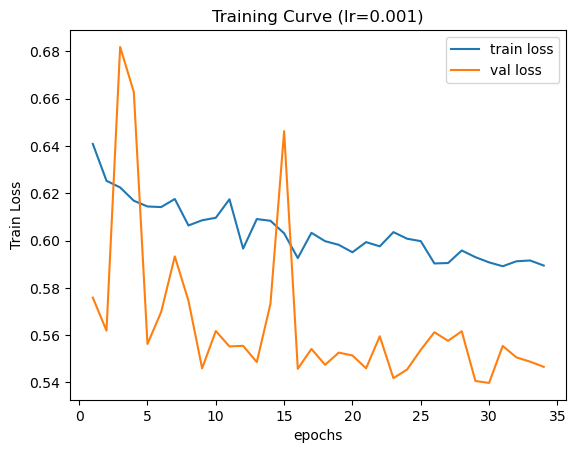

In [25]:
plt.plot(range(1, n_trained_epochs+1), train_avg_loss, label="train loss")
plt.plot(range(1, n_trained_epochs+1), val_avg_loss, label="val loss")
plt.title("Training Curve (lr={})".format(lr))
plt.xlabel("epochs")
plt.ylabel("Train Loss")
plt.legend(loc="best")
plt.show()

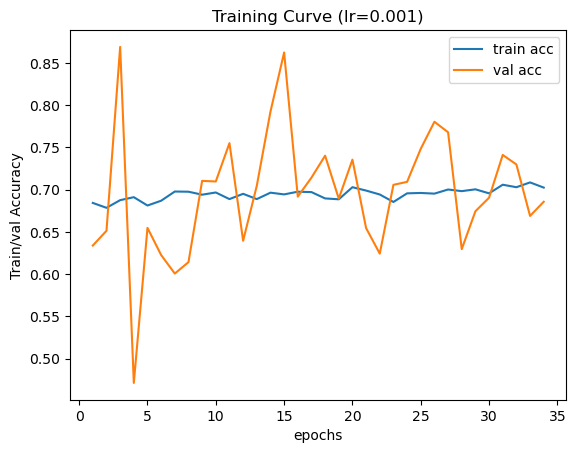

In [26]:
plt.plot(range(1, n_trained_epochs+1), train_avg_acc, label="train acc")
plt.plot(range(1, n_trained_epochs+1), val_avg_acc, label="val acc")
plt.title("Training Curve (lr={})".format(lr))
plt.xlabel("epochs")
plt.ylabel("Train/val Accuracy")
plt.legend(loc="best")
plt.show()

In [27]:
## saving the model 
# torch.save(model.state_dict(), "finetuned-35-epochs-1e3-lr-with-weighted-loss.pth") # early stopping saves model

### Load the model 
- if train and wants to evaluate: jsut use the `sameModelName`
- if want to laod a specific model - use next cell and write in double quote

In [37]:

model_name = "./model-causal-model/model_2_finetuned-30-epochs-lr_0.001.pth"
# model_name = saveModelName
print(model_name)

./model-causal-model/model_2_finetuned-30-epochs-lr_0.001.pth


In [33]:
# loading the locally saved model

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = CausalityBERT()
model.load_state_dict(torch.load(model_name))
## Move the model to the GPU 
model.to(device)
model.eval() # gettign in the eval mode 



You are using a model of type roberta to instantiate a model of type bert. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at vinai/bertweet-base were not used when initializing BertModel: ['roberta.encoder.layer.5.attention.self.value.bias', 'roberta.encoder.layer.10.output.dense.weight', 'roberta.encoder.layer.8.intermediate.dense.bias', 'roberta.encoder.layer.0.attention.self.query.weight', 'roberta.encoder.layer.4.attention.output.LayerNorm.weight', 'roberta.encoder.layer.4.intermediate.dense.weight', 'roberta.encoder.layer.3.output.dense.bias', 'roberta.encoder.layer.10.attention.output.dense.bias', 'roberta.encoder.layer.2.attention.self.value.bias', 'roberta.encoder.layer.10.intermediate.dense.weight', 'roberta.encoder.layer.5.attention.self.key.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.11.attention.self.value.weight', 'roberta.encoder.layer.6.attention.self.query.w

CausalityBERT(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(64001, 768, padding_idx=1)
      (position_embeddings): Embedding(130, 768)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True

## evaluation on the test dataset 



In [34]:
#loss_fn = CrossEntropyLoss()
test_loss = []
test_acc = []
test_prec = []
test_rec = []
test_f1 = []


for batch in tqdm(test_loader):
    batch = tuple(batch[t].to(device) for t in batch)      # batch to GPU
    b_input_ids, b_input_mask, b_token_type_ids, b_labels = batch     # unpack inputs from dataloader

    with torch.no_grad():
        model.eval()
        logits = model(**{"input_ids":b_input_ids, "attention_mask":b_input_mask, "token_type_ids":b_token_type_ids}) # forward pass, calculates logit predictions 
    
    # move logits and labels to CPU
    logits = logits.detach().to('cpu').numpy()
    label_ids = b_labels.to('cpu').numpy()

    pred_flat = np.argmax(logits, axis=1).flatten()
    labels_flat = label_ids.flatten()
    
    metrics = compute_metrics(pred_flat, labels_flat)
    test_acc.append(metrics["accuracy"])
    test_prec.append(metrics["precision"])
    test_rec.append(metrics["recall"])
    test_f1.append(metrics["f1"])

    
print(F'\n\ttest loss: {np.mean(test_loss)}')
print(F'\n\ttest acc: {np.mean(test_acc)}')
print(F'\n\ttest prec: {np.mean(test_prec)}')
print(F'\n\ttest rec: {np.mean(test_rec)}')
print(F'\n\ttest f1: {np.mean(test_f1)}')





  0%|          | 0/77 [00:00<?, ?it/s]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
  1%|▏         | 1/77 [00:01<01:51,  1.47s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
  3%|▎         | 2/77 [00:03<01:56,  1.55s/it]<ipython-input-14-2d1ecdd7ffef>:16: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  , "labels" : torch.tensor(self.labels[idx], dtype=torch.long)
  4%|▍         | 3/77 [00:04<01:54,  1.55s/it]<ipyt


	test loss: nan

	test acc: 0.6986317254174397

	test prec: 0.2594586870560896

	test rec: 0.69004329004329

	test f1: 0.35791920921791054



/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home-dir/vivek.a.khetan/miniconda3/envs/clue/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


### Print predictions of last test set batch:

In [38]:
# take last batch of test set:

for i in range(len(batch)):
    tokens = tokenizer.convert_ids_to_tokens(b_input_ids[i])
    print("\nPadded Sentence:")
    print(tokens)
    print("prediction:", pred_flat[i])
    


Padded Sentence:
['<s>', 'USER', 'This', 'chick', 'deserves', 'congratulations', '.', '</s>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']
prediction: 0

Padded Sentence:
['<s>', 'LIKE', 'FOR', 'FUCKS', 'SAKE', 'I', 'DONT', '

In [36]:
# add seed => check
# add binary accuracy  => ???????
# add plot loss function accuracy => validation accu

# y - axis: loss function; validation accuracy
# x - axis: epochs


# epochs, learning rate => ok

# 90% training => 10% test  => ok
# how to use random batch of training set for validation

# clean notebook

# clean data sheet => check

# Check Pytorch: EarlyStopping add => check